In [1]:
import os
import csv
import pandas as pd
import numpy as np

In [2]:
dataset_names=[]
X_trains=[]
y_trains=[]
X_tests=[]

path = "C:/Users/User/Desktop/SeniorYearFirstSem/DataScience/Competition1_code/Competition_data"
for folder_name in os.listdir(path):
    print(folder_name)
    dataset_names.append(folder_name)
    X_trains.append(pd.read_csv(f"{path}/{folder_name}/X_train.csv", header=0))
    y_trains.append(pd.read_csv(f"{path}/{folder_name}/y_train.csv", header=0))
    X_tests.append(pd.read_csv(f"{path}/{folder_name}/X_test.csv", header=0))

Dataset_1
Dataset_10
Dataset_11
Dataset_12
Dataset_13
Dataset_14
Dataset_15
Dataset_16
Dataset_17
Dataset_18
Dataset_19
Dataset_2
Dataset_20
Dataset_21
Dataset_22
Dataset_23
Dataset_24
Dataset_25
Dataset_26
Dataset_27
Dataset_28
Dataset_29
Dataset_3
Dataset_30
Dataset_31
Dataset_32
Dataset_33
Dataset_34
Dataset_35
Dataset_36
Dataset_37
Dataset_38
Dataset_39
Dataset_4
Dataset_40
Dataset_41
Dataset_42
Dataset_43
Dataset_44
Dataset_45
Dataset_46
Dataset_47
Dataset_48
Dataset_49
Dataset_5
Dataset_6
Dataset_7
Dataset_8
Dataset_9


In [3]:
## Train & Test & Split & Build Model
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

>> Preprocessing functions

In [4]:
import numpy as np
import pandas as pd

def remove_outlier(df, lower_quantile=0.25, upper_quantile=0.75, iqr_multiplier=1.5):
    """
    去除數值型特徵中的異常值（基於 IQR）。
    """
    numeric_cols = df.select_dtypes(include=['float64', 'int64'])
    for col in numeric_cols.columns:
        Q1 = df[col].quantile(lower_quantile)
        Q3 = df[col].quantile(upper_quantile)
        IQR = Q3 - Q1
        lower_bound = Q1 - iqr_multiplier * IQR
        upper_bound = Q3 + iqr_multiplier * IQR
        df[col] = np.clip(df[col], lower_bound, upper_bound)  # 將異常值剪裁到合理範圍
    return df

from sklearn.feature_selection import VarianceThreshold

def remove_low_variance(df, threshold=0.0001):
    """
    移除方差低於 threshold 的特徵。
    """
    selector = VarianceThreshold(threshold=threshold)
    numeric_data = df.select_dtypes(include=['float64', 'int64'])
    high_variance_data = selector.fit_transform(numeric_data)
    retained_features = numeric_data.columns[selector.get_support()]
    df = df[retained_features]
    return df

from scipy.stats import boxcox

def adjust_skewness(df, skew_threshold=2):
    """
    調整偏態，對偏度高於指定閾值的數值型特徵進行處理。
    """
    numeric_cols = df.select_dtypes(include=['float64', 'int64'])
    for col in numeric_cols.columns:
        skewness = df[col].skew()
        if skewness > skew_threshold:  # 偏態較高
            if (df[col] > 0).all():  # Box-Cox 要求數據為正數
                df[col], _ = boxcox(df[col] + 1e-6)
            else:  # 含有非正數，則使用 log1p
                df[col] = np.log1p(df[col] - df[col].min() + 1e-6)
    return df

def select_important_features(X, y, importance_threshold=0.005, retained_top_fraction=0.8):
    """
    基於特徵重要性選擇相關特徵，支持保留累計重要性占前 retained_top_fraction 的特徵。
    """
    # 確保 X 是 DataFrame 格式
    if isinstance(X, np.ndarray):
        X = pd.DataFrame(X)

    # 定義模型
    model = GradientBoostingClassifier(
        loss='log_loss',
        learning_rate=0.05,
        n_estimators=500,
        subsample=0.7,
        criterion='friedman_mse',
        min_samples_leaf=3,
        min_weight_fraction_leaf=0,
        max_depth=3,
        random_state=0,
        max_features=None,
        max_leaf_nodes=None
    )
    # 訓練模型
    model.fit(X, y)

    # 獲取特徵重要性並排序
    feature_importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)

    # 根據 importance_threshold 選擇初步篩選的特徵
    selected_features = feature_importances[feature_importances > importance_threshold].index.tolist()

    # 檢查篩選後的特徵數量
    if len(selected_features) < int(len(feature_importances) * retained_top_fraction):
        # 如果刪除的特徵過多，保留重要性最高的特徵
        num_to_retain = int(len(feature_importances) * retained_top_fraction)
        top_features = feature_importances.nlargest(num_to_retain).index.tolist()
        selected_features = list(set(selected_features + top_features))  # 合併去重
        print(f"Retained top {retained_top_fraction*100:.0f}% of features based on importance.")

    # 選擇重要特徵
    X_selected = X[selected_features]

    print(f"Selected {len(selected_features)} important features out of {X.shape[1]}. "
        f"(retained_top_fraction={retained_top_fraction}, importance_threshold={importance_threshold})")


    return X_selected, selected_features


from imblearn.over_sampling import SMOTE, ADASYN

def handle_class_imbalance(X, y, method='smote'):
    """
    使用 SMOTE 或 ADASYN 處理類別不平衡。
    """
    if method == 'smote':
        sampler = SMOTE(random_state=42)
    elif method == 'adasyn':
        sampler = ADASYN(random_state=42)
    else:
        raise ValueError(f"Unsupported imbalance method: {method}")
    
    X_resampled, y_resampled = sampler.fit_resample(X, y)
    print(f"Class imbalance handled: {dict(pd.Series(y_resampled).value_counts())}")
    return X_resampled, y_resampled


>> Pipeline

In [5]:
from sklearn.preprocessing import OneHotEncoder
def preprocess_pipeline(X, y=None, imbalance_method='smote', selected_features=None, encoder=None):
    """
    預處理流水線：分離數值和類別特徵，進行數據清理、特徵選擇以及類別不平衡處理。
    """
    print("Starting preprocessing pipeline...")

    # 分離數值型和類別型特徵
    numeric_features = X.select_dtypes(include=['float64', 'int64'])
    categorical_features = X.select_dtypes(include=['object', 'category'])

    # 測試階段
    if y is None:
        print("Testing stage: Applying pre-selected features and encoder...")

        # 驗證必要參數
        if selected_features is None:
            raise ValueError("Testing stage requires selected_features.")
        if categorical_features.shape[1] > 0 and encoder is None:
            raise ValueError("Testing stage requires encoder when categorical features are present.")

        # 處理類別型特徵（如果存在）
        if categorical_features.shape[1] > 0:
            if encoder is None:
                raise ValueError("Encoder is None during testing stage, but categorical features are present.")
            X_categorical = encoder.transform(categorical_features)
        else:
            X_categorical = np.empty((X.shape[0], 0))  # 空數組

        # 數值型特徵
        X_numeric = numeric_features.values  # 轉換為 NumPy

        # 合併數值型和類別型特徵
        X_combined = np.hstack([X_numeric, X_categorical])

        # 應用選擇的特徵
        if isinstance(selected_features[0], str):  # 如果選擇的特徵是列名
            all_feature_names = list(numeric_features.columns)
            if categorical_features.shape[1] > 0:
                all_feature_names += encoder.get_feature_names_out(categorical_features.columns).tolist()
            feature_indices = [all_feature_names.index(feat) for feat in selected_features]
            X_combined = X_combined[:, feature_indices]
        else:  # 如果選擇的特徵是索引
            X_combined = X_combined[:, selected_features]

        print(f"Testing stage: Final dataset shape after applying selected features: {X_combined.shape}")
        return X_combined, None, selected_features, encoder


    # 訓練階段執行完整預處理
    print("Training stage: Performing full preprocessing...")

    # Step 1: Process numeric features
    X_numeric = numeric_features.copy()
    X_numeric = remove_outlier(X_numeric)
    X_numeric = remove_low_variance(X_numeric)
    X_numeric = adjust_skewness(X_numeric)

    # Step 2: Process categorical features (One-hot encoding)
    if categorical_features.shape[1] > 0:
        encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
        X_categorical = encoder.fit_transform(categorical_features)
        categorical_feature_names = encoder.get_feature_names_out(categorical_features.columns)
    else:
        encoder = None
        X_categorical = np.empty((X_numeric.shape[0], 0))  # 空數組
        categorical_feature_names = []

    # Combine numeric and categorical features
    X_combined = np.hstack([X_numeric, X_categorical])
    all_feature_names = list(X_numeric.columns) + list(categorical_feature_names)

    # 修正特徵名稱長度
    if len(all_feature_names) > X_combined.shape[1]:
        all_feature_names = all_feature_names[:X_combined.shape[1]]

    X_combined = pd.DataFrame(X_combined, columns=all_feature_names)
    print(f"Combined dataset shape: {X_combined.shape}")

    # Step 3: Select important features
    X_combined, selected_features = select_important_features(X_combined, y)
    print(f"Selected features: {selected_features}")

    # Step 4: Handle class imbalance
    X_final, y_final = handle_class_imbalance(X_combined, y, method=imbalance_method)

    # 確保數據格式一致
    if isinstance(X_final, np.ndarray):
        X_final = pd.DataFrame(X_final, columns=selected_features)

    print(f"Final dataset shape: {X_final.shape}")
    print("Preprocessing pipeline completed.")
    return X_final, y_final, selected_features, encoder


In [6]:
import optuna

c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [52]:
%reset -f

Gradient Boosting Classifier

In [46]:
average_auc = 0
y_predicts = []

# 默认最佳参数
default_params = {
    'learning_rate': 0.05,
    'n_estimators': 500,
    'subsample': 0.7,
    'max_depth': 3,
    'min_samples_leaf': 3,
    'max_features': None
}

def objective(trial, X_train, X_val, y_train, y_val):
    """
    Optuna 目标函数，用于优化 GradientBoostingClassifier 的超参数。
    """
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),  # 默认0.05，搜索范围 [0.03, 0.1]
        'n_estimators': trial.suggest_int('n_estimators', 400, 600),  # 默认500，搜索范围 [400, 600]
        'subsample': trial.suggest_float('subsample', 0.6, 0.8),  # 默认0.7，搜索范围 [0.6, 0.8]
        'max_depth': trial.suggest_int('max_depth', 1, 10),  # 默认3，搜索范围 [2, 5]
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),  # 默认3，搜索范围 [2, 5]
        'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])  # 默认None，增加'sqrt'和'log2'
    }

    # 创建模型并训练
    model = GradientBoostingClassifier(**params, random_state=42)
    model.fit(X_train, y_train)

    # 验证集 AUC
    y_val_proba = model.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_val_proba)
    return auc

for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 获取当前数据集的特征和标签
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 确保数据格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # Step 1: 原始数据上运行 Optuna 优化
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)

    print(f"Running Optuna for {dataset_names[i]}...")
    study = optuna.create_study(direction='maximize')
    study.optimize(lambda trial: objective(trial, X_train, X_val, y_train, y_val), n_trials=50)

    # 获取最佳参数
    best_params = study.best_params
    print(f"Best parameters for {dataset_names[i]}: {best_params}")

    # 创建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 测试未预处理性能
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果未预处理的 AUC 已经达到 0.99，跳过预处理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # Step 2: 预处理数据
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample,
            y_sample,
            imbalance_method='smote'
        )

        # 预处理测试数据
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test,
            selected_features=selected_features,
            encoder=encoder,
        )

        # 修正测试数据列名，确保与训练数据一致
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 测试预处理性能
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 选择较高性能的数据集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test  # 如果原始数据表现更好

    # 最终模型训练和测试
    model.fit(X_sample, y_sample)

    # 修正测试数据列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存到对应路径
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)
    # 更新 AUC 统计
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 计算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")


[I 2024-12-04 15:24:43,019] A new study created in memory with name: no-name-c1bb0cef-e437-4980-82e1-d96d83758e81


Processing Dataset: Dataset_1
Running Optuna for Dataset_1...


[I 2024-12-04 15:24:44,165] Trial 0 finished with value: 0.8421135896218952 and parameters: {'learning_rate': 0.013499899976316088, 'n_estimators': 522, 'subsample': 0.6105411095088882, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.8421135896218952.
[I 2024-12-04 15:24:44,518] Trial 1 finished with value: 0.8509729473184623 and parameters: {'learning_rate': 0.014843351102297562, 'n_estimators': 446, 'subsample': 0.7597830660476994, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.8509729473184623.
[I 2024-12-04 15:24:45,099] Trial 2 finished with value: 0.8397405473817434 and parameters: {'learning_rate': 0.03161546578087537, 'n_estimators': 590, 'subsample': 0.6984902219122177, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.8509729473184623.
[I 2024-12-04 15:24:46,339] Trial 3 finished with value: 0.8487581078943205 and parameters: {'learning_r

Best parameters for Dataset_1: {'learning_rate': 0.010127375776280713, 'n_estimators': 548, 'subsample': 0.6316300746879642, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8624
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (296, 17)
Da

[I 2024-12-04 15:26:12,493] A new study created in memory with name: no-name-389beb17-b387-472a-a599-ee2f979f4fed


Processing Dataset: Dataset_10
Running Optuna for Dataset_10...


[I 2024-12-04 15:26:13,204] Trial 0 finished with value: 0.7194269741439553 and parameters: {'learning_rate': 0.05859797895111032, 'n_estimators': 539, 'subsample': 0.7078897922649777, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7194269741439553.
[I 2024-12-04 15:26:13,823] Trial 1 finished with value: 0.7335196832052177 and parameters: {'learning_rate': 0.067357926962915, 'n_estimators': 503, 'subsample': 0.6172668437241888, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7335196832052177.
[I 2024-12-04 15:26:14,517] Trial 2 finished with value: 0.7238527836012112 and parameters: {'learning_rate': 0.04426342788846003, 'n_estimators': 548, 'subsample': 0.682560219947391, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.7335196832052177.
[I 2024-12-04 15:26:15,333] Trial 3 finished with value: 0.7520382017237361 and parameters: {'learning_rate': 0.01

Best parameters for Dataset_10: {'learning_rate': 0.013615628630840263, 'n_estimators': 494, 'subsample': 0.6793261256174069, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_10 Raw Validation AUC: 0.7581
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (467, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_6', 'Feature_10']
Class imbalance handled: {0: np.int64(273), 1: np.int64(273)}
Final dataset shape: (546, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (312, 9)
Dataset Dataset_10 Preprocessed Validation AUC: 0.7991
Using preprocessed data for Dataset Dataset_10.


[I 2024-12-04 15:27:30,380] A new study created in memory with name: no-name-c15091d0-24ed-4072-9d29-a7c769c4e315


Processing Dataset: Dataset_11
Running Optuna for Dataset_11...


[I 2024-12-04 15:27:30,945] Trial 0 finished with value: 0.6134453781512605 and parameters: {'learning_rate': 0.04704734078431928, 'n_estimators': 478, 'subsample': 0.7434530098583418, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6134453781512605.
[I 2024-12-04 15:27:31,459] Trial 1 finished with value: 0.6302521008403361 and parameters: {'learning_rate': 0.012118349391891646, 'n_estimators': 562, 'subsample': 0.6133427501197858, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 1 with value: 0.6302521008403361.
[I 2024-12-04 15:27:31,879] Trial 2 finished with value: 0.5630252100840336 and parameters: {'learning_rate': 0.014587765926228053, 'n_estimators': 517, 'subsample': 0.6684655171320256, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6302521008403361.
[I 2024-12-04 15:27:32,404] Trial 3 finished with value: 0.5294117647058822 and parameters: {'learning_rate

Best parameters for Dataset_11: {'learning_rate': 0.037760714140107746, 'n_estimators': 514, 'subsample': 0.6626764391452007, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': None}
Dataset Dataset_11 Raw Validation AUC: 0.7479
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (58, 62)
Retained top 80% of features based on importance.
Selected 49 important features out of 62. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_17', 'Feature_42', 'Feature_4', 'Feature_55', 'Feature_56', 'Feature_31', 'Feature_11', 'Feature_18', 'Feature_1', 'Feature_32', 'Feature_27', 'Feature_6', 'Feature_8', 'Feature_39', 'Feature_45', 'Feature_62', 'Feature_26', 'Feature_28', 'Feature_40', 'Feature_2', 'Feature_5', 'Feature_54', 'Feature_3', 'Feature_21', 'Feature_49', 'Feature_36', 'Feature_14', 'Feature_61', 'Feature_35', 'Feature_52', 'Feature_41', 'Feature_30', 'Feature_22', 'Feature_47', 'Feature_51',

[I 2024-12-04 15:27:55,748] A new study created in memory with name: no-name-7ffdf8bc-9c94-4a26-869c-efb68bf35318


Processing Dataset: Dataset_12
Running Optuna for Dataset_12...


[I 2024-12-04 15:27:56,164] Trial 0 finished with value: 0.955357142857143 and parameters: {'learning_rate': 0.05142639636493135, 'n_estimators': 435, 'subsample': 0.6275171178086263, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.955357142857143.
[I 2024-12-04 15:27:56,845] Trial 1 finished with value: 0.9732142857142858 and parameters: {'learning_rate': 0.01299479255551915, 'n_estimators': 503, 'subsample': 0.7506248401457011, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.9732142857142858.
[I 2024-12-04 15:27:57,758] Trial 2 finished with value: 0.9970238095238095 and parameters: {'learning_rate': 0.013965404660544318, 'n_estimators': 430, 'subsample': 0.6638897098800806, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 2 with value: 0.9970238095238095.
[I 2024-12-04 15:27:58,781] Trial 3 finished with value: 0.9776785714285715 and parameters: {'learning_rate': 0.03

Best parameters for Dataset_12: {'learning_rate': 0.013965404660544318, 'n_estimators': 430, 'subsample': 0.6638897098800806, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_12 Raw Validation AUC: 0.9970
Dataset Dataset_12 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:28:45,267] A new study created in memory with name: no-name-bee1f719-e459-4163-ade2-28f7c2dd3249


Processing Dataset: Dataset_13
Running Optuna for Dataset_13...


[I 2024-12-04 15:28:46,224] Trial 0 finished with value: 0.8543371522094928 and parameters: {'learning_rate': 0.04373062799807302, 'n_estimators': 413, 'subsample': 0.6855106733141015, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.8543371522094928.
[I 2024-12-04 15:28:46,590] Trial 1 finished with value: 0.8878887070376432 and parameters: {'learning_rate': 0.014880405828458886, 'n_estimators': 447, 'subsample': 0.6812585419940378, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.8878887070376432.
[I 2024-12-04 15:28:47,191] Trial 2 finished with value: 0.8837970540098199 and parameters: {'learning_rate': 0.05048753922202869, 'n_estimators': 569, 'subsample': 0.6502102888294242, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8878887070376432.
[I 2024-12-04 15:28:47,755] Trial 3 finished with value: 0.8960720130932898 and parameters: {'learning_rate': 

Best parameters for Dataset_13: {'learning_rate': 0.07321378367023129, 'n_estimators': 600, 'subsample': 0.737007460544837, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_13 Raw Validation AUC: 0.9018
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (181, 34)
Retained top 80% of features based on importance.
Selected 27 important features out of 34. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_17', 'Feature_18', 'Feature_4', 'Feature_11', 'Feature_19', 'Feature_1', 'Feature_27', 'Feature_32', 'Feature_8', 'Feature_48', 'Feature_13', 'Feature_33', 'Feature_2', 'Feature_5', 'Feature_54', 'Feature_3', 'Feature_14', 'Feature_16', 'Feature_22', 'Feature_47', 'Feature_12', 'Feature_7', 'Feature_10', 'Feature_34', 'Feature_9', 'Feature_15', 'Feature_20']
Class imbalance handled: {0: np.int64(129), 1: np.int64(129)}
Final dataset shape: (258, 27)
Preprocessing pipe

[I 2024-12-04 15:29:23,771] A new study created in memory with name: no-name-9efc074a-b48f-44f1-8d9c-e684f33fa7fa


Processing Dataset: Dataset_14
Running Optuna for Dataset_14...


[I 2024-12-04 15:29:24,453] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.015566741821116519, 'n_estimators': 481, 'subsample': 0.7923285759761818, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:29:25,045] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.07559056429559, 'n_estimators': 481, 'subsample': 0.7977881387608327, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:29:25,944] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.049642921332752665, 'n_estimators': 569, 'subsample': 0.7852307985425713, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:29:26,414] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.03435501853413069, 'n_estimators': 421, 'subsample': 0.6520083880028832, 'max_depth': 3, 'min_samples_leaf'

Best parameters for Dataset_14: {'learning_rate': 0.015566741821116519, 'n_estimators': 481, 'subsample': 0.7923285759761818, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'log2'}
Dataset Dataset_14 Raw Validation AUC: 1.0000
Dataset Dataset_14 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:29:58,497] A new study created in memory with name: no-name-3799ae9d-f32f-48a4-8b2a-417b363932f4


Processing Dataset: Dataset_15
Running Optuna for Dataset_15...


[I 2024-12-04 15:29:59,334] Trial 0 finished with value: 0.7147964250248263 and parameters: {'learning_rate': 0.026002158628488977, 'n_estimators': 585, 'subsample': 0.6575845045445838, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.7147964250248263.
[I 2024-12-04 15:29:59,830] Trial 1 finished with value: 0.6871896722939425 and parameters: {'learning_rate': 0.017628923402537022, 'n_estimators': 420, 'subsample': 0.644481920453902, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.7147964250248263.
[I 2024-12-04 15:30:00,721] Trial 2 finished with value: 0.6756703078450844 and parameters: {'learning_rate': 0.05643372816125742, 'n_estimators': 493, 'subsample': 0.7724009388666001, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7147964250248263.
[I 2024-12-04 15:30:01,326] Trial 3 finished with value: 0.6960278053624628 and parameters: {'learning_rate':

Best parameters for Dataset_15: {'learning_rate': 0.026002158628488977, 'n_estimators': 585, 'subsample': 0.6575845045445838, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_15 Raw Validation AUC: 0.7148
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (368, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2', 'Feature_11', 'Feature_8', 'Feature_7']
Class imbalance handled: {0: np.int64(250), 1: np.int64(250)}
Final dataset shape: (500, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 6)
Dataset Dataset_15 Preprocessed Validation AUC: 0.6964
Using raw data for Dataset Dataset_15.


[I 2024-12-04 15:30:35,933] A new study created in memory with name: no-name-741f92fd-fdf1-4617-9ce4-d0263bfe1dce


Processing Dataset: Dataset_16
Running Optuna for Dataset_16...


[I 2024-12-04 15:30:37,210] Trial 0 finished with value: 0.9996305418719212 and parameters: {'learning_rate': 0.01561827285231574, 'n_estimators': 543, 'subsample': 0.6145578583487944, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9996305418719212.
[I 2024-12-04 15:30:38,444] Trial 1 finished with value: 0.9997536945812808 and parameters: {'learning_rate': 0.012353446282270314, 'n_estimators': 425, 'subsample': 0.6878568150621719, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9997536945812808.
[I 2024-12-04 15:30:39,160] Trial 2 finished with value: 0.9980295566502463 and parameters: {'learning_rate': 0.084473999791281, 'n_estimators': 454, 'subsample': 0.6287180394389927, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9997536945812808.
[I 2024-12-04 15:30:40,315] Trial 3 finished with value: 0.9976600985221674 and parameters: {'learning_rate': 0.02

Best parameters for Dataset_16: {'learning_rate': 0.012353446282270314, 'n_estimators': 425, 'subsample': 0.6878568150621719, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_16 Raw Validation AUC: 0.9998
Dataset Dataset_16 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:31:27,050] A new study created in memory with name: no-name-95784e68-1bc5-4cca-b829-813e3f4e218a


Processing Dataset: Dataset_17
Running Optuna for Dataset_17...


[I 2024-12-04 15:31:27,983] Trial 0 finished with value: 0.9664902998236331 and parameters: {'learning_rate': 0.01777314236161692, 'n_estimators': 493, 'subsample': 0.6577432799788993, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9664902998236331.
[I 2024-12-04 15:31:28,453] Trial 1 finished with value: 0.9647266313932981 and parameters: {'learning_rate': 0.08640503380147856, 'n_estimators': 517, 'subsample': 0.6461575820510298, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9664902998236331.
[I 2024-12-04 15:31:29,061] Trial 2 finished with value: 0.9576719576719577 and parameters: {'learning_rate': 0.052425935100685, 'n_estimators': 527, 'subsample': 0.6956058898037403, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9664902998236331.
[I 2024-12-04 15:31:29,493] Trial 3 finished with value: 0.961199294532628 and parameters: {'learning_rate': 0.051

Best parameters for Dataset_17: {'learning_rate': 0.010587523077604763, 'n_estimators': 528, 'subsample': 0.7146455022006828, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_17 Raw Validation AUC: 0.9824
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (120, 19)
Selected 17 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_13', 'Feature_10', 'Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_4', 'Feature_12', 'Feature_14', 'Feature_9', 'Feature_19', 'Feature_15', 'Feature_6', 'Feature_24', 'Feature_7', 'Feature_11']
Class imbalance handled: {1.0: np.int64(63), 0.0: np.int64(63)}
Final dataset shape: (126, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (81, 

[I 2024-12-04 15:31:49,926] A new study created in memory with name: no-name-ebb587a9-c156-4c75-86f4-cc807c6a6c0e


Processing Dataset: Dataset_18
Running Optuna for Dataset_18...


[I 2024-12-04 15:31:50,511] Trial 0 finished with value: 0.9999999999999999 and parameters: {'learning_rate': 0.028328687632110567, 'n_estimators': 476, 'subsample': 0.7076801957828474, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9999999999999999.
[I 2024-12-04 15:31:51,261] Trial 1 finished with value: 0.9999999999999999 and parameters: {'learning_rate': 0.03289317228949915, 'n_estimators': 411, 'subsample': 0.7153128407203421, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9999999999999999.
[I 2024-12-04 15:31:52,206] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.013267993856738833, 'n_estimators': 505, 'subsample': 0.6331382950493951, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 2 with value: 1.0.
[I 2024-12-04 15:31:52,853] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.014774045671034573, 'n_estimators': 557, '

Best parameters for Dataset_18: {'learning_rate': 0.013267993856738833, 'n_estimators': 505, 'subsample': 0.6331382950493951, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_18 Raw Validation AUC: 1.0000
Dataset Dataset_18 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:32:29,097] A new study created in memory with name: no-name-0d22d30b-b6f2-4911-a816-38460ed05db7


Processing Dataset: Dataset_19
Running Optuna for Dataset_19...


[I 2024-12-04 15:32:29,821] Trial 0 finished with value: 0.9906520747834018 and parameters: {'learning_rate': 0.013784899490026967, 'n_estimators': 509, 'subsample': 0.7517480164333229, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9906520747834018.
[I 2024-12-04 15:32:30,844] Trial 1 finished with value: 0.9920200638394893 and parameters: {'learning_rate': 0.09844219512940154, 'n_estimators': 549, 'subsample': 0.6143904285310525, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.9920200638394893.
[I 2024-12-04 15:32:31,702] Trial 2 finished with value: 0.9904240766073871 and parameters: {'learning_rate': 0.01218255813016072, 'n_estimators': 444, 'subsample': 0.744347954810404, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9920200638394893.
[I 2024-12-04 15:32:32,252] Trial 3 finished with value: 0.9933880528955767 and parameters: {'learning_rate':

Best parameters for Dataset_19: {'learning_rate': 0.021608475140673298, 'n_estimators': 471, 'subsample': 0.6403827552947374, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_19 Raw Validation AUC: 0.9934
Dataset Dataset_19 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:33:10,703] A new study created in memory with name: no-name-1ac55d1d-0fee-4848-af0a-514dda8d6ca0


Processing Dataset: Dataset_2
Running Optuna for Dataset_2...


[I 2024-12-04 15:33:11,630] Trial 0 finished with value: 0.9982758620689656 and parameters: {'learning_rate': 0.01671641643818082, 'n_estimators': 409, 'subsample': 0.6180337593914633, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9982758620689656.
[I 2024-12-04 15:33:12,908] Trial 1 finished with value: 0.9995073891625617 and parameters: {'learning_rate': 0.012343020906995678, 'n_estimators': 498, 'subsample': 0.6327255825827378, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9995073891625617.
[I 2024-12-04 15:33:13,706] Trial 2 finished with value: 0.9983990147783253 and parameters: {'learning_rate': 0.050893383160156055, 'n_estimators': 486, 'subsample': 0.7484344650941268, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9995073891625617.
[I 2024-12-04 15:33:14,413] Trial 3 finished with value: 0.9985221674876847 and parameters: {'learning_rate': 

Best parameters for Dataset_2: {'learning_rate': 0.028399543421737224, 'n_estimators': 470, 'subsample': 0.6036114971447156, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}
Dataset Dataset_2 Raw Validation AUC: 1.0000
Dataset Dataset_2 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:33:47,447] A new study created in memory with name: no-name-04bedc27-a50e-4f1b-9524-5d5c1342ae69


Processing Dataset: Dataset_20
Running Optuna for Dataset_20...


[I 2024-12-04 15:33:48,066] Trial 0 finished with value: 0.9282296650717703 and parameters: {'learning_rate': 0.037845958642439864, 'n_estimators': 468, 'subsample': 0.7845637422034766, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.9282296650717703.
[I 2024-12-04 15:33:48,614] Trial 1 finished with value: 0.9186602870813397 and parameters: {'learning_rate': 0.07038474139239549, 'n_estimators': 571, 'subsample': 0.7446812997480753, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9282296650717703.
[I 2024-12-04 15:33:48,992] Trial 2 finished with value: 0.9090909090909092 and parameters: {'learning_rate': 0.01702051954935801, 'n_estimators': 572, 'subsample': 0.6082706414035824, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9282296650717703.
[I 2024-12-04 15:33:49,484] Trial 3 finished with value: 0.8995215311004784 and parameters: {'learning_rate'

Best parameters for Dataset_20: {'learning_rate': 0.0428141052729872, 'n_estimators': 463, 'subsample': 0.7777200438938335, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_20 Raw Validation AUC: 0.9537
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (129, 13)
Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_4', 'Feature_13', 'Feature_2', 'Feature_1', 'Feature_6', 'Feature_8', 'Feature_5', 'Feature_3', 'Feature_7', 'Feature_10']
Class imbalance handled: {0: np.int64(91), 1: np.int64(91)}
Final dataset shape: (182, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 10)
Dataset Dataset_20 Preprocessed Validation AUC: 0.

[I 2024-12-04 15:34:18,757] A new study created in memory with name: no-name-3adf909c-dfa3-4dab-b76b-d7136551fa1a


Processing Dataset: Dataset_21
Running Optuna for Dataset_21...


[I 2024-12-04 15:34:19,187] Trial 0 finished with value: 0.9447737068965516 and parameters: {'learning_rate': 0.06539719433067775, 'n_estimators': 463, 'subsample': 0.665117615099712, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.9447737068965516.
[I 2024-12-04 15:34:20,147] Trial 1 finished with value: 0.9587823275862069 and parameters: {'learning_rate': 0.028001615148980225, 'n_estimators': 597, 'subsample': 0.7132070821501721, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.9587823275862069.
[I 2024-12-04 15:34:20,535] Trial 2 finished with value: 0.9423491379310345 and parameters: {'learning_rate': 0.010651267811805643, 'n_estimators': 455, 'subsample': 0.6592300091750972, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9587823275862069.
[I 2024-12-04 15:34:20,912] Trial 3 finished with value: 0.9426185344827587 and parameters: {'learning_rate': 

Best parameters for Dataset_21: {'learning_rate': 0.04159842749564559, 'n_estimators': 493, 'subsample': 0.799657114878746, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_21 Raw Validation AUC: 0.9669
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (303, 17)
Selected 15 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_3', 'Feature_12', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_11', 'Feature_13', 'Feature_8', 'Feature_9', 'Feature_7', 'Feature_6', 'Feature_5', 'Feature_14', 'Feature_16']
Class imbalance handled: {1.0: np.int64(175), 0.0: np.int64(175)}
Final dataset shape: (350, 15)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (203, 15)
Dataset Dataset_21 Preproc

[I 2024-12-04 15:35:10,026] A new study created in memory with name: no-name-ad1cbbde-c3db-4650-8282-cbd83ddd64e3


Processing Dataset: Dataset_22
Running Optuna for Dataset_22...


[I 2024-12-04 15:35:10,502] Trial 0 finished with value: 0.9114583333333334 and parameters: {'learning_rate': 0.04625190624257364, 'n_estimators': 403, 'subsample': 0.6534226696492248, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9114583333333334.
[I 2024-12-04 15:35:11,204] Trial 1 finished with value: 0.8993055555555556 and parameters: {'learning_rate': 0.09066996616070512, 'n_estimators': 572, 'subsample': 0.7343136212957853, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9114583333333334.
[I 2024-12-04 15:35:11,704] Trial 2 finished with value: 0.8975694444444444 and parameters: {'learning_rate': 0.019609350505271798, 'n_estimators': 571, 'subsample': 0.6434727783181925, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9114583333333334.
[I 2024-12-04 15:35:12,234] Trial 3 finished with value: 0.8993055555555556 and parameters: {'learning_rate': 

Best parameters for Dataset_22: {'learning_rate': 0.09933179180361235, 'n_estimators': 507, 'subsample': 0.6416499739827571, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_22 Raw Validation AUC: 0.9253
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (128, 7)
Selected 7 important features out of 7. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_6', 'Feature_3', 'Feature_5', 'Feature_9', 'Feature_2', 'Feature_4']
Class imbalance handled: {0: np.int64(81), 1: np.int64(81)}
Final dataset shape: (162, 7)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 7)
Dataset Dataset_22 Preprocessed Validation AUC: 0.9295
Using preprocessed data for Dataset Dataset_22.


[I 2024-12-04 15:35:38,626] A new study created in memory with name: no-name-8236d463-f609-4f9d-9361-11f4e8ee4903


Processing Dataset: Dataset_23
Running Optuna for Dataset_23...


[I 2024-12-04 15:35:39,316] Trial 0 finished with value: 0.9507890365448504 and parameters: {'learning_rate': 0.011258972815954364, 'n_estimators': 440, 'subsample': 0.6915648200334797, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9507890365448504.
[I 2024-12-04 15:35:42,191] Trial 1 finished with value: 0.9491279069767442 and parameters: {'learning_rate': 0.04373585611109048, 'n_estimators': 502, 'subsample': 0.7314731670075661, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9507890365448504.
[I 2024-12-04 15:35:44,417] Trial 2 finished with value: 0.9493355481727574 and parameters: {'learning_rate': 0.013874833834300512, 'n_estimators': 412, 'subsample': 0.7022460468590215, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9507890365448504.
[I 2024-12-04 15:35:45,349] Trial 3 finished with value: 0.9377076411960132 and parameters: {'learning_rate'

Best parameters for Dataset_23: {'learning_rate': 0.011132590312071079, 'n_estimators': 588, 'subsample': 0.7463314447751963, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_23 Raw Validation AUC: 0.9535
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (354, 14)
Selected 12 important features out of 14. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_12', 'Feature_6', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_13', 'Feature_10', 'Feature_9', 'Feature_8', 'Feature_11']
Class imbalance handled: {1: np.int64(217), 0: np.int64(217)}
Final dataset shape: (434, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (236, 12)
Dataset Dataset_23 Preprocessed Validation AUC: 0.9652
Using prepr

[I 2024-12-04 15:36:31,562] A new study created in memory with name: no-name-f7aac8f9-ecf1-4b70-a5f6-5420c6d56462


Processing Dataset: Dataset_24
Running Optuna for Dataset_24...


[I 2024-12-04 15:36:32,486] Trial 0 finished with value: 0.595109442256617 and parameters: {'learning_rate': 0.08090865396716852, 'n_estimators': 412, 'subsample': 0.7670932101276964, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.595109442256617.
[I 2024-12-04 15:36:34,706] Trial 1 finished with value: 0.608846964007693 and parameters: {'learning_rate': 0.035296772971943786, 'n_estimators': 487, 'subsample': 0.7562517867114541, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.608846964007693.
[I 2024-12-04 15:36:35,144] Trial 2 finished with value: 0.6315596666361388 and parameters: {'learning_rate': 0.019981109709459283, 'n_estimators': 452, 'subsample': 0.6162573134914988, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.6315596666361388.
[I 2024-12-04 15:36:35,729] Trial 3 finished with value: 0.63357450315963 and parameters: {'learning_rate': 0.011

Best parameters for Dataset_24: {'learning_rate': 0.010404357276589907, 'n_estimators': 494, 'subsample': 0.6832436310308933, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}
Dataset Dataset_24 Raw Validation AUC: 0.6772
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_3', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_8', 'Feature_11', 'Feature_6', 'Feature_10', 'Feature_7']
Class imbalance handled: {0: np.int64(426), 1: np.int64(426)}
Final dataset shape: (852, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 10)
Dataset Dataset_24 Preprocessed Validation AUC: 0.7385
Using preprocessed data for Dataset Datase

[I 2024-12-04 15:37:11,946] A new study created in memory with name: no-name-8aee25d2-4dcd-45cc-88e1-82d4be5119b9


Processing Dataset: Dataset_25
Running Optuna for Dataset_25...


[I 2024-12-04 15:37:12,961] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.021719816437087057, 'n_estimators': 412, 'subsample': 0.7675643176868521, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:37:13,441] Trial 1 finished with value: 0.9985294117647059 and parameters: {'learning_rate': 0.040938412483727524, 'n_estimators': 429, 'subsample': 0.7964603496642904, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:37:14,077] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.06163992928939663, 'n_estimators': 433, 'subsample': 0.7723332993172214, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:37:14,655] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.03469199184904533, 'n_estimators': 462, 'subsample': 0.6235648914930348, 'max_depth':

Best parameters for Dataset_25: {'learning_rate': 0.021719816437087057, 'n_estimators': 412, 'subsample': 0.7675643176868521, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_25 Raw Validation AUC: 1.0000
Dataset Dataset_25 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:37:44,207] A new study created in memory with name: no-name-c6fe06df-8ce1-45ad-abe4-b39c5b291106


Processing Dataset: Dataset_26
Running Optuna for Dataset_26...


[I 2024-12-04 15:37:45,106] Trial 0 finished with value: 0.8590909090909091 and parameters: {'learning_rate': 0.011576939630791898, 'n_estimators': 472, 'subsample': 0.646525447711825, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.8590909090909091.
[I 2024-12-04 15:37:45,698] Trial 1 finished with value: 0.8509090909090911 and parameters: {'learning_rate': 0.04980004863348968, 'n_estimators': 435, 'subsample': 0.6629942708738489, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8590909090909091.
[I 2024-12-04 15:37:46,183] Trial 2 finished with value: 0.8527272727272728 and parameters: {'learning_rate': 0.058844483132052885, 'n_estimators': 514, 'subsample': 0.7509325428680466, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8590909090909091.
[I 2024-12-04 15:37:46,790] Trial 3 finished with value: 0.8509090909090908 and parameters: {'learning_rate':

Best parameters for Dataset_26: {'learning_rate': 0.019019082299210316, 'n_estimators': 442, 'subsample': 0.6603771917863124, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'log2'}
Dataset Dataset_26 Raw Validation AUC: 0.8855
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 22)
Selected 20 important features out of 22. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_6', 'Feature_3', 'Feature_18', 'Feature_1', 'Feature_2', 'Feature_7', 'Feature_4', 'Feature_16', 'Feature_22', 'Feature_17', 'Feature_24', 'Feature_25', 'Feature_14', 'Feature_15', 'Feature_26', 'Feature_19', 'Feature_12', 'Feature_20', 'Feature_23']
Class imbalance handled: {0: np.int64(114), 1: np.int64(114)}
Final dataset shape: (228, 20)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shap

[I 2024-12-04 15:38:25,903] A new study created in memory with name: no-name-43b049ae-fef3-4b2d-9436-6804055d49f3


Processing Dataset: Dataset_27
Running Optuna for Dataset_27...


[I 2024-12-04 15:38:26,620] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.039296074570513005, 'n_estimators': 558, 'subsample': 0.6774014347493117, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:38:27,082] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.03739037038000487, 'n_estimators': 413, 'subsample': 0.7243511834988077, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:38:27,634] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.059374573521936196, 'n_estimators': 494, 'subsample': 0.6434196484272889, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:38:28,228] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.017681428647628436, 'n_estimators': 434, 'subsample': 0.730907543340098, 'max_depth': 6, 'min_sample

Best parameters for Dataset_27: {'learning_rate': 0.039296074570513005, 'n_estimators': 558, 'subsample': 0.6774014347493117, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_27 Raw Validation AUC: 1.0000
Dataset Dataset_27 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:39:01,838] A new study created in memory with name: no-name-77d3755d-1db0-4660-aa27-bebb5f6e4b86


Processing Dataset: Dataset_28
Running Optuna for Dataset_28...


[I 2024-12-04 15:39:02,909] Trial 0 finished with value: 0.8040060851926978 and parameters: {'learning_rate': 0.06946961310181171, 'n_estimators': 591, 'subsample': 0.7362179432554717, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.8040060851926978.
[I 2024-12-04 15:39:03,922] Trial 1 finished with value: 0.8092038539553752 and parameters: {'learning_rate': 0.011944563045762443, 'n_estimators': 463, 'subsample': 0.6283324440297092, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8092038539553752.
[I 2024-12-04 15:39:04,548] Trial 2 finished with value: 0.8042596348884381 and parameters: {'learning_rate': 0.04044376661148281, 'n_estimators': 440, 'subsample': 0.6388800843923818, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.8092038539553752.
[I 2024-12-04 15:39:05,021] Trial 3 finished with value: 0.8079361054766735 and parameters: {'learning_rate':

Best parameters for Dataset_28: {'learning_rate': 0.039989993581249376, 'n_estimators': 430, 'subsample': 0.6218538192645563, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_28 Raw Validation AUC: 0.8244
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_3', 'Feature_1', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_28 Preprocessed Validation AUC: 0.8993
Using preprocessed data for Dataset Dataset_28.


[I 2024-12-04 15:40:05,575] A new study created in memory with name: no-name-807924b3-2f68-43b3-bb5f-9ed7a4213b82


Processing Dataset: Dataset_29
Running Optuna for Dataset_29...


[I 2024-12-04 15:40:06,281] Trial 0 finished with value: 0.9630515683147263 and parameters: {'learning_rate': 0.06111525036824877, 'n_estimators': 510, 'subsample': 0.6399357768195105, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9630515683147263.
[I 2024-12-04 15:40:06,935] Trial 1 finished with value: 0.9633173843700159 and parameters: {'learning_rate': 0.04017577941972443, 'n_estimators': 439, 'subsample': 0.7654843686067928, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9633173843700159.
[I 2024-12-04 15:40:07,444] Trial 2 finished with value: 0.9670388091440723 and parameters: {'learning_rate': 0.011495546444039741, 'n_estimators': 470, 'subsample': 0.7465958997281188, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 2 with value: 0.9670388091440723.
[I 2024-12-04 15:40:07,964] Trial 3 finished with value: 0.9643806485911748 and parameters: {'learning_rate'

Best parameters for Dataset_29: {'learning_rate': 0.014944585803179082, 'n_estimators': 597, 'subsample': 0.6605968092577567, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_29 Raw Validation AUC: 0.9724
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (306, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_11', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_8', 'Feature_7', 'Feature_9', 'Feature_3', 'Feature_10', 'Feature_4', 'Feature_13']
Class imbalance handled: {0.0: np.int64(175), 1.0: np.int64(175)}
Final dataset shape: (350, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (205, 11)
Dataset Dataset_29 Preprocessed Validation AUC: 0.9659
Using raw data for Dat

[I 2024-12-04 15:41:15,821] A new study created in memory with name: no-name-5684d152-6282-464f-a31c-23ab17498db8


Processing Dataset: Dataset_3
Running Optuna for Dataset_3...


[I 2024-12-04 15:41:16,378] Trial 0 finished with value: 0.8775510204081632 and parameters: {'learning_rate': 0.05351686939968489, 'n_estimators': 557, 'subsample': 0.783147718816163, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8775510204081632.
[I 2024-12-04 15:41:16,868] Trial 1 finished with value: 0.7755102040816327 and parameters: {'learning_rate': 0.05754351242604056, 'n_estimators': 573, 'subsample': 0.6867070936700115, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.8775510204081632.
[I 2024-12-04 15:41:17,534] Trial 2 finished with value: 0.8775510204081632 and parameters: {'learning_rate': 0.0478939289467393, 'n_estimators': 540, 'subsample': 0.6058248861608159, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8775510204081632.
[I 2024-12-04 15:41:17,921] Trial 3 finished with value: 0.8214285714285714 and parameters: {'learning_rate': 0.

Best parameters for Dataset_3: {'learning_rate': 0.025326926113355623, 'n_estimators': 479, 'subsample': 0.7830418139735842, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_3 Raw Validation AUC: 0.9031
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (69, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_4', 'Feature_6', 'Feature_9']
Class imbalance handled: {0: np.int64(35), 1: np.int64(35)}
Final dataset shape: (70, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (47, 9)
Dataset Dataset_3 Preprocessed Validation AUC: 0.8980
Using raw data for Dataset Dataset_3.


[I 2024-12-04 15:41:42,014] A new study created in memory with name: no-name-b9748c25-315b-4980-86de-5845c9e040f8


Processing Dataset: Dataset_30
Running Optuna for Dataset_30...


[I 2024-12-04 15:41:42,852] Trial 0 finished with value: 0.7376869139139984 and parameters: {'learning_rate': 0.013133176732045462, 'n_estimators': 530, 'subsample': 0.792250539658047, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.7376869139139984.
[I 2024-12-04 15:41:43,958] Trial 1 finished with value: 0.7354904114218129 and parameters: {'learning_rate': 0.04643782980521402, 'n_estimators': 455, 'subsample': 0.6764593878362415, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.7376869139139984.
[I 2024-12-04 15:41:45,666] Trial 2 finished with value: 0.7148770803413027 and parameters: {'learning_rate': 0.06159428443661709, 'n_estimators': 539, 'subsample': 0.736658114677365, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.7376869139139984.
[I 2024-12-04 15:41:48,279] Trial 3 finished with value: 0.7293233082706767 and parameters: {'learning_rate': 

Best parameters for Dataset_30: {'learning_rate': 0.01719028460961601, 'n_estimators': 570, 'subsample': 0.6621569084847276, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_30 Raw Validation AUC: 0.7394
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (553, 17)
Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_26', 'Feature_11', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_27', 'Feature_6', 'Feature_8', 'Feature_5', 'Feature_9', 'Feature_3', 'Feature_7', 'Feature_10']
Class imbalance handled: {1: np.int64(355), 0: np.int64(355)}
Final dataset shape: (710, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (370, 13)
Datas

[I 2024-12-04 15:42:29,176] A new study created in memory with name: no-name-3d7c378e-5c81-4a83-af15-1d19512b2e85


Processing Dataset: Dataset_31
Running Optuna for Dataset_31...


[I 2024-12-04 15:42:29,791] Trial 0 finished with value: 0.6699999999999999 and parameters: {'learning_rate': 0.0985453187901254, 'n_estimators': 556, 'subsample': 0.6887113019382762, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.6699999999999999.
[I 2024-12-04 15:42:30,293] Trial 1 finished with value: 0.72 and parameters: {'learning_rate': 0.015721472119702998, 'n_estimators': 550, 'subsample': 0.7349784626367126, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.72.
[I 2024-12-04 15:42:30,882] Trial 2 finished with value: 0.7 and parameters: {'learning_rate': 0.02107618614491245, 'n_estimators': 574, 'subsample': 0.7651280912502674, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.72.
[I 2024-12-04 15:42:31,375] Trial 3 finished with value: 0.6799999999999999 and parameters: {'learning_rate': 0.020060395612899927, 'n_estimators': 470, 'subsample':

Best parameters for Dataset_31: {'learning_rate': 0.010004777021625994, 'n_estimators': 504, 'subsample': 0.7057266319124315, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_31 Raw Validation AUC: 0.7400
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (81, 13)
Selected 13 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_5', 'Feature_4', 'Feature_11', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_6', 'Feature_7', 'Feature_3', 'Feature_2', 'Feature_14', 'Feature_10']
Class imbalance handled: {0: np.int64(59), 1: np.int64(59)}
Final dataset shape: (118, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (54, 13)
Dataset Dataset_31 Preprocessed Validation AUC: 0.9231
Usi

[I 2024-12-04 15:42:52,943] A new study created in memory with name: no-name-1aef3fcb-d348-4767-ad32-c166b0b81032


Processing Dataset: Dataset_32
Running Optuna for Dataset_32...


[I 2024-12-04 15:42:53,448] Trial 0 finished with value: 0.7583261111798935 and parameters: {'learning_rate': 0.024075808488619697, 'n_estimators': 433, 'subsample': 0.604900078454205, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.7583261111798935.
[I 2024-12-04 15:42:54,245] Trial 1 finished with value: 0.7047170979324008 and parameters: {'learning_rate': 0.0298300556356865, 'n_estimators': 532, 'subsample': 0.7414748343087084, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.7583261111798935.
[I 2024-12-04 15:42:55,448] Trial 2 finished with value: 0.6960505138046306 and parameters: {'learning_rate': 0.05898946838932877, 'n_estimators': 447, 'subsample': 0.7332072491856705, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7583261111798935.
[I 2024-12-04 15:42:56,246] Trial 3 finished with value: 0.6946886220131236 and parameters: {'learning_rate

Best parameters for Dataset_32: {'learning_rate': 0.010000972046316078, 'n_estimators': 435, 'subsample': 0.7172877931432659, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': None}
Dataset Dataset_32 Raw Validation AUC: 0.7853
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_32 Preprocessed Validation AUC: 0.8234
Using preprocessed data for Dataset Dataset_32.


[I 2024-12-04 15:43:23,509] A new study created in memory with name: no-name-e0deeb05-c2b4-4b69-8e8c-f62a757b939d


Processing Dataset: Dataset_33
Running Optuna for Dataset_33...


[I 2024-12-04 15:43:24,251] Trial 0 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.01890285298490277, 'n_estimators': 578, 'subsample': 0.6117221717769815, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-12-04 15:43:26,341] Trial 1 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.03316441049321835, 'n_estimators': 426, 'subsample': 0.7725605335932002, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-12-04 15:43:26,846] Trial 2 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.08525626194123728, 'n_estimators': 565, 'subsample': 0.6738086822219356, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-12-04 15:43:27,259] Trial 3 finished with value: 0.994502977553825 and parameters: {'learning_rate':

Best parameters for Dataset_33: {'learning_rate': 0.01890285298490277, 'n_estimators': 578, 'subsample': 0.6117221717769815, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_33 Raw Validation AUC: 0.9991
Dataset Dataset_33 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:44:03,814] A new study created in memory with name: no-name-0a13e212-92a0-455a-9177-070e8a38192d


Processing Dataset: Dataset_34
Running Optuna for Dataset_34...


[I 2024-12-04 15:44:04,540] Trial 0 finished with value: 0.8527524484971294 and parameters: {'learning_rate': 0.04501703807790998, 'n_estimators': 425, 'subsample': 0.7173493891046843, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.8527524484971294.
[I 2024-12-04 15:44:05,127] Trial 1 finished with value: 0.8368794326241135 and parameters: {'learning_rate': 0.0928207760527051, 'n_estimators': 592, 'subsample': 0.7003679610751355, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8527524484971294.
[I 2024-12-04 15:44:05,945] Trial 2 finished with value: 0.8598446470786896 and parameters: {'learning_rate': 0.0295512040748133, 'n_estimators': 563, 'subsample': 0.6628340989683497, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8598446470786896.
[I 2024-12-04 15:44:06,795] Trial 3 finished with value: 0.8470111448834854 and parameters: {'learning_rate': 0

Best parameters for Dataset_34: {'learning_rate': 0.01509618352664425, 'n_estimators': 431, 'subsample': 0.7851352784358546, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_34 Raw Validation AUC: 0.8727
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (274, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_1', 'Feature_13', 'Feature_7', 'Feature_12', 'Feature_11', 'Feature_3', 'Feature_9', 'Feature_10', 'Feature_5', 'Feature_6']
Class imbalance handled: {1.0: np.int64(157), 0.0: np.int64(157)}
Final dataset shape: (314, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (183, 11)
Dataset Dataset_34 Preprocessed Validation AUC: 0.8933
Using preprocessed dat

[I 2024-12-04 15:44:42,014] A new study created in memory with name: no-name-11b7aca2-b6e3-4400-b44d-bcd045e2632d


Processing Dataset: Dataset_35
Running Optuna for Dataset_35...


[I 2024-12-04 15:44:42,489] Trial 0 finished with value: 0.7814401622718052 and parameters: {'learning_rate': 0.04039164097426308, 'n_estimators': 458, 'subsample': 0.7258958149816068, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.7814401622718052.
[I 2024-12-04 15:44:42,885] Trial 1 finished with value: 0.8182048681541583 and parameters: {'learning_rate': 0.015061204812464347, 'n_estimators': 425, 'subsample': 0.7181537109146825, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.8182048681541583.
[I 2024-12-04 15:44:44,646] Trial 2 finished with value: 0.8121196754563895 and parameters: {'learning_rate': 0.04204599033841294, 'n_estimators': 597, 'subsample': 0.6950743231725376, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.8182048681541583.
[I 2024-12-04 15:44:45,699] Trial 3 finished with value: 0.7983012170385395 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_35: {'learning_rate': 0.01200870493304477, 'n_estimators': 401, 'subsample': 0.7743635717081415, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_35 Raw Validation AUC: 0.8225
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_35 Preprocessed Validation AUC: 0.8617
Using preprocessed data for Dataset Dataset_35.


[I 2024-12-04 15:45:18,312] A new study created in memory with name: no-name-8dd3e832-49b1-4bad-ba09-11b7be83de61


Processing Dataset: Dataset_36
Running Optuna for Dataset_36...


[I 2024-12-04 15:45:18,841] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.03612601229977687, 'n_estimators': 424, 'subsample': 0.7453843153456355, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:45:19,216] Trial 1 finished with value: 0.9981060606060607 and parameters: {'learning_rate': 0.017954736624817776, 'n_estimators': 545, 'subsample': 0.77510526085401, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:45:19,787] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.060420770797408, 'n_estimators': 502, 'subsample': 0.7549428639497174, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:45:20,261] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.012988254418922877, 'n_estimators': 505, 'subsample': 0.7542285373408161, 'max_depth': 2, 

Best parameters for Dataset_36: {'learning_rate': 0.03612601229977687, 'n_estimators': 424, 'subsample': 0.7453843153456355, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}
Dataset Dataset_36 Raw Validation AUC: 1.0000
Dataset Dataset_36 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:45:51,777] A new study created in memory with name: no-name-fa0741a7-fae4-44fa-a9c2-bd87b311f7e9


Processing Dataset: Dataset_37
Running Optuna for Dataset_37...


[I 2024-12-04 15:45:52,361] Trial 0 finished with value: 0.8709401709401711 and parameters: {'learning_rate': 0.03995770387578943, 'n_estimators': 486, 'subsample': 0.7202338634013965, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.8709401709401711.
[I 2024-12-04 15:45:53,034] Trial 1 finished with value: 0.8905982905982905 and parameters: {'learning_rate': 0.01216281274031589, 'n_estimators': 599, 'subsample': 0.7413293141328074, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8905982905982905.
[I 2024-12-04 15:45:54,540] Trial 2 finished with value: 0.8555555555555555 and parameters: {'learning_rate': 0.019080493676768444, 'n_estimators': 569, 'subsample': 0.6595380633663571, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.8905982905982905.
[I 2024-12-04 15:45:55,122] Trial 3 finished with value: 0.8811965811965812 and parameters: {'learning_rate': 

Best parameters for Dataset_37: {'learning_rate': 0.014060756124873503, 'n_estimators': 527, 'subsample': 0.7833405109589903, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_37 Raw Validation AUC: 0.9026
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (177, 12)
Selected 12 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_2', 'Feature_4', 'Feature_7', 'Feature_3', 'Feature_8', 'Feature_12', 'Feature_13', 'Feature_11']
Class imbalance handled: {1: np.int64(95), 0: np.int64(95)}
Final dataset shape: (190, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (119, 12)
Dataset Dataset_37 Preprocessed Validation AUC: 0.9078
Using preproce

[I 2024-12-04 15:46:22,108] A new study created in memory with name: no-name-666521ee-d354-45a4-ab55-e8acd2ffb95e


Processing Dataset: Dataset_38
Running Optuna for Dataset_38...


[I 2024-12-04 15:46:22,485] Trial 0 finished with value: 0.7768317853457173 and parameters: {'learning_rate': 0.03253099157977079, 'n_estimators': 410, 'subsample': 0.7242709967513664, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.7768317853457173.
[I 2024-12-04 15:46:23,184] Trial 1 finished with value: 0.739938080495356 and parameters: {'learning_rate': 0.04380427104133844, 'n_estimators': 506, 'subsample': 0.6895759107932465, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7768317853457173.
[I 2024-12-04 15:46:23,981] Trial 2 finished with value: 0.7383900928792569 and parameters: {'learning_rate': 0.018017482604108234, 'n_estimators': 568, 'subsample': 0.6257351015520571, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7768317853457173.
[I 2024-12-04 15:46:25,440] Trial 3 finished with value: 0.7518059855521155 and parameters: {'learning_rate'

Best parameters for Dataset_38: {'learning_rate': 0.010250258196858873, 'n_estimators': 471, 'subsample': 0.6595083101960654, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_38 Raw Validation AUC: 0.7866
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (349, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_4', 'Feature_5', 'Feature_6', 'Feature_8', 'Feature_7', 'Feature_2', 'Feature_3', 'Feature_9', 'Feature_11']
Class imbalance handled: {1: np.int64(249), 0: np.int64(249)}
Final dataset shape: (498, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (234, 10)
Dataset Dataset_38 Preprocessed Validation AUC: 0.7491
Using raw data for Dataset Dataset_38.


[I 2024-12-04 15:46:55,981] A new study created in memory with name: no-name-03399a7c-cc4f-4881-a0e0-5ac39d1efd66


Processing Dataset: Dataset_39
Running Optuna for Dataset_39...


[I 2024-12-04 15:46:57,685] Trial 0 finished with value: 0.997951868919611 and parameters: {'learning_rate': 0.014035497934732055, 'n_estimators': 522, 'subsample': 0.6085196730749801, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.997951868919611.
[I 2024-12-04 15:46:58,207] Trial 1 finished with value: 0.9979518689196109 and parameters: {'learning_rate': 0.01402448738676605, 'n_estimators': 463, 'subsample': 0.6830337268798059, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.997951868919611.
[I 2024-12-04 15:46:58,983] Trial 2 finished with value: 0.9989759344598055 and parameters: {'learning_rate': 0.014426105247305778, 'n_estimators': 449, 'subsample': 0.6546385258982897, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9989759344598055.
[I 2024-12-04 15:46:59,579] Trial 3 finished with value: 0.9984639016897082 and parameters: {'learning_rate': 0

Best parameters for Dataset_39: {'learning_rate': 0.03630112669003965, 'n_estimators': 448, 'subsample': 0.6196507598579143, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'sqrt'}
Dataset Dataset_39 Raw Validation AUC: 0.9997
Dataset Dataset_39 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:48:07,980] A new study created in memory with name: no-name-1bd1ecf5-62a6-4e0d-9d75-be4974c6d402


Processing Dataset: Dataset_4
Running Optuna for Dataset_4...


[I 2024-12-04 15:48:08,462] Trial 0 finished with value: 0.5486111111111112 and parameters: {'learning_rate': 0.03930208976578357, 'n_estimators': 488, 'subsample': 0.6857204610603679, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.5486111111111112.
[I 2024-12-04 15:48:09,047] Trial 1 finished with value: 0.5744949494949496 and parameters: {'learning_rate': 0.01561440754709503, 'n_estimators': 418, 'subsample': 0.7447261246194541, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.5744949494949496.
[I 2024-12-04 15:48:09,670] Trial 2 finished with value: 0.4791666666666667 and parameters: {'learning_rate': 0.05742268074370364, 'n_estimators': 536, 'subsample': 0.7825941914990996, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.5744949494949496.
[I 2024-12-04 15:48:10,013] Trial 3 finished with value: 0.6565656565656566 and parameters: {'learning_rate':

Best parameters for Dataset_4: {'learning_rate': 0.044249258106789285, 'n_estimators': 432, 'subsample': 0.7561564368299865, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_4 Raw Validation AUC: 0.6932
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (514, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_9', 'Feature_3', 'Feature_4', 'Feature_2', 'Feature_8']
Class imbalance handled: {0: np.int64(486), 1: np.int64(486)}
Final dataset shape: (972, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (344, 6)
Dataset Dataset_4 Preprocessed Validation AUC: 0.8884
Using preprocessed data for Dataset Dataset_4.


[I 2024-12-04 15:48:38,753] A new study created in memory with name: no-name-f105b4d2-3e2d-4ae5-8134-b9d69fbd37c7


Processing Dataset: Dataset_40
Running Optuna for Dataset_40...


[I 2024-12-04 15:48:40,299] Trial 0 finished with value: 0.8076825557809331 and parameters: {'learning_rate': 0.032892860766590995, 'n_estimators': 564, 'subsample': 0.7523946563628503, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8076825557809331.
[I 2024-12-04 15:48:41,158] Trial 1 finished with value: 0.8041328600405679 and parameters: {'learning_rate': 0.024134761303519398, 'n_estimators': 431, 'subsample': 0.6699902989563246, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.8076825557809331.
[I 2024-12-04 15:48:41,801] Trial 2 finished with value: 0.8108519269776877 and parameters: {'learning_rate': 0.011356651254578057, 'n_estimators': 564, 'subsample': 0.7039003719873915, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 2 with value: 0.8108519269776877.
[I 2024-12-04 15:48:42,453] Trial 3 finished with value: 0.8175709939148074 and parameters: {'learning_rate'

Best parameters for Dataset_40: {'learning_rate': 0.016269044657134087, 'n_estimators': 519, 'subsample': 0.7262379002339031, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
Dataset Dataset_40 Raw Validation AUC: 0.8224
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_40 Preprocessed Validation AUC: 0.8593
Using preprocessed data for Dataset Dataset_40.


[I 2024-12-04 15:49:15,306] A new study created in memory with name: no-name-d75b5c28-f555-4f01-8412-e1cd72825d9d


Processing Dataset: Dataset_41
Running Optuna for Dataset_41...


[I 2024-12-04 15:49:15,912] Trial 0 finished with value: 0.9854651162790697 and parameters: {'learning_rate': 0.011674369607230003, 'n_estimators': 549, 'subsample': 0.6058488615811336, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9854651162790697.
[I 2024-12-04 15:49:16,883] Trial 1 finished with value: 0.9877906976744186 and parameters: {'learning_rate': 0.033096167186425864, 'n_estimators': 515, 'subsample': 0.6898563652340681, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9877906976744186.
[I 2024-12-04 15:49:17,410] Trial 2 finished with value: 0.9866279069767442 and parameters: {'learning_rate': 0.04848671250670275, 'n_estimators': 514, 'subsample': 0.7429038190369333, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.9877906976744186.
[I 2024-12-04 15:49:17,902] Trial 3 finished with value: 0.9889534883720931 and parameters: {'learning_rate

Best parameters for Dataset_41: {'learning_rate': 0.06446441928529373, 'n_estimators': 409, 'subsample': 0.7543216733377482, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_41 Raw Validation AUC: 0.9927
Dataset Dataset_41 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:49:52,538] A new study created in memory with name: no-name-48805c99-cd9d-4d9d-adbe-d12b8edd5b35


Processing Dataset: Dataset_42
Running Optuna for Dataset_42...


[I 2024-12-04 15:49:53,105] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.013099279335928027, 'n_estimators': 487, 'subsample': 0.7640748230280058, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:49:54,073] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.015723217929534496, 'n_estimators': 455, 'subsample': 0.7741423735333656, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:49:54,467] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.03356709245407463, 'n_estimators': 408, 'subsample': 0.654483178871299, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:49:54,928] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.010861510301101175, 'n_estimators': 438, 'subsample': 0.7488469443495409, 'max_depth': 2, 'min_samples_

Best parameters for Dataset_42: {'learning_rate': 0.013099279335928027, 'n_estimators': 487, 'subsample': 0.7640748230280058, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_42 Raw Validation AUC: 1.0000
Dataset Dataset_42 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:50:22,684] A new study created in memory with name: no-name-04a520cd-b6a7-42e2-b4de-b9462e6b522c


Processing Dataset: Dataset_43
Running Optuna for Dataset_43...


[I 2024-12-04 15:50:23,707] Trial 0 finished with value: 0.6986504890429615 and parameters: {'learning_rate': 0.03055319646390443, 'n_estimators': 412, 'subsample': 0.6332563845636089, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.6986504890429615.
[I 2024-12-04 15:50:24,865] Trial 1 finished with value: 0.6607651355701375 and parameters: {'learning_rate': 0.017530686681094906, 'n_estimators': 499, 'subsample': 0.7832153882209051, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.6986504890429615.
[I 2024-12-04 15:50:27,042] Trial 2 finished with value: 0.6726507366596508 and parameters: {'learning_rate': 0.0665009930233267, 'n_estimators': 482, 'subsample': 0.7910479206729598, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.6986504890429615.
[I 2024-12-04 15:50:28,018] Trial 3 finished with value: 0.6902315216045563 and parameters: {'learning_rate': 

Best parameters for Dataset_43: {'learning_rate': 0.010180984206073806, 'n_estimators': 531, 'subsample': 0.6769362489332327, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'log2'}
Dataset Dataset_43 Raw Validation AUC: 0.7840
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_43 Preprocessed Validation AUC: 0.8336
Using preprocessed data for Dataset Dataset_43.


[I 2024-12-04 15:50:59,580] A new study created in memory with name: no-name-babbe16b-c343-44b2-b810-6fcb45ec931c


Processing Dataset: Dataset_44
Running Optuna for Dataset_44...


[I 2024-12-04 15:50:59,968] Trial 0 finished with value: 0.9765625 and parameters: {'learning_rate': 0.06158988261946897, 'n_estimators': 499, 'subsample': 0.7385711881509485, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.9765625.
[I 2024-12-04 15:51:00,244] Trial 1 finished with value: 0.96875 and parameters: {'learning_rate': 0.08424648886717886, 'n_estimators': 425, 'subsample': 0.6039906151248078, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9765625.
[I 2024-12-04 15:51:00,548] Trial 2 finished with value: 0.953125 and parameters: {'learning_rate': 0.012501601543836017, 'n_estimators': 580, 'subsample': 0.6203904598632953, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9765625.
[I 2024-12-04 15:51:00,823] Trial 3 finished with value: 0.96875 and parameters: {'learning_rate': 0.023755268276760895, 'n_estimators': 511, 'subsample': 0.63182790

Best parameters for Dataset_44: {'learning_rate': 0.036442255160575476, 'n_estimators': 543, 'subsample': 0.7042696360213898, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_44 Raw Validation AUC: 1.0000
Dataset Dataset_44 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:51:23,386] A new study created in memory with name: no-name-4b122489-3ca4-4b2b-8889-7af1177cd832


Processing Dataset: Dataset_45
Running Optuna for Dataset_45...


[I 2024-12-04 15:51:23,816] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.02273765369334147, 'n_estimators': 417, 'subsample': 0.74871525064992, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:51:24,147] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.023759916750877998, 'n_estimators': 401, 'subsample': 0.761601218065702, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:51:24,626] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.08097618672223003, 'n_estimators': 476, 'subsample': 0.6628852940777864, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:51:25,102] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.01938591092161736, 'n_estimators': 470, 'subsample': 0.7227136259061413, 'max_depth': 7, 'min_samples_leaf'

Best parameters for Dataset_45: {'learning_rate': 0.02273765369334147, 'n_estimators': 417, 'subsample': 0.74871525064992, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_45 Raw Validation AUC: 1.0000
Dataset Dataset_45 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:51:50,645] A new study created in memory with name: no-name-d83ad227-0d55-4500-be16-d73dcb5b7e7c


Processing Dataset: Dataset_46
Running Optuna for Dataset_46...


[I 2024-12-04 15:51:51,100] Trial 0 finished with value: 0.8934817170111287 and parameters: {'learning_rate': 0.017456858692957856, 'n_estimators': 444, 'subsample': 0.6225630537110528, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8934817170111287.
[I 2024-12-04 15:51:51,592] Trial 1 finished with value: 0.9022257551669317 and parameters: {'learning_rate': 0.06773801703273431, 'n_estimators': 579, 'subsample': 0.6191647842177362, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.9022257551669317.
[I 2024-12-04 15:51:51,995] Trial 2 finished with value: 0.9069952305246423 and parameters: {'learning_rate': 0.045977986633113005, 'n_estimators': 403, 'subsample': 0.7229605941017372, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 2 with value: 0.9069952305246423.
[I 2024-12-04 15:51:52,777] Trial 3 finished with value: 0.8823529411764706 and parameters: {'learning_rate': 0.

Best parameters for Dataset_46: {'learning_rate': 0.013259214558952645, 'n_estimators': 501, 'subsample': 0.7772165945075851, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_46 Raw Validation AUC: 0.9189
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (176, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_13', 'Feature_6', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_8']
Class imbalance handled: {0.0: np.int64(107), 1.0: np.int64(107)}
Final dataset shape: (214, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (118, 8)
Dataset Dataset_46 Preprocessed Validation AUC: 0.8690
Using raw data for Dataset Dataset_46.


[I 2024-12-04 15:52:17,749] A new study created in memory with name: no-name-4544743a-fc3d-4122-98ef-a238a2968c3d


Processing Dataset: Dataset_47
Running Optuna for Dataset_47...


[I 2024-12-04 15:52:18,421] Trial 0 finished with value: 0.832 and parameters: {'learning_rate': 0.011308659663227033, 'n_estimators': 591, 'subsample': 0.7598261369109063, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.832.
[I 2024-12-04 15:52:19,275] Trial 1 finished with value: 0.8200000000000001 and parameters: {'learning_rate': 0.014021370243879509, 'n_estimators': 567, 'subsample': 0.7991535104127379, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.832.
[I 2024-12-04 15:52:19,916] Trial 2 finished with value: 0.772 and parameters: {'learning_rate': 0.040742012401044705, 'n_estimators': 443, 'subsample': 0.7918731795503545, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.832.
[I 2024-12-04 15:52:20,721] Trial 3 finished with value: 0.804 and parameters: {'learning_rate': 0.08724829699818036, 'n_estimators': 492, 'subsample': 0.7424060356908004, 'ma

Best parameters for Dataset_47: {'learning_rate': 0.016404802338257234, 'n_estimators': 562, 'subsample': 0.7874839320979036, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': None}
Dataset Dataset_47 Raw Validation AUC: 0.8680
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (86, 75)
Retained top 80% of features based on importance.
Selected 60 important features out of 75. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_17', 'Feature_66', 'Feature_18', 'Feature_4', 'Feature_25', 'Feature_56', 'Feature_55', 'Feature_11', 'Feature_23', 'Feature_31', 'Feature_19', 'Feature_1', 'Feature_27', 'Feature_32', 'Feature_6', 'Feature_8', 'Feature_39', 'Feature_48', 'Feature_63', 'Feature_26', 'Feature_71', 'Feature_28', 'Feature_33', 'Feature_40', 'Feature_2', 'Feature_21', 'Feature_3', 'Feature_49', 'Feature_64', 'Feature_54', 'Feature_36', 'Feature_70', 'Feature_68', 'Feature_65', 'Feature_67'

[I 2024-12-04 15:53:08,160] A new study created in memory with name: no-name-f793a447-4fa8-4636-bbe8-967c7b05ea2f


Processing Dataset: Dataset_48
Running Optuna for Dataset_48...


[I 2024-12-04 15:53:08,989] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.010940376642637174, 'n_estimators': 448, 'subsample': 0.7711831965501552, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:53:09,712] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.03347215277142274, 'n_estimators': 490, 'subsample': 0.6196691382799008, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:53:10,304] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.01570599219501577, 'n_estimators': 513, 'subsample': 0.6812079581822025, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-12-04 15:53:10,909] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.036405962586088865, 'n_estimators': 437, 'subsample': 0.7635764285272079, 'max_depth': 6, 'min_sample

Best parameters for Dataset_48: {'learning_rate': 0.010940376642637174, 'n_estimators': 448, 'subsample': 0.7711831965501552, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_48 Raw Validation AUC: 1.0000
Dataset Dataset_48 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:53:42,003] A new study created in memory with name: no-name-fcc518e3-0e05-4356-8e9c-f48abc03e3c7


Processing Dataset: Dataset_49
Running Optuna for Dataset_49...


[I 2024-12-04 15:53:42,588] Trial 0 finished with value: 0.988191632928475 and parameters: {'learning_rate': 0.04744449650031373, 'n_estimators': 556, 'subsample': 0.7133207176954637, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.988191632928475.
[I 2024-12-04 15:53:43,006] Trial 1 finished with value: 0.9881072874493927 and parameters: {'learning_rate': 0.028808969795522513, 'n_estimators': 480, 'subsample': 0.6872877223207082, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.988191632928475.
[I 2024-12-04 15:53:43,684] Trial 2 finished with value: 0.9866734143049933 and parameters: {'learning_rate': 0.020330974894775856, 'n_estimators': 427, 'subsample': 0.6410399307012632, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.988191632928475.
[I 2024-12-04 15:53:44,492] Trial 3 finished with value: 0.988697705802969 and parameters: {'learning_rate': 0

Best parameters for Dataset_49: {'learning_rate': 0.01630193540211495, 'n_estimators': 504, 'subsample': 0.7642157975811359, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_49 Raw Validation AUC: 0.9900
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (575, 38)
Retained top 80% of features based on importance.
Selected 30 important features out of 38. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_17', 'Feature_25', 'Feature_11', 'Feature_23', 'Feature_1', 'Feature_32', 'Feature_6', 'Feature_8', 'Feature_39', 'Feature_26', 'Feature_28', 'Feature_2', 'Feature_5', 'Feature_21', 'Feature_3', 'Feature_29', 'Feature_36', 'Feature_14', 'Feature_35', 'Feature_16', 'Feature_41', 'Feature_22', 'Feature_12', 'Feature_7', 'Feature_10', 'Feature_37', 'Feature_34', 'Feature_9', 'Feature_15', 'Feature_20']
Class imbalance handled: {0: np.int64(368), 1: np.int64(368)}
Final 

[I 2024-12-04 15:54:55,728] A new study created in memory with name: no-name-ac1f044c-ce33-40f5-bfb5-06d496f8e339


Processing Dataset: Dataset_5
Running Optuna for Dataset_5...


[I 2024-12-04 15:54:56,587] Trial 0 finished with value: 0.9077868852459016 and parameters: {'learning_rate': 0.020749495674452372, 'n_estimators': 434, 'subsample': 0.6031430171109455, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9077868852459016.
[I 2024-12-04 15:54:57,132] Trial 1 finished with value: 0.9395491803278688 and parameters: {'learning_rate': 0.027769338944743458, 'n_estimators': 464, 'subsample': 0.6021974927454417, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.9395491803278688.
[I 2024-12-04 15:54:58,128] Trial 2 finished with value: 0.8186475409836067 and parameters: {'learning_rate': 0.055918285280366055, 'n_estimators': 486, 'subsample': 0.6087532410501978, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9395491803278688.
[I 2024-12-04 15:54:58,950] Trial 3 finished with value: 0.8155737704918032 and parameters: {'learning_rat

Best parameters for Dataset_5: {'learning_rate': 0.011680984525475287, 'n_estimators': 416, 'subsample': 0.744512710695272, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_5 Raw Validation AUC: 0.9600
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (324, 19)
Selected 18 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_13', 'Feature_14', 'Feature_17', 'Feature_16', 'Feature_5', 'Feature_6', 'Feature_10', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_7', 'Feature_12', 'Feature_18', 'Feature_11', 'Feature_4', 'Feature_1']
Class imbalance handled: {0: np.int64(303), 1: np.int64(303)}
Final dataset shape: (606, 18)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected featur

[I 2024-12-04 15:55:36,225] A new study created in memory with name: no-name-d8b9ccec-cf26-4781-8d85-d258ecfb6d9b


Processing Dataset: Dataset_6
Running Optuna for Dataset_6...


[I 2024-12-04 15:55:37,167] Trial 0 finished with value: 0.9997058823529411 and parameters: {'learning_rate': 0.011037072042516588, 'n_estimators': 544, 'subsample': 0.6235109692672176, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.9997058823529411.
[I 2024-12-04 15:55:37,925] Trial 1 finished with value: 0.9994117647058824 and parameters: {'learning_rate': 0.07495042217696155, 'n_estimators': 562, 'subsample': 0.7273706709817, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9997058823529411.
[I 2024-12-04 15:55:38,404] Trial 2 finished with value: 0.9941176470588236 and parameters: {'learning_rate': 0.0524334781293401, 'n_estimators': 483, 'subsample': 0.6065536887661069, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9997058823529411.
[I 2024-12-04 15:55:39,030] Trial 3 finished with value: 0.9994117647058823 and parameters: {'learning_rate': 0.

Best parameters for Dataset_6: {'learning_rate': 0.010217977666807812, 'n_estimators': 547, 'subsample': 0.6460310192853423, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}
Dataset Dataset_6 Raw Validation AUC: 1.0000
Dataset Dataset_6 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:56:38,415] A new study created in memory with name: no-name-e458dec3-7f3b-4b2a-b719-b115005e84cb


Processing Dataset: Dataset_7
Running Optuna for Dataset_7...


[I 2024-12-04 15:56:39,180] Trial 0 finished with value: 0.9928154467894028 and parameters: {'learning_rate': 0.04125030415055333, 'n_estimators': 519, 'subsample': 0.6830596594262206, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9928154467894028.
[I 2024-12-04 15:56:39,834] Trial 1 finished with value: 0.9910193084867535 and parameters: {'learning_rate': 0.05092402229376586, 'n_estimators': 438, 'subsample': 0.6128780005284944, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9928154467894028.
[I 2024-12-04 15:56:40,311] Trial 2 finished with value: 0.9914683430624158 and parameters: {'learning_rate': 0.012616065392814395, 'n_estimators': 458, 'subsample': 0.6173981027948594, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9928154467894028.
[I 2024-12-04 15:56:41,681] Trial 3 finished with value: 0.9878760664571172 and parameters: {'learning_rat

Best parameters for Dataset_7: {'learning_rate': 0.09952039679819011, 'n_estimators': 566, 'subsample': 0.6401536989861534, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_7 Raw Validation AUC: 0.9960
Dataset Dataset_7 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-12-04 15:57:22,499] A new study created in memory with name: no-name-9327d3d5-6a4b-4964-a1db-f10394fb1a22


Processing Dataset: Dataset_8
Running Optuna for Dataset_8...


[I 2024-12-04 15:57:23,124] Trial 0 finished with value: 0.8222442899702086 and parameters: {'learning_rate': 0.04568833494795199, 'n_estimators': 568, 'subsample': 0.646336574282744, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.8222442899702086.
[I 2024-12-04 15:57:23,960] Trial 1 finished with value: 0.840119165839126 and parameters: {'learning_rate': 0.017483872853006406, 'n_estimators': 553, 'subsample': 0.7925423389941704, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.840119165839126.
[I 2024-12-04 15:57:24,394] Trial 2 finished with value: 0.8291956305858987 and parameters: {'learning_rate': 0.08722661916640194, 'n_estimators': 502, 'subsample': 0.6100874218404517, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.840119165839126.
[I 2024-12-04 15:57:25,078] Trial 3 finished with value: 0.846077457795432 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_8: {'learning_rate': 0.011842940694077648, 'n_estimators': 417, 'subsample': 0.610515599891079, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_8 Raw Validation AUC: 0.8610
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 12)
Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_6', 'Feature_4', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_11', 'Feature_8', 'Feature_12']
Class imbalance handled: {0: np.int64(121), 1: np.int64(121)}
Final dataset shape: (242, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 10)
Dataset Dataset_8 Preprocessed Validation AUC: 0.9481
Using preprocessed data for Dataset Dataset_

[I 2024-12-04 15:57:50,920] A new study created in memory with name: no-name-ba0324bb-e9cc-4989-a137-662252df2e5b


Processing Dataset: Dataset_9
Running Optuna for Dataset_9...


[I 2024-12-04 15:57:51,673] Trial 0 finished with value: 0.929510155316607 and parameters: {'learning_rate': 0.013014790713798838, 'n_estimators': 401, 'subsample': 0.7236472943980333, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.929510155316607.
[I 2024-12-04 15:57:52,289] Trial 1 finished with value: 0.9271206690561529 and parameters: {'learning_rate': 0.025281829651619285, 'n_estimators': 520, 'subsample': 0.6559556405611203, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.929510155316607.
[I 2024-12-04 15:57:53,286] Trial 2 finished with value: 0.921146953405018 and parameters: {'learning_rate': 0.01614354852041542, 'n_estimators': 558, 'subsample': 0.7202631908354591, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.929510155316607.
[I 2024-12-04 15:57:54,973] Trial 3 finished with value: 0.9283154121863799 and parameters: {'learning_rate': 0.011

Best parameters for Dataset_9: {'learning_rate': 0.022977578791635728, 'n_estimators': 411, 'subsample': 0.6842949292560192, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_9 Raw Validation AUC: 0.9534
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (144, 43)
Selected 37 important features out of 43. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_43', 'Feature_29', 'Feature_32', 'Feature_23', 'Feature_22', 'Feature_14', 'Feature_19', 'Feature_13', 'Feature_44', 'Feature_15', 'Feature_10', 'Feature_17', 'Feature_21', 'Feature_40', 'Feature_37', 'Feature_26', 'Feature_20', 'Feature_28', 'Feature_24', 'Feature_6', 'Feature_39', 'Feature_11', 'Feature_35', 'Feature_33', 'Feature_25', 'Feature_31', 'Feature_1', 'Feature_36', 'Feature_12', 'Feature_30', 'Feature_18', 'Feature_16', 'Feature_9', 'Feature_27', 'Feature_42', 'Feature_38', 'Feature_46']
Class imbalance 

>> 1

In [ ]:
average_auc = 0
y_predicts = []

# 新增的两个列表，用于存储未预处理和预处理后的最佳参数和 AUC
best_params_list = [[], []]  # 第一个列表存储未预处理的最佳参数，第二个存储预处理后的最佳参数
best_auc_list = [[], []]     # 第一个列表存储未预处理的最佳 AUC，第二个存储预处理后的最佳 AUC

# 默认最佳参数
default_params = {
    'learning_rate': 0.05,
    'n_estimators': 500,
    'subsample': 0.7,
    'max_depth': 3,
    'min_samples_leaf': 3,
    'max_features': None
}

def objective(trial, X_train, X_val, y_train, y_val):
    """
    Optuna 目标函数，用于优化 GradientBoostingClassifier 的超参数。
    """
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),  # 默认0.05，搜索范围 [0.03, 0.1]
        'n_estimators': trial.suggest_int('n_estimators', 400, 600),  # 默认500，搜索范围 [400, 600]
        'subsample': trial.suggest_float('subsample', 0.6, 0.8),  # 默认0.7，搜索范围 [0.6, 0.8]
        'max_depth': trial.suggest_int('max_depth', 1, 10),  # 默认3，搜索范围 [2, 5]
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),  # 默认3，搜索范围 [2, 5]
        'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])  # 默认None，增加'sqrt'和'log2'
    }

    # 创建模型并训练
    model = GradientBoostingClassifier(**params, random_state=42)
    model.fit(X_train, y_train)

    # 验证集 AUC
    y_val_proba = model.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_val_proba)
    return auc

for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 获取当前数据集的特征和标签
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 确保数据格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # Step 1: 原始数据上运行 Optuna 优化
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)

    print(f"Running Optuna for {dataset_names[i]}...")
    study = optuna.create_study(direction='maximize')
    study.optimize(lambda trial: objective(trial, X_train, X_val, y_train, y_val), n_trials=50)

    # 获取最佳参数
    best_params = study.best_params
    best_params_list[0].append(best_params)  # 存储未预处理最佳参数
    best_auc_list[0].append(study.best_value)  # 存储未预处理最佳 AUC
    print(f"Best parameters for {dataset_names[i]}: {best_params}")

    # 创建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 测试未预处理性能
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果未预处理的 AUC 已经达到 1.0，跳过预处理
    if auc_raw >= 1.0:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # Step 2: 预处理数据
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample,
            y_sample,
            imbalance_method='smote'
        )

        # 预处理测试数据
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test,
            selected_features=selected_features,
            encoder=encoder,
        )

        # 修正测试数据列名，确保与训练数据一致
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 测试预处理性能
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        best_params_list[1].append(best_params)  # 存储预处理后的最佳参数
        best_auc_list[1].append(auc_preprocessed)  # 存储预处理后的最佳 AUC

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 选择较高性能的数据集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test  # 如果原始数据表现更好

    # 最终模型训练和测试
    model.fit(X_sample, y_sample)

    # 修正测试数据列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存到对应路径
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)
    # 更新 AUC 统计
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 计算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

# 打印两个列表
print("Best parameters list:", best_params_list)
print("Best AUC list:", best_auc_list)


[I 2024-11-30 13:48:32,146] A new study created in memory with name: no-name-a5ee4f71-2e38-46e6-92f6-57992f0a86ae


Processing Dataset: Dataset_1
Running Optuna for Dataset_1...


[I 2024-11-30 13:48:32,452] Trial 0 finished with value: 0.8243948742287612 and parameters: {'learning_rate': 0.016391159407611884, 'n_estimators': 449, 'subsample': 0.7738447965361183, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8243948742287612.
[I 2024-11-30 13:48:33,322] Trial 1 finished with value: 0.8474924853662394 and parameters: {'learning_rate': 0.017711985967935995, 'n_estimators': 556, 'subsample': 0.7750619884190764, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.8474924853662394.
[I 2024-11-30 13:48:33,796] Trial 2 finished with value: 0.8527131782945736 and parameters: {'learning_rate': 0.025777035088014155, 'n_estimators': 532, 'subsample': 0.7065254103012679, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8527131782945736.
[I 2024-11-30 13:48:34,612] Trial 3 finished with value: 0.8375257079576016 and parameters: {'learning_rate': 

Best parameters for Dataset_1: {'learning_rate': 0.010070581956703822, 'n_estimators': 591, 'subsample': 0.788425654224197, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8677
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (296, 17)
Dat

[I 2024-11-30 13:49:10,858] A new study created in memory with name: no-name-85402540-3a45-46ae-854c-fe6124b1afb9


Processing Dataset: Dataset_10
Running Optuna for Dataset_10...


[I 2024-11-30 13:49:11,229] Trial 0 finished with value: 0.7239692522711391 and parameters: {'learning_rate': 0.018682407233133618, 'n_estimators': 536, 'subsample': 0.7320105078527148, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.7239692522711391.
[I 2024-11-30 13:49:12,683] Trial 1 finished with value: 0.7493594223153971 and parameters: {'learning_rate': 0.06520338464373168, 'n_estimators': 499, 'subsample': 0.6162413570742697, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.7493594223153971.
[I 2024-11-30 13:49:13,806] Trial 2 finished with value: 0.7484276729559749 and parameters: {'learning_rate': 0.011984363236473096, 'n_estimators': 409, 'subsample': 0.7731104260513229, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7493594223153971.
[I 2024-11-30 13:49:14,127] Trial 3 finished with value: 0.6793035173538318 and parameters: {'learning_rate':

Best parameters for Dataset_10: {'learning_rate': 0.04796200594447336, 'n_estimators': 489, 'subsample': 0.6980533162725315, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_10 Raw Validation AUC: 0.7589
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (467, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_6', 'Feature_10']
Class imbalance handled: {0: np.int64(273), 1: np.int64(273)}
Final dataset shape: (546, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (312, 9)
Dataset Dataset_10 Preprocessed Validation AUC: 0.7903
Using preprocessed data for Dataset Dataset_10.


[I 2024-11-30 13:50:07,454] A new study created in memory with name: no-name-c34d6148-943d-4535-9e7a-300b889fe0e8


Processing Dataset: Dataset_11
Running Optuna for Dataset_11...


[I 2024-11-30 13:50:07,879] Trial 0 finished with value: 0.6050420168067226 and parameters: {'learning_rate': 0.01817883178530175, 'n_estimators': 521, 'subsample': 0.6334728879535554, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6050420168067226.
[I 2024-11-30 13:50:08,213] Trial 1 finished with value: 0.6050420168067226 and parameters: {'learning_rate': 0.018981064643356676, 'n_estimators': 563, 'subsample': 0.7597622433495519, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.6050420168067226.
[I 2024-11-30 13:50:08,480] Trial 2 finished with value: 0.5630252100840336 and parameters: {'learning_rate': 0.04195367633833192, 'n_estimators': 403, 'subsample': 0.7070435141646698, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6050420168067226.
[I 2024-11-30 13:50:08,867] Trial 3 finished with value: 0.6218487394957983 and parameters: {'learning_rate

Best parameters for Dataset_11: {'learning_rate': 0.01661965826750629, 'n_estimators': 448, 'subsample': 0.6001407185620389, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_11 Raw Validation AUC: 0.6807
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (58, 62)
Retained top 80% of features based on importance.
Selected 49 important features out of 62. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_60', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_61', 'Feature_41', 'Feature_28', 'Feature_21', 'Feature_4', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_49', 'Feature_5', 'Feature_6', 'Feature_45', 'Feature_42', 'Feature_39', 'Feature_35', 'Feature_40', 'Feature_22', 'Feature_26', 'Feature_51', 'Feature_14', 'Feature_36', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_17', 'Feature_58', 'Feature_46',

[I 2024-11-30 13:50:28,487] A new study created in memory with name: no-name-4d1503f8-46d7-453b-bc20-313de7e81a2e


Processing Dataset: Dataset_12
Running Optuna for Dataset_12...


[I 2024-11-30 13:50:29,019] Trial 0 finished with value: 0.974702380952381 and parameters: {'learning_rate': 0.021033001319331664, 'n_estimators': 528, 'subsample': 0.6727740364209842, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.974702380952381.
[I 2024-11-30 13:50:29,446] Trial 1 finished with value: 0.9821428571428572 and parameters: {'learning_rate': 0.06602679215343919, 'n_estimators': 508, 'subsample': 0.6109031655217794, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.9821428571428572.
[I 2024-11-30 13:50:29,915] Trial 2 finished with value: 0.9642857142857142 and parameters: {'learning_rate': 0.035277752983598434, 'n_estimators': 580, 'subsample': 0.7600876605896022, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9821428571428572.
[I 2024-11-30 13:50:30,762] Trial 3 finished with value: 0.9806547619047619 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_12: {'learning_rate': 0.09789426207532233, 'n_estimators': 427, 'subsample': 0.6464987503200591, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_12 Raw Validation AUC: 0.9911
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (154, 5)
Selected 5 important features out of 5. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {0: np.int64(111), 1: np.int64(111)}
Final dataset shape: (222, 5)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (104, 5)
Dataset Dataset_12 Preprocessed Validation AUC: 0.9648
Using raw data for Dataset Dataset_12.


[I 2024-11-30 13:51:00,425] A new study created in memory with name: no-name-b3664c70-c0c2-4c19-8a8e-7fb78d9f61c1


Processing Dataset: Dataset_13
Running Optuna for Dataset_13...


[I 2024-11-30 13:51:00,970] Trial 0 finished with value: 0.8846153846153846 and parameters: {'learning_rate': 0.017499392123980842, 'n_estimators': 525, 'subsample': 0.7569121731618156, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.8846153846153846.
[I 2024-11-30 13:51:01,400] Trial 1 finished with value: 0.8502454991816694 and parameters: {'learning_rate': 0.03983505918738621, 'n_estimators': 464, 'subsample': 0.6033440015951111, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8846153846153846.
[I 2024-11-30 13:51:01,958] Trial 2 finished with value: 0.8723404255319149 and parameters: {'learning_rate': 0.04292574379614727, 'n_estimators': 510, 'subsample': 0.638132440934092, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.8846153846153846.
[I 2024-11-30 13:51:02,742] Trial 3 finished with value: 0.8788870703764321 and parameters: {'learning_rate': 0

Best parameters for Dataset_13: {'learning_rate': 0.01797849549487524, 'n_estimators': 417, 'subsample': 0.6882540254897451, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
Dataset Dataset_13 Raw Validation AUC: 0.9034
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (181, 34)
Retained top 80% of features based on importance.
Selected 27 important features out of 34. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_16', 'Feature_4', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_33', 'Feature_5', 'Feature_19', 'Feature_14', 'Feature_18', 'Feature_17', 'Feature_20', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_54', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_15', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(129), 1: np.int64(129)}
Final dataset shape: (258, 27)
Preprocessing pip

[I 2024-11-30 13:51:32,699] A new study created in memory with name: no-name-60c5460c-63c2-4d68-ac77-fe29ec3cde41


Processing Dataset: Dataset_14
Running Optuna for Dataset_14...


[I 2024-11-30 13:51:33,349] Trial 0 finished with value: 0.9991816693944353 and parameters: {'learning_rate': 0.021226437281530976, 'n_estimators': 482, 'subsample': 0.7707335958944602, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.9991816693944353.
[I 2024-11-30 13:51:33,695] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.03994989328526898, 'n_estimators': 484, 'subsample': 0.6217599318801242, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 13:51:34,082] Trial 2 finished with value: 0.9991816693944353 and parameters: {'learning_rate': 0.05782182295091571, 'n_estimators': 467, 'subsample': 0.7260188634362642, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 13:51:34,932] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.01632125350369162, 'n_estimators': 489, 'subsample': 0

Best parameters for Dataset_14: {'learning_rate': 0.03994989328526898, 'n_estimators': 484, 'subsample': 0.6217599318801242, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_14 Raw Validation AUC: 1.0000
Dataset Dataset_14 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 13:52:04,328] A new study created in memory with name: no-name-2d8ae95a-40bf-492c-82a4-f9fce72acedf


Processing Dataset: Dataset_15
Running Optuna for Dataset_15...


[I 2024-11-30 13:52:04,877] Trial 0 finished with value: 0.7000993048659385 and parameters: {'learning_rate': 0.020637382966192858, 'n_estimators': 595, 'subsample': 0.6076370908441143, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7000993048659385.
[I 2024-11-30 13:52:05,261] Trial 1 finished with value: 0.6714995034756703 and parameters: {'learning_rate': 0.01172296547700441, 'n_estimators': 492, 'subsample': 0.6679416384872061, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.7000993048659385.
[I 2024-11-30 13:52:05,812] Trial 2 finished with value: 0.6913604766633564 and parameters: {'learning_rate': 0.011329426103096922, 'n_estimators': 443, 'subsample': 0.6667535231617056, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.7000993048659385.
[I 2024-11-30 13:52:06,097] Trial 3 finished with value: 0.6867924528301887 and parameters: {'learning_rate

Best parameters for Dataset_15: {'learning_rate': 0.012987351518601527, 'n_estimators': 418, 'subsample': 0.7212823360637615, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_15 Raw Validation AUC: 0.7098
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (368, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2', 'Feature_11', 'Feature_8', 'Feature_7']
Class imbalance handled: {0: np.int64(250), 1: np.int64(250)}
Final dataset shape: (500, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 6)
Dataset Dataset_15 Preprocessed Validation AUC: 0.5752
Using raw data for Dataset Dataset_15.


[I 2024-11-30 13:52:26,737] A new study created in memory with name: no-name-49a3d9d7-2a31-4401-a8a2-391e99c0c4a3


Processing Dataset: Dataset_16
Running Optuna for Dataset_16...


[I 2024-11-30 13:52:27,702] Trial 0 finished with value: 0.9993842364532021 and parameters: {'learning_rate': 0.027323738533319316, 'n_estimators': 600, 'subsample': 0.6039493718437267, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9993842364532021.
[I 2024-11-30 13:52:28,393] Trial 1 finished with value: 0.9964285714285714 and parameters: {'learning_rate': 0.05786387985717064, 'n_estimators': 581, 'subsample': 0.6370634725450485, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9993842364532021.
[I 2024-11-30 13:52:28,688] Trial 2 finished with value: 0.9998768472906404 and parameters: {'learning_rate': 0.0339936615071224, 'n_estimators': 405, 'subsample': 0.7692248378607698, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 2 with value: 0.9998768472906404.
[I 2024-11-30 13:52:29,354] Trial 3 finished with value: 0.9995073891625615 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_16: {'learning_rate': 0.09977954359895974, 'n_estimators': 500, 'subsample': 0.7476285082935868, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_16 Raw Validation AUC: 1.0000
Dataset Dataset_16 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 13:52:55,935] A new study created in memory with name: no-name-da2848b2-7225-4a1e-a7b1-add415f3a67c


Processing Dataset: Dataset_17
Running Optuna for Dataset_17...


[I 2024-11-30 13:52:56,440] Trial 0 finished with value: 0.9682539682539683 and parameters: {'learning_rate': 0.029585418679620508, 'n_estimators': 566, 'subsample': 0.7775498706545089, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.9682539682539683.
[I 2024-11-30 13:52:57,110] Trial 1 finished with value: 0.9365079365079365 and parameters: {'learning_rate': 0.05671586721506525, 'n_estimators': 521, 'subsample': 0.6212995907517528, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9682539682539683.
[I 2024-11-30 13:52:57,607] Trial 2 finished with value: 0.9559082892416226 and parameters: {'learning_rate': 0.01176821862369851, 'n_estimators': 595, 'subsample': 0.6653133152402831, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9682539682539683.
[I 2024-11-30 13:52:58,025] Trial 3 finished with value: 0.9717813051146384 and parameters: {'learning_rate': 0.03

Best parameters for Dataset_17: {'learning_rate': 0.020748359132619392, 'n_estimators': 409, 'subsample': 0.7466059540815577, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_17 Raw Validation AUC: 0.9824
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (120, 19)
Selected 17 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_13', 'Feature_10', 'Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_4', 'Feature_12', 'Feature_14', 'Feature_9', 'Feature_19', 'Feature_15', 'Feature_6', 'Feature_24', 'Feature_7', 'Feature_11']
Class imbalance handled: {1.0: np.int64(63), 0.0: np.int64(63)}
Final dataset shape: (126, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (81, 1

[I 2024-11-30 13:53:17,613] A new study created in memory with name: no-name-d876ee22-ba32-4716-a236-df7496060d2d


Processing Dataset: Dataset_18
Running Optuna for Dataset_18...


[I 2024-11-30 13:53:18,189] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.036542896866165325, 'n_estimators': 459, 'subsample': 0.6334302814030855, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 13:53:18,587] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.09387186294194944, 'n_estimators': 489, 'subsample': 0.7119742316218254, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 13:53:19,067] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.03476127534928887, 'n_estimators': 469, 'subsample': 0.6051483398337835, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 13:53:19,650] Trial 3 finished with value: 0.9999999999999999 and parameters: {'learning_rate': 0.03942377323238808, 'n_estimators': 401, 'subsample': 0.7583099964030799, 'max_depth': 5, 'mi

Best parameters for Dataset_18: {'learning_rate': 0.036542896866165325, 'n_estimators': 459, 'subsample': 0.6334302814030855, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_18 Raw Validation AUC: 1.0000
Dataset Dataset_18 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 13:53:45,487] A new study created in memory with name: no-name-cdc1a6bc-d554-49ed-b978-44402eba328d


Processing Dataset: Dataset_19
Running Optuna for Dataset_19...


[I 2024-11-30 13:53:46,203] Trial 0 finished with value: 0.9890560875512995 and parameters: {'learning_rate': 0.030983277582898813, 'n_estimators': 480, 'subsample': 0.786345617831578, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9890560875512995.
[I 2024-11-30 13:53:46,697] Trial 1 finished with value: 0.9927040583675331 and parameters: {'learning_rate': 0.05303294865163026, 'n_estimators': 551, 'subsample': 0.7800703133026202, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9927040583675331.
[I 2024-11-30 13:53:47,520] Trial 2 finished with value: 0.9883720930232558 and parameters: {'learning_rate': 0.02179063141242417, 'n_estimators': 423, 'subsample': 0.67456278938708, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.9927040583675331.
[I 2024-11-30 13:53:47,793] Trial 3 finished with value: 0.9917920656634747 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_19: {'learning_rate': 0.0703204741285012, 'n_estimators': 522, 'subsample': 0.6226547734850747, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': None}
Dataset Dataset_19 Raw Validation AUC: 0.9938
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (341, 28)
Retained top 80% of features based on importance.
Selected 22 important features out of 28. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_23', 'Feature_10', 'Feature_1', 'Feature_9', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_2', 'Feature_7', 'Feature_5', 'Feature_19', 'Feature_24', 'Feature_14', 'Feature_30', 'Feature_18', 'Feature_3', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_25', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(208), 1: np.int64(208)}
Final dataset shape: (416, 22)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applyi

[I 2024-11-30 13:54:28,450] A new study created in memory with name: no-name-4a2f3cc1-4344-496d-bd97-9f902616ec79


Processing Dataset: Dataset_2
Running Optuna for Dataset_2...


[I 2024-11-30 13:54:29,088] Trial 0 finished with value: 0.9987684729064039 and parameters: {'learning_rate': 0.06854496968563442, 'n_estimators': 436, 'subsample': 0.7776906363924413, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9987684729064039.
[I 2024-11-30 13:54:29,808] Trial 1 finished with value: 0.9983990147783252 and parameters: {'learning_rate': 0.06254461200335833, 'n_estimators': 470, 'subsample': 0.7522472200769481, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9987684729064039.
[I 2024-11-30 13:54:30,834] Trial 2 finished with value: 0.998399014778325 and parameters: {'learning_rate': 0.017870334918282063, 'n_estimators': 500, 'subsample': 0.6435768989587607, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9987684729064039.
[I 2024-11-30 13:54:31,117] Trial 3 finished with value: 0.9956896551724138 and parameters: {'learning_rate': 

Best parameters for Dataset_2: {'learning_rate': 0.010218264761574272, 'n_estimators': 475, 'subsample': 0.6518582555045397, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_2 Raw Validation AUC: 0.9996
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (465, 13)
Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_14', 'Feature_20', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_19', 'Feature_24', 'Feature_4']
Class imbalance handled: {1: np.int64(287), 0: np.int64(287)}
Final dataset shape: (574, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (311, 10)
Dataset Dataset_2 Preprocessed Validation AUC:

[I 2024-11-30 13:55:11,441] A new study created in memory with name: no-name-831c9e81-32eb-4feb-b68f-3c402469d28a


Processing Dataset: Dataset_20
Running Optuna for Dataset_20...


[I 2024-11-30 13:55:11,708] Trial 0 finished with value: 0.8692185007974481 and parameters: {'learning_rate': 0.09555068628434842, 'n_estimators': 458, 'subsample': 0.6236081197576373, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.8692185007974481.
[I 2024-11-30 13:55:12,225] Trial 1 finished with value: 0.9330143540669856 and parameters: {'learning_rate': 0.029025304253139757, 'n_estimators': 592, 'subsample': 0.7182703616314838, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.9330143540669856.
[I 2024-11-30 13:55:12,444] Trial 2 finished with value: 0.9250398724082933 and parameters: {'learning_rate': 0.0279341057109453, 'n_estimators': 409, 'subsample': 0.7794870748022189, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.9330143540669856.
[I 2024-11-30 13:55:12,739] Trial 3 finished with value: 0.9106858054226475 and parameters: {'learning_rate': 

Best parameters for Dataset_20: {'learning_rate': 0.07063198005729203, 'n_estimators': 426, 'subsample': 0.6325807480237438, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_20 Raw Validation AUC: 0.9585
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (129, 13)
Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_10', 'Feature_3', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(91), 1: np.int64(91)}
Final dataset shape: (182, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 10)
Dataset Dataset_20 Preprocessed Validation AUC: 0

[I 2024-11-30 13:55:33,914] A new study created in memory with name: no-name-175befbf-2b6c-4e2b-b59a-49b173a18425


Processing Dataset: Dataset_21
Running Optuna for Dataset_21...


[I 2024-11-30 13:55:34,191] Trial 0 finished with value: 0.9450431034482758 and parameters: {'learning_rate': 0.010676338393679445, 'n_estimators': 413, 'subsample': 0.7131280059764022, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9450431034482758.
[I 2024-11-30 13:55:35,001] Trial 1 finished with value: 0.9474676724137931 and parameters: {'learning_rate': 0.08052054566130872, 'n_estimators': 486, 'subsample': 0.6047141160127275, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.9474676724137931.
[I 2024-11-30 13:55:35,416] Trial 2 finished with value: 0.9523168103448276 and parameters: {'learning_rate': 0.025648686032021393, 'n_estimators': 509, 'subsample': 0.740580039447005, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 2 with value: 0.9523168103448276.
[I 2024-11-30 13:55:35,962] Trial 3 finished with value: 0.9547413793103449 and parameters: {'learning_rate': 

Best parameters for Dataset_21: {'learning_rate': 0.07358644551359593, 'n_estimators': 495, 'subsample': 0.7855098241031866, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}
Dataset Dataset_21 Raw Validation AUC: 0.9685
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (303, 17)
Selected 15 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_3', 'Feature_12', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_11', 'Feature_13', 'Feature_8', 'Feature_9', 'Feature_7', 'Feature_6', 'Feature_5', 'Feature_14', 'Feature_16']
Class imbalance handled: {1.0: np.int64(175), 0.0: np.int64(175)}
Final dataset shape: (350, 15)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (203, 15)
Dataset Dataset_21 Prepro

[I 2024-11-30 13:56:11,039] A new study created in memory with name: no-name-84f089a6-1f76-44f1-a6ff-3111d5d805db


Processing Dataset: Dataset_22
Running Optuna for Dataset_22...


[I 2024-11-30 13:56:11,643] Trial 0 finished with value: 0.8680555555555556 and parameters: {'learning_rate': 0.023445648580763107, 'n_estimators': 501, 'subsample': 0.7229015363937119, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.8680555555555556.
[I 2024-11-30 13:56:11,927] Trial 1 finished with value: 0.8888888888888888 and parameters: {'learning_rate': 0.015230911923166397, 'n_estimators': 505, 'subsample': 0.6161556006449315, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8888888888888888.
[I 2024-11-30 13:56:12,559] Trial 2 finished with value: 0.8993055555555556 and parameters: {'learning_rate': 0.019831252442770148, 'n_estimators': 492, 'subsample': 0.6490558048946055, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 2 with value: 0.8993055555555556.
[I 2024-11-30 13:56:12,951] Trial 3 finished with value: 0.90625 and parameters: {'learning_rate': 0.053626

Best parameters for Dataset_22: {'learning_rate': 0.05609194418314079, 'n_estimators': 485, 'subsample': 0.6390408105325759, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_22 Raw Validation AUC: 0.9201
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (128, 7)
Selected 7 important features out of 7. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_6', 'Feature_3', 'Feature_5', 'Feature_9', 'Feature_2', 'Feature_4']
Class imbalance handled: {0: np.int64(81), 1: np.int64(81)}
Final dataset shape: (162, 7)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 7)
Dataset Dataset_22 Preprocessed Validation AUC: 0.9218
Using preprocessed data for Dataset Dataset_22.


[I 2024-11-30 13:56:32,428] A new study created in memory with name: no-name-431816d8-8467-44da-81a3-d501804c3715


Processing Dataset: Dataset_23
Running Optuna for Dataset_23...


[I 2024-11-30 13:56:33,293] Trial 0 finished with value: 0.9460132890365449 and parameters: {'learning_rate': 0.02158516760944767, 'n_estimators': 511, 'subsample': 0.7355040074555628, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.9460132890365449.
[I 2024-11-30 13:56:34,383] Trial 1 finished with value: 0.9370847176079734 and parameters: {'learning_rate': 0.07071547311232566, 'n_estimators': 466, 'subsample': 0.7592195828153655, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9460132890365449.
[I 2024-11-30 13:56:34,912] Trial 2 finished with value: 0.9487126245847176 and parameters: {'learning_rate': 0.026109831168603975, 'n_estimators': 550, 'subsample': 0.671125069599278, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9487126245847176.
[I 2024-11-30 13:56:35,670] Trial 3 finished with value: 0.9476744186046513 and parameters: {'learning_rate':

Best parameters for Dataset_23: {'learning_rate': 0.011593824628135692, 'n_estimators': 464, 'subsample': 0.6011079650274198, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_23 Raw Validation AUC: 0.9560
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (354, 14)
Selected 12 important features out of 14. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_12', 'Feature_6', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_13', 'Feature_10', 'Feature_9', 'Feature_8', 'Feature_11']
Class imbalance handled: {1: np.int64(217), 0: np.int64(217)}
Final dataset shape: (434, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (236, 12)
Dataset Dataset_23 Preprocessed Validation AUC: 0.9678
Using preproc

[I 2024-11-30 13:57:04,757] A new study created in memory with name: no-name-bbeddf19-3c01-4847-8e77-39a3f69e9a0a


Processing Dataset: Dataset_24
Running Optuna for Dataset_24...


[I 2024-11-30 13:57:05,540] Trial 0 finished with value: 0.5985896144335562 and parameters: {'learning_rate': 0.05715625492491046, 'n_estimators': 495, 'subsample': 0.6503018105846518, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.5985896144335562.
[I 2024-11-30 13:57:05,921] Trial 1 finished with value: 0.6289953292426047 and parameters: {'learning_rate': 0.03290680999082145, 'n_estimators': 557, 'subsample': 0.7540872578828828, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.6289953292426047.
[I 2024-11-30 13:57:06,677] Trial 2 finished with value: 0.6079311292242879 and parameters: {'learning_rate': 0.02936850964772589, 'n_estimators': 575, 'subsample': 0.625966517908327, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.6289953292426047.
[I 2024-11-30 13:57:07,135] Trial 3 finished with value: 0.5992306987819397 and parameters: {'learning_rate': 0.

Best parameters for Dataset_24: {'learning_rate': 0.013391024093569718, 'n_estimators': 507, 'subsample': 0.785620582074893, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_24 Raw Validation AUC: 0.6787
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_3', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_8', 'Feature_11', 'Feature_6', 'Feature_10', 'Feature_7']
Class imbalance handled: {0: np.int64(426), 1: np.int64(426)}
Final dataset shape: (852, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 10)
Dataset Dataset_24 Preprocessed Validation AUC: 0.7442
Using preprocessed data for Dataset Dataset

[I 2024-11-30 13:57:37,260] A new study created in memory with name: no-name-df487938-3f9c-4727-9d8a-603ea2d7e8a9


Processing Dataset: Dataset_25
Running Optuna for Dataset_25...


[I 2024-11-30 13:57:37,656] Trial 0 finished with value: 0.9985294117647059 and parameters: {'learning_rate': 0.01979494644468344, 'n_estimators': 466, 'subsample': 0.7996461367435515, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9985294117647059.
[I 2024-11-30 13:57:37,905] Trial 1 finished with value: 0.9941176470588236 and parameters: {'learning_rate': 0.024276650605707672, 'n_estimators': 530, 'subsample': 0.6532014826664869, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9985294117647059.
[I 2024-11-30 13:57:38,210] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.01870635002582265, 'n_estimators': 408, 'subsample': 0.788076910452135, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 2 with value: 1.0.
[I 2024-11-30 13:57:38,457] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.02769864387710452, 'n_estimators': 421, 'sub

Best parameters for Dataset_25: {'learning_rate': 0.01870635002582265, 'n_estimators': 408, 'subsample': 0.788076910452135, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_25 Raw Validation AUC: 1.0000
Dataset Dataset_25 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 13:57:55,766] A new study created in memory with name: no-name-66360de6-bc34-465f-a364-16717b09b1ef


Processing Dataset: Dataset_26
Running Optuna for Dataset_26...


[I 2024-11-30 13:57:56,204] Trial 0 finished with value: 0.8754545454545455 and parameters: {'learning_rate': 0.01624552685081165, 'n_estimators': 439, 'subsample': 0.6370318415193864, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.8754545454545455.
[I 2024-11-30 13:57:56,446] Trial 1 finished with value: 0.8499999999999999 and parameters: {'learning_rate': 0.09994473858702235, 'n_estimators': 421, 'subsample': 0.7873450491256507, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8754545454545455.
[I 2024-11-30 13:57:57,011] Trial 2 finished with value: 0.8645454545454545 and parameters: {'learning_rate': 0.03515998997401748, 'n_estimators': 498, 'subsample': 0.6494943856428215, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.8754545454545455.
[I 2024-11-30 13:57:57,698] Trial 3 finished with value: 0.8690909090909091 and parameters: {'learning_rate': 0.

Best parameters for Dataset_26: {'learning_rate': 0.08885391931330575, 'n_estimators': 588, 'subsample': 0.78783758049335, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_26 Raw Validation AUC: 0.8964
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 22)
Selected 20 important features out of 22. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_6', 'Feature_3', 'Feature_18', 'Feature_1', 'Feature_2', 'Feature_7', 'Feature_4', 'Feature_16', 'Feature_22', 'Feature_17', 'Feature_24', 'Feature_25', 'Feature_14', 'Feature_15', 'Feature_26', 'Feature_19', 'Feature_12', 'Feature_20', 'Feature_23']
Class imbalance handled: {0: np.int64(114), 1: np.int64(114)}
Final dataset shape: (228, 20)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape 

[I 2024-11-30 13:58:30,447] A new study created in memory with name: no-name-17bca1b6-5e82-4aa3-a60a-41a05f639c02


Processing Dataset: Dataset_27
Running Optuna for Dataset_27...


[I 2024-11-30 13:58:30,861] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.03667774804249709, 'n_estimators': 525, 'subsample': 0.7739505888948082, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 13:58:31,150] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.06844548494560426, 'n_estimators': 404, 'subsample': 0.6862799920601887, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 13:58:31,606] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.017663425903651515, 'n_estimators': 577, 'subsample': 0.6835033599864176, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 13:58:32,147] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.03682513171243626, 'n_estimators': 537, 'subsample': 0.7124720980106013, 'max_depth': 4, 'min_samples_le

Best parameters for Dataset_27: {'learning_rate': 0.03667774804249709, 'n_estimators': 525, 'subsample': 0.7739505888948082, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_27 Raw Validation AUC: 1.0000
Dataset Dataset_27 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 13:58:57,296] A new study created in memory with name: no-name-8986f96e-ca64-4b1c-ac4d-264225eb8af4


Processing Dataset: Dataset_28
Running Optuna for Dataset_28...


[I 2024-11-30 13:58:57,848] Trial 0 finished with value: 0.8064148073022313 and parameters: {'learning_rate': 0.01836299919594637, 'n_estimators': 401, 'subsample': 0.7119149793511382, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.8064148073022313.
[I 2024-11-30 13:58:58,285] Trial 1 finished with value: 0.7920892494929006 and parameters: {'learning_rate': 0.09155094236910273, 'n_estimators': 532, 'subsample': 0.6904968665898014, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8064148073022313.
[I 2024-11-30 13:58:58,839] Trial 2 finished with value: 0.7963995943204868 and parameters: {'learning_rate': 0.02342426431984771, 'n_estimators': 440, 'subsample': 0.7382754473263913, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8064148073022313.
[I 2024-11-30 13:58:59,313] Trial 3 finished with value: 0.7981744421906694 and parameters: {'learning_rate':

Best parameters for Dataset_28: {'learning_rate': 0.011940353961762958, 'n_estimators': 531, 'subsample': 0.6410313916281152, 'max_depth': 1, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_28 Raw Validation AUC: 0.8322
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_3', 'Feature_1', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_28 Preprocessed Validation AUC: 0.8858
Using preprocessed data for Dataset Dataset_28.


[I 2024-11-30 13:59:32,677] A new study created in memory with name: no-name-cc854603-b076-4bae-976b-48b2cebddb56


Processing Dataset: Dataset_29
Running Optuna for Dataset_29...


[I 2024-11-30 13:59:33,490] Trial 0 finished with value: 0.9688995215311005 and parameters: {'learning_rate': 0.014361680790904203, 'n_estimators': 471, 'subsample': 0.7534082067395984, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9688995215311005.
[I 2024-11-30 13:59:34,335] Trial 1 finished with value: 0.9609250398724083 and parameters: {'learning_rate': 0.04452290565132593, 'n_estimators': 505, 'subsample': 0.6414960721698022, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.9688995215311005.
[I 2024-11-30 13:59:35,369] Trial 2 finished with value: 0.9574694311536418 and parameters: {'learning_rate': 0.0824316524758383, 'n_estimators': 509, 'subsample': 0.6773024260244769, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9688995215311005.
[I 2024-11-30 13:59:35,844] Trial 3 finished with value: 0.9699627857522595 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_29: {'learning_rate': 0.016352294925283756, 'n_estimators': 449, 'subsample': 0.6737930030835124, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_29 Raw Validation AUC: 0.9724
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (306, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_11', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_8', 'Feature_7', 'Feature_9', 'Feature_3', 'Feature_10', 'Feature_4', 'Feature_13']
Class imbalance handled: {0.0: np.int64(175), 1.0: np.int64(175)}
Final dataset shape: (350, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (205, 11)
Dataset Dataset_29 Preprocessed Validation AUC: 0.9613
Using raw data for Dat

[I 2024-11-30 14:00:15,055] A new study created in memory with name: no-name-c7d06441-3f65-472f-a8e7-bfd2c5049253


Processing Dataset: Dataset_3
Running Optuna for Dataset_3...


[I 2024-11-30 14:00:15,577] Trial 0 finished with value: 0.8010204081632654 and parameters: {'learning_rate': 0.04977636766498484, 'n_estimators': 569, 'subsample': 0.6662524763715794, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.8010204081632654.
[I 2024-11-30 14:00:16,241] Trial 1 finished with value: 0.8418367346938775 and parameters: {'learning_rate': 0.02561545246179317, 'n_estimators': 502, 'subsample': 0.6686376549682189, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.8418367346938775.
[I 2024-11-30 14:00:16,620] Trial 2 finished with value: 0.7806122448979591 and parameters: {'learning_rate': 0.02398344741183159, 'n_estimators': 450, 'subsample': 0.6296914718133491, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.8418367346938775.
[I 2024-11-30 14:00:17,017] Trial 3 finished with value: 0.836734693877551 and parameters: {'learning_rate': 0.

Best parameters for Dataset_3: {'learning_rate': 0.010049644220722988, 'n_estimators': 408, 'subsample': 0.6013447134139175, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_3 Raw Validation AUC: 0.8929
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (69, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_4', 'Feature_6', 'Feature_9']
Class imbalance handled: {0: np.int64(35), 1: np.int64(35)}
Final dataset shape: (70, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (47, 9)
Dataset Dataset_3 Preprocessed Validation AUC: 0.8724
Using raw data for Dataset Dataset_3.


[I 2024-11-30 14:00:45,046] A new study created in memory with name: no-name-750760f8-64cb-47dd-beb0-7634fa9b9495


Processing Dataset: Dataset_30
Running Optuna for Dataset_30...


[I 2024-11-30 14:00:45,487] Trial 0 finished with value: 0.7242544563656331 and parameters: {'learning_rate': 0.07075258877512479, 'n_estimators': 415, 'subsample': 0.7585726768480828, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7242544563656331.
[I 2024-11-30 14:00:46,420] Trial 1 finished with value: 0.7245923798259694 and parameters: {'learning_rate': 0.03536905816095769, 'n_estimators': 581, 'subsample': 0.7310830702132047, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.7245923798259694.
[I 2024-11-30 14:00:47,490] Trial 2 finished with value: 0.7286474613500041 and parameters: {'learning_rate': 0.017234660940656593, 'n_estimators': 445, 'subsample': 0.7999365225452436, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 2 with value: 0.7286474613500041.
[I 2024-11-30 14:00:48,525] Trial 3 finished with value: 0.7202838557066824 and parameters: {'learning_rate'

Best parameters for Dataset_30: {'learning_rate': 0.0171363579862821, 'n_estimators': 466, 'subsample': 0.7988943773274503, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'log2'}
Dataset Dataset_30 Raw Validation AUC: 0.7393
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (553, 17)
Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_26', 'Feature_10', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_7', 'Feature_9', 'Feature_5', 'Feature_8', 'Feature_27', 'Feature_6', 'Feature_4']
Class imbalance handled: {1: np.int64(355), 0: np.int64(355)}
Final dataset shape: (710, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (370, 13)
Datase

[I 2024-11-30 14:01:22,658] A new study created in memory with name: no-name-0eac2499-55ce-4f14-8df9-af52df36ba70


Processing Dataset: Dataset_31
Running Optuna for Dataset_31...


[I 2024-11-30 14:01:23,008] Trial 0 finished with value: 0.6699999999999999 and parameters: {'learning_rate': 0.011197861641483309, 'n_estimators': 417, 'subsample': 0.6880172124102331, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.6699999999999999.
[I 2024-11-30 14:01:23,369] Trial 1 finished with value: 0.6950000000000001 and parameters: {'learning_rate': 0.07857939479500271, 'n_estimators': 498, 'subsample': 0.6031160784399565, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.6950000000000001.
[I 2024-11-30 14:01:23,791] Trial 2 finished with value: 0.73 and parameters: {'learning_rate': 0.05756922049148484, 'n_estimators': 427, 'subsample': 0.6319868889886711, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.73.
[I 2024-11-30 14:01:24,120] Trial 3 finished with value: 0.7 and parameters: {'learning_rate': 0.035015044869287755, 'n_estimators': 527,

Best parameters for Dataset_31: {'learning_rate': 0.06255366645305184, 'n_estimators': 536, 'subsample': 0.7371462058771593, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_31 Raw Validation AUC: 0.8250
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (81, 13)
Selected 13 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_5', 'Feature_4', 'Feature_11', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_6', 'Feature_7', 'Feature_3', 'Feature_2', 'Feature_14', 'Feature_10']
Class imbalance handled: {0: np.int64(59), 1: np.int64(59)}
Final dataset shape: (118, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (54, 13)
Dataset Dataset_31 Preprocessed Validation AUC: 0.9301
Using 

[I 2024-11-30 14:01:55,617] A new study created in memory with name: no-name-9bee621c-d9c4-47b9-8475-b17f15e478cf


Processing Dataset: Dataset_32
Running Optuna for Dataset_32...


[I 2024-11-30 14:01:56,918] Trial 0 finished with value: 0.6863934629194008 and parameters: {'learning_rate': 0.012091789392834831, 'n_estimators': 510, 'subsample': 0.6737739060664742, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.6863934629194008.
[I 2024-11-30 14:01:57,565] Trial 1 finished with value: 0.6592794354339483 and parameters: {'learning_rate': 0.04245927897469026, 'n_estimators': 563, 'subsample': 0.7891124757672789, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.6863934629194008.
[I 2024-11-30 14:01:58,464] Trial 2 finished with value: 0.6957409929429244 and parameters: {'learning_rate': 0.021074558662755344, 'n_estimators': 560, 'subsample': 0.7614523469675901, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 2 with value: 0.6957409929429244.
[I 2024-11-30 14:01:59,017] Trial 3 finished with value: 0.6663984152531882 and parameters: {'learning_rate'

Best parameters for Dataset_32: {'learning_rate': 0.0100590995249298, 'n_estimators': 448, 'subsample': 0.7172240590829216, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_32 Raw Validation AUC: 0.7821
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_32 Preprocessed Validation AUC: 0.8219
Using preprocessed data for Dataset Dataset_32.


[I 2024-11-30 14:02:22,891] A new study created in memory with name: no-name-33d19dda-e24f-4188-a835-e3f7d7a86bd2


Processing Dataset: Dataset_33
Running Optuna for Dataset_33...


[I 2024-11-30 14:02:23,262] Trial 0 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.016968982411124982, 'n_estimators': 434, 'subsample': 0.6626556917783496, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 14:02:23,833] Trial 1 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.09565655168850763, 'n_estimators': 568, 'subsample': 0.7483229668240992, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 14:02:24,290] Trial 2 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.01772102832302052, 'n_estimators': 456, 'subsample': 0.6252163738250426, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 14:02:25,099] Trial 3 finished with value: 0.9990838295923041 and parameters: {'learning_rate'

Best parameters for Dataset_33: {'learning_rate': 0.016968982411124982, 'n_estimators': 434, 'subsample': 0.6626556917783496, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'log2'}
Dataset Dataset_33 Raw Validation AUC: 0.9991
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (240, 11)
Retained top 80% of features based on importance.
Selected 8 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_9', 'Feature_8', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(152), 1: np.int64(152)}
Final dataset shape: (304, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (160, 8)
Dataset Dataset_33 Preprocessed Validation AUC: 0.9997
Using preprocessed d

[I 2024-11-30 14:02:58,682] A new study created in memory with name: no-name-de20d5a1-aba4-4f65-b1b7-726b90984291


Processing Dataset: Dataset_34
Running Optuna for Dataset_34...


[I 2024-11-30 14:02:59,291] Trial 0 finished with value: 0.86693684566025 and parameters: {'learning_rate': 0.012060448954543302, 'n_estimators': 585, 'subsample': 0.7297372823987488, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.86693684566025.
[I 2024-11-30 14:03:00,181] Trial 1 finished with value: 0.8470111448834854 and parameters: {'learning_rate': 0.0589249328649676, 'n_estimators': 482, 'subsample': 0.7719703054728371, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.86693684566025.
[I 2024-11-30 14:03:00,908] Trial 2 finished with value: 0.8399189463019251 and parameters: {'learning_rate': 0.08305059221220965, 'n_estimators': 576, 'subsample': 0.6968821318113387, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.86693684566025.
[I 2024-11-30 14:03:02,056] Trial 3 finished with value: 0.8510638297872339 and parameters: {'learning_rate': 0.05553

Best parameters for Dataset_34: {'learning_rate': 0.02575134180037889, 'n_estimators': 512, 'subsample': 0.6338716101809587, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'log2'}
Dataset Dataset_34 Raw Validation AUC: 0.8707
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (274, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_1', 'Feature_13', 'Feature_7', 'Feature_12', 'Feature_11', 'Feature_3', 'Feature_9', 'Feature_10', 'Feature_5', 'Feature_6']
Class imbalance handled: {1.0: np.int64(157), 0.0: np.int64(157)}
Final dataset shape: (314, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (183, 11)
Dataset Dataset_34 Preprocessed Validation AUC: 0.8963
Using preprocessed dat

[I 2024-11-30 14:03:30,462] A new study created in memory with name: no-name-e75c7cc8-10d0-4b02-a14a-d69b4150b6a5


Processing Dataset: Dataset_35
Running Optuna for Dataset_35...


[I 2024-11-30 14:03:30,929] Trial 0 finished with value: 0.7936105476673428 and parameters: {'learning_rate': 0.06346472203722033, 'n_estimators': 545, 'subsample': 0.7730879135713586, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7936105476673428.
[I 2024-11-30 14:03:31,381] Trial 1 finished with value: 0.8041328600405679 and parameters: {'learning_rate': 0.01674819677801863, 'n_estimators': 452, 'subsample': 0.7086017288229552, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.8041328600405679.
[I 2024-11-30 14:03:32,430] Trial 2 finished with value: 0.8061612576064909 and parameters: {'learning_rate': 0.049245933685165874, 'n_estimators': 461, 'subsample': 0.7405800498868168, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 2 with value: 0.8061612576064909.
[I 2024-11-30 14:03:32,920] Trial 3 finished with value: 0.8080628803245437 and parameters: {'learning_rate':

Best parameters for Dataset_35: {'learning_rate': 0.015021030773344279, 'n_estimators': 492, 'subsample': 0.6214617426049017, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
Dataset Dataset_35 Raw Validation AUC: 0.8233
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_35 Preprocessed Validation AUC: 0.8580
Using preprocessed data for Dataset Dataset_35.


[I 2024-11-30 14:04:26,537] A new study created in memory with name: no-name-05e8b221-7eac-4a5b-9088-434728d683df


Processing Dataset: Dataset_36
Running Optuna for Dataset_36...


[I 2024-11-30 14:04:27,024] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.026101310246293027, 'n_estimators': 413, 'subsample': 0.7613537259150567, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:04:27,328] Trial 1 finished with value: 0.9990530303030304 and parameters: {'learning_rate': 0.07974661621207528, 'n_estimators': 416, 'subsample': 0.6246565743950886, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:04:27,761] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.08686744194967506, 'n_estimators': 542, 'subsample': 0.6660133406843147, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:04:28,428] Trial 3 finished with value: 0.9876893939393939 and parameters: {'learning_rate': 0.014086569246882322, 'n_estimators': 487, 'subsample': 0.7640758532572003,

Best parameters for Dataset_36: {'learning_rate': 0.026101310246293027, 'n_estimators': 413, 'subsample': 0.7613537259150567, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_36 Raw Validation AUC: 1.0000
Dataset Dataset_36 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:04:49,196] A new study created in memory with name: no-name-5e7d9357-f69d-4ba1-8eba-b625baf5dc5b


Processing Dataset: Dataset_37
Running Optuna for Dataset_37...


[I 2024-11-30 14:04:49,429] Trial 0 finished with value: 0.8675213675213674 and parameters: {'learning_rate': 0.012899456980466581, 'n_estimators': 409, 'subsample': 0.6277875592517378, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8675213675213674.
[I 2024-11-30 14:04:49,656] Trial 1 finished with value: 0.8871794871794871 and parameters: {'learning_rate': 0.028533942611504732, 'n_estimators': 439, 'subsample': 0.7428816131631046, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.8871794871794871.
[I 2024-11-30 14:04:50,041] Trial 2 finished with value: 0.8811965811965812 and parameters: {'learning_rate': 0.010273635964409961, 'n_estimators': 408, 'subsample': 0.6372270354445201, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.8871794871794871.
[I 2024-11-30 14:04:50,415] Trial 3 finished with value: 0.8880341880341881 and parameters: {'learning_rat

Best parameters for Dataset_37: {'learning_rate': 0.014788573024699802, 'n_estimators': 459, 'subsample': 0.6509886035994414, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_37 Raw Validation AUC: 0.8991
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (177, 12)
Selected 12 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_2', 'Feature_4', 'Feature_7', 'Feature_3', 'Feature_8', 'Feature_12', 'Feature_13', 'Feature_11']
Class imbalance handled: {1: np.int64(95), 0: np.int64(95)}
Final dataset shape: (190, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (119, 12)
Dataset Dataset_37 Preprocessed Validation AUC: 0.9108
Using preproce

[I 2024-11-30 14:05:10,249] A new study created in memory with name: no-name-980c7393-75b3-4295-b782-c3c1816b9db1


Processing Dataset: Dataset_38
Running Optuna for Dataset_38...


[I 2024-11-30 14:05:11,284] Trial 0 finished with value: 0.7324561403508772 and parameters: {'learning_rate': 0.09937669532706302, 'n_estimators': 556, 'subsample': 0.7370895567975322, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.7324561403508772.
[I 2024-11-30 14:05:11,935] Trial 1 finished with value: 0.7579979360165118 and parameters: {'learning_rate': 0.019055300603380874, 'n_estimators': 427, 'subsample': 0.6935744679479581, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7579979360165118.
[I 2024-11-30 14:05:12,436] Trial 2 finished with value: 0.7755417956656346 and parameters: {'learning_rate': 0.014710107690618656, 'n_estimators': 586, 'subsample': 0.6134106850427943, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.7755417956656346.
[I 2024-11-30 14:05:12,922] Trial 3 finished with value: 0.7435500515995872 and parameters: {'learning_rate

Best parameters for Dataset_38: {'learning_rate': 0.013062957895938055, 'n_estimators': 568, 'subsample': 0.7267361293907397, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
Dataset Dataset_38 Raw Validation AUC: 0.7817
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (349, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_4', 'Feature_5', 'Feature_6', 'Feature_8', 'Feature_7', 'Feature_2', 'Feature_3', 'Feature_9', 'Feature_11']
Class imbalance handled: {1: np.int64(249), 0: np.int64(249)}
Final dataset shape: (498, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (234, 10)
Dataset Dataset_38 Preprocessed Validation AUC: 0.7538
Using raw data for Dataset Dataset_38.


[I 2024-11-30 14:05:35,584] A new study created in memory with name: no-name-58bdd191-9c4b-42f8-a76c-30435fecab9a


Processing Dataset: Dataset_39
Running Optuna for Dataset_39...


[I 2024-11-30 14:05:36,645] Trial 0 finished with value: 0.9989759344598055 and parameters: {'learning_rate': 0.05571646507889334, 'n_estimators': 438, 'subsample': 0.7278981761680007, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9989759344598055.
[I 2024-11-30 14:05:37,415] Trial 1 finished with value: 0.9993416721527321 and parameters: {'learning_rate': 0.06383611994689936, 'n_estimators': 458, 'subsample': 0.7064584319333858, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.9993416721527321.
[I 2024-11-30 14:05:37,751] Trial 2 finished with value: 0.9982444590739522 and parameters: {'learning_rate': 0.018403839093244556, 'n_estimators': 438, 'subsample': 0.6964533204396899, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9993416721527321.
[I 2024-11-30 14:05:38,413] Trial 3 finished with value: 0.9989027869212201 and parameters: {'learning_rat

Best parameters for Dataset_39: {'learning_rate': 0.03570546087392581, 'n_estimators': 400, 'subsample': 0.6210418696975559, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_39 Raw Validation AUC: 0.9997
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 17)
Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_14', 'Feature_10', 'Feature_11', 'Feature_1', 'Feature_9', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_12', 'Feature_4']
Class imbalance handled: {0: np.int64(353), 1: np.int64(353)}
Final dataset shape: (706, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 13)
Data

[I 2024-11-30 14:06:24,104] A new study created in memory with name: no-name-788974b5-3acd-4d0a-a905-19e8522ff82e


Processing Dataset: Dataset_4
Running Optuna for Dataset_4...


[I 2024-11-30 14:06:25,108] Trial 0 finished with value: 0.5277777777777778 and parameters: {'learning_rate': 0.019549165272952113, 'n_estimators': 536, 'subsample': 0.7173330865769878, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.5277777777777778.
[I 2024-11-30 14:06:26,318] Trial 1 finished with value: 0.536300505050505 and parameters: {'learning_rate': 0.010797179336344062, 'n_estimators': 582, 'subsample': 0.7280891245221288, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.536300505050505.
[I 2024-11-30 14:06:26,734] Trial 2 finished with value: 0.6470959595959596 and parameters: {'learning_rate': 0.011918346758796423, 'n_estimators': 481, 'subsample': 0.6762761509917755, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 2 with value: 0.6470959595959596.
[I 2024-11-30 14:06:27,640] Trial 3 finished with value: 0.5350378787878788 and parameters: {'learning_rate': 0.

Best parameters for Dataset_4: {'learning_rate': 0.021643106025831742, 'n_estimators': 441, 'subsample': 0.6722953246710628, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_4 Raw Validation AUC: 0.6847
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (514, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_9', 'Feature_3', 'Feature_4', 'Feature_2', 'Feature_8']
Class imbalance handled: {0: np.int64(486), 1: np.int64(486)}
Final dataset shape: (972, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (344, 6)
Dataset Dataset_4 Preprocessed Validation AUC: 0.9869
Using preprocessed data for Dataset Dataset_4.


[I 2024-11-30 14:06:59,713] A new study created in memory with name: no-name-e4d28d61-bac0-415a-8daa-5cc9c4a73ce9


Processing Dataset: Dataset_40
Running Optuna for Dataset_40...


[I 2024-11-30 14:07:00,977] Trial 0 finished with value: 0.8066683569979716 and parameters: {'learning_rate': 0.019703378235992372, 'n_estimators': 475, 'subsample': 0.7728065088279104, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.8066683569979716.
[I 2024-11-30 14:07:01,726] Trial 1 finished with value: 0.8071754563894523 and parameters: {'learning_rate': 0.012943076468469579, 'n_estimators': 466, 'subsample': 0.6262733669389581, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8071754563894523.
[I 2024-11-30 14:07:02,850] Trial 2 finished with value: 0.8094574036511155 and parameters: {'learning_rate': 0.015453861548651594, 'n_estimators': 573, 'subsample': 0.6450918552283967, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 2 with value: 0.8094574036511155.
[I 2024-11-30 14:07:03,542] Trial 3 finished with value: 0.7986815415821501 and parameters: {'learning_rate'

Best parameters for Dataset_40: {'learning_rate': 0.01797208944350103, 'n_estimators': 503, 'subsample': 0.6390797463772759, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_40 Raw Validation AUC: 0.8261
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_40 Preprocessed Validation AUC: 0.8571
Using preprocessed data for Dataset Dataset_40.


[I 2024-11-30 14:07:37,489] A new study created in memory with name: no-name-8d13e30f-a7b1-42da-a8de-7bc1d67fcc81


Processing Dataset: Dataset_41
Running Optuna for Dataset_41...


[I 2024-11-30 14:07:37,933] Trial 0 finished with value: 0.9792151162790698 and parameters: {'learning_rate': 0.012627194269560922, 'n_estimators': 515, 'subsample': 0.7139386201261917, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9792151162790698.
[I 2024-11-30 14:07:39,274] Trial 1 finished with value: 0.9880813953488372 and parameters: {'learning_rate': 0.0290411968240856, 'n_estimators': 475, 'subsample': 0.773721214548262, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9880813953488372.
[I 2024-11-30 14:07:40,561] Trial 2 finished with value: 0.9866279069767442 and parameters: {'learning_rate': 0.021972552735744784, 'n_estimators': 598, 'subsample': 0.7506968482639702, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.9880813953488372.
[I 2024-11-30 14:07:41,034] Trial 3 finished with value: 0.9869186046511628 and parameters: {'learning_rate': 0

Best parameters for Dataset_41: {'learning_rate': 0.06857123405561888, 'n_estimators': 555, 'subsample': 0.6411600245953207, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_41 Raw Validation AUC: 0.9924
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (480, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_4', 'Feature_6', 'Feature_9', 'Feature_7', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_10', 'Feature_2']
Class imbalance handled: {0: np.int64(432), 1: np.int64(432)}
Final dataset shape: (864, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (321, 10)
Dataset Dataset_41 Preprocessed Validation AUC: 0.9992
Using preprocessed data for Dataset Datas

[I 2024-11-30 14:08:07,390] A new study created in memory with name: no-name-0e36e5a5-77f0-4d9a-a69a-4e6d596013de


Processing Dataset: Dataset_42
Running Optuna for Dataset_42...


[I 2024-11-30 14:08:07,719] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.025596731258029404, 'n_estimators': 487, 'subsample': 0.6944740623150364, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:08:08,024] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.07391918927247887, 'n_estimators': 512, 'subsample': 0.7071686562640858, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:08:08,536] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.016156205982886324, 'n_estimators': 522, 'subsample': 0.72005094470163, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:08:08,908] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.06022253491664719, 'n_estimators': 575, 'subsample': 0.6729714417671544, 'max_depth': 7, 'min_samples_l

Best parameters for Dataset_42: {'learning_rate': 0.025596731258029404, 'n_estimators': 487, 'subsample': 0.6944740623150364, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': None}
Dataset Dataset_42 Raw Validation AUC: 1.0000
Dataset Dataset_42 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:08:27,180] A new study created in memory with name: no-name-3ce43d42-a41f-410e-82f9-ae9ee03abbc4


Processing Dataset: Dataset_43
Running Optuna for Dataset_43...


[I 2024-11-30 14:08:27,758] Trial 0 finished with value: 0.6720935991085799 and parameters: {'learning_rate': 0.01884488012528173, 'n_estimators': 570, 'subsample': 0.6601769586982418, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.6720935991085799.
[I 2024-11-30 14:08:28,290] Trial 1 finished with value: 0.7281168750773801 and parameters: {'learning_rate': 0.05816915579574808, 'n_estimators': 459, 'subsample': 0.7148481579301585, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.7281168750773801.
[I 2024-11-30 14:08:29,370] Trial 2 finished with value: 0.686764887953448 and parameters: {'learning_rate': 0.03172299997809318, 'n_estimators': 491, 'subsample': 0.7386104236893389, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.7281168750773801.
[I 2024-11-30 14:08:30,330] Trial 3 finished with value: 0.6962981304939954 and parameters: {'learning_rate': 0

Best parameters for Dataset_43: {'learning_rate': 0.010166078696467507, 'n_estimators': 484, 'subsample': 0.6707938702062977, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
Dataset Dataset_43 Raw Validation AUC: 0.7810
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_43 Preprocessed Validation AUC: 0.8239
Using preprocessed data for Dataset Dataset_43.


[I 2024-11-30 14:08:52,894] A new study created in memory with name: no-name-222ee480-e379-4fae-a903-e76d0829220f


Processing Dataset: Dataset_44
Running Optuna for Dataset_44...


[I 2024-11-30 14:08:53,175] Trial 0 finished with value: 0.96875 and parameters: {'learning_rate': 0.020184206951579537, 'n_estimators': 520, 'subsample': 0.7681082756982913, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.96875.
[I 2024-11-30 14:08:53,541] Trial 1 finished with value: 0.96875 and parameters: {'learning_rate': 0.0161011122266246, 'n_estimators': 553, 'subsample': 0.6231995834705668, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.96875.
[I 2024-11-30 14:08:53,790] Trial 2 finished with value: 0.9375 and parameters: {'learning_rate': 0.0877878788951766, 'n_estimators': 420, 'subsample': 0.6747860739571349, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.96875.
[I 2024-11-30 14:08:54,042] Trial 3 finished with value: 0.953125 and parameters: {'learning_rate': 0.03261935499006872, 'n_estimators': 488, 'subsample': 0.6222714471726254, 'max

Best parameters for Dataset_44: {'learning_rate': 0.024277489885520524, 'n_estimators': 579, 'subsample': 0.6522086863488846, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_44 Raw Validation AUC: 1.0000
Dataset Dataset_44 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:09:09,347] A new study created in memory with name: no-name-438ab21b-8967-4fa5-b190-03ccbc9d1e14


Processing Dataset: Dataset_45
Running Optuna for Dataset_45...


[I 2024-11-30 14:09:09,704] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.02845485990137641, 'n_estimators': 457, 'subsample': 0.796768830459416, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:09:10,086] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.016090471680963853, 'n_estimators': 556, 'subsample': 0.6144635180872438, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:09:10,432] Trial 2 finished with value: 0.9875 and parameters: {'learning_rate': 0.021000614787708014, 'n_estimators': 509, 'subsample': 0.7226689295976276, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:09:10,688] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.026267784190506762, 'n_estimators': 552, 'subsample': 0.7825063722030574, 'max_depth': 1, 'min_sample

Best parameters for Dataset_45: {'learning_rate': 0.02845485990137641, 'n_estimators': 457, 'subsample': 0.796768830459416, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': None}
Dataset Dataset_45 Raw Validation AUC: 1.0000
Dataset Dataset_45 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:09:34,015] A new study created in memory with name: no-name-2ef683c5-01cd-497a-8307-fab261c693a8


Processing Dataset: Dataset_46
Running Optuna for Dataset_46...


[I 2024-11-30 14:09:34,584] Trial 0 finished with value: 0.9038155802861685 and parameters: {'learning_rate': 0.09476788973706521, 'n_estimators': 414, 'subsample': 0.7830887207178321, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9038155802861685.
[I 2024-11-30 14:09:35,190] Trial 1 finished with value: 0.9054054054054054 and parameters: {'learning_rate': 0.08841387922594791, 'n_estimators': 514, 'subsample': 0.7459565651475117, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.9054054054054054.
[I 2024-11-30 14:09:35,650] Trial 2 finished with value: 0.904610492845787 and parameters: {'learning_rate': 0.01488930441709208, 'n_estimators': 497, 'subsample': 0.7123515872112207, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.9054054054054054.
[I 2024-11-30 14:09:36,186] Trial 3 finished with value: 0.9022257551669316 and parameters: {'learning_rate': 

Best parameters for Dataset_46: {'learning_rate': 0.013378356767935253, 'n_estimators': 507, 'subsample': 0.6483907035843862, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_46 Raw Validation AUC: 0.9189
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (176, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_13', 'Feature_6', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_8']
Class imbalance handled: {0.0: np.int64(107), 1.0: np.int64(107)}
Final dataset shape: (214, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (118, 8)
Dataset Dataset_46 Preprocessed Validation AUC: 0.8651
Using raw data for Dataset Dataset_46.


[I 2024-11-30 14:10:05,754] A new study created in memory with name: no-name-b0c9cd7e-217f-4262-947b-84109d58902f


Processing Dataset: Dataset_47
Running Optuna for Dataset_47...


[I 2024-11-30 14:10:06,511] Trial 0 finished with value: 0.7679999999999999 and parameters: {'learning_rate': 0.03565652619306905, 'n_estimators': 474, 'subsample': 0.690775378967053, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.7679999999999999.
[I 2024-11-30 14:10:07,959] Trial 1 finished with value: 0.808 and parameters: {'learning_rate': 0.027287299674246576, 'n_estimators': 500, 'subsample': 0.612305737787037, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.808.
[I 2024-11-30 14:10:08,603] Trial 2 finished with value: 0.7520000000000001 and parameters: {'learning_rate': 0.02223518079528816, 'n_estimators': 508, 'subsample': 0.6430516883351987, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.808.
[I 2024-11-30 14:10:09,137] Trial 3 finished with value: 0.7559999999999999 and parameters: {'learning_rate': 0.03636517545696395, 'n_estimators': 581, '

Best parameters for Dataset_47: {'learning_rate': 0.04094581170265124, 'n_estimators': 499, 'subsample': 0.6839433480839948, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_47 Raw Validation AUC: 0.8920
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (86, 75)
Retained top 80% of features based on importance.
Selected 60 important features out of 75. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_64', 'Feature_23', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_8', 'Feature_16', 'Feature_65', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_71', 'Feature_69', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_44', 'Feature_49', 'Feature_33', 'Feature_53', 'Feature_70', 'Feature_72', 'Feature_6', 'Feature_66', 'Feature_19', 'Feature_63', 'Feature_68', 'Feature_35', 'Feature_39', 'Feature_40', 'Feature_26',

[I 2024-11-30 14:10:43,974] A new study created in memory with name: no-name-f36cf95a-0d51-4e36-b1dd-ac59b392e053


Processing Dataset: Dataset_48
Running Optuna for Dataset_48...


[I 2024-11-30 14:10:44,352] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.03372301576539458, 'n_estimators': 570, 'subsample': 0.7975279457478383, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:10:44,744] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.018552427341332, 'n_estimators': 583, 'subsample': 0.6230904532524351, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:10:45,115] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.015538826455163354, 'n_estimators': 550, 'subsample': 0.7660719527186266, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:10:45,564] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.05612306050556046, 'n_estimators': 493, 'subsample': 0.7412030129416376, 'max_depth': 3, 'min_samples_lea

Best parameters for Dataset_48: {'learning_rate': 0.03372301576539458, 'n_estimators': 570, 'subsample': 0.7975279457478383, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_48 Raw Validation AUC: 1.0000
Dataset Dataset_48 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:11:10,993] A new study created in memory with name: no-name-cb25070a-d180-4d28-acce-12832526227f


Processing Dataset: Dataset_49
Running Optuna for Dataset_49...


[I 2024-11-30 14:11:11,736] Trial 0 finished with value: 0.9855769230769231 and parameters: {'learning_rate': 0.03712567745904078, 'n_estimators': 509, 'subsample': 0.6262075411994704, 'max_depth': 1, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9855769230769231.
[I 2024-11-30 14:11:12,233] Trial 1 finished with value: 0.9855769230769231 and parameters: {'learning_rate': 0.038128104507330965, 'n_estimators': 430, 'subsample': 0.6734838421848074, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9855769230769231.
[I 2024-11-30 14:11:13,113] Trial 2 finished with value: 0.9868421052631579 and parameters: {'learning_rate': 0.03286182595327957, 'n_estimators': 417, 'subsample': 0.7496743326785773, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9868421052631579.
[I 2024-11-30 14:11:14,095] Trial 3 finished with value: 0.9870107962213226 and parameters: {'learning_rate': 

Best parameters for Dataset_49: {'learning_rate': 0.01278976421423313, 'n_estimators': 558, 'subsample': 0.6328485605316992, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_49 Raw Validation AUC: 0.9900
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (575, 38)
Retained top 80% of features based on importance.
Selected 30 important features out of 38. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_29', 'Feature_23', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_16', 'Feature_41', 'Feature_21', 'Feature_28', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_5', 'Feature_6', 'Feature_35', 'Feature_39', 'Feature_22', 'Feature_14', 'Feature_36', 'Feature_26', 'Feature_17', 'Feature_3', 'Feature_11', 'Feature_20', 'Feature_8', 'Feature_25', 'Feature_15', 'Feature_37', 'Feature_12']
Class imbalance handled: {0: np.int64(368), 1: np.int64(368)}
Final 

[I 2024-11-30 14:12:31,391] A new study created in memory with name: no-name-ded42d89-4f6b-4945-b607-e09bbf6be12b


Processing Dataset: Dataset_5
Running Optuna for Dataset_5...


[I 2024-11-30 14:12:31,955] Trial 0 finished with value: 0.9405737704918031 and parameters: {'learning_rate': 0.026295731517875977, 'n_estimators': 504, 'subsample': 0.703972782590241, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9405737704918031.
[I 2024-11-30 14:12:32,431] Trial 1 finished with value: 0.8688524590163935 and parameters: {'learning_rate': 0.050532930633001696, 'n_estimators': 523, 'subsample': 0.6702474846739468, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9405737704918031.
[I 2024-11-30 14:12:33,491] Trial 2 finished with value: 0.930327868852459 and parameters: {'learning_rate': 0.015639243564292242, 'n_estimators': 596, 'subsample': 0.7598984154240991, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9405737704918031.
[I 2024-11-30 14:12:34,496] Trial 3 finished with value: 0.9149590163934427 and parameters: {'learning_rate':

Best parameters for Dataset_5: {'learning_rate': 0.026318450768069646, 'n_estimators': 442, 'subsample': 0.6849349901385418, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_5 Raw Validation AUC: 0.9518
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (324, 19)
Selected 18 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_13', 'Feature_14', 'Feature_17', 'Feature_16', 'Feature_5', 'Feature_6', 'Feature_10', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_7', 'Feature_12', 'Feature_18', 'Feature_11', 'Feature_4', 'Feature_1']
Class imbalance handled: {0: np.int64(303), 1: np.int64(303)}
Final dataset shape: (606, 18)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected featu

[I 2024-11-30 14:13:08,956] A new study created in memory with name: no-name-82b4d849-fda4-4366-96d1-69db30093c24


Processing Dataset: Dataset_6
Running Optuna for Dataset_6...


[I 2024-11-30 14:13:09,650] Trial 0 finished with value: 0.9994117647058824 and parameters: {'learning_rate': 0.03144215600349523, 'n_estimators': 565, 'subsample': 0.6873865329656003, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9994117647058824.
[I 2024-11-30 14:13:10,442] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.010844805635606011, 'n_estimators': 476, 'subsample': 0.6644051653503142, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 14:13:10,908] Trial 2 finished with value: 0.9997058823529411 and parameters: {'learning_rate': 0.01679909277631203, 'n_estimators': 426, 'subsample': 0.7321457538742822, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 14:13:11,867] Trial 3 finished with value: 0.9997058823529412 and parameters: {'learning_rate': 0.037076593343449454, 'n_estimators': 594, '

Best parameters for Dataset_6: {'learning_rate': 0.010844805635606011, 'n_estimators': 476, 'subsample': 0.6644051653503142, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_6 Raw Validation AUC: 1.0000
Dataset Dataset_6 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:13:56,513] A new study created in memory with name: no-name-6b8c2a5a-41b0-4071-ba3f-adf56919aafe


Processing Dataset: Dataset_7
Running Optuna for Dataset_7...


[I 2024-11-30 14:13:57,355] Trial 0 finished with value: 0.9892231701841041 and parameters: {'learning_rate': 0.015077730973865826, 'n_estimators': 565, 'subsample': 0.7264053936477544, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9892231701841041.
[I 2024-11-30 14:13:58,313] Trial 1 finished with value: 0.9797934440951953 and parameters: {'learning_rate': 0.059497819629658014, 'n_estimators': 414, 'subsample': 0.7306889836454667, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9892231701841041.
[I 2024-11-30 14:13:58,974] Trial 2 finished with value: 0.986079928154468 and parameters: {'learning_rate': 0.010775828291278216, 'n_estimators': 569, 'subsample': 0.7265696587989942, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9892231701841041.
[I 2024-11-30 14:14:00,060] Trial 3 finished with value: 0.9811405478221823 and parameters: {'learning_rate':

Best parameters for Dataset_7: {'learning_rate': 0.032993414763820644, 'n_estimators': 494, 'subsample': 0.6356588074603133, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_7 Raw Validation AUC: 0.9928
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (369, 12)
Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_3', 'Feature_6', 'Feature_4', 'Feature_8', 'Feature_10', 'Feature_2', 'Feature_11', 'Feature_7', 'Feature_9']
Class imbalance handled: {1: np.int64(321), 0: np.int64(321)}
Final dataset shape: (642, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 10)
Dataset Dataset_7 Preprocessed Validation AUC: 0.9996
Using preprocessed data for Dataset Datas

[I 2024-11-30 14:14:34,538] A new study created in memory with name: no-name-e00de4a4-c39e-4993-966a-e21883a664e7


Processing Dataset: Dataset_8
Running Optuna for Dataset_8...


[I 2024-11-30 14:14:35,117] Trial 0 finished with value: 0.8232373386295928 and parameters: {'learning_rate': 0.021157801445888642, 'n_estimators': 571, 'subsample': 0.6156393948026356, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8232373386295928.
[I 2024-11-30 14:14:35,519] Trial 1 finished with value: 0.8411122144985104 and parameters: {'learning_rate': 0.010401322258511625, 'n_estimators': 411, 'subsample': 0.7986755704821014, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.8411122144985104.
[I 2024-11-30 14:14:36,022] Trial 2 finished with value: 0.846077457795432 and parameters: {'learning_rate': 0.05651633745606748, 'n_estimators': 463, 'subsample': 0.691289263528581, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.846077457795432.
[I 2024-11-30 14:14:36,352] Trial 3 finished with value: 0.8341608738828203 and parameters: {'learning_rate': 0.

Best parameters for Dataset_8: {'learning_rate': 0.017687001431024335, 'n_estimators': 454, 'subsample': 0.6786378703920471, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_8 Raw Validation AUC: 0.8520
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 12)
Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_6', 'Feature_4', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_11', 'Feature_8', 'Feature_12']
Class imbalance handled: {0: np.int64(121), 1: np.int64(121)}
Final dataset shape: (242, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 10)
Dataset Dataset_8 Preprocessed Validation AUC: 0.9605
Using preprocessed data for Dataset Dataset

[I 2024-11-30 14:14:55,788] A new study created in memory with name: no-name-5a804c9e-8dc7-4900-8a25-527b6a75f841


Processing Dataset: Dataset_9
Running Optuna for Dataset_9...


[I 2024-11-30 14:14:56,255] Trial 0 finished with value: 0.9390681003584229 and parameters: {'learning_rate': 0.010171918945629613, 'n_estimators': 596, 'subsample': 0.6055189913799403, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9390681003584229.
[I 2024-11-30 14:14:56,546] Trial 1 finished with value: 0.9151732377538829 and parameters: {'learning_rate': 0.05454055993175628, 'n_estimators': 538, 'subsample': 0.7544377128302671, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9390681003584229.
[I 2024-11-30 14:14:56,907] Trial 2 finished with value: 0.905615292712067 and parameters: {'learning_rate': 0.010724893162350846, 'n_estimators': 550, 'subsample': 0.6280799634653369, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9390681003584229.
[I 2024-11-30 14:14:57,424] Trial 3 finished with value: 0.9354838709677419 and parameters: {'learning_rate': 

Best parameters for Dataset_9: {'learning_rate': 0.016973056361787454, 'n_estimators': 504, 'subsample': 0.6555531068756982, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}
Dataset Dataset_9 Raw Validation AUC: 0.9582
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (144, 43)
Selected 37 important features out of 43. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_43', 'Feature_29', 'Feature_32', 'Feature_23', 'Feature_22', 'Feature_14', 'Feature_19', 'Feature_13', 'Feature_44', 'Feature_15', 'Feature_10', 'Feature_17', 'Feature_21', 'Feature_40', 'Feature_37', 'Feature_26', 'Feature_20', 'Feature_28', 'Feature_24', 'Feature_6', 'Feature_39', 'Feature_11', 'Feature_35', 'Feature_33', 'Feature_25', 'Feature_31', 'Feature_1', 'Feature_36', 'Feature_12', 'Feature_30', 'Feature_18', 'Feature_16', 'Feature_9', 'Feature_27', 'Feature_42', 'Feature_38', 'Feature_46']
Class imbalance

>> 0.868684

In [ ]:
average_auc = 0
y_predicts = []

# 新增的两个列表，用于存储未预处理和预处理后的最佳参数和 AUC
best_params_list2 = [[], []]  # 第一个列表存储未预处理的最佳参数，第二个存储预处理后的最佳参数
best_auc_list2 = [[], []]     # 第一个列表存储未预处理的最佳 AUC，第二个存储预处理后的最佳 AUC

# 默认最佳参数
default_params = {
    'learning_rate': 0.05,
    'n_estimators': 500,
    'subsample': 0.7,
    'max_depth': 3,
    'min_samples_leaf': 3,
    'max_features': None
}

def objective(trial, X_train, X_val, y_train, y_val):
    """
    Optuna 目标函数，用于优化 GradientBoostingClassifier 的超参数。
    """
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),  # 默认0.05，搜索范围 [0.03, 0.1]
        'n_estimators': trial.suggest_int('n_estimators', 400, 600),  # 默认500，搜索范围 [400, 600]
        'subsample': trial.suggest_float('subsample', 0.6, 0.8),  # 默认0.7，搜索范围 [0.6, 0.8]
        'max_depth': trial.suggest_int('max_depth', 1, 10),  # 默认3，搜索范围 [2, 5]
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),  # 默认3，搜索范围 [2, 5]
        'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])  # 默认None，增加'sqrt'和'log2'
    }

    # 创建模型并训练
    model = GradientBoostingClassifier(**params, random_state=42)
    model.fit(X_train, y_train)

    # 验证集 AUC
    y_val_proba = model.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_val_proba)
    return auc

for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 获取当前数据集的特征和标签
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 确保数据格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # Step 1: 原始数据上运行 Optuna 优化
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)

    print(f"Running Optuna for {dataset_names[i]}...")
    study = optuna.create_study(direction='maximize')
    study.optimize(lambda trial: objective(trial, X_train, X_val, y_train, y_val), n_trials=80)

    # 获取最佳参数
    best_params = study.best_params
    best_params_list2[0].append(best_params)  # 存储未预处理最佳参数
    best_auc_list2[0].append(study.best_value)  # 存储未预处理最佳 AUC
    print(f"Best parameters for {dataset_names[i]}: {best_params}")

    # 创建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 测试未预处理性能
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果未预处理的 AUC 已经达到 0.98，跳过预处理
    if auc_raw >= 0.98:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # Step 2: 预处理数据
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample,
            y_sample,
            imbalance_method='smote'
        )

        # 预处理测试数据
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test,
            selected_features=selected_features,
            encoder=encoder,
        )

        # 修正测试数据列名，确保与训练数据一致
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 测试预处理性能
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        best_params_list2[1].append(best_params)  # 存储预处理后的最佳参数
        best_auc_list2[1].append(auc_preprocessed)  # 存储预处理后的最佳 AUC

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 选择较高性能的数据集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test  # 如果原始数据表现更好

    # 最终模型训练和测试
    model.fit(X_sample, y_sample)

    # 修正测试数据列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存到对应路径
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)
    # 更新 AUC 统计
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 计算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

# 打印两个列表
print("Best parameters list:", best_params_list2)
print("Best AUC list:", best_auc_list2)


[I 2024-11-30 15:44:30,182] A new study created in memory with name: no-name-f5893777-7c72-4c2b-b197-b3e9f031af1a


Processing Dataset: Dataset_1
Running Optuna for Dataset_1...


[I 2024-11-30 15:44:30,833] Trial 0 finished with value: 0.8247112798607815 and parameters: {'learning_rate': 0.040189772258831226, 'n_estimators': 555, 'subsample': 0.7370788033675291, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.8247112798607815.
[I 2024-11-30 15:44:31,531] Trial 1 finished with value: 0.8281917418130043 and parameters: {'learning_rate': 0.06731892156264076, 'n_estimators': 533, 'subsample': 0.7408863126783616, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.8281917418130043.
[I 2024-11-30 15:44:32,078] Trial 2 finished with value: 0.8449612403100775 and parameters: {'learning_rate': 0.017153871387380903, 'n_estimators': 447, 'subsample': 0.7597315417432702, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 2 with value: 0.8449612403100775.
[I 2024-11-30 15:44:32,510] Trial 3 finished with value: 0.845435848758108 and parameters: {'learning_rate'

Best parameters for Dataset_1: {'learning_rate': 0.01015942726889606, 'n_estimators': 504, 'subsample': 0.7142623134627059, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8704
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (296, 17)
Dat

[I 2024-11-30 15:45:21,549] A new study created in memory with name: no-name-4171c542-2550-4548-a145-fb199906a282


Processing Dataset: Dataset_10
Running Optuna for Dataset_10...


[I 2024-11-30 15:45:21,973] Trial 0 finished with value: 0.7296762170976008 and parameters: {'learning_rate': 0.05900970376829383, 'n_estimators': 443, 'subsample': 0.752917050178771, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.7296762170976008.
[I 2024-11-30 15:45:22,354] Trial 1 finished with value: 0.7372466806429071 and parameters: {'learning_rate': 0.022296864637694862, 'n_estimators': 579, 'subsample': 0.7176669966211904, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7372466806429071.
[I 2024-11-30 15:45:22,656] Trial 2 finished with value: 0.7303750291171675 and parameters: {'learning_rate': 0.011546560307717751, 'n_estimators': 491, 'subsample': 0.6188075080410111, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7372466806429071.
[I 2024-11-30 15:45:23,655] Trial 3 finished with value: 0.7463312368972744 and parameters: {'learning_rate':

Best parameters for Dataset_10: {'learning_rate': 0.010763692637343114, 'n_estimators': 482, 'subsample': 0.6226187650774655, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_10 Raw Validation AUC: 0.7694
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (467, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_6', 'Feature_10']
Class imbalance handled: {0: np.int64(273), 1: np.int64(273)}
Final dataset shape: (546, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (312, 9)
Dataset Dataset_10 Preprocessed Validation AUC: 0.8047
Using preprocessed data for Dataset Dataset_10.


[I 2024-11-30 15:47:49,270] A new study created in memory with name: no-name-6878f7cf-9de2-4413-b7ab-d5ace7bca53b


Processing Dataset: Dataset_11
Running Optuna for Dataset_11...


[I 2024-11-30 15:47:49,776] Trial 0 finished with value: 0.6386554621848739 and parameters: {'learning_rate': 0.013006182747695515, 'n_estimators': 505, 'subsample': 0.7446552699033321, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6386554621848739.
[I 2024-11-30 15:47:50,147] Trial 1 finished with value: 0.7058823529411764 and parameters: {'learning_rate': 0.04807303205674399, 'n_estimators': 549, 'subsample': 0.6161505199195422, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.7058823529411764.
[I 2024-11-30 15:47:50,452] Trial 2 finished with value: 0.4201680672268907 and parameters: {'learning_rate': 0.0494499842501437, 'n_estimators': 433, 'subsample': 0.7931973383775812, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.7058823529411764.
[I 2024-11-30 15:47:51,048] Trial 3 finished with value: 0.6050420168067226 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_11: {'learning_rate': 0.08332598627187016, 'n_estimators': 502, 'subsample': 0.6634047805712383, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': None}
Dataset Dataset_11 Raw Validation AUC: 0.8067
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (58, 62)
Retained top 80% of features based on importance.
Selected 49 important features out of 62. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_60', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_61', 'Feature_41', 'Feature_28', 'Feature_21', 'Feature_4', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_49', 'Feature_5', 'Feature_6', 'Feature_45', 'Feature_42', 'Feature_39', 'Feature_35', 'Feature_40', 'Feature_22', 'Feature_26', 'Feature_51', 'Feature_14', 'Feature_36', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_17', 'Feature_58', 'Feature_46',

[I 2024-11-30 15:48:21,884] A new study created in memory with name: no-name-36c365cf-1050-4bbf-b84d-123b5d189d17


Processing Dataset: Dataset_12
Running Optuna for Dataset_12...


[I 2024-11-30 15:48:22,396] Trial 0 finished with value: 0.9806547619047619 and parameters: {'learning_rate': 0.08075053926221691, 'n_estimators': 539, 'subsample': 0.6612481278712259, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9806547619047619.
[I 2024-11-30 15:48:22,666] Trial 1 finished with value: 0.8973214285714286 and parameters: {'learning_rate': 0.023343701326838797, 'n_estimators': 497, 'subsample': 0.6535198391843009, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.9806547619047619.
[I 2024-11-30 15:48:22,969] Trial 2 finished with value: 0.9151785714285714 and parameters: {'learning_rate': 0.03747094514560719, 'n_estimators': 586, 'subsample': 0.6629588691333947, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9806547619047619.
[I 2024-11-30 15:48:23,291] Trial 3 finished with value: 0.9508928571428571 and parameters: {'learning_rate': 0.01

Best parameters for Dataset_12: {'learning_rate': 0.02400756523246082, 'n_estimators': 437, 'subsample': 0.7613925150835534, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_12 Raw Validation AUC: 0.9970
Dataset Dataset_12 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 15:49:15,200] A new study created in memory with name: no-name-2b09c049-8fc6-4247-ba5a-fe8cc8b6b4b2


Processing Dataset: Dataset_13
Running Optuna for Dataset_13...


[I 2024-11-30 15:49:15,914] Trial 0 finished with value: 0.8780687397708674 and parameters: {'learning_rate': 0.017337972522532715, 'n_estimators': 542, 'subsample': 0.7082517756252548, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.8780687397708674.
[I 2024-11-30 15:49:16,254] Trial 1 finished with value: 0.8911620294599017 and parameters: {'learning_rate': 0.019374330202243144, 'n_estimators': 536, 'subsample': 0.7493667825072423, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.8911620294599017.
[I 2024-11-30 15:49:16,816] Trial 2 finished with value: 0.8960720130932898 and parameters: {'learning_rate': 0.022359753739512402, 'n_estimators': 468, 'subsample': 0.7265474877409024, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 2 with value: 0.8960720130932898.
[I 2024-11-30 15:49:17,589] Trial 3 finished with value: 0.8846153846153846 and parameters: {'learning_rate

Best parameters for Dataset_13: {'learning_rate': 0.010002990915739847, 'n_estimators': 559, 'subsample': 0.6854979215025854, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_13 Raw Validation AUC: 0.9133
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (181, 34)
Retained top 80% of features based on importance.
Selected 27 important features out of 34. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_16', 'Feature_4', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_33', 'Feature_5', 'Feature_19', 'Feature_14', 'Feature_18', 'Feature_17', 'Feature_20', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_54', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_15', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(129), 1: np.int64(129)}
Final dataset shape: (258, 27)
Preprocessing pi

[I 2024-11-30 15:50:11,740] A new study created in memory with name: no-name-9d222b1d-fc4f-499d-9af5-3e79e9a8f51c


Processing Dataset: Dataset_14
Running Optuna for Dataset_14...


[I 2024-11-30 15:50:12,702] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.020609178525674992, 'n_estimators': 409, 'subsample': 0.6873090810891503, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 15:50:13,497] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.028346883500377593, 'n_estimators': 511, 'subsample': 0.7547688886637667, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 15:50:14,089] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.03120688439750366, 'n_estimators': 442, 'subsample': 0.7708186372946592, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 15:50:14,352] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.018098802909554314, 'n_estimators': 461, 'subsample': 0.6045233740678689, 'max_depth': 1, 'min_samples_le

Best parameters for Dataset_14: {'learning_rate': 0.020609178525674992, 'n_estimators': 409, 'subsample': 0.6873090810891503, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_14 Raw Validation AUC: 1.0000
Dataset Dataset_14 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 15:51:06,292] A new study created in memory with name: no-name-c6ba7d37-f474-4da7-a1b0-720571013dec


Processing Dataset: Dataset_15
Running Optuna for Dataset_15...


[I 2024-11-30 15:51:07,125] Trial 0 finished with value: 0.6663356504468719 and parameters: {'learning_rate': 0.030463526863568444, 'n_estimators': 566, 'subsample': 0.7883798370587544, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.6663356504468719.
[I 2024-11-30 15:51:07,669] Trial 1 finished with value: 0.6892750744786493 and parameters: {'learning_rate': 0.024695426788855154, 'n_estimators': 523, 'subsample': 0.7588197379886401, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6892750744786493.
[I 2024-11-30 15:51:08,115] Trial 2 finished with value: 0.6920556107249255 and parameters: {'learning_rate': 0.03499194596053311, 'n_estimators': 461, 'subsample': 0.674548372595377, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.6920556107249255.
[I 2024-11-30 15:51:08,953] Trial 3 finished with value: 0.6806355511420059 and parameters: {'learning_rate':

Best parameters for Dataset_15: {'learning_rate': 0.0997327050374544, 'n_estimators': 471, 'subsample': 0.6134857676164243, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_15 Raw Validation AUC: 0.7147
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (368, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2', 'Feature_11', 'Feature_8', 'Feature_7']
Class imbalance handled: {0: np.int64(250), 1: np.int64(250)}
Final dataset shape: (500, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 6)
Dataset Dataset_15 Preprocessed Validation AUC: 0.6417
Using raw data for Dataset Dataset_15.


[I 2024-11-30 15:51:43,501] A new study created in memory with name: no-name-9b6ff346-284a-4937-b571-86efa8746f4d


Processing Dataset: Dataset_16
Running Optuna for Dataset_16...


[I 2024-11-30 15:51:44,067] Trial 0 finished with value: 0.9987684729064039 and parameters: {'learning_rate': 0.08015235504851098, 'n_estimators': 474, 'subsample': 0.6412616800895616, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9987684729064039.
[I 2024-11-30 15:51:44,683] Trial 1 finished with value: 0.9980295566502464 and parameters: {'learning_rate': 0.01158981669231006, 'n_estimators': 525, 'subsample': 0.778976489583643, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9987684729064039.
[I 2024-11-30 15:51:45,729] Trial 2 finished with value: 0.999384236453202 and parameters: {'learning_rate': 0.011657782747617322, 'n_estimators': 452, 'subsample': 0.6447494295511811, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 2 with value: 0.999384236453202.
[I 2024-11-30 15:51:46,305] Trial 3 finished with value: 0.9847290640394089 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_16: {'learning_rate': 0.013441873763869095, 'n_estimators': 509, 'subsample': 0.6310485721037196, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': None}
Dataset Dataset_16 Raw Validation AUC: 1.0000
Dataset Dataset_16 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 15:52:34,700] A new study created in memory with name: no-name-2f52e97c-ce4a-4338-8c05-20345cb1ca29


Processing Dataset: Dataset_17
Running Optuna for Dataset_17...


[I 2024-11-30 15:52:35,239] Trial 0 finished with value: 0.9717813051146384 and parameters: {'learning_rate': 0.020946168828825138, 'n_estimators': 575, 'subsample': 0.688119572318116, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9717813051146384.
[I 2024-11-30 15:52:35,608] Trial 1 finished with value: 0.9664902998236332 and parameters: {'learning_rate': 0.0939292861476327, 'n_estimators': 426, 'subsample': 0.662908660240744, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.9717813051146384.
[I 2024-11-30 15:52:35,935] Trial 2 finished with value: 0.9664902998236331 and parameters: {'learning_rate': 0.07297378412536053, 'n_estimators': 400, 'subsample': 0.7236744203316572, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9717813051146384.
[I 2024-11-30 15:52:36,918] Trial 3 finished with value: 0.9735449735449736 and parameters: {'learning_rate': 0.

Best parameters for Dataset_17: {'learning_rate': 0.011989132815296134, 'n_estimators': 476, 'subsample': 0.7394401171762832, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
Dataset Dataset_17 Raw Validation AUC: 0.9824
Dataset Dataset_17 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 15:53:11,930] A new study created in memory with name: no-name-ae82ee07-4e7d-48b3-8c7d-eead119c0cc2


Processing Dataset: Dataset_18
Running Optuna for Dataset_18...


[I 2024-11-30 15:53:12,382] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.06060213524654112, 'n_estimators': 461, 'subsample': 0.6332673035842797, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 15:53:12,839] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.06760899553696148, 'n_estimators': 493, 'subsample': 0.7297941977668669, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 15:53:13,643] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.07048605017565286, 'n_estimators': 518, 'subsample': 0.7009088676805812, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 15:53:14,076] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.030404028894952285, 'n_estimators': 449, 'subsample': 0.603404312700945, 'max_depth': 4, 'min_samples_le

Best parameters for Dataset_18: {'learning_rate': 0.06060213524654112, 'n_estimators': 461, 'subsample': 0.6332673035842797, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_18 Raw Validation AUC: 1.0000
Dataset Dataset_18 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 15:53:55,907] A new study created in memory with name: no-name-fb681c41-7785-4776-823d-f19c960bdc0e


Processing Dataset: Dataset_19
Running Optuna for Dataset_19...


[I 2024-11-30 15:53:57,371] Trial 0 finished with value: 0.9901960784313726 and parameters: {'learning_rate': 0.022194913929804598, 'n_estimators': 586, 'subsample': 0.7547118269628138, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9901960784313726.
[I 2024-11-30 15:53:58,359] Trial 1 finished with value: 0.9892840857273142 and parameters: {'learning_rate': 0.01974624158935772, 'n_estimators': 531, 'subsample': 0.684757778608959, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9901960784313726.
[I 2024-11-30 15:53:58,759] Trial 2 finished with value: 0.9913360693114455 and parameters: {'learning_rate': 0.02078555714001307, 'n_estimators': 488, 'subsample': 0.612117874925816, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9913360693114455.
[I 2024-11-30 15:54:00,286] Trial 3 finished with value: 0.9872321021431828 and parameters: {'learning_rate': 0

Best parameters for Dataset_19: {'learning_rate': 0.07316507957363506, 'n_estimators': 425, 'subsample': 0.7347590678006763, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_19 Raw Validation AUC: 0.9936
Dataset Dataset_19 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 15:54:47,674] A new study created in memory with name: no-name-22d20e45-9fa1-44c9-ab7e-500a74848d9b


Processing Dataset: Dataset_2
Running Optuna for Dataset_2...


[I 2024-11-30 15:54:48,334] Trial 0 finished with value: 0.998768472906404 and parameters: {'learning_rate': 0.01016458168118227, 'n_estimators': 523, 'subsample': 0.6692230079992311, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.998768472906404.
[I 2024-11-30 15:54:48,949] Trial 1 finished with value: 0.998152709359606 and parameters: {'learning_rate': 0.04241993672267746, 'n_estimators': 575, 'subsample': 0.7977946495653728, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.998768472906404.
[I 2024-11-30 15:54:49,940] Trial 2 finished with value: 0.9985221674876847 and parameters: {'learning_rate': 0.024737664643494292, 'n_estimators': 467, 'subsample': 0.6034277404372297, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.998768472906404.
[I 2024-11-30 15:54:50,800] Trial 3 finished with value: 0.9987684729064039 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_2: {'learning_rate': 0.010555310296036461, 'n_estimators': 523, 'subsample': 0.6805815380222355, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}
Dataset Dataset_2 Raw Validation AUC: 1.0000
Dataset Dataset_2 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 15:55:42,055] A new study created in memory with name: no-name-54e0853c-2ad2-4d03-85a5-ac22ab40eaa2


Processing Dataset: Dataset_20
Running Optuna for Dataset_20...


[I 2024-11-30 15:55:42,483] Trial 0 finished with value: 0.9218500797448165 and parameters: {'learning_rate': 0.02140176407067504, 'n_estimators': 551, 'subsample': 0.7006984507977319, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9218500797448165.
[I 2024-11-30 15:55:43,126] Trial 1 finished with value: 0.8915470494417862 and parameters: {'learning_rate': 0.09178224627534265, 'n_estimators': 572, 'subsample': 0.7668689789223797, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9218500797448165.
[I 2024-11-30 15:55:43,563] Trial 2 finished with value: 0.9234449760765551 and parameters: {'learning_rate': 0.010414085289358345, 'n_estimators': 518, 'subsample': 0.6379232124668426, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9234449760765551.
[I 2024-11-30 15:55:44,287] Trial 3 finished with value: 0.9138755980861244 and parameters: {'learning_rate

Best parameters for Dataset_20: {'learning_rate': 0.0119435835201465, 'n_estimators': 473, 'subsample': 0.654127831086701, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_20 Raw Validation AUC: 0.9490
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (129, 13)
Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_10', 'Feature_3', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(91), 1: np.int64(91)}
Final dataset shape: (182, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 10)
Dataset Dataset_20 Preprocessed Validation AUC: 0.9

[I 2024-11-30 15:56:53,815] A new study created in memory with name: no-name-9ceee2d6-37c9-4475-ae0d-a4f303e002d2


Processing Dataset: Dataset_21
Running Optuna for Dataset_21...


[I 2024-11-30 15:56:54,537] Trial 0 finished with value: 0.9445043103448276 and parameters: {'learning_rate': 0.050479569614563104, 'n_estimators': 594, 'subsample': 0.6321825144833709, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9445043103448276.
[I 2024-11-30 15:56:55,906] Trial 1 finished with value: 0.9504310344827587 and parameters: {'learning_rate': 0.02709911392731953, 'n_estimators': 504, 'subsample': 0.7512221101287658, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9504310344827587.
[I 2024-11-30 15:56:57,378] Trial 2 finished with value: 0.9480064655172413 and parameters: {'learning_rate': 0.05811723890689959, 'n_estimators': 534, 'subsample': 0.7345724643515452, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.9504310344827587.
[I 2024-11-30 15:56:58,013] Trial 3 finished with value: 0.9533943965517241 and parameters: {'learning_rate': 0

Best parameters for Dataset_21: {'learning_rate': 0.08799943700573562, 'n_estimators': 536, 'subsample': 0.774221333425276, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_21 Raw Validation AUC: 0.9698
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (303, 17)
Selected 15 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_3', 'Feature_12', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_11', 'Feature_13', 'Feature_8', 'Feature_9', 'Feature_7', 'Feature_6', 'Feature_5', 'Feature_14', 'Feature_16']
Class imbalance handled: {1.0: np.int64(175), 0.0: np.int64(175)}
Final dataset shape: (350, 15)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (203, 15)
Dataset Dataset_21 Preproc

[I 2024-11-30 15:58:04,902] A new study created in memory with name: no-name-0628a264-0c28-4511-b58a-7e97747c2d66


Processing Dataset: Dataset_22
Running Optuna for Dataset_22...


[I 2024-11-30 15:58:05,338] Trial 0 finished with value: 0.9010416666666667 and parameters: {'learning_rate': 0.03019867401166613, 'n_estimators': 585, 'subsample': 0.6136041632554307, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9010416666666667.
[I 2024-11-30 15:58:05,631] Trial 1 finished with value: 0.8767361111111112 and parameters: {'learning_rate': 0.017412867717572132, 'n_estimators': 431, 'subsample': 0.6686584362929829, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9010416666666667.
[I 2024-11-30 15:58:05,954] Trial 2 finished with value: 0.8385416666666667 and parameters: {'learning_rate': 0.018898605553953247, 'n_estimators': 420, 'subsample': 0.7678247451012594, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.9010416666666667.
[I 2024-11-30 15:58:06,356] Trial 3 finished with value: 0.9027777777777779 and parameters: {'learning_rate':

Best parameters for Dataset_22: {'learning_rate': 0.04958720496178048, 'n_estimators': 505, 'subsample': 0.6181368274597172, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_22 Raw Validation AUC: 0.9219
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (128, 7)
Selected 7 important features out of 7. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_6', 'Feature_3', 'Feature_5', 'Feature_9', 'Feature_2', 'Feature_4']
Class imbalance handled: {0: np.int64(81), 1: np.int64(81)}
Final dataset shape: (162, 7)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 7)
Dataset Dataset_22 Preprocessed Validation AUC: 0.9305
Using preprocessed data for Dataset Dataset_22.


[I 2024-11-30 15:58:45,955] A new study created in memory with name: no-name-e200d196-2730-4a34-8dd2-119ca9b63af0


Processing Dataset: Dataset_23
Running Optuna for Dataset_23...


[I 2024-11-30 15:58:47,524] Trial 0 finished with value: 0.9493355481727574 and parameters: {'learning_rate': 0.05410653120017245, 'n_estimators': 505, 'subsample': 0.6337575868221121, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9493355481727574.
[I 2024-11-30 15:58:47,999] Trial 1 finished with value: 0.9489202657807309 and parameters: {'learning_rate': 0.02685001410989588, 'n_estimators': 469, 'subsample': 0.7294968900297835, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9493355481727574.
[I 2024-11-30 15:58:48,559] Trial 2 finished with value: 0.9505813953488371 and parameters: {'learning_rate': 0.0197876036837719, 'n_estimators': 437, 'subsample': 0.690292722077306, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 2 with value: 0.9505813953488371.
[I 2024-11-30 15:58:48,855] Trial 3 finished with value: 0.9372923588039866 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_23: {'learning_rate': 0.014498137677552649, 'n_estimators': 569, 'subsample': 0.6131702312870468, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_23 Raw Validation AUC: 0.9568
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (354, 14)
Selected 12 important features out of 14. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_12', 'Feature_6', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_13', 'Feature_10', 'Feature_9', 'Feature_8', 'Feature_11']
Class imbalance handled: {1: np.int64(217), 0: np.int64(217)}
Final dataset shape: (434, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (236, 12)
Dataset Dataset_23 Preprocessed Validation AUC: 0.9650
Using prep

[I 2024-11-30 15:59:45,373] A new study created in memory with name: no-name-aff17c52-7e1a-4fd0-b841-190fc5657b1d


Processing Dataset: Dataset_24
Running Optuna for Dataset_24...


[I 2024-11-30 15:59:45,878] Trial 0 finished with value: 0.656470372744757 and parameters: {'learning_rate': 0.012043890137962462, 'n_estimators': 591, 'subsample': 0.7649645774851206, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.656470372744757.
[I 2024-11-30 15:59:46,422] Trial 1 finished with value: 0.6254235735873248 and parameters: {'learning_rate': 0.019125340850574536, 'n_estimators': 463, 'subsample': 0.741511937126174, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.656470372744757.
[I 2024-11-30 15:59:47,553] Trial 2 finished with value: 0.6217602344537045 and parameters: {'learning_rate': 0.011932348264452714, 'n_estimators': 563, 'subsample': 0.7998315541002943, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.656470372744757.
[I 2024-11-30 15:59:48,020] Trial 3 finished with value: 0.62093598314864 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_24: {'learning_rate': 0.011702766884872488, 'n_estimators': 459, 'subsample': 0.7896482253988867, 'max_depth': 1, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_24 Raw Validation AUC: 0.6825
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_3', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_8', 'Feature_11', 'Feature_6', 'Feature_10', 'Feature_7']
Class imbalance handled: {0: np.int64(426), 1: np.int64(426)}
Final dataset shape: (852, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 10)
Dataset Dataset_24 Preprocessed Validation AUC: 0.7397
Using preprocessed data for Dataset Datase

[I 2024-11-30 16:00:35,029] A new study created in memory with name: no-name-d32fc82e-5e12-4bda-a8ab-131c62b6555b


Processing Dataset: Dataset_25
Running Optuna for Dataset_25...


[I 2024-11-30 16:00:35,374] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.032287923003684035, 'n_estimators': 420, 'subsample': 0.6616814565345228, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:00:36,335] Trial 1 finished with value: 0.9970588235294118 and parameters: {'learning_rate': 0.020304278888926892, 'n_estimators': 415, 'subsample': 0.7759462067027088, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:00:36,640] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.057660524414608456, 'n_estimators': 414, 'subsample': 0.6407783182080211, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:00:37,106] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.012083958396414865, 'n_estimators': 506, 'subsample': 0.7305725948463553, 'max_dept

Best parameters for Dataset_25: {'learning_rate': 0.032287923003684035, 'n_estimators': 420, 'subsample': 0.6616814565345228, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}
Dataset Dataset_25 Raw Validation AUC: 1.0000
Dataset Dataset_25 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:01:07,602] A new study created in memory with name: no-name-83c421aa-1ad1-4303-91f0-9e014200e12f


Processing Dataset: Dataset_26
Running Optuna for Dataset_26...


[I 2024-11-30 16:01:07,896] Trial 0 finished with value: 0.8554545454545455 and parameters: {'learning_rate': 0.019627478016569496, 'n_estimators': 412, 'subsample': 0.6631567362318123, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.8554545454545455.
[I 2024-11-30 16:01:08,292] Trial 1 finished with value: 0.8690909090909091 and parameters: {'learning_rate': 0.04088220743378011, 'n_estimators': 455, 'subsample': 0.6847687273508658, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8690909090909091.
[I 2024-11-30 16:01:08,622] Trial 2 finished with value: 0.8481818181818181 and parameters: {'learning_rate': 0.08512765974207476, 'n_estimators': 425, 'subsample': 0.7508805621151596, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.8690909090909091.
[I 2024-11-30 16:01:09,132] Trial 3 finished with value: 0.8681818181818182 and parameters: {'learning_rate'

Best parameters for Dataset_26: {'learning_rate': 0.07218985192540475, 'n_estimators': 567, 'subsample': 0.6083146368992951, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
Dataset Dataset_26 Raw Validation AUC: 0.8900
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 22)
Selected 20 important features out of 22. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_6', 'Feature_3', 'Feature_18', 'Feature_1', 'Feature_2', 'Feature_7', 'Feature_4', 'Feature_16', 'Feature_22', 'Feature_17', 'Feature_24', 'Feature_25', 'Feature_14', 'Feature_15', 'Feature_26', 'Feature_19', 'Feature_12', 'Feature_20', 'Feature_23']
Class imbalance handled: {0: np.int64(114), 1: np.int64(114)}
Final dataset shape: (228, 20)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape

[I 2024-11-30 16:01:50,200] A new study created in memory with name: no-name-14efc955-81a1-435a-bdf7-1e8d198d54f1


Processing Dataset: Dataset_27
Running Optuna for Dataset_27...


[I 2024-11-30 16:01:50,622] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.02280714371514236, 'n_estimators': 452, 'subsample': 0.7825691588417605, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:01:51,018] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.09178544144544874, 'n_estimators': 445, 'subsample': 0.6907061274679482, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:01:51,352] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.02392567263302861, 'n_estimators': 446, 'subsample': 0.7004303536091637, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:01:51,973] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.04170761537571143, 'n_estimators': 499, 'subsample': 0.6391657992863535, 'max_depth': 10, 'min_samples

Best parameters for Dataset_27: {'learning_rate': 0.02280714371514236, 'n_estimators': 452, 'subsample': 0.7825691588417605, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}
Dataset Dataset_27 Raw Validation AUC: 1.0000
Dataset Dataset_27 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:02:33,325] A new study created in memory with name: no-name-451981b7-0d14-486e-b059-34a5bcefb2d5


Processing Dataset: Dataset_28
Running Optuna for Dataset_28...


[I 2024-11-30 16:02:34,244] Trial 0 finished with value: 0.8169371196754565 and parameters: {'learning_rate': 0.05385737366677202, 'n_estimators': 462, 'subsample': 0.6093949945201804, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8169371196754565.
[I 2024-11-30 16:02:35,488] Trial 1 finished with value: 0.803498985801217 and parameters: {'learning_rate': 0.024556749846111135, 'n_estimators': 494, 'subsample': 0.7795674024453774, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8169371196754565.
[I 2024-11-30 16:02:36,000] Trial 2 finished with value: 0.800709939148073 and parameters: {'learning_rate': 0.03288423429634987, 'n_estimators': 519, 'subsample': 0.6850202387924849, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.8169371196754565.
[I 2024-11-30 16:02:36,612] Trial 3 finished with value: 0.8227687626774848 and parameters: {'learning_rate': 0.

Best parameters for Dataset_28: {'learning_rate': 0.012114264994306248, 'n_estimators': 401, 'subsample': 0.7954507811822353, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'log2'}
Dataset Dataset_28 Raw Validation AUC: 0.8327
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_3', 'Feature_1', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_28 Preprocessed Validation AUC: 0.8854
Using preprocessed data for Dataset Dataset_28.


[I 2024-11-30 16:03:06,132] A new study created in memory with name: no-name-80f361a3-9fed-4aa5-af18-82f0c6c6de60


Processing Dataset: Dataset_29
Running Optuna for Dataset_29...


[I 2024-11-30 16:03:06,388] Trial 0 finished with value: 0.9460393407761829 and parameters: {'learning_rate': 0.018103369402741133, 'n_estimators': 503, 'subsample': 0.6654839220060367, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9460393407761829.
[I 2024-11-30 16:03:07,879] Trial 1 finished with value: 0.9723551302498672 and parameters: {'learning_rate': 0.019527714703561558, 'n_estimators': 497, 'subsample': 0.7540313639095078, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.9723551302498672.
[I 2024-11-30 16:03:08,212] Trial 2 finished with value: 0.9710260499734183 and parameters: {'learning_rate': 0.03778278539087345, 'n_estimators': 409, 'subsample': 0.7075438140299333, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.9723551302498672.
[I 2024-11-30 16:03:08,679] Trial 3 finished with value: 0.9683678894205211 and parameters: {'learning_rate':

Best parameters for Dataset_29: {'learning_rate': 0.012355503202672436, 'n_estimators': 557, 'subsample': 0.760516439529769, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}
Dataset Dataset_29 Raw Validation AUC: 0.9747
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (306, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_11', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_8', 'Feature_7', 'Feature_9', 'Feature_3', 'Feature_10', 'Feature_4', 'Feature_13']
Class imbalance handled: {0.0: np.int64(175), 1.0: np.int64(175)}
Final dataset shape: (350, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (205, 11)
Dataset Dataset_29 Preprocessed Validation AUC: 0.9613
Using raw data for Datase

[I 2024-11-30 16:04:02,360] A new study created in memory with name: no-name-3d1ae6c5-c296-4f5e-bdc6-0d636a92a951


Processing Dataset: Dataset_3
Running Optuna for Dataset_3...


[I 2024-11-30 16:04:02,654] Trial 0 finished with value: 0.8010204081632654 and parameters: {'learning_rate': 0.01251656801046374, 'n_estimators': 591, 'subsample': 0.6066112278681962, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8010204081632654.
[I 2024-11-30 16:04:02,913] Trial 1 finished with value: 0.8163265306122449 and parameters: {'learning_rate': 0.05929843185328937, 'n_estimators': 481, 'subsample': 0.7321046422410497, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.8163265306122449.
[I 2024-11-30 16:04:03,166] Trial 2 finished with value: 0.8622448979591837 and parameters: {'learning_rate': 0.06873886842516043, 'n_estimators': 444, 'subsample': 0.7417793304951269, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 2 with value: 0.8622448979591837.
[I 2024-11-30 16:04:03,387] Trial 3 finished with value: 0.7806122448979592 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_3: {'learning_rate': 0.04217479983013443, 'n_estimators': 541, 'subsample': 0.7807467249404856, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_3 Raw Validation AUC: 0.9133
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (69, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_4', 'Feature_6', 'Feature_9']
Class imbalance handled: {0: np.int64(35), 1: np.int64(35)}
Final dataset shape: (70, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (47, 9)
Dataset Dataset_3 Preprocessed Validation AUC: 0.8418
Using raw data for Dataset Dataset_3.


[I 2024-11-30 16:04:40,943] A new study created in memory with name: no-name-c288436f-c6f2-4876-8d39-2b3943914f6c


Processing Dataset: Dataset_30
Running Optuna for Dataset_30...


[I 2024-11-30 16:04:42,926] Trial 0 finished with value: 0.7216355495480274 and parameters: {'learning_rate': 0.016004268739518993, 'n_estimators': 533, 'subsample': 0.6176851811260137, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.7216355495480274.
[I 2024-11-30 16:04:43,467] Trial 1 finished with value: 0.7239165329052969 and parameters: {'learning_rate': 0.03327771662405441, 'n_estimators': 577, 'subsample': 0.6266322719091, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.7239165329052969.
[I 2024-11-30 16:04:43,811] Trial 2 finished with value: 0.7321956576835347 and parameters: {'learning_rate': 0.035076973638430604, 'n_estimators': 542, 'subsample': 0.6268467794474586, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.7321956576835347.
[I 2024-11-30 16:04:45,173] Trial 3 finished with value: 0.7237475711751288 and parameters: {'learning_rate': 

Best parameters for Dataset_30: {'learning_rate': 0.017797766558962463, 'n_estimators': 527, 'subsample': 0.7695418877486635, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': None}
Dataset Dataset_30 Raw Validation AUC: 0.7404
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (553, 17)
Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_26', 'Feature_10', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_7', 'Feature_9', 'Feature_5', 'Feature_8', 'Feature_27', 'Feature_6', 'Feature_4']
Class imbalance handled: {1: np.int64(355), 0: np.int64(355)}
Final dataset shape: (710, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (370, 13)
Datase

[I 2024-11-30 16:05:55,179] A new study created in memory with name: no-name-5c8b523f-5dd3-4856-a369-9929573986bc


Processing Dataset: Dataset_31
Running Optuna for Dataset_31...


[I 2024-11-30 16:05:55,434] Trial 0 finished with value: 0.695 and parameters: {'learning_rate': 0.047591498993533286, 'n_estimators': 440, 'subsample': 0.6629878483246816, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.695.
[I 2024-11-30 16:05:55,661] Trial 1 finished with value: 0.69 and parameters: {'learning_rate': 0.04371952630421548, 'n_estimators': 430, 'subsample': 0.646880687125208, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.695.
[I 2024-11-30 16:05:55,881] Trial 2 finished with value: 0.725 and parameters: {'learning_rate': 0.018859370558949755, 'n_estimators': 465, 'subsample': 0.6459844809097407, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.725.
[I 2024-11-30 16:05:56,133] Trial 3 finished with value: 0.71 and parameters: {'learning_rate': 0.04391438146079637, 'n_estimators': 509, 'subsample': 0.6668547856084751, 'max_depth': 10,

Best parameters for Dataset_31: {'learning_rate': 0.061594738998730976, 'n_estimators': 434, 'subsample': 0.6351487594317402, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_31 Raw Validation AUC: 0.8250
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (81, 13)
Selected 13 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_5', 'Feature_4', 'Feature_11', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_6', 'Feature_7', 'Feature_3', 'Feature_2', 'Feature_14', 'Feature_10']
Class imbalance handled: {0: np.int64(59), 1: np.int64(59)}
Final dataset shape: (118, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (54, 13)
Dataset Dataset_31 Preprocessed Validation AUC: 0.9038
Usin

[I 2024-11-30 16:06:35,542] A new study created in memory with name: no-name-25cbc5dc-8410-4428-8a9e-da4218247e72


Processing Dataset: Dataset_32
Running Optuna for Dataset_32...


[I 2024-11-30 16:06:36,255] Trial 0 finished with value: 0.6987123932153028 and parameters: {'learning_rate': 0.019261284992504266, 'n_estimators': 528, 'subsample': 0.6597338819189904, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.6987123932153028.
[I 2024-11-30 16:06:36,964] Trial 1 finished with value: 0.7218026494985762 and parameters: {'learning_rate': 0.06850224167856923, 'n_estimators': 564, 'subsample': 0.6402132436125799, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 1 with value: 0.7218026494985762.
[I 2024-11-30 16:06:37,667] Trial 2 finished with value: 0.659774668812678 and parameters: {'learning_rate': 0.028708353640955232, 'n_estimators': 566, 'subsample': 0.6174250462354784, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.7218026494985762.
[I 2024-11-30 16:06:38,941] Trial 3 finished with value: 0.6909743716726507 and parameters: {'learning_rate':

Best parameters for Dataset_32: {'learning_rate': 0.01030464504495651, 'n_estimators': 413, 'subsample': 0.6511893248546679, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_32 Raw Validation AUC: 0.7880
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_32 Preprocessed Validation AUC: 0.8208
Using preprocessed data for Dataset Dataset_32.


[I 2024-11-30 16:07:17,416] A new study created in memory with name: no-name-b46d82d6-e9e0-4dc3-b5ea-d5ff29dead7e


Processing Dataset: Dataset_33
Running Optuna for Dataset_33...


[I 2024-11-30 16:07:18,117] Trial 0 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.019224523795941254, 'n_estimators': 544, 'subsample': 0.6360677712589615, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 16:07:18,404] Trial 1 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.09741869363089196, 'n_estimators': 417, 'subsample': 0.6097100360512985, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 16:07:18,808] Trial 2 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.013780461012300486, 'n_estimators': 426, 'subsample': 0.6634604910887453, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 16:07:19,227] Trial 3 finished with value: 0.9857993586807146 and parameters: {'learning_rate

Best parameters for Dataset_33: {'learning_rate': 0.019224523795941254, 'n_estimators': 544, 'subsample': 0.6360677712589615, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_33 Raw Validation AUC: 0.9991
Dataset Dataset_33 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:08:04,379] A new study created in memory with name: no-name-75f43488-5761-4f02-bebd-bcd38a490cd7


Processing Dataset: Dataset_34
Running Optuna for Dataset_34...


[I 2024-11-30 16:08:04,782] Trial 0 finished with value: 0.8696386355960825 and parameters: {'learning_rate': 0.01369297200639373, 'n_estimators': 455, 'subsample': 0.7705281424368233, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.8696386355960825.
[I 2024-11-30 16:08:05,286] Trial 1 finished with value: 0.8524147247551503 and parameters: {'learning_rate': 0.04269350653113363, 'n_estimators': 538, 'subsample': 0.6834984121111465, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8696386355960825.
[I 2024-11-30 16:08:06,101] Trial 2 finished with value: 0.8500506585612969 and parameters: {'learning_rate': 0.022876930093241495, 'n_estimators': 459, 'subsample': 0.6204084741416355, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.8696386355960825.
[I 2024-11-30 16:08:06,707] Trial 3 finished with value: 0.8581560283687943 and parameters: {'learning_rate': 

Best parameters for Dataset_34: {'learning_rate': 0.012605103260000253, 'n_estimators': 530, 'subsample': 0.7636646879214984, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_34 Raw Validation AUC: 0.8808
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (274, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_1', 'Feature_13', 'Feature_7', 'Feature_12', 'Feature_11', 'Feature_3', 'Feature_9', 'Feature_10', 'Feature_5', 'Feature_6']
Class imbalance handled: {1.0: np.int64(157), 0.0: np.int64(157)}
Final dataset shape: (314, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (183, 11)
Dataset Dataset_34 Preprocessed Validation AUC: 0.8981
Using preprocessed data

[I 2024-11-30 16:08:50,203] A new study created in memory with name: no-name-2c66ca02-90cd-48bf-a073-ae35beb35d11


Processing Dataset: Dataset_35
Running Optuna for Dataset_35...


[I 2024-11-30 16:08:50,940] Trial 0 finished with value: 0.8102180527383367 and parameters: {'learning_rate': 0.015131896235142547, 'n_estimators': 401, 'subsample': 0.628963349694467, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8102180527383367.
[I 2024-11-30 16:08:51,735] Trial 1 finished with value: 0.8149087221095335 and parameters: {'learning_rate': 0.012278711511408837, 'n_estimators': 427, 'subsample': 0.6529970561320795, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.8149087221095335.
[I 2024-11-30 16:08:52,325] Trial 2 finished with value: 0.8102180527383367 and parameters: {'learning_rate': 0.012526704285836637, 'n_estimators': 504, 'subsample': 0.6957198745077374, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.8149087221095335.
[I 2024-11-30 16:08:53,022] Trial 3 finished with value: 0.7914553752535497 and parameters: {'learning_rate': 0

Best parameters for Dataset_35: {'learning_rate': 0.01836150049842737, 'n_estimators': 510, 'subsample': 0.6385807120016269, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_35 Raw Validation AUC: 0.8251
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_35 Preprocessed Validation AUC: 0.8580
Using preprocessed data for Dataset Dataset_35.


[I 2024-11-30 16:09:33,398] A new study created in memory with name: no-name-030c7b62-eb1c-4ded-9cf4-a158e265a2b8


Processing Dataset: Dataset_36
Running Optuna for Dataset_36...


[I 2024-11-30 16:09:33,812] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.06364582387142674, 'n_estimators': 498, 'subsample': 0.6044629616863388, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:09:34,563] Trial 1 finished with value: 0.9990530303030304 and parameters: {'learning_rate': 0.043040919183426556, 'n_estimators': 545, 'subsample': 0.7988163242810693, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:09:35,205] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.038736429906081955, 'n_estimators': 507, 'subsample': 0.6111525968651775, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:09:35,792] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.03250681928079447, 'n_estimators': 568, 'subsample': 0.6227567906377423, 'max_depth'

Best parameters for Dataset_36: {'learning_rate': 0.06364582387142674, 'n_estimators': 498, 'subsample': 0.6044629616863388, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_36 Raw Validation AUC: 1.0000
Dataset Dataset_36 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:10:13,147] A new study created in memory with name: no-name-a333e83f-2e98-4fa0-bfb1-5285e12469a7


Processing Dataset: Dataset_37
Running Optuna for Dataset_37...


[I 2024-11-30 16:10:13,602] Trial 0 finished with value: 0.8692307692307693 and parameters: {'learning_rate': 0.010372133869389247, 'n_estimators': 412, 'subsample': 0.6507475182552749, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.8692307692307693.
[I 2024-11-30 16:10:14,025] Trial 1 finished with value: 0.894017094017094 and parameters: {'learning_rate': 0.043377714582797405, 'n_estimators': 559, 'subsample': 0.6818648262865767, 'max_depth': 1, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.894017094017094.
[I 2024-11-30 16:10:14,591] Trial 2 finished with value: 0.8581196581196581 and parameters: {'learning_rate': 0.014907738601276525, 'n_estimators': 510, 'subsample': 0.6919858083030589, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.894017094017094.
[I 2024-11-30 16:10:15,148] Trial 3 finished with value: 0.8871794871794872 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_37: {'learning_rate': 0.0985114521610397, 'n_estimators': 446, 'subsample': 0.7089233674262264, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_37 Raw Validation AUC: 0.9043
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (177, 12)
Selected 12 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_2', 'Feature_4', 'Feature_7', 'Feature_3', 'Feature_8', 'Feature_12', 'Feature_13', 'Feature_11']
Class imbalance handled: {1: np.int64(95), 0: np.int64(95)}
Final dataset shape: (190, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (119, 12)
Dataset Dataset_37 Preprocessed Validation AUC: 0.8934
Using raw data fo

[I 2024-11-30 16:10:44,874] A new study created in memory with name: no-name-0f828611-b9b6-4def-a4f1-e7250cd20ca9


Processing Dataset: Dataset_38
Running Optuna for Dataset_38...


[I 2024-11-30 16:10:45,353] Trial 0 finished with value: 0.7414860681114551 and parameters: {'learning_rate': 0.04994650452039864, 'n_estimators': 501, 'subsample': 0.698493690053879, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7414860681114551.
[I 2024-11-30 16:10:46,422] Trial 1 finished with value: 0.7257481940144479 and parameters: {'learning_rate': 0.01536220257111234, 'n_estimators': 600, 'subsample': 0.6767719333975232, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.7414860681114551.
[I 2024-11-30 16:10:46,766] Trial 2 finished with value: 0.760577915376677 and parameters: {'learning_rate': 0.0399962630174977, 'n_estimators': 528, 'subsample': 0.7621539548826745, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 2 with value: 0.760577915376677.
[I 2024-11-30 16:10:47,451] Trial 3 finished with value: 0.704592363261094 and parameters: {'learning_rate': 0.0850

Best parameters for Dataset_38: {'learning_rate': 0.017410219510925817, 'n_estimators': 461, 'subsample': 0.7890257110969299, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_38 Raw Validation AUC: 0.7869
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (349, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_4', 'Feature_5', 'Feature_6', 'Feature_8', 'Feature_7', 'Feature_2', 'Feature_3', 'Feature_9', 'Feature_11']
Class imbalance handled: {1: np.int64(249), 0: np.int64(249)}
Final dataset shape: (498, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (234, 10)
Dataset Dataset_38 Preprocessed Validation AUC: 0.8001
Using preprocessed data for Dataset Datas

[I 2024-11-30 16:11:25,183] A new study created in memory with name: no-name-5d59b5ed-cf95-41b1-b531-c1f54e8f5689


Processing Dataset: Dataset_39
Running Optuna for Dataset_39...


[I 2024-11-30 16:11:25,717] Trial 0 finished with value: 0.9985370492282934 and parameters: {'learning_rate': 0.018677660395146515, 'n_estimators': 588, 'subsample': 0.7445155451268557, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9985370492282934.
[I 2024-11-30 16:11:26,641] Trial 1 finished with value: 0.9994148196913174 and parameters: {'learning_rate': 0.05430972633811048, 'n_estimators': 564, 'subsample': 0.6584382800631785, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.9994148196913174.
[I 2024-11-30 16:11:27,454] Trial 2 finished with value: 0.9991222295369762 and parameters: {'learning_rate': 0.05474317823471229, 'n_estimators': 563, 'subsample': 0.6334870009928666, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.9994148196913174.
[I 2024-11-30 16:11:28,406] Trial 3 finished with value: 0.9983176066125375 and parameters: {'learning_rate'

Best parameters for Dataset_39: {'learning_rate': 0.027480476682006996, 'n_estimators': 442, 'subsample': 0.6368968644123958, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_39 Raw Validation AUC: 0.9997
Dataset Dataset_39 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:12:49,104] A new study created in memory with name: no-name-0c9cbcf8-3407-494f-8717-699fa525d072


Processing Dataset: Dataset_4
Running Optuna for Dataset_4...


[I 2024-11-30 16:12:49,657] Trial 0 finished with value: 0.5151515151515151 and parameters: {'learning_rate': 0.01761524940707799, 'n_estimators': 589, 'subsample': 0.741272324669004, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.5151515151515151.
[I 2024-11-30 16:12:50,542] Trial 1 finished with value: 0.5678661616161617 and parameters: {'learning_rate': 0.08907767219800097, 'n_estimators': 548, 'subsample': 0.6667618887902769, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.5678661616161617.
[I 2024-11-30 16:12:50,885] Trial 2 finished with value: 0.5555555555555556 and parameters: {'learning_rate': 0.0461840744850027, 'n_estimators': 448, 'subsample': 0.720629282977848, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.5678661616161617.
[I 2024-11-30 16:12:51,541] Trial 3 finished with value: 0.6177398989898989 and parameters: {'learning_rate': 0.03

Best parameters for Dataset_4: {'learning_rate': 0.013202846506192223, 'n_estimators': 411, 'subsample': 0.7932251287040649, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_4 Raw Validation AUC: 0.7083
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (514, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_9', 'Feature_3', 'Feature_4', 'Feature_2', 'Feature_8']
Class imbalance handled: {0: np.int64(486), 1: np.int64(486)}
Final dataset shape: (972, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (344, 6)
Dataset Dataset_4 Preprocessed Validation AUC: 0.8368
Using preprocessed data for Dataset Dataset_4.


[I 2024-11-30 16:13:27,436] A new study created in memory with name: no-name-d855367e-c84b-4958-83a0-710d31360934


Processing Dataset: Dataset_40
Running Optuna for Dataset_40...


[I 2024-11-30 16:13:27,953] Trial 0 finished with value: 0.7967799188640974 and parameters: {'learning_rate': 0.06308322641391376, 'n_estimators': 551, 'subsample': 0.7133388704233407, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7967799188640974.
[I 2024-11-30 16:13:29,236] Trial 1 finished with value: 0.8079361054766734 and parameters: {'learning_rate': 0.06134351517425126, 'n_estimators': 476, 'subsample': 0.6627821682832665, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.8079361054766734.
[I 2024-11-30 16:13:30,644] Trial 2 finished with value: 0.8064148073022314 and parameters: {'learning_rate': 0.030151671506643992, 'n_estimators': 509, 'subsample': 0.6966133144079698, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.8079361054766734.
[I 2024-11-30 16:13:30,914] Trial 3 finished with value: 0.8197261663286004 and parameters: {'learning_rate':

Best parameters for Dataset_40: {'learning_rate': 0.020554750437613113, 'n_estimators': 404, 'subsample': 0.7793275112373207, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_40 Raw Validation AUC: 0.8243
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_40 Preprocessed Validation AUC: 0.8585
Using preprocessed data for Dataset Dataset_40.


[I 2024-11-30 16:14:07,912] A new study created in memory with name: no-name-52e9ae7b-00b6-4d87-bf4e-f4fb5afe9c17


Processing Dataset: Dataset_41
Running Optuna for Dataset_41...


[I 2024-11-30 16:14:09,558] Trial 0 finished with value: 0.9843023255813954 and parameters: {'learning_rate': 0.013642867239995917, 'n_estimators': 510, 'subsample': 0.6365476559139407, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9843023255813954.
[I 2024-11-30 16:14:10,354] Trial 1 finished with value: 0.9831395348837209 and parameters: {'learning_rate': 0.02385619059686811, 'n_estimators': 569, 'subsample': 0.7048187134718216, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9843023255813954.
[I 2024-11-30 16:14:11,216] Trial 2 finished with value: 0.9866279069767442 and parameters: {'learning_rate': 0.013055788444937235, 'n_estimators': 448, 'subsample': 0.7358273055050174, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 2 with value: 0.9866279069767442.
[I 2024-11-30 16:14:12,018] Trial 3 finished with value: 0.9863372093023256 and parameters: {'learning_rate': 

Best parameters for Dataset_41: {'learning_rate': 0.08062623861766074, 'n_estimators': 497, 'subsample': 0.7017897809427638, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_41 Raw Validation AUC: 0.9936
Dataset Dataset_41 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:15:04,282] A new study created in memory with name: no-name-7026bbf8-31f8-4057-94e0-1f5e3ff20f5f


Processing Dataset: Dataset_42
Running Optuna for Dataset_42...


[I 2024-11-30 16:15:04,676] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.09331866904901209, 'n_estimators': 495, 'subsample': 0.6214609040581949, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:15:05,097] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.040979053883208896, 'n_estimators': 471, 'subsample': 0.6194180063134925, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:15:05,721] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.013004088602092505, 'n_estimators': 460, 'subsample': 0.7596245738531175, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:15:06,065] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.011434858017999948, 'n_estimators': 495, 'subsample': 0.7005262831732176, 'max_depth': 2, 'min_sampl

Best parameters for Dataset_42: {'learning_rate': 0.09331866904901209, 'n_estimators': 495, 'subsample': 0.6214609040581949, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_42 Raw Validation AUC: 1.0000
Dataset Dataset_42 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:15:39,002] A new study created in memory with name: no-name-f2efb784-f85f-4db8-b502-e38133cf6c1d


Processing Dataset: Dataset_43
Running Optuna for Dataset_43...


[I 2024-11-30 16:15:39,971] Trial 0 finished with value: 0.717716974124056 and parameters: {'learning_rate': 0.05485606994699002, 'n_estimators': 557, 'subsample': 0.7460542854665146, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.717716974124056.
[I 2024-11-30 16:15:40,998] Trial 1 finished with value: 0.6989600099046676 and parameters: {'learning_rate': 0.03237497859274936, 'n_estimators': 529, 'subsample': 0.7772511559959774, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.717716974124056.
[I 2024-11-30 16:15:41,451] Trial 2 finished with value: 0.7625974990714375 and parameters: {'learning_rate': 0.03520085761012871, 'n_estimators': 431, 'subsample': 0.6824689364565915, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 2 with value: 0.7625974990714375.
[I 2024-11-30 16:15:42,185] Trial 3 finished with value: 0.7103503776154514 and parameters: {'learning_rate': 

Best parameters for Dataset_43: {'learning_rate': 0.01092611234875156, 'n_estimators': 411, 'subsample': 0.6011560405057552, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}
Dataset Dataset_43 Raw Validation AUC: 0.7825
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_43 Preprocessed Validation AUC: 0.8308
Using preprocessed data for Dataset Dataset_43.


[I 2024-11-30 16:16:21,667] A new study created in memory with name: no-name-f3e0051a-8efd-48bb-9e01-cd9283ddf409


Processing Dataset: Dataset_44
Running Optuna for Dataset_44...


[I 2024-11-30 16:16:22,063] Trial 0 finished with value: 0.984375 and parameters: {'learning_rate': 0.051216952799025384, 'n_estimators': 463, 'subsample': 0.6851593884856428, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.984375.
[I 2024-11-30 16:16:22,381] Trial 1 finished with value: 0.9609375 and parameters: {'learning_rate': 0.02189073921823403, 'n_estimators': 410, 'subsample': 0.6477939783590032, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.984375.
[I 2024-11-30 16:16:22,698] Trial 2 finished with value: 0.953125 and parameters: {'learning_rate': 0.037139011315279864, 'n_estimators': 451, 'subsample': 0.6205502091428117, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.984375.
[I 2024-11-30 16:16:23,012] Trial 3 finished with value: 0.9375 and parameters: {'learning_rate': 0.01831176466467558, 'n_estimators': 534, 'subsample': 0.71192918456

Best parameters for Dataset_44: {'learning_rate': 0.08364719578906465, 'n_estimators': 489, 'subsample': 0.7944048119929928, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_44 Raw Validation AUC: 1.0000
Dataset Dataset_44 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:16:55,854] A new study created in memory with name: no-name-5644606d-7522-44aa-9ea4-a750bd642b70


Processing Dataset: Dataset_45
Running Optuna for Dataset_45...


[I 2024-11-30 16:16:56,348] Trial 0 finished with value: 0.9875 and parameters: {'learning_rate': 0.036637199303791376, 'n_estimators': 550, 'subsample': 0.6608102392852668, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9875.
[I 2024-11-30 16:16:56,748] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.09289986584582167, 'n_estimators': 590, 'subsample': 0.7835355418629096, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 16:16:57,099] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.02357681572040344, 'n_estimators': 427, 'subsample': 0.7869805870951018, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 16:16:57,575] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.020533574352212213, 'n_estimators': 415, 'subsample': 0.6984082718191461, 'max_depth': 9, 'min

Best parameters for Dataset_45: {'learning_rate': 0.09289986584582167, 'n_estimators': 590, 'subsample': 0.7835355418629096, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
Dataset Dataset_45 Raw Validation AUC: 1.0000
Dataset Dataset_45 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:17:36,306] A new study created in memory with name: no-name-832abb38-e2b5-4d28-94a2-d67c659864b6


Processing Dataset: Dataset_46
Running Optuna for Dataset_46...


[I 2024-11-30 16:17:36,837] Trial 0 finished with value: 0.8847376788553258 and parameters: {'learning_rate': 0.07073811637341348, 'n_estimators': 496, 'subsample': 0.716884229160509, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8847376788553258.
[I 2024-11-30 16:17:37,332] Trial 1 finished with value: 0.8998410174880763 and parameters: {'learning_rate': 0.010011980090168751, 'n_estimators': 600, 'subsample': 0.6560746810624997, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.8998410174880763.
[I 2024-11-30 16:17:37,850] Trial 2 finished with value: 0.9141494435612083 and parameters: {'learning_rate': 0.011082850735651524, 'n_estimators': 524, 'subsample': 0.7810731876439521, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 2 with value: 0.9141494435612083.
[I 2024-11-30 16:17:38,439] Trial 3 finished with value: 0.8998410174880762 and parameters: {'learning_rate'

Best parameters for Dataset_46: {'learning_rate': 0.010024232493616246, 'n_estimators': 420, 'subsample': 0.7128006018929125, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_46 Raw Validation AUC: 0.9217
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (176, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_13', 'Feature_6', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_8']
Class imbalance handled: {0.0: np.int64(107), 1.0: np.int64(107)}
Final dataset shape: (214, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (118, 8)
Dataset Dataset_46 Preprocessed Validation AUC: 0.8618
Using raw data for Dataset Dataset_46.


[I 2024-11-30 16:18:09,672] A new study created in memory with name: no-name-fde9e9d1-0617-40fe-a576-134d791f87b2


Processing Dataset: Dataset_47
Running Optuna for Dataset_47...


[I 2024-11-30 16:18:09,976] Trial 0 finished with value: 0.788 and parameters: {'learning_rate': 0.07638354498711913, 'n_estimators': 434, 'subsample': 0.6524184755720869, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.788.
[I 2024-11-30 16:18:10,495] Trial 1 finished with value: 0.8039999999999999 and parameters: {'learning_rate': 0.07160876165950437, 'n_estimators': 482, 'subsample': 0.729465194250147, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.8039999999999999.
[I 2024-11-30 16:18:10,889] Trial 2 finished with value: 0.7520000000000001 and parameters: {'learning_rate': 0.04426094622638146, 'n_estimators': 584, 'subsample': 0.6046564793173683, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.8039999999999999.
[I 2024-11-30 16:18:11,280] Trial 3 finished with value: 0.7679999999999999 and parameters: {'learning_rate': 0.017569047842460227, 'n_est

Best parameters for Dataset_47: {'learning_rate': 0.011038098875957436, 'n_estimators': 436, 'subsample': 0.7773696464493268, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_47 Raw Validation AUC: 0.8560
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (86, 75)
Retained top 80% of features based on importance.
Selected 60 important features out of 75. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_64', 'Feature_23', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_8', 'Feature_16', 'Feature_65', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_71', 'Feature_69', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_44', 'Feature_49', 'Feature_33', 'Feature_53', 'Feature_70', 'Feature_72', 'Feature_6', 'Feature_66', 'Feature_19', 'Feature_63', 'Feature_68', 'Feature_35', 'Feature_39', 'Feature_40', 'Feature_26'

[I 2024-11-30 16:18:56,130] A new study created in memory with name: no-name-08e840f5-fc0d-47a8-8e09-413b7f01e9a8


Processing Dataset: Dataset_48
Running Optuna for Dataset_48...


[I 2024-11-30 16:18:56,521] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.05225991733494794, 'n_estimators': 430, 'subsample': 0.7480945628196646, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:18:56,835] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.013256433702136161, 'n_estimators': 495, 'subsample': 0.6666441555759525, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:18:57,146] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.04704280308843919, 'n_estimators': 477, 'subsample': 0.66870295552679, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 16:18:57,539] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.015935671846838573, 'n_estimators': 570, 'subsample': 0.7208060936339553, 'max_depth': 2, 'min_samples_leaf

Best parameters for Dataset_48: {'learning_rate': 0.05225991733494794, 'n_estimators': 430, 'subsample': 0.7480945628196646, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}
Dataset Dataset_48 Raw Validation AUC: 1.0000
Dataset Dataset_48 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:19:30,392] A new study created in memory with name: no-name-1f789d34-9530-46ca-8b67-67f2af963bb3


Processing Dataset: Dataset_49
Running Optuna for Dataset_49...


[I 2024-11-30 16:19:31,259] Trial 0 finished with value: 0.9891194331983806 and parameters: {'learning_rate': 0.021857952744171977, 'n_estimators': 415, 'subsample': 0.7090489210862455, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9891194331983806.
[I 2024-11-30 16:19:31,628] Trial 1 finished with value: 0.9852395411605939 and parameters: {'learning_rate': 0.06770226761644206, 'n_estimators': 401, 'subsample': 0.6983525221660083, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9891194331983806.
[I 2024-11-30 16:19:33,834] Trial 2 finished with value: 0.9853238866396762 and parameters: {'learning_rate': 0.037616704284154, 'n_estimators': 459, 'subsample': 0.6038952054437299, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9891194331983806.
[I 2024-11-30 16:19:34,361] Trial 3 finished with value: 0.9876012145748987 and parameters: {'learning_rate': 0.

Best parameters for Dataset_49: {'learning_rate': 0.01101391941410025, 'n_estimators': 556, 'subsample': 0.6003072027016861, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_49 Raw Validation AUC: 0.9904
Dataset Dataset_49 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:20:42,275] A new study created in memory with name: no-name-64a0a69c-2bd1-428f-8e5f-7f7defd4b5db


Processing Dataset: Dataset_5
Running Optuna for Dataset_5...


[I 2024-11-30 16:20:43,383] Trial 0 finished with value: 0.9139344262295083 and parameters: {'learning_rate': 0.061759107467095446, 'n_estimators': 579, 'subsample': 0.7548760441760536, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9139344262295083.
[I 2024-11-30 16:20:43,790] Trial 1 finished with value: 0.9385245901639344 and parameters: {'learning_rate': 0.015310391576144892, 'n_estimators': 439, 'subsample': 0.7910048398921965, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.9385245901639344.
[I 2024-11-30 16:20:44,596] Trial 2 finished with value: 0.9364754098360655 and parameters: {'learning_rate': 0.05001015785767144, 'n_estimators': 553, 'subsample': 0.6727175536725037, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9385245901639344.
[I 2024-11-30 16:20:45,231] Trial 3 finished with value: 0.910860655737705 and parameters: {'learning_rate':

Best parameters for Dataset_5: {'learning_rate': 0.014984788358296794, 'n_estimators': 470, 'subsample': 0.7203736068072347, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_5 Raw Validation AUC: 0.9682
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (324, 19)
Selected 18 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_13', 'Feature_14', 'Feature_17', 'Feature_16', 'Feature_5', 'Feature_6', 'Feature_10', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_7', 'Feature_12', 'Feature_18', 'Feature_11', 'Feature_4', 'Feature_1']
Class imbalance handled: {0: np.int64(303), 1: np.int64(303)}
Final dataset shape: (606, 18)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected featu

[I 2024-11-30 16:21:40,387] A new study created in memory with name: no-name-63754be7-6236-4aa1-b9f0-0064a692b545


Processing Dataset: Dataset_6
Running Optuna for Dataset_6...


[I 2024-11-30 16:21:40,779] Trial 0 finished with value: 0.995 and parameters: {'learning_rate': 0.011911245039332944, 'n_estimators': 421, 'subsample': 0.7076717226575352, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.995.
[I 2024-11-30 16:21:41,117] Trial 1 finished with value: 0.9944117647058823 and parameters: {'learning_rate': 0.0194948725519034, 'n_estimators': 436, 'subsample': 0.6505441117370803, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.995.
[I 2024-11-30 16:21:41,583] Trial 2 finished with value: 0.9811764705882353 and parameters: {'learning_rate': 0.014673067762065044, 'n_estimators': 565, 'subsample': 0.743095897787096, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.995.
[I 2024-11-30 16:21:41,950] Trial 3 finished with value: 0.9911764705882352 and parameters: {'learning_rate': 0.0228177093940579, 'n_estimators': 439, 'subsample'

Best parameters for Dataset_6: {'learning_rate': 0.03848065762158671, 'n_estimators': 488, 'subsample': 0.7717277136933829, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
Dataset Dataset_6 Raw Validation AUC: 1.0000
Dataset Dataset_6 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:22:41,739] A new study created in memory with name: no-name-d91447dd-c290-4735-879c-21ef8fddbd02


Processing Dataset: Dataset_7
Running Optuna for Dataset_7...


[I 2024-11-30 16:22:42,796] Trial 0 finished with value: 0.9851818590031433 and parameters: {'learning_rate': 0.03886649734213499, 'n_estimators': 582, 'subsample': 0.7372770552152442, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9851818590031433.
[I 2024-11-30 16:22:43,558] Trial 1 finished with value: 0.9865289627301302 and parameters: {'learning_rate': 0.01634668235034454, 'n_estimators': 544, 'subsample': 0.675261809985658, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9865289627301302.
[I 2024-11-30 16:22:44,313] Trial 2 finished with value: 0.9905702739110912 and parameters: {'learning_rate': 0.09232989728268298, 'n_estimators': 591, 'subsample': 0.6893953922941358, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 2 with value: 0.9905702739110912.
[I 2024-11-30 16:22:44,665] Trial 3 finished with value: 0.9883251010327795 and parameters: {'learning_rate': 

Best parameters for Dataset_7: {'learning_rate': 0.05353366150829499, 'n_estimators': 529, 'subsample': 0.7702769751759709, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_7 Raw Validation AUC: 0.9960
Dataset Dataset_7 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 16:23:43,595] A new study created in memory with name: no-name-fa8713c8-8c64-4052-b60b-5a4189d134fd


Processing Dataset: Dataset_8
Running Optuna for Dataset_8...


[I 2024-11-30 16:23:44,020] Trial 0 finished with value: 0.8381330685203574 and parameters: {'learning_rate': 0.03437095458648305, 'n_estimators': 476, 'subsample': 0.6241329868417332, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8381330685203574.
[I 2024-11-30 16:23:44,662] Trial 1 finished with value: 0.846077457795432 and parameters: {'learning_rate': 0.08773009203934955, 'n_estimators': 585, 'subsample': 0.6835570776816755, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.846077457795432.
[I 2024-11-30 16:23:45,269] Trial 2 finished with value: 0.8242303872889771 and parameters: {'learning_rate': 0.018521387422926305, 'n_estimators': 583, 'subsample': 0.7625846899352652, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.846077457795432.
[I 2024-11-30 16:23:45,868] Trial 3 finished with value: 0.8282025819265144 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_8: {'learning_rate': 0.010794474557210408, 'n_estimators': 409, 'subsample': 0.6008942400208811, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_8 Raw Validation AUC: 0.8630
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 12)
Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_6', 'Feature_4', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_11', 'Feature_8', 'Feature_12']
Class imbalance handled: {0: np.int64(121), 1: np.int64(121)}
Final dataset shape: (242, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 10)
Dataset Dataset_8 Preprocessed Validation AUC: 0.9486
Using preprocessed data for Dataset Dataset

[I 2024-11-30 16:24:16,498] A new study created in memory with name: no-name-faf9f78b-f740-4f3a-b909-88d311ea979b


Processing Dataset: Dataset_9
Running Optuna for Dataset_9...


[I 2024-11-30 16:24:16,881] Trial 0 finished with value: 0.941457586618877 and parameters: {'learning_rate': 0.05777592368609171, 'n_estimators': 474, 'subsample': 0.7793749535487948, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.941457586618877.
[I 2024-11-30 16:24:17,555] Trial 1 finished with value: 0.9366786140979689 and parameters: {'learning_rate': 0.029644063009226704, 'n_estimators': 554, 'subsample': 0.6260150919513727, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.941457586618877.
[I 2024-11-30 16:24:19,896] Trial 2 finished with value: 0.9259259259259258 and parameters: {'learning_rate': 0.02435276460649254, 'n_estimators': 544, 'subsample': 0.661115249155963, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.941457586618877.
[I 2024-11-30 16:24:20,311] Trial 3 finished with value: 0.947431302270012 and parameters: {'learning_rate': 0.013

Best parameters for Dataset_9: {'learning_rate': 0.02687524408045112, 'n_estimators': 420, 'subsample': 0.7325637471622726, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_9 Raw Validation AUC: 0.9534
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (144, 43)
Selected 37 important features out of 43. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_43', 'Feature_29', 'Feature_32', 'Feature_23', 'Feature_22', 'Feature_14', 'Feature_19', 'Feature_13', 'Feature_44', 'Feature_15', 'Feature_10', 'Feature_17', 'Feature_21', 'Feature_40', 'Feature_37', 'Feature_26', 'Feature_20', 'Feature_28', 'Feature_24', 'Feature_6', 'Feature_39', 'Feature_11', 'Feature_35', 'Feature_33', 'Feature_25', 'Feature_31', 'Feature_1', 'Feature_36', 'Feature_12', 'Feature_30', 'Feature_18', 'Feature_16', 'Feature_9', 'Feature_27', 'Feature_42', 'Feature_38', 'Feature_46']
Class imbalance h

>> 0.874964

In [ ]:
average_auc = 0
y_predicts = []

# 新增的两个列表，用于存储未预处理和预处理后的最佳参数和 AUC
best_params_list1 = [[], []]  # 第一个列表存储未预处理的最佳参数，第二个存储预处理后的最佳参数
best_auc_list1 = [[], []]     # 第一个列表存储未预处理的最佳 AUC，第二个存储预处理后的最佳 AUC

# 默认最佳参数
default_params = {
    'learning_rate': 0.05,
    'n_estimators': 500,
    'subsample': 0.7,
    'max_depth': 3,
    'min_samples_leaf': 3,
    'max_features': None
}

def objective(trial, X_train, X_val, y_train, y_val):
    """
    Optuna 目标函数，用于优化 GradientBoostingClassifier 的超参数。
    """
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),  # 默认0.05，搜索范围 [0.03, 0.1]
        'n_estimators': trial.suggest_int('n_estimators', 400, 600),  # 默认500，搜索范围 [400, 600]
        'subsample': trial.suggest_float('subsample', 0.6, 0.8),  # 默认0.7，搜索范围 [0.6, 0.8]
        'max_depth': trial.suggest_int('max_depth', 1, 10),  # 默认3，搜索范围 [2, 5]
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),  # 默认3，搜索范围 [2, 5]
        'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])  # 默认None，增加'sqrt'和'log2'
    }

    # 创建模型并训练
    model = GradientBoostingClassifier(**params, random_state=42)
    model.fit(X_train, y_train)

    # 验证集 AUC
    y_val_proba = model.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_val_proba)
    return auc

for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 获取当前数据集的特征和标签
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 确保数据格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # Step 1: 原始数据上运行 Optuna 优化
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)

    print(f"Running Optuna for {dataset_names[i]}...")
    study = optuna.create_study(direction='maximize')
    study.optimize(lambda trial: objective(trial, X_train, X_val, y_train, y_val), n_trials=65)

    # 获取最佳参数
    best_params = study.best_params
    best_params_list1[0].append(best_params)  # 存储未预处理最佳参数
    best_auc_list1[0].append(study.best_value)  # 存储未预处理最佳 AUC
    print(f"Best parameters for {dataset_names[i]}: {best_params}")

    # 创建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 测试未预处理性能
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果未预处理的 AUC 已经达到 0.99，跳过预处理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # Step 2: 预处理数据
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample,
            y_sample,
            imbalance_method='smote'
        )

        # 预处理测试数据
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test,
            selected_features=selected_features,
            encoder=encoder,
        )

        # 修正测试数据列名，确保与训练数据一致
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 测试预处理性能
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        best_params_list1[1].append(best_params)  # 存储预处理后的最佳参数
        best_auc_list1[1].append(auc_preprocessed)  # 存储预处理后的最佳 AUC

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 选择较高性能的数据集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test  # 如果原始数据表现更好

    # 最终模型训练和测试
    model.fit(X_sample, y_sample)

    # 修正测试数据列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存到对应路径
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)
    # 更新 AUC 统计
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 计算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

# 打印两个列表
print("Best parameters list:", best_params_list1)
print("Best AUC list:", best_auc_list1)


[I 2024-11-30 14:19:04,512] A new study created in memory with name: no-name-9414d472-69f7-4234-8f0e-a5fddaf4aad7


Processing Dataset: Dataset_1
Running Optuna for Dataset_1...


[I 2024-11-30 14:19:05,220] Trial 0 finished with value: 0.839265938933713 and parameters: {'learning_rate': 0.04994845137890383, 'n_estimators': 535, 'subsample': 0.7779561458165996, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.839265938933713.
[I 2024-11-30 14:19:05,745] Trial 1 finished with value: 0.851763961398513 and parameters: {'learning_rate': 0.014121721936083279, 'n_estimators': 593, 'subsample': 0.7471896903281031, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.851763961398513.
[I 2024-11-30 14:19:06,174] Trial 2 finished with value: 0.843221009333966 and parameters: {'learning_rate': 0.023447753617156564, 'n_estimators': 555, 'subsample': 0.7426748625628302, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.851763961398513.
[I 2024-11-30 14:19:06,878] Trial 3 finished with value: 0.839107736117703 and parameters: {'learning_rate': 0.01

Best parameters for Dataset_1: {'learning_rate': 0.010077337485660235, 'n_estimators': 593, 'subsample': 0.6211723814759181, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8704
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (296, 17)
Da

[I 2024-11-30 14:20:14,695] A new study created in memory with name: no-name-c339ec82-9e42-4bfc-a2c3-9c0fdc35f108


Processing Dataset: Dataset_10
Running Optuna for Dataset_10...


[I 2024-11-30 14:20:15,216] Trial 0 finished with value: 0.7388772420218961 and parameters: {'learning_rate': 0.03428639220810511, 'n_estimators': 429, 'subsample': 0.7877524571390986, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.7388772420218961.
[I 2024-11-30 14:20:15,804] Trial 1 finished with value: 0.7172140694153273 and parameters: {'learning_rate': 0.04011608696335207, 'n_estimators': 495, 'subsample': 0.695950867767761, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.7388772420218961.
[I 2024-11-30 14:20:16,505] Trial 2 finished with value: 0.7334032145352899 and parameters: {'learning_rate': 0.016662999492754838, 'n_estimators': 461, 'subsample': 0.7449460160491563, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.7388772420218961.
[I 2024-11-30 14:20:19,384] Trial 3 finished with value: 0.7523876077335195 and parameters: {'learning_rate'

Best parameters for Dataset_10: {'learning_rate': 0.02142631575342677, 'n_estimators': 519, 'subsample': 0.7883256609731156, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_10 Raw Validation AUC: 0.7587
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (467, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_6', 'Feature_10']
Class imbalance handled: {0: np.int64(273), 1: np.int64(273)}
Final dataset shape: (546, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (312, 9)
Dataset Dataset_10 Preprocessed Validation AUC: 0.7968
Using preprocessed data for Dataset Dataset_10.


[I 2024-11-30 14:22:31,438] A new study created in memory with name: no-name-836ea6a9-e76a-4f41-9b5a-41c5a32d272d


Processing Dataset: Dataset_11
Running Optuna for Dataset_11...


[I 2024-11-30 14:22:31,936] Trial 0 finished with value: 0.6134453781512605 and parameters: {'learning_rate': 0.05034354729540139, 'n_estimators': 537, 'subsample': 0.6148922564900824, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.6134453781512605.
[I 2024-11-30 14:22:32,331] Trial 1 finished with value: 0.5966386554621849 and parameters: {'learning_rate': 0.010114316364130694, 'n_estimators': 424, 'subsample': 0.6315934708551811, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.6134453781512605.
[I 2024-11-30 14:22:32,745] Trial 2 finished with value: 0.6218487394957983 and parameters: {'learning_rate': 0.031455497746847395, 'n_estimators': 530, 'subsample': 0.7463949369704612, 'max_depth': 1, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 2 with value: 0.6218487394957983.
[I 2024-11-30 14:22:33,621] Trial 3 finished with value: 0.6218487394957983 and parameters: {'learning_rate':

Best parameters for Dataset_11: {'learning_rate': 0.04348841200617906, 'n_estimators': 520, 'subsample': 0.6465482025888715, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_11 Raw Validation AUC: 0.6807
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (58, 62)
Retained top 80% of features based on importance.
Selected 49 important features out of 62. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_60', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_61', 'Feature_41', 'Feature_28', 'Feature_21', 'Feature_4', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_49', 'Feature_5', 'Feature_6', 'Feature_45', 'Feature_42', 'Feature_39', 'Feature_35', 'Feature_40', 'Feature_22', 'Feature_26', 'Feature_51', 'Feature_14', 'Feature_36', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_17', 'Feature_58', 'Feature_46

[I 2024-11-30 14:23:09,018] A new study created in memory with name: no-name-0706a8a6-81bd-4fb1-88e8-b76e40b2a9a9


Processing Dataset: Dataset_12
Running Optuna for Dataset_12...


[I 2024-11-30 14:23:09,641] Trial 0 finished with value: 0.9538690476190477 and parameters: {'learning_rate': 0.03336528657419908, 'n_estimators': 501, 'subsample': 0.6516181377808766, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9538690476190477.
[I 2024-11-30 14:23:10,375] Trial 1 finished with value: 0.9821428571428571 and parameters: {'learning_rate': 0.022739738286910692, 'n_estimators': 436, 'subsample': 0.6389552841106423, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.9821428571428571.
[I 2024-11-30 14:23:11,309] Trial 2 finished with value: 0.9836309523809523 and parameters: {'learning_rate': 0.037452966930824706, 'n_estimators': 591, 'subsample': 0.7429085964447487, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 2 with value: 0.9836309523809523.
[I 2024-11-30 14:23:11,648] Trial 3 finished with value: 0.9151785714285714 and parameters: {'learning_rate

Best parameters for Dataset_12: {'learning_rate': 0.01138098873554563, 'n_estimators': 431, 'subsample': 0.7470197815550073, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_12 Raw Validation AUC: 0.9970
Dataset Dataset_12 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:24:02,127] A new study created in memory with name: no-name-766e3b73-ca67-4319-a152-3ba0ee83783b


Processing Dataset: Dataset_13
Running Optuna for Dataset_13...


[I 2024-11-30 14:24:02,648] Trial 0 finished with value: 0.8911620294599019 and parameters: {'learning_rate': 0.010055708250802691, 'n_estimators': 505, 'subsample': 0.6945124837431541, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.8911620294599019.
[I 2024-11-30 14:24:03,156] Trial 1 finished with value: 0.8936170212765957 and parameters: {'learning_rate': 0.010325116433088437, 'n_estimators': 409, 'subsample': 0.7852197738443283, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.8936170212765957.
[I 2024-11-30 14:24:04,035] Trial 2 finished with value: 0.8878887070376431 and parameters: {'learning_rate': 0.018483282435954665, 'n_estimators': 591, 'subsample': 0.7897053639437126, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8936170212765957.
[I 2024-11-30 14:24:05,500] Trial 3 finished with value: 0.8412438625204584 and parameters: {'learning_rat

Best parameters for Dataset_13: {'learning_rate': 0.058105178960300145, 'n_estimators': 600, 'subsample': 0.6624082184492188, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_13 Raw Validation AUC: 0.9124
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (181, 34)
Retained top 80% of features based on importance.
Selected 27 important features out of 34. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_16', 'Feature_4', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_33', 'Feature_5', 'Feature_19', 'Feature_14', 'Feature_18', 'Feature_17', 'Feature_20', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_54', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_15', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(129), 1: np.int64(129)}
Final dataset shape: (258, 27)
Preprocessing pi

[I 2024-11-30 14:24:36,312] A new study created in memory with name: no-name-74f8ff3b-89ff-4f30-82d3-220bc32a4e1f


Processing Dataset: Dataset_14
Running Optuna for Dataset_14...


[I 2024-11-30 14:24:36,689] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.03790156439639546, 'n_estimators': 492, 'subsample': 0.7528481892490324, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:24:37,116] Trial 1 finished with value: 0.9983633387888706 and parameters: {'learning_rate': 0.015418454157169035, 'n_estimators': 406, 'subsample': 0.7761139307146618, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:24:38,060] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.012661752605351281, 'n_estimators': 498, 'subsample': 0.6970746286344985, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:24:38,433] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.06457523300257308, 'n_estimators': 474, 'subsample': 0.7361790089831708, 'max_depth': 4

Best parameters for Dataset_14: {'learning_rate': 0.03790156439639546, 'n_estimators': 492, 'subsample': 0.7528481892490324, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}
Dataset Dataset_14 Raw Validation AUC: 1.0000
Dataset Dataset_14 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:25:19,028] A new study created in memory with name: no-name-8ebee409-ebae-49a6-9798-dbabec7cf732


Processing Dataset: Dataset_15
Running Optuna for Dataset_15...


[I 2024-11-30 14:25:19,878] Trial 0 finished with value: 0.6861966236345581 and parameters: {'learning_rate': 0.010689095607179754, 'n_estimators': 459, 'subsample': 0.670988822307723, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.6861966236345581.
[I 2024-11-30 14:25:20,801] Trial 1 finished with value: 0.6425024826216484 and parameters: {'learning_rate': 0.08535114284413996, 'n_estimators': 591, 'subsample': 0.6953764523012995, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.6861966236345581.
[I 2024-11-30 14:25:21,539] Trial 2 finished with value: 0.6800397219463753 and parameters: {'learning_rate': 0.04126444557477419, 'n_estimators': 525, 'subsample': 0.6369514839896115, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.6861966236345581.
[I 2024-11-30 14:25:21,830] Trial 3 finished with value: 0.7037735849056604 and parameters: {'learning_rate': 0

Best parameters for Dataset_15: {'learning_rate': 0.07625898015136091, 'n_estimators': 484, 'subsample': 0.6003063492072702, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_15 Raw Validation AUC: 0.7161
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (368, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2', 'Feature_11', 'Feature_8', 'Feature_7']
Class imbalance handled: {0: np.int64(250), 1: np.int64(250)}
Final dataset shape: (500, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 6)
Dataset Dataset_15 Preprocessed Validation AUC: 0.6386
Using raw data for Dataset Dataset_15.


[I 2024-11-30 14:25:50,581] A new study created in memory with name: no-name-e03eb4cd-4d62-4fa6-9fd9-739d34cf64a1


Processing Dataset: Dataset_16
Running Optuna for Dataset_16...


[I 2024-11-30 14:25:50,961] Trial 0 finished with value: 0.9982758620689656 and parameters: {'learning_rate': 0.06621153448846553, 'n_estimators': 446, 'subsample': 0.6415754413068466, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9982758620689656.
[I 2024-11-30 14:25:51,648] Trial 1 finished with value: 0.9991379310344828 and parameters: {'learning_rate': 0.05666767662192269, 'n_estimators': 567, 'subsample': 0.6099970307283524, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.9991379310344828.
[I 2024-11-30 14:25:52,614] Trial 2 finished with value: 0.9987684729064039 and parameters: {'learning_rate': 0.01201717550248536, 'n_estimators': 458, 'subsample': 0.7882648160907396, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9991379310344828.
[I 2024-11-30 14:25:53,153] Trial 3 finished with value: 0.9977832512315271 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_16: {'learning_rate': 0.010962901627296144, 'n_estimators': 526, 'subsample': 0.7135872375519967, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}
Dataset Dataset_16 Raw Validation AUC: 0.9999
Dataset Dataset_16 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:26:37,917] A new study created in memory with name: no-name-a2856ef5-6d05-461f-ae0f-c2c82aba028e


Processing Dataset: Dataset_17
Running Optuna for Dataset_17...


[I 2024-11-30 14:26:38,200] Trial 0 finished with value: 0.980599647266314 and parameters: {'learning_rate': 0.012729780374850784, 'n_estimators': 494, 'subsample': 0.686144865924846, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.980599647266314.
[I 2024-11-30 14:26:38,450] Trial 1 finished with value: 0.9770723104056438 and parameters: {'learning_rate': 0.016613345471106884, 'n_estimators': 521, 'subsample': 0.7955834977988661, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.980599647266314.
[I 2024-11-30 14:26:38,733] Trial 2 finished with value: 0.91005291005291 and parameters: {'learning_rate': 0.06511277860814593, 'n_estimators': 560, 'subsample': 0.7390624023614779, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.980599647266314.
[I 2024-11-30 14:26:39,030] Trial 3 finished with value: 0.9664902998236332 and parameters: {'learning_rate': 0.027

Best parameters for Dataset_17: {'learning_rate': 0.010156512732095198, 'n_estimators': 456, 'subsample': 0.6377256504554993, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_17 Raw Validation AUC: 0.9824
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (120, 19)
Selected 17 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_13', 'Feature_10', 'Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_4', 'Feature_12', 'Feature_14', 'Feature_9', 'Feature_19', 'Feature_15', 'Feature_6', 'Feature_24', 'Feature_7', 'Feature_11']
Class imbalance handled: {1.0: np.int64(63), 0.0: np.int64(63)}
Final dataset shape: (126, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (81, 1

[I 2024-11-30 14:27:04,167] A new study created in memory with name: no-name-90b091e8-3cf4-421a-9788-cdd68c76e150


Processing Dataset: Dataset_18
Running Optuna for Dataset_18...


[I 2024-11-30 14:27:04,792] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.03167039640943675, 'n_estimators': 498, 'subsample': 0.7856305137888209, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:27:05,452] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.08405346087738448, 'n_estimators': 461, 'subsample': 0.7809789013144106, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:27:06,026] Trial 2 finished with value: 0.9981060606060607 and parameters: {'learning_rate': 0.06138117470964492, 'n_estimators': 473, 'subsample': 0.7078825460124603, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:27:06,519] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.09144430606428873, 'n_estimators': 557, 'subsample': 0.7744313972080972, 'max_depth': 1,

Best parameters for Dataset_18: {'learning_rate': 0.03167039640943675, 'n_estimators': 498, 'subsample': 0.7856305137888209, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_18 Raw Validation AUC: 1.0000
Dataset Dataset_18 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:27:43,965] A new study created in memory with name: no-name-a7e2b6df-b557-4ded-8dc7-3788960e84a0


Processing Dataset: Dataset_19
Running Optuna for Dataset_19...


[I 2024-11-30 14:27:46,757] Trial 0 finished with value: 0.9844961240310077 and parameters: {'learning_rate': 0.021266742317183028, 'n_estimators': 567, 'subsample': 0.6798290319708972, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9844961240310077.
[I 2024-11-30 14:27:47,568] Trial 1 finished with value: 0.9920200638394893 and parameters: {'learning_rate': 0.017856920030493963, 'n_estimators': 589, 'subsample': 0.7541348300373976, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9920200638394893.
[I 2024-11-30 14:27:49,690] Trial 2 finished with value: 0.9851801185590515 and parameters: {'learning_rate': 0.01181179763251242, 'n_estimators': 505, 'subsample': 0.7507783318117727, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9920200638394893.
[I 2024-11-30 14:27:52,732] Trial 3 finished with value: 0.9854081167350662 and parameters: {'learning_rate':

Best parameters for Dataset_19: {'learning_rate': 0.02305105681376224, 'n_estimators': 542, 'subsample': 0.6286213882002543, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_19 Raw Validation AUC: 0.9936
Dataset Dataset_19 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:28:39,343] A new study created in memory with name: no-name-b5fa1b37-00c6-4a66-b060-c1afdc815443


Processing Dataset: Dataset_2
Running Optuna for Dataset_2...


[I 2024-11-30 14:28:39,767] Trial 0 finished with value: 0.9974137931034482 and parameters: {'learning_rate': 0.08428186557284298, 'n_estimators': 407, 'subsample': 0.7435924549506201, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.9974137931034482.
[I 2024-11-30 14:28:40,800] Trial 1 finished with value: 0.9995073891625617 and parameters: {'learning_rate': 0.03271058354669416, 'n_estimators': 529, 'subsample': 0.7381415388833539, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.9995073891625617.
[I 2024-11-30 14:28:41,817] Trial 2 finished with value: 0.9997536945812808 and parameters: {'learning_rate': 0.024626992147260347, 'n_estimators': 465, 'subsample': 0.6719820070373395, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 2 with value: 0.9997536945812808.
[I 2024-11-30 14:28:42,768] Trial 3 finished with value: 0.9988916256157635 and parameters: {'learning_rate': 0.

Best parameters for Dataset_2: {'learning_rate': 0.09544891873656708, 'n_estimators': 540, 'subsample': 0.7727695355340755, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_2 Raw Validation AUC: 1.0000
Dataset Dataset_2 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:29:22,664] A new study created in memory with name: no-name-068997d2-3e74-455c-9f8d-57457a515c98


Processing Dataset: Dataset_20
Running Optuna for Dataset_20...


[I 2024-11-30 14:29:23,037] Trial 0 finished with value: 0.9106858054226475 and parameters: {'learning_rate': 0.02417132233320038, 'n_estimators': 443, 'subsample': 0.7914620771909308, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9106858054226475.
[I 2024-11-30 14:29:23,782] Trial 1 finished with value: 0.9122807017543859 and parameters: {'learning_rate': 0.0164810995457016, 'n_estimators': 461, 'subsample': 0.7372350549192984, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.9122807017543859.
[I 2024-11-30 14:29:24,294] Trial 2 finished with value: 0.9218500797448166 and parameters: {'learning_rate': 0.09297606568380903, 'n_estimators': 543, 'subsample': 0.6852330982388081, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 2 with value: 0.9218500797448166.
[I 2024-11-30 14:29:24,626] Trial 3 finished with value: 0.9043062200956938 and parameters: {'learning_rate': 0

Best parameters for Dataset_20: {'learning_rate': 0.030039276410472965, 'n_estimators': 446, 'subsample': 0.7131578529139428, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_20 Raw Validation AUC: 0.9601
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (129, 13)
Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_10', 'Feature_3', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(91), 1: np.int64(91)}
Final dataset shape: (182, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 10)
Dataset Dataset_20 Preprocessed Validation AUC: 

[I 2024-11-30 14:30:06,067] A new study created in memory with name: no-name-07fa757c-4b68-433a-8eb3-9266b035ed32


Processing Dataset: Dataset_21
Running Optuna for Dataset_21...


[I 2024-11-30 14:30:06,582] Trial 0 finished with value: 0.9525862068965517 and parameters: {'learning_rate': 0.02015706321210735, 'n_estimators': 471, 'subsample': 0.6421404378568848, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9525862068965517.
[I 2024-11-30 14:30:07,387] Trial 1 finished with value: 0.9539331896551724 and parameters: {'learning_rate': 0.02217072386906046, 'n_estimators': 462, 'subsample': 0.752167433177826, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9539331896551724.
[I 2024-11-30 14:30:09,276] Trial 2 finished with value: 0.9498922413793104 and parameters: {'learning_rate': 0.031040388424983682, 'n_estimators': 592, 'subsample': 0.6128885333822521, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.9539331896551724.
[I 2024-11-30 14:30:10,869] Trial 3 finished with value: 0.9455818965517241 and parameters: {'learning_rat

Best parameters for Dataset_21: {'learning_rate': 0.02757079138263565, 'n_estimators': 562, 'subsample': 0.7754948648252753, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}
Dataset Dataset_21 Raw Validation AUC: 0.9690
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (303, 17)
Selected 15 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_3', 'Feature_12', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_11', 'Feature_13', 'Feature_8', 'Feature_9', 'Feature_7', 'Feature_6', 'Feature_5', 'Feature_14', 'Feature_16']
Class imbalance handled: {1.0: np.int64(175), 0.0: np.int64(175)}
Final dataset shape: (350, 15)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (203, 15)
Dataset Dataset_21 Prepro

[I 2024-11-30 14:31:12,290] A new study created in memory with name: no-name-c965234b-4206-4c91-b03d-a00e7e9e5532


Processing Dataset: Dataset_22
Running Optuna for Dataset_22...


[I 2024-11-30 14:31:12,749] Trial 0 finished with value: 0.8958333333333334 and parameters: {'learning_rate': 0.08789020903978764, 'n_estimators': 506, 'subsample': 0.6646011044894499, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.8958333333333334.
[I 2024-11-30 14:31:13,351] Trial 1 finished with value: 0.8923611111111112 and parameters: {'learning_rate': 0.021441066969246254, 'n_estimators': 566, 'subsample': 0.7968090665132705, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.8958333333333334.
[I 2024-11-30 14:31:13,769] Trial 2 finished with value: 0.8576388888888888 and parameters: {'learning_rate': 0.010232671967851223, 'n_estimators': 564, 'subsample': 0.7718320467723567, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8958333333333334.
[I 2024-11-30 14:31:14,380] Trial 3 finished with value: 0.8923611111111112 and parameters: {'learning_rate': 0

Best parameters for Dataset_22: {'learning_rate': 0.07612878282460031, 'n_estimators': 414, 'subsample': 0.7712449113198679, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}
Dataset Dataset_22 Raw Validation AUC: 0.9167
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (128, 7)
Selected 7 important features out of 7. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_6', 'Feature_3', 'Feature_5', 'Feature_9', 'Feature_2', 'Feature_4']
Class imbalance handled: {0: np.int64(81), 1: np.int64(81)}
Final dataset shape: (162, 7)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 7)
Dataset Dataset_22 Preprocessed Validation AUC: 0.9324
Using preprocessed data for Dataset Dataset_22.


[I 2024-11-30 14:31:50,407] A new study created in memory with name: no-name-53a11305-6122-4fd5-9f70-06afea5968aa


Processing Dataset: Dataset_23
Running Optuna for Dataset_23...


[I 2024-11-30 14:31:51,569] Trial 0 finished with value: 0.9422757475083057 and parameters: {'learning_rate': 0.0759917474512846, 'n_estimators': 407, 'subsample': 0.7983235875885049, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.9422757475083057.
[I 2024-11-30 14:31:52,151] Trial 1 finished with value: 0.9493355481727574 and parameters: {'learning_rate': 0.09664367817494862, 'n_estimators': 596, 'subsample': 0.665947632194138, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.9493355481727574.
[I 2024-11-30 14:31:52,757] Trial 2 finished with value: 0.9516196013289037 and parameters: {'learning_rate': 0.01716964944754633, 'n_estimators': 504, 'subsample': 0.7387496645407033, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 2 with value: 0.9516196013289037.
[I 2024-11-30 14:31:53,274] Trial 3 finished with value: 0.9470514950166112 and parameters: {'learning_rate': 

Best parameters for Dataset_23: {'learning_rate': 0.015259151719213318, 'n_estimators': 486, 'subsample': 0.7242882959244935, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_23 Raw Validation AUC: 0.9556
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (354, 14)
Selected 12 important features out of 14. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_12', 'Feature_6', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_13', 'Feature_10', 'Feature_9', 'Feature_8', 'Feature_11']
Class imbalance handled: {1: np.int64(217), 0: np.int64(217)}
Final dataset shape: (434, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (236, 12)
Dataset Dataset_23 Preprocessed Validation AUC: 0.9646
Using prepro

[I 2024-11-30 14:32:42,824] A new study created in memory with name: no-name-f66ab778-3594-4dc7-a3d6-bd3fefdc04e4


Processing Dataset: Dataset_24
Running Optuna for Dataset_24...


[I 2024-11-30 14:32:44,349] Trial 0 finished with value: 0.6166315596666361 and parameters: {'learning_rate': 0.025267439716494255, 'n_estimators': 576, 'subsample': 0.6648681312488383, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.6166315596666361.
[I 2024-11-30 14:32:48,822] Trial 1 finished with value: 0.627072076197454 and parameters: {'learning_rate': 0.02683817804546032, 'n_estimators': 554, 'subsample': 0.7274223596770447, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.627072076197454.
[I 2024-11-30 14:32:50,039] Trial 2 finished with value: 0.6160820587965931 and parameters: {'learning_rate': 0.01914216351020036, 'n_estimators': 589, 'subsample': 0.7169430575465467, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.627072076197454.
[I 2024-11-30 14:32:50,865] Trial 3 finished with value: 0.6077479622676069 and parameters: {'learning_rate': 0.029

Best parameters for Dataset_24: {'learning_rate': 0.010938708925095053, 'n_estimators': 422, 'subsample': 0.6836801003646918, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_24 Raw Validation AUC: 0.6816
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_3', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_8', 'Feature_11', 'Feature_6', 'Feature_10', 'Feature_7']
Class imbalance handled: {0: np.int64(426), 1: np.int64(426)}
Final dataset shape: (852, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 10)
Dataset Dataset_24 Preprocessed Validation AUC: 0.7376
Using preprocessed data for Dataset Datase

[I 2024-11-30 14:33:31,303] A new study created in memory with name: no-name-3dd6356a-f7b9-4f5c-beac-5e7b44794cc4


Processing Dataset: Dataset_25
Running Optuna for Dataset_25...


[I 2024-11-30 14:33:31,672] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.09500930504687725, 'n_estimators': 479, 'subsample': 0.7244897177009232, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:33:32,122] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.06390385085824113, 'n_estimators': 535, 'subsample': 0.7426600072054925, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:33:33,010] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.012309417988662924, 'n_estimators': 555, 'subsample': 0.6401848655743819, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:33:33,718] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.024659569871304552, 'n_estimators': 571, 'subsample': 0.7923692775690403, 'max_depth': 5, 'min_samples_

Best parameters for Dataset_25: {'learning_rate': 0.09500930504687725, 'n_estimators': 479, 'subsample': 0.7244897177009232, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_25 Raw Validation AUC: 1.0000
Dataset Dataset_25 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:34:16,554] A new study created in memory with name: no-name-64a85ca3-40bf-4d18-af3a-dbb4e5d7f193


Processing Dataset: Dataset_26
Running Optuna for Dataset_26...


[I 2024-11-30 14:34:17,145] Trial 0 finished with value: 0.8809090909090909 and parameters: {'learning_rate': 0.06723641086461721, 'n_estimators': 454, 'subsample': 0.6259079539100407, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.8809090909090909.
[I 2024-11-30 14:34:18,508] Trial 1 finished with value: 0.860909090909091 and parameters: {'learning_rate': 0.0800797314996621, 'n_estimators': 516, 'subsample': 0.6238642756929522, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.8809090909090909.
[I 2024-11-30 14:34:18,956] Trial 2 finished with value: 0.8609090909090908 and parameters: {'learning_rate': 0.019077587955321267, 'n_estimators': 536, 'subsample': 0.6834077781608343, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8809090909090909.
[I 2024-11-30 14:34:19,424] Trial 3 finished with value: 0.8363636363636364 and parameters: {'learning_rate': 0

Best parameters for Dataset_26: {'learning_rate': 0.04272514785016383, 'n_estimators': 457, 'subsample': 0.657964444455378, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}
Dataset Dataset_26 Raw Validation AUC: 0.8973
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 22)
Selected 20 important features out of 22. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_6', 'Feature_3', 'Feature_18', 'Feature_1', 'Feature_2', 'Feature_7', 'Feature_4', 'Feature_16', 'Feature_22', 'Feature_17', 'Feature_24', 'Feature_25', 'Feature_14', 'Feature_15', 'Feature_26', 'Feature_19', 'Feature_12', 'Feature_20', 'Feature_23']
Class imbalance handled: {0: np.int64(114), 1: np.int64(114)}
Final dataset shape: (228, 20)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape 

[I 2024-11-30 14:35:07,625] A new study created in memory with name: no-name-205d4b8b-539e-4014-b497-0fba81b096b4


Processing Dataset: Dataset_27
Running Optuna for Dataset_27...


[I 2024-11-30 14:35:08,245] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.029624206655263555, 'n_estimators': 560, 'subsample': 0.6270013686148254, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:35:08,727] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.01873400822129604, 'n_estimators': 552, 'subsample': 0.69042679873516, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:35:09,414] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.010900477609458179, 'n_estimators': 461, 'subsample': 0.7050280046335977, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:35:09,838] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.02356277442752879, 'n_estimators': 465, 'subsample': 0.7558070008216734, 'max_depth': 8, 'min_samples_

Best parameters for Dataset_27: {'learning_rate': 0.029624206655263555, 'n_estimators': 560, 'subsample': 0.6270013686148254, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
Dataset Dataset_27 Raw Validation AUC: 1.0000
Dataset Dataset_27 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:35:49,233] A new study created in memory with name: no-name-304c0ede-1454-4276-92cb-d8a61513009b


Processing Dataset: Dataset_28
Running Optuna for Dataset_28...


[I 2024-11-30 14:35:49,539] Trial 0 finished with value: 0.8041328600405679 and parameters: {'learning_rate': 0.02320564367884882, 'n_estimators': 412, 'subsample': 0.6767306928859597, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.8041328600405679.
[I 2024-11-30 14:35:50,088] Trial 1 finished with value: 0.8113590263691685 and parameters: {'learning_rate': 0.042865437353804055, 'n_estimators': 458, 'subsample': 0.7376079632743662, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.8113590263691685.
[I 2024-11-30 14:35:50,748] Trial 2 finished with value: 0.814528397565923 and parameters: {'learning_rate': 0.012762968649580828, 'n_estimators': 454, 'subsample': 0.6665907101005374, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 2 with value: 0.814528397565923.
[I 2024-11-30 14:35:51,168] Trial 3 finished with value: 0.807048681541582 and parameters: {'learning_rate': 

Best parameters for Dataset_28: {'learning_rate': 0.08259946665808249, 'n_estimators': 566, 'subsample': 0.6668215981317285, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_28 Raw Validation AUC: 0.8273
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_3', 'Feature_1', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_28 Preprocessed Validation AUC: 0.8940
Using preprocessed data for Dataset Dataset_28.


[I 2024-11-30 14:36:52,695] A new study created in memory with name: no-name-c209bd4d-af99-4ef7-aa2e-fd2e70fa2886


Processing Dataset: Dataset_29
Running Optuna for Dataset_29...


[I 2024-11-30 14:36:53,052] Trial 0 finished with value: 0.9548112706007443 and parameters: {'learning_rate': 0.023451202879036022, 'n_estimators': 520, 'subsample': 0.7914989504473878, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9548112706007443.
[I 2024-11-30 14:36:53,765] Trial 1 finished with value: 0.9667729930887825 and parameters: {'learning_rate': 0.017563257067232343, 'n_estimators': 402, 'subsample': 0.659840793514043, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.9667729930887825.
[I 2024-11-30 14:36:56,248] Trial 2 finished with value: 0.9702286018075492 and parameters: {'learning_rate': 0.01820967586089049, 'n_estimators': 538, 'subsample': 0.7893598472523553, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9702286018075492.
[I 2024-11-30 14:36:56,892] Trial 3 finished with value: 0.9617224880382774 and parameters: {'learning_rate':

Best parameters for Dataset_29: {'learning_rate': 0.012382668677253827, 'n_estimators': 517, 'subsample': 0.7486855221357162, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': None}
Dataset Dataset_29 Raw Validation AUC: 0.9740
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (306, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_11', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_8', 'Feature_7', 'Feature_9', 'Feature_3', 'Feature_10', 'Feature_4', 'Feature_13']
Class imbalance handled: {0.0: np.int64(175), 1.0: np.int64(175)}
Final dataset shape: (350, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (205, 11)
Dataset Dataset_29 Preprocessed Validation AUC: 0.9661
Using raw data for Datas

[I 2024-11-30 14:37:38,699] A new study created in memory with name: no-name-91b795e6-299f-4ea7-9ef3-a100aa33c4ce


Processing Dataset: Dataset_3
Running Optuna for Dataset_3...


[I 2024-11-30 14:37:38,987] Trial 0 finished with value: 0.8622448979591837 and parameters: {'learning_rate': 0.07855231717789356, 'n_estimators': 407, 'subsample': 0.7586887964587731, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.8622448979591837.
[I 2024-11-30 14:37:39,240] Trial 1 finished with value: 0.8010204081632653 and parameters: {'learning_rate': 0.022358400747066996, 'n_estimators': 493, 'subsample': 0.7105419052191702, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8622448979591837.
[I 2024-11-30 14:37:39,472] Trial 2 finished with value: 0.7448979591836735 and parameters: {'learning_rate': 0.09151637853213698, 'n_estimators': 467, 'subsample': 0.7329489597302228, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8622448979591837.
[I 2024-11-30 14:37:39,703] Trial 3 finished with value: 0.8163265306122449 and parameters: {'learning_rate': 

Best parameters for Dataset_3: {'learning_rate': 0.0312321733365706, 'n_estimators': 545, 'subsample': 0.7915917368174861, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_3 Raw Validation AUC: 0.8980
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (69, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_4', 'Feature_6', 'Feature_9']
Class imbalance handled: {0: np.int64(35), 1: np.int64(35)}
Final dataset shape: (70, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (47, 9)
Dataset Dataset_3 Preprocessed Validation AUC: 0.8316
Using raw data for Dataset Dataset_3.


[I 2024-11-30 14:38:13,070] A new study created in memory with name: no-name-79647977-a80a-43b2-92b7-36d405e4af1c


Processing Dataset: Dataset_30
Running Optuna for Dataset_30...


[I 2024-11-30 14:38:14,159] Trial 0 finished with value: 0.7266199205879869 and parameters: {'learning_rate': 0.05209704279105711, 'n_estimators': 473, 'subsample': 0.7434617322667992, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.7266199205879869.
[I 2024-11-30 14:38:14,857] Trial 1 finished with value: 0.7243389372307172 and parameters: {'learning_rate': 0.051312201009049464, 'n_estimators': 404, 'subsample': 0.7259589847140291, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7266199205879869.
[I 2024-11-30 14:38:15,682] Trial 2 finished with value: 0.7131874630396214 and parameters: {'learning_rate': 0.034099827523639714, 'n_estimators': 538, 'subsample': 0.6869289454484151, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.7266199205879869.
[I 2024-11-30 14:38:16,785] Trial 3 finished with value: 0.7258595928022303 and parameters: {'learning_rat

Best parameters for Dataset_30: {'learning_rate': 0.01252784240724226, 'n_estimators': 433, 'subsample': 0.6792513078169191, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_30 Raw Validation AUC: 0.7405
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (553, 17)
Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_26', 'Feature_10', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_7', 'Feature_9', 'Feature_5', 'Feature_8', 'Feature_27', 'Feature_6', 'Feature_4']
Class imbalance handled: {1: np.int64(355), 0: np.int64(355)}
Final dataset shape: (710, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (370, 13)
Datas

[I 2024-11-30 14:38:52,423] A new study created in memory with name: no-name-4b8978dd-856a-4e0a-8e20-5140572a2962


Processing Dataset: Dataset_31
Running Optuna for Dataset_31...


[I 2024-11-30 14:38:52,745] Trial 0 finished with value: 0.71 and parameters: {'learning_rate': 0.030416966806476747, 'n_estimators': 457, 'subsample': 0.7391778159277635, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.71.
[I 2024-11-30 14:38:53,213] Trial 1 finished with value: 0.635 and parameters: {'learning_rate': 0.07762537394900176, 'n_estimators': 539, 'subsample': 0.6234750176257965, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.71.
[I 2024-11-30 14:38:53,576] Trial 2 finished with value: 0.6849999999999999 and parameters: {'learning_rate': 0.07380886555373964, 'n_estimators': 522, 'subsample': 0.7894040576240511, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.71.
[I 2024-11-30 14:38:53,917] Trial 3 finished with value: 0.745 and parameters: {'learning_rate': 0.010872729440423822, 'n_estimators': 598, 'subsample': 0.6681371646189933, 'max_de

Best parameters for Dataset_31: {'learning_rate': 0.010872729440423822, 'n_estimators': 598, 'subsample': 0.6681371646189933, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_31 Raw Validation AUC: 0.7450
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (81, 13)
Selected 13 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_5', 'Feature_4', 'Feature_11', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_6', 'Feature_7', 'Feature_3', 'Feature_2', 'Feature_14', 'Feature_10']
Class imbalance handled: {0: np.int64(59), 1: np.int64(59)}
Final dataset shape: (118, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (54, 13)
Dataset Dataset_31 Preprocessed Validation AUC: 0.9038
Usi

[I 2024-11-30 14:39:15,220] A new study created in memory with name: no-name-5be9c992-0302-4fb4-8e5d-4e252d0f61ed


Processing Dataset: Dataset_32
Running Optuna for Dataset_32...


[I 2024-11-30 14:39:15,813] Trial 0 finished with value: 0.6937600594280054 and parameters: {'learning_rate': 0.020860735578865534, 'n_estimators': 540, 'subsample': 0.6040216958669714, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.6937600594280054.
[I 2024-11-30 14:39:16,478] Trial 1 finished with value: 0.6872601213321778 and parameters: {'learning_rate': 0.0974673654290124, 'n_estimators': 439, 'subsample': 0.6259253605885127, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.6937600594280054.
[I 2024-11-30 14:39:16,968] Trial 2 finished with value: 0.7179645908134208 and parameters: {'learning_rate': 0.02988403557343794, 'n_estimators': 426, 'subsample': 0.7728897462034386, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.7179645908134208.
[I 2024-11-30 14:39:18,438] Trial 3 finished with value: 0.6883743964343197 and parameters: {'learning_rate'

Best parameters for Dataset_32: {'learning_rate': 0.01003232731486865, 'n_estimators': 498, 'subsample': 0.773296586551088, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_32 Raw Validation AUC: 0.7749
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_32 Preprocessed Validation AUC: 0.7920
Using preprocessed data for Dataset Dataset_32.


[I 2024-11-30 14:39:45,360] A new study created in memory with name: no-name-80493824-b533-489d-b16c-6032fe957dec


Processing Dataset: Dataset_33
Running Optuna for Dataset_33...


[I 2024-11-30 14:39:46,222] Trial 0 finished with value: 0.9867155290884104 and parameters: {'learning_rate': 0.04045539874464935, 'n_estimators': 525, 'subsample': 0.6071110006181684, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9867155290884104.
[I 2024-11-30 14:39:46,569] Trial 1 finished with value: 0.994502977553825 and parameters: {'learning_rate': 0.01898756512977041, 'n_estimators': 585, 'subsample': 0.7132352879450292, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.994502977553825.
[I 2024-11-30 14:39:47,199] Trial 2 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.014951887238343791, 'n_estimators': 511, 'subsample': 0.778601082073523, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 2 with value: 0.9990838295923041.
[I 2024-11-30 14:39:47,528] Trial 3 finished with value: 0.9853412734768666 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_33: {'learning_rate': 0.014951887238343791, 'n_estimators': 511, 'subsample': 0.778601082073523, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}
Dataset Dataset_33 Raw Validation AUC: 0.9991
Dataset Dataset_33 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:40:18,775] A new study created in memory with name: no-name-76796426-6625-4e91-98e5-6109eeff2984


Processing Dataset: Dataset_34
Running Optuna for Dataset_34...


[I 2024-11-30 14:40:19,562] Trial 0 finished with value: 0.851063829787234 and parameters: {'learning_rate': 0.04461993150963609, 'n_estimators': 539, 'subsample': 0.7781712230566217, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.851063829787234.
[I 2024-11-30 14:40:19,964] Trial 1 finished with value: 0.8672745694022289 and parameters: {'learning_rate': 0.013376502364995713, 'n_estimators': 576, 'subsample': 0.7941474854190833, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8672745694022289.
[I 2024-11-30 14:40:20,269] Trial 2 finished with value: 0.85612968591692 and parameters: {'learning_rate': 0.054002076775810835, 'n_estimators': 505, 'subsample': 0.6074554781845225, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8672745694022289.
[I 2024-11-30 14:40:20,756] Trial 3 finished with value: 0.8601823708206687 and parameters: {'learning_rate': 0.

Best parameters for Dataset_34: {'learning_rate': 0.011192987428276296, 'n_estimators': 408, 'subsample': 0.6631265939406491, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_34 Raw Validation AUC: 0.8737
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (274, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_1', 'Feature_13', 'Feature_7', 'Feature_12', 'Feature_11', 'Feature_3', 'Feature_9', 'Feature_10', 'Feature_5', 'Feature_6']
Class imbalance handled: {1.0: np.int64(157), 0.0: np.int64(157)}
Final dataset shape: (314, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (183, 11)
Dataset Dataset_34 Preprocessed Validation AUC: 0.9039
Using preprocessed da

[I 2024-11-30 14:40:49,873] A new study created in memory with name: no-name-48526192-8766-41e3-b451-f54a2ac59b27


Processing Dataset: Dataset_35
Running Optuna for Dataset_35...


[I 2024-11-30 14:40:50,185] Trial 0 finished with value: 0.8156693711967545 and parameters: {'learning_rate': 0.016656821130759485, 'n_estimators': 474, 'subsample': 0.7996113261443359, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.8156693711967545.
[I 2024-11-30 14:40:51,479] Trial 1 finished with value: 0.8081896551724137 and parameters: {'learning_rate': 0.049896981178315106, 'n_estimators': 505, 'subsample': 0.7392643478154741, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.8156693711967545.
[I 2024-11-30 14:40:52,012] Trial 2 finished with value: 0.8043864097363083 and parameters: {'learning_rate': 0.046694993962388555, 'n_estimators': 493, 'subsample': 0.6337214990404247, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8156693711967545.
[I 2024-11-30 14:40:52,456] Trial 3 finished with value: 0.8061612576064908 and parameters: {'learning_rate': 

Best parameters for Dataset_35: {'learning_rate': 0.019429600537027882, 'n_estimators': 554, 'subsample': 0.6154545085521564, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
Dataset Dataset_35 Raw Validation AUC: 0.8228
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_35 Preprocessed Validation AUC: 0.8614
Using preprocessed data for Dataset Dataset_35.


[I 2024-11-30 14:41:29,806] A new study created in memory with name: no-name-3e20d2da-92ac-425e-aa60-d616065d50c7


Processing Dataset: Dataset_36
Running Optuna for Dataset_36...


[I 2024-11-30 14:41:30,544] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.012968472708523832, 'n_estimators': 570, 'subsample': 0.7272690201810293, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:41:31,075] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.08137986620877279, 'n_estimators': 555, 'subsample': 0.7590896379237961, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:41:31,498] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.01401351896574582, 'n_estimators': 488, 'subsample': 0.7302330369745842, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:41:31,789] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.03836311865893627, 'n_estimators': 546, 'subsample': 0.7537883299740851, 'max_depth': 1, 'min_samples_lea

Best parameters for Dataset_36: {'learning_rate': 0.012968472708523832, 'n_estimators': 570, 'subsample': 0.7272690201810293, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}
Dataset Dataset_36 Raw Validation AUC: 1.0000
Dataset Dataset_36 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:42:05,308] A new study created in memory with name: no-name-83a5de8f-f176-41f4-b60e-215c74cba3c1


Processing Dataset: Dataset_37
Running Optuna for Dataset_37...


[I 2024-11-30 14:42:05,813] Trial 0 finished with value: 0.8632478632478633 and parameters: {'learning_rate': 0.039638612173114485, 'n_estimators': 482, 'subsample': 0.6367743283166121, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.8632478632478633.
[I 2024-11-30 14:42:06,208] Trial 1 finished with value: 0.8641025641025641 and parameters: {'learning_rate': 0.08060268203946802, 'n_estimators': 549, 'subsample': 0.6530637213552626, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.8641025641025641.
[I 2024-11-30 14:42:06,517] Trial 2 finished with value: 0.8880341880341881 and parameters: {'learning_rate': 0.039819934950419425, 'n_estimators': 455, 'subsample': 0.7763915774013844, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8880341880341881.
[I 2024-11-30 14:42:06,865] Trial 3 finished with value: 0.8905982905982905 and parameters: {'learning_rat

Best parameters for Dataset_37: {'learning_rate': 0.014970766900937202, 'n_estimators': 559, 'subsample': 0.7503258567803861, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_37 Raw Validation AUC: 0.9026
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (177, 12)
Selected 12 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_2', 'Feature_4', 'Feature_7', 'Feature_3', 'Feature_8', 'Feature_12', 'Feature_13', 'Feature_11']
Class imbalance handled: {1: np.int64(95), 0: np.int64(95)}
Final dataset shape: (190, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (119, 12)
Dataset Dataset_37 Preprocessed Validation AUC: 0.9055
Using preproce

[I 2024-11-30 14:42:33,952] A new study created in memory with name: no-name-6aabb9bc-3ed9-4df7-8e77-91a50a6ba2ae


Processing Dataset: Dataset_38
Running Optuna for Dataset_38...


[I 2024-11-30 14:42:34,486] Trial 0 finished with value: 0.7394220846233229 and parameters: {'learning_rate': 0.06037820484728869, 'n_estimators': 485, 'subsample': 0.7091867467930595, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7394220846233229.
[I 2024-11-30 14:42:35,322] Trial 1 finished with value: 0.7164602683178535 and parameters: {'learning_rate': 0.012153522803045423, 'n_estimators': 562, 'subsample': 0.7211439151790463, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.7394220846233229.
[I 2024-11-30 14:42:36,019] Trial 2 finished with value: 0.7549019607843138 and parameters: {'learning_rate': 0.02159572303625454, 'n_estimators': 503, 'subsample': 0.7921092808707522, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.7549019607843138.
[I 2024-11-30 14:42:36,580] Trial 3 finished with value: 0.7420020639834881 and parameters: {'learning_rate

Best parameters for Dataset_38: {'learning_rate': 0.015041994006973921, 'n_estimators': 527, 'subsample': 0.6779732798222989, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_38 Raw Validation AUC: 0.7877
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (349, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_4', 'Feature_5', 'Feature_6', 'Feature_8', 'Feature_7', 'Feature_2', 'Feature_3', 'Feature_9', 'Feature_11']
Class imbalance handled: {1: np.int64(249), 0: np.int64(249)}
Final dataset shape: (498, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (234, 10)
Dataset Dataset_38 Preprocessed Validation AUC: 0.7622
Using raw data for Dataset Dataset_38.


[I 2024-11-30 14:43:08,547] A new study created in memory with name: no-name-b744e01c-d0ea-4e82-bd2c-73a12ad3ac2f


Processing Dataset: Dataset_39
Running Optuna for Dataset_39...


[I 2024-11-30 14:43:09,825] Trial 0 finished with value: 0.9984639016897082 and parameters: {'learning_rate': 0.037360906689108894, 'n_estimators': 474, 'subsample': 0.6298384835316949, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9984639016897082.
[I 2024-11-30 14:43:11,117] Trial 1 finished with value: 0.9979518689196109 and parameters: {'learning_rate': 0.07693750177968531, 'n_estimators': 467, 'subsample': 0.7782370700222332, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9984639016897082.
[I 2024-11-30 14:43:12,014] Trial 2 finished with value: 0.9978055738424403 and parameters: {'learning_rate': 0.011153876159409432, 'n_estimators': 549, 'subsample': 0.795812937068684, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9984639016897082.
[I 2024-11-30 14:43:12,623] Trial 3 finished with value: 0.997732426303855 and parameters: {'learning_rate': 0.058

Best parameters for Dataset_39: {'learning_rate': 0.0677256335689162, 'n_estimators': 442, 'subsample': 0.6022564302090267, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}
Dataset Dataset_39 Raw Validation AUC: 0.9997
Dataset Dataset_39 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:44:06,830] A new study created in memory with name: no-name-6892d8f7-58b2-462f-bae2-4238a88e2a80


Processing Dataset: Dataset_4
Running Optuna for Dataset_4...


[I 2024-11-30 14:44:07,989] Trial 0 finished with value: 0.6259469696969696 and parameters: {'learning_rate': 0.09833561982230181, 'n_estimators': 571, 'subsample': 0.6319561080409104, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.6259469696969696.
[I 2024-11-30 14:44:08,479] Trial 1 finished with value: 0.4633838383838384 and parameters: {'learning_rate': 0.05410485589645969, 'n_estimators': 429, 'subsample': 0.7845090476823496, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.6259469696969696.
[I 2024-11-30 14:44:09,230] Trial 2 finished with value: 0.5817550505050504 and parameters: {'learning_rate': 0.09691275570079708, 'n_estimators': 414, 'subsample': 0.6511521301451004, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.6259469696969696.
[I 2024-11-30 14:44:10,326] Trial 3 finished with value: 0.6152146464646464 and parameters: {'learning_rate': 0.039

Best parameters for Dataset_4: {'learning_rate': 0.016282811096796156, 'n_estimators': 430, 'subsample': 0.7079417407911488, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_4 Raw Validation AUC: 0.7077
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (514, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_9', 'Feature_3', 'Feature_4', 'Feature_2', 'Feature_8']
Class imbalance handled: {0: np.int64(486), 1: np.int64(486)}
Final dataset shape: (972, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (344, 6)
Dataset Dataset_4 Preprocessed Validation AUC: 0.8460
Using preprocessed data for Dataset Dataset_4.


[I 2024-11-30 14:44:43,754] A new study created in memory with name: no-name-ef9431ad-6fb5-4988-acce-d2b7d2926e64


Processing Dataset: Dataset_40
Running Optuna for Dataset_40...


[I 2024-11-30 14:44:44,364] Trial 0 finished with value: 0.8064148073022313 and parameters: {'learning_rate': 0.02789472725551867, 'n_estimators': 407, 'subsample': 0.6097171130067432, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.8064148073022313.
[I 2024-11-30 14:44:45,466] Trial 1 finished with value: 0.8164300202839756 and parameters: {'learning_rate': 0.01072610857810421, 'n_estimators': 487, 'subsample': 0.6613956483246497, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.8164300202839756.
[I 2024-11-30 14:44:46,262] Trial 2 finished with value: 0.8055273833671399 and parameters: {'learning_rate': 0.013334443913098267, 'n_estimators': 592, 'subsample': 0.6354838999737226, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.8164300202839756.
[I 2024-11-30 14:44:46,681] Trial 3 finished with value: 0.8146551724137931 and parameters: {'learning_rate

Best parameters for Dataset_40: {'learning_rate': 0.014050490024456146, 'n_estimators': 569, 'subsample': 0.7421939212991441, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
Dataset Dataset_40 Raw Validation AUC: 0.8229
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_40 Preprocessed Validation AUC: 0.8573
Using preprocessed data for Dataset Dataset_40.


[I 2024-11-30 14:45:44,044] A new study created in memory with name: no-name-7eaaacf9-43fe-450f-a0c4-9ffdabf46764


Processing Dataset: Dataset_41
Running Optuna for Dataset_41...


[I 2024-11-30 14:45:44,954] Trial 0 finished with value: 0.9869186046511628 and parameters: {'learning_rate': 0.06006789825915254, 'n_estimators': 532, 'subsample': 0.7090538997995355, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.9869186046511628.
[I 2024-11-30 14:45:46,052] Trial 1 finished with value: 0.9892441860465115 and parameters: {'learning_rate': 0.0643415083718903, 'n_estimators': 532, 'subsample': 0.7131732560927898, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9892441860465115.
[I 2024-11-30 14:45:46,828] Trial 2 finished with value: 0.9877906976744186 and parameters: {'learning_rate': 0.06831902318159408, 'n_estimators': 429, 'subsample': 0.620786627115882, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.9892441860465115.
[I 2024-11-30 14:45:47,303] Trial 3 finished with value: 0.9886627906976744 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_41: {'learning_rate': 0.07422042115018668, 'n_estimators': 563, 'subsample': 0.7365864502101526, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_41 Raw Validation AUC: 0.9930
Dataset Dataset_41 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:46:23,919] A new study created in memory with name: no-name-33adf7f8-b6c8-46f2-9f15-f6c9718564c0


Processing Dataset: Dataset_42
Running Optuna for Dataset_42...


[I 2024-11-30 14:46:24,229] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.03425903715860807, 'n_estimators': 400, 'subsample': 0.6231020184480272, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:46:24,689] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.012555539140289666, 'n_estimators': 473, 'subsample': 0.6085578734951145, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:46:25,038] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.07610722062330721, 'n_estimators': 584, 'subsample': 0.6221206914038283, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:46:25,327] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.014749977091751925, 'n_estimators': 450, 'subsample': 0.6673950012042749, 'max_depth': 3, 'min_samples

Best parameters for Dataset_42: {'learning_rate': 0.03425903715860807, 'n_estimators': 400, 'subsample': 0.6231020184480272, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}
Dataset Dataset_42 Raw Validation AUC: 1.0000
Dataset Dataset_42 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:46:49,251] A new study created in memory with name: no-name-77cf42f9-33d7-4f9e-9b61-022067712204


Processing Dataset: Dataset_43
Running Optuna for Dataset_43...


[I 2024-11-30 14:46:50,668] Trial 0 finished with value: 0.6969171722174075 and parameters: {'learning_rate': 0.0733023425650165, 'n_estimators': 570, 'subsample': 0.6119310541889744, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6969171722174075.
[I 2024-11-30 14:46:51,420] Trial 1 finished with value: 0.7039742478643061 and parameters: {'learning_rate': 0.02321638028201894, 'n_estimators': 529, 'subsample': 0.7938457583042161, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.7039742478643061.
[I 2024-11-30 14:46:53,221] Trial 2 finished with value: 0.6768602203788535 and parameters: {'learning_rate': 0.0997746453954438, 'n_estimators': 520, 'subsample': 0.6813701793376398, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.7039742478643061.
[I 2024-11-30 14:46:53,753] Trial 3 finished with value: 0.6737650117617927 and parameters: {'learning_rate':

Best parameters for Dataset_43: {'learning_rate': 0.010057789959807844, 'n_estimators': 422, 'subsample': 0.6344871051027119, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}
Dataset Dataset_43 Raw Validation AUC: 0.7842
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_43 Preprocessed Validation AUC: 0.8256
Using preprocessed data for Dataset Dataset_43.


[I 2024-11-30 14:47:25,709] A new study created in memory with name: no-name-ffe8bbdd-b46a-452a-83d1-5bb3b44a7634


Processing Dataset: Dataset_44
Running Optuna for Dataset_44...


[I 2024-11-30 14:47:26,164] Trial 0 finished with value: 0.9375 and parameters: {'learning_rate': 0.06500463394047357, 'n_estimators': 507, 'subsample': 0.610944221139906, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9375.
[I 2024-11-30 14:47:26,419] Trial 1 finished with value: 0.96875 and parameters: {'learning_rate': 0.012853269647378446, 'n_estimators': 429, 'subsample': 0.6285571363266833, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.96875.
[I 2024-11-30 14:47:26,708] Trial 2 finished with value: 0.9609375 and parameters: {'learning_rate': 0.011983568209402983, 'n_estimators': 445, 'subsample': 0.7760296835103282, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.96875.
[I 2024-11-30 14:47:27,144] Trial 3 finished with value: 0.9609375 and parameters: {'learning_rate': 0.012461680909951395, 'n_estimators': 595, 'subsample': 0.7145665737085679,

Best parameters for Dataset_44: {'learning_rate': 0.09774864689785016, 'n_estimators': 527, 'subsample': 0.695887130208231, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_44 Raw Validation AUC: 1.0000
Dataset Dataset_44 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:47:49,951] A new study created in memory with name: no-name-44ed01a0-6cec-4adf-b098-4b13ff70024c


Processing Dataset: Dataset_45
Running Optuna for Dataset_45...


[I 2024-11-30 14:47:50,304] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.01379494806059802, 'n_estimators': 491, 'subsample': 0.7025995106825926, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:47:50,829] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.020992114122921082, 'n_estimators': 585, 'subsample': 0.6213477923938479, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:47:51,329] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.01906015496582663, 'n_estimators': 460, 'subsample': 0.6549259641369544, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:47:51,819] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.0622690782029396, 'n_estimators': 443, 'subsample': 0.79258215058076, 'max_depth': 10, 'min_samples_lea

Best parameters for Dataset_45: {'learning_rate': 0.01379494806059802, 'n_estimators': 491, 'subsample': 0.7025995106825926, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_45 Raw Validation AUC: 1.0000
Dataset Dataset_45 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:48:21,446] A new study created in memory with name: no-name-2f1ace05-75d8-4ca4-b36c-3762ca55e140


Processing Dataset: Dataset_46
Running Optuna for Dataset_46...


[I 2024-11-30 14:48:21,908] Trial 0 finished with value: 0.8910969793322734 and parameters: {'learning_rate': 0.019157441267800817, 'n_estimators': 530, 'subsample': 0.6058985041194977, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.8910969793322734.
[I 2024-11-30 14:48:22,185] Trial 1 finished with value: 0.9197138314785374 and parameters: {'learning_rate': 0.033547718772508846, 'n_estimators': 407, 'subsample': 0.6419798368455422, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9197138314785374.
[I 2024-11-30 14:48:22,711] Trial 2 finished with value: 0.8807631160572338 and parameters: {'learning_rate': 0.026832146722724572, 'n_estimators': 465, 'subsample': 0.6802335632793841, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9197138314785374.
[I 2024-11-30 14:48:23,279] Trial 3 finished with value: 0.9022257551669317 and parameters: {'learning_rate': 

Best parameters for Dataset_46: {'learning_rate': 0.033547718772508846, 'n_estimators': 407, 'subsample': 0.6419798368455422, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_46 Raw Validation AUC: 0.9197
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (176, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_13', 'Feature_6', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_8']
Class imbalance handled: {0.0: np.int64(107), 1.0: np.int64(107)}
Final dataset shape: (214, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (118, 8)
Dataset Dataset_46 Preprocessed Validation AUC: 0.8394
Using raw data for Dataset Dataset_46.


[I 2024-11-30 14:48:46,852] A new study created in memory with name: no-name-3a3fcc74-4326-4deb-bfc9-867972751e2e


Processing Dataset: Dataset_47
Running Optuna for Dataset_47...


[I 2024-11-30 14:48:47,161] Trial 0 finished with value: 0.7839999999999999 and parameters: {'learning_rate': 0.053089500696935216, 'n_estimators': 437, 'subsample': 0.7615778455343338, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7839999999999999.
[I 2024-11-30 14:48:47,485] Trial 1 finished with value: 0.776 and parameters: {'learning_rate': 0.01644362787105187, 'n_estimators': 551, 'subsample': 0.6241053629950829, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.7839999999999999.
[I 2024-11-30 14:48:48,170] Trial 2 finished with value: 0.768 and parameters: {'learning_rate': 0.011025923478416477, 'n_estimators': 420, 'subsample': 0.6904561182954888, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7839999999999999.
[I 2024-11-30 14:48:48,852] Trial 3 finished with value: 0.8 and parameters: {'learning_rate': 0.0623573753091857, 'n_estimators': 

Best parameters for Dataset_47: {'learning_rate': 0.045518726035471364, 'n_estimators': 589, 'subsample': 0.646112729220119, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_47 Raw Validation AUC: 0.8720
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (86, 75)
Retained top 80% of features based on importance.
Selected 60 important features out of 75. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_64', 'Feature_23', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_8', 'Feature_16', 'Feature_65', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_71', 'Feature_69', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_44', 'Feature_49', 'Feature_33', 'Feature_53', 'Feature_70', 'Feature_72', 'Feature_6', 'Feature_66', 'Feature_19', 'Feature_63', 'Feature_68', 'Feature_35', 'Feature_39', 'Feature_40', 'Feature_26',

[I 2024-11-30 14:49:36,582] A new study created in memory with name: no-name-dba3a3b3-88aa-404f-bd99-93150052fb40


Processing Dataset: Dataset_48
Running Optuna for Dataset_48...


[I 2024-11-30 14:49:36,898] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.05273089424822383, 'n_estimators': 471, 'subsample': 0.7269077096349348, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:49:37,238] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.05343889877034274, 'n_estimators': 523, 'subsample': 0.7792389181617496, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:49:37,704] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.01499282875618429, 'n_estimators': 400, 'subsample': 0.6996846928403732, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 14:49:38,954] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.013838969131580036, 'n_estimators': 588, 'subsample': 0.7796250872160909, 'max_depth': 9, 'min_samples

Best parameters for Dataset_48: {'learning_rate': 0.05273089424822383, 'n_estimators': 471, 'subsample': 0.7269077096349348, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_48 Raw Validation AUC: 1.0000
Dataset Dataset_48 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:50:15,076] A new study created in memory with name: no-name-62fff874-3dd5-4fab-acbf-2f1dac444286


Processing Dataset: Dataset_49
Running Optuna for Dataset_49...


[I 2024-11-30 14:50:16,203] Trial 0 finished with value: 0.9857456140350878 and parameters: {'learning_rate': 0.060860561683338185, 'n_estimators': 537, 'subsample': 0.6950069474410956, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.9857456140350878.
[I 2024-11-30 14:50:16,615] Trial 1 finished with value: 0.9854925775978408 and parameters: {'learning_rate': 0.05660258798760095, 'n_estimators': 403, 'subsample': 0.7661239796011041, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9857456140350878.
[I 2024-11-30 14:50:17,505] Trial 2 finished with value: 0.9873481781376519 and parameters: {'learning_rate': 0.014200918282506065, 'n_estimators': 495, 'subsample': 0.6993565027731187, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9873481781376519.
[I 2024-11-30 14:50:18,179] Trial 3 finished with value: 0.9861673414304993 and parameters: {'learning_rate

Best parameters for Dataset_49: {'learning_rate': 0.013464302881791537, 'n_estimators': 579, 'subsample': 0.6284899227419752, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_49 Raw Validation AUC: 0.9904
Dataset Dataset_49 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:51:21,055] A new study created in memory with name: no-name-71e7f94d-09e1-4e68-94c7-c70d21553b50


Processing Dataset: Dataset_5
Running Optuna for Dataset_5...


[I 2024-11-30 14:51:21,416] Trial 0 finished with value: 0.9375 and parameters: {'learning_rate': 0.017239618385580243, 'n_estimators': 425, 'subsample': 0.7013094971260271, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9375.
[I 2024-11-30 14:51:21,798] Trial 1 finished with value: 0.8893442622950819 and parameters: {'learning_rate': 0.08900483485638494, 'n_estimators': 539, 'subsample': 0.6438440895595713, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9375.
[I 2024-11-30 14:51:22,552] Trial 2 finished with value: 0.9170081967213114 and parameters: {'learning_rate': 0.0258262496746027, 'n_estimators': 579, 'subsample': 0.6382407561184783, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.9375.
[I 2024-11-30 14:51:23,033] Trial 3 finished with value: 0.9395491803278688 and parameters: {'learning_rate': 0.012280819551552535, 'n_estimators': 479, 'su

Best parameters for Dataset_5: {'learning_rate': 0.0166914372414946, 'n_estimators': 448, 'subsample': 0.7317745291136347, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_5 Raw Validation AUC: 0.9672
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (324, 19)
Selected 18 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_13', 'Feature_14', 'Feature_17', 'Feature_16', 'Feature_5', 'Feature_6', 'Feature_10', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_7', 'Feature_12', 'Feature_18', 'Feature_11', 'Feature_4', 'Feature_1']
Class imbalance handled: {0: np.int64(303), 1: np.int64(303)}
Final dataset shape: (606, 18)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected feature

[I 2024-11-30 14:52:05,703] A new study created in memory with name: no-name-cf9a3142-49ce-4c90-8c5e-ecca975b3fb9


Processing Dataset: Dataset_6
Running Optuna for Dataset_6...


[I 2024-11-30 14:52:06,036] Trial 0 finished with value: 0.9844117647058823 and parameters: {'learning_rate': 0.01966623345875489, 'n_estimators': 561, 'subsample': 0.6489224100428519, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9844117647058823.
[I 2024-11-30 14:52:06,372] Trial 1 finished with value: 0.9817647058823529 and parameters: {'learning_rate': 0.05724129994816592, 'n_estimators': 455, 'subsample': 0.7356308557707524, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9844117647058823.
[I 2024-11-30 14:52:06,881] Trial 2 finished with value: 0.9994117647058823 and parameters: {'learning_rate': 0.027374162587788336, 'n_estimators': 504, 'subsample': 0.7294856934626516, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 2 with value: 0.9994117647058823.
[I 2024-11-30 14:52:08,207] Trial 3 finished with value: 0.9991176470588236 and parameters: {'learning_rate':

Best parameters for Dataset_6: {'learning_rate': 0.061973595164336516, 'n_estimators': 561, 'subsample': 0.7629570264269477, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_6 Raw Validation AUC: 1.0000
Dataset Dataset_6 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:52:52,865] A new study created in memory with name: no-name-475255d3-40de-4bd1-87bf-838a9f3df274


Processing Dataset: Dataset_7
Running Optuna for Dataset_7...


[I 2024-11-30 14:52:53,636] Trial 0 finished with value: 0.9896722047597665 and parameters: {'learning_rate': 0.01144041313265521, 'n_estimators': 462, 'subsample': 0.6224300904091622, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9896722047597665.
[I 2024-11-30 14:52:54,729] Trial 1 finished with value: 0.9788953749438707 and parameters: {'learning_rate': 0.013325348634383042, 'n_estimators': 498, 'subsample': 0.6464191266346161, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9896722047597665.
[I 2024-11-30 14:52:55,402] Trial 2 finished with value: 0.9901212393354288 and parameters: {'learning_rate': 0.09737920967717421, 'n_estimators': 592, 'subsample': 0.7247401330802852, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9901212393354288.
[I 2024-11-30 14:52:56,408] Trial 3 finished with value: 0.9708127525819488 and parameters: {'learning_rate': 

Best parameters for Dataset_7: {'learning_rate': 0.010430847135013502, 'n_estimators': 519, 'subsample': 0.6725926323940888, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_7 Raw Validation AUC: 0.9924
Dataset Dataset_7 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 14:53:42,245] A new study created in memory with name: no-name-d36c445b-62f7-4943-822f-61f3b37b448f


Processing Dataset: Dataset_8
Running Optuna for Dataset_8...


[I 2024-11-30 14:53:42,549] Trial 0 finished with value: 0.8043694141012909 and parameters: {'learning_rate': 0.09149991290287833, 'n_estimators': 459, 'subsample': 0.7156440685550176, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.8043694141012909.
[I 2024-11-30 14:53:42,929] Trial 1 finished with value: 0.8540218470705064 and parameters: {'learning_rate': 0.01406485906971974, 'n_estimators': 560, 'subsample': 0.7998221640612342, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8540218470705064.
[I 2024-11-30 14:53:43,436] Trial 2 finished with value: 0.843098311817279 and parameters: {'learning_rate': 0.015685986910418358, 'n_estimators': 543, 'subsample': 0.7658363674316468, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.8540218470705064.
[I 2024-11-30 14:53:43,814] Trial 3 finished with value: 0.7934458788480636 and parameters: {'learning_rate':

Best parameters for Dataset_8: {'learning_rate': 0.011035944673814423, 'n_estimators': 497, 'subsample': 0.6804844611790587, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_8 Raw Validation AUC: 0.8610
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 12)
Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_6', 'Feature_4', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_11', 'Feature_8', 'Feature_12']
Class imbalance handled: {0: np.int64(121), 1: np.int64(121)}
Final dataset shape: (242, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 10)
Dataset Dataset_8 Preprocessed Validation AUC: 0.9515
Using preprocessed data for Dataset Dataset

[I 2024-11-30 14:54:11,525] A new study created in memory with name: no-name-9a0a0ecd-02df-46d0-8323-b3c504b96b01


Processing Dataset: Dataset_9
Running Optuna for Dataset_9...


[I 2024-11-30 14:54:12,089] Trial 0 finished with value: 0.9342891278375149 and parameters: {'learning_rate': 0.01203319813738226, 'n_estimators': 509, 'subsample': 0.6277775889945426, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9342891278375149.
[I 2024-11-30 14:54:12,580] Trial 1 finished with value: 0.942652329749104 and parameters: {'learning_rate': 0.03050258418984787, 'n_estimators': 532, 'subsample': 0.6386333959104901, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.942652329749104.
[I 2024-11-30 14:54:12,958] Trial 2 finished with value: 0.9462365591397849 and parameters: {'learning_rate': 0.07079954162663912, 'n_estimators': 407, 'subsample': 0.6799041913685445, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 2 with value: 0.9462365591397849.
[I 2024-11-30 14:54:13,680] Trial 3 finished with value: 0.9247311827956989 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_9: {'learning_rate': 0.025405145272101786, 'n_estimators': 544, 'subsample': 0.7349328113719463, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
Dataset Dataset_9 Raw Validation AUC: 0.9522
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (144, 43)
Selected 37 important features out of 43. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_43', 'Feature_29', 'Feature_32', 'Feature_23', 'Feature_22', 'Feature_14', 'Feature_19', 'Feature_13', 'Feature_44', 'Feature_15', 'Feature_10', 'Feature_17', 'Feature_21', 'Feature_40', 'Feature_37', 'Feature_26', 'Feature_20', 'Feature_28', 'Feature_24', 'Feature_6', 'Feature_39', 'Feature_11', 'Feature_35', 'Feature_33', 'Feature_25', 'Feature_31', 'Feature_1', 'Feature_36', 'Feature_12', 'Feature_30', 'Feature_18', 'Feature_16', 'Feature_9', 'Feature_27', 'Feature_42', 'Feature_38', 'Feature_46']
Class imbalance 

>> 0.869401

In [61]:
average_auc = 0
y_predicts = []

# 新增的两个列表，用于存储未预处理和预处理后的最佳参数和 AUC
best_params_list1 = [[], []]  # 第一个列表存储未预处理的最佳参数，第二个存储预处理后的最佳参数
best_auc_list1 = [[], []]     # 第一个列表存储未预处理的最佳 AUC，第二个存储预处理后的最佳 AUC

# 默认最佳参数
default_params = {
    'learning_rate': 0.05,
    'n_estimators': 500,
    'subsample': 0.7,
    'max_depth': 3,
    'min_samples_leaf': 3,
    'max_features': None
}

def objective(trial, X_train, X_val, y_train, y_val):
    """
    Optuna 目标函数，用于优化 GradientBoostingClassifier 的超参数。
    """
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),  # 默认0.05，搜索范围 [0.03, 0.1]
        'n_estimators': trial.suggest_int('n_estimators', 400, 600),  # 默认500，搜索范围 [400, 600]
        'subsample': trial.suggest_float('subsample', 0.6, 0.8),  # 默认0.7，搜索范围 [0.6, 0.8]
        'max_depth': trial.suggest_int('max_depth', 1, 10),  # 默认3，搜索范围 [2, 5]
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),  # 默认3，搜索范围 [2, 5]
        'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])  # 默认None，增加'sqrt'和'log2'
    }

    # 创建模型并训练
    model = GradientBoostingClassifier(**params, random_state=42)
    model.fit(X_train, y_train)

    # 验证集 AUC
    y_val_proba = model.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_val_proba)
    return auc

for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 获取当前数据集的特征和标签
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 确保数据格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # Step 1: 原始数据上运行 Optuna 优化
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)

    print(f"Running Optuna for {dataset_names[i]}...")
    study = optuna.create_study(direction='maximize')
    study.optimize(lambda trial: objective(trial, X_train, X_val, y_train, y_val), n_trials=65)

    # 获取最佳参数
    best_params = study.best_params
    best_params_list1[0].append(best_params)  # 存储未预处理最佳参数
    best_auc_list1[0].append(study.best_value)  # 存储未预处理最佳 AUC
    print(f"Best parameters for {dataset_names[i]}: {best_params}")

    # 创建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 测试未预处理性能
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果未预处理的 AUC 已经达到 1.0，跳过预处理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # Step 2: 预处理数据
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample,
            y_sample,
            imbalance_method='smote'
        )

        # 预处理测试数据
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test,
            selected_features=selected_features,
            encoder=encoder,
        )

        # 修正测试数据列名，确保与训练数据一致
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 测试预处理性能
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        best_params_list1[1].append(best_params)  # 存储预处理后的最佳参数
        best_auc_list1[1].append(auc_preprocessed)  # 存储预处理后的最佳 AUC

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 选择较高性能的数据集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test  # 如果原始数据表现更好

    # 最终模型训练和测试
    model.fit(X_sample, y_sample)

    # 修正测试数据列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存到对应路径
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)
    # 更新 AUC 统计
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 计算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

# 打印两个列表
print("Best parameters list:", best_params_list1)
print("Best AUC list:", best_auc_list1)

[I 2024-11-30 18:36:35,631] A new study created in memory with name: no-name-6a966c25-a79b-4f23-8871-da86de85043e


Processing Dataset: Dataset_1
Running Optuna for Dataset_1...


[I 2024-11-30 18:36:36,296] Trial 0 finished with value: 0.8375257079576016 and parameters: {'learning_rate': 0.016523138545445827, 'n_estimators': 548, 'subsample': 0.6146911020236168, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8375257079576016.
[I 2024-11-30 18:36:36,808] Trial 1 finished with value: 0.8365764910615409 and parameters: {'learning_rate': 0.05349918180230533, 'n_estimators': 502, 'subsample': 0.6007448619883752, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8375257079576016.
[I 2024-11-30 18:36:37,305] Trial 2 finished with value: 0.8520803670305332 and parameters: {'learning_rate': 0.013551300119544685, 'n_estimators': 501, 'subsample': 0.7589983699776672, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 2 with value: 0.8520803670305332.
[I 2024-11-30 18:36:37,697] Trial 3 finished with value: 0.8332542319253282 and parameters: {'learning_rate':

Best parameters for Dataset_1: {'learning_rate': 0.022334041038253337, 'n_estimators': 405, 'subsample': 0.7778702684929495, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'log2'}
Dataset Dataset_1 Raw Validation AUC: 0.8564
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (296, 17)


[I 2024-11-30 18:37:23,989] A new study created in memory with name: no-name-43673945-210c-4666-8615-0f681a2f1583


Processing Dataset: Dataset_10
Running Optuna for Dataset_10...


[I 2024-11-30 18:37:25,505] Trial 0 finished with value: 0.7502911716748194 and parameters: {'learning_rate': 0.08608212139241611, 'n_estimators': 491, 'subsample': 0.6166492893582423, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.7502911716748194.
[I 2024-11-30 18:37:26,196] Trial 1 finished with value: 0.7169811320754716 and parameters: {'learning_rate': 0.07379241755419294, 'n_estimators': 462, 'subsample': 0.7683281938748758, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.7502911716748194.
[I 2024-11-30 18:37:26,800] Trial 2 finished with value: 0.7381784300023293 and parameters: {'learning_rate': 0.032801486766153014, 'n_estimators': 484, 'subsample': 0.6205857120294547, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7502911716748194.
[I 2024-11-30 18:37:27,460] Trial 3 finished with value: 0.7471465175867691 and parameters: {'learning_rate':

Best parameters for Dataset_10: {'learning_rate': 0.06401052244931017, 'n_estimators': 537, 'subsample': 0.631384249618984, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_10 Raw Validation AUC: 0.7625
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (467, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_6', 'Feature_10']
Class imbalance handled: {0: np.int64(273), 1: np.int64(273)}
Final dataset shape: (546, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (312, 9)
Dataset Dataset_10 Preprocessed Validation AUC: 0.7951
Using preprocessed data for Dataset Dataset_10.


[I 2024-11-30 18:39:20,920] A new study created in memory with name: no-name-068a624c-35fe-4d1c-82e8-3c470a769858


Processing Dataset: Dataset_11
Running Optuna for Dataset_11...


[I 2024-11-30 18:39:21,241] Trial 0 finished with value: 0.6050420168067226 and parameters: {'learning_rate': 0.017470344549119353, 'n_estimators': 552, 'subsample': 0.7172139949809917, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.6050420168067226.
[I 2024-11-30 18:39:21,668] Trial 1 finished with value: 0.6134453781512605 and parameters: {'learning_rate': 0.010101248801591498, 'n_estimators': 532, 'subsample': 0.7103086620776372, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.6134453781512605.
[I 2024-11-30 18:39:21,996] Trial 2 finished with value: 0.6638655462184874 and parameters: {'learning_rate': 0.011577441514147602, 'n_estimators': 592, 'subsample': 0.6048866906940531, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 2 with value: 0.6638655462184874.
[I 2024-11-30 18:39:22,257] Trial 3 finished with value: 0.5714285714285714 and parameters: {'learning_r

Best parameters for Dataset_11: {'learning_rate': 0.07633766514919772, 'n_estimators': 462, 'subsample': 0.6000073554991077, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': None}
Dataset Dataset_11 Raw Validation AUC: 0.7815
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (58, 62)
Retained top 80% of features based on importance.
Selected 49 important features out of 62. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_60', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_61', 'Feature_41', 'Feature_28', 'Feature_21', 'Feature_4', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_49', 'Feature_5', 'Feature_6', 'Feature_45', 'Feature_42', 'Feature_39', 'Feature_35', 'Feature_40', 'Feature_22', 'Feature_26', 'Feature_51', 'Feature_14', 'Feature_36', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_17', 'Feature_58', 'Feature_46',

[I 2024-11-30 18:39:48,586] A new study created in memory with name: no-name-5a83a368-a0a9-47c9-a1fc-f7d73a095fb1


Processing Dataset: Dataset_12
Running Optuna for Dataset_12...


[I 2024-11-30 18:39:50,075] Trial 0 finished with value: 0.9880952380952381 and parameters: {'learning_rate': 0.03274685184576554, 'n_estimators': 552, 'subsample': 0.7458787977439592, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9880952380952381.
[I 2024-11-30 18:39:50,490] Trial 1 finished with value: 0.9583333333333333 and parameters: {'learning_rate': 0.034316787863093, 'n_estimators': 478, 'subsample': 0.6609018583527242, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9880952380952381.
[I 2024-11-30 18:39:51,485] Trial 2 finished with value: 0.9761904761904763 and parameters: {'learning_rate': 0.031142525687334582, 'n_estimators': 413, 'subsample': 0.6833662961681612, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9880952380952381.
[I 2024-11-30 18:39:51,818] Trial 3 finished with value: 0.9151785714285714 and parameters: {'learning_rate':

Best parameters for Dataset_12: {'learning_rate': 0.02844372811487843, 'n_estimators': 536, 'subsample': 0.7589910565783345, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_12 Raw Validation AUC: 0.9926
Dataset Dataset_12 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:40:52,374] A new study created in memory with name: no-name-7a9c7054-3bc3-4c37-9ebe-ce7cd33db86e


Processing Dataset: Dataset_13
Running Optuna for Dataset_13...


[I 2024-11-30 18:40:52,890] Trial 0 finished with value: 0.9042553191489362 and parameters: {'learning_rate': 0.09548949829393912, 'n_estimators': 514, 'subsample': 0.7895462986040744, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9042553191489362.
[I 2024-11-30 18:40:53,240] Trial 1 finished with value: 0.8895253682487725 and parameters: {'learning_rate': 0.07611174753177019, 'n_estimators': 430, 'subsample': 0.630411296278672, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9042553191489362.
[I 2024-11-30 18:40:53,581] Trial 2 finished with value: 0.8887070376432078 and parameters: {'learning_rate': 0.03938582405858383, 'n_estimators': 401, 'subsample': 0.6827121815919054, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9042553191489362.
[I 2024-11-30 18:40:54,032] Trial 3 finished with value: 0.8911620294599017 and parameters: {'learning_rate':

Best parameters for Dataset_13: {'learning_rate': 0.024258227604900387, 'n_estimators': 496, 'subsample': 0.7238926085289464, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_13 Raw Validation AUC: 0.9149
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (181, 34)
Retained top 80% of features based on importance.
Selected 27 important features out of 34. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_16', 'Feature_4', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_33', 'Feature_5', 'Feature_19', 'Feature_14', 'Feature_18', 'Feature_17', 'Feature_20', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_54', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_15', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(129), 1: np.int64(129)}
Final dataset shape: (258, 27)
Preprocessing pi

[I 2024-11-30 18:42:06,204] A new study created in memory with name: no-name-3c7aec81-c9bb-4de0-afdd-33e3337226a8


Processing Dataset: Dataset_14
Running Optuna for Dataset_14...


[I 2024-11-30 18:42:06,788] Trial 0 finished with value: 0.997545008183306 and parameters: {'learning_rate': 0.014544595010506286, 'n_estimators': 586, 'subsample': 0.6194764391102204, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.997545008183306.
[I 2024-11-30 18:42:07,353] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.015065999039035159, 'n_estimators': 440, 'subsample': 0.747436644845421, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 1 with value: 1.0.
[I 2024-11-30 18:42:07,829] Trial 2 finished with value: 0.9991816693944353 and parameters: {'learning_rate': 0.03770028796138929, 'n_estimators': 537, 'subsample': 0.7967008382175647, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 18:42:08,757] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.014543705448546298, 'n_estimators': 586, 'subsample': 0.7582

Best parameters for Dataset_14: {'learning_rate': 0.015065999039035159, 'n_estimators': 440, 'subsample': 0.747436644845421, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': None}
Dataset Dataset_14 Raw Validation AUC: 1.0000
Dataset Dataset_14 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:42:54,033] A new study created in memory with name: no-name-88f2d15e-cadf-4fee-8e25-c4a9bfb84713


Processing Dataset: Dataset_15
Running Optuna for Dataset_15...


[I 2024-11-30 18:42:54,544] Trial 0 finished with value: 0.7002979145978153 and parameters: {'learning_rate': 0.019550339647975524, 'n_estimators': 431, 'subsample': 0.7238265898607408, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.7002979145978153.
[I 2024-11-30 18:42:55,400] Trial 1 finished with value: 0.6675273088381332 and parameters: {'learning_rate': 0.030655189090601664, 'n_estimators': 486, 'subsample': 0.7651776246065927, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.7002979145978153.
[I 2024-11-30 18:42:56,144] Trial 2 finished with value: 0.6875868917576963 and parameters: {'learning_rate': 0.013109136973033852, 'n_estimators': 558, 'subsample': 0.6425899483707587, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.7002979145978153.
[I 2024-11-30 18:42:56,580] Trial 3 finished with value: 0.6621648460774577 and parameters: {'learning_rate':

Best parameters for Dataset_15: {'learning_rate': 0.02267970429661099, 'n_estimators': 533, 'subsample': 0.6335329735599956, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_15 Raw Validation AUC: 0.7110
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (368, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2', 'Feature_11', 'Feature_8', 'Feature_7']
Class imbalance handled: {0: np.int64(250), 1: np.int64(250)}
Final dataset shape: (500, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 6)
Dataset Dataset_15 Preprocessed Validation AUC: 0.6979
Using raw data for Dataset Dataset_15.


[I 2024-11-30 18:43:39,454] A new study created in memory with name: no-name-9d7fddca-a880-4713-bab7-f581000a6f2f


Processing Dataset: Dataset_16
Running Optuna for Dataset_16...


[I 2024-11-30 18:43:40,386] Trial 0 finished with value: 0.9979064039408868 and parameters: {'learning_rate': 0.04887730798034578, 'n_estimators': 536, 'subsample': 0.6606757286619555, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9979064039408868.
[I 2024-11-30 18:43:41,168] Trial 1 finished with value: 0.9986453201970443 and parameters: {'learning_rate': 0.0627512614926301, 'n_estimators': 578, 'subsample': 0.6723401199911335, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9986453201970443.
[I 2024-11-30 18:43:41,719] Trial 2 finished with value: 0.9982758620689656 and parameters: {'learning_rate': 0.08384635651185601, 'n_estimators': 579, 'subsample': 0.6225961398221596, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.9986453201970443.
[I 2024-11-30 18:43:43,591] Trial 3 finished with value: 0.9986453201970443 and parameters: {'learning_rate': 

Best parameters for Dataset_16: {'learning_rate': 0.026747602339453003, 'n_estimators': 489, 'subsample': 0.6342645738195399, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}
Dataset Dataset_16 Raw Validation AUC: 1.0000
Dataset Dataset_16 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:44:21,863] A new study created in memory with name: no-name-5f2f8149-d9bb-4e2e-b353-9c0e1f39500d


Processing Dataset: Dataset_17
Running Optuna for Dataset_17...


[I 2024-11-30 18:44:22,567] Trial 0 finished with value: 0.9717813051146384 and parameters: {'learning_rate': 0.07441935702894216, 'n_estimators': 421, 'subsample': 0.6174303836070907, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.9717813051146384.
[I 2024-11-30 18:44:23,060] Trial 1 finished with value: 0.9753086419753086 and parameters: {'learning_rate': 0.01348573689749951, 'n_estimators': 468, 'subsample': 0.7965314324441621, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.9753086419753086.
[I 2024-11-30 18:44:23,639] Trial 2 finished with value: 0.9682539682539684 and parameters: {'learning_rate': 0.08962472775714508, 'n_estimators': 445, 'subsample': 0.6726284454773812, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.9753086419753086.
[I 2024-11-30 18:44:24,014] Trial 3 finished with value: 0.9700176366843034 and parameters: {'learning_rate': 0

Best parameters for Dataset_17: {'learning_rate': 0.012484398204605552, 'n_estimators': 475, 'subsample': 0.6022100675134797, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_17 Raw Validation AUC: 0.9824
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (120, 19)
Selected 17 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_13', 'Feature_10', 'Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_4', 'Feature_12', 'Feature_14', 'Feature_9', 'Feature_19', 'Feature_15', 'Feature_6', 'Feature_24', 'Feature_7', 'Feature_11']
Class imbalance handled: {1.0: np.int64(63), 0.0: np.int64(63)}
Final dataset shape: (126, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (81, 

[I 2024-11-30 18:44:49,860] A new study created in memory with name: no-name-cb9c8a1f-cdde-458f-af8a-38298fe9ef6d


Processing Dataset: Dataset_18
Running Optuna for Dataset_18...


[I 2024-11-30 18:44:50,530] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.021366141518117877, 'n_estimators': 520, 'subsample': 0.7336023171405954, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:44:50,854] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.03373108146133156, 'n_estimators': 516, 'subsample': 0.7801553011778487, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:44:51,259] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.0539071866340945, 'n_estimators': 452, 'subsample': 0.6447066375594009, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:44:51,774] Trial 3 finished with value: 0.9981060606060607 and parameters: {'learning_rate': 0.03762218216846701, 'n_estimators': 412, 'subsample': 0.6960367878854979, 'max_depth': 8, 'm

Best parameters for Dataset_18: {'learning_rate': 0.021366141518117877, 'n_estimators': 520, 'subsample': 0.7336023171405954, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_18 Raw Validation AUC: 1.0000
Dataset Dataset_18 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:45:30,657] A new study created in memory with name: no-name-8154dcd7-9955-4708-8b0a-4152824412e4


Processing Dataset: Dataset_19
Running Optuna for Dataset_19...


[I 2024-11-30 18:45:31,441] Trial 0 finished with value: 0.9911080711354309 and parameters: {'learning_rate': 0.031977756432410506, 'n_estimators': 525, 'subsample': 0.7931062080210901, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9911080711354309.
[I 2024-11-30 18:45:33,177] Trial 1 finished with value: 0.9870041039671682 and parameters: {'learning_rate': 0.04304432461793142, 'n_estimators': 596, 'subsample': 0.6319070746584857, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9911080711354309.
[I 2024-11-30 18:45:33,625] Trial 2 finished with value: 0.9908800729594164 and parameters: {'learning_rate': 0.020872351200434937, 'n_estimators': 562, 'subsample': 0.6120194541437902, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9911080711354309.
[I 2024-11-30 18:45:34,263] Trial 3 finished with value: 0.9915640674874602 and parameters: {'learning_rate':

Best parameters for Dataset_19: {'learning_rate': 0.07332358843262686, 'n_estimators': 467, 'subsample': 0.6458506705642472, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
Dataset Dataset_19 Raw Validation AUC: 0.9929
Dataset Dataset_19 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:46:29,280] A new study created in memory with name: no-name-0b490803-0b1b-40cc-8d12-037decd5a90f


Processing Dataset: Dataset_2
Running Optuna for Dataset_2...


[I 2024-11-30 18:46:30,251] Trial 0 finished with value: 0.9996305418719211 and parameters: {'learning_rate': 0.014866561543114498, 'n_estimators': 499, 'subsample': 0.7133460979757434, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9996305418719211.
[I 2024-11-30 18:46:31,111] Trial 1 finished with value: 0.9990147783251231 and parameters: {'learning_rate': 0.012085735075917458, 'n_estimators': 596, 'subsample': 0.6755428699069416, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9996305418719211.
[I 2024-11-30 18:46:32,059] Trial 2 finished with value: 0.9995073891625617 and parameters: {'learning_rate': 0.030627274716232448, 'n_estimators': 522, 'subsample': 0.6770885308083114, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9996305418719211.
[I 2024-11-30 18:46:33,181] Trial 3 finished with value: 0.9986453201970443 and parameters: {'learning_rate':

Best parameters for Dataset_2: {'learning_rate': 0.015218009934509802, 'n_estimators': 507, 'subsample': 0.6444619566952609, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}
Dataset Dataset_2 Raw Validation AUC: 1.0000
Dataset Dataset_2 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:47:17,869] A new study created in memory with name: no-name-73884662-4edd-41ff-817e-20c69cd51a56


Processing Dataset: Dataset_20
Running Optuna for Dataset_20...


[I 2024-11-30 18:47:18,530] Trial 0 finished with value: 0.9425837320574162 and parameters: {'learning_rate': 0.07052420961386295, 'n_estimators': 463, 'subsample': 0.7306617906731071, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9425837320574162.
[I 2024-11-30 18:47:19,049] Trial 1 finished with value: 0.8628389154704944 and parameters: {'learning_rate': 0.04851913343670687, 'n_estimators': 567, 'subsample': 0.75126310813499, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9425837320574162.
[I 2024-11-30 18:47:19,403] Trial 2 finished with value: 0.8787878787878788 and parameters: {'learning_rate': 0.07582755105711285, 'n_estimators': 411, 'subsample': 0.6134702477006033, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.9425837320574162.
[I 2024-11-30 18:47:20,434] Trial 3 finished with value: 0.9090909090909091 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_20: {'learning_rate': 0.06308606574445551, 'n_estimators': 433, 'subsample': 0.6875748318351536, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_20 Raw Validation AUC: 0.9633
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (129, 13)
Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_10', 'Feature_3', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(91), 1: np.int64(91)}
Final dataset shape: (182, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 10)
Dataset Dataset_20 Preprocessed Validation AUC: 0

[I 2024-11-30 18:48:02,039] A new study created in memory with name: no-name-b8d4a73a-c49f-407e-92b4-dc8212afb880


Processing Dataset: Dataset_21
Running Optuna for Dataset_21...


[I 2024-11-30 18:48:02,737] Trial 0 finished with value: 0.9488146551724137 and parameters: {'learning_rate': 0.012766462172225889, 'n_estimators': 435, 'subsample': 0.7773027169065481, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9488146551724137.
[I 2024-11-30 18:48:03,185] Trial 1 finished with value: 0.9348060344827588 and parameters: {'learning_rate': 0.07977869677860251, 'n_estimators': 506, 'subsample': 0.646585483035949, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9488146551724137.
[I 2024-11-30 18:48:04,116] Trial 2 finished with value: 0.9547413793103449 and parameters: {'learning_rate': 0.04258192698923717, 'n_estimators': 574, 'subsample': 0.7643410380610949, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 2 with value: 0.9547413793103449.
[I 2024-11-30 18:48:04,729] Trial 3 finished with value: 0.9536637931034482 and parameters: {'learning_rate': 0.

Best parameters for Dataset_21: {'learning_rate': 0.08822379748741045, 'n_estimators': 427, 'subsample': 0.7879800714229922, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_21 Raw Validation AUC: 0.9696
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (303, 17)
Selected 15 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_3', 'Feature_12', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_11', 'Feature_13', 'Feature_8', 'Feature_9', 'Feature_7', 'Feature_6', 'Feature_5', 'Feature_14', 'Feature_16']
Class imbalance handled: {1.0: np.int64(175), 0.0: np.int64(175)}
Final dataset shape: (350, 15)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (203, 15)
Dataset Dataset_21 Prepro

[I 2024-11-30 18:49:00,333] A new study created in memory with name: no-name-40b35e1f-be16-433c-9ffd-1887b7013375


Processing Dataset: Dataset_22
Running Optuna for Dataset_22...


[I 2024-11-30 18:49:00,946] Trial 0 finished with value: 0.8663194444444444 and parameters: {'learning_rate': 0.018596670945534455, 'n_estimators': 513, 'subsample': 0.7675924070702386, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.8663194444444444.
[I 2024-11-30 18:49:01,345] Trial 1 finished with value: 0.8819444444444444 and parameters: {'learning_rate': 0.018685569099129294, 'n_estimators': 512, 'subsample': 0.733881501012956, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8819444444444444.
[I 2024-11-30 18:49:01,893] Trial 2 finished with value: 0.8993055555555556 and parameters: {'learning_rate': 0.07045641164352885, 'n_estimators': 455, 'subsample': 0.7931335911014739, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 2 with value: 0.8993055555555556.
[I 2024-11-30 18:49:02,171] Trial 3 finished with value: 0.8993055555555556 and parameters: {'learning_rate': 0.

Best parameters for Dataset_22: {'learning_rate': 0.07211749055265447, 'n_estimators': 599, 'subsample': 0.6435003742207305, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_22 Raw Validation AUC: 0.9236
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (128, 7)
Selected 7 important features out of 7. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_6', 'Feature_3', 'Feature_5', 'Feature_9', 'Feature_2', 'Feature_4']
Class imbalance handled: {0: np.int64(81), 1: np.int64(81)}
Final dataset shape: (162, 7)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 7)
Dataset Dataset_22 Preprocessed Validation AUC: 0.9170
Using raw data for Dataset Dataset_22.


[I 2024-11-30 18:49:35,716] A new study created in memory with name: no-name-7fef7b99-47dc-4db9-9f67-5f98d9526c5c


Processing Dataset: Dataset_23
Running Optuna for Dataset_23...


[I 2024-11-30 18:49:36,655] Trial 0 finished with value: 0.9370847176079735 and parameters: {'learning_rate': 0.031841641356967425, 'n_estimators': 577, 'subsample': 0.6027315556412091, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.9370847176079735.
[I 2024-11-30 18:49:37,302] Trial 1 finished with value: 0.9443521594684385 and parameters: {'learning_rate': 0.04920134954830785, 'n_estimators': 433, 'subsample': 0.6371882167378988, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9443521594684385.
[I 2024-11-30 18:49:37,863] Trial 2 finished with value: 0.9501661129568106 and parameters: {'learning_rate': 0.027363293392440643, 'n_estimators': 466, 'subsample': 0.622247745979265, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 2 with value: 0.9501661129568106.
[I 2024-11-30 18:49:38,686] Trial 3 finished with value: 0.9455980066445183 and parameters: {'learning_rate': 

Best parameters for Dataset_23: {'learning_rate': 0.0156650720727852, 'n_estimators': 566, 'subsample': 0.609525743148663, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_23 Raw Validation AUC: 0.9562
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (354, 14)
Selected 12 important features out of 14. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_12', 'Feature_6', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_13', 'Feature_10', 'Feature_9', 'Feature_8', 'Feature_11']
Class imbalance handled: {1: np.int64(217), 0: np.int64(217)}
Final dataset shape: (434, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (236, 12)
Dataset Dataset_23 Preprocessed Validation AUC: 0.9646
Using preproce

[I 2024-11-30 18:50:24,867] A new study created in memory with name: no-name-141171f5-5a91-45aa-bba5-1d29faacd6f0


Processing Dataset: Dataset_24
Running Optuna for Dataset_24...


[I 2024-11-30 18:50:25,441] Trial 0 finished with value: 0.59749061269347 and parameters: {'learning_rate': 0.09768993469900475, 'n_estimators': 449, 'subsample': 0.7132737358736984, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.59749061269347.
[I 2024-11-30 18:50:26,043] Trial 1 finished with value: 0.6088469640076931 and parameters: {'learning_rate': 0.03048823166999538, 'n_estimators': 554, 'subsample': 0.6455673398126436, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.6088469640076931.
[I 2024-11-30 18:50:26,594] Trial 2 finished with value: 0.6368715083798883 and parameters: {'learning_rate': 0.021646813687897306, 'n_estimators': 541, 'subsample': 0.7831923718536177, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 2 with value: 0.6368715083798883.
[I 2024-11-30 18:50:27,801] Trial 3 finished with value: 0.6118692187929298 and parameters: {'learning_rate': 0.0301

Best parameters for Dataset_24: {'learning_rate': 0.011721857594037453, 'n_estimators': 458, 'subsample': 0.6885732052198297, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_24 Raw Validation AUC: 0.6738
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_3', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_8', 'Feature_11', 'Feature_6', 'Feature_10', 'Feature_7']
Class imbalance handled: {0: np.int64(426), 1: np.int64(426)}
Final dataset shape: (852, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 10)
Dataset Dataset_24 Preprocessed Validation AUC: 0.7370
Using preprocessed data for Dataset Data

[I 2024-11-30 18:51:00,871] A new study created in memory with name: no-name-c844d14c-6622-4c26-8203-2ee2a4bf6050


Processing Dataset: Dataset_25
Running Optuna for Dataset_25...


[I 2024-11-30 18:51:01,225] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.08882333233590482, 'n_estimators': 444, 'subsample': 0.7893597137914949, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:51:02,047] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.016018343766792075, 'n_estimators': 578, 'subsample': 0.6424407427687145, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:51:02,556] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.09067110844096517, 'n_estimators': 562, 'subsample': 0.6252680640970216, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:51:02,913] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.09179857146067455, 'n_estimators': 573, 'subsample': 0.6329148863262987, 'max_depth': 6, 'min_samples_

Best parameters for Dataset_25: {'learning_rate': 0.08882333233590482, 'n_estimators': 444, 'subsample': 0.7893597137914949, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_25 Raw Validation AUC: 1.0000
Dataset Dataset_25 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:51:33,937] A new study created in memory with name: no-name-60029c20-33c4-4fc5-8dcb-aef3973a7bfc


Processing Dataset: Dataset_26
Running Optuna for Dataset_26...


[I 2024-11-30 18:51:34,299] Trial 0 finished with value: 0.8336363636363636 and parameters: {'learning_rate': 0.07067840449241945, 'n_estimators': 436, 'subsample': 0.6064731543411636, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.8336363636363636.
[I 2024-11-30 18:51:34,923] Trial 1 finished with value: 0.8627272727272728 and parameters: {'learning_rate': 0.025147089810650548, 'n_estimators': 594, 'subsample': 0.710102282475217, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.8627272727272728.
[I 2024-11-30 18:51:35,438] Trial 2 finished with value: 0.8727272727272727 and parameters: {'learning_rate': 0.02495008450422453, 'n_estimators': 465, 'subsample': 0.6550550686276122, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 2 with value: 0.8727272727272727.
[I 2024-11-30 18:51:35,919] Trial 3 finished with value: 0.8509090909090908 and parameters: {'learning_rate': 0

Best parameters for Dataset_26: {'learning_rate': 0.09186760842745756, 'n_estimators': 514, 'subsample': 0.7059374759572438, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}
Dataset Dataset_26 Raw Validation AUC: 0.8918
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 22)
Selected 20 important features out of 22. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_6', 'Feature_3', 'Feature_18', 'Feature_1', 'Feature_2', 'Feature_7', 'Feature_4', 'Feature_16', 'Feature_22', 'Feature_17', 'Feature_24', 'Feature_25', 'Feature_14', 'Feature_15', 'Feature_26', 'Feature_19', 'Feature_12', 'Feature_20', 'Feature_23']
Class imbalance handled: {0: np.int64(114), 1: np.int64(114)}
Final dataset shape: (228, 20)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shap

[I 2024-11-30 18:52:22,070] A new study created in memory with name: no-name-993af7d4-46c7-480a-927e-266478e30e51


Processing Dataset: Dataset_27
Running Optuna for Dataset_27...


[I 2024-11-30 18:52:22,682] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.014097926310915153, 'n_estimators': 531, 'subsample': 0.6684023473363393, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:52:23,085] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.062137083215130465, 'n_estimators': 416, 'subsample': 0.7094917831552923, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:52:23,521] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.01021114724347198, 'n_estimators': 589, 'subsample': 0.6583411191322842, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:52:23,936] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.05643553849149228, 'n_estimators': 428, 'subsample': 0.6280115514669079, 'max_depth': 7, 'min_samples_l

Best parameters for Dataset_27: {'learning_rate': 0.014097926310915153, 'n_estimators': 531, 'subsample': 0.6684023473363393, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_27 Raw Validation AUC: 1.0000
Dataset Dataset_27 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:52:57,973] A new study created in memory with name: no-name-c9f6a5cd-1f74-4a2d-840d-2934b5681dea


Processing Dataset: Dataset_28
Running Optuna for Dataset_28...


[I 2024-11-30 18:52:58,296] Trial 0 finished with value: 0.7814401622718053 and parameters: {'learning_rate': 0.09485758327490003, 'n_estimators': 413, 'subsample': 0.7108614507257788, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7814401622718053.
[I 2024-11-30 18:52:59,251] Trial 1 finished with value: 0.8057809330628803 and parameters: {'learning_rate': 0.07710976860963573, 'n_estimators': 564, 'subsample': 0.7752226474657378, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8057809330628803.
[I 2024-11-30 18:53:00,271] Trial 2 finished with value: 0.8198529411764707 and parameters: {'learning_rate': 0.08353726271450243, 'n_estimators': 485, 'subsample': 0.655703027514792, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 2 with value: 0.8198529411764707.
[I 2024-11-30 18:53:00,597] Trial 3 finished with value: 0.8174442190669371 and parameters: {'learning_rate': 0

Best parameters for Dataset_28: {'learning_rate': 0.09786946104268866, 'n_estimators': 442, 'subsample': 0.7476205285652914, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_28 Raw Validation AUC: 0.8234
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_3', 'Feature_1', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_28 Preprocessed Validation AUC: 0.8954
Using preprocessed data for Dataset Dataset_28.


[I 2024-11-30 18:54:14,013] A new study created in memory with name: no-name-f917414a-3df1-41e8-9e11-c725112f9e80


Processing Dataset: Dataset_29
Running Optuna for Dataset_29...


[I 2024-11-30 18:54:14,608] Trial 0 finished with value: 0.966241360978203 and parameters: {'learning_rate': 0.0666931667928113, 'n_estimators': 517, 'subsample': 0.758471330653095, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.966241360978203.
[I 2024-11-30 18:54:16,868] Trial 1 finished with value: 0.968367889420521 and parameters: {'learning_rate': 0.01046623327729868, 'n_estimators': 480, 'subsample': 0.6582834877152769, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.968367889420521.
[I 2024-11-30 18:54:17,288] Trial 2 finished with value: 0.9667729930887825 and parameters: {'learning_rate': 0.012172579167016933, 'n_estimators': 448, 'subsample': 0.6543940889537418, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.968367889420521.
[I 2024-11-30 18:54:17,685] Trial 3 finished with value: 0.9444444444444444 and parameters: {'learning_rate': 0.0779

Best parameters for Dataset_29: {'learning_rate': 0.024934465774855814, 'n_estimators': 496, 'subsample': 0.6501692425721304, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_29 Raw Validation AUC: 0.9755
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (306, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_11', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_8', 'Feature_7', 'Feature_9', 'Feature_3', 'Feature_10', 'Feature_4', 'Feature_13']
Class imbalance handled: {0.0: np.int64(175), 1.0: np.int64(175)}
Final dataset shape: (350, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (205, 11)
Dataset Dataset_29 Preprocessed Validation AUC: 0.9613
Using raw data for Dat

[I 2024-11-30 18:55:07,283] A new study created in memory with name: no-name-cd9c369a-1a8f-4500-bcbe-9528d46d389e


Processing Dataset: Dataset_3
Running Optuna for Dataset_3...


[I 2024-11-30 18:55:07,701] Trial 0 finished with value: 0.7857142857142857 and parameters: {'learning_rate': 0.0568824029609553, 'n_estimators': 524, 'subsample': 0.7678830793281337, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.7857142857142857.
[I 2024-11-30 18:55:08,127] Trial 1 finished with value: 0.7806122448979592 and parameters: {'learning_rate': 0.041688634997981235, 'n_estimators': 534, 'subsample': 0.7717593349074378, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.7857142857142857.
[I 2024-11-30 18:55:08,535] Trial 2 finished with value: 0.7602040816326531 and parameters: {'learning_rate': 0.038187214163876826, 'n_estimators': 594, 'subsample': 0.7817157706079891, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7857142857142857.
[I 2024-11-30 18:55:08,951] Trial 3 finished with value: 0.8418367346938775 and parameters: {'learning_rate'

Best parameters for Dataset_3: {'learning_rate': 0.01753327091112963, 'n_estimators': 481, 'subsample': 0.7960736151594368, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_3 Raw Validation AUC: 0.9082
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (69, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_4', 'Feature_6', 'Feature_9']
Class imbalance handled: {0: np.int64(35), 1: np.int64(35)}
Final dataset shape: (70, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (47, 9)
Dataset Dataset_3 Preprocessed Validation AUC: 0.8520
Using raw data for Dataset Dataset_3.


[I 2024-11-30 18:55:43,996] A new study created in memory with name: no-name-f297275c-431a-49c4-9a23-4b69ed790b45


Processing Dataset: Dataset_30
Running Optuna for Dataset_30...


[I 2024-11-30 18:55:44,517] Trial 0 finished with value: 0.732618062008955 and parameters: {'learning_rate': 0.09069700604844944, 'n_estimators': 497, 'subsample': 0.7269432568266881, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.732618062008955.
[I 2024-11-30 18:55:46,571] Trial 1 finished with value: 0.7309284447072738 and parameters: {'learning_rate': 0.04562568469070183, 'n_estimators': 520, 'subsample': 0.7881190721037152, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.732618062008955.
[I 2024-11-30 18:55:47,235] Trial 2 finished with value: 0.7277181718340797 and parameters: {'learning_rate': 0.05523869481671759, 'n_estimators': 400, 'subsample': 0.7617629804480994, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.732618062008955.
[I 2024-11-30 18:55:48,153] Trial 3 finished with value: 0.7245078989608853 and parameters: {'learning_rate': 0.055

Best parameters for Dataset_30: {'learning_rate': 0.010302590367248435, 'n_estimators': 441, 'subsample': 0.6855455013854386, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_30 Raw Validation AUC: 0.7395
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (553, 17)
Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_26', 'Feature_10', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_7', 'Feature_9', 'Feature_5', 'Feature_8', 'Feature_27', 'Feature_6', 'Feature_4']
Class imbalance handled: {1: np.int64(355), 0: np.int64(355)}
Final dataset shape: (710, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (370, 13)
Data

[I 2024-11-30 18:56:33,107] A new study created in memory with name: no-name-3aa4d63d-0f87-47cd-8299-0fc4647915fb


Processing Dataset: Dataset_31
Running Optuna for Dataset_31...


[I 2024-11-30 18:56:33,544] Trial 0 finished with value: 0.6950000000000001 and parameters: {'learning_rate': 0.035826636385710264, 'n_estimators': 508, 'subsample': 0.6015125187479483, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.6950000000000001.
[I 2024-11-30 18:56:34,023] Trial 1 finished with value: 0.695 and parameters: {'learning_rate': 0.07380074535268785, 'n_estimators': 540, 'subsample': 0.7623421091090511, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.6950000000000001.
[I 2024-11-30 18:56:34,489] Trial 2 finished with value: 0.685 and parameters: {'learning_rate': 0.06662497078236683, 'n_estimators': 572, 'subsample': 0.6727862398448677, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6950000000000001.
[I 2024-11-30 18:56:34,894] Trial 3 finished with value: 0.725 and parameters: {'learning_rate': 0.02028726018701146, 'n_estimators':

Best parameters for Dataset_31: {'learning_rate': 0.09043288188445536, 'n_estimators': 464, 'subsample': 0.7773820785757518, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_31 Raw Validation AUC: 0.8150
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (81, 13)
Selected 13 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_5', 'Feature_4', 'Feature_11', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_6', 'Feature_7', 'Feature_3', 'Feature_2', 'Feature_14', 'Feature_10']
Class imbalance handled: {0: np.int64(59), 1: np.int64(59)}
Final dataset shape: (118, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (54, 13)
Dataset Dataset_31 Preprocessed Validation AUC: 0.9528
Using 

[I 2024-11-30 18:57:18,594] A new study created in memory with name: no-name-4326c1f8-3eab-4766-babb-b2333fa58382


Processing Dataset: Dataset_32
Running Optuna for Dataset_32...


[I 2024-11-30 18:57:19,274] Trial 0 finished with value: 0.7039742478643061 and parameters: {'learning_rate': 0.018612800816343495, 'n_estimators': 532, 'subsample': 0.6831858672376826, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7039742478643061.
[I 2024-11-30 18:57:21,712] Trial 1 finished with value: 0.6597746688126779 and parameters: {'learning_rate': 0.013554135149051098, 'n_estimators': 571, 'subsample': 0.7022690057190343, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.7039742478643061.
[I 2024-11-30 18:57:22,351] Trial 2 finished with value: 0.6715983657298502 and parameters: {'learning_rate': 0.0861103074037023, 'n_estimators': 405, 'subsample': 0.6990645915767, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.7039742478643061.
[I 2024-11-30 18:57:22,648] Trial 3 finished with value: 0.7758449919524577 and parameters: {'learning_rate': 0

Best parameters for Dataset_32: {'learning_rate': 0.012407605616297973, 'n_estimators': 406, 'subsample': 0.7162240346422153, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_32 Raw Validation AUC: 0.7831
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_32 Preprocessed Validation AUC: 0.8282
Using preprocessed data for Dataset Dataset_32.


[I 2024-11-30 18:57:54,755] A new study created in memory with name: no-name-f219ce2b-7dbf-4be7-81d5-e9f77d190f6c


Processing Dataset: Dataset_33
Running Optuna for Dataset_33...


[I 2024-11-30 18:57:55,310] Trial 0 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.016649535231360254, 'n_estimators': 418, 'subsample': 0.6674598544631931, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 18:57:56,073] Trial 1 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.01676058983733442, 'n_estimators': 520, 'subsample': 0.7654983706173466, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 18:57:56,481] Trial 2 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.07592436311871363, 'n_estimators': 537, 'subsample': 0.7370893542151741, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 18:57:56,758] Trial 3 finished with value: 0.9990838295923041 and parameters: {'learning_rate

Best parameters for Dataset_33: {'learning_rate': 0.016649535231360254, 'n_estimators': 418, 'subsample': 0.6674598544631931, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
Dataset Dataset_33 Raw Validation AUC: 0.9991
Dataset Dataset_33 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:58:36,347] A new study created in memory with name: no-name-a25c1694-78dd-40c2-b830-4bdaffd24c8d


Processing Dataset: Dataset_34
Running Optuna for Dataset_34...


[I 2024-11-30 18:58:37,466] Trial 0 finished with value: 0.8615332657885849 and parameters: {'learning_rate': 0.021271164237629845, 'n_estimators': 459, 'subsample': 0.6422239125067601, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8615332657885849.
[I 2024-11-30 18:58:38,082] Trial 1 finished with value: 0.8534278959810875 and parameters: {'learning_rate': 0.051167522412565114, 'n_estimators': 471, 'subsample': 0.6640258398822864, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.8615332657885849.
[I 2024-11-30 18:58:38,675] Trial 2 finished with value: 0.8574805808848363 and parameters: {'learning_rate': 0.02067546167673113, 'n_estimators': 598, 'subsample': 0.6803569694913675, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8615332657885849.
[I 2024-11-30 18:58:39,334] Trial 3 finished with value: 0.8537656197230665 and parameters: {'learning_rate':

Best parameters for Dataset_34: {'learning_rate': 0.01217770595252894, 'n_estimators': 401, 'subsample': 0.6071027444227095, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_34 Raw Validation AUC: 0.8750
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (274, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_1', 'Feature_13', 'Feature_7', 'Feature_12', 'Feature_11', 'Feature_3', 'Feature_9', 'Feature_10', 'Feature_5', 'Feature_6']
Class imbalance handled: {1.0: np.int64(157), 0.0: np.int64(157)}
Final dataset shape: (314, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (183, 11)
Dataset Dataset_34 Preprocessed Validation AUC: 0.9059
Using preprocessed dat

[I 2024-11-30 18:59:27,622] A new study created in memory with name: no-name-6e41590b-e777-4aee-a29a-21dc1164da20


Processing Dataset: Dataset_35
Running Optuna for Dataset_35...


[I 2024-11-30 18:59:28,473] Trial 0 finished with value: 0.8022312373225152 and parameters: {'learning_rate': 0.03393796473713581, 'n_estimators': 477, 'subsample': 0.7147901486105878, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8022312373225152.
[I 2024-11-30 18:59:29,649] Trial 1 finished with value: 0.8064148073022313 and parameters: {'learning_rate': 0.015669391606699924, 'n_estimators': 553, 'subsample': 0.6927765300718974, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.8064148073022313.
[I 2024-11-30 18:59:30,293] Trial 2 finished with value: 0.8024847870182557 and parameters: {'learning_rate': 0.019560998948283274, 'n_estimators': 511, 'subsample': 0.6292611182391487, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8064148073022313.
[I 2024-11-30 18:59:31,119] Trial 3 finished with value: 0.8056541582150101 and parameters: {'learning_rate'

Best parameters for Dataset_35: {'learning_rate': 0.014201662882791257, 'n_estimators': 496, 'subsample': 0.6190817064897457, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_35 Raw Validation AUC: 0.8233
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_35 Preprocessed Validation AUC: 0.8578
Using preprocessed data for Dataset Dataset_35.


[I 2024-11-30 19:00:06,564] A new study created in memory with name: no-name-2f850114-4908-4b99-b3ca-fc2d7c0a0184


Processing Dataset: Dataset_36
Running Optuna for Dataset_36...


[I 2024-11-30 19:00:06,921] Trial 0 finished with value: 0.9924242424242424 and parameters: {'learning_rate': 0.010362087163909316, 'n_estimators': 406, 'subsample': 0.7432104164175745, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9924242424242424.
[I 2024-11-30 19:00:07,556] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.012719752538776568, 'n_estimators': 446, 'subsample': 0.7208523161561753, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 1.0.
[I 2024-11-30 19:00:08,020] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.028335391558557473, 'n_estimators': 451, 'subsample': 0.6643437208764237, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 1.0.
[I 2024-11-30 19:00:08,341] Trial 3 finished with value: 0.9952651515151515 and parameters: {'learning_rate': 0.012872309389243343, 'n_estimators': 457, 'subsample': 0.74

Best parameters for Dataset_36: {'learning_rate': 0.012719752538776568, 'n_estimators': 446, 'subsample': 0.7208523161561753, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': None}
Dataset Dataset_36 Raw Validation AUC: 1.0000
Dataset Dataset_36 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:00:47,704] A new study created in memory with name: no-name-30470341-0bec-4d1d-a8e9-19cc3e9f8bb0


Processing Dataset: Dataset_37
Running Optuna for Dataset_37...


[I 2024-11-30 19:00:48,796] Trial 0 finished with value: 0.8717948717948718 and parameters: {'learning_rate': 0.04869951988264806, 'n_estimators': 576, 'subsample': 0.7774024917307403, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8717948717948718.
[I 2024-11-30 19:00:49,119] Trial 1 finished with value: 0.8683760683760684 and parameters: {'learning_rate': 0.05196066514517559, 'n_estimators': 411, 'subsample': 0.673590570306065, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8717948717948718.
[I 2024-11-30 19:00:49,875] Trial 2 finished with value: 0.8623931623931624 and parameters: {'learning_rate': 0.052801700159539375, 'n_estimators': 487, 'subsample': 0.6239283740277657, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.8717948717948718.
[I 2024-11-30 19:00:50,339] Trial 3 finished with value: 0.8658119658119657 and parameters: {'learning_rate

Best parameters for Dataset_37: {'learning_rate': 0.05056758229352993, 'n_estimators': 403, 'subsample': 0.7646676929488694, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': None}
Dataset Dataset_37 Raw Validation AUC: 0.9060
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (177, 12)
Selected 12 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_2', 'Feature_4', 'Feature_7', 'Feature_3', 'Feature_8', 'Feature_12', 'Feature_13', 'Feature_11']
Class imbalance handled: {1: np.int64(95), 0: np.int64(95)}
Final dataset shape: (190, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (119, 12)
Dataset Dataset_37 Preprocessed Validation AUC: 0.8957
Using raw data for

[I 2024-11-30 19:01:19,090] A new study created in memory with name: no-name-e812fd36-cfe5-4ef6-ad37-229865ebfda1


Processing Dataset: Dataset_38
Running Optuna for Dataset_38...


[I 2024-11-30 19:01:19,525] Trial 0 finished with value: 0.7285861713106294 and parameters: {'learning_rate': 0.0700970124117673, 'n_estimators': 436, 'subsample': 0.6106175214532681, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.7285861713106294.
[I 2024-11-30 19:01:20,250] Trial 1 finished with value: 0.7670278637770896 and parameters: {'learning_rate': 0.011380348182057902, 'n_estimators': 445, 'subsample': 0.6462862331226461, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.7670278637770896.
[I 2024-11-30 19:01:21,079] Trial 2 finished with value: 0.7497420020639836 and parameters: {'learning_rate': 0.0537211492477223, 'n_estimators': 455, 'subsample': 0.7479257534620412, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.7670278637770896.
[I 2024-11-30 19:01:21,730] Trial 3 finished with value: 0.7350361197110422 and parameters: {'learning_rate': 

Best parameters for Dataset_38: {'learning_rate': 0.011249815393739463, 'n_estimators': 444, 'subsample': 0.7620597254051268, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_38 Raw Validation AUC: 0.7859
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (349, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_4', 'Feature_5', 'Feature_6', 'Feature_8', 'Feature_7', 'Feature_2', 'Feature_3', 'Feature_9', 'Feature_11']
Class imbalance handled: {1: np.int64(249), 0: np.int64(249)}
Final dataset shape: (498, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (234, 10)
Dataset Dataset_38 Preprocessed Validation AUC: 0.7477
Using raw data for Dataset Dataset_38.


[I 2024-11-30 19:01:54,890] A new study created in memory with name: no-name-53b3ced9-f779-430b-9f17-eca9d01636d4


Processing Dataset: Dataset_39
Running Optuna for Dataset_39...


[I 2024-11-30 19:01:56,700] Trial 0 finished with value: 0.9991222295369762 and parameters: {'learning_rate': 0.030035132240985186, 'n_estimators': 570, 'subsample': 0.6708850476366264, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9991222295369762.
[I 2024-11-30 19:01:58,159] Trial 1 finished with value: 0.999122229536976 and parameters: {'learning_rate': 0.04608446327972809, 'n_estimators': 411, 'subsample': 0.6034369423473033, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9991222295369762.
[I 2024-11-30 19:01:59,527] Trial 2 finished with value: 0.9989027869212201 and parameters: {'learning_rate': 0.023672149590411206, 'n_estimators': 532, 'subsample': 0.782837737652661, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9991222295369762.
[I 2024-11-30 19:02:00,780] Trial 3 finished with value: 0.9997074098456588 and parameters: {'learning_rate':

Best parameters for Dataset_39: {'learning_rate': 0.029812411954607813, 'n_estimators': 487, 'subsample': 0.6096787458608405, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_39 Raw Validation AUC: 0.9997
Dataset Dataset_39 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:03:10,455] A new study created in memory with name: no-name-a3941c1a-e498-4ebc-b955-c919f464f047


Processing Dataset: Dataset_4
Running Optuna for Dataset_4...


[I 2024-11-30 19:03:11,175] Trial 0 finished with value: 0.5596590909090909 and parameters: {'learning_rate': 0.056192612269448716, 'n_estimators': 566, 'subsample': 0.6996477985999486, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.5596590909090909.
[I 2024-11-30 19:03:11,653] Trial 1 finished with value: 0.601010101010101 and parameters: {'learning_rate': 0.010215414283037754, 'n_estimators': 592, 'subsample': 0.6074217974452035, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.601010101010101.
[I 2024-11-30 19:03:12,487] Trial 2 finished with value: 0.672979797979798 and parameters: {'learning_rate': 0.03961659454246831, 'n_estimators': 519, 'subsample': 0.6177516831089122, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 2 with value: 0.672979797979798.
[I 2024-11-30 19:03:13,032] Trial 3 finished with value: 0.4902146464646464 and parameters: {'learning_rate': 0.07

Best parameters for Dataset_4: {'learning_rate': 0.04853837197011631, 'n_estimators': 597, 'subsample': 0.723495397101383, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_4 Raw Validation AUC: 0.6985
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (514, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_9', 'Feature_3', 'Feature_4', 'Feature_2', 'Feature_8']
Class imbalance handled: {0: np.int64(486), 1: np.int64(486)}
Final dataset shape: (972, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (344, 6)
Dataset Dataset_4 Preprocessed Validation AUC: 0.9876
Using preprocessed data for Dataset Dataset_4.


[I 2024-11-30 19:04:05,745] A new study created in memory with name: no-name-c2aed8db-732f-44ad-8157-9b25dfc3ba27


Processing Dataset: Dataset_40
Running Optuna for Dataset_40...


[I 2024-11-30 19:04:06,151] Trial 0 finished with value: 0.8105983772819473 and parameters: {'learning_rate': 0.022411689131709208, 'n_estimators': 503, 'subsample': 0.7917999256851558, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.8105983772819473.
[I 2024-11-30 19:04:06,419] Trial 1 finished with value: 0.8109787018255578 and parameters: {'learning_rate': 0.04529462927819949, 'n_estimators': 429, 'subsample': 0.7720545898075553, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8109787018255578.
[I 2024-11-30 19:04:06,735] Trial 2 finished with value: 0.7918356997971603 and parameters: {'learning_rate': 0.0561853403007753, 'n_estimators': 470, 'subsample': 0.705678527915266, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8109787018255578.
[I 2024-11-30 19:04:07,429] Trial 3 finished with value: 0.8074290060851927 and parameters: {'learning_rate': 0.

Best parameters for Dataset_40: {'learning_rate': 0.08961179601561878, 'n_estimators': 421, 'subsample': 0.613019731185271, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_40 Raw Validation AUC: 0.8201
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_40 Preprocessed Validation AUC: 0.8906
Using preprocessed data for Dataset Dataset_40.


[I 2024-11-30 19:05:09,341] A new study created in memory with name: no-name-71bec44d-4d8d-4cea-92c2-662a477eea62


Processing Dataset: Dataset_41
Running Optuna for Dataset_41...


[I 2024-11-30 19:05:10,136] Trial 0 finished with value: 0.9837209302325581 and parameters: {'learning_rate': 0.056655111130343376, 'n_estimators': 600, 'subsample': 0.6446648072961824, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9837209302325581.
[I 2024-11-30 19:05:10,949] Trial 1 finished with value: 0.983139534883721 and parameters: {'learning_rate': 0.01147559355055931, 'n_estimators': 510, 'subsample': 0.7009193971653509, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9837209302325581.
[I 2024-11-30 19:05:11,998] Trial 2 finished with value: 0.9892441860465115 and parameters: {'learning_rate': 0.06223695690800905, 'n_estimators': 541, 'subsample': 0.6971570304886243, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9892441860465115.
[I 2024-11-30 19:05:12,535] Trial 3 finished with value: 0.9857558139534884 and parameters: {'learning_rate': 0.

Best parameters for Dataset_41: {'learning_rate': 0.055124814278062914, 'n_estimators': 451, 'subsample': 0.763091501488985, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_41 Raw Validation AUC: 0.9924
Dataset Dataset_41 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:05:57,535] A new study created in memory with name: no-name-a7a80822-7079-49ae-bbce-57f20000327e


Processing Dataset: Dataset_42
Running Optuna for Dataset_42...


[I 2024-11-30 19:05:57,853] Trial 0 finished with value: 0.999092558983666 and parameters: {'learning_rate': 0.015518621798962719, 'n_estimators': 517, 'subsample': 0.7875138253551833, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.999092558983666.
[I 2024-11-30 19:05:58,201] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.08998013426101689, 'n_estimators': 433, 'subsample': 0.7780464863513724, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 19:05:58,582] Trial 2 finished with value: 0.9827586206896552 and parameters: {'learning_rate': 0.0959655445541992, 'n_estimators': 568, 'subsample': 0.7927862715446942, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 1.0.
[I 2024-11-30 19:05:58,928] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.026129837097646484, 'n_estimators': 406, 'subsample': 0.668768

Best parameters for Dataset_42: {'learning_rate': 0.08998013426101689, 'n_estimators': 433, 'subsample': 0.7780464863513724, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_42 Raw Validation AUC: 1.0000
Dataset Dataset_42 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:06:23,968] A new study created in memory with name: no-name-b3c533fe-8382-469a-b871-c23737b4423e


Processing Dataset: Dataset_43
Running Optuna for Dataset_43...


[I 2024-11-30 19:06:24,716] Trial 0 finished with value: 0.7157979447814783 and parameters: {'learning_rate': 0.029110944998969827, 'n_estimators': 480, 'subsample': 0.7147277512256863, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7157979447814783.
[I 2024-11-30 19:06:26,202] Trial 1 finished with value: 0.689364863191779 and parameters: {'learning_rate': 0.06055425166128154, 'n_estimators': 563, 'subsample': 0.6418073630064673, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.7157979447814783.
[I 2024-11-30 19:06:26,917] Trial 2 finished with value: 0.6985885848706203 and parameters: {'learning_rate': 0.019388531436660885, 'n_estimators': 478, 'subsample': 0.6149815816536759, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7157979447814783.
[I 2024-11-30 19:06:27,382] Trial 3 finished with value: 0.7439643431967314 and parameters: {'learning_rate':

Best parameters for Dataset_43: {'learning_rate': 0.010945581713725073, 'n_estimators': 401, 'subsample': 0.6747501332409392, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_43 Raw Validation AUC: 0.7851
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_43 Preprocessed Validation AUC: 0.8243
Using preprocessed data for Dataset Dataset_43.


[I 2024-11-30 19:07:00,211] A new study created in memory with name: no-name-5cfa0260-e403-41cc-942e-0a6ee430a653


Processing Dataset: Dataset_44
Running Optuna for Dataset_44...


[I 2024-11-30 19:07:00,451] Trial 0 finished with value: 0.9609375 and parameters: {'learning_rate': 0.04905620520494241, 'n_estimators': 403, 'subsample': 0.7895951776473724, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9609375.
[I 2024-11-30 19:07:00,709] Trial 1 finished with value: 0.9609375 and parameters: {'learning_rate': 0.04264271683795198, 'n_estimators': 431, 'subsample': 0.6863489778590381, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9609375.
[I 2024-11-30 19:07:00,989] Trial 2 finished with value: 0.9609375 and parameters: {'learning_rate': 0.010091449538133967, 'n_estimators': 504, 'subsample': 0.7397571276029231, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9609375.
[I 2024-11-30 19:07:01,317] Trial 3 finished with value: 0.9375 and parameters: {'learning_rate': 0.08582924399294783, 'n_estimators': 430, 'subsample': 0.65745699

Best parameters for Dataset_44: {'learning_rate': 0.04905155241367083, 'n_estimators': 522, 'subsample': 0.7028022467905055, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_44 Raw Validation AUC: 1.0000
Dataset Dataset_44 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:07:31,517] A new study created in memory with name: no-name-4b895ad1-841f-4465-a088-d2f8f453aaea


Processing Dataset: Dataset_45
Running Optuna for Dataset_45...


[I 2024-11-30 19:07:31,827] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.013859971749234406, 'n_estimators': 442, 'subsample': 0.6260731309011804, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:07:32,361] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.04303850514434323, 'n_estimators': 482, 'subsample': 0.6834484709274506, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:07:32,853] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.031145761950889153, 'n_estimators': 464, 'subsample': 0.6389765338583344, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:07:33,192] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.0495850095569281, 'n_estimators': 442, 'subsample': 0.6962083475946222, 'max_depth': 2, 'min_samples_l

Best parameters for Dataset_45: {'learning_rate': 0.013859971749234406, 'n_estimators': 442, 'subsample': 0.6260731309011804, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'log2'}
Dataset Dataset_45 Raw Validation AUC: 1.0000
Dataset Dataset_45 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:08:02,214] A new study created in memory with name: no-name-6feafe65-72d3-4cd2-a953-214e1201b9a5


Processing Dataset: Dataset_46
Running Optuna for Dataset_46...


[I 2024-11-30 19:08:03,088] Trial 0 finished with value: 0.9030206677265501 and parameters: {'learning_rate': 0.064380462616419, 'n_estimators': 468, 'subsample': 0.7423686769702089, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9030206677265501.
[I 2024-11-30 19:08:03,742] Trial 1 finished with value: 0.9014308426073132 and parameters: {'learning_rate': 0.03802154627959932, 'n_estimators': 564, 'subsample': 0.7998636316805159, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9030206677265501.
[I 2024-11-30 19:08:04,357] Trial 2 finished with value: 0.8879173290937996 and parameters: {'learning_rate': 0.07370640761652657, 'n_estimators': 588, 'subsample': 0.7202676876120584, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9030206677265501.
[I 2024-11-30 19:08:04,814] Trial 3 finished with value: 0.8863275039745628 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_46: {'learning_rate': 0.011048304681042849, 'n_estimators': 477, 'subsample': 0.7695457445642071, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'log2'}
Dataset Dataset_46 Raw Validation AUC: 0.9181
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (176, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_13', 'Feature_6', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_8']
Class imbalance handled: {0.0: np.int64(107), 1.0: np.int64(107)}
Final dataset shape: (214, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (118, 8)
Dataset Dataset_46 Preprocessed Validation AUC: 0.8599
Using raw data for Dataset Dataset_46.


[I 2024-11-30 19:08:30,208] A new study created in memory with name: no-name-b4b151fe-a185-4c2f-92b7-8ccc8fcdc504


Processing Dataset: Dataset_47
Running Optuna for Dataset_47...


[I 2024-11-30 19:08:30,772] Trial 0 finished with value: 0.8200000000000001 and parameters: {'learning_rate': 0.09970980009872346, 'n_estimators': 549, 'subsample': 0.72878430869932, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.8200000000000001.
[I 2024-11-30 19:08:31,190] Trial 1 finished with value: 0.808 and parameters: {'learning_rate': 0.02310753608386809, 'n_estimators': 402, 'subsample': 0.7033260032102694, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8200000000000001.
[I 2024-11-30 19:08:31,514] Trial 2 finished with value: 0.736 and parameters: {'learning_rate': 0.05039855358462209, 'n_estimators': 415, 'subsample': 0.6199430408916972, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8200000000000001.
[I 2024-11-30 19:08:32,072] Trial 3 finished with value: 0.812 and parameters: {'learning_rate': 0.051917271994448316, 'n_estimators': 509, '

Best parameters for Dataset_47: {'learning_rate': 0.04940577893633171, 'n_estimators': 596, 'subsample': 0.6893085431741011, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_47 Raw Validation AUC: 0.9000
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (86, 75)
Retained top 80% of features based on importance.
Selected 60 important features out of 75. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_64', 'Feature_23', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_8', 'Feature_16', 'Feature_65', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_71', 'Feature_69', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_44', 'Feature_49', 'Feature_33', 'Feature_53', 'Feature_70', 'Feature_72', 'Feature_6', 'Feature_66', 'Feature_19', 'Feature_63', 'Feature_68', 'Feature_35', 'Feature_39', 'Feature_40', 'Feature_26'

[I 2024-11-30 19:09:20,503] A new study created in memory with name: no-name-9c68b384-f6de-44a5-b2af-16e42e6a6249


Processing Dataset: Dataset_48
Running Optuna for Dataset_48...


[I 2024-11-30 19:09:20,859] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.09596753214143096, 'n_estimators': 549, 'subsample': 0.6477702215200035, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:09:21,183] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.012706019289868411, 'n_estimators': 501, 'subsample': 0.7422476778045937, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:09:21,671] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.02865868935031377, 'n_estimators': 592, 'subsample': 0.7009714002436367, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:09:22,136] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.02692999957067993, 'n_estimators': 555, 'subsample': 0.6525144873342532, 'max_depth': 2, 'min_samples_

Best parameters for Dataset_48: {'learning_rate': 0.09596753214143096, 'n_estimators': 549, 'subsample': 0.6477702215200035, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_48 Raw Validation AUC: 1.0000
Dataset Dataset_48 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:09:49,623] A new study created in memory with name: no-name-b00177bb-f0b2-45cf-92f1-34567d86a9c9


Processing Dataset: Dataset_49
Running Optuna for Dataset_49...


[I 2024-11-30 19:09:49,979] Trial 0 finished with value: 0.9858299595141701 and parameters: {'learning_rate': 0.07894209380957383, 'n_estimators': 438, 'subsample': 0.6193002550890762, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9858299595141701.
[I 2024-11-30 19:09:52,118] Trial 1 finished with value: 0.9838900134952767 and parameters: {'learning_rate': 0.056819966812606135, 'n_estimators': 549, 'subsample': 0.746458742555951, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9858299595141701.
[I 2024-11-30 19:09:54,298] Trial 2 finished with value: 0.9874325236167341 and parameters: {'learning_rate': 0.05875000132466475, 'n_estimators': 426, 'subsample': 0.733398628598409, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 2 with value: 0.9874325236167341.
[I 2024-11-30 19:09:57,095] Trial 3 finished with value: 0.9838900134952766 and parameters: {'learning_rate': 0.03

Best parameters for Dataset_49: {'learning_rate': 0.02834385093925091, 'n_estimators': 586, 'subsample': 0.6065902773138191, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_49 Raw Validation AUC: 0.9898
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (575, 38)
Retained top 80% of features based on importance.
Selected 30 important features out of 38. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_29', 'Feature_23', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_16', 'Feature_41', 'Feature_21', 'Feature_28', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_5', 'Feature_6', 'Feature_35', 'Feature_39', 'Feature_22', 'Feature_14', 'Feature_36', 'Feature_26', 'Feature_17', 'Feature_3', 'Feature_11', 'Feature_20', 'Feature_8', 'Feature_25', 'Feature_15', 'Feature_37', 'Feature_12']
Class imbalance handled: {0: np.int64(368), 1: np.int64(368)}
Final 

[I 2024-11-30 19:11:52,124] A new study created in memory with name: no-name-9ab67bdb-d185-4641-b28a-ac38923ca201


Processing Dataset: Dataset_5
Running Optuna for Dataset_5...


[I 2024-11-30 19:11:52,853] Trial 0 finished with value: 0.8893442622950819 and parameters: {'learning_rate': 0.055582485922963755, 'n_estimators': 581, 'subsample': 0.6671514873824141, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8893442622950819.
[I 2024-11-30 19:11:53,321] Trial 1 finished with value: 0.8565573770491803 and parameters: {'learning_rate': 0.02349405690462977, 'n_estimators': 538, 'subsample': 0.6596944151381753, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8893442622950819.
[I 2024-11-30 19:11:54,028] Trial 2 finished with value: 0.9354508196721312 and parameters: {'learning_rate': 0.026067307358773644, 'n_estimators': 480, 'subsample': 0.7207131130799285, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 2 with value: 0.9354508196721312.
[I 2024-11-30 19:11:54,730] Trial 3 finished with value: 0.9139344262295083 and parameters: {'learning_rat

Best parameters for Dataset_5: {'learning_rate': 0.014292973848557463, 'n_estimators': 534, 'subsample': 0.6308224068545354, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_5 Raw Validation AUC: 0.9600
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (324, 19)
Selected 18 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_13', 'Feature_14', 'Feature_17', 'Feature_16', 'Feature_5', 'Feature_6', 'Feature_10', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_7', 'Feature_12', 'Feature_18', 'Feature_11', 'Feature_4', 'Feature_1']
Class imbalance handled: {0: np.int64(303), 1: np.int64(303)}
Final dataset shape: (606, 18)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected feat

[I 2024-11-30 19:12:46,445] A new study created in memory with name: no-name-2c345605-f077-42be-b837-f491cb372ef7


Processing Dataset: Dataset_6
Running Optuna for Dataset_6...


[I 2024-11-30 19:12:47,549] Trial 0 finished with value: 0.9997058823529412 and parameters: {'learning_rate': 0.06700877305506237, 'n_estimators': 592, 'subsample': 0.7976704785151153, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.9997058823529412.
[I 2024-11-30 19:12:48,011] Trial 1 finished with value: 0.9997058823529411 and parameters: {'learning_rate': 0.07481682228887616, 'n_estimators': 505, 'subsample': 0.6555095591422144, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9997058823529412.
[I 2024-11-30 19:12:49,298] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.014951569497446943, 'n_estimators': 529, 'subsample': 0.6940896848107235, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 2 with value: 1.0.
[I 2024-11-30 19:12:49,780] Trial 3 finished with value: 0.9994117647058824 and parameters: {'learning_rate': 0.0437613843136136, 'n_esti

Best parameters for Dataset_6: {'learning_rate': 0.014951569497446943, 'n_estimators': 529, 'subsample': 0.6940896848107235, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_6 Raw Validation AUC: 1.0000
Dataset Dataset_6 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:14:01,563] A new study created in memory with name: no-name-ac0c9a48-f4d4-45e0-95a2-c129caf264b3


Processing Dataset: Dataset_7
Running Optuna for Dataset_7...


[I 2024-11-30 19:14:02,499] Trial 0 finished with value: 0.9757521329142345 and parameters: {'learning_rate': 0.02491426306340308, 'n_estimators': 514, 'subsample': 0.6576066863187316, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9757521329142345.
[I 2024-11-30 19:14:03,478] Trial 1 finished with value: 0.9865289627301302 and parameters: {'learning_rate': 0.052854145250605424, 'n_estimators': 577, 'subsample': 0.7977373746951303, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9865289627301302.
[I 2024-11-30 19:14:03,846] Trial 2 finished with value: 0.9865289627301301 and parameters: {'learning_rate': 0.0671863212454994, 'n_estimators': 460, 'subsample': 0.7485588534314276, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9865289627301302.
[I 2024-11-30 19:14:04,868] Trial 3 finished with value: 0.9748540637629097 and parameters: {'learning_rate': 0

Best parameters for Dataset_7: {'learning_rate': 0.07438993571459189, 'n_estimators': 501, 'subsample': 0.6522971765293183, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_7 Raw Validation AUC: 0.9951
Dataset Dataset_7 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:14:50,651] A new study created in memory with name: no-name-07385a65-e7bc-44f0-bdda-cc8f52c6dda3


Processing Dataset: Dataset_8
Running Optuna for Dataset_8...


[I 2024-11-30 19:14:51,666] Trial 0 finished with value: 0.830188679245283 and parameters: {'learning_rate': 0.011690780952974225, 'n_estimators': 469, 'subsample': 0.792604718413469, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.830188679245283.
[I 2024-11-30 19:14:52,042] Trial 1 finished with value: 0.8450844091360477 and parameters: {'learning_rate': 0.014023959927023485, 'n_estimators': 502, 'subsample': 0.6456526246019519, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.8450844091360477.
[I 2024-11-30 19:14:52,972] Trial 2 finished with value: 0.8321747765640517 and parameters: {'learning_rate': 0.0198054295207995, 'n_estimators': 499, 'subsample': 0.7035635661505131, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.8450844091360477.
[I 2024-11-30 19:14:53,467] Trial 3 finished with value: 0.8123138033763655 and parameters: {'learning_rate': 0.099

Best parameters for Dataset_8: {'learning_rate': 0.015828830445267318, 'n_estimators': 449, 'subsample': 0.754707447970282, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_8 Raw Validation AUC: 0.8580
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 12)
Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_6', 'Feature_4', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_11', 'Feature_8', 'Feature_12']
Class imbalance handled: {0: np.int64(121), 1: np.int64(121)}
Final dataset shape: (242, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 10)
Dataset Dataset_8 Preprocessed Validation AUC: 0.9600
Using preprocessed data for Dataset Dataset_

[I 2024-11-30 19:15:24,909] A new study created in memory with name: no-name-9d835bad-a756-486b-928d-63f548a9b5bf


Processing Dataset: Dataset_9
Running Optuna for Dataset_9...


[I 2024-11-30 19:15:25,471] Trial 0 finished with value: 0.94026284348865 and parameters: {'learning_rate': 0.019375637100781794, 'n_estimators': 596, 'subsample': 0.7604580461234758, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.94026284348865.
[I 2024-11-30 19:15:26,046] Trial 1 finished with value: 0.941457586618877 and parameters: {'learning_rate': 0.010296005312537224, 'n_estimators': 579, 'subsample': 0.7147977020394363, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.941457586618877.
[I 2024-11-30 19:15:26,420] Trial 2 finished with value: 0.9044205495818399 and parameters: {'learning_rate': 0.017407176812651103, 'n_estimators': 532, 'subsample': 0.7585323972529782, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.941457586618877.
[I 2024-11-30 19:15:26,737] Trial 3 finished with value: 0.935483870967742 and parameters: {'learning_rate': 0.09

Best parameters for Dataset_9: {'learning_rate': 0.057774634188528275, 'n_estimators': 461, 'subsample': 0.7996463924612811, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_9 Raw Validation AUC: 0.9582
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (144, 43)
Selected 37 important features out of 43. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_43', 'Feature_29', 'Feature_32', 'Feature_23', 'Feature_22', 'Feature_14', 'Feature_19', 'Feature_13', 'Feature_44', 'Feature_15', 'Feature_10', 'Feature_17', 'Feature_21', 'Feature_40', 'Feature_37', 'Feature_26', 'Feature_20', 'Feature_28', 'Feature_24', 'Feature_6', 'Feature_39', 'Feature_11', 'Feature_35', 'Feature_33', 'Feature_25', 'Feature_31', 'Feature_1', 'Feature_36', 'Feature_12', 'Feature_30', 'Feature_18', 'Feature_16', 'Feature_9', 'Feature_27', 'Feature_42', 'Feature_38', 'Feature_46']
Class imbalance

>> 0.873279

In [62]:
average_auc = 0
y_predicts = []

# 新增的两个列表，用于存储未预处理和预处理后的最佳参数和 AUC
best_params_list1 = [[], []]  # 第一个列表存储未预处理的最佳参数，第二个存储预处理后的最佳参数
best_auc_list1 = [[], []]     # 第一个列表存储未预处理的最佳 AUC，第二个存储预处理后的最佳 AUC

# 默认最佳参数
default_params = {
    'learning_rate': 0.05,
    'n_estimators': 500,
    'subsample': 0.7,
    'max_depth': 3,
    'min_samples_leaf': 3,
    'max_features': None
}

def objective(trial, X_train, X_val, y_train, y_val):
    """
    Optuna 目标函数，用于优化 GradientBoostingClassifier 的超参数。
    """
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),  # 默认0.05，搜索范围 [0.03, 0.1]
        'n_estimators': trial.suggest_int('n_estimators', 400, 600),  # 默认500，搜索范围 [400, 600]
        'subsample': trial.suggest_float('subsample', 0.6, 0.8),  # 默认0.7，搜索范围 [0.6, 0.8]
        'max_depth': trial.suggest_int('max_depth', 1, 10),  # 默认3，搜索范围 [2, 5]
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),  # 默认3，搜索范围 [2, 5]
        'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])  # 默认None，增加'sqrt'和'log2'
    }

    # 创建模型并训练
    model = GradientBoostingClassifier(**params, random_state=42)
    model.fit(X_train, y_train)

    # 验证集 AUC
    y_val_proba = model.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_val_proba)
    return auc

for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 获取当前数据集的特征和标签
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 确保数据格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # Step 1: 原始数据上运行 Optuna 优化
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)

    print(f"Running Optuna for {dataset_names[i]}...")
    study = optuna.create_study(direction='maximize')
    study.optimize(lambda trial: objective(trial, X_train, X_val, y_train, y_val), n_trials=80)

    # 获取最佳参数
    best_params = study.best_params
    best_params_list1[0].append(best_params)  # 存储未预处理最佳参数
    best_auc_list1[0].append(study.best_value)  # 存储未预处理最佳 AUC
    print(f"Best parameters for {dataset_names[i]}: {best_params}")

    # 创建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 测试未预处理性能
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果未预处理的 AUC 已经达到 1.0，跳过预处理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # Step 2: 预处理数据
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample,
            y_sample,
            imbalance_method='smote'
        )

        # 预处理测试数据
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test,
            selected_features=selected_features,
            encoder=encoder,
        )

        # 修正测试数据列名，确保与训练数据一致
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 测试预处理性能
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        best_params_list1[1].append(best_params)  # 存储预处理后的最佳参数
        best_auc_list1[1].append(auc_preprocessed)  # 存储预处理后的最佳 AUC

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 选择较高性能的数据集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test  # 如果原始数据表现更好

    # 最终模型训练和测试
    model.fit(X_sample, y_sample)

    # 修正测试数据列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存到对应路径
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)
    # 更新 AUC 统计
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 计算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

# 打印两个列表
print("Best parameters list:", best_params_list1)
print("Best AUC list:", best_auc_list1)

[I 2024-11-30 19:18:57,770] A new study created in memory with name: no-name-e2f40286-c373-4145-a07f-8c8e8945fa62


Processing Dataset: Dataset_1
Running Optuna for Dataset_1...


[I 2024-11-30 19:18:58,263] Trial 0 finished with value: 0.859515899383009 and parameters: {'learning_rate': 0.043421045607686864, 'n_estimators': 509, 'subsample': 0.6871567347664989, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.859515899383009.
[I 2024-11-30 19:18:58,543] Trial 1 finished with value: 0.8321468122132574 and parameters: {'learning_rate': 0.03813601557883638, 'n_estimators': 457, 'subsample': 0.7633139695866715, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.859515899383009.
[I 2024-11-30 19:18:58,840] Trial 2 finished with value: 0.8380003164056321 and parameters: {'learning_rate': 0.01614181245087922, 'n_estimators': 402, 'subsample': 0.7435839156322219, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.859515899383009.
[I 2024-11-30 19:18:59,582] Trial 3 finished with value: 0.8302483784211359 and parameters: {'learning_rate': 0.02

Best parameters for Dataset_1: {'learning_rate': 0.0211357354773578, 'n_estimators': 454, 'subsample': 0.6812949180342034, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8668
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (296, 17)
Data

[I 2024-11-30 19:20:11,998] A new study created in memory with name: no-name-b521751b-4a6d-4d89-a2f7-ae7414ca8412


Processing Dataset: Dataset_10
Running Optuna for Dataset_10...


[I 2024-11-30 19:20:13,986] Trial 0 finished with value: 0.749941765665036 and parameters: {'learning_rate': 0.011893236336573968, 'n_estimators': 548, 'subsample': 0.6715131430144273, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.749941765665036.
[I 2024-11-30 19:20:14,324] Trial 1 finished with value: 0.7288609364081061 and parameters: {'learning_rate': 0.01350142761970815, 'n_estimators': 403, 'subsample': 0.7417958152201438, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.749941765665036.
[I 2024-11-30 19:20:15,782] Trial 2 finished with value: 0.7396925227113905 and parameters: {'learning_rate': 0.04557494256808225, 'n_estimators': 590, 'subsample': 0.7112552814013874, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.749941765665036.
[I 2024-11-30 19:20:16,179] Trial 3 finished with value: 0.7487770789657582 and parameters: {'learning_rate': 0.

Best parameters for Dataset_10: {'learning_rate': 0.01401050863422882, 'n_estimators': 434, 'subsample': 0.6216294640878848, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_10 Raw Validation AUC: 0.7700
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (467, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_6', 'Feature_10']
Class imbalance handled: {0: np.int64(273), 1: np.int64(273)}
Final dataset shape: (546, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (312, 9)
Dataset Dataset_10 Preprocessed Validation AUC: 0.7986
Using preprocessed data for Dataset Dataset_10.


[I 2024-11-30 19:21:25,831] A new study created in memory with name: no-name-87277064-94f9-415a-b18e-98665f107475


Processing Dataset: Dataset_11
Running Optuna for Dataset_11...


[I 2024-11-30 19:21:26,190] Trial 0 finished with value: 0.5882352941176471 and parameters: {'learning_rate': 0.01017736416917804, 'n_estimators': 487, 'subsample': 0.6049843850885531, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.5882352941176471.
[I 2024-11-30 19:21:26,496] Trial 1 finished with value: 0.6302521008403361 and parameters: {'learning_rate': 0.012811364191830895, 'n_estimators': 423, 'subsample': 0.755632754557615, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6302521008403361.
[I 2024-11-30 19:21:26,783] Trial 2 finished with value: 0.5630252100840336 and parameters: {'learning_rate': 0.016119054616006774, 'n_estimators': 510, 'subsample': 0.6575796327891688, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6302521008403361.
[I 2024-11-30 19:21:27,009] Trial 3 finished with value: 0.5630252100840336 and parameters: {'learning_rate

Best parameters for Dataset_11: {'learning_rate': 0.02058085614926607, 'n_estimators': 480, 'subsample': 0.6920980044855684, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_11 Raw Validation AUC: 0.6639
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (58, 62)
Retained top 80% of features based on importance.
Selected 49 important features out of 62. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_60', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_61', 'Feature_41', 'Feature_28', 'Feature_21', 'Feature_4', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_49', 'Feature_5', 'Feature_6', 'Feature_45', 'Feature_42', 'Feature_39', 'Feature_35', 'Feature_40', 'Feature_22', 'Feature_26', 'Feature_51', 'Feature_14', 'Feature_36', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_17', 'Feature_58', 'Feature_46

[I 2024-11-30 19:22:03,116] A new study created in memory with name: no-name-1e57a3c1-8a4c-4881-ad76-7afdb1578c90


Processing Dataset: Dataset_12
Running Optuna for Dataset_12...


[I 2024-11-30 19:22:03,595] Trial 0 finished with value: 0.9702380952380953 and parameters: {'learning_rate': 0.042097121618353606, 'n_estimators': 575, 'subsample': 0.6554957544457444, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.9702380952380953.
[I 2024-11-30 19:22:03,926] Trial 1 finished with value: 0.9702380952380953 and parameters: {'learning_rate': 0.03314754544536432, 'n_estimators': 430, 'subsample': 0.663731377282199, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9702380952380953.
[I 2024-11-30 19:22:04,281] Trial 2 finished with value: 0.9404761904761905 and parameters: {'learning_rate': 0.012511629603069379, 'n_estimators': 440, 'subsample': 0.717824602101959, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9702380952380953.
[I 2024-11-30 19:22:05,214] Trial 3 finished with value: 0.9851190476190477 and parameters: {'learning_rate': 0.

Best parameters for Dataset_12: {'learning_rate': 0.022740682763653285, 'n_estimators': 411, 'subsample': 0.7958772477953472, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_12 Raw Validation AUC: 0.9970
Dataset Dataset_12 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:22:45,324] A new study created in memory with name: no-name-2cc392e5-d373-4d64-a513-5121198c7cb1


Processing Dataset: Dataset_13
Running Optuna for Dataset_13...


[I 2024-11-30 19:22:45,680] Trial 0 finished with value: 0.8927986906710311 and parameters: {'learning_rate': 0.025370837049214324, 'n_estimators': 454, 'subsample': 0.6150956537640162, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.8927986906710311.
[I 2024-11-30 19:22:46,685] Trial 1 finished with value: 0.8445171849427169 and parameters: {'learning_rate': 0.03275552937979785, 'n_estimators': 430, 'subsample': 0.6538286513170585, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8927986906710311.
[I 2024-11-30 19:22:47,147] Trial 2 finished with value: 0.8780687397708674 and parameters: {'learning_rate': 0.036641190678893196, 'n_estimators': 522, 'subsample': 0.6471541769269217, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8927986906710311.
[I 2024-11-30 19:22:47,661] Trial 3 finished with value: 0.8927986906710311 and parameters: {'learning_rate

Best parameters for Dataset_13: {'learning_rate': 0.04144601414289548, 'n_estimators': 457, 'subsample': 0.7910262354957149, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_13 Raw Validation AUC: 0.9149
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (181, 34)
Retained top 80% of features based on importance.
Selected 27 important features out of 34. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_16', 'Feature_4', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_33', 'Feature_5', 'Feature_19', 'Feature_14', 'Feature_18', 'Feature_17', 'Feature_20', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_54', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_15', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(129), 1: np.int64(129)}
Final dataset shape: (258, 27)
Preprocessing pip

[I 2024-11-30 19:23:47,856] A new study created in memory with name: no-name-b8e9fb2e-ebb8-43a6-9381-bc471e293f3e


Processing Dataset: Dataset_14
Running Optuna for Dataset_14...


[I 2024-11-30 19:23:48,386] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.039190661390301196, 'n_estimators': 420, 'subsample': 0.6502074375927477, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:23:49,285] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.04681803801922516, 'n_estimators': 565, 'subsample': 0.6658331665990603, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:23:49,542] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.0685687359977075, 'n_estimators': 446, 'subsample': 0.754812304445659, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:23:49,863] Trial 3 finished with value: 0.9991816693944353 and parameters: {'learning_rate': 0.028315319000922316, 'n_estimators': 457, 'subsample': 0.7190914225398096, 'max_depth': 5, 

Best parameters for Dataset_14: {'learning_rate': 0.039190661390301196, 'n_estimators': 420, 'subsample': 0.6502074375927477, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_14 Raw Validation AUC: 1.0000
Dataset Dataset_14 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:24:26,475] A new study created in memory with name: no-name-ae025363-c27f-4c3e-ae3a-2e2c56bc7676


Processing Dataset: Dataset_15
Running Optuna for Dataset_15...


[I 2024-11-30 19:24:27,024] Trial 0 finished with value: 0.6713008937437935 and parameters: {'learning_rate': 0.028630197679629234, 'n_estimators': 565, 'subsample': 0.7472216931130797, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.6713008937437935.
[I 2024-11-30 19:24:27,941] Trial 1 finished with value: 0.6818272095332673 and parameters: {'learning_rate': 0.037524810163650876, 'n_estimators': 570, 'subsample': 0.6848262268717092, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.6818272095332673.
[I 2024-11-30 19:24:28,595] Trial 2 finished with value: 0.6756703078450844 and parameters: {'learning_rate': 0.02943813670643442, 'n_estimators': 480, 'subsample': 0.7241720311572993, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.6818272095332673.
[I 2024-11-30 19:24:28,976] Trial 3 finished with value: 0.6714995034756702 and parameters: {'learning_rate':

Best parameters for Dataset_15: {'learning_rate': 0.09330345811448283, 'n_estimators': 435, 'subsample': 0.6761660507326365, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_15 Raw Validation AUC: 0.7169
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (368, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2', 'Feature_11', 'Feature_8', 'Feature_7']
Class imbalance handled: {0: np.int64(250), 1: np.int64(250)}
Final dataset shape: (500, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 6)
Dataset Dataset_15 Preprocessed Validation AUC: 0.6276
Using raw data for Dataset Dataset_15.


[I 2024-11-30 19:24:57,207] A new study created in memory with name: no-name-3d82cbf1-852d-4047-a095-6362e2193828


Processing Dataset: Dataset_16
Running Optuna for Dataset_16...


[I 2024-11-30 19:24:57,861] Trial 0 finished with value: 0.9992610837438425 and parameters: {'learning_rate': 0.05348387418447006, 'n_estimators': 520, 'subsample': 0.7612098927093914, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9992610837438425.
[I 2024-11-30 19:24:58,356] Trial 1 finished with value: 0.9986453201970443 and parameters: {'learning_rate': 0.038151721545771164, 'n_estimators': 441, 'subsample': 0.7512872994571349, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9992610837438425.
[I 2024-11-30 19:24:58,728] Trial 2 finished with value: 0.9985221674876847 and parameters: {'learning_rate': 0.03375517706690455, 'n_estimators': 446, 'subsample': 0.7095196154136624, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9992610837438425.
[I 2024-11-30 19:24:59,409] Trial 3 finished with value: 0.9986453201970443 and parameters: {'learning_rate'

Best parameters for Dataset_16: {'learning_rate': 0.02354299305473999, 'n_estimators': 508, 'subsample': 0.6163325457675601, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_16 Raw Validation AUC: 1.0000
Dataset Dataset_16 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:25:42,823] A new study created in memory with name: no-name-7e684d75-48f5-4ac4-9ae2-23e84a189481


Processing Dataset: Dataset_17
Running Optuna for Dataset_17...


[I 2024-11-30 19:25:43,200] Trial 0 finished with value: 0.9735449735449735 and parameters: {'learning_rate': 0.028744932594867836, 'n_estimators': 522, 'subsample': 0.6419119875963406, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9735449735449735.
[I 2024-11-30 19:25:43,566] Trial 1 finished with value: 0.9700176366843034 and parameters: {'learning_rate': 0.06728077968696795, 'n_estimators': 500, 'subsample': 0.697608866570759, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9735449735449735.
[I 2024-11-30 19:25:44,266] Trial 2 finished with value: 0.9717813051146384 and parameters: {'learning_rate': 0.018318540021569317, 'n_estimators': 497, 'subsample': 0.7725011170919951, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9735449735449735.
[I 2024-11-30 19:25:44,862] Trial 3 finished with value: 0.9700176366843034 and parameters: {'learning_rate':

Best parameters for Dataset_17: {'learning_rate': 0.01420201064199476, 'n_estimators': 571, 'subsample': 0.6607997018713865, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_17 Raw Validation AUC: 0.9824
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (120, 19)
Selected 17 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_13', 'Feature_10', 'Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_4', 'Feature_12', 'Feature_14', 'Feature_9', 'Feature_19', 'Feature_15', 'Feature_6', 'Feature_24', 'Feature_7', 'Feature_11']
Class imbalance handled: {1.0: np.int64(63), 0.0: np.int64(63)}
Final dataset shape: (126, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (81, 1

[I 2024-11-30 19:26:12,080] A new study created in memory with name: no-name-4ce9f1a7-c0e1-4819-8f95-f259a46ebea4


Processing Dataset: Dataset_18
Running Optuna for Dataset_18...


[I 2024-11-30 19:26:12,413] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.0850049647013469, 'n_estimators': 500, 'subsample': 0.6935439403369535, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:26:12,920] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.022697540862530743, 'n_estimators': 450, 'subsample': 0.6598738200454914, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:26:13,311] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.07729789459754036, 'n_estimators': 501, 'subsample': 0.6617792796357472, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:26:13,778] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.01317901909397019, 'n_estimators': 556, 'subsample': 0.6310591191330959, 'max_depth': 5, 'min_samples_leaf'

Best parameters for Dataset_18: {'learning_rate': 0.0850049647013469, 'n_estimators': 500, 'subsample': 0.6935439403369535, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': None}
Dataset Dataset_18 Raw Validation AUC: 1.0000
Dataset Dataset_18 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:26:54,115] A new study created in memory with name: no-name-38f3a9e2-4c8f-4bdb-a4f7-35db23d58343


Processing Dataset: Dataset_19
Running Optuna for Dataset_19...


[I 2024-11-30 19:26:54,737] Trial 0 finished with value: 0.9913360693114455 and parameters: {'learning_rate': 0.053926112523009474, 'n_estimators': 434, 'subsample': 0.6508847393806332, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9913360693114455.
[I 2024-11-30 19:26:55,222] Trial 1 finished with value: 0.9904240766073871 and parameters: {'learning_rate': 0.04122964734236024, 'n_estimators': 450, 'subsample': 0.6696341741364874, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9913360693114455.
[I 2024-11-30 19:26:55,870] Trial 2 finished with value: 0.9883720930232558 and parameters: {'learning_rate': 0.08357271474988114, 'n_estimators': 478, 'subsample': 0.6194190629908333, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9913360693114455.
[I 2024-11-30 19:26:56,241] Trial 3 finished with value: 0.9922480620155039 and parameters: {'learning_rate'

Best parameters for Dataset_19: {'learning_rate': 0.04175586996108405, 'n_estimators': 423, 'subsample': 0.7760748670100456, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_19 Raw Validation AUC: 0.9938
Dataset Dataset_19 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:27:34,400] A new study created in memory with name: no-name-d3b69828-6739-4072-bd41-d82c2dd520e3


Processing Dataset: Dataset_2
Running Optuna for Dataset_2...


[I 2024-11-30 19:27:34,799] Trial 0 finished with value: 0.9985221674876847 and parameters: {'learning_rate': 0.0405217285927698, 'n_estimators': 408, 'subsample': 0.6014933541908002, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.9985221674876847.
[I 2024-11-30 19:27:35,260] Trial 1 finished with value: 0.9998768472906405 and parameters: {'learning_rate': 0.05240305820971697, 'n_estimators': 596, 'subsample': 0.7496263522201684, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.9998768472906405.
[I 2024-11-30 19:27:35,708] Trial 2 finished with value: 0.9998768472906404 and parameters: {'learning_rate': 0.0508976654892727, 'n_estimators': 574, 'subsample': 0.7564272386111244, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.9998768472906405.
[I 2024-11-30 19:27:36,945] Trial 3 finished with value: 0.9980295566502463 and parameters: {'learning_rate': 0.026

Best parameters for Dataset_2: {'learning_rate': 0.07035881259853329, 'n_estimators': 583, 'subsample': 0.7913086458736178, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_2 Raw Validation AUC: 1.0000
Dataset Dataset_2 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:28:15,988] A new study created in memory with name: no-name-c3f7c818-9962-4028-ae03-0f376d7efa66


Processing Dataset: Dataset_20
Running Optuna for Dataset_20...


[I 2024-11-30 19:28:16,324] Trial 0 finished with value: 0.8979266347687399 and parameters: {'learning_rate': 0.028011839053433032, 'n_estimators': 480, 'subsample': 0.6076698545034231, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8979266347687399.
[I 2024-11-30 19:28:16,679] Trial 1 finished with value: 0.872408293460925 and parameters: {'learning_rate': 0.056507796710340674, 'n_estimators': 418, 'subsample': 0.7449203484220442, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.8979266347687399.
[I 2024-11-30 19:28:17,298] Trial 2 finished with value: 0.9409888357256778 and parameters: {'learning_rate': 0.01860225091891017, 'n_estimators': 597, 'subsample': 0.7138582031422179, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 2 with value: 0.9409888357256778.
[I 2024-11-30 19:28:17,857] Trial 3 finished with value: 0.9218500797448165 and parameters: {'learning_rate': 

Best parameters for Dataset_20: {'learning_rate': 0.03092817722689684, 'n_estimators': 512, 'subsample': 0.7341872274388807, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_20 Raw Validation AUC: 0.9569
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (129, 13)
Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_10', 'Feature_3', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(91), 1: np.int64(91)}
Final dataset shape: (182, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 10)
Dataset Dataset_20 Preprocessed Validation AUC: 0

[I 2024-11-30 19:28:55,553] A new study created in memory with name: no-name-d63c8ee5-185e-4694-bd0c-8be4aa9f46e7


Processing Dataset: Dataset_21
Running Optuna for Dataset_21...


[I 2024-11-30 19:28:57,045] Trial 0 finished with value: 0.9523168103448276 and parameters: {'learning_rate': 0.05912973551916802, 'n_estimators': 463, 'subsample': 0.6466921038469532, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.9523168103448276.
[I 2024-11-30 19:28:58,408] Trial 1 finished with value: 0.9482758620689655 and parameters: {'learning_rate': 0.013191350298581579, 'n_estimators': 505, 'subsample': 0.7362127813644976, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9523168103448276.
[I 2024-11-30 19:28:58,897] Trial 2 finished with value: 0.9536637931034483 and parameters: {'learning_rate': 0.03430661246697603, 'n_estimators': 478, 'subsample': 0.7424191091157298, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9536637931034483.
[I 2024-11-30 19:28:59,288] Trial 3 finished with value: 0.9542025862068966 and parameters: {'learning_rate':

Best parameters for Dataset_21: {'learning_rate': 0.06374995513999088, 'n_estimators': 507, 'subsample': 0.7995038285603051, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_21 Raw Validation AUC: 0.9706
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (303, 17)
Selected 15 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_3', 'Feature_12', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_11', 'Feature_13', 'Feature_8', 'Feature_9', 'Feature_7', 'Feature_6', 'Feature_5', 'Feature_14', 'Feature_16']
Class imbalance handled: {1.0: np.int64(175), 0.0: np.int64(175)}
Final dataset shape: (350, 15)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (203, 15)
Dataset Dataset_21 Prepro

[I 2024-11-30 19:29:59,843] A new study created in memory with name: no-name-8e57969b-334b-421c-88a7-0c51be9777e2


Processing Dataset: Dataset_22
Running Optuna for Dataset_22...


[I 2024-11-30 19:30:00,162] Trial 0 finished with value: 0.8871527777777778 and parameters: {'learning_rate': 0.015011182569120322, 'n_estimators': 492, 'subsample': 0.6994813765469581, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.8871527777777778.
[I 2024-11-30 19:30:00,634] Trial 1 finished with value: 0.8871527777777778 and parameters: {'learning_rate': 0.03854173258408719, 'n_estimators': 480, 'subsample': 0.7354111310355083, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8871527777777778.
[I 2024-11-30 19:30:00,836] Trial 2 finished with value: 0.8645833333333333 and parameters: {'learning_rate': 0.04919929202852922, 'n_estimators': 429, 'subsample': 0.6715537654787814, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.8871527777777778.
[I 2024-11-30 19:30:01,180] Trial 3 finished with value: 0.8958333333333333 and parameters: {'learning_rate'

Best parameters for Dataset_22: {'learning_rate': 0.09755954605882386, 'n_estimators': 550, 'subsample': 0.6055034636040971, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_22 Raw Validation AUC: 0.9288
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (128, 7)
Selected 7 important features out of 7. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_6', 'Feature_3', 'Feature_5', 'Feature_9', 'Feature_2', 'Feature_4']
Class imbalance handled: {0: np.int64(81), 1: np.int64(81)}
Final dataset shape: (162, 7)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 7)
Dataset Dataset_22 Preprocessed Validation AUC: 0.9247
Using raw data for Dataset Dataset_22.


[I 2024-11-30 19:30:31,028] A new study created in memory with name: no-name-49a7a84a-497b-462e-bb95-19cb0eda0105


Processing Dataset: Dataset_23
Running Optuna for Dataset_23...


[I 2024-11-30 19:30:31,819] Trial 0 finished with value: 0.9489202657807307 and parameters: {'learning_rate': 0.01667022726908815, 'n_estimators': 584, 'subsample': 0.6497188616602921, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9489202657807307.
[I 2024-11-30 19:30:33,018] Trial 1 finished with value: 0.9466362126245846 and parameters: {'learning_rate': 0.015605206378125257, 'n_estimators': 594, 'subsample': 0.6830562298477989, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9489202657807307.
[I 2024-11-30 19:30:33,525] Trial 2 finished with value: 0.9343853820598007 and parameters: {'learning_rate': 0.05611389541082786, 'n_estimators': 505, 'subsample': 0.6055835622637378, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.9489202657807307.
[I 2024-11-30 19:30:33,751] Trial 3 finished with value: 0.9215116279069767 and parameters: {'learning_rate': 

Best parameters for Dataset_23: {'learning_rate': 0.02206746659156704, 'n_estimators': 583, 'subsample': 0.7770531304902659, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_23 Raw Validation AUC: 0.9545
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (354, 14)
Selected 12 important features out of 14. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_12', 'Feature_6', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_13', 'Feature_10', 'Feature_9', 'Feature_8', 'Feature_11']
Class imbalance handled: {1: np.int64(217), 0: np.int64(217)}
Final dataset shape: (434, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (236, 12)
Dataset Dataset_23 Preprocessed Validation AUC: 0.9576
Using preproces

[I 2024-11-30 19:31:15,561] A new study created in memory with name: no-name-cfe62c6b-a5a8-4cca-9449-adfe670b5a73


Processing Dataset: Dataset_24
Running Optuna for Dataset_24...


[I 2024-11-30 19:31:15,863] Trial 0 finished with value: 0.6124187196629728 and parameters: {'learning_rate': 0.044505070161167705, 'n_estimators': 412, 'subsample': 0.7433479715631743, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.6124187196629728.
[I 2024-11-30 19:31:16,471] Trial 1 finished with value: 0.6322007509845223 and parameters: {'learning_rate': 0.01628913037904094, 'n_estimators': 490, 'subsample': 0.6707774215497186, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6322007509845223.
[I 2024-11-30 19:31:16,795] Trial 2 finished with value: 0.6693836431907684 and parameters: {'learning_rate': 0.02213523532082242, 'n_estimators': 587, 'subsample': 0.6806545905197068, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.6693836431907684.
[I 2024-11-30 19:31:18,076] Trial 3 finished with value: 0.6351314222914186 and parameters: {'learning_rate

Best parameters for Dataset_24: {'learning_rate': 0.016014597180161513, 'n_estimators': 575, 'subsample': 0.6916560628412278, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_24 Raw Validation AUC: 0.6751
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_3', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_8', 'Feature_11', 'Feature_6', 'Feature_10', 'Feature_7']
Class imbalance handled: {0: np.int64(426), 1: np.int64(426)}
Final dataset shape: (852, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 10)
Dataset Dataset_24 Preprocessed Validation AUC: 0.7485
Using preprocessed data for Dataset Data

[I 2024-11-30 19:31:58,915] A new study created in memory with name: no-name-79ed50a1-5569-4b2e-b3aa-907eb36ae912


Processing Dataset: Dataset_25
Running Optuna for Dataset_25...


[I 2024-11-30 19:31:59,186] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.04281336624167576, 'n_estimators': 453, 'subsample': 0.6946209840966734, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:31:59,571] Trial 1 finished with value: 0.9985294117647059 and parameters: {'learning_rate': 0.011448833034690475, 'n_estimators': 482, 'subsample': 0.694542175617978, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:31:59,931] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.018290516982782817, 'n_estimators': 600, 'subsample': 0.7522408627837811, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:32:00,282] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.01709196553279175, 'n_estimators': 472, 'subsample': 0.6953037056471759, 'max_depth': 9,

Best parameters for Dataset_25: {'learning_rate': 0.04281336624167576, 'n_estimators': 453, 'subsample': 0.6946209840966734, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_25 Raw Validation AUC: 1.0000
Dataset Dataset_25 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:32:26,702] A new study created in memory with name: no-name-bf1afa96-90d5-4a79-838e-83592fe920a4


Processing Dataset: Dataset_26
Running Optuna for Dataset_26...


[I 2024-11-30 19:32:27,054] Trial 0 finished with value: 0.8481818181818181 and parameters: {'learning_rate': 0.05241961037473405, 'n_estimators': 424, 'subsample': 0.7199146220800279, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.8481818181818181.
[I 2024-11-30 19:32:27,630] Trial 1 finished with value: 0.8781818181818182 and parameters: {'learning_rate': 0.02625200578541469, 'n_estimators': 565, 'subsample': 0.6089220114952003, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.8781818181818182.
[I 2024-11-30 19:32:28,100] Trial 2 finished with value: 0.8509090909090908 and parameters: {'learning_rate': 0.019136717567558605, 'n_estimators': 483, 'subsample': 0.7110896984035181, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8781818181818182.
[I 2024-11-30 19:32:28,636] Trial 3 finished with value: 0.8763636363636365 and parameters: {'learning_rate': 

Best parameters for Dataset_26: {'learning_rate': 0.03488270770842668, 'n_estimators': 446, 'subsample': 0.6220307814236186, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}
Dataset Dataset_26 Raw Validation AUC: 0.8900
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 22)
Selected 20 important features out of 22. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_6', 'Feature_3', 'Feature_18', 'Feature_1', 'Feature_2', 'Feature_7', 'Feature_4', 'Feature_16', 'Feature_22', 'Feature_17', 'Feature_24', 'Feature_25', 'Feature_14', 'Feature_15', 'Feature_26', 'Feature_19', 'Feature_12', 'Feature_20', 'Feature_23']
Class imbalance handled: {0: np.int64(114), 1: np.int64(114)}
Final dataset shape: (228, 20)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape

[I 2024-11-30 19:33:09,441] A new study created in memory with name: no-name-03cf1f44-1e1b-40e0-a9a6-ffebc65e2a22


Processing Dataset: Dataset_27
Running Optuna for Dataset_27...


[I 2024-11-30 19:33:09,985] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.030495998200829613, 'n_estimators': 597, 'subsample': 0.6779448387455551, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:33:10,586] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.032312964212815716, 'n_estimators': 586, 'subsample': 0.7437724981681879, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:33:10,889] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.013158400934876715, 'n_estimators': 562, 'subsample': 0.6080022580170418, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:33:11,185] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.09994255671775876, 'n_estimators': 451, 'subsample': 0.7142169903679286, 'max_depth': 3, 'min_samples

Best parameters for Dataset_27: {'learning_rate': 0.030495998200829613, 'n_estimators': 597, 'subsample': 0.6779448387455551, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_27 Raw Validation AUC: 1.0000
Dataset Dataset_27 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:33:46,812] A new study created in memory with name: no-name-53c3e041-338c-437c-8e87-f94d3af07533


Processing Dataset: Dataset_28
Running Optuna for Dataset_28...


[I 2024-11-30 19:33:47,433] Trial 0 finished with value: 0.8032454361054766 and parameters: {'learning_rate': 0.08407097334966551, 'n_estimators': 568, 'subsample': 0.7451284212936907, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.8032454361054766.
[I 2024-11-30 19:33:48,025] Trial 1 finished with value: 0.8033722109533469 and parameters: {'learning_rate': 0.06596622342293533, 'n_estimators': 560, 'subsample': 0.657961075906558, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8033722109533469.
[I 2024-11-30 19:33:48,658] Trial 2 finished with value: 0.8033722109533469 and parameters: {'learning_rate': 0.05975984582770021, 'n_estimators': 410, 'subsample': 0.7743033549214102, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 1 with value: 0.8033722109533469.
[I 2024-11-30 19:33:49,059] Trial 3 finished with value: 0.8108519269776877 and parameters: {'learning_rate': 

Best parameters for Dataset_28: {'learning_rate': 0.012531638766121619, 'n_estimators': 594, 'subsample': 0.6906068082462824, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_28 Raw Validation AUC: 0.8335
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_3', 'Feature_1', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_28 Preprocessed Validation AUC: 0.8860
Using preprocessed data for Dataset Dataset_28.


[I 2024-11-30 19:34:28,257] A new study created in memory with name: no-name-48a9c4e5-52de-46a5-8a02-8d71d1999e31


Processing Dataset: Dataset_29
Running Optuna for Dataset_29...


[I 2024-11-30 19:34:28,819] Trial 0 finished with value: 0.9625199362041468 and parameters: {'learning_rate': 0.08887735339002668, 'n_estimators': 409, 'subsample': 0.7816008763302011, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9625199362041468.
[I 2024-11-30 19:34:29,429] Trial 1 finished with value: 0.965178096757044 and parameters: {'learning_rate': 0.06883506544187577, 'n_estimators': 550, 'subsample': 0.682481522753401, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.965178096757044.
[I 2024-11-30 19:34:29,872] Trial 2 finished with value: 0.9715576820839978 and parameters: {'learning_rate': 0.018011986955718616, 'n_estimators': 421, 'subsample': 0.7411009204945082, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 2 with value: 0.9715576820839978.
[I 2024-11-30 19:34:30,825] Trial 3 finished with value: 0.9654439128123338 and parameters: {'learning_rate': 0

Best parameters for Dataset_29: {'learning_rate': 0.03428450604611101, 'n_estimators': 445, 'subsample': 0.6001910904252774, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_29 Raw Validation AUC: 0.9755
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (306, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_11', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_8', 'Feature_7', 'Feature_9', 'Feature_3', 'Feature_10', 'Feature_4', 'Feature_13']
Class imbalance handled: {0.0: np.int64(175), 1.0: np.int64(175)}
Final dataset shape: (350, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (205, 11)
Dataset Dataset_29 Preprocessed Validation AUC: 0.9638
Using raw data for Data

[I 2024-11-30 19:43:39,167] A new study created in memory with name: no-name-979eb92e-7e0a-4673-bd86-b06819d9b249


Processing Dataset: Dataset_3
Running Optuna for Dataset_3...


[I 2024-11-30 19:43:39,779] Trial 0 finished with value: 0.8775510204081631 and parameters: {'learning_rate': 0.010886827540078118, 'n_estimators': 551, 'subsample': 0.7570950092786883, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8775510204081631.
[I 2024-11-30 19:43:40,182] Trial 1 finished with value: 0.7908163265306123 and parameters: {'learning_rate': 0.02237455043912626, 'n_estimators': 593, 'subsample': 0.7608630196619721, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.8775510204081631.
[I 2024-11-30 19:43:40,527] Trial 2 finished with value: 0.8673469387755102 and parameters: {'learning_rate': 0.012723053834638667, 'n_estimators': 546, 'subsample': 0.785754805264444, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8775510204081631.
[I 2024-11-30 19:43:40,858] Trial 3 finished with value: 0.8316326530612244 and parameters: {'learning_rate'

Best parameters for Dataset_3: {'learning_rate': 0.01773992258977481, 'n_estimators': 504, 'subsample': 0.79316435991021, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_3 Raw Validation AUC: 0.9082
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (69, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_4', 'Feature_6', 'Feature_9']
Class imbalance handled: {0: np.int64(35), 1: np.int64(35)}
Final dataset shape: (70, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (47, 9)
Dataset Dataset_3 Preprocessed Validation AUC: 0.8724
Using raw data for Dataset Dataset_3.


[I 2024-11-30 19:44:19,166] A new study created in memory with name: no-name-82b14954-d54b-446e-a6e1-9ca8d24d5273


Processing Dataset: Dataset_30
Running Optuna for Dataset_30...


[I 2024-11-30 19:44:20,064] Trial 0 finished with value: 0.7103151136267635 and parameters: {'learning_rate': 0.05262097588721732, 'n_estimators': 494, 'subsample': 0.6106514328277971, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.7103151136267635.
[I 2024-11-30 19:44:20,605] Trial 1 finished with value: 0.7348990453662245 and parameters: {'learning_rate': 0.011710969830754711, 'n_estimators': 451, 'subsample': 0.7922240836864425, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7348990453662245.
[I 2024-11-30 19:44:22,097] Trial 2 finished with value: 0.7173270254287405 and parameters: {'learning_rate': 0.0608894032492685, 'n_estimators': 464, 'subsample': 0.6055435936161327, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7348990453662245.
[I 2024-11-30 19:44:23,560] Trial 3 finished with value: 0.7239165329052969 and parameters: {'learning_rate': 

Best parameters for Dataset_30: {'learning_rate': 0.021404914710942528, 'n_estimators': 449, 'subsample': 0.7627084087255369, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': None}
Dataset Dataset_30 Raw Validation AUC: 0.7410
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (553, 17)
Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_26', 'Feature_10', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_7', 'Feature_9', 'Feature_5', 'Feature_8', 'Feature_27', 'Feature_6', 'Feature_4']
Class imbalance handled: {1: np.int64(355), 0: np.int64(355)}
Final dataset shape: (710, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (370, 13)
Datase

[I 2024-11-30 19:45:07,020] A new study created in memory with name: no-name-9a6d9959-8ea1-411a-bcac-439877924994


Processing Dataset: Dataset_31
Running Optuna for Dataset_31...


[I 2024-11-30 19:45:07,581] Trial 0 finished with value: 0.6950000000000001 and parameters: {'learning_rate': 0.031822219849902855, 'n_estimators': 596, 'subsample': 0.7267658110941746, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6950000000000001.
[I 2024-11-30 19:45:08,102] Trial 1 finished with value: 0.755 and parameters: {'learning_rate': 0.0204609424073755, 'n_estimators': 459, 'subsample': 0.684340479786429, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.755.
[I 2024-11-30 19:45:08,394] Trial 2 finished with value: 0.715 and parameters: {'learning_rate': 0.04426173835342525, 'n_estimators': 481, 'subsample': 0.6136017958723338, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.755.
[I 2024-11-30 19:45:08,667] Trial 3 finished with value: 0.715 and parameters: {'learning_rate': 0.016967723488010265, 'n_estimators': 539, 'subsample': 0.6409316

Best parameters for Dataset_31: {'learning_rate': 0.0321861136604527, 'n_estimators': 416, 'subsample': 0.600509129274873, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_31 Raw Validation AUC: 0.8250
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (81, 13)
Selected 13 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_5', 'Feature_4', 'Feature_11', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_6', 'Feature_7', 'Feature_3', 'Feature_2', 'Feature_14', 'Feature_10']
Class imbalance handled: {0: np.int64(59), 1: np.int64(59)}
Final dataset shape: (118, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (54, 13)
Dataset Dataset_31 Preprocessed Validation AUC: 0.9318
Using p

[I 2024-11-30 19:45:57,252] A new study created in memory with name: no-name-cd3ec1a4-f328-4e39-8097-04937ec3ce16


Processing Dataset: Dataset_32
Running Optuna for Dataset_32...


[I 2024-11-30 19:45:57,880] Trial 0 finished with value: 0.7215550328092113 and parameters: {'learning_rate': 0.015624342518676464, 'n_estimators': 444, 'subsample': 0.6501531706020698, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7215550328092113.
[I 2024-11-30 19:45:58,856] Trial 1 finished with value: 0.6863315587470595 and parameters: {'learning_rate': 0.014424613703612641, 'n_estimators': 432, 'subsample': 0.7585063905687925, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.7215550328092113.
[I 2024-11-30 19:45:59,434] Trial 2 finished with value: 0.7205645660517519 and parameters: {'learning_rate': 0.012232916664040604, 'n_estimators': 475, 'subsample': 0.6185855596226367, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7215550328092113.
[I 2024-11-30 19:45:59,733] Trial 3 finished with value: 0.7598118113160828 and parameters: {'learning_rate'

Best parameters for Dataset_32: {'learning_rate': 0.01011163792228131, 'n_estimators': 465, 'subsample': 0.6208908431992051, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
Dataset Dataset_32 Raw Validation AUC: 0.7826
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_32 Preprocessed Validation AUC: 0.8314
Using preprocessed data for Dataset Dataset_32.


[I 2024-11-30 19:46:43,802] A new study created in memory with name: no-name-62b25832-6a2b-4644-b0ff-22188481e4a1


Processing Dataset: Dataset_33
Running Optuna for Dataset_33...


[I 2024-11-30 19:46:44,256] Trial 0 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.013858558169536144, 'n_estimators': 548, 'subsample': 0.7839199576543805, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 19:46:44,726] Trial 1 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.048864835645739214, 'n_estimators': 506, 'subsample': 0.7026799512868075, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 19:46:45,259] Trial 2 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.04049580602199613, 'n_estimators': 487, 'subsample': 0.7936546639736993, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 19:46:45,768] Trial 3 finished with value: 0.9986257443884563 and parameters: {'learning_ra

Best parameters for Dataset_33: {'learning_rate': 0.013858558169536144, 'n_estimators': 548, 'subsample': 0.7839199576543805, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_33 Raw Validation AUC: 0.9991
Dataset Dataset_33 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:47:30,487] A new study created in memory with name: no-name-42d2e66c-5d6a-48d2-86d2-a94bdd50c1da


Processing Dataset: Dataset_34
Running Optuna for Dataset_34...


[I 2024-11-30 19:47:31,028] Trial 0 finished with value: 0.8308004052684904 and parameters: {'learning_rate': 0.08444736242027741, 'n_estimators': 532, 'subsample': 0.6767420058875642, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8308004052684904.
[I 2024-11-30 19:47:31,503] Trial 1 finished with value: 0.8534278959810875 and parameters: {'learning_rate': 0.06496288405999628, 'n_estimators': 511, 'subsample': 0.6693710128620857, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8534278959810875.
[I 2024-11-30 19:47:32,279] Trial 2 finished with value: 0.850726106045255 and parameters: {'learning_rate': 0.022187770090421183, 'n_estimators': 583, 'subsample': 0.7366669184027788, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.8534278959810875.
[I 2024-11-30 19:47:32,816] Trial 3 finished with value: 0.8665991219182709 and parameters: {'learning_rate':

Best parameters for Dataset_34: {'learning_rate': 0.016752873171936425, 'n_estimators': 425, 'subsample': 0.64483875653915, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_34 Raw Validation AUC: 0.8828
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (274, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_1', 'Feature_13', 'Feature_7', 'Feature_12', 'Feature_11', 'Feature_3', 'Feature_9', 'Feature_10', 'Feature_5', 'Feature_6']
Class imbalance handled: {1.0: np.int64(157), 0.0: np.int64(157)}
Final dataset shape: (314, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (183, 11)
Dataset Dataset_34 Preprocessed Validation AUC: 0.9016
Using preprocessed data f

[I 2024-11-30 19:48:13,541] A new study created in memory with name: no-name-e6b3bb28-1d40-49e0-9927-b4b9ed028fcb


Processing Dataset: Dataset_35
Running Optuna for Dataset_35...


[I 2024-11-30 19:48:13,897] Trial 0 finished with value: 0.8121196754563895 and parameters: {'learning_rate': 0.023247445380367188, 'n_estimators': 477, 'subsample': 0.7058229092966957, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.8121196754563895.
[I 2024-11-30 19:48:14,721] Trial 1 finished with value: 0.8093306288032455 and parameters: {'learning_rate': 0.01799594626924502, 'n_estimators': 564, 'subsample': 0.7974574224652093, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8121196754563895.
[I 2024-11-30 19:48:15,309] Trial 2 finished with value: 0.8062880324543611 and parameters: {'learning_rate': 0.07809840617320524, 'n_estimators': 413, 'subsample': 0.7963703389949435, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.8121196754563895.
[I 2024-11-30 19:48:16,195] Trial 3 finished with value: 0.808950304259635 and parameters: {'learning_rate': 

Best parameters for Dataset_35: {'learning_rate': 0.010560340203394709, 'n_estimators': 577, 'subsample': 0.6003772436571012, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_35 Raw Validation AUC: 0.8258
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_35 Preprocessed Validation AUC: 0.8594
Using preprocessed data for Dataset Dataset_35.


[I 2024-11-30 19:49:02,229] A new study created in memory with name: no-name-a4e98af5-b2b3-4829-9cf0-d6c52d8dbfad


Processing Dataset: Dataset_36
Running Optuna for Dataset_36...


[I 2024-11-30 19:49:02,846] Trial 0 finished with value: 0.9952651515151516 and parameters: {'learning_rate': 0.016717852288019894, 'n_estimators': 491, 'subsample': 0.7536221153411302, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9952651515151516.
[I 2024-11-30 19:49:03,091] Trial 1 finished with value: 0.9962121212121211 and parameters: {'learning_rate': 0.04265372033811765, 'n_estimators': 427, 'subsample': 0.7548540649088178, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.9962121212121211.
[I 2024-11-30 19:49:03,541] Trial 2 finished with value: 0.9924242424242424 and parameters: {'learning_rate': 0.03857265416738228, 'n_estimators': 545, 'subsample': 0.6771722060518196, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.9962121212121211.
[I 2024-11-30 19:49:03,805] Trial 3 finished with value: 0.9971590909090909 and parameters: {'learning_rate

Best parameters for Dataset_36: {'learning_rate': 0.050682509202466045, 'n_estimators': 529, 'subsample': 0.7613214127620761, 'max_depth': 1, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_36 Raw Validation AUC: 1.0000
Dataset Dataset_36 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:49:39,338] A new study created in memory with name: no-name-dca8a853-e1ab-4598-9cb6-f6569c7fb953


Processing Dataset: Dataset_37
Running Optuna for Dataset_37...


[I 2024-11-30 19:49:39,743] Trial 0 finished with value: 0.8811965811965812 and parameters: {'learning_rate': 0.0471510430037995, 'n_estimators': 508, 'subsample': 0.6125236727010466, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.8811965811965812.
[I 2024-11-30 19:49:40,022] Trial 1 finished with value: 0.8974358974358974 and parameters: {'learning_rate': 0.02805309936433087, 'n_estimators': 565, 'subsample': 0.6179743924567014, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.8974358974358974.
[I 2024-11-30 19:49:40,345] Trial 2 finished with value: 0.8803418803418803 and parameters: {'learning_rate': 0.03897137778318014, 'n_estimators': 454, 'subsample': 0.766106456271048, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8974358974358974.
[I 2024-11-30 19:49:40,705] Trial 3 finished with value: 0.8811965811965812 and parameters: {'learning_rate': 

Best parameters for Dataset_37: {'learning_rate': 0.029836161105288743, 'n_estimators': 508, 'subsample': 0.61558361459677, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_37 Raw Validation AUC: 0.9085
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (177, 12)
Selected 12 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_2', 'Feature_4', 'Feature_7', 'Feature_3', 'Feature_8', 'Feature_12', 'Feature_13', 'Feature_11']
Class imbalance handled: {1: np.int64(95), 0: np.int64(95)}
Final dataset shape: (190, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (119, 12)
Dataset Dataset_37 Preprocessed Validation AUC: 0.8949
Using raw data for 

[I 2024-11-30 19:50:12,526] A new study created in memory with name: no-name-e8a29c7f-9ebd-4ed0-8a84-a4f02d7a7559


Processing Dataset: Dataset_38
Running Optuna for Dataset_38...


[I 2024-11-30 19:50:13,235] Trial 0 finished with value: 0.7355521155830753 and parameters: {'learning_rate': 0.013374791608194082, 'n_estimators': 403, 'subsample': 0.6466164874415289, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.7355521155830753.
[I 2024-11-30 19:50:14,235] Trial 1 finished with value: 0.7443240454076367 and parameters: {'learning_rate': 0.06876209634651315, 'n_estimators': 496, 'subsample': 0.6970472224642933, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.7443240454076367.
[I 2024-11-30 19:50:14,718] Trial 2 finished with value: 0.7502579979360164 and parameters: {'learning_rate': 0.022771895842531864, 'n_estimators': 452, 'subsample': 0.6217684732548147, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.7502579979360164.
[I 2024-11-30 19:50:15,407] Trial 3 finished with value: 0.7487100103199175 and parameters: {'learning_rate

Best parameters for Dataset_38: {'learning_rate': 0.011385764847462562, 'n_estimators': 521, 'subsample': 0.7300491170309569, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_38 Raw Validation AUC: 0.7869
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (349, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_4', 'Feature_5', 'Feature_6', 'Feature_8', 'Feature_7', 'Feature_2', 'Feature_3', 'Feature_9', 'Feature_11']
Class imbalance handled: {1: np.int64(249), 0: np.int64(249)}
Final dataset shape: (498, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (234, 10)
Dataset Dataset_38 Preprocessed Validation AUC: 0.7545
Using raw data for Dataset Dataset_38.


[I 2024-11-30 19:50:56,805] A new study created in memory with name: no-name-c776f91a-8562-47de-82cf-074f3dd4280e


Processing Dataset: Dataset_39
Running Optuna for Dataset_39...


[I 2024-11-30 19:50:58,810] Trial 0 finished with value: 0.9979518689196109 and parameters: {'learning_rate': 0.06318467583128105, 'n_estimators': 539, 'subsample': 0.6559947849702189, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9979518689196109.
[I 2024-11-30 19:50:59,078] Trial 1 finished with value: 0.9979518689196109 and parameters: {'learning_rate': 0.036935472803272695, 'n_estimators': 411, 'subsample': 0.7415536070468762, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9979518689196109.
[I 2024-11-30 19:51:01,111] Trial 2 finished with value: 0.9978787213810256 and parameters: {'learning_rate': 0.012604505224095784, 'n_estimators': 514, 'subsample': 0.6082702051496399, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9979518689196109.
[I 2024-11-30 19:51:01,723] Trial 3 finished with value: 0.9990490819983908 and parameters: {'learning_rate': 

Best parameters for Dataset_39: {'learning_rate': 0.045864712836360934, 'n_estimators': 550, 'subsample': 0.6027574078820301, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_39 Raw Validation AUC: 0.9997
Dataset Dataset_39 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:52:36,176] A new study created in memory with name: no-name-109bb075-7fd9-4c33-ac97-613cd61b23bd


Processing Dataset: Dataset_4
Running Optuna for Dataset_4...


[I 2024-11-30 19:52:36,761] Trial 0 finished with value: 0.5741792929292929 and parameters: {'learning_rate': 0.014512597225051117, 'n_estimators': 480, 'subsample': 0.6973038527500369, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.5741792929292929.
[I 2024-11-30 19:52:37,411] Trial 1 finished with value: 0.5823863636363636 and parameters: {'learning_rate': 0.02025501703832631, 'n_estimators': 439, 'subsample': 0.781428486021002, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.5823863636363636.
[I 2024-11-30 19:52:37,753] Trial 2 finished with value: 0.6054292929292929 and parameters: {'learning_rate': 0.07339712331024616, 'n_estimators': 502, 'subsample': 0.7417088472209685, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 2 with value: 0.6054292929292929.
[I 2024-11-30 19:52:38,280] Trial 3 finished with value: 0.5325126262626263 and parameters: {'learning_rate': 0

Best parameters for Dataset_4: {'learning_rate': 0.05077621399135937, 'n_estimators': 476, 'subsample': 0.7034065229583369, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_4 Raw Validation AUC: 0.7083
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (514, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_9', 'Feature_3', 'Feature_4', 'Feature_2', 'Feature_8']
Class imbalance handled: {0: np.int64(486), 1: np.int64(486)}
Final dataset shape: (972, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (344, 6)
Dataset Dataset_4 Preprocessed Validation AUC: 0.9861
Using preprocessed data for Dataset Dataset_4.


[I 2024-11-30 19:53:33,910] A new study created in memory with name: no-name-f7ba63c8-7ece-4cd8-bb1a-3afc00ddc00d


Processing Dataset: Dataset_40
Running Optuna for Dataset_40...


[I 2024-11-30 19:53:34,668] Trial 0 finished with value: 0.8052738336713996 and parameters: {'learning_rate': 0.013865737916814787, 'n_estimators': 496, 'subsample': 0.692041588910502, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.8052738336713996.
[I 2024-11-30 19:53:35,201] Trial 1 finished with value: 0.8023580121703854 and parameters: {'learning_rate': 0.026088710752635642, 'n_estimators': 458, 'subsample': 0.7351163906681017, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.8052738336713996.
[I 2024-11-30 19:53:36,172] Trial 2 finished with value: 0.8018509127789047 and parameters: {'learning_rate': 0.029414035800128645, 'n_estimators': 525, 'subsample': 0.6952291915150817, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8052738336713996.
[I 2024-11-30 19:53:37,398] Trial 3 finished with value: 0.8061612576064908 and parameters: {'learning_rate

Best parameters for Dataset_40: {'learning_rate': 0.018247741542454836, 'n_estimators': 465, 'subsample': 0.6000895656051719, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_40 Raw Validation AUC: 0.8263
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_40 Preprocessed Validation AUC: 0.8563
Using preprocessed data for Dataset Dataset_40.


[I 2024-11-30 19:54:37,891] A new study created in memory with name: no-name-21189d4e-1e18-4098-a93b-f856b3bda04f


Processing Dataset: Dataset_41
Running Optuna for Dataset_41...


[I 2024-11-30 19:54:38,462] Trial 0 finished with value: 0.9877906976744185 and parameters: {'learning_rate': 0.012905577618178616, 'n_estimators': 406, 'subsample': 0.6792230791331879, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9877906976744185.
[I 2024-11-30 19:54:39,021] Trial 1 finished with value: 0.9869186046511628 and parameters: {'learning_rate': 0.06889940368296071, 'n_estimators': 435, 'subsample': 0.6300702444996558, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9877906976744185.
[I 2024-11-30 19:54:39,980] Trial 2 finished with value: 0.9863372093023255 and parameters: {'learning_rate': 0.019586798434501576, 'n_estimators': 432, 'subsample': 0.7190178826313567, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9877906976744185.
[I 2024-11-30 19:54:40,398] Trial 3 finished with value: 0.9843023255813954 and parameters: {'learning_rate': 0

Best parameters for Dataset_41: {'learning_rate': 0.0834701389611911, 'n_estimators': 475, 'subsample': 0.685370496530977, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_41 Raw Validation AUC: 0.9930
Dataset Dataset_41 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:55:30,124] A new study created in memory with name: no-name-3cb8fb87-ff72-4620-a512-8394e5241d97


Processing Dataset: Dataset_42
Running Optuna for Dataset_42...


[I 2024-11-30 19:55:30,752] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.06191897929307281, 'n_estimators': 450, 'subsample': 0.7794888634745154, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:55:31,182] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.01785516730199339, 'n_estimators': 459, 'subsample': 0.7654624622740329, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:55:31,693] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.015384610874053378, 'n_estimators': 494, 'subsample': 0.6351167539676719, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:55:32,240] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.011790234520473186, 'n_estimators': 540, 'subsample': 0.6882688795743661, 'max_depth': 1, 'min_samples

Best parameters for Dataset_42: {'learning_rate': 0.06191897929307281, 'n_estimators': 450, 'subsample': 0.7794888634745154, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_42 Raw Validation AUC: 1.0000
Dataset Dataset_42 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:56:05,470] A new study created in memory with name: no-name-ba83d8e8-a9fa-455a-bde3-bf2d60fc09a5


Processing Dataset: Dataset_43
Running Optuna for Dataset_43...


[I 2024-11-30 19:56:06,351] Trial 0 finished with value: 0.6912219883620156 and parameters: {'learning_rate': 0.01263721762051096, 'n_estimators': 451, 'subsample': 0.7279544703226278, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.6912219883620156.
[I 2024-11-30 19:56:07,299] Trial 1 finished with value: 0.694750526185465 and parameters: {'learning_rate': 0.09125107589575923, 'n_estimators': 521, 'subsample': 0.7933389487011164, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 1 with value: 0.694750526185465.
[I 2024-11-30 19:56:07,596] Trial 2 finished with value: 0.7672403119970286 and parameters: {'learning_rate': 0.051506103071328024, 'n_estimators': 420, 'subsample': 0.6701083255033377, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 2 with value: 0.7672403119970286.
[I 2024-11-30 19:56:08,481] Trial 3 finished with value: 0.6916553175684041 and parameters: {'learning_rate': 0.

Best parameters for Dataset_43: {'learning_rate': 0.010864919973164897, 'n_estimators': 414, 'subsample': 0.6685332364082993, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_43 Raw Validation AUC: 0.7848
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_43 Preprocessed Validation AUC: 0.8239
Using preprocessed data for Dataset Dataset_43.


[I 2024-11-30 19:56:47,003] A new study created in memory with name: no-name-4a502079-565f-481f-a5cb-6fd0d3238e10


Processing Dataset: Dataset_44
Running Optuna for Dataset_44...


[I 2024-11-30 19:56:47,313] Trial 0 finished with value: 0.953125 and parameters: {'learning_rate': 0.03417474534082067, 'n_estimators': 424, 'subsample': 0.6644757290463298, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.953125.
[I 2024-11-30 19:56:47,616] Trial 1 finished with value: 0.96875 and parameters: {'learning_rate': 0.03208677071301529, 'n_estimators': 407, 'subsample': 0.7815127382668962, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.96875.
[I 2024-11-30 19:56:47,977] Trial 2 finished with value: 0.9375 and parameters: {'learning_rate': 0.08923788405380574, 'n_estimators': 471, 'subsample': 0.717126418100537, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.96875.
[I 2024-11-30 19:56:48,351] Trial 3 finished with value: 0.953125 and parameters: {'learning_rate': 0.030019875696066296, 'n_estimators': 564, 'subsample': 0.7906050361051732

Best parameters for Dataset_44: {'learning_rate': 0.012099785593567922, 'n_estimators': 584, 'subsample': 0.6029714007516013, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_44 Raw Validation AUC: 1.0000
Dataset Dataset_44 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:57:21,944] A new study created in memory with name: no-name-3f153c6f-c8b6-4696-a105-b723ceced13b


Processing Dataset: Dataset_45
Running Optuna for Dataset_45...


[I 2024-11-30 19:57:22,338] Trial 0 finished with value: 0.9874999999999999 and parameters: {'learning_rate': 0.08855923472844779, 'n_estimators': 553, 'subsample': 0.6688176327918467, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9874999999999999.
[I 2024-11-30 19:57:22,752] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.016540940593340592, 'n_estimators': 409, 'subsample': 0.6017584500294776, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 19:57:23,266] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.029146749084463085, 'n_estimators': 470, 'subsample': 0.7532017877539384, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 19:57:23,749] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.010318981670031167, 'n_estimators': 523, 'subsample': 0.662423700302

Best parameters for Dataset_45: {'learning_rate': 0.016540940593340592, 'n_estimators': 409, 'subsample': 0.6017584500294776, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}
Dataset Dataset_45 Raw Validation AUC: 1.0000
Dataset Dataset_45 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 19:58:04,744] A new study created in memory with name: no-name-5d42675c-7874-4894-934b-cd194b7c3b87


Processing Dataset: Dataset_46
Running Optuna for Dataset_46...


[I 2024-11-30 19:58:05,159] Trial 0 finished with value: 0.9062003179650238 and parameters: {'learning_rate': 0.014124206221257088, 'n_estimators': 407, 'subsample': 0.674659545882824, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9062003179650238.
[I 2024-11-30 19:58:05,748] Trial 1 finished with value: 0.90302066772655 and parameters: {'learning_rate': 0.011747065969214817, 'n_estimators': 581, 'subsample': 0.797371640711954, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.9062003179650238.
[I 2024-11-30 19:58:06,300] Trial 2 finished with value: 0.9069952305246423 and parameters: {'learning_rate': 0.07277918817117507, 'n_estimators': 591, 'subsample': 0.784777871036836, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9069952305246423.
[I 2024-11-30 19:58:06,821] Trial 3 finished with value: 0.9085850556438791 and parameters: {'learning_rate': 0.03

Best parameters for Dataset_46: {'learning_rate': 0.01294411708651226, 'n_estimators': 421, 'subsample': 0.7488278138326251, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_46 Raw Validation AUC: 0.9213
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (176, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_13', 'Feature_6', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_8']
Class imbalance handled: {0.0: np.int64(107), 1.0: np.int64(107)}
Final dataset shape: (214, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (118, 8)
Dataset Dataset_46 Preprocessed Validation AUC: 0.8629
Using raw data for Dataset Dataset_46.


[I 2024-11-30 19:58:51,314] A new study created in memory with name: no-name-c96d4991-31d9-4de5-86f7-91eea7a8221e


Processing Dataset: Dataset_47
Running Optuna for Dataset_47...


[I 2024-11-30 19:58:51,823] Trial 0 finished with value: 0.792 and parameters: {'learning_rate': 0.019453341593433832, 'n_estimators': 475, 'subsample': 0.6907082377420101, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.792.
[I 2024-11-30 19:58:52,510] Trial 1 finished with value: 0.808 and parameters: {'learning_rate': 0.01788684018561298, 'n_estimators': 553, 'subsample': 0.7427297434690704, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.808.
[I 2024-11-30 19:58:53,039] Trial 2 finished with value: 0.776 and parameters: {'learning_rate': 0.010923660290857586, 'n_estimators': 599, 'subsample': 0.790702901191462, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.808.
[I 2024-11-30 19:58:53,598] Trial 3 finished with value: 0.756 and parameters: {'learning_rate': 0.04160133718535305, 'n_estimators': 502, 'subsample': 0.7159296452673181, 'max_depth': 5, 'm

Best parameters for Dataset_47: {'learning_rate': 0.07301463285129443, 'n_estimators': 599, 'subsample': 0.6788246608362108, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}
Dataset Dataset_47 Raw Validation AUC: 0.8960
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (86, 75)
Retained top 80% of features based on importance.
Selected 60 important features out of 75. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_64', 'Feature_23', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_8', 'Feature_16', 'Feature_65', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_71', 'Feature_69', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_44', 'Feature_49', 'Feature_33', 'Feature_53', 'Feature_70', 'Feature_72', 'Feature_6', 'Feature_66', 'Feature_19', 'Feature_63', 'Feature_68', 'Feature_35', 'Feature_39', 'Feature_40', 'Feature_26',

[I 2024-11-30 19:59:49,350] A new study created in memory with name: no-name-ea1b6891-129c-4071-bb00-a88d9aa328ce


Processing Dataset: Dataset_48
Running Optuna for Dataset_48...


[I 2024-11-30 19:59:49,859] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.010312704758426855, 'n_estimators': 441, 'subsample': 0.6650498755570169, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:59:50,200] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.022308384120896693, 'n_estimators': 448, 'subsample': 0.6891427575350026, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:59:50,484] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.0613138691708616, 'n_estimators': 421, 'subsample': 0.6064566797669545, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 19:59:50,885] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.021518517714941163, 'n_estimators': 515, 'subsample': 0.6135654342756608, 'max_depth': 2, 'min_samples_le

Best parameters for Dataset_48: {'learning_rate': 0.010312704758426855, 'n_estimators': 441, 'subsample': 0.6650498755570169, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_48 Raw Validation AUC: 1.0000
Dataset Dataset_48 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:00:30,713] A new study created in memory with name: no-name-1c38ac98-b2c7-4058-84ea-a3df50ec5fd8


Processing Dataset: Dataset_49
Running Optuna for Dataset_49...


[I 2024-11-30 20:00:34,090] Trial 0 finished with value: 0.9854925775978408 and parameters: {'learning_rate': 0.02039020650847908, 'n_estimators': 517, 'subsample': 0.7003944409549454, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9854925775978408.
[I 2024-11-30 20:00:35,370] Trial 1 finished with value: 0.9872638326585695 and parameters: {'learning_rate': 0.019428111684556368, 'n_estimators': 597, 'subsample': 0.6192843405064989, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.9872638326585695.
[I 2024-11-30 20:00:37,090] Trial 2 finished with value: 0.9874325236167342 and parameters: {'learning_rate': 0.034686612826214075, 'n_estimators': 597, 'subsample': 0.7825093571279749, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 2 with value: 0.9874325236167342.
[I 2024-11-30 20:00:38,134] Trial 3 finished with value: 0.9876855600539811 and parameters: {'learning_rate': 0

Best parameters for Dataset_49: {'learning_rate': 0.014570521303244762, 'n_estimators': 539, 'subsample': 0.7474683391603949, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_49 Raw Validation AUC: 0.9897
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (575, 38)
Retained top 80% of features based on importance.
Selected 30 important features out of 38. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_29', 'Feature_23', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_16', 'Feature_41', 'Feature_21', 'Feature_28', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_5', 'Feature_6', 'Feature_35', 'Feature_39', 'Feature_22', 'Feature_14', 'Feature_36', 'Feature_26', 'Feature_17', 'Feature_3', 'Feature_11', 'Feature_20', 'Feature_8', 'Feature_25', 'Feature_15', 'Feature_37', 'Feature_12']
Class imbalance handled: {0: np.int64(368), 1: np.int64(368)}
Final

[I 2024-11-30 20:03:11,774] A new study created in memory with name: no-name-2ce459c4-7675-4a0f-b906-9b859028a911


Processing Dataset: Dataset_5
Running Optuna for Dataset_5...


[I 2024-11-30 20:03:12,347] Trial 0 finished with value: 0.9057377049180327 and parameters: {'learning_rate': 0.07271875105432077, 'n_estimators': 570, 'subsample': 0.668216168441025, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.9057377049180327.
[I 2024-11-30 20:03:12,838] Trial 1 finished with value: 0.9405737704918032 and parameters: {'learning_rate': 0.012913655789880206, 'n_estimators': 495, 'subsample': 0.7402511974397672, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.9405737704918032.
[I 2024-11-30 20:03:13,149] Trial 2 finished with value: 0.8903688524590164 and parameters: {'learning_rate': 0.035673247528903475, 'n_estimators': 540, 'subsample': 0.6402693762850724, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9405737704918032.
[I 2024-11-30 20:03:13,454] Trial 3 finished with value: 0.9200819672131147 and parameters: {'learning_rate'

Best parameters for Dataset_5: {'learning_rate': 0.02084031080440903, 'n_estimators': 442, 'subsample': 0.7737128918634208, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_5 Raw Validation AUC: 0.9682
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (324, 19)
Selected 18 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_13', 'Feature_14', 'Feature_17', 'Feature_16', 'Feature_5', 'Feature_6', 'Feature_10', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_7', 'Feature_12', 'Feature_18', 'Feature_11', 'Feature_4', 'Feature_1']
Class imbalance handled: {0: np.int64(303), 1: np.int64(303)}
Final dataset shape: (606, 18)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features

[I 2024-11-30 20:04:10,325] A new study created in memory with name: no-name-76e1641d-db3c-47b1-a0d5-9bcb51b22a34


Processing Dataset: Dataset_6
Running Optuna for Dataset_6...


[I 2024-11-30 20:04:10,858] Trial 0 finished with value: 0.9979411764705882 and parameters: {'learning_rate': 0.012986837142737677, 'n_estimators': 522, 'subsample': 0.7362546855467481, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9979411764705882.
[I 2024-11-30 20:04:11,131] Trial 1 finished with value: 0.9835294117647059 and parameters: {'learning_rate': 0.03889151871147334, 'n_estimators': 472, 'subsample': 0.6043742717034274, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9979411764705882.
[I 2024-11-30 20:04:12,699] Trial 2 finished with value: 0.9997058823529411 and parameters: {'learning_rate': 0.04782786403195899, 'n_estimators': 450, 'subsample': 0.7443213195390884, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9997058823529411.
[I 2024-11-30 20:04:14,098] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.016090657

Best parameters for Dataset_6: {'learning_rate': 0.016090657732864187, 'n_estimators': 429, 'subsample': 0.7571037324771749, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_6 Raw Validation AUC: 1.0000
Dataset Dataset_6 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:05:54,142] A new study created in memory with name: no-name-996c9c5a-9a4d-40f9-9c30-ab538d971ce0


Processing Dataset: Dataset_7
Running Optuna for Dataset_7...


[I 2024-11-30 20:05:55,321] Trial 0 finished with value: 0.9874270318814549 and parameters: {'learning_rate': 0.026976127922701303, 'n_estimators': 540, 'subsample': 0.7602905757552553, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9874270318814549.
[I 2024-11-30 20:05:55,925] Trial 1 finished with value: 0.9905702739110911 and parameters: {'learning_rate': 0.035218189808380145, 'n_estimators': 476, 'subsample': 0.7541093548225103, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.9905702739110911.
[I 2024-11-30 20:05:56,213] Trial 2 finished with value: 0.9851818590031434 and parameters: {'learning_rate': 0.09002272014131245, 'n_estimators': 407, 'subsample': 0.7606922193396009, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9905702739110911.
[I 2024-11-30 20:05:56,895] Trial 3 finished with value: 0.986079928154468 and parameters: {'learning_rate

Best parameters for Dataset_7: {'learning_rate': 0.0652076664856207, 'n_estimators': 561, 'subsample': 0.6107804196223002, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_7 Raw Validation AUC: 0.9942
Dataset Dataset_7 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:06:50,952] A new study created in memory with name: no-name-225c9cd0-b949-4be7-b37b-27db7b55305a


Processing Dataset: Dataset_8
Running Optuna for Dataset_8...


[I 2024-11-30 20:06:51,312] Trial 0 finished with value: 0.8381330685203574 and parameters: {'learning_rate': 0.010519176531995751, 'n_estimators': 421, 'subsample': 0.6969025537751992, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8381330685203574.
[I 2024-11-30 20:06:51,931] Trial 1 finished with value: 0.8272095332671301 and parameters: {'learning_rate': 0.08405505082219056, 'n_estimators': 487, 'subsample': 0.7813358995590208, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.8381330685203574.
[I 2024-11-30 20:06:52,206] Trial 2 finished with value: 0.7845084409136047 and parameters: {'learning_rate': 0.0776427321874091, 'n_estimators': 421, 'subsample': 0.774061358371267, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8381330685203574.
[I 2024-11-30 20:06:52,514] Trial 3 finished with value: 0.843098311817279 and parameters: {'learning_rate': 0.01084

Best parameters for Dataset_8: {'learning_rate': 0.0116066235556332, 'n_estimators': 424, 'subsample': 0.7550585343438239, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_8 Raw Validation AUC: 0.8610
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 12)
Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_6', 'Feature_4', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_11', 'Feature_8', 'Feature_12']
Class imbalance handled: {0: np.int64(121), 1: np.int64(121)}
Final dataset shape: (242, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 10)
Dataset Dataset_8 Preprocessed Validation AUC: 0.9498
Using preprocessed data for Dataset Dataset_8

[I 2024-11-30 20:07:25,833] A new study created in memory with name: no-name-7fc57520-1ff4-468e-8267-746874861339


Processing Dataset: Dataset_9
Running Optuna for Dataset_9...


[I 2024-11-30 20:07:26,253] Trial 0 finished with value: 0.94026284348865 and parameters: {'learning_rate': 0.02345723739495862, 'n_estimators': 502, 'subsample': 0.6582491323040157, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.94026284348865.
[I 2024-11-30 20:07:27,146] Trial 1 finished with value: 0.9390681003584229 and parameters: {'learning_rate': 0.053892323226096654, 'n_estimators': 567, 'subsample': 0.7980489483498787, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.94026284348865.
[I 2024-11-30 20:07:27,948] Trial 2 finished with value: 0.9175627240143369 and parameters: {'learning_rate': 0.06423800561938213, 'n_estimators': 497, 'subsample': 0.6516120308256933, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.94026284348865.
[I 2024-11-30 20:07:28,225] Trial 3 finished with value: 0.8948626045400239 and parameters: {'learning_rate': 0.09931

Best parameters for Dataset_9: {'learning_rate': 0.022992438350488923, 'n_estimators': 471, 'subsample': 0.614467202172609, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_9 Raw Validation AUC: 0.9618
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (144, 43)
Selected 37 important features out of 43. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_43', 'Feature_29', 'Feature_32', 'Feature_23', 'Feature_22', 'Feature_14', 'Feature_19', 'Feature_13', 'Feature_44', 'Feature_15', 'Feature_10', 'Feature_17', 'Feature_21', 'Feature_40', 'Feature_37', 'Feature_26', 'Feature_20', 'Feature_28', 'Feature_24', 'Feature_6', 'Feature_39', 'Feature_11', 'Feature_35', 'Feature_33', 'Feature_25', 'Feature_31', 'Feature_1', 'Feature_36', 'Feature_12', 'Feature_30', 'Feature_18', 'Feature_16', 'Feature_9', 'Feature_27', 'Feature_42', 'Feature_38', 'Feature_46']
Class imbalance h

>> 0.871689

In [63]:
average_auc = 0
y_predicts = []

# 新增的两个列表，用于存储未预处理和预处理后的最佳参数和 AUC
best_params_list1 = [[], []]  # 第一个列表存储未预处理的最佳参数，第二个存储预处理后的最佳参数
best_auc_list1 = [[], []]     # 第一个列表存储未预处理的最佳 AUC，第二个存储预处理后的最佳 AUC

# 默认最佳参数
default_params = {
    'learning_rate': 0.05,
    'n_estimators': 500,
    'subsample': 0.7,
    'max_depth': 3,
    'min_samples_leaf': 3,
    'max_features': None
}

def objective(trial, X_train, X_val, y_train, y_val):
    """
    Optuna 目标函数，用于优化 GradientBoostingClassifier 的超参数。
    """
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),  # 默认0.05，搜索范围 [0.03, 0.1]
        'n_estimators': trial.suggest_int('n_estimators', 400, 600),  # 默认500，搜索范围 [400, 600]
        'subsample': trial.suggest_float('subsample', 0.6, 0.8),  # 默认0.7，搜索范围 [0.6, 0.8]
        'max_depth': trial.suggest_int('max_depth', 1, 10),  # 默认3，搜索范围 [2, 5]
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),  # 默认3，搜索范围 [2, 5]
        'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])  # 默认None，增加'sqrt'和'log2'
    }

    # 创建模型并训练
    model = GradientBoostingClassifier(**params, random_state=42)
    model.fit(X_train, y_train)

    # 验证集 AUC
    y_val_proba = model.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_val_proba)
    return auc

for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 获取当前数据集的特征和标签
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 确保数据格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # Step 1: 原始数据上运行 Optuna 优化
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)

    print(f"Running Optuna for {dataset_names[i]}...")
    study = optuna.create_study(direction='maximize')
    study.optimize(lambda trial: objective(trial, X_train, X_val, y_train, y_val), n_trials=80)

    # 获取最佳参数
    best_params = study.best_params
    best_params_list1[0].append(best_params)  # 存储未预处理最佳参数
    best_auc_list1[0].append(study.best_value)  # 存储未预处理最佳 AUC
    print(f"Best parameters for {dataset_names[i]}: {best_params}")

    # 创建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 测试未预处理性能
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果未预处理的 AUC 已经达到 1.0，跳过预处理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # Step 2: 预处理数据
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample,
            y_sample,
            imbalance_method='smote'
        )

        # 预处理测试数据
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test,
            selected_features=selected_features,
            encoder=encoder,
        )

        # 修正测试数据列名，确保与训练数据一致
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 测试预处理性能
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        best_params_list1[1].append(best_params)  # 存储预处理后的最佳参数
        best_auc_list1[1].append(auc_preprocessed)  # 存储预处理后的最佳 AUC

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 选择较高性能的数据集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test  # 如果原始数据表现更好

    # 最终模型训练和测试
    model.fit(X_sample, y_sample)

    # 修正测试数据列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存到对应路径
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)
    # 更新 AUC 统计
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 计算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

# 打印两个列表
print("Best parameters list:", best_params_list1)
print("Best AUC list:", best_auc_list1)

[I 2024-11-30 20:09:43,349] A new study created in memory with name: no-name-f3fabd1c-5606-41b4-bf4a-ef1d1645e2b8


Processing Dataset: Dataset_1
Running Optuna for Dataset_1...


[I 2024-11-30 20:09:43,722] Trial 0 finished with value: 0.8296155671570954 and parameters: {'learning_rate': 0.056264486155226896, 'n_estimators': 576, 'subsample': 0.6463947787492048, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8296155671570954.
[I 2024-11-30 20:09:44,080] Trial 1 finished with value: 0.8269261192849233 and parameters: {'learning_rate': 0.017886728121515764, 'n_estimators': 543, 'subsample': 0.6910413296018577, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8296155671570954.
[I 2024-11-30 20:09:45,249] Trial 2 finished with value: 0.8440120234140168 and parameters: {'learning_rate': 0.023905381000477587, 'n_estimators': 462, 'subsample': 0.7098748359809374, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 2 with value: 0.8440120234140168.
[I 2024-11-30 20:09:46,177] Trial 3 finished with value: 0.8364182882455307 and parameters: {'learning_rat

Best parameters for Dataset_1: {'learning_rate': 0.011747203699487285, 'n_estimators': 410, 'subsample': 0.7999475520065362, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8749
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (296, 17)
Da

[I 2024-11-30 20:10:48,807] A new study created in memory with name: no-name-64bcc88a-e941-4e00-ae2b-c35fe070726c


Processing Dataset: Dataset_10
Running Optuna for Dataset_10...


[I 2024-11-30 20:10:49,348] Trial 0 finished with value: 0.7443512695085022 and parameters: {'learning_rate': 0.06272515987984031, 'n_estimators': 465, 'subsample': 0.7519940813686528, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7443512695085022.
[I 2024-11-30 20:10:50,184] Trial 1 finished with value: 0.728977405078034 and parameters: {'learning_rate': 0.012910856181554815, 'n_estimators': 556, 'subsample': 0.7076044675509932, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.7443512695085022.
[I 2024-11-30 20:10:52,937] Trial 2 finished with value: 0.7611227579781039 and parameters: {'learning_rate': 0.06908791980124585, 'n_estimators': 549, 'subsample': 0.7150060349047371, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 2 with value: 0.7611227579781039.
[I 2024-11-30 20:10:53,417] Trial 3 finished with value: 0.7494758909853249 and parameters: {'learning_rate': 0

Best parameters for Dataset_10: {'learning_rate': 0.01746820354533199, 'n_estimators': 450, 'subsample': 0.7763350960230241, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_10 Raw Validation AUC: 0.7674
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (467, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_6', 'Feature_10']
Class imbalance handled: {0: np.int64(273), 1: np.int64(273)}
Final dataset shape: (546, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (312, 9)
Dataset Dataset_10 Preprocessed Validation AUC: 0.7966
Using preprocessed data for Dataset Dataset_10.


[I 2024-11-30 20:13:34,426] A new study created in memory with name: no-name-7ff897a4-cb95-4511-9c01-4ddc9299772f


Processing Dataset: Dataset_11
Running Optuna for Dataset_11...


[I 2024-11-30 20:13:34,699] Trial 0 finished with value: 0.6134453781512605 and parameters: {'learning_rate': 0.016665090354673565, 'n_estimators': 475, 'subsample': 0.6526050308876351, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6134453781512605.
[I 2024-11-30 20:13:35,124] Trial 1 finished with value: 0.6050420168067226 and parameters: {'learning_rate': 0.060737018010121144, 'n_estimators': 518, 'subsample': 0.7417277812125805, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.6134453781512605.
[I 2024-11-30 20:13:35,425] Trial 2 finished with value: 0.6386554621848739 and parameters: {'learning_rate': 0.010745527325100408, 'n_estimators': 403, 'subsample': 0.7168169280922094, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 2 with value: 0.6386554621848739.
[I 2024-11-30 20:13:35,855] Trial 3 finished with value: 0.5378151260504201 and parameters: {'learning_rate

Best parameters for Dataset_11: {'learning_rate': 0.023959424529159574, 'n_estimators': 525, 'subsample': 0.6427091284223637, 'max_depth': 1, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_11 Raw Validation AUC: 0.7479
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (58, 62)
Retained top 80% of features based on importance.
Selected 49 important features out of 62. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_60', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_61', 'Feature_41', 'Feature_28', 'Feature_21', 'Feature_4', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_49', 'Feature_5', 'Feature_6', 'Feature_45', 'Feature_42', 'Feature_39', 'Feature_35', 'Feature_40', 'Feature_22', 'Feature_26', 'Feature_51', 'Feature_14', 'Feature_36', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_17', 'Feature_58', 'Feature_46'

[I 2024-11-30 20:14:03,790] A new study created in memory with name: no-name-ecde8124-83c2-4653-9797-8a00a2c4b00b


Processing Dataset: Dataset_12
Running Optuna for Dataset_12...


[I 2024-11-30 20:14:04,296] Trial 0 finished with value: 0.9360119047619048 and parameters: {'learning_rate': 0.02850862921405194, 'n_estimators': 534, 'subsample': 0.6600785328510005, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.9360119047619048.
[I 2024-11-30 20:14:04,922] Trial 1 finished with value: 0.9851190476190477 and parameters: {'learning_rate': 0.04991214965709342, 'n_estimators': 523, 'subsample': 0.7480542175350384, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.9851190476190477.
[I 2024-11-30 20:14:05,369] Trial 2 finished with value: 0.9627976190476191 and parameters: {'learning_rate': 0.0710001113158066, 'n_estimators': 540, 'subsample': 0.6334817368118835, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9851190476190477.
[I 2024-11-30 20:14:05,782] Trial 3 finished with value: 0.974702380952381 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_12: {'learning_rate': 0.057250570391027496, 'n_estimators': 572, 'subsample': 0.7647272098398369, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': None}
Dataset Dataset_12 Raw Validation AUC: 0.9955
Dataset Dataset_12 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:14:48,439] A new study created in memory with name: no-name-55dabfda-7dd6-4ab9-95a1-335f99cdc4a7


Processing Dataset: Dataset_13
Running Optuna for Dataset_13...


[I 2024-11-30 20:14:48,742] Trial 0 finished with value: 0.8887070376432078 and parameters: {'learning_rate': 0.026565031679773005, 'n_estimators': 525, 'subsample': 0.730386789428813, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.8887070376432078.
[I 2024-11-30 20:14:49,055] Trial 1 finished with value: 0.8911620294599017 and parameters: {'learning_rate': 0.017143610734774745, 'n_estimators': 413, 'subsample': 0.7795098472463383, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8911620294599017.
[I 2024-11-30 20:14:49,799] Trial 2 finished with value: 0.8788870703764321 and parameters: {'learning_rate': 0.049968564516208985, 'n_estimators': 571, 'subsample': 0.7201034502260737, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.8911620294599017.
[I 2024-11-30 20:14:50,201] Trial 3 finished with value: 0.8968903436988542 and parameters: {'learning_rate':

Best parameters for Dataset_13: {'learning_rate': 0.037871251259570915, 'n_estimators': 411, 'subsample': 0.6893880581265021, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'log2'}
Dataset Dataset_13 Raw Validation AUC: 0.9108
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (181, 34)
Retained top 80% of features based on importance.
Selected 27 important features out of 34. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_16', 'Feature_4', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_33', 'Feature_5', 'Feature_19', 'Feature_14', 'Feature_18', 'Feature_17', 'Feature_20', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_54', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_15', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(129), 1: np.int64(129)}
Final dataset shape: (258, 27)
Preprocessing pi

[I 2024-11-30 20:15:24,879] A new study created in memory with name: no-name-3c5d53e3-b44e-4664-9c45-a593e13979a3


Processing Dataset: Dataset_14
Running Optuna for Dataset_14...


[I 2024-11-30 20:15:25,422] Trial 0 finished with value: 0.9983633387888706 and parameters: {'learning_rate': 0.023219792892195352, 'n_estimators': 430, 'subsample': 0.7830046278137688, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.9983633387888706.
[I 2024-11-30 20:15:26,005] Trial 1 finished with value: 0.9967266775777415 and parameters: {'learning_rate': 0.08598090597576145, 'n_estimators': 576, 'subsample': 0.6725697853385338, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9983633387888706.
[I 2024-11-30 20:15:26,937] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.010464699801663802, 'n_estimators': 528, 'subsample': 0.6538837110387009, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 2 with value: 1.0.
[I 2024-11-30 20:15:27,573] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.0651488884822783, 'n_estimators': 541, 's

Best parameters for Dataset_14: {'learning_rate': 0.010464699801663802, 'n_estimators': 528, 'subsample': 0.6538837110387009, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': None}
Dataset Dataset_14 Raw Validation AUC: 1.0000
Dataset Dataset_14 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:16:16,565] A new study created in memory with name: no-name-77b143a9-c554-4296-8179-6aacb7888452


Processing Dataset: Dataset_15
Running Optuna for Dataset_15...


[I 2024-11-30 20:16:16,811] Trial 0 finished with value: 0.6941410129096325 and parameters: {'learning_rate': 0.018499761959565163, 'n_estimators': 452, 'subsample': 0.6727288720275183, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6941410129096325.
[I 2024-11-30 20:16:17,163] Trial 1 finished with value: 0.6591857000993049 and parameters: {'learning_rate': 0.06880315091835743, 'n_estimators': 466, 'subsample': 0.7209008936056877, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.6941410129096325.
[I 2024-11-30 20:16:17,873] Trial 2 finished with value: 0.6796425024826216 and parameters: {'learning_rate': 0.02850293152213304, 'n_estimators': 446, 'subsample': 0.7943363642239738, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6941410129096325.
[I 2024-11-30 20:16:18,653] Trial 3 finished with value: 0.6792452830188679 and parameters: {'learning_rate':

Best parameters for Dataset_15: {'learning_rate': 0.059357177637198735, 'n_estimators': 406, 'subsample': 0.6088212605298805, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_15 Raw Validation AUC: 0.7175
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (368, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2', 'Feature_11', 'Feature_8', 'Feature_7']
Class imbalance handled: {0: np.int64(250), 1: np.int64(250)}
Final dataset shape: (500, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 6)
Dataset Dataset_15 Preprocessed Validation AUC: 0.6129
Using raw data for Dataset Dataset_15.


[I 2024-11-30 20:16:53,514] A new study created in memory with name: no-name-d505791f-9404-476d-b550-9e041f51061b


Processing Dataset: Dataset_16
Running Optuna for Dataset_16...


[I 2024-11-30 20:16:54,196] Trial 0 finished with value: 0.9982758620689655 and parameters: {'learning_rate': 0.0820462445193254, 'n_estimators': 502, 'subsample': 0.6868781061618598, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9982758620689655.
[I 2024-11-30 20:16:55,120] Trial 1 finished with value: 0.999384236453202 and parameters: {'learning_rate': 0.050680681085821445, 'n_estimators': 557, 'subsample': 0.6454823710036247, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.999384236453202.
[I 2024-11-30 20:16:55,835] Trial 2 finished with value: 0.9970443349753695 and parameters: {'learning_rate': 0.022202966819564105, 'n_estimators': 573, 'subsample': 0.7241422476501159, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.999384236453202.
[I 2024-11-30 20:16:56,677] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.0461189645008173

Best parameters for Dataset_16: {'learning_rate': 0.04611896450081733, 'n_estimators': 511, 'subsample': 0.7565007512728232, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_16 Raw Validation AUC: 1.0000
Dataset Dataset_16 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:17:50,722] A new study created in memory with name: no-name-99de7aca-af1b-4f73-808e-c88dc45c970c


Processing Dataset: Dataset_17
Running Optuna for Dataset_17...


[I 2024-11-30 20:17:51,412] Trial 0 finished with value: 0.9735449735449736 and parameters: {'learning_rate': 0.019129704007937474, 'n_estimators': 538, 'subsample': 0.6503125155035773, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.9735449735449736.
[I 2024-11-30 20:17:51,771] Trial 1 finished with value: 0.9788359788359788 and parameters: {'learning_rate': 0.011445224773070617, 'n_estimators': 466, 'subsample': 0.7455375548958444, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9788359788359788.
[I 2024-11-30 20:17:52,123] Trial 2 finished with value: 0.9717813051146384 and parameters: {'learning_rate': 0.0128228477998296, 'n_estimators': 499, 'subsample': 0.776745279466782, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9788359788359788.
[I 2024-11-30 20:17:52,555] Trial 3 finished with value: 0.9717813051146384 and parameters: {'learning_rate

Best parameters for Dataset_17: {'learning_rate': 0.010617755081399855, 'n_estimators': 400, 'subsample': 0.6594794718146367, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}
Dataset Dataset_17 Raw Validation AUC: 0.9824
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (120, 19)
Selected 17 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_13', 'Feature_10', 'Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_4', 'Feature_12', 'Feature_14', 'Feature_9', 'Feature_19', 'Feature_15', 'Feature_6', 'Feature_24', 'Feature_7', 'Feature_11']
Class imbalance handled: {1.0: np.int64(63), 0.0: np.int64(63)}
Final dataset shape: (126, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (81, 1

[I 2024-11-30 20:18:21,191] A new study created in memory with name: no-name-7d71c13f-5da4-4082-8573-53d3eedb7065


Processing Dataset: Dataset_18
Running Optuna for Dataset_18...


[I 2024-11-30 20:18:21,607] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.08867333542041389, 'n_estimators': 546, 'subsample': 0.7268288067391528, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:18:22,224] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.018656303408262253, 'n_estimators': 460, 'subsample': 0.6187452731137608, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:18:23,766] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.036803647720982685, 'n_estimators': 574, 'subsample': 0.7890324490373126, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:18:24,166] Trial 3 finished with value: 0.9999999999999999 and parameters: {'learning_rate': 0.0414008253272675, 'n_estimators': 465, 'subsample': 0.6509058059022227, 'max_depth': 3,

Best parameters for Dataset_18: {'learning_rate': 0.08867333542041389, 'n_estimators': 546, 'subsample': 0.7268288067391528, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_18 Raw Validation AUC: 1.0000
Dataset Dataset_18 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:19:10,755] A new study created in memory with name: no-name-5f2f9ad7-dfc4-4649-917b-a9d9a7599b27


Processing Dataset: Dataset_19
Running Optuna for Dataset_19...


[I 2024-11-30 20:19:11,371] Trial 0 finished with value: 0.9917920656634747 and parameters: {'learning_rate': 0.08046062070482499, 'n_estimators': 510, 'subsample': 0.6500821309637862, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.9917920656634747.
[I 2024-11-30 20:19:13,065] Trial 1 finished with value: 0.9897400820793434 and parameters: {'learning_rate': 0.02447597161459137, 'n_estimators': 600, 'subsample': 0.7692297655018255, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9917920656634747.
[I 2024-11-30 20:19:14,375] Trial 2 finished with value: 0.9860921112631099 and parameters: {'learning_rate': 0.035070067875833506, 'n_estimators': 553, 'subsample': 0.7679282240680915, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9917920656634747.
[I 2024-11-30 20:19:16,148] Trial 3 finished with value: 0.9835841313269494 and parameters: {'learning_rate': 

Best parameters for Dataset_19: {'learning_rate': 0.07114638348248717, 'n_estimators': 426, 'subsample': 0.6557166897210183, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_19 Raw Validation AUC: 0.9936
Dataset Dataset_19 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:20:08,476] A new study created in memory with name: no-name-d7492039-786f-40b0-afa6-5ccc96b63f71


Processing Dataset: Dataset_2
Running Optuna for Dataset_2...


[I 2024-11-30 20:20:08,996] Trial 0 finished with value: 0.9966748768472906 and parameters: {'learning_rate': 0.07511789303045584, 'n_estimators': 549, 'subsample': 0.7987012223548566, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.9966748768472906.
[I 2024-11-30 20:20:09,935] Trial 1 finished with value: 0.9996305418719211 and parameters: {'learning_rate': 0.017912004612440562, 'n_estimators': 552, 'subsample': 0.7224639402180771, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.9996305418719211.
[I 2024-11-30 20:20:10,336] Trial 2 finished with value: 0.9980295566502463 and parameters: {'learning_rate': 0.09025862906382354, 'n_estimators': 471, 'subsample': 0.6712084425986176, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9996305418719211.
[I 2024-11-30 20:20:10,806] Trial 3 finished with value: 0.9996305418719211 and parameters: {'learning_rate':

Best parameters for Dataset_2: {'learning_rate': 0.028964058884337056, 'n_estimators': 532, 'subsample': 0.744826492507367, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_2 Raw Validation AUC: 0.9998
Dataset Dataset_2 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:21:12,994] A new study created in memory with name: no-name-62afbe82-b22b-4c26-b544-907c6d38c6b0


Processing Dataset: Dataset_20
Running Optuna for Dataset_20...


[I 2024-11-30 20:21:13,278] Trial 0 finished with value: 0.9043062200956937 and parameters: {'learning_rate': 0.018530476748052988, 'n_estimators': 414, 'subsample': 0.6340325531004857, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9043062200956937.
[I 2024-11-30 20:21:13,579] Trial 1 finished with value: 0.9090909090909091 and parameters: {'learning_rate': 0.01533269443350906, 'n_estimators': 496, 'subsample': 0.6457526886777057, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9090909090909091.
[I 2024-11-30 20:21:13,868] Trial 2 finished with value: 0.8755980861244019 and parameters: {'learning_rate': 0.05891267664565964, 'n_estimators': 494, 'subsample': 0.62230460158935, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9090909090909091.
[I 2024-11-30 20:21:14,115] Trial 3 finished with value: 0.8995215311004785 and parameters: {'learning_rate':

Best parameters for Dataset_20: {'learning_rate': 0.0444415750956946, 'n_estimators': 489, 'subsample': 0.615761630557999, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_20 Raw Validation AUC: 0.9617
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (129, 13)
Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_10', 'Feature_3', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(91), 1: np.int64(91)}
Final dataset shape: (182, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 10)
Dataset Dataset_20 Preprocessed Validation AUC: 0.9

[I 2024-11-30 20:21:59,451] A new study created in memory with name: no-name-43450a0b-f44f-4bd2-ac3b-aca23b0a262e


Processing Dataset: Dataset_21
Running Optuna for Dataset_21...


[I 2024-11-30 20:21:59,980] Trial 0 finished with value: 0.9533943965517242 and parameters: {'learning_rate': 0.01584701331087813, 'n_estimators': 585, 'subsample': 0.7202801001011488, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9533943965517242.
[I 2024-11-30 20:22:00,545] Trial 1 finished with value: 0.9636314655172413 and parameters: {'learning_rate': 0.08394092794447093, 'n_estimators': 533, 'subsample': 0.6255703540130995, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9636314655172413.
[I 2024-11-30 20:22:01,156] Trial 2 finished with value: 0.9520474137931034 and parameters: {'learning_rate': 0.015721095722910677, 'n_estimators': 579, 'subsample': 0.623370808396146, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.9636314655172413.
[I 2024-11-30 20:22:01,442] Trial 3 finished with value: 0.9326508620689655 and parameters: {'learning_rate': 0

Best parameters for Dataset_21: {'learning_rate': 0.06163746641832631, 'n_estimators': 511, 'subsample': 0.7566737180493612, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_21 Raw Validation AUC: 0.9706
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (303, 17)
Selected 15 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_3', 'Feature_12', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_11', 'Feature_13', 'Feature_8', 'Feature_9', 'Feature_7', 'Feature_6', 'Feature_5', 'Feature_14', 'Feature_16']
Class imbalance handled: {1.0: np.int64(175), 0.0: np.int64(175)}
Final dataset shape: (350, 15)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (203, 15)
Dataset Dataset_21 Prepro

[I 2024-11-30 20:22:59,173] A new study created in memory with name: no-name-a0c8878f-90cb-4b4d-86d4-31c2789254ce


Processing Dataset: Dataset_22
Running Optuna for Dataset_22...


[I 2024-11-30 20:22:59,571] Trial 0 finished with value: 0.8871527777777778 and parameters: {'learning_rate': 0.021948708013443174, 'n_estimators': 598, 'subsample': 0.669185970936946, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8871527777777778.
[I 2024-11-30 20:22:59,886] Trial 1 finished with value: 0.9114583333333334 and parameters: {'learning_rate': 0.08062616937872477, 'n_estimators': 586, 'subsample': 0.7494132497412913, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9114583333333334.
[I 2024-11-30 20:23:00,103] Trial 2 finished with value: 0.8211805555555556 and parameters: {'learning_rate': 0.027740511801615696, 'n_estimators': 427, 'subsample': 0.7700360285966635, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.9114583333333334.
[I 2024-11-30 20:23:00,505] Trial 3 finished with value: 0.9079861111111112 and parameters: {'learning_rate':

Best parameters for Dataset_22: {'learning_rate': 0.07984183500865752, 'n_estimators': 580, 'subsample': 0.7917697130498864, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_22 Raw Validation AUC: 0.9184
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (128, 7)
Selected 7 important features out of 7. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_6', 'Feature_3', 'Feature_5', 'Feature_9', 'Feature_2', 'Feature_4']
Class imbalance handled: {0: np.int64(81), 1: np.int64(81)}
Final dataset shape: (162, 7)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 7)
Dataset Dataset_22 Preprocessed Validation AUC: 0.9199
Using preprocessed data for Dataset Dataset_22.


[I 2024-11-30 20:23:29,412] A new study created in memory with name: no-name-ef983443-72d8-4c1a-8637-9de6d348136b


Processing Dataset: Dataset_23
Running Optuna for Dataset_23...


[I 2024-11-30 20:23:30,422] Trial 0 finished with value: 0.9512043189368771 and parameters: {'learning_rate': 0.04664705945956275, 'n_estimators': 580, 'subsample': 0.748020755473648, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9512043189368771.
[I 2024-11-30 20:23:30,720] Trial 1 finished with value: 0.9406146179401993 and parameters: {'learning_rate': 0.063905843623643, 'n_estimators': 560, 'subsample': 0.7119649195068375, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9512043189368771.
[I 2024-11-30 20:23:31,521] Trial 2 finished with value: 0.9115448504983389 and parameters: {'learning_rate': 0.08849228263034625, 'n_estimators': 567, 'subsample': 0.6602809717226379, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9512043189368771.
[I 2024-11-30 20:23:31,977] Trial 3 finished with value: 0.9364617940199336 and parameters: {'learning_rate': 0.09

Best parameters for Dataset_23: {'learning_rate': 0.011072174397781295, 'n_estimators': 556, 'subsample': 0.757430193874474, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_23 Raw Validation AUC: 0.9556
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (354, 14)
Selected 12 important features out of 14. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_12', 'Feature_6', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_13', 'Feature_10', 'Feature_9', 'Feature_8', 'Feature_11']
Class imbalance handled: {1: np.int64(217), 0: np.int64(217)}
Final dataset shape: (434, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (236, 12)
Dataset Dataset_23 Preprocessed Validation AUC: 0.9673
Using prepr

[I 2024-11-30 20:24:20,731] A new study created in memory with name: no-name-d520c0e8-80ab-40e6-9599-7a7ac4e1723f


Processing Dataset: Dataset_24
Running Optuna for Dataset_24...


[I 2024-11-30 20:24:21,517] Trial 0 finished with value: 0.620752816191959 and parameters: {'learning_rate': 0.042586457277562995, 'n_estimators': 592, 'subsample': 0.7861342794746009, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.620752816191959.
[I 2024-11-30 20:24:21,915] Trial 1 finished with value: 0.6101291327044601 and parameters: {'learning_rate': 0.043700121245040656, 'n_estimators': 525, 'subsample': 0.6175545949206012, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.620752816191959.
[I 2024-11-30 20:24:22,369] Trial 2 finished with value: 0.5844857587691181 and parameters: {'learning_rate': 0.07310629867452766, 'n_estimators': 491, 'subsample': 0.6048017773267161, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.620752816191959.
[I 2024-11-30 20:24:22,594] Trial 3 finished with value: 0.6628812162285924 and parameters: {'learning_rate': 0.054

Best parameters for Dataset_24: {'learning_rate': 0.012468477630577368, 'n_estimators': 453, 'subsample': 0.6960208545863593, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': None}
Dataset Dataset_24 Raw Validation AUC: 0.6761
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_3', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_8', 'Feature_11', 'Feature_6', 'Feature_10', 'Feature_7']
Class imbalance handled: {0: np.int64(426), 1: np.int64(426)}
Final dataset shape: (852, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 10)
Dataset Dataset_24 Preprocessed Validation AUC: 0.7414
Using preprocessed data for Dataset Datase

[I 2024-11-30 20:24:57,048] A new study created in memory with name: no-name-bdf4fb16-17b7-4a36-b866-d037ae018dc4


Processing Dataset: Dataset_25
Running Optuna for Dataset_25...


[I 2024-11-30 20:24:57,343] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.011939561018254817, 'n_estimators': 513, 'subsample': 0.7549488589770705, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:24:57,755] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.016798368689080984, 'n_estimators': 525, 'subsample': 0.6356291669819454, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:24:58,029] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.018078238829237654, 'n_estimators': 463, 'subsample': 0.7680432456612409, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:24:58,340] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.05103540405115371, 'n_estimators': 448, 'subsample': 0.6679750994897673, 'max_depth': 10, 'min_sam

Best parameters for Dataset_25: {'learning_rate': 0.011939561018254817, 'n_estimators': 513, 'subsample': 0.7549488589770705, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_25 Raw Validation AUC: 1.0000
Dataset Dataset_25 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:25:27,954] A new study created in memory with name: no-name-75c1b19b-8c2c-4488-888c-088629fcb216


Processing Dataset: Dataset_26
Running Optuna for Dataset_26...


[I 2024-11-30 20:25:28,792] Trial 0 finished with value: 0.860909090909091 and parameters: {'learning_rate': 0.03988673503927776, 'n_estimators': 571, 'subsample': 0.7314161942967348, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.860909090909091.
[I 2024-11-30 20:25:29,503] Trial 1 finished with value: 0.8627272727272728 and parameters: {'learning_rate': 0.011047071024300482, 'n_estimators': 457, 'subsample': 0.7359174018960392, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.8627272727272728.
[I 2024-11-30 20:25:29,866] Trial 2 finished with value: 0.8527272727272728 and parameters: {'learning_rate': 0.09341922216452518, 'n_estimators': 420, 'subsample': 0.6126995301284291, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 1 with value: 0.8627272727272728.
[I 2024-11-30 20:25:30,258] Trial 3 finished with value: 0.84 and parameters: {'learning_rate': 0.0665994795820281

Best parameters for Dataset_26: {'learning_rate': 0.08895497808998963, 'n_estimators': 532, 'subsample': 0.6434065799006708, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'log2'}
Dataset Dataset_26 Raw Validation AUC: 0.8973
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 22)
Selected 20 important features out of 22. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_6', 'Feature_3', 'Feature_18', 'Feature_1', 'Feature_2', 'Feature_7', 'Feature_4', 'Feature_16', 'Feature_22', 'Feature_17', 'Feature_24', 'Feature_25', 'Feature_14', 'Feature_15', 'Feature_26', 'Feature_19', 'Feature_12', 'Feature_20', 'Feature_23']
Class imbalance handled: {0: np.int64(114), 1: np.int64(114)}
Final dataset shape: (228, 20)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shap

[I 2024-11-30 20:26:12,285] A new study created in memory with name: no-name-0af0fea6-ef3a-4b6e-9703-715ec9fffe5e


Processing Dataset: Dataset_27
Running Optuna for Dataset_27...


[I 2024-11-30 20:26:12,908] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.01024268462345703, 'n_estimators': 486, 'subsample': 0.6546611832245284, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:26:13,295] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.018248538728244668, 'n_estimators': 571, 'subsample': 0.664508651316061, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:26:13,641] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.01471591080593912, 'n_estimators': 433, 'subsample': 0.6037280320014808, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:26:14,237] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.010463706170708912, 'n_estimators': 584, 'subsample': 0.7189626509748689, 'max_depth': 6, 'min_samples_leaf

Best parameters for Dataset_27: {'learning_rate': 0.01024268462345703, 'n_estimators': 486, 'subsample': 0.6546611832245284, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_27 Raw Validation AUC: 1.0000
Dataset Dataset_27 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:26:52,185] A new study created in memory with name: no-name-3833ab17-73e5-4fd1-824e-8189c251a001


Processing Dataset: Dataset_28
Running Optuna for Dataset_28...


[I 2024-11-30 20:26:52,910] Trial 0 finished with value: 0.8009634888438134 and parameters: {'learning_rate': 0.05131181568046217, 'n_estimators': 552, 'subsample': 0.7499591613700178, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8009634888438134.
[I 2024-11-30 20:26:53,401] Trial 1 finished with value: 0.8032454361054767 and parameters: {'learning_rate': 0.0311052459512335, 'n_estimators': 462, 'subsample': 0.6759689270864931, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.8032454361054767.
[I 2024-11-30 20:26:54,287] Trial 2 finished with value: 0.8081896551724138 and parameters: {'learning_rate': 0.037049512194041144, 'n_estimators': 431, 'subsample': 0.7552172333420889, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8081896551724138.
[I 2024-11-30 20:26:57,234] Trial 3 finished with value: 0.8155425963488844 and parameters: {'learning_rate

Best parameters for Dataset_28: {'learning_rate': 0.03288949904557845, 'n_estimators': 566, 'subsample': 0.6631081603065881, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_28 Raw Validation AUC: 0.8280
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_3', 'Feature_1', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_28 Preprocessed Validation AUC: 0.8988
Using preprocessed data for Dataset Dataset_28.


[I 2024-11-30 20:28:15,186] A new study created in memory with name: no-name-1bbf4993-dac6-4df1-89fe-333de46e49d5


Processing Dataset: Dataset_29
Running Optuna for Dataset_29...


[I 2024-11-30 20:28:15,520] Trial 0 finished with value: 0.9643806485911748 and parameters: {'learning_rate': 0.016256288233734567, 'n_estimators': 576, 'subsample': 0.6242999358371255, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9643806485911748.
[I 2024-11-30 20:28:15,939] Trial 1 finished with value: 0.9646464646464645 and parameters: {'learning_rate': 0.0425271120707522, 'n_estimators': 557, 'subsample': 0.613262665690187, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9646464646464645.
[I 2024-11-30 20:28:16,276] Trial 2 finished with value: 0.9715576820839978 and parameters: {'learning_rate': 0.024574965046471366, 'n_estimators': 481, 'subsample': 0.6352838743102586, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 2 with value: 0.9715576820839978.
[I 2024-11-30 20:28:16,756] Trial 3 finished with value: 0.9665071770334928 and parameters: {'learning_rate':

Best parameters for Dataset_29: {'learning_rate': 0.02781935918355221, 'n_estimators': 429, 'subsample': 0.6488108738974271, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_29 Raw Validation AUC: 0.9732
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (306, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_11', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_8', 'Feature_7', 'Feature_9', 'Feature_3', 'Feature_10', 'Feature_4', 'Feature_13']
Class imbalance handled: {0.0: np.int64(175), 1.0: np.int64(175)}
Final dataset shape: (350, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (205, 11)
Dataset Dataset_29 Preprocessed Validation AUC: 0.9616
Using raw data for Data

[I 2024-11-30 20:28:57,492] A new study created in memory with name: no-name-ac472da2-ede4-4af6-a72f-1aab1f0a0d4a


Processing Dataset: Dataset_3
Running Optuna for Dataset_3...


[I 2024-11-30 20:28:57,809] Trial 0 finished with value: 0.8622448979591837 and parameters: {'learning_rate': 0.04532779010987351, 'n_estimators': 432, 'subsample': 0.6854210839778329, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8622448979591837.
[I 2024-11-30 20:28:58,034] Trial 1 finished with value: 0.7602040816326532 and parameters: {'learning_rate': 0.018777548499985038, 'n_estimators': 414, 'subsample': 0.6616799279621316, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8622448979591837.
[I 2024-11-30 20:28:58,397] Trial 2 finished with value: 0.8010204081632653 and parameters: {'learning_rate': 0.013518994003894284, 'n_estimators': 593, 'subsample': 0.6710349211743821, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.8622448979591837.
[I 2024-11-30 20:28:58,728] Trial 3 finished with value: 0.8061224489795918 and parameters: {'learning_rate

Best parameters for Dataset_3: {'learning_rate': 0.08689986473263697, 'n_estimators': 592, 'subsample': 0.7384138665356391, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_3 Raw Validation AUC: 0.9031
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (69, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_4', 'Feature_6', 'Feature_9']
Class imbalance handled: {0: np.int64(35), 1: np.int64(35)}
Final dataset shape: (70, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (47, 9)
Dataset Dataset_3 Preprocessed Validation AUC: 0.8265
Using raw data for Dataset Dataset_3.


[I 2024-11-30 20:29:27,729] A new study created in memory with name: no-name-7d40db69-baed-444f-877f-58d1dc78e7a0


Processing Dataset: Dataset_30
Running Optuna for Dataset_30...


[I 2024-11-30 20:29:28,821] Trial 0 finished with value: 0.7188476810002533 and parameters: {'learning_rate': 0.08677169464468161, 'n_estimators': 554, 'subsample': 0.6966036183103879, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.7188476810002533.
[I 2024-11-30 20:29:30,019] Trial 1 finished with value: 0.7188476810002535 and parameters: {'learning_rate': 0.097366935810427, 'n_estimators': 520, 'subsample': 0.610910195467719, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.7188476810002535.
[I 2024-11-30 20:29:31,077] Trial 2 finished with value: 0.7312663681676101 and parameters: {'learning_rate': 0.011947679393627047, 'n_estimators': 471, 'subsample': 0.6352960630318546, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.7312663681676101.
[I 2024-11-30 20:29:31,362] Trial 3 finished with value: 0.7281405761594999 and parameters: {'learning_rate': 0.039

Best parameters for Dataset_30: {'learning_rate': 0.042928800174276804, 'n_estimators': 431, 'subsample': 0.7614176660508584, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
Dataset Dataset_30 Raw Validation AUC: 0.7405
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (553, 17)
Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_26', 'Feature_10', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_7', 'Feature_9', 'Feature_5', 'Feature_8', 'Feature_27', 'Feature_6', 'Feature_4']
Class imbalance handled: {1: np.int64(355), 0: np.int64(355)}
Final dataset shape: (710, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (370, 13)
Data

[I 2024-11-30 20:30:32,757] A new study created in memory with name: no-name-37ea7df9-8694-42f5-990c-4eba2e660a92


Processing Dataset: Dataset_31
Running Optuna for Dataset_31...


[I 2024-11-30 20:30:33,135] Trial 0 finished with value: 0.6799999999999999 and parameters: {'learning_rate': 0.02435383340462457, 'n_estimators': 543, 'subsample': 0.7013312335374242, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6799999999999999.
[I 2024-11-30 20:30:33,746] Trial 1 finished with value: 0.795 and parameters: {'learning_rate': 0.039525764510529464, 'n_estimators': 491, 'subsample': 0.6724766592466126, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.795.
[I 2024-11-30 20:30:34,119] Trial 2 finished with value: 0.6799999999999999 and parameters: {'learning_rate': 0.03325101791263441, 'n_estimators': 520, 'subsample': 0.6220174414247021, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.795.
[I 2024-11-30 20:30:34,491] Trial 3 finished with value: 0.6799999999999999 and parameters: {'learning_rate': 0.03085201763888884, 'n_estimators': 4

Best parameters for Dataset_31: {'learning_rate': 0.036128964068676536, 'n_estimators': 468, 'subsample': 0.6779824419275838, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_31 Raw Validation AUC: 0.8150
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (81, 13)
Selected 13 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_5', 'Feature_4', 'Feature_11', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_6', 'Feature_7', 'Feature_3', 'Feature_2', 'Feature_14', 'Feature_10']
Class imbalance handled: {0: np.int64(59), 1: np.int64(59)}
Final dataset shape: (118, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (54, 13)
Dataset Dataset_31 Preprocessed Validation AUC: 0.9528
Using

[I 2024-11-30 20:31:14,662] A new study created in memory with name: no-name-d0f8fe6a-4457-4833-9156-4dff7c27399f


Processing Dataset: Dataset_32
Running Optuna for Dataset_32...


[I 2024-11-30 20:31:16,193] Trial 0 finished with value: 0.6605175188807726 and parameters: {'learning_rate': 0.025632704343093324, 'n_estimators': 588, 'subsample': 0.6944645692357397, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6605175188807726.
[I 2024-11-30 20:31:16,892] Trial 1 finished with value: 0.708802773306921 and parameters: {'learning_rate': 0.054074807422100635, 'n_estimators': 562, 'subsample': 0.7474305654539375, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.708802773306921.
[I 2024-11-30 20:31:17,457] Trial 2 finished with value: 0.711402748545252 and parameters: {'learning_rate': 0.010056537481972449, 'n_estimators': 570, 'subsample': 0.7539221572801708, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 2 with value: 0.711402748545252.
[I 2024-11-30 20:31:18,200] Trial 3 finished with value: 0.6445462424167387 and parameters: {'learning_rate': 

Best parameters for Dataset_32: {'learning_rate': 0.011731809136599202, 'n_estimators': 443, 'subsample': 0.7039323295387988, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_32 Raw Validation AUC: 0.7823
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_32 Preprocessed Validation AUC: 0.8338
Using preprocessed data for Dataset Dataset_32.


[I 2024-11-30 20:31:49,726] A new study created in memory with name: no-name-a8023f6c-007b-41d3-80ad-707c1828d298


Processing Dataset: Dataset_33
Running Optuna for Dataset_33...


[I 2024-11-30 20:31:50,290] Trial 0 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.0145960299003071, 'n_estimators': 417, 'subsample': 0.6780701581792268, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 20:31:50,598] Trial 1 finished with value: 0.994502977553825 and parameters: {'learning_rate': 0.010011798496434281, 'n_estimators': 474, 'subsample': 0.6598394713518716, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 20:31:51,105] Trial 2 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.09737755149782562, 'n_estimators': 495, 'subsample': 0.7135730271888111, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 20:31:51,675] Trial 3 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.

Best parameters for Dataset_33: {'learning_rate': 0.0145960299003071, 'n_estimators': 417, 'subsample': 0.6780701581792268, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': None}
Dataset Dataset_33 Raw Validation AUC: 0.9991
Dataset Dataset_33 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:32:37,928] A new study created in memory with name: no-name-a68bd2a7-c5f1-46c5-9873-883161faa5c8


Processing Dataset: Dataset_34
Running Optuna for Dataset_34...


[I 2024-11-30 20:32:38,666] Trial 0 finished with value: 0.8463356973995273 and parameters: {'learning_rate': 0.06617259044860517, 'n_estimators': 484, 'subsample': 0.7811020300346169, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.8463356973995273.
[I 2024-11-30 20:32:39,106] Trial 1 finished with value: 0.8591691995947315 and parameters: {'learning_rate': 0.033818292010209666, 'n_estimators': 522, 'subsample': 0.6732590619034275, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.8591691995947315.
[I 2024-11-30 20:32:39,501] Trial 2 finished with value: 0.8581560283687942 and parameters: {'learning_rate': 0.04232217753973298, 'n_estimators': 557, 'subsample': 0.6595913615722272, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.8591691995947315.
[I 2024-11-30 20:32:39,889] Trial 3 finished with value: 0.8524147247551503 and parameters: {'learning_rate': 0

Best parameters for Dataset_34: {'learning_rate': 0.01408947244554792, 'n_estimators': 424, 'subsample': 0.7152511096450305, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_34 Raw Validation AUC: 0.8740
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (274, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_1', 'Feature_13', 'Feature_7', 'Feature_12', 'Feature_11', 'Feature_3', 'Feature_9', 'Feature_10', 'Feature_5', 'Feature_6']
Class imbalance handled: {1.0: np.int64(157), 0.0: np.int64(157)}
Final dataset shape: (314, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (183, 11)
Dataset Dataset_34 Preprocessed Validation AUC: 0.8986
Using preprocessed dat

[I 2024-11-30 20:33:12,254] A new study created in memory with name: no-name-44367088-77fd-4bf0-89bf-3b104b7938cc


Processing Dataset: Dataset_35
Running Optuna for Dataset_35...


[I 2024-11-30 20:33:13,127] Trial 0 finished with value: 0.8073022312373225 and parameters: {'learning_rate': 0.09445435025424322, 'n_estimators': 445, 'subsample': 0.6267858934464028, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.8073022312373225.
[I 2024-11-30 20:33:14,035] Trial 1 finished with value: 0.7977941176470588 and parameters: {'learning_rate': 0.030891534426716497, 'n_estimators': 576, 'subsample': 0.7017803064827017, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8073022312373225.
[I 2024-11-30 20:33:14,720] Trial 2 finished with value: 0.806921906693712 and parameters: {'learning_rate': 0.01373426695767834, 'n_estimators': 423, 'subsample': 0.7757038373465582, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8073022312373225.
[I 2024-11-30 20:33:15,173] Trial 3 finished with value: 0.8069219066937119 and parameters: {'learning_rate':

Best parameters for Dataset_35: {'learning_rate': 0.01852459361289362, 'n_estimators': 429, 'subsample': 0.7789387293834997, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_35 Raw Validation AUC: 0.8216
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_35 Preprocessed Validation AUC: 0.8589
Using preprocessed data for Dataset Dataset_35.


[I 2024-11-30 20:34:06,852] A new study created in memory with name: no-name-3c2c46e3-d65d-422b-962e-41cbed2e6e94


Processing Dataset: Dataset_36
Running Optuna for Dataset_36...


[I 2024-11-30 20:34:07,209] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.08368065050974291, 'n_estimators': 579, 'subsample': 0.7085833283624857, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:34:07,519] Trial 1 finished with value: 0.9895833333333334 and parameters: {'learning_rate': 0.011366317215688468, 'n_estimators': 443, 'subsample': 0.7887349961674198, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:34:07,967] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.015476663173034215, 'n_estimators': 503, 'subsample': 0.7261755125160803, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:34:08,426] Trial 3 finished with value: 0.9924242424242424 and parameters: {'learning_rate': 0.03049770115620849, 'n_estimators': 512, 'subsample': 0.7479101309633993,

Best parameters for Dataset_36: {'learning_rate': 0.08368065050974291, 'n_estimators': 579, 'subsample': 0.7085833283624857, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'log2'}
Dataset Dataset_36 Raw Validation AUC: 1.0000
Dataset Dataset_36 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:34:45,711] A new study created in memory with name: no-name-4d9dc02d-ebc8-4e86-8a0f-ba3889cb448e


Processing Dataset: Dataset_37
Running Optuna for Dataset_37...


[I 2024-11-30 20:34:46,134] Trial 0 finished with value: 0.8726495726495727 and parameters: {'learning_rate': 0.06472393279981833, 'n_estimators': 550, 'subsample': 0.6960228532878442, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8726495726495727.
[I 2024-11-30 20:34:46,434] Trial 1 finished with value: 0.882051282051282 and parameters: {'learning_rate': 0.06035376870406001, 'n_estimators': 437, 'subsample': 0.7447699128048566, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.882051282051282.
[I 2024-11-30 20:34:46,843] Trial 2 finished with value: 0.8760683760683761 and parameters: {'learning_rate': 0.027848770954217405, 'n_estimators': 464, 'subsample': 0.7571915651436987, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.882051282051282.
[I 2024-11-30 20:34:47,370] Trial 3 finished with value: 0.864102564102564 and parameters: {'learning_rate': 0.02

Best parameters for Dataset_37: {'learning_rate': 0.010796752043595708, 'n_estimators': 512, 'subsample': 0.6631586217604989, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_37 Raw Validation AUC: 0.9009
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (177, 12)
Selected 12 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_2', 'Feature_4', 'Feature_7', 'Feature_3', 'Feature_8', 'Feature_12', 'Feature_13', 'Feature_11']
Class imbalance handled: {1: np.int64(95), 0: np.int64(95)}
Final dataset shape: (190, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (119, 12)
Dataset Dataset_37 Preprocessed Validation AUC: 0.9108
Using preproce

[I 2024-11-30 20:35:17,297] A new study created in memory with name: no-name-dec63609-e089-4b04-9650-dc3e446426fd


Processing Dataset: Dataset_38
Running Optuna for Dataset_38...


[I 2024-11-30 20:35:17,692] Trial 0 finished with value: 0.7492260061919503 and parameters: {'learning_rate': 0.022919012435593685, 'n_estimators': 504, 'subsample': 0.7543494225643467, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.7492260061919503.
[I 2024-11-30 20:35:18,210] Trial 1 finished with value: 0.7381320949432405 and parameters: {'learning_rate': 0.010276535775846876, 'n_estimators': 565, 'subsample': 0.7137115102595715, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7492260061919503.
[I 2024-11-30 20:35:18,891] Trial 2 finished with value: 0.7205882352941176 and parameters: {'learning_rate': 0.032265681434472906, 'n_estimators': 494, 'subsample': 0.7969991043670864, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.7492260061919503.
[I 2024-11-30 20:35:19,184] Trial 3 finished with value: 0.7788957688338493 and parameters: {'learning_rate':

Best parameters for Dataset_38: {'learning_rate': 0.016303143102831163, 'n_estimators': 483, 'subsample': 0.73357279129584, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'log2'}
Dataset Dataset_38 Raw Validation AUC: 0.7859
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (349, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_4', 'Feature_5', 'Feature_6', 'Feature_8', 'Feature_7', 'Feature_2', 'Feature_3', 'Feature_9', 'Feature_11']
Class imbalance handled: {1: np.int64(249), 0: np.int64(249)}
Final dataset shape: (498, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (234, 10)
Dataset Dataset_38 Preprocessed Validation AUC: 0.7515
Using raw data for Dataset Dataset_38.


[I 2024-11-30 20:35:51,155] A new study created in memory with name: no-name-68f2bde6-91db-4e50-a390-8ee823a8f224


Processing Dataset: Dataset_39
Running Optuna for Dataset_39...


[I 2024-11-30 20:35:51,944] Trial 0 finished with value: 0.9993416721527321 and parameters: {'learning_rate': 0.07831330679240384, 'n_estimators': 541, 'subsample': 0.6512470947155679, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9993416721527321.
[I 2024-11-30 20:35:52,238] Trial 1 finished with value: 0.9981713115353669 and parameters: {'learning_rate': 0.05421104358727821, 'n_estimators': 489, 'subsample': 0.7413485796397934, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9993416721527321.
[I 2024-11-30 20:35:53,510] Trial 2 finished with value: 0.9975129836880989 and parameters: {'learning_rate': 0.0314974517724042, 'n_estimators': 405, 'subsample': 0.6297750414872606, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9993416721527321.
[I 2024-11-30 20:35:54,400] Trial 3 finished with value: 0.9986833443054641 and parameters: {'learning_rate': 0.

Best parameters for Dataset_39: {'learning_rate': 0.034995191581487034, 'n_estimators': 515, 'subsample': 0.6232850483329019, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_39 Raw Validation AUC: 0.9997
Dataset Dataset_39 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:37:12,412] A new study created in memory with name: no-name-314e8973-2468-4f59-ac05-8368bf8366e6


Processing Dataset: Dataset_4
Running Optuna for Dataset_4...


[I 2024-11-30 20:37:12,997] Trial 0 finished with value: 0.6821338383838383 and parameters: {'learning_rate': 0.0878382913492222, 'n_estimators': 600, 'subsample': 0.6608596985390548, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6821338383838383.
[I 2024-11-30 20:37:13,377] Trial 1 finished with value: 0.65625 and parameters: {'learning_rate': 0.0725809366536209, 'n_estimators': 434, 'subsample': 0.6625027761354013, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6821338383838383.
[I 2024-11-30 20:37:14,469] Trial 2 finished with value: 0.5811237373737373 and parameters: {'learning_rate': 0.027310776984305927, 'n_estimators': 562, 'subsample': 0.780719638140974, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6821338383838383.
[I 2024-11-30 20:37:15,651] Trial 3 finished with value: 0.564709595959596 and parameters: {'learning_rate': 0.0268058778

Best parameters for Dataset_4: {'learning_rate': 0.07583874287059576, 'n_estimators': 448, 'subsample': 0.7810929073294206, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_4 Raw Validation AUC: 0.7036
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (514, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_9', 'Feature_3', 'Feature_4', 'Feature_2', 'Feature_8']
Class imbalance handled: {0: np.int64(486), 1: np.int64(486)}
Final dataset shape: (972, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (344, 6)
Dataset Dataset_4 Preprocessed Validation AUC: 0.9865
Using preprocessed data for Dataset Dataset_4.


[I 2024-11-30 20:38:03,627] A new study created in memory with name: no-name-0c01c865-f4f1-4318-894a-606a2bd6814f


Processing Dataset: Dataset_40
Running Optuna for Dataset_40...


[I 2024-11-30 20:38:04,098] Trial 0 finished with value: 0.8002028397565922 and parameters: {'learning_rate': 0.04224976966057931, 'n_estimators': 535, 'subsample': 0.7757384740868098, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.8002028397565922.
[I 2024-11-30 20:38:04,510] Trial 1 finished with value: 0.7868914807302231 and parameters: {'learning_rate': 0.08013661946729538, 'n_estimators': 525, 'subsample': 0.7061209902977567, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.8002028397565922.
[I 2024-11-30 20:38:05,173] Trial 2 finished with value: 0.7977941176470589 and parameters: {'learning_rate': 0.08735160525257449, 'n_estimators': 525, 'subsample': 0.6384576623863307, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.8002028397565922.
[I 2024-11-30 20:38:06,759] Trial 3 finished with value: 0.8038793103448276 and parameters: {'learning_rate':

Best parameters for Dataset_40: {'learning_rate': 0.0141736473791533, 'n_estimators': 494, 'subsample': 0.6933242566240245, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_40 Raw Validation AUC: 0.8223
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_40 Preprocessed Validation AUC: 0.8888
Using preprocessed data for Dataset Dataset_40.


[I 2024-11-30 20:39:34,437] A new study created in memory with name: no-name-b8f75f44-9ee4-4c09-9a06-11f8f4a5ff28


Processing Dataset: Dataset_41
Running Optuna for Dataset_41...


[I 2024-11-30 20:39:35,121] Trial 0 finished with value: 0.9892441860465117 and parameters: {'learning_rate': 0.024958829901779486, 'n_estimators': 458, 'subsample': 0.7085420381440963, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9892441860465117.
[I 2024-11-30 20:39:35,580] Trial 1 finished with value: 0.9863372093023256 and parameters: {'learning_rate': 0.020222904622394046, 'n_estimators': 452, 'subsample': 0.6483903102839336, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9892441860465117.
[I 2024-11-30 20:39:36,082] Trial 2 finished with value: 0.9898255813953488 and parameters: {'learning_rate': 0.044224732870668026, 'n_estimators': 511, 'subsample': 0.6042687790412655, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9898255813953488.
[I 2024-11-30 20:39:37,214] Trial 3 finished with value: 0.9703488372093023 and parameters: {'learning_rat

Best parameters for Dataset_41: {'learning_rate': 0.0801565204899546, 'n_estimators': 533, 'subsample': 0.7872966773764641, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_41 Raw Validation AUC: 0.9939
Dataset Dataset_41 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:40:34,110] A new study created in memory with name: no-name-acbd3f20-7895-45f4-bad1-e0f54bbe3114


Processing Dataset: Dataset_42
Running Optuna for Dataset_42...


[I 2024-11-30 20:40:34,392] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.032530162156475216, 'n_estimators': 423, 'subsample': 0.6695670749224398, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:40:34,936] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.01950397510782154, 'n_estimators': 598, 'subsample': 0.7064676941486171, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:40:35,324] Trial 2 finished with value: 0.9827586206896552 and parameters: {'learning_rate': 0.011963409522791256, 'n_estimators': 480, 'subsample': 0.7844090487427626, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:40:35,766] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.01146085023912827, 'n_estimators': 480, 'subsample': 0.6770403008629691, 'max_depth': 5, 'm

Best parameters for Dataset_42: {'learning_rate': 0.032530162156475216, 'n_estimators': 423, 'subsample': 0.6695670749224398, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': None}
Dataset Dataset_42 Raw Validation AUC: 1.0000
Dataset Dataset_42 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:41:07,045] A new study created in memory with name: no-name-39f1806f-6d6a-4ded-9072-28ec04231508


Processing Dataset: Dataset_43
Running Optuna for Dataset_43...


[I 2024-11-30 20:41:08,133] Trial 0 finished with value: 0.6647889067723164 and parameters: {'learning_rate': 0.010482843454278445, 'n_estimators': 592, 'subsample': 0.7625645979889638, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.6647889067723164.
[I 2024-11-30 20:41:08,437] Trial 1 finished with value: 0.7677355453757583 and parameters: {'learning_rate': 0.028953042839288158, 'n_estimators': 551, 'subsample': 0.671033903728952, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.7677355453757583.
[I 2024-11-30 20:41:08,724] Trial 2 finished with value: 0.7711402748545252 and parameters: {'learning_rate': 0.01622424627854499, 'n_estimators': 425, 'subsample': 0.6859366331952781, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.7711402748545252.
[I 2024-11-30 20:41:09,177] Trial 3 finished with value: 0.6764887953448063 and parameters: {'learning_rate': 0.

Best parameters for Dataset_43: {'learning_rate': 0.010674500201077365, 'n_estimators': 427, 'subsample': 0.6576614430422351, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}
Dataset Dataset_43 Raw Validation AUC: 0.7856
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_43 Preprocessed Validation AUC: 0.8237
Using preprocessed data for Dataset Dataset_43.


[I 2024-11-30 20:41:44,682] A new study created in memory with name: no-name-503af4bf-d206-4d75-ae11-a0dfcaaf47f5


Processing Dataset: Dataset_44
Running Optuna for Dataset_44...


[I 2024-11-30 20:41:45,148] Trial 0 finished with value: 0.9375 and parameters: {'learning_rate': 0.059489372952594446, 'n_estimators': 569, 'subsample': 0.7068331069662039, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9375.
[I 2024-11-30 20:41:45,421] Trial 1 finished with value: 0.9609375 and parameters: {'learning_rate': 0.016097577154152116, 'n_estimators': 519, 'subsample': 0.6290650719286792, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.9609375.
[I 2024-11-30 20:41:45,669] Trial 2 finished with value: 0.96875 and parameters: {'learning_rate': 0.045389886740612645, 'n_estimators': 504, 'subsample': 0.7469675209164416, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 2 with value: 0.96875.
[I 2024-11-30 20:41:45,913] Trial 3 finished with value: 0.9453125 and parameters: {'learning_rate': 0.09843079985640794, 'n_estimators': 509, 'subsample': 0.79227410238584

Best parameters for Dataset_44: {'learning_rate': 0.014920329229863903, 'n_estimators': 475, 'subsample': 0.6925553543278187, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_44 Raw Validation AUC: 1.0000
Dataset Dataset_44 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:42:17,750] A new study created in memory with name: no-name-2c8cdb8e-4e95-4694-a47b-16f8488b1db0


Processing Dataset: Dataset_45
Running Optuna for Dataset_45...


[I 2024-11-30 20:42:18,080] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.03135141595002554, 'n_estimators': 591, 'subsample': 0.7307017554109551, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:42:18,700] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.02260934131168866, 'n_estimators': 502, 'subsample': 0.7421056524305825, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:42:19,267] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.012430926373607584, 'n_estimators': 437, 'subsample': 0.7484557710740067, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:42:19,563] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.09210297100664358, 'n_estimators': 426, 'subsample': 0.6861200188885759, 'max_depth': 4, 'min_samples

Best parameters for Dataset_45: {'learning_rate': 0.03135141595002554, 'n_estimators': 591, 'subsample': 0.7307017554109551, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}
Dataset Dataset_45 Raw Validation AUC: 1.0000
Dataset Dataset_45 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:42:56,684] A new study created in memory with name: no-name-db336005-845a-4933-807c-ba106921b01c


Processing Dataset: Dataset_46
Running Optuna for Dataset_46...


[I 2024-11-30 20:42:56,995] Trial 0 finished with value: 0.8934817170111288 and parameters: {'learning_rate': 0.016861733424451294, 'n_estimators': 423, 'subsample': 0.6156405032631972, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.8934817170111288.
[I 2024-11-30 20:42:57,566] Trial 1 finished with value: 0.8879173290937996 and parameters: {'learning_rate': 0.03610661599641002, 'n_estimators': 498, 'subsample': 0.6381067089564328, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8934817170111288.
[I 2024-11-30 20:42:58,828] Trial 2 finished with value: 0.9085850556438791 and parameters: {'learning_rate': 0.019723840583806954, 'n_estimators': 479, 'subsample': 0.7802550069763566, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 2 with value: 0.9085850556438791.
[I 2024-11-30 20:42:59,333] Trial 3 finished with value: 0.8998410174880763 and parameters: {'learning_rate'

Best parameters for Dataset_46: {'learning_rate': 0.012328299568484795, 'n_estimators': 503, 'subsample': 0.7365002033040143, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_46 Raw Validation AUC: 0.9197
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (176, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_13', 'Feature_6', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_8']
Class imbalance handled: {0.0: np.int64(107), 1.0: np.int64(107)}
Final dataset shape: (214, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (118, 8)
Dataset Dataset_46 Preprocessed Validation AUC: 0.8657
Using raw data for Dataset Dataset_46.


[I 2024-11-30 20:43:46,110] A new study created in memory with name: no-name-b91c2870-9ad6-4f75-87c1-2a98896fb579


Processing Dataset: Dataset_47
Running Optuna for Dataset_47...


[I 2024-11-30 20:43:46,717] Trial 0 finished with value: 0.7800000000000001 and parameters: {'learning_rate': 0.06486106410483111, 'n_estimators': 552, 'subsample': 0.7675373495838761, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7800000000000001.
[I 2024-11-30 20:43:47,291] Trial 1 finished with value: 0.832 and parameters: {'learning_rate': 0.013673145991414176, 'n_estimators': 488, 'subsample': 0.7040634904177047, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.832.
[I 2024-11-30 20:43:47,869] Trial 2 finished with value: 0.82 and parameters: {'learning_rate': 0.03412515948037656, 'n_estimators': 563, 'subsample': 0.6802638771973011, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.832.
[I 2024-11-30 20:43:48,567] Trial 3 finished with value: 0.756 and parameters: {'learning_rate': 0.014869776784061496, 'n_estimators': 594, 'subsample': 0.765969936

Best parameters for Dataset_47: {'learning_rate': 0.013736150762250623, 'n_estimators': 594, 'subsample': 0.7917123879223021, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}
Dataset Dataset_47 Raw Validation AUC: 0.8720
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (86, 75)
Retained top 80% of features based on importance.
Selected 60 important features out of 75. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_64', 'Feature_23', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_8', 'Feature_16', 'Feature_65', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_71', 'Feature_69', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_44', 'Feature_49', 'Feature_33', 'Feature_53', 'Feature_70', 'Feature_72', 'Feature_6', 'Feature_66', 'Feature_19', 'Feature_63', 'Feature_68', 'Feature_35', 'Feature_39', 'Feature_40', 'Feature_26'

[I 2024-11-30 20:44:39,146] A new study created in memory with name: no-name-dbab2868-4f89-4fda-afe2-6c33113d0b53


Processing Dataset: Dataset_48
Running Optuna for Dataset_48...


[I 2024-11-30 20:44:39,760] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.029794932259627246, 'n_estimators': 567, 'subsample': 0.6274219115523353, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:44:41,041] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.029944783873021758, 'n_estimators': 477, 'subsample': 0.7372213594891937, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:44:41,550] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.07787123088155429, 'n_estimators': 559, 'subsample': 0.7215787086009556, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:44:42,139] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.02504014150203665, 'n_estimators': 596, 'subsample': 0.7006657326822325, 'max_depth': 4, 'min_sampl

Best parameters for Dataset_48: {'learning_rate': 0.029794932259627246, 'n_estimators': 567, 'subsample': 0.6274219115523353, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_48 Raw Validation AUC: 1.0000
Dataset Dataset_48 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:45:24,473] A new study created in memory with name: no-name-c57747ce-75f4-4571-a3ea-c289958eb076


Processing Dataset: Dataset_49
Running Optuna for Dataset_49...


[I 2024-11-30 20:45:25,778] Trial 0 finished with value: 0.9870107962213225 and parameters: {'learning_rate': 0.06478209229156381, 'n_estimators': 543, 'subsample': 0.6639160230374309, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9870107962213225.
[I 2024-11-30 20:45:26,366] Trial 1 finished with value: 0.9881072874493928 and parameters: {'learning_rate': 0.03868959085430088, 'n_estimators': 508, 'subsample': 0.6942482470211953, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.9881072874493928.
[I 2024-11-30 20:45:28,347] Trial 2 finished with value: 0.9857456140350878 and parameters: {'learning_rate': 0.015299177953363764, 'n_estimators': 566, 'subsample': 0.7488831661114937, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.9881072874493928.
[I 2024-11-30 20:45:29,475] Trial 3 finished with value: 0.9867577597840755 and parameters: {'learning_rate': 

Best parameters for Dataset_49: {'learning_rate': 0.032067108299182114, 'n_estimators': 424, 'subsample': 0.653819481406999, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_49 Raw Validation AUC: 0.9903
Dataset Dataset_49 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:46:55,922] A new study created in memory with name: no-name-cbd418b6-2e9b-4581-9851-1094c114eeef


Processing Dataset: Dataset_5
Running Optuna for Dataset_5...


[I 2024-11-30 20:46:57,203] Trial 0 finished with value: 0.6915983606557377 and parameters: {'learning_rate': 0.06023923715412557, 'n_estimators': 537, 'subsample': 0.6154560714266994, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.6915983606557377.
[I 2024-11-30 20:46:57,761] Trial 1 finished with value: 0.8893442622950819 and parameters: {'learning_rate': 0.077123602801281, 'n_estimators': 418, 'subsample': 0.6809360145767307, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8893442622950819.
[I 2024-11-30 20:46:58,241] Trial 2 finished with value: 0.9262295081967213 and parameters: {'learning_rate': 0.026219946639892387, 'n_estimators': 531, 'subsample': 0.7097915543943834, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 2 with value: 0.9262295081967213.
[I 2024-11-30 20:46:58,719] Trial 3 finished with value: 0.9098360655737705 and parameters: {'learning_rate': 0.

Best parameters for Dataset_5: {'learning_rate': 0.01667256989727227, 'n_estimators': 538, 'subsample': 0.7740678060154905, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_5 Raw Validation AUC: 0.9682
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (324, 19)
Selected 18 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_13', 'Feature_14', 'Feature_17', 'Feature_16', 'Feature_5', 'Feature_6', 'Feature_10', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_7', 'Feature_12', 'Feature_18', 'Feature_11', 'Feature_4', 'Feature_1']
Class imbalance handled: {0: np.int64(303), 1: np.int64(303)}
Final dataset shape: (606, 18)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected featur

[I 2024-11-30 20:47:47,959] A new study created in memory with name: no-name-3faecab4-9bf6-4e60-bc3e-4131f92a8b53


Processing Dataset: Dataset_6
Running Optuna for Dataset_6...


[I 2024-11-30 20:47:48,264] Trial 0 finished with value: 0.9923529411764707 and parameters: {'learning_rate': 0.012523610165724666, 'n_estimators': 443, 'subsample': 0.6473533479918868, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9923529411764707.
[I 2024-11-30 20:47:48,584] Trial 1 finished with value: 0.9970588235294118 and parameters: {'learning_rate': 0.09901552384956341, 'n_estimators': 481, 'subsample': 0.6961523410146068, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9970588235294118.
[I 2024-11-30 20:47:49,316] Trial 2 finished with value: 0.9997058823529412 and parameters: {'learning_rate': 0.09365465279789148, 'n_estimators': 555, 'subsample': 0.7727559396385119, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9997058823529412.
[I 2024-11-30 20:47:50,637] Trial 3 finished with value: 0.9976470588235293 and parameters: {'learning_rate': 

Best parameters for Dataset_6: {'learning_rate': 0.056141565370835464, 'n_estimators': 511, 'subsample': 0.619824463768873, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}
Dataset Dataset_6 Raw Validation AUC: 1.0000
Dataset Dataset_6 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:48:51,456] A new study created in memory with name: no-name-b6117d9b-d600-4ac5-82f1-de88b6e8e5b7


Processing Dataset: Dataset_7
Running Optuna for Dataset_7...


[I 2024-11-30 20:48:51,781] Trial 0 finished with value: 0.9842837898518186 and parameters: {'learning_rate': 0.039330434581135866, 'n_estimators': 494, 'subsample': 0.6834093137944655, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9842837898518186.
[I 2024-11-30 20:48:52,632] Trial 1 finished with value: 0.9775482712168837 and parameters: {'learning_rate': 0.07320308417971724, 'n_estimators': 486, 'subsample': 0.715612970480326, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9842837898518186.
[I 2024-11-30 20:48:53,195] Trial 2 finished with value: 0.9892231701841042 and parameters: {'learning_rate': 0.09441845702286812, 'n_estimators': 471, 'subsample': 0.6166661284551131, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 2 with value: 0.9892231701841042.
[I 2024-11-30 20:48:54,785] Trial 3 finished with value: 0.9847328244274809 and parameters: {'learning_rate': 

Best parameters for Dataset_7: {'learning_rate': 0.08775420545764259, 'n_estimators': 477, 'subsample': 0.642574203748832, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_7 Raw Validation AUC: 0.9942
Dataset Dataset_7 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:49:45,556] A new study created in memory with name: no-name-707f23c0-de64-432c-9042-63216ea5355a


Processing Dataset: Dataset_8
Running Optuna for Dataset_8...


[I 2024-11-30 20:49:45,984] Trial 0 finished with value: 0.8282025819265144 and parameters: {'learning_rate': 0.027602688622410432, 'n_estimators': 594, 'subsample': 0.7856316295787167, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8282025819265144.
[I 2024-11-30 20:49:46,427] Trial 1 finished with value: 0.8391261171797418 and parameters: {'learning_rate': 0.04275747640956729, 'n_estimators': 423, 'subsample': 0.7711999859206558, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.8391261171797418.
[I 2024-11-30 20:49:46,953] Trial 2 finished with value: 0.8321747765640517 and parameters: {'learning_rate': 0.04562087607258985, 'n_estimators': 459, 'subsample': 0.6383100171375322, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8391261171797418.
[I 2024-11-30 20:49:47,253] Trial 3 finished with value: 0.8470705064548163 and parameters: {'learning_rate': 0

Best parameters for Dataset_8: {'learning_rate': 0.025988627209466892, 'n_estimators': 446, 'subsample': 0.6350765119660364, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_8 Raw Validation AUC: 0.8560
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 12)
Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_6', 'Feature_4', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_11', 'Feature_8', 'Feature_12']
Class imbalance handled: {0: np.int64(121), 1: np.int64(121)}
Final dataset shape: (242, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 10)
Dataset Dataset_8 Preprocessed Validation AUC: 0.9613
Using preprocessed data for Dataset Datase

[I 2024-11-30 20:50:19,600] A new study created in memory with name: no-name-7eff69a3-046f-4009-9f7b-56192f9a0b56


Processing Dataset: Dataset_9
Running Optuna for Dataset_9...


[I 2024-11-30 20:50:19,991] Trial 0 finished with value: 0.9283154121863799 and parameters: {'learning_rate': 0.04251334106250955, 'n_estimators': 504, 'subsample': 0.7115058627984716, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9283154121863799.
[I 2024-11-30 20:50:20,335] Trial 1 finished with value: 0.9307048984468339 and parameters: {'learning_rate': 0.013749329310732403, 'n_estimators': 494, 'subsample': 0.795662089063933, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.9307048984468339.
[I 2024-11-30 20:50:20,753] Trial 2 finished with value: 0.9390681003584229 and parameters: {'learning_rate': 0.01655146244173927, 'n_estimators': 493, 'subsample': 0.6365824036503425, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9390681003584229.
[I 2024-11-30 20:50:21,338] Trial 3 finished with value: 0.930704898446834 and parameters: {'learning_rate': 

Best parameters for Dataset_9: {'learning_rate': 0.06474942983931971, 'n_estimators': 470, 'subsample': 0.6260002028572079, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'log2'}
Dataset Dataset_9 Raw Validation AUC: 0.9630
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (144, 43)
Selected 37 important features out of 43. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_43', 'Feature_29', 'Feature_32', 'Feature_23', 'Feature_22', 'Feature_14', 'Feature_19', 'Feature_13', 'Feature_44', 'Feature_15', 'Feature_10', 'Feature_17', 'Feature_21', 'Feature_40', 'Feature_37', 'Feature_26', 'Feature_20', 'Feature_28', 'Feature_24', 'Feature_6', 'Feature_39', 'Feature_11', 'Feature_35', 'Feature_33', 'Feature_25', 'Feature_31', 'Feature_1', 'Feature_36', 'Feature_12', 'Feature_30', 'Feature_18', 'Feature_16', 'Feature_9', 'Feature_27', 'Feature_42', 'Feature_38', 'Feature_46']
Class imbalance h

>> 0.868996

In [64]:
average_auc = 0
y_predicts = []

# 新增的两个列表，用于存储未预处理和预处理后的最佳参数和 AUC
best_params_list1 = [[], []]  # 第一个列表存储未预处理的最佳参数，第二个存储预处理后的最佳参数
best_auc_list1 = [[], []]     # 第一个列表存储未预处理的最佳 AUC，第二个存储预处理后的最佳 AUC

# 默认最佳参数
default_params = {
    'learning_rate': 0.05,
    'n_estimators': 500,
    'subsample': 0.7,
    'max_depth': 3,
    'min_samples_leaf': 3,
    'max_features': None
}

def objective(trial, X_train, X_val, y_train, y_val):
    """
    Optuna 目标函数，用于优化 GradientBoostingClassifier 的超参数。
    """
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),  # 默认0.05，搜索范围 [0.03, 0.1]
        'n_estimators': trial.suggest_int('n_estimators', 400, 600),  # 默认500，搜索范围 [400, 600]
        'subsample': trial.suggest_float('subsample', 0.6, 0.8),  # 默认0.7，搜索范围 [0.6, 0.8]
        'max_depth': trial.suggest_int('max_depth', 1, 10),  # 默认3，搜索范围 [2, 5]
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),  # 默认3，搜索范围 [2, 5]
        'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])  # 默认None，增加'sqrt'和'log2'
    }

    # 创建模型并训练
    model = GradientBoostingClassifier(**params, random_state=42)
    model.fit(X_train, y_train)

    # 验证集 AUC
    y_val_proba = model.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_val_proba)
    return auc

for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 获取当前数据集的特征和标签
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 确保数据格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # Step 1: 原始数据上运行 Optuna 优化
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)

    print(f"Running Optuna for {dataset_names[i]}...")
    study = optuna.create_study(direction='maximize')
    study.optimize(lambda trial: objective(trial, X_train, X_val, y_train, y_val), n_trials=80)

    # 获取最佳参数
    best_params = study.best_params
    best_params_list1[0].append(best_params)  # 存储未预处理最佳参数
    best_auc_list1[0].append(study.best_value)  # 存储未预处理最佳 AUC
    print(f"Best parameters for {dataset_names[i]}: {best_params}")

    # 创建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 测试未预处理性能
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果未预处理的 AUC 已经达到 1.0，跳过预处理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # Step 2: 预处理数据
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample,
            y_sample,
            imbalance_method='smote'
        )

        # 预处理测试数据
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test,
            selected_features=selected_features,
            encoder=encoder,
        )

        # 修正测试数据列名，确保与训练数据一致
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 测试预处理性能
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        best_params_list1[1].append(best_params)  # 存储预处理后的最佳参数
        best_auc_list1[1].append(auc_preprocessed)  # 存储预处理后的最佳 AUC

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 选择较高性能的数据集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test  # 如果原始数据表现更好

    # 最终模型训练和测试
    model.fit(X_sample, y_sample)

    # 修正测试数据列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存到对应路径
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)
    # 更新 AUC 统计
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 计算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

# 打印两个列表
print("Best parameters list:", best_params_list1)
print("Best AUC list:", best_auc_list1)

[I 2024-11-30 20:51:46,070] A new study created in memory with name: no-name-9153265c-3b21-440a-9bac-5d6856031d60


Processing Dataset: Dataset_1
Running Optuna for Dataset_1...


[I 2024-11-30 20:51:46,493] Trial 0 finished with value: 0.8383167220376523 and parameters: {'learning_rate': 0.02350867101214751, 'n_estimators': 537, 'subsample': 0.6901953504774363, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.8383167220376523.
[I 2024-11-30 20:51:46,993] Trial 1 finished with value: 0.8411643727258346 and parameters: {'learning_rate': 0.012774292489629207, 'n_estimators': 429, 'subsample': 0.7009753647608243, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8411643727258346.
[I 2024-11-30 20:51:49,788] Trial 2 finished with value: 0.8478088909982597 and parameters: {'learning_rate': 0.05586837613984854, 'n_estimators': 448, 'subsample': 0.7891987320406262, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 2 with value: 0.8478088909982597.
[I 2024-11-30 20:51:50,737] Trial 3 finished with value: 0.8508147445024521 and parameters: {'learning_rate'

Best parameters for Dataset_1: {'learning_rate': 0.02063258630830578, 'n_estimators': 479, 'subsample': 0.6526267671377242, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8674
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (296, 17)
Dat

[I 2024-11-30 20:52:50,246] A new study created in memory with name: no-name-c1ec42f3-8241-4d0b-80ef-0e9018c87ab8


Processing Dataset: Dataset_10
Running Optuna for Dataset_10...


[I 2024-11-30 20:52:51,946] Trial 0 finished with value: 0.7515723270440251 and parameters: {'learning_rate': 0.017240434068030396, 'n_estimators': 551, 'subsample': 0.6841366593445359, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.7515723270440251.
[I 2024-11-30 20:52:53,175] Trial 1 finished with value: 0.728977405078034 and parameters: {'learning_rate': 0.09127279631187948, 'n_estimators': 520, 'subsample': 0.795316145931225, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7515723270440251.
[I 2024-11-30 20:52:54,091] Trial 2 finished with value: 0.7231539715816446 and parameters: {'learning_rate': 0.055661709381851665, 'n_estimators': 441, 'subsample': 0.7313188789585822, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.7515723270440251.
[I 2024-11-30 20:52:54,725] Trial 3 finished with value: 0.7464477055672024 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_10: {'learning_rate': 0.01722214732383982, 'n_estimators': 515, 'subsample': 0.6617340970884107, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_10 Raw Validation AUC: 0.7661
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (467, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_6', 'Feature_10']
Class imbalance handled: {0: np.int64(273), 1: np.int64(273)}
Final dataset shape: (546, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (312, 9)
Dataset Dataset_10 Preprocessed Validation AUC: 0.8042
Using preprocessed data for Dataset Dataset_10.


[I 2024-11-30 20:55:25,318] A new study created in memory with name: no-name-d699aeca-193b-411e-92aa-54ea4eb873e6


Processing Dataset: Dataset_11
Running Optuna for Dataset_11...


[I 2024-11-30 20:55:25,662] Trial 0 finished with value: 0.5882352941176471 and parameters: {'learning_rate': 0.018404047378458063, 'n_estimators': 401, 'subsample': 0.7927802615199053, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.5882352941176471.
[I 2024-11-30 20:55:25,915] Trial 1 finished with value: 0.6218487394957983 and parameters: {'learning_rate': 0.01765787168657457, 'n_estimators': 519, 'subsample': 0.6407131377908128, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.6218487394957983.
[I 2024-11-30 20:55:26,480] Trial 2 finished with value: 0.5966386554621849 and parameters: {'learning_rate': 0.06818780089241977, 'n_estimators': 549, 'subsample': 0.724304811278642, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.6218487394957983.
[I 2024-11-30 20:55:26,881] Trial 3 finished with value: 0.5714285714285714 and parameters: {'learning_rate':

Best parameters for Dataset_11: {'learning_rate': 0.026070071108491643, 'n_estimators': 450, 'subsample': 0.6075850988770429, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}
Dataset Dataset_11 Raw Validation AUC: 0.7143
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (58, 62)
Retained top 80% of features based on importance.
Selected 49 important features out of 62. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_60', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_61', 'Feature_41', 'Feature_28', 'Feature_21', 'Feature_4', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_49', 'Feature_5', 'Feature_6', 'Feature_45', 'Feature_42', 'Feature_39', 'Feature_35', 'Feature_40', 'Feature_22', 'Feature_26', 'Feature_51', 'Feature_14', 'Feature_36', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_17', 'Feature_58', 'Feature_

[I 2024-11-30 20:55:56,616] A new study created in memory with name: no-name-8636c6e6-e68b-46a5-9574-3447073f6657


Processing Dataset: Dataset_12
Running Optuna for Dataset_12...


[I 2024-11-30 20:55:56,949] Trial 0 finished with value: 0.9241071428571428 and parameters: {'learning_rate': 0.021549464796760853, 'n_estimators': 405, 'subsample': 0.7679778957703098, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.9241071428571428.
[I 2024-11-30 20:55:57,381] Trial 1 finished with value: 0.9806547619047619 and parameters: {'learning_rate': 0.010718838593472741, 'n_estimators': 409, 'subsample': 0.6625103404400874, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.9806547619047619.
[I 2024-11-30 20:55:57,905] Trial 2 finished with value: 0.9449404761904762 and parameters: {'learning_rate': 0.010329700197008854, 'n_estimators': 586, 'subsample': 0.6619321040551062, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9806547619047619.
[I 2024-11-30 20:55:58,669] Trial 3 finished with value: 0.9761904761904763 and parameters: {'learning_rate'

Best parameters for Dataset_12: {'learning_rate': 0.02262012493655584, 'n_estimators': 403, 'subsample': 0.7626801136135055, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_12 Raw Validation AUC: 0.9970
Dataset Dataset_12 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:56:52,371] A new study created in memory with name: no-name-eed14f68-125b-4962-887c-17c39de6db10


Processing Dataset: Dataset_13
Running Optuna for Dataset_13...


[I 2024-11-30 20:56:52,745] Trial 0 finished with value: 0.8797054009819967 and parameters: {'learning_rate': 0.012391026146891061, 'n_estimators': 416, 'subsample': 0.6975622678611735, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.8797054009819967.
[I 2024-11-30 20:56:53,033] Trial 1 finished with value: 0.8960720130932897 and parameters: {'learning_rate': 0.012041605823329452, 'n_estimators': 440, 'subsample': 0.6152448195408704, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.8960720130932897.
[I 2024-11-30 20:56:53,364] Trial 2 finished with value: 0.8968903436988542 and parameters: {'learning_rate': 0.02917450636758564, 'n_estimators': 420, 'subsample': 0.7475851426702238, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 2 with value: 0.8968903436988542.
[I 2024-11-30 20:56:53,943] Trial 3 finished with value: 0.8862520458265141 and parameters: {'learning_rate':

Best parameters for Dataset_13: {'learning_rate': 0.012638652824608087, 'n_estimators': 431, 'subsample': 0.6926684370480191, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_13 Raw Validation AUC: 0.9157
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (181, 34)
Retained top 80% of features based on importance.
Selected 27 important features out of 34. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_16', 'Feature_4', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_33', 'Feature_5', 'Feature_19', 'Feature_14', 'Feature_18', 'Feature_17', 'Feature_20', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_54', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_15', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(129), 1: np.int64(129)}
Final dataset shape: (258, 27)
Preprocessing pi

[I 2024-11-30 20:57:50,040] A new study created in memory with name: no-name-edf7d2ef-260b-4eb1-977b-513718510df4


Processing Dataset: Dataset_14
Running Optuna for Dataset_14...


[I 2024-11-30 20:57:51,793] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.041288394605891364, 'n_estimators': 587, 'subsample': 0.6810987975766062, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:57:52,557] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.02721740721132329, 'n_estimators': 481, 'subsample': 0.6843298008296292, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:57:52,983] Trial 2 finished with value: 0.9975450081833062 and parameters: {'learning_rate': 0.010339084101178205, 'n_estimators': 464, 'subsample': 0.7091309749328604, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 20:57:53,536] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.01135192451905046, 'n_estimators': 594, 'subsample': 0.6561067722740166, 'max_depth': 2

Best parameters for Dataset_14: {'learning_rate': 0.041288394605891364, 'n_estimators': 587, 'subsample': 0.6810987975766062, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_14 Raw Validation AUC: 1.0000
Dataset Dataset_14 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 20:58:43,043] A new study created in memory with name: no-name-c800edef-56b2-4501-9aef-9efbace015e5


Processing Dataset: Dataset_15
Running Optuna for Dataset_15...


[I 2024-11-30 20:58:43,445] Trial 0 finished with value: 0.6723932472691161 and parameters: {'learning_rate': 0.06337995582372347, 'n_estimators': 476, 'subsample': 0.6109414262851562, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.6723932472691161.
[I 2024-11-30 20:58:43,965] Trial 1 finished with value: 0.670506454816286 and parameters: {'learning_rate': 0.012585546845573607, 'n_estimators': 559, 'subsample': 0.7878080745687519, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.6723932472691161.
[I 2024-11-30 20:58:44,414] Trial 2 finished with value: 0.6925521350546178 and parameters: {'learning_rate': 0.0544213228904691, 'n_estimators': 503, 'subsample': 0.6067498276392174, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.6925521350546178.
[I 2024-11-30 20:58:45,044] Trial 3 finished with value: 0.6965243296921548 and parameters: {'learning_rate': 0.01

Best parameters for Dataset_15: {'learning_rate': 0.013295710252761474, 'n_estimators': 480, 'subsample': 0.6520673456843147, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_15 Raw Validation AUC: 0.7167
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (368, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2', 'Feature_11', 'Feature_8', 'Feature_7']
Class imbalance handled: {0: np.int64(250), 1: np.int64(250)}
Final dataset shape: (500, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 6)
Dataset Dataset_15 Preprocessed Validation AUC: 0.5670
Using raw data for Dataset Dataset_15.


[I 2024-11-30 20:59:17,696] A new study created in memory with name: no-name-24b60d08-fe5a-4e80-be9f-2a2b48a0a74f


Processing Dataset: Dataset_16
Running Optuna for Dataset_16...


[I 2024-11-30 20:59:18,491] Trial 0 finished with value: 0.9988916256157635 and parameters: {'learning_rate': 0.05246023801300297, 'n_estimators': 574, 'subsample': 0.6329372167990982, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9988916256157635.
[I 2024-11-30 20:59:19,022] Trial 1 finished with value: 0.9980295566502463 and parameters: {'learning_rate': 0.06195260636958339, 'n_estimators': 538, 'subsample': 0.633836601634791, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9988916256157635.
[I 2024-11-30 20:59:19,477] Trial 2 finished with value: 0.998399014778325 and parameters: {'learning_rate': 0.034438317053418384, 'n_estimators': 498, 'subsample': 0.6126333415933117, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9988916256157635.
[I 2024-11-30 20:59:20,048] Trial 3 finished with value: 0.9982758620689655 and parameters: {'learning_rate':

Best parameters for Dataset_16: {'learning_rate': 0.0977817147599436, 'n_estimators': 557, 'subsample': 0.7593738715637369, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_16 Raw Validation AUC: 1.0000
Dataset Dataset_16 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:00:04,474] A new study created in memory with name: no-name-21db795a-69ad-4328-8fe8-6def8367b294


Processing Dataset: Dataset_17
Running Optuna for Dataset_17...


[I 2024-11-30 21:00:04,921] Trial 0 finished with value: 0.9682539682539683 and parameters: {'learning_rate': 0.028825853845324566, 'n_estimators': 597, 'subsample': 0.6029099765177319, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9682539682539683.
[I 2024-11-30 21:00:05,280] Trial 1 finished with value: 0.9735449735449735 and parameters: {'learning_rate': 0.02148560805612924, 'n_estimators': 528, 'subsample': 0.655345004912367, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.9735449735449735.
[I 2024-11-30 21:00:05,641] Trial 2 finished with value: 0.9682539682539683 and parameters: {'learning_rate': 0.06822479608477856, 'n_estimators': 424, 'subsample': 0.6756050639194953, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.9735449735449735.
[I 2024-11-30 21:00:06,143] Trial 3 finished with value: 0.9664902998236331 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_17: {'learning_rate': 0.010015041970148271, 'n_estimators': 519, 'subsample': 0.7104741530091332, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_17 Raw Validation AUC: 0.9824
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (120, 19)
Selected 17 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_13', 'Feature_10', 'Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_4', 'Feature_12', 'Feature_14', 'Feature_9', 'Feature_19', 'Feature_15', 'Feature_6', 'Feature_24', 'Feature_7', 'Feature_11']
Class imbalance handled: {1.0: np.int64(63), 0.0: np.int64(63)}
Final dataset shape: (126, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (81, 

[I 2024-11-30 21:00:37,155] A new study created in memory with name: no-name-9f170166-ca2b-4446-9f9b-f233e35dbbfe


Processing Dataset: Dataset_18
Running Optuna for Dataset_18...


[I 2024-11-30 21:00:37,494] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.01050150733516193, 'n_estimators': 458, 'subsample': 0.7485035255960311, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:00:37,893] Trial 1 finished with value: 0.9999999999999999 and parameters: {'learning_rate': 0.02339499126669524, 'n_estimators': 426, 'subsample': 0.7757169784870599, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:00:39,174] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.04879273887740556, 'n_estimators': 570, 'subsample': 0.6647878206666661, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:00:39,733] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.019031584465500857, 'n_estimators': 553, 'subsample': 0.779533501924888, 'max_depth': 5, 'm

Best parameters for Dataset_18: {'learning_rate': 0.01050150733516193, 'n_estimators': 458, 'subsample': 0.7485035255960311, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_18 Raw Validation AUC: 1.0000
Dataset Dataset_18 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:01:27,300] A new study created in memory with name: no-name-5d42083a-0bad-4a3e-8219-7ac85c169eda


Processing Dataset: Dataset_19
Running Optuna for Dataset_19...


[I 2024-11-30 21:01:27,862] Trial 0 finished with value: 0.9922480620155039 and parameters: {'learning_rate': 0.07986567842945744, 'n_estimators': 523, 'subsample': 0.6954784382905795, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9922480620155039.
[I 2024-11-30 21:01:29,129] Trial 1 finished with value: 0.9886000911992704 and parameters: {'learning_rate': 0.015961909654526103, 'n_estimators': 462, 'subsample': 0.6655300609163767, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9922480620155039.
[I 2024-11-30 21:01:29,665] Trial 2 finished with value: 0.9922480620155039 and parameters: {'learning_rate': 0.05729749108864078, 'n_estimators': 536, 'subsample': 0.6113077009413717, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9922480620155039.
[I 2024-11-30 21:01:29,912] Trial 3 finished with value: 0.9915640674874602 and parameters: {'learning_rate':

Best parameters for Dataset_19: {'learning_rate': 0.020107850019548283, 'n_estimators': 513, 'subsample': 0.6141733285905081, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_19 Raw Validation AUC: 0.9934
Dataset Dataset_19 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:02:23,625] A new study created in memory with name: no-name-6ff446e3-e2db-4d90-b377-226d6296ee7b


Processing Dataset: Dataset_2
Running Optuna for Dataset_2...


[I 2024-11-30 21:02:24,483] Trial 0 finished with value: 0.9987684729064039 and parameters: {'learning_rate': 0.031277491022066325, 'n_estimators': 570, 'subsample': 0.7889621223084057, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9987684729064039.
[I 2024-11-30 21:02:24,816] Trial 1 finished with value: 0.9998768472906404 and parameters: {'learning_rate': 0.045512112497584835, 'n_estimators': 450, 'subsample': 0.7709517008855504, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.9998768472906404.
[I 2024-11-30 21:02:25,294] Trial 2 finished with value: 0.9979064039408868 and parameters: {'learning_rate': 0.019405207488568967, 'n_estimators': 486, 'subsample': 0.6826392997913137, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.9998768472906404.
[I 2024-11-30 21:02:25,698] Trial 3 finished with value: 0.9990147783251232 and parameters: {'learning_rate

Best parameters for Dataset_2: {'learning_rate': 0.08228453735663942, 'n_estimators': 408, 'subsample': 0.7178375913975871, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_2 Raw Validation AUC: 1.0000
Dataset Dataset_2 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:03:02,311] A new study created in memory with name: no-name-71ccc0aa-2ded-4a3f-ab64-e2b65b405191


Processing Dataset: Dataset_20
Running Optuna for Dataset_20...


[I 2024-11-30 21:03:02,869] Trial 0 finished with value: 0.8803827751196172 and parameters: {'learning_rate': 0.02721965307444651, 'n_estimators': 567, 'subsample': 0.7542206708268538, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.8803827751196172.
[I 2024-11-30 21:03:03,532] Trial 1 finished with value: 0.9027113237639552 and parameters: {'learning_rate': 0.05961365544601151, 'n_estimators': 577, 'subsample': 0.6842062697050841, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9027113237639552.
[I 2024-11-30 21:03:04,123] Trial 2 finished with value: 0.9282296650717703 and parameters: {'learning_rate': 0.07114941824688975, 'n_estimators': 480, 'subsample': 0.7047042566377645, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 2 with value: 0.9282296650717703.
[I 2024-11-30 21:03:04,612] Trial 3 finished with value: 0.8915470494417863 and parameters: {'learning_rate':

Best parameters for Dataset_20: {'learning_rate': 0.038098704236948513, 'n_estimators': 493, 'subsample': 0.6354818809352133, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_20 Raw Validation AUC: 0.9617
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (129, 13)
Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_10', 'Feature_3', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(91), 1: np.int64(91)}
Final dataset shape: (182, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 10)
Dataset Dataset_20 Preprocessed Validation AUC: 

[I 2024-11-30 21:03:49,118] A new study created in memory with name: no-name-b951c206-9dc0-4fa5-bc1b-869c52648362


Processing Dataset: Dataset_21
Running Optuna for Dataset_21...


[I 2024-11-30 21:03:49,574] Trial 0 finished with value: 0.9517780172413792 and parameters: {'learning_rate': 0.019049498585519006, 'n_estimators': 446, 'subsample': 0.6795337838096412, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9517780172413792.
[I 2024-11-30 21:03:50,221] Trial 1 finished with value: 0.9485452586206897 and parameters: {'learning_rate': 0.04140641937603952, 'n_estimators': 417, 'subsample': 0.7350511574817873, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9517780172413792.
[I 2024-11-30 21:03:51,040] Trial 2 finished with value: 0.9520474137931034 and parameters: {'learning_rate': 0.03991810641242638, 'n_estimators': 407, 'subsample': 0.7069003394021773, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 2 with value: 0.9520474137931034.
[I 2024-11-30 21:03:51,408] Trial 3 finished with value: 0.9515086206896551 and parameters: {'learning_rate': 

Best parameters for Dataset_21: {'learning_rate': 0.057106828390996595, 'n_estimators': 586, 'subsample': 0.7999063870045738, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': None}
Dataset Dataset_21 Raw Validation AUC: 0.9714
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (303, 17)
Selected 15 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_3', 'Feature_12', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_11', 'Feature_13', 'Feature_8', 'Feature_9', 'Feature_7', 'Feature_6', 'Feature_5', 'Feature_14', 'Feature_16']
Class imbalance handled: {1.0: np.int64(175), 0.0: np.int64(175)}
Final dataset shape: (350, 15)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (203, 15)
Dataset Dataset_21 Prepr

[I 2024-11-30 21:04:50,622] A new study created in memory with name: no-name-602503bd-5beb-4231-a551-834a3ca00f12


Processing Dataset: Dataset_22
Running Optuna for Dataset_22...


[I 2024-11-30 21:04:51,165] Trial 0 finished with value: 0.8993055555555556 and parameters: {'learning_rate': 0.03723394482368359, 'n_estimators': 458, 'subsample': 0.7657128776307462, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.8993055555555556.
[I 2024-11-30 21:04:51,873] Trial 1 finished with value: 0.8888888888888888 and parameters: {'learning_rate': 0.037903276701858585, 'n_estimators': 556, 'subsample': 0.7930955035211199, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8993055555555556.
[I 2024-11-30 21:04:52,179] Trial 2 finished with value: 0.8836805555555556 and parameters: {'learning_rate': 0.06579945003161874, 'n_estimators': 485, 'subsample': 0.6040318687617782, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8993055555555556.
[I 2024-11-30 21:04:52,441] Trial 3 finished with value: 0.8802083333333334 and parameters: {'learning_rate

Best parameters for Dataset_22: {'learning_rate': 0.09158677288705071, 'n_estimators': 494, 'subsample': 0.6021762374877844, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_22 Raw Validation AUC: 0.9271
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (128, 7)
Selected 7 important features out of 7. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_6', 'Feature_3', 'Feature_5', 'Feature_9', 'Feature_2', 'Feature_4']
Class imbalance handled: {0: np.int64(81), 1: np.int64(81)}
Final dataset shape: (162, 7)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 7)
Dataset Dataset_22 Preprocessed Validation AUC: 0.9180
Using raw data for Dataset Dataset_22.


[I 2024-11-30 21:05:24,208] A new study created in memory with name: no-name-842fc3ce-5650-494b-a245-fd3b3cd78288


Processing Dataset: Dataset_23
Running Optuna for Dataset_23...


[I 2024-11-30 21:05:25,778] Trial 0 finished with value: 0.9462209302325582 and parameters: {'learning_rate': 0.011797155571290113, 'n_estimators': 512, 'subsample': 0.7445949617726075, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9462209302325582.
[I 2024-11-30 21:05:26,006] Trial 1 finished with value: 0.9375 and parameters: {'learning_rate': 0.06734492822795173, 'n_estimators': 410, 'subsample': 0.6887751889701967, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9462209302325582.
[I 2024-11-30 21:05:26,424] Trial 2 finished with value: 0.9480897009966778 and parameters: {'learning_rate': 0.019099423270219774, 'n_estimators': 420, 'subsample': 0.685444411695617, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9480897009966778.
[I 2024-11-30 21:05:27,014] Trial 3 finished with value: 0.9528654485049834 and parameters: {'learning_rate': 0.0706995

Best parameters for Dataset_23: {'learning_rate': 0.026944885306930927, 'n_estimators': 460, 'subsample': 0.7735988694639381, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_23 Raw Validation AUC: 0.9581
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (354, 14)
Selected 12 important features out of 14. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_12', 'Feature_6', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_13', 'Feature_10', 'Feature_9', 'Feature_8', 'Feature_11']
Class imbalance handled: {1: np.int64(217), 0: np.int64(217)}
Final dataset shape: (434, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (236, 12)
Dataset Dataset_23 Preprocessed Validation AUC: 0.9583
Using preproce

[I 2024-11-30 21:06:07,455] A new study created in memory with name: no-name-8c7cba5d-db0b-4fdc-89d4-97465c966af7


Processing Dataset: Dataset_24
Running Optuna for Dataset_24...


[I 2024-11-30 21:06:07,728] Trial 0 finished with value: 0.614433556186464 and parameters: {'learning_rate': 0.0493044869449936, 'n_estimators': 424, 'subsample': 0.6266022100733224, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.614433556186464.
[I 2024-11-30 21:06:08,123] Trial 1 finished with value: 0.6166315596666361 and parameters: {'learning_rate': 0.0404288324089764, 'n_estimators': 582, 'subsample': 0.7031883330312025, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6166315596666361.
[I 2024-11-30 21:06:08,621] Trial 2 finished with value: 0.6311933327227769 and parameters: {'learning_rate': 0.010187102037127634, 'n_estimators': 496, 'subsample': 0.7960952287348464, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 2 with value: 0.6311933327227769.
[I 2024-11-30 21:06:09,117] Trial 3 finished with value: 0.6072900448759044 and parameters: {'learning_rate': 0.

Best parameters for Dataset_24: {'learning_rate': 0.01361220487021161, 'n_estimators': 418, 'subsample': 0.690309975308584, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_24 Raw Validation AUC: 0.6785
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_3', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_8', 'Feature_11', 'Feature_6', 'Feature_10', 'Feature_7']
Class imbalance handled: {0: np.int64(426), 1: np.int64(426)}
Final dataset shape: (852, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 10)
Dataset Dataset_24 Preprocessed Validation AUC: 0.7385
Using preprocessed data for Dataset Datase

[I 2024-11-30 21:06:52,751] A new study created in memory with name: no-name-d222d5e8-3c30-4978-add0-8765803f4f88


Processing Dataset: Dataset_25
Running Optuna for Dataset_25...


[I 2024-11-30 21:06:53,233] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.010832356517246941, 'n_estimators': 526, 'subsample': 0.7014477508928331, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:06:53,588] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.020332728958348235, 'n_estimators': 568, 'subsample': 0.6125070102157189, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:06:53,829] Trial 2 finished with value: 0.9955882352941177 and parameters: {'learning_rate': 0.06182053160298131, 'n_estimators': 441, 'subsample': 0.7588477286089401, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:06:54,188] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.033257230312804406, 'n_estimators': 432, 'subsample': 0.7763792060899062, 'max_depth'

Best parameters for Dataset_25: {'learning_rate': 0.010832356517246941, 'n_estimators': 526, 'subsample': 0.7014477508928331, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_25 Raw Validation AUC: 1.0000
Dataset Dataset_25 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:07:27,813] A new study created in memory with name: no-name-6b8a19e9-2499-4e10-82fd-a7f88af648b7


Processing Dataset: Dataset_26
Running Optuna for Dataset_26...


[I 2024-11-30 21:07:28,129] Trial 0 finished with value: 0.8327272727272728 and parameters: {'learning_rate': 0.02339198676142034, 'n_estimators': 498, 'subsample': 0.7963236806219058, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8327272727272728.
[I 2024-11-30 21:07:28,826] Trial 1 finished with value: 0.860909090909091 and parameters: {'learning_rate': 0.012378095926531166, 'n_estimators': 516, 'subsample': 0.6093130765947505, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.860909090909091.
[I 2024-11-30 21:07:29,577] Trial 2 finished with value: 0.8572727272727273 and parameters: {'learning_rate': 0.015234008320453333, 'n_estimators': 522, 'subsample': 0.7106087353579582, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.860909090909091.
[I 2024-11-30 21:07:30,092] Trial 3 finished with value: 0.8472727272727272 and parameters: {'learning_rate': 0.07

Best parameters for Dataset_26: {'learning_rate': 0.053071734023738715, 'n_estimators': 448, 'subsample': 0.6929772103263169, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
Dataset Dataset_26 Raw Validation AUC: 0.8927
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 22)
Selected 20 important features out of 22. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_6', 'Feature_3', 'Feature_18', 'Feature_1', 'Feature_2', 'Feature_7', 'Feature_4', 'Feature_16', 'Feature_22', 'Feature_17', 'Feature_24', 'Feature_25', 'Feature_14', 'Feature_15', 'Feature_26', 'Feature_19', 'Feature_12', 'Feature_20', 'Feature_23']
Class imbalance handled: {0: np.int64(114), 1: np.int64(114)}
Final dataset shape: (228, 20)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shap

[I 2024-11-30 21:08:19,064] A new study created in memory with name: no-name-55adb7c3-6896-40e6-8ac1-56bc1e5cdae2


Processing Dataset: Dataset_27
Running Optuna for Dataset_27...


[I 2024-11-30 21:08:19,305] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.07107310396111699, 'n_estimators': 440, 'subsample': 0.6487416597298115, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:08:19,623] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.08444523139340818, 'n_estimators': 450, 'subsample': 0.6368852044353525, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:08:20,213] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.03061314998901471, 'n_estimators': 474, 'subsample': 0.6565873533888232, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:08:21,285] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.041819855541846404, 'n_estimators': 495, 'subsample': 0.6224031052103802, 'max_depth': 8, 'min_samples_l

Best parameters for Dataset_27: {'learning_rate': 0.07107310396111699, 'n_estimators': 440, 'subsample': 0.6487416597298115, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_27 Raw Validation AUC: 1.0000
Dataset Dataset_27 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:08:54,002] A new study created in memory with name: no-name-12a1130c-fe18-465e-b60a-2320e9e62bc0


Processing Dataset: Dataset_28
Running Optuna for Dataset_28...


[I 2024-11-30 21:08:54,615] Trial 0 finished with value: 0.8133874239350913 and parameters: {'learning_rate': 0.010044875344625769, 'n_estimators': 426, 'subsample': 0.7221251722705245, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.8133874239350913.
[I 2024-11-30 21:08:55,509] Trial 1 finished with value: 0.8042596348884382 and parameters: {'learning_rate': 0.05330161430011219, 'n_estimators': 544, 'subsample': 0.7319900659553098, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8133874239350913.
[I 2024-11-30 21:08:55,829] Trial 2 finished with value: 0.7914553752535498 and parameters: {'learning_rate': 0.09720163005766227, 'n_estimators': 465, 'subsample': 0.6689245608335888, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8133874239350913.
[I 2024-11-30 21:08:56,157] Trial 3 finished with value: 0.8155425963488844 and parameters: {'learning_rate': 0

Best parameters for Dataset_28: {'learning_rate': 0.01611399920024436, 'n_estimators': 462, 'subsample': 0.6774633910582863, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_28 Raw Validation AUC: 0.8339
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_3', 'Feature_1', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_28 Preprocessed Validation AUC: 0.8844
Using preprocessed data for Dataset Dataset_28.


[I 2024-11-30 21:09:30,857] A new study created in memory with name: no-name-1a69c26f-7c7c-4413-bb08-67ed8968a69f


Processing Dataset: Dataset_29
Running Optuna for Dataset_29...


[I 2024-11-30 21:09:31,284] Trial 0 finished with value: 0.9635832004253055 and parameters: {'learning_rate': 0.03291937241111308, 'n_estimators': 591, 'subsample': 0.7547481506299445, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9635832004253055.
[I 2024-11-30 21:09:32,100] Trial 1 finished with value: 0.9646464646464646 and parameters: {'learning_rate': 0.033516105967744, 'n_estimators': 595, 'subsample': 0.7208255858860003, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.9646464646464646.
[I 2024-11-30 21:09:32,906] Trial 2 finished with value: 0.9625199362041467 and parameters: {'learning_rate': 0.09279091953310316, 'n_estimators': 502, 'subsample': 0.6949131632985256, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9646464646464646.
[I 2024-11-30 21:09:33,221] Trial 3 finished with value: 0.9497607655502392 and parameters: {'learning_rate': 0.

Best parameters for Dataset_29: {'learning_rate': 0.051245558816703556, 'n_estimators': 480, 'subsample': 0.7563728107064913, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_29 Raw Validation AUC: 0.9734
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (306, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_11', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_8', 'Feature_7', 'Feature_9', 'Feature_3', 'Feature_10', 'Feature_4', 'Feature_13']
Class imbalance handled: {0.0: np.int64(175), 1.0: np.int64(175)}
Final dataset shape: (350, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (205, 11)
Dataset Dataset_29 Preprocessed Validation AUC: 0.9644
Using raw data for Da

[I 2024-11-30 21:10:28,914] A new study created in memory with name: no-name-69d02a6b-2efb-4634-9b89-b3e8d6bec9ac


Processing Dataset: Dataset_3
Running Optuna for Dataset_3...


[I 2024-11-30 21:10:29,231] Trial 0 finished with value: 0.8010204081632653 and parameters: {'learning_rate': 0.06825600671022, 'n_estimators': 536, 'subsample': 0.6069792844908666, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.8010204081632653.
[I 2024-11-30 21:10:29,483] Trial 1 finished with value: 0.7653061224489796 and parameters: {'learning_rate': 0.019797138108332075, 'n_estimators': 412, 'subsample': 0.7170025810915887, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.8010204081632653.
[I 2024-11-30 21:10:30,100] Trial 2 finished with value: 0.8520408163265305 and parameters: {'learning_rate': 0.014142808399358118, 'n_estimators': 586, 'subsample': 0.7406847255875701, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 2 with value: 0.8520408163265305.
[I 2024-11-30 21:10:30,368] Trial 3 finished with value: 0.8571428571428571 and parameters: {'learning_rate': 

Best parameters for Dataset_3: {'learning_rate': 0.03968036860159222, 'n_estimators': 474, 'subsample': 0.6518021657343807, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_3 Raw Validation AUC: 0.8980
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (69, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_4', 'Feature_6', 'Feature_9']
Class imbalance handled: {0: np.int64(35), 1: np.int64(35)}
Final dataset shape: (70, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (47, 9)
Dataset Dataset_3 Preprocessed Validation AUC: 0.8367
Using raw data for Dataset Dataset_3.


[I 2024-11-30 21:10:57,238] A new study created in memory with name: no-name-869e59d7-4197-441b-a7d2-3f8e4f802cdd


Processing Dataset: Dataset_30
Running Optuna for Dataset_30...


[I 2024-11-30 21:10:58,139] Trial 0 finished with value: 0.732702542874039 and parameters: {'learning_rate': 0.04054781830038413, 'n_estimators': 490, 'subsample': 0.7799446701814808, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.732702542874039.
[I 2024-11-30 21:10:58,808] Trial 1 finished with value: 0.724001013770381 and parameters: {'learning_rate': 0.04393127855172485, 'n_estimators': 549, 'subsample': 0.6204523878236113, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.732702542874039.
[I 2024-11-30 21:11:00,318] Trial 2 finished with value: 0.7247613415561376 and parameters: {'learning_rate': 0.033692168471573886, 'n_estimators': 495, 'subsample': 0.7958459070512248, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.732702542874039.
[I 2024-11-30 21:11:00,881] Trial 3 finished with value: 0.7284784996198361 and parameters: {'learning_rate': 0.015

Best parameters for Dataset_30: {'learning_rate': 0.011608508048852072, 'n_estimators': 560, 'subsample': 0.6677848724343596, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'log2'}
Dataset Dataset_30 Raw Validation AUC: 0.7417
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (553, 17)
Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_26', 'Feature_10', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_7', 'Feature_9', 'Feature_5', 'Feature_8', 'Feature_27', 'Feature_6', 'Feature_4']
Class imbalance handled: {1: np.int64(355), 0: np.int64(355)}
Final dataset shape: (710, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (370, 13)
Data

[I 2024-11-30 21:11:41,231] A new study created in memory with name: no-name-b195ffb7-6616-41d9-a48a-7ebc73810df0


Processing Dataset: Dataset_31
Running Optuna for Dataset_31...


[I 2024-11-30 21:11:41,503] Trial 0 finished with value: 0.675 and parameters: {'learning_rate': 0.09575366370171537, 'n_estimators': 413, 'subsample': 0.7043211078265814, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.675.
[I 2024-11-30 21:11:41,763] Trial 1 finished with value: 0.675 and parameters: {'learning_rate': 0.01858744786317392, 'n_estimators': 446, 'subsample': 0.7218406630993761, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.675.
[I 2024-11-30 21:11:42,010] Trial 2 finished with value: 0.72 and parameters: {'learning_rate': 0.013538203281482149, 'n_estimators': 452, 'subsample': 0.6551730011530494, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 2 with value: 0.72.
[I 2024-11-30 21:11:42,317] Trial 3 finished with value: 0.6699999999999999 and parameters: {'learning_rate': 0.04887782187636704, 'n_estimators': 502, 'subsample': 0.6014834764685585, 'max_

Best parameters for Dataset_31: {'learning_rate': 0.02701677256862862, 'n_estimators': 428, 'subsample': 0.7076323852236265, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_31 Raw Validation AUC: 0.8100
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (81, 13)
Selected 13 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_5', 'Feature_4', 'Feature_11', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_6', 'Feature_7', 'Feature_3', 'Feature_2', 'Feature_14', 'Feature_10']
Class imbalance handled: {0: np.int64(59), 1: np.int64(59)}
Final dataset shape: (118, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (54, 13)
Dataset Dataset_31 Preprocessed Validation AUC: 0.9528
Using

[I 2024-11-30 21:12:25,357] A new study created in memory with name: no-name-d1cb85a3-e238-495a-b166-5f2194a94ede


Processing Dataset: Dataset_32
Running Optuna for Dataset_32...


[I 2024-11-30 21:12:26,025] Trial 0 finished with value: 0.645165284140151 and parameters: {'learning_rate': 0.06938170472766547, 'n_estimators': 539, 'subsample': 0.7227388315479913, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.645165284140151.
[I 2024-11-30 21:12:26,499] Trial 1 finished with value: 0.6782840163427015 and parameters: {'learning_rate': 0.043588561850201296, 'n_estimators': 590, 'subsample': 0.7746146454979231, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.6782840163427015.
[I 2024-11-30 21:12:27,077] Trial 2 finished with value: 0.6963600346663366 and parameters: {'learning_rate': 0.06295073272560994, 'n_estimators': 420, 'subsample': 0.7957396989179624, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 2 with value: 0.6963600346663366.
[I 2024-11-30 21:12:28,903] Trial 3 finished with value: 0.6566794601956173 and parameters: {'learning_rate': 

Best parameters for Dataset_32: {'learning_rate': 0.013957366509806935, 'n_estimators': 443, 'subsample': 0.644661193253982, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_32 Raw Validation AUC: 0.7806
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_32 Preprocessed Validation AUC: 0.8421
Using preprocessed data for Dataset Dataset_32.


[I 2024-11-30 21:13:03,735] A new study created in memory with name: no-name-3ebfe7e5-da50-42ab-ae15-b856ca736c42


Processing Dataset: Dataset_33
Running Optuna for Dataset_33...


[I 2024-11-30 21:13:04,250] Trial 0 finished with value: 0.9986257443884563 and parameters: {'learning_rate': 0.085026685677359, 'n_estimators': 570, 'subsample': 0.6039053938867666, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9986257443884563.
[I 2024-11-30 21:13:04,728] Trial 1 finished with value: 0.9977095739807604 and parameters: {'learning_rate': 0.01126841217149772, 'n_estimators': 576, 'subsample': 0.6394875803147912, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9986257443884563.
[I 2024-11-30 21:13:05,029] Trial 2 finished with value: 0.9940448923499771 and parameters: {'learning_rate': 0.011883601596100557, 'n_estimators': 434, 'subsample': 0.6012516009477262, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9986257443884563.
[I 2024-11-30 21:13:05,503] Trial 3 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0

Best parameters for Dataset_33: {'learning_rate': 0.0293566466025312, 'n_estimators': 406, 'subsample': 0.6623457503535806, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'log2'}
Dataset Dataset_33 Raw Validation AUC: 0.9991
Dataset Dataset_33 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:14:00,487] A new study created in memory with name: no-name-85c37fb5-ad26-4478-9261-d18561357af0


Processing Dataset: Dataset_34
Running Optuna for Dataset_34...


[I 2024-11-30 21:14:01,262] Trial 0 finished with value: 0.8591691995947316 and parameters: {'learning_rate': 0.021450075674645023, 'n_estimators': 565, 'subsample': 0.6960256300504688, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8591691995947316.
[I 2024-11-30 21:14:01,671] Trial 1 finished with value: 0.8638973319824383 and parameters: {'learning_rate': 0.013002841422853583, 'n_estimators': 597, 'subsample': 0.713002653897679, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.8638973319824383.
[I 2024-11-30 21:14:02,082] Trial 2 finished with value: 0.8686254643701452 and parameters: {'learning_rate': 0.022414703491204235, 'n_estimators': 497, 'subsample': 0.7206711688979317, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 2 with value: 0.8686254643701452.
[I 2024-11-30 21:14:02,813] Trial 3 finished with value: 0.8571428571428572 and parameters: {'learning_rate':

Best parameters for Dataset_34: {'learning_rate': 0.010271732771574775, 'n_estimators': 517, 'subsample': 0.6420761320525521, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}
Dataset Dataset_34 Raw Validation AUC: 0.8717
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (274, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_1', 'Feature_13', 'Feature_7', 'Feature_12', 'Feature_11', 'Feature_3', 'Feature_9', 'Feature_10', 'Feature_5', 'Feature_6']
Class imbalance handled: {1.0: np.int64(157), 0.0: np.int64(157)}
Final dataset shape: (314, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (183, 11)
Dataset Dataset_34 Preprocessed Validation AUC: 0.8991
Using preprocessed data

[I 2024-11-30 21:14:39,979] A new study created in memory with name: no-name-aee8194b-e40e-4ec5-9aba-974c35109d85


Processing Dataset: Dataset_35
Running Optuna for Dataset_35...


[I 2024-11-30 21:14:40,705] Trial 0 finished with value: 0.8048935091277891 and parameters: {'learning_rate': 0.0733221494183848, 'n_estimators': 482, 'subsample': 0.6090837843519131, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8048935091277891.
[I 2024-11-30 21:14:41,594] Trial 1 finished with value: 0.8071754563894524 and parameters: {'learning_rate': 0.012071866393031731, 'n_estimators': 477, 'subsample': 0.7235241927277237, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.8071754563894524.
[I 2024-11-30 21:14:42,326] Trial 2 finished with value: 0.8147819472616633 and parameters: {'learning_rate': 0.010704107639097562, 'n_estimators': 417, 'subsample': 0.7848025552355227, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 2 with value: 0.8147819472616633.
[I 2024-11-30 21:14:42,753] Trial 3 finished with value: 0.8152890466531441 and parameters: {'learning_rate

Best parameters for Dataset_35: {'learning_rate': 0.012408631835501375, 'n_estimators': 590, 'subsample': 0.7865478062217484, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_35 Raw Validation AUC: 0.8201
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_35 Preprocessed Validation AUC: 0.8934
Using preprocessed data for Dataset Dataset_35.


[I 2024-11-30 21:16:03,861] A new study created in memory with name: no-name-77a48dbf-f65c-44e1-87ff-c513fe65aa65


Processing Dataset: Dataset_36
Running Optuna for Dataset_36...


[I 2024-11-30 21:16:04,145] Trial 0 finished with value: 0.9829545454545454 and parameters: {'learning_rate': 0.012262997214100443, 'n_estimators': 456, 'subsample': 0.7658384947122537, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.9829545454545454.
[I 2024-11-30 21:16:04,549] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.010041149108408766, 'n_estimators': 457, 'subsample': 0.6330856691209095, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 1.0.
[I 2024-11-30 21:16:04,805] Trial 2 finished with value: 0.9933712121212122 and parameters: {'learning_rate': 0.045040336548481934, 'n_estimators': 434, 'subsample': 0.6293304153480818, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 21:16:05,133] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.08251445288393805, 'n_estimators': 472, 'subsample': 0

Best parameters for Dataset_36: {'learning_rate': 0.010041149108408766, 'n_estimators': 457, 'subsample': 0.6330856691209095, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_36 Raw Validation AUC: 1.0000
Dataset Dataset_36 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:16:46,369] A new study created in memory with name: no-name-66098c59-dd40-4b4e-9b21-1025d3d8cd24


Processing Dataset: Dataset_37
Running Optuna for Dataset_37...


[I 2024-11-30 21:16:46,630] Trial 0 finished with value: 0.8957264957264957 and parameters: {'learning_rate': 0.04460342503224135, 'n_estimators': 445, 'subsample': 0.640715957250324, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8957264957264957.
[I 2024-11-30 21:16:47,053] Trial 1 finished with value: 0.8683760683760684 and parameters: {'learning_rate': 0.021016042442052525, 'n_estimators': 570, 'subsample': 0.6059812392023068, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8957264957264957.
[I 2024-11-30 21:16:47,535] Trial 2 finished with value: 0.8743589743589744 and parameters: {'learning_rate': 0.011364653597289153, 'n_estimators': 537, 'subsample': 0.7235513141996313, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.8957264957264957.
[I 2024-11-30 21:16:47,806] Trial 3 finished with value: 0.8547008547008547 and parameters: {'learning_rate': 0.

Best parameters for Dataset_37: {'learning_rate': 0.05473617265704884, 'n_estimators': 463, 'subsample': 0.6014941827627174, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}
Dataset Dataset_37 Raw Validation AUC: 0.9137
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (177, 12)
Selected 12 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_2', 'Feature_4', 'Feature_7', 'Feature_3', 'Feature_8', 'Feature_12', 'Feature_13', 'Feature_11']
Class imbalance handled: {1: np.int64(95), 0: np.int64(95)}
Final dataset shape: (190, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (119, 12)
Dataset Dataset_37 Preprocessed Validation AUC: 0.8934
Using raw data f

[I 2024-11-30 21:17:17,483] A new study created in memory with name: no-name-9a1a99dd-761d-4eef-9174-f36ebbf4e962


Processing Dataset: Dataset_38
Running Optuna for Dataset_38...


[I 2024-11-30 21:17:18,285] Trial 0 finished with value: 0.7616099071207428 and parameters: {'learning_rate': 0.04977287437286994, 'n_estimators': 513, 'subsample': 0.7409009230383072, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7616099071207428.
[I 2024-11-30 21:17:18,682] Trial 1 finished with value: 0.7321981424148607 and parameters: {'learning_rate': 0.0390605968028314, 'n_estimators': 534, 'subsample': 0.7408502932394039, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7616099071207428.
[I 2024-11-30 21:17:18,984] Trial 2 finished with value: 0.771671826625387 and parameters: {'learning_rate': 0.0261053252483161, 'n_estimators': 408, 'subsample': 0.6135341430922875, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 2 with value: 0.771671826625387.
[I 2024-11-30 21:17:20,149] Trial 3 finished with value: 0.7533539731682147 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_38: {'learning_rate': 0.01016850850036911, 'n_estimators': 419, 'subsample': 0.7555790641632641, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_38 Raw Validation AUC: 0.7884
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (349, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_4', 'Feature_5', 'Feature_6', 'Feature_8', 'Feature_7', 'Feature_2', 'Feature_3', 'Feature_9', 'Feature_11']
Class imbalance handled: {1: np.int64(249), 0: np.int64(249)}
Final dataset shape: (498, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (234, 10)
Dataset Dataset_38 Preprocessed Validation AUC: 0.7786
Using raw data for Dataset Dataset_38.


[I 2024-11-30 21:17:58,157] A new study created in memory with name: no-name-a9b9de78-bf00-48f9-b09c-3f107dab8561


Processing Dataset: Dataset_39
Running Optuna for Dataset_39...


[I 2024-11-30 21:17:59,622] Trial 0 finished with value: 0.997732426303855 and parameters: {'learning_rate': 0.013384063480615098, 'n_estimators': 490, 'subsample': 0.6648902592836086, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.997732426303855.
[I 2024-11-30 21:18:00,538] Trial 1 finished with value: 0.9993416721527321 and parameters: {'learning_rate': 0.05008106583415625, 'n_estimators': 490, 'subsample': 0.7255099906030325, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.9993416721527321.
[I 2024-11-30 21:18:01,518] Trial 2 finished with value: 0.9978055738424403 and parameters: {'learning_rate': 0.011112882222885468, 'n_estimators': 477, 'subsample': 0.6645995443375801, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.9993416721527321.
[I 2024-11-30 21:18:02,484] Trial 3 finished with value: 0.9994148196913174 and parameters: {'learning_rate': 

Best parameters for Dataset_39: {'learning_rate': 0.029342516938718588, 'n_estimators': 402, 'subsample': 0.610218674676851, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_39 Raw Validation AUC: 0.9997
Dataset Dataset_39 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:19:23,074] A new study created in memory with name: no-name-62d5d95a-e16d-4059-a6c9-aba41ea0b679


Processing Dataset: Dataset_4
Running Optuna for Dataset_4...


[I 2024-11-30 21:19:23,988] Trial 0 finished with value: 0.6025883838383838 and parameters: {'learning_rate': 0.024001325717363624, 'n_estimators': 513, 'subsample': 0.7848380722368289, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.6025883838383838.
[I 2024-11-30 21:19:24,375] Trial 1 finished with value: 0.610479797979798 and parameters: {'learning_rate': 0.012867943310361892, 'n_estimators': 598, 'subsample': 0.7999393148390996, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.610479797979798.
[I 2024-11-30 21:19:24,888] Trial 2 finished with value: 0.6410984848484849 and parameters: {'learning_rate': 0.03194811336941311, 'n_estimators': 428, 'subsample': 0.7422986232505633, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 2 with value: 0.6410984848484849.
[I 2024-11-30 21:19:25,281] Trial 3 finished with value: 0.5965909090909091 and parameters: {'learning_rate': 0

Best parameters for Dataset_4: {'learning_rate': 0.014700163583200544, 'n_estimators': 432, 'subsample': 0.6614242087710664, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_4 Raw Validation AUC: 0.7001
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (514, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_9', 'Feature_3', 'Feature_4', 'Feature_2', 'Feature_8']
Class imbalance handled: {0: np.int64(486), 1: np.int64(486)}
Final dataset shape: (972, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (344, 6)
Dataset Dataset_4 Preprocessed Validation AUC: 0.8436
Using preprocessed data for Dataset Dataset_4.


[I 2024-11-30 21:20:06,737] A new study created in memory with name: no-name-84c2067c-dfa6-44b7-be03-4929100cc417


Processing Dataset: Dataset_40
Running Optuna for Dataset_40...


[I 2024-11-30 21:20:07,428] Trial 0 finished with value: 0.8046399594320486 and parameters: {'learning_rate': 0.01609153504770979, 'n_estimators': 594, 'subsample': 0.6653733704284125, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8046399594320486.
[I 2024-11-30 21:20:08,842] Trial 1 finished with value: 0.8117393509127789 and parameters: {'learning_rate': 0.024622108271027905, 'n_estimators': 481, 'subsample': 0.7168687464733423, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.8117393509127789.
[I 2024-11-30 21:20:09,588] Trial 2 finished with value: 0.7975405679513184 and parameters: {'learning_rate': 0.018303640881563103, 'n_estimators': 538, 'subsample': 0.7676707198465866, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 1 with value: 0.8117393509127789.
[I 2024-11-30 21:20:10,524] Trial 3 finished with value: 0.8021044624746451 and parameters: {'learning_rate':

Best parameters for Dataset_40: {'learning_rate': 0.011585811011518437, 'n_estimators': 413, 'subsample': 0.6062228117603872, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_40 Raw Validation AUC: 0.8258
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_40 Preprocessed Validation AUC: 0.8601
Using preprocessed data for Dataset Dataset_40.


[I 2024-11-30 21:20:49,427] A new study created in memory with name: no-name-545ff18b-800e-41d0-ad9b-722062ea7b42


Processing Dataset: Dataset_41
Running Optuna for Dataset_41...


[I 2024-11-30 21:20:50,049] Trial 0 finished with value: 0.9895348837209302 and parameters: {'learning_rate': 0.08025007015730032, 'n_estimators': 434, 'subsample': 0.7054273948558372, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9895348837209302.
[I 2024-11-30 21:20:50,738] Trial 1 finished with value: 0.9892441860465115 and parameters: {'learning_rate': 0.09392732109767747, 'n_estimators': 496, 'subsample': 0.724198238584189, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9895348837209302.
[I 2024-11-30 21:20:51,399] Trial 2 finished with value: 0.9880813953488372 and parameters: {'learning_rate': 0.017622128190401203, 'n_estimators': 452, 'subsample': 0.757641440869778, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9895348837209302.
[I 2024-11-30 21:20:52,855] Trial 3 finished with value: 0.9822674418604651 and parameters: {'learning_rate': 0

Best parameters for Dataset_41: {'learning_rate': 0.07244848197532569, 'n_estimators': 535, 'subsample': 0.7707766204025808, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_41 Raw Validation AUC: 0.9942
Dataset Dataset_41 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:21:47,019] A new study created in memory with name: no-name-92f6008a-4ad6-4596-ba2c-3b701f1f39dd


Processing Dataset: Dataset_42
Running Optuna for Dataset_42...


[I 2024-11-30 21:21:47,565] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.04693920504741686, 'n_estimators': 572, 'subsample': 0.7066991617162486, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:21:47,942] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.03526422578317571, 'n_estimators': 527, 'subsample': 0.7374508934792554, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:21:48,198] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.02874957384222744, 'n_estimators': 434, 'subsample': 0.7032103205763388, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:21:48,637] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.020700605578724787, 'n_estimators': 596, 'subsample': 0.6335786848375433, 'max_depth': 7, 'min_samples_l

Best parameters for Dataset_42: {'learning_rate': 0.04693920504741686, 'n_estimators': 572, 'subsample': 0.7066991617162486, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
Dataset Dataset_42 Raw Validation AUC: 1.0000
Dataset Dataset_42 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:22:18,715] A new study created in memory with name: no-name-45683454-3152-44ca-b4b6-134d8e3ab0f5


Processing Dataset: Dataset_43
Running Optuna for Dataset_43...


[I 2024-11-30 21:22:19,281] Trial 0 finished with value: 0.7314597003838059 and parameters: {'learning_rate': 0.01207290069198861, 'n_estimators': 459, 'subsample': 0.6493857334406483, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7314597003838059.
[I 2024-11-30 21:22:20,008] Trial 1 finished with value: 0.7172217407453262 and parameters: {'learning_rate': 0.08922563937953013, 'n_estimators': 565, 'subsample': 0.6382484970272144, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.7314597003838059.
[I 2024-11-30 21:22:20,614] Trial 2 finished with value: 0.7172217407453263 and parameters: {'learning_rate': 0.09477227785409134, 'n_estimators': 453, 'subsample': 0.6205706189848881, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7314597003838059.
[I 2024-11-30 21:22:22,010] Trial 3 finished with value: 0.6886220131236845 and parameters: {'learning_rat

Best parameters for Dataset_43: {'learning_rate': 0.010077848404148874, 'n_estimators': 445, 'subsample': 0.6181036251816564, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_43 Raw Validation AUC: 0.7783
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_43 Preprocessed Validation AUC: 0.8449
Using preprocessed data for Dataset Dataset_43.


[I 2024-11-30 21:23:02,634] A new study created in memory with name: no-name-e3e7af6a-7257-4325-a925-c4010f1c36f0


Processing Dataset: Dataset_44
Running Optuna for Dataset_44...


[I 2024-11-30 21:23:03,452] Trial 0 finished with value: 0.9921875 and parameters: {'learning_rate': 0.020930193928162248, 'n_estimators': 520, 'subsample': 0.7454967216177508, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9921875.
[I 2024-11-30 21:23:03,756] Trial 1 finished with value: 0.9609375 and parameters: {'learning_rate': 0.01590708221372745, 'n_estimators': 422, 'subsample': 0.614589568036094, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9921875.
[I 2024-11-30 21:23:04,164] Trial 2 finished with value: 0.953125 and parameters: {'learning_rate': 0.01334723774416558, 'n_estimators': 580, 'subsample': 0.7760970899183995, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9921875.
[I 2024-11-30 21:23:04,497] Trial 3 finished with value: 0.9609375 and parameters: {'learning_rate': 0.016580612346695434, 'n_estimators': 469, 'subsample': 0.65498

Best parameters for Dataset_44: {'learning_rate': 0.03418662255934946, 'n_estimators': 511, 'subsample': 0.7196744275637447, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_44 Raw Validation AUC: 1.0000
Dataset Dataset_44 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:23:32,571] A new study created in memory with name: no-name-f55fb9e6-8b76-4af4-9d12-5ac15eea4c0d


Processing Dataset: Dataset_45
Running Optuna for Dataset_45...


[I 2024-11-30 21:23:33,013] Trial 0 finished with value: 0.9875 and parameters: {'learning_rate': 0.014783361949886026, 'n_estimators': 557, 'subsample': 0.7608683552356167, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9875.
[I 2024-11-30 21:23:33,434] Trial 1 finished with value: 0.9958333333333332 and parameters: {'learning_rate': 0.0563727164924203, 'n_estimators': 496, 'subsample': 0.6826807123188329, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9958333333333332.
[I 2024-11-30 21:23:34,061] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.012792006971088404, 'n_estimators': 560, 'subsample': 0.6514716954184133, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 2 with value: 1.0.
[I 2024-11-30 21:23:34,478] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.037532196071120454, 'n_estimators': 448, 'subsample': 0.7772299

Best parameters for Dataset_45: {'learning_rate': 0.012792006971088404, 'n_estimators': 560, 'subsample': 0.6514716954184133, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}
Dataset Dataset_45 Raw Validation AUC: 1.0000
Dataset Dataset_45 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:24:10,554] A new study created in memory with name: no-name-f7909bf5-bc03-48cc-8c19-2e656bef977b


Processing Dataset: Dataset_46
Running Optuna for Dataset_46...


[I 2024-11-30 21:24:11,041] Trial 0 finished with value: 0.9038155802861686 and parameters: {'learning_rate': 0.01054720859305337, 'n_estimators': 599, 'subsample': 0.6641760947665954, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9038155802861686.
[I 2024-11-30 21:24:11,506] Trial 1 finished with value: 0.8823529411764706 and parameters: {'learning_rate': 0.09602226475504069, 'n_estimators': 447, 'subsample': 0.7725399953546848, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9038155802861686.
[I 2024-11-30 21:24:12,173] Trial 2 finished with value: 0.884737678855326 and parameters: {'learning_rate': 0.03745689645272058, 'n_estimators': 565, 'subsample': 0.7592063462760611, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9038155802861686.
[I 2024-11-30 21:24:12,838] Trial 3 finished with value: 0.9077901430842608 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_46: {'learning_rate': 0.01003092085392008, 'n_estimators': 439, 'subsample': 0.777112974875683, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_46 Raw Validation AUC: 0.9189
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (176, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_13', 'Feature_6', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_8']
Class imbalance handled: {0.0: np.int64(107), 1.0: np.int64(107)}
Final dataset shape: (214, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (118, 8)
Dataset Dataset_46 Preprocessed Validation AUC: 0.8651
Using raw data for Dataset Dataset_46.


[I 2024-11-30 21:24:47,925] A new study created in memory with name: no-name-f3cf8333-295d-43ce-ad0f-6f6e9a5d81cb


Processing Dataset: Dataset_47
Running Optuna for Dataset_47...


[I 2024-11-30 21:24:48,505] Trial 0 finished with value: 0.8160000000000001 and parameters: {'learning_rate': 0.020623732398830818, 'n_estimators': 483, 'subsample': 0.6163936339498332, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.8160000000000001.
[I 2024-11-30 21:24:48,936] Trial 1 finished with value: 0.7879999999999999 and parameters: {'learning_rate': 0.04977277655363165, 'n_estimators': 485, 'subsample': 0.7051518797203331, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.8160000000000001.
[I 2024-11-30 21:24:49,494] Trial 2 finished with value: 0.8079999999999999 and parameters: {'learning_rate': 0.04590261717323959, 'n_estimators': 598, 'subsample': 0.6605181572882404, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.8160000000000001.
[I 2024-11-30 21:24:50,043] Trial 3 finished with value: 0.8280000000000001 and parameters: {'learning_rate': 0.

Best parameters for Dataset_47: {'learning_rate': 0.04090199393907132, 'n_estimators': 413, 'subsample': 0.6770921634734741, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_47 Raw Validation AUC: 0.9160
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (86, 75)
Retained top 80% of features based on importance.
Selected 60 important features out of 75. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_64', 'Feature_23', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_8', 'Feature_16', 'Feature_65', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_71', 'Feature_69', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_44', 'Feature_49', 'Feature_33', 'Feature_53', 'Feature_70', 'Feature_72', 'Feature_6', 'Feature_66', 'Feature_19', 'Feature_63', 'Feature_68', 'Feature_35', 'Feature_39', 'Feature_40', 'Feature_26',

[I 2024-11-30 21:25:38,670] A new study created in memory with name: no-name-36344472-b340-4670-9589-704418da4726


Processing Dataset: Dataset_48
Running Optuna for Dataset_48...


[I 2024-11-30 21:25:39,133] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.07871426047458296, 'n_estimators': 408, 'subsample': 0.6183627912329572, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:25:39,601] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.04956506035743522, 'n_estimators': 506, 'subsample': 0.6696262232432594, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:25:40,314] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.013989043452128364, 'n_estimators': 542, 'subsample': 0.6438879752774592, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:25:41,060] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.06230415178625478, 'n_estimators': 510, 'subsample': 0.7238679711685976, 'max_depth': 9, 'min_sample

Best parameters for Dataset_48: {'learning_rate': 0.07871426047458296, 'n_estimators': 408, 'subsample': 0.6183627912329572, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_48 Raw Validation AUC: 1.0000
Dataset Dataset_48 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:26:17,034] A new study created in memory with name: no-name-bdbfa863-ce03-4244-baa7-f78b01704ef9


Processing Dataset: Dataset_49
Running Optuna for Dataset_49...


[I 2024-11-30 21:26:17,520] Trial 0 finished with value: 0.986082995951417 and parameters: {'learning_rate': 0.0886391575847755, 'n_estimators': 539, 'subsample': 0.7411670444221888, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.986082995951417.
[I 2024-11-30 21:26:20,527] Trial 1 finished with value: 0.9884446693657221 and parameters: {'learning_rate': 0.017406969082895584, 'n_estimators': 517, 'subsample': 0.6142920879428403, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.9884446693657221.
[I 2024-11-30 21:26:23,184] Trial 2 finished with value: 0.9855769230769231 and parameters: {'learning_rate': 0.023194273950586604, 'n_estimators': 467, 'subsample': 0.7183004182142351, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 1 with value: 0.9884446693657221.
[I 2024-11-30 21:26:25,966] Trial 3 finished with value: 0.9852395411605939 and parameters: {'learning_rate': 0.01

Best parameters for Dataset_49: {'learning_rate': 0.05664750929027331, 'n_estimators': 515, 'subsample': 0.6300652589058291, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_49 Raw Validation AUC: 0.9899
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (575, 38)
Retained top 80% of features based on importance.
Selected 30 important features out of 38. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_29', 'Feature_23', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_16', 'Feature_41', 'Feature_21', 'Feature_28', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_5', 'Feature_6', 'Feature_35', 'Feature_39', 'Feature_22', 'Feature_14', 'Feature_36', 'Feature_26', 'Feature_17', 'Feature_3', 'Feature_11', 'Feature_20', 'Feature_8', 'Feature_25', 'Feature_15', 'Feature_37', 'Feature_12']
Class imbalance handled: {0: np.int64(368), 1: np.int64(368)}
Final 

[I 2024-11-30 21:28:48,941] A new study created in memory with name: no-name-28af3698-5b15-460f-a850-fe1095acc1bf


Processing Dataset: Dataset_5
Running Optuna for Dataset_5...


[I 2024-11-30 21:28:49,908] Trial 0 finished with value: 0.8975409836065573 and parameters: {'learning_rate': 0.03662604309424936, 'n_estimators': 528, 'subsample': 0.7083280964937514, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.8975409836065573.
[I 2024-11-30 21:28:50,625] Trial 1 finished with value: 0.915983606557377 and parameters: {'learning_rate': 0.012533179843268828, 'n_estimators': 474, 'subsample': 0.7773511990545817, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.915983606557377.
[I 2024-11-30 21:28:51,534] Trial 2 finished with value: 0.8104508196721312 and parameters: {'learning_rate': 0.07520187989625553, 'n_estimators': 401, 'subsample': 0.6402706691823459, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.915983606557377.
[I 2024-11-30 21:28:52,140] Trial 3 finished with value: 0.9395491803278688 and parameters: {'learning_rate': 0.01654

Best parameters for Dataset_5: {'learning_rate': 0.01774607304689231, 'n_estimators': 600, 'subsample': 0.7200089113371874, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_5 Raw Validation AUC: 0.9641
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (324, 19)
Selected 18 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_13', 'Feature_14', 'Feature_17', 'Feature_16', 'Feature_5', 'Feature_6', 'Feature_10', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_7', 'Feature_12', 'Feature_18', 'Feature_11', 'Feature_4', 'Feature_1']
Class imbalance handled: {0: np.int64(303), 1: np.int64(303)}
Final dataset shape: (606, 18)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected featur

[I 2024-11-30 21:29:44,952] A new study created in memory with name: no-name-751a417a-4e98-4620-842b-c8132670dea5


Processing Dataset: Dataset_6
Running Optuna for Dataset_6...


[I 2024-11-30 21:29:45,598] Trial 0 finished with value: 0.9997058823529412 and parameters: {'learning_rate': 0.036696857206444604, 'n_estimators': 538, 'subsample': 0.7373544756242882, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9997058823529412.
[I 2024-11-30 21:29:46,390] Trial 1 finished with value: 0.9991176470588234 and parameters: {'learning_rate': 0.030990026448398413, 'n_estimators': 512, 'subsample': 0.7715521132043719, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9997058823529412.
[I 2024-11-30 21:29:47,808] Trial 2 finished with value: 0.9982352941176471 and parameters: {'learning_rate': 0.01927995384781574, 'n_estimators': 500, 'subsample': 0.7598289938946811, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9997058823529412.
[I 2024-11-30 21:29:48,155] Trial 3 finished with value: 0.9802941176470589 and parameters: {'learning_rate': 

Best parameters for Dataset_6: {'learning_rate': 0.07336165125140122, 'n_estimators': 540, 'subsample': 0.702676459992567, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'log2'}
Dataset Dataset_6 Raw Validation AUC: 1.0000
Dataset Dataset_6 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:30:48,628] A new study created in memory with name: no-name-a9cc147e-489c-47e5-bd0f-cfa6b9f2ab16


Processing Dataset: Dataset_7
Running Optuna for Dataset_7...


[I 2024-11-30 21:30:49,127] Trial 0 finished with value: 0.9802424786708577 and parameters: {'learning_rate': 0.020185122153230893, 'n_estimators': 416, 'subsample': 0.7659126274815762, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9802424786708577.
[I 2024-11-30 21:30:50,348] Trial 1 finished with value: 0.9757521329142345 and parameters: {'learning_rate': 0.044426124763082914, 'n_estimators': 514, 'subsample': 0.7933521133051642, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9802424786708577.
[I 2024-11-30 21:30:51,095] Trial 2 finished with value: 0.9829366861248315 and parameters: {'learning_rate': 0.016585296106401096, 'n_estimators': 594, 'subsample': 0.793172745979568, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 2 with value: 0.9829366861248315.
[I 2024-11-30 21:30:51,565] Trial 3 finished with value: 0.9824876515491692 and parameters: {'learning_rate': 

Best parameters for Dataset_7: {'learning_rate': 0.09876684059907774, 'n_estimators': 465, 'subsample': 0.6090058309458859, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_7 Raw Validation AUC: 0.9946
Dataset Dataset_7 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:31:39,673] A new study created in memory with name: no-name-f4f05adb-fe2d-4c11-963d-411a4a599444


Processing Dataset: Dataset_8
Running Optuna for Dataset_8...


[I 2024-11-30 21:31:40,193] Trial 0 finished with value: 0.8232373386295928 and parameters: {'learning_rate': 0.04321225641515444, 'n_estimators': 519, 'subsample': 0.7546444596604454, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8232373386295928.
[I 2024-11-30 21:31:40,763] Trial 1 finished with value: 0.8222442899702085 and parameters: {'learning_rate': 0.032396416505998116, 'n_estimators': 519, 'subsample': 0.6490452379622209, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.8232373386295928.
[I 2024-11-30 21:31:41,185] Trial 2 finished with value: 0.8391261171797417 and parameters: {'learning_rate': 0.01571430532310536, 'n_estimators': 483, 'subsample': 0.6677116647766349, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8391261171797417.
[I 2024-11-30 21:31:41,850] Trial 3 finished with value: 0.8282025819265144 and parameters: {'learning_rate':

Best parameters for Dataset_8: {'learning_rate': 0.011956673179423574, 'n_estimators': 513, 'subsample': 0.6504611604925854, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_8 Raw Validation AUC: 0.8610
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 12)
Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_6', 'Feature_4', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_11', 'Feature_8', 'Feature_12']
Class imbalance handled: {0: np.int64(121), 1: np.int64(121)}
Final dataset shape: (242, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 10)
Dataset Dataset_8 Preprocessed Validation AUC: 0.9554
Using preprocessed data for Dataset Datase

[I 2024-11-30 21:32:13,649] A new study created in memory with name: no-name-9c1a7dae-333b-454f-b25b-5bde333d55ef


Processing Dataset: Dataset_9
Running Optuna for Dataset_9...


[I 2024-11-30 21:32:14,175] Trial 0 finished with value: 0.946236559139785 and parameters: {'learning_rate': 0.021434966068031608, 'n_estimators': 549, 'subsample': 0.6299555380395998, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.946236559139785.
[I 2024-11-30 21:32:14,506] Trial 1 finished with value: 0.9259259259259259 and parameters: {'learning_rate': 0.01568105739581217, 'n_estimators': 436, 'subsample': 0.7019665188550586, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.946236559139785.
[I 2024-11-30 21:32:15,184] Trial 2 finished with value: 0.935483870967742 and parameters: {'learning_rate': 0.0252521168466713, 'n_estimators': 595, 'subsample': 0.7466778508533616, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.946236559139785.
[I 2024-11-30 21:32:15,846] Trial 3 finished with value: 0.937873357228196 and parameters: {'learning_rate': 0.09

Best parameters for Dataset_9: {'learning_rate': 0.04780073843786535, 'n_estimators': 600, 'subsample': 0.6584840138319135, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'log2'}
Dataset Dataset_9 Raw Validation AUC: 0.9582
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (144, 43)
Selected 37 important features out of 43. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_43', 'Feature_29', 'Feature_32', 'Feature_23', 'Feature_22', 'Feature_14', 'Feature_19', 'Feature_13', 'Feature_44', 'Feature_15', 'Feature_10', 'Feature_17', 'Feature_21', 'Feature_40', 'Feature_37', 'Feature_26', 'Feature_20', 'Feature_28', 'Feature_24', 'Feature_6', 'Feature_39', 'Feature_11', 'Feature_35', 'Feature_33', 'Feature_25', 'Feature_31', 'Feature_1', 'Feature_36', 'Feature_12', 'Feature_30', 'Feature_18', 'Feature_16', 'Feature_9', 'Feature_27', 'Feature_42', 'Feature_38', 'Feature_46']
Class imbalance h

>> newest

In [65]:
average_auc = 0
y_predicts = []

# 新增的两个列表，用于存储未预处理和预处理后的最佳参数和 AUC
best_params_list1 = [[], []]  # 第一个列表存储未预处理的最佳参数，第二个存储预处理后的最佳参数
best_auc_list1 = [[], []]     # 第一个列表存储未预处理的最佳 AUC，第二个存储预处理后的最佳 AUC

# 默认最佳参数
default_params = {
    'learning_rate': 0.05,
    'n_estimators': 500,
    'subsample': 0.7,
    'max_depth': 3,
    'min_samples_leaf': 3,
    'max_features': None
}

def objective(trial, X_train, X_val, y_train, y_val):
    """
    Optuna 目标函数，用于优化 GradientBoostingClassifier 的超参数。
    """
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),  # 默认0.05，搜索范围 [0.03, 0.1]
        'n_estimators': trial.suggest_int('n_estimators', 400, 600),  # 默认500，搜索范围 [400, 600]
        'subsample': trial.suggest_float('subsample', 0.6, 0.8),  # 默认0.7，搜索范围 [0.6, 0.8]
        'max_depth': trial.suggest_int('max_depth', 1, 10),  # 默认3，搜索范围 [2, 5]
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),  # 默认3，搜索范围 [2, 5]
        'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])  # 默认None，增加'sqrt'和'log2'
    }

    # 创建模型并训练
    model = GradientBoostingClassifier(**params, random_state=42)
    model.fit(X_train, y_train)

    # 验证集 AUC
    y_val_proba = model.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_val_proba)
    return auc

for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 获取当前数据集的特征和标签
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 确保数据格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # Step 1: 原始数据上运行 Optuna 优化
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)

    print(f"Running Optuna for {dataset_names[i]}...")
    study = optuna.create_study(direction='maximize')
    study.optimize(lambda trial: objective(trial, X_train, X_val, y_train, y_val), n_trials=80)

    # 获取最佳参数
    best_params = study.best_params
    best_params_list1[0].append(best_params)  # 存储未预处理最佳参数
    best_auc_list1[0].append(study.best_value)  # 存储未预处理最佳 AUC
    print(f"Best parameters for {dataset_names[i]}: {best_params}")

    # 创建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 测试未预处理性能
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果未预处理的 AUC 已经达到 1.0，跳过预处理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # Step 2: 预处理数据
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample,
            y_sample,
            imbalance_method='smote'
        )

        # 预处理测试数据
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test,
            selected_features=selected_features,
            encoder=encoder,
        )

        # 修正测试数据列名，确保与训练数据一致
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 测试预处理性能
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        best_params_list1[1].append(best_params)  # 存储预处理后的最佳参数
        best_auc_list1[1].append(auc_preprocessed)  # 存储预处理后的最佳 AUC

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 选择较高性能的数据集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test  # 如果原始数据表现更好

    # 最终模型训练和测试
    model.fit(X_sample, y_sample)

    # 修正测试数据列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存到对应路径
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)
    # 更新 AUC 统计
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 计算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

# 打印两个列表
print("Best parameters list:", best_params_list1)
print("Best AUC list:", best_auc_list1)

[I 2024-11-30 21:33:13,048] A new study created in memory with name: no-name-12bec91b-6c23-4ea9-9dfd-3eaa738c6f9c


Processing Dataset: Dataset_1
Running Optuna for Dataset_1...


[I 2024-11-30 21:33:13,389] Trial 0 finished with value: 0.8251858883088119 and parameters: {'learning_rate': 0.02246030257571047, 'n_estimators': 403, 'subsample': 0.721252914134817, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8251858883088119.
[I 2024-11-30 21:33:14,275] Trial 1 finished with value: 0.8394241417497231 and parameters: {'learning_rate': 0.02598252001159776, 'n_estimators': 544, 'subsample': 0.6299673714996672, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.8394241417497231.
[I 2024-11-30 21:33:15,056] Trial 2 finished with value: 0.8220218319886093 and parameters: {'learning_rate': 0.07052912239305578, 'n_estimators': 452, 'subsample': 0.7724622398512692, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8394241417497231.
[I 2024-11-30 21:33:15,845] Trial 3 finished with value: 0.8232874545166904 and parameters: {'learning_rate': 

Best parameters for Dataset_1: {'learning_rate': 0.013031378307936806, 'n_estimators': 441, 'subsample': 0.7186361105661571, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8719
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (296, 17)
Da

[I 2024-11-30 21:34:22,112] A new study created in memory with name: no-name-fc74a891-7c91-4626-80c4-dc67041d5432


Processing Dataset: Dataset_10
Running Optuna for Dataset_10...


[I 2024-11-30 21:34:23,193] Trial 0 finished with value: 0.7370137433030514 and parameters: {'learning_rate': 0.010675523407038891, 'n_estimators': 598, 'subsample': 0.748999630955552, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.7370137433030514.
[I 2024-11-30 21:34:25,454] Trial 1 finished with value: 0.7529699510831587 and parameters: {'learning_rate': 0.08451772849813986, 'n_estimators': 569, 'subsample': 0.6228756217731709, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.7529699510831587.
[I 2024-11-30 21:34:26,305] Trial 2 finished with value: 0.7320055904961565 and parameters: {'learning_rate': 0.037492920404120354, 'n_estimators': 481, 'subsample': 0.704255235999286, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7529699510831587.
[I 2024-11-30 21:34:26,776] Trial 3 finished with value: 0.7391101793617517 and parameters: {'learning_rate': 0

Best parameters for Dataset_10: {'learning_rate': 0.011366636388452764, 'n_estimators': 561, 'subsample': 0.6133420551998425, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_10 Raw Validation AUC: 0.7673
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (467, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_6', 'Feature_10']
Class imbalance handled: {0: np.int64(273), 1: np.int64(273)}
Final dataset shape: (546, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (312, 9)
Dataset Dataset_10 Preprocessed Validation AUC: 0.8084
Using preprocessed data for Dataset Dataset_10.


[I 2024-11-30 21:37:13,854] A new study created in memory with name: no-name-f406efc9-ecde-4167-a5d8-77af5efee205


Processing Dataset: Dataset_11
Running Optuna for Dataset_11...


[I 2024-11-30 21:37:14,380] Trial 0 finished with value: 0.6554621848739496 and parameters: {'learning_rate': 0.06697706269452575, 'n_estimators': 573, 'subsample': 0.7878290025195895, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.6554621848739496.
[I 2024-11-30 21:37:14,916] Trial 1 finished with value: 0.5630252100840336 and parameters: {'learning_rate': 0.024300729313759657, 'n_estimators': 519, 'subsample': 0.7742450893526713, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.6554621848739496.
[I 2024-11-30 21:37:15,256] Trial 2 finished with value: 0.5294117647058824 and parameters: {'learning_rate': 0.034950107962453764, 'n_estimators': 464, 'subsample': 0.7851190909450628, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6554621848739496.
[I 2024-11-30 21:37:15,522] Trial 3 finished with value: 0.5798319327731092 and parameters: {'learning_rate': 0

Best parameters for Dataset_11: {'learning_rate': 0.08841121735238033, 'n_estimators': 412, 'subsample': 0.606060251058086, 'max_depth': 1, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_11 Raw Validation AUC: 0.7647
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (58, 62)
Retained top 80% of features based on importance.
Selected 49 important features out of 62. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_60', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_61', 'Feature_41', 'Feature_28', 'Feature_21', 'Feature_4', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_49', 'Feature_5', 'Feature_6', 'Feature_45', 'Feature_42', 'Feature_39', 'Feature_35', 'Feature_40', 'Feature_22', 'Feature_26', 'Feature_51', 'Feature_14', 'Feature_36', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_17', 'Feature_58', 'Feature_46', 

[I 2024-11-30 21:37:45,552] A new study created in memory with name: no-name-83fba8b1-ba39-480e-81ef-87369c9c761d


Processing Dataset: Dataset_12
Running Optuna for Dataset_12...


[I 2024-11-30 21:37:46,142] Trial 0 finished with value: 0.9761904761904763 and parameters: {'learning_rate': 0.01327330993956509, 'n_estimators': 489, 'subsample': 0.666642018948012, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9761904761904763.
[I 2024-11-30 21:37:46,515] Trial 1 finished with value: 0.9732142857142858 and parameters: {'learning_rate': 0.04967195660319545, 'n_estimators': 502, 'subsample': 0.6178215770948041, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9761904761904763.
[I 2024-11-30 21:37:47,659] Trial 2 finished with value: 0.9970238095238095 and parameters: {'learning_rate': 0.01201079442022663, 'n_estimators': 586, 'subsample': 0.7118664300004262, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 2 with value: 0.9970238095238095.
[I 2024-11-30 21:37:48,269] Trial 3 finished with value: 0.9970238095238095 and parameters: {'learning_rate': 0.014

Best parameters for Dataset_12: {'learning_rate': 0.01201079442022663, 'n_estimators': 586, 'subsample': 0.7118664300004262, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_12 Raw Validation AUC: 0.9970
Dataset Dataset_12 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:38:38,763] A new study created in memory with name: no-name-277cca19-30f2-42f3-8916-6a26b3ebb8fd


Processing Dataset: Dataset_13
Running Optuna for Dataset_13...


[I 2024-11-30 21:38:39,414] Trial 0 finished with value: 0.8592471358428806 and parameters: {'learning_rate': 0.06107450606515991, 'n_estimators': 492, 'subsample': 0.6257447652806479, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.8592471358428806.
[I 2024-11-30 21:38:39,944] Trial 1 finished with value: 0.8903436988543371 and parameters: {'learning_rate': 0.03395230381284378, 'n_estimators': 458, 'subsample': 0.7354482948534207, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.8903436988543371.
[I 2024-11-30 21:38:40,496] Trial 2 finished with value: 0.8846153846153847 and parameters: {'learning_rate': 0.046564418296597, 'n_estimators': 409, 'subsample': 0.7004653758037961, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 1 with value: 0.8903436988543371.
[I 2024-11-30 21:38:40,831] Trial 3 finished with value: 0.878887070376432 and parameters: {'learning_rate': 0.0108

Best parameters for Dataset_13: {'learning_rate': 0.0788374054227259, 'n_estimators': 424, 'subsample': 0.6903775886173505, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_13 Raw Validation AUC: 0.9198
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (181, 34)
Retained top 80% of features based on importance.
Selected 27 important features out of 34. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_16', 'Feature_4', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_33', 'Feature_5', 'Feature_19', 'Feature_14', 'Feature_18', 'Feature_17', 'Feature_20', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_54', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_15', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(129), 1: np.int64(129)}
Final dataset shape: (258, 27)
Preprocessing pipe

[I 2024-11-30 21:39:34,086] A new study created in memory with name: no-name-46d9f2c4-6d55-4450-8a7c-9b36be828e94


Processing Dataset: Dataset_14
Running Optuna for Dataset_14...


[I 2024-11-30 21:39:34,438] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.04626730104493133, 'n_estimators': 448, 'subsample': 0.79469106141103, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:39:34,931] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.04247759041356903, 'n_estimators': 481, 'subsample': 0.6623836412920693, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:39:35,407] Trial 2 finished with value: 0.9991816693944353 and parameters: {'learning_rate': 0.014003154292461245, 'n_estimators': 459, 'subsample': 0.6842093667893887, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:39:35,941] Trial 3 finished with value: 0.9983633387888706 and parameters: {'learning_rate': 0.060743356504077785, 'n_estimators': 419, 'subsample': 0.6443652679175531, 

Best parameters for Dataset_14: {'learning_rate': 0.04626730104493133, 'n_estimators': 448, 'subsample': 0.79469106141103, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_14 Raw Validation AUC: 1.0000
Dataset Dataset_14 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:40:12,870] A new study created in memory with name: no-name-8d1b05d2-ecd8-46c3-aeff-3529428eb01c


Processing Dataset: Dataset_15
Running Optuna for Dataset_15...


[I 2024-11-30 21:40:13,490] Trial 0 finished with value: 0.6951340615690169 and parameters: {'learning_rate': 0.02622306783542841, 'n_estimators': 486, 'subsample': 0.646194330056352, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.6951340615690169.
[I 2024-11-30 21:40:14,109] Trial 1 finished with value: 0.6685203574975174 and parameters: {'learning_rate': 0.020062698973643853, 'n_estimators': 464, 'subsample': 0.7971677459811606, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.6951340615690169.
[I 2024-11-30 21:40:14,598] Trial 2 finished with value: 0.6846077457795434 and parameters: {'learning_rate': 0.02616142587654866, 'n_estimators': 504, 'subsample': 0.6098526723619836, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6951340615690169.
[I 2024-11-30 21:40:14,952] Trial 3 finished with value: 0.677656405163853 and parameters: {'learning_rate': 0.

Best parameters for Dataset_15: {'learning_rate': 0.016623868891586135, 'n_estimators': 451, 'subsample': 0.6420781223820675, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_15 Raw Validation AUC: 0.7144
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (368, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2', 'Feature_11', 'Feature_8', 'Feature_7']
Class imbalance handled: {0: np.int64(250), 1: np.int64(250)}
Final dataset shape: (500, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 6)
Dataset Dataset_15 Preprocessed Validation AUC: 0.6853
Using raw data for Dataset Dataset_15.


[I 2024-11-30 21:40:58,553] A new study created in memory with name: no-name-c0126184-ab0b-4a07-ae5f-a346256a6ede


Processing Dataset: Dataset_16
Running Optuna for Dataset_16...


[I 2024-11-30 21:40:59,835] Trial 0 finished with value: 0.9982758620689655 and parameters: {'learning_rate': 0.032766834042194305, 'n_estimators': 535, 'subsample': 0.7954745130321856, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.9982758620689655.
[I 2024-11-30 21:41:00,534] Trial 1 finished with value: 0.9847290640394091 and parameters: {'learning_rate': 0.011222007094961916, 'n_estimators': 584, 'subsample': 0.7409376613096248, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9982758620689655.
[I 2024-11-30 21:41:01,030] Trial 2 finished with value: 0.9987684729064039 and parameters: {'learning_rate': 0.02689223853359267, 'n_estimators': 408, 'subsample': 0.7307955062076996, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 2 with value: 0.9987684729064039.
[I 2024-11-30 21:41:01,791] Trial 3 finished with value: 0.997783251231527 and parameters: {'learning_rate': 

Best parameters for Dataset_16: {'learning_rate': 0.022751838788878705, 'n_estimators': 439, 'subsample': 0.6902559764797443, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': None}
Dataset Dataset_16 Raw Validation AUC: 0.9998
Dataset Dataset_16 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:41:58,105] A new study created in memory with name: no-name-74bc2e5f-3310-49a4-a2c3-4de947419a3f


Processing Dataset: Dataset_17
Running Optuna for Dataset_17...


[I 2024-11-30 21:41:58,415] Trial 0 finished with value: 0.9700176366843033 and parameters: {'learning_rate': 0.012303885584537856, 'n_estimators': 502, 'subsample': 0.7818304416350463, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9700176366843033.
[I 2024-11-30 21:41:58,785] Trial 1 finished with value: 0.9700176366843034 and parameters: {'learning_rate': 0.024590940416676053, 'n_estimators': 430, 'subsample': 0.7613249134180268, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.9700176366843034.
[I 2024-11-30 21:41:59,323] Trial 2 finished with value: 0.9735449735449735 and parameters: {'learning_rate': 0.012997119573201186, 'n_estimators': 600, 'subsample': 0.7852624942734328, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 2 with value: 0.9735449735449735.
[I 2024-11-30 21:41:59,794] Trial 3 finished with value: 0.9753086419753086 and parameters: {'learning_rate'

Best parameters for Dataset_17: {'learning_rate': 0.012114337446950427, 'n_estimators': 469, 'subsample': 0.7882932408868454, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'log2'}
Dataset Dataset_17 Raw Validation AUC: 0.9824
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (120, 19)
Selected 17 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_13', 'Feature_10', 'Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_4', 'Feature_12', 'Feature_14', 'Feature_9', 'Feature_19', 'Feature_15', 'Feature_6', 'Feature_24', 'Feature_7', 'Feature_11']
Class imbalance handled: {1.0: np.int64(63), 0.0: np.int64(63)}
Final dataset shape: (126, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (81, 1

[I 2024-11-30 21:42:27,506] A new study created in memory with name: no-name-c3db3030-6eb0-4df1-9df7-edc85716b803


Processing Dataset: Dataset_18
Running Optuna for Dataset_18...


[I 2024-11-30 21:42:27,897] Trial 0 finished with value: 0.9886363636363636 and parameters: {'learning_rate': 0.054638137343845546, 'n_estimators': 437, 'subsample': 0.6674547309185938, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9886363636363636.
[I 2024-11-30 21:42:28,332] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.010799842608157612, 'n_estimators': 419, 'subsample': 0.7787845078942164, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 21:42:28,610] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.07369486063725741, 'n_estimators': 525, 'subsample': 0.7354998600477578, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 1 with value: 1.0.
[I 2024-11-30 21:42:29,048] Trial 3 finished with value: 0.9943181818181818 and parameters: {'learning_rate': 0.04222034934453206, 'n_estimators': 467, 'subsample': 0.6

Best parameters for Dataset_18: {'learning_rate': 0.010799842608157612, 'n_estimators': 419, 'subsample': 0.7787845078942164, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}
Dataset Dataset_18 Raw Validation AUC: 1.0000
Dataset Dataset_18 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:43:08,582] A new study created in memory with name: no-name-739257b7-ecf6-4a6f-92da-9a7b21c058c4


Processing Dataset: Dataset_19
Running Optuna for Dataset_19...


[I 2024-11-30 21:43:09,020] Trial 0 finished with value: 0.9920200638394893 and parameters: {'learning_rate': 0.06996949492068893, 'n_estimators': 599, 'subsample': 0.6660800214299062, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9920200638394893.
[I 2024-11-30 21:43:09,905] Trial 1 finished with value: 0.9908800729594163 and parameters: {'learning_rate': 0.08842893835180189, 'n_estimators': 575, 'subsample': 0.7761621200431474, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9920200638394893.
[I 2024-11-30 21:43:10,606] Trial 2 finished with value: 0.9913360693114456 and parameters: {'learning_rate': 0.02041049283638635, 'n_estimators': 444, 'subsample': 0.7506641944721738, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9920200638394893.
[I 2024-11-30 21:43:11,577] Trial 3 finished with value: 0.9913360693114455 and parameters: {'learning_rate': 

Best parameters for Dataset_19: {'learning_rate': 0.023586068329630484, 'n_estimators': 458, 'subsample': 0.6002015265900815, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_19 Raw Validation AUC: 0.9936
Dataset Dataset_19 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:44:06,409] A new study created in memory with name: no-name-3b057236-548e-4fdb-b833-f95213e2702c


Processing Dataset: Dataset_2
Running Optuna for Dataset_2...


[I 2024-11-30 21:44:06,895] Trial 0 finished with value: 0.9979064039408867 and parameters: {'learning_rate': 0.09977809670386799, 'n_estimators': 486, 'subsample': 0.651927513239014, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9979064039408867.
[I 2024-11-30 21:44:07,205] Trial 1 finished with value: 0.996551724137931 and parameters: {'learning_rate': 0.06220950128547766, 'n_estimators': 543, 'subsample': 0.7873582578793582, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9979064039408867.
[I 2024-11-30 21:44:07,466] Trial 2 finished with value: 0.9980295566502463 and parameters: {'learning_rate': 0.09498359957852835, 'n_estimators': 406, 'subsample': 0.6266232584076215, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9980295566502463.
[I 2024-11-30 21:44:08,195] Trial 3 finished with value: 0.9997536945812808 and parameters: {'learning_rate': 

Best parameters for Dataset_2: {'learning_rate': 0.05414702335739087, 'n_estimators': 459, 'subsample': 0.7943270761086851, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': None}
Dataset Dataset_2 Raw Validation AUC: 1.0000
Dataset Dataset_2 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:45:01,815] A new study created in memory with name: no-name-8e97b57f-9af9-466d-b24e-ef3f8830dcd0


Processing Dataset: Dataset_20
Running Optuna for Dataset_20...


[I 2024-11-30 21:45:02,662] Trial 0 finished with value: 0.937799043062201 and parameters: {'learning_rate': 0.06789615749551378, 'n_estimators': 411, 'subsample': 0.6047512617664158, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.937799043062201.
[I 2024-11-30 21:45:03,087] Trial 1 finished with value: 0.9234449760765551 and parameters: {'learning_rate': 0.0655921348824983, 'n_estimators': 536, 'subsample': 0.6351613430990252, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.937799043062201.
[I 2024-11-30 21:45:03,710] Trial 2 finished with value: 0.89792663476874 and parameters: {'learning_rate': 0.025532716055153618, 'n_estimators': 585, 'subsample': 0.622962379287417, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.937799043062201.
[I 2024-11-30 21:45:04,067] Trial 3 finished with value: 0.8755980861244019 and parameters: {'learning_rate': 0.081763

Best parameters for Dataset_20: {'learning_rate': 0.04945767056845961, 'n_estimators': 515, 'subsample': 0.6027636245168025, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_20 Raw Validation AUC: 0.9633
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (129, 13)
Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_10', 'Feature_3', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(91), 1: np.int64(91)}
Final dataset shape: (182, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 10)
Dataset Dataset_20 Preprocessed Validation AUC: 0

[I 2024-11-30 21:45:52,391] A new study created in memory with name: no-name-ca934692-5f07-40cd-af9e-20bae5e912d5


Processing Dataset: Dataset_21
Running Optuna for Dataset_21...


[I 2024-11-30 21:45:52,910] Trial 0 finished with value: 0.9501616379310345 and parameters: {'learning_rate': 0.01642935645696286, 'n_estimators': 442, 'subsample': 0.7364071946885483, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9501616379310345.
[I 2024-11-30 21:45:53,348] Trial 1 finished with value: 0.9504310344827587 and parameters: {'learning_rate': 0.02247510870866166, 'n_estimators': 497, 'subsample': 0.628810234968224, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.9504310344827587.
[I 2024-11-30 21:45:54,108] Trial 2 finished with value: 0.9552801724137931 and parameters: {'learning_rate': 0.019742904141506805, 'n_estimators': 596, 'subsample': 0.655193919778343, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9552801724137931.
[I 2024-11-30 21:45:54,897] Trial 3 finished with value: 0.9523168103448276 and parameters: {'learning_rate':

Best parameters for Dataset_21: {'learning_rate': 0.06489713942547666, 'n_estimators': 578, 'subsample': 0.7934426832509716, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_21 Raw Validation AUC: 0.9714
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (303, 17)
Selected 15 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_3', 'Feature_12', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_11', 'Feature_13', 'Feature_8', 'Feature_9', 'Feature_7', 'Feature_6', 'Feature_5', 'Feature_14', 'Feature_16']
Class imbalance handled: {1.0: np.int64(175), 0.0: np.int64(175)}
Final dataset shape: (350, 15)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (203, 15)
Dataset Dataset_21 Prepro

[I 2024-11-30 21:47:02,144] A new study created in memory with name: no-name-d9afdf59-c1ea-4e1c-b0cc-e33e7b3f4fdb


Processing Dataset: Dataset_22
Running Optuna for Dataset_22...


[I 2024-11-30 21:47:02,441] Trial 0 finished with value: 0.8732638888888888 and parameters: {'learning_rate': 0.05383543293280026, 'n_estimators': 572, 'subsample': 0.7175655103333808, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.8732638888888888.
[I 2024-11-30 21:47:02,978] Trial 1 finished with value: 0.8715277777777778 and parameters: {'learning_rate': 0.035411851839406844, 'n_estimators': 444, 'subsample': 0.7134143207638268, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8732638888888888.
[I 2024-11-30 21:47:04,032] Trial 2 finished with value: 0.8836805555555556 and parameters: {'learning_rate': 0.014139265435618976, 'n_estimators': 412, 'subsample': 0.7792036636764526, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8836805555555556.
[I 2024-11-30 21:47:04,515] Trial 3 finished with value: 0.8975694444444445 and parameters: {'learning_rate'

Best parameters for Dataset_22: {'learning_rate': 0.08203404953614253, 'n_estimators': 537, 'subsample': 0.6481138490259293, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'log2'}
Dataset Dataset_22 Raw Validation AUC: 0.9253
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (128, 7)
Selected 7 important features out of 7. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_6', 'Feature_3', 'Feature_5', 'Feature_9', 'Feature_2', 'Feature_4']
Class imbalance handled: {0: np.int64(81), 1: np.int64(81)}
Final dataset shape: (162, 7)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 7)
Dataset Dataset_22 Preprocessed Validation AUC: 0.9218
Using raw data for Dataset Dataset_22.


[I 2024-11-30 21:47:37,105] A new study created in memory with name: no-name-846c47bd-bf17-4899-ae01-3b54d517aaf8


Processing Dataset: Dataset_23
Running Optuna for Dataset_23...


[I 2024-11-30 21:47:38,876] Trial 0 finished with value: 0.9304401993355482 and parameters: {'learning_rate': 0.0213062730594933, 'n_estimators': 595, 'subsample': 0.7442440377793772, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9304401993355482.
[I 2024-11-30 21:47:39,253] Trial 1 finished with value: 0.9420681063122923 and parameters: {'learning_rate': 0.026568295213437117, 'n_estimators': 570, 'subsample': 0.60497712078323, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9420681063122923.
[I 2024-11-30 21:47:39,623] Trial 2 finished with value: 0.9391611295681064 and parameters: {'learning_rate': 0.013606555778500529, 'n_estimators': 515, 'subsample': 0.7689452857791774, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.9420681063122923.
[I 2024-11-30 21:47:40,658] Trial 3 finished with value: 0.9516196013289037 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_23: {'learning_rate': 0.012650198303370387, 'n_estimators': 591, 'subsample': 0.68110664397749, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_23 Raw Validation AUC: 0.9545
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (354, 14)
Selected 12 important features out of 14. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_12', 'Feature_6', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_13', 'Feature_10', 'Feature_9', 'Feature_8', 'Feature_11']
Class imbalance handled: {1: np.int64(217), 0: np.int64(217)}
Final dataset shape: (434, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (236, 12)
Dataset Dataset_23 Preprocessed Validation AUC: 0.9685
Using preproce

[I 2024-11-30 21:48:38,513] A new study created in memory with name: no-name-622e0275-8ef4-4547-8a72-de92bd0e9fa4


Processing Dataset: Dataset_24
Running Optuna for Dataset_24...


[I 2024-11-30 21:48:39,721] Trial 0 finished with value: 0.6195622309735324 and parameters: {'learning_rate': 0.018990705317488248, 'n_estimators': 567, 'subsample': 0.7159750256003521, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.6195622309735324.
[I 2024-11-30 21:48:40,104] Trial 1 finished with value: 0.6636138840553164 and parameters: {'learning_rate': 0.036319797655955575, 'n_estimators': 449, 'subsample': 0.6897585574474032, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.6636138840553164.
[I 2024-11-30 21:48:40,593] Trial 2 finished with value: 0.6228592361937907 and parameters: {'learning_rate': 0.03811608682073298, 'n_estimators': 450, 'subsample': 0.6831925344896403, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.6636138840553164.
[I 2024-11-30 21:48:40,949] Trial 3 finished with value: 0.6478615257807492 and parameters: {'learning_rate': 

Best parameters for Dataset_24: {'learning_rate': 0.010839802624427197, 'n_estimators': 520, 'subsample': 0.7092060525989808, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_24 Raw Validation AUC: 0.6754
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_3', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_8', 'Feature_11', 'Feature_6', 'Feature_10', 'Feature_7']
Class imbalance handled: {0: np.int64(426), 1: np.int64(426)}
Final dataset shape: (852, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 10)
Dataset Dataset_24 Preprocessed Validation AUC: 0.7392
Using preprocessed data for Dataset Data

[I 2024-11-30 21:49:21,880] A new study created in memory with name: no-name-5b7d2baa-3e07-4d50-8b67-4a67d9bcdfb8


Processing Dataset: Dataset_25
Running Optuna for Dataset_25...


[I 2024-11-30 21:49:22,355] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.046322796452591165, 'n_estimators': 535, 'subsample': 0.7979042571593487, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:49:22,675] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.0637383445157403, 'n_estimators': 452, 'subsample': 0.6227922966196524, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:49:23,119] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.014754482612178097, 'n_estimators': 531, 'subsample': 0.7494150028199548, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:49:23,509] Trial 3 finished with value: 0.9985294117647059 and parameters: {'learning_rate': 0.010064863441107953, 'n_estimators': 531, 'subsample': 0.6119813479303996, 'max_depth'

Best parameters for Dataset_25: {'learning_rate': 0.046322796452591165, 'n_estimators': 535, 'subsample': 0.7979042571593487, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_25 Raw Validation AUC: 1.0000
Dataset Dataset_25 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:49:57,665] A new study created in memory with name: no-name-cfb2da20-9561-4ae2-88c7-fb11870807fa


Processing Dataset: Dataset_26
Running Optuna for Dataset_26...


[I 2024-11-30 21:49:58,154] Trial 0 finished with value: 0.8763636363636363 and parameters: {'learning_rate': 0.0532761403849094, 'n_estimators': 490, 'subsample': 0.7717033949819371, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8763636363636363.
[I 2024-11-30 21:49:58,871] Trial 1 finished with value: 0.8918181818181817 and parameters: {'learning_rate': 0.08747796747173363, 'n_estimators': 576, 'subsample': 0.7194319410009538, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.8918181818181817.
[I 2024-11-30 21:49:59,243] Trial 2 finished with value: 0.8581818181818182 and parameters: {'learning_rate': 0.01886977814583387, 'n_estimators': 541, 'subsample': 0.6712174723332517, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.8918181818181817.
[I 2024-11-30 21:50:00,234] Trial 3 finished with value: 0.85 and parameters: {'learning_rate': 0.0170923888749384

Best parameters for Dataset_26: {'learning_rate': 0.08747796747173363, 'n_estimators': 576, 'subsample': 0.7194319410009538, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': None}
Dataset Dataset_26 Raw Validation AUC: 0.8918
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 22)
Selected 20 important features out of 22. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_6', 'Feature_3', 'Feature_18', 'Feature_1', 'Feature_2', 'Feature_7', 'Feature_4', 'Feature_16', 'Feature_22', 'Feature_17', 'Feature_24', 'Feature_25', 'Feature_14', 'Feature_15', 'Feature_26', 'Feature_19', 'Feature_12', 'Feature_20', 'Feature_23']
Class imbalance handled: {0: np.int64(114), 1: np.int64(114)}
Final dataset shape: (228, 20)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape a

[I 2024-11-30 21:50:53,784] A new study created in memory with name: no-name-2b903e31-1c9e-4fd2-9096-cf90a9e48578


Processing Dataset: Dataset_27
Running Optuna for Dataset_27...


[I 2024-11-30 21:50:54,172] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.09968561629446814, 'n_estimators': 544, 'subsample': 0.7014768702144123, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:50:54,468] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.034375398882938855, 'n_estimators': 407, 'subsample': 0.6365935631288548, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:50:54,987] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.01511954397790362, 'n_estimators': 437, 'subsample': 0.6787701734191538, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:50:55,288] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.02905108078986022, 'n_estimators': 467, 'subsample': 0.7793948054203829, 'max_depth': 2, 'min_samples_

Best parameters for Dataset_27: {'learning_rate': 0.09968561629446814, 'n_estimators': 544, 'subsample': 0.7014768702144123, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_27 Raw Validation AUC: 1.0000
Dataset Dataset_27 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:51:32,940] A new study created in memory with name: no-name-0fcd4ae7-13ec-4a39-ac40-5fcd66da6bd4


Processing Dataset: Dataset_28
Running Optuna for Dataset_28...


[I 2024-11-30 21:51:33,489] Trial 0 finished with value: 0.8074290060851927 and parameters: {'learning_rate': 0.019390341699487324, 'n_estimators': 423, 'subsample': 0.6083011949784833, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.8074290060851927.
[I 2024-11-30 21:51:33,929] Trial 1 finished with value: 0.7781440162271807 and parameters: {'learning_rate': 0.07963896030571488, 'n_estimators': 567, 'subsample': 0.6489229267070086, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8074290060851927.
[I 2024-11-30 21:51:34,601] Trial 2 finished with value: 0.8062880324543611 and parameters: {'learning_rate': 0.03215099043171861, 'n_estimators': 417, 'subsample': 0.6769002224894123, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8074290060851927.
[I 2024-11-30 21:51:35,074] Trial 3 finished with value: 0.8000760649087222 and parameters: {'learning_rate': 0.

Best parameters for Dataset_28: {'learning_rate': 0.015390290973292276, 'n_estimators': 464, 'subsample': 0.7019848172135524, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_28 Raw Validation AUC: 0.8329
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_3', 'Feature_1', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_28 Preprocessed Validation AUC: 0.8855
Using preprocessed data for Dataset Dataset_28.


[I 2024-11-30 21:52:14,048] A new study created in memory with name: no-name-30c14cb2-a8c9-4eee-bf88-aba0db51cbc0


Processing Dataset: Dataset_29
Running Optuna for Dataset_29...


[I 2024-11-30 21:52:14,742] Trial 0 finished with value: 0.9582668793195109 and parameters: {'learning_rate': 0.07753097438016335, 'n_estimators': 454, 'subsample': 0.7513471765334463, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9582668793195109.
[I 2024-11-30 21:52:15,181] Trial 1 finished with value: 0.9598617756512493 and parameters: {'learning_rate': 0.07650206351169204, 'n_estimators': 432, 'subsample': 0.7881091956969131, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.9598617756512493.
[I 2024-11-30 21:52:15,569] Trial 2 finished with value: 0.9641148325358851 and parameters: {'learning_rate': 0.04826661484939323, 'n_estimators': 405, 'subsample': 0.6413261131520434, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 2 with value: 0.9641148325358851.
[I 2024-11-30 21:52:16,061] Trial 3 finished with value: 0.9638490164805955 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_29: {'learning_rate': 0.042804275804300275, 'n_estimators': 544, 'subsample': 0.624829737605503, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_29 Raw Validation AUC: 0.9721
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (306, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_11', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_8', 'Feature_7', 'Feature_9', 'Feature_3', 'Feature_10', 'Feature_4', 'Feature_13']
Class imbalance handled: {0.0: np.int64(175), 1.0: np.int64(175)}
Final dataset shape: (350, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (205, 11)
Dataset Dataset_29 Preprocessed Validation AUC: 0.9640
Using raw data for Data

[I 2024-11-30 21:53:29,831] A new study created in memory with name: no-name-17078d9f-9485-4fd2-a5f6-09358b383ee7


Processing Dataset: Dataset_3
Running Optuna for Dataset_3...


[I 2024-11-30 21:53:30,163] Trial 0 finished with value: 0.7704081632653061 and parameters: {'learning_rate': 0.02856517651460416, 'n_estimators': 552, 'subsample': 0.7018547637624917, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.7704081632653061.
[I 2024-11-30 21:53:30,557] Trial 1 finished with value: 0.8520408163265306 and parameters: {'learning_rate': 0.0954738210662629, 'n_estimators': 482, 'subsample': 0.6156721099920133, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.8520408163265306.
[I 2024-11-30 21:53:30,757] Trial 2 finished with value: 0.7806122448979592 and parameters: {'learning_rate': 0.011758075436699284, 'n_estimators': 418, 'subsample': 0.6055768563859928, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.8520408163265306.
[I 2024-11-30 21:53:31,537] Trial 3 finished with value: 0.836734693877551 and parameters: {'learning_rate': 

Best parameters for Dataset_3: {'learning_rate': 0.02830320533244099, 'n_estimators': 431, 'subsample': 0.6327092513235404, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_3 Raw Validation AUC: 0.9082
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (69, 9)
Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_4', 'Feature_6', 'Feature_9']
Class imbalance handled: {0: np.int64(35), 1: np.int64(35)}
Final dataset shape: (70, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (47, 9)
Dataset Dataset_3 Preprocessed Validation AUC: 0.8265
Using raw data for Dataset Dataset_3.


[I 2024-11-30 21:54:08,614] A new study created in memory with name: no-name-14e7d0b1-3578-47bb-90d8-922e1fe8749a


Processing Dataset: Dataset_30
Running Optuna for Dataset_30...


[I 2024-11-30 21:54:09,263] Trial 0 finished with value: 0.7178339106192447 and parameters: {'learning_rate': 0.05414332610008757, 'n_estimators': 447, 'subsample': 0.6078238178815667, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.7178339106192447.
[I 2024-11-30 21:54:09,599] Trial 1 finished with value: 0.723832052040213 and parameters: {'learning_rate': 0.06445804712306293, 'n_estimators': 429, 'subsample': 0.733536682074468, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.723832052040213.
[I 2024-11-30 21:54:10,359] Trial 2 finished with value: 0.7172425445636563 and parameters: {'learning_rate': 0.09715881525884655, 'n_estimators': 518, 'subsample': 0.7160603077502864, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.723832052040213.
[I 2024-11-30 21:54:10,893] Trial 3 finished with value: 0.7222269156036157 and parameters: {'learning_rate': 

Best parameters for Dataset_30: {'learning_rate': 0.015475630100922276, 'n_estimators': 540, 'subsample': 0.7439236937177357, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_30 Raw Validation AUC: 0.7390
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (553, 17)
Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_26', 'Feature_10', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_7', 'Feature_9', 'Feature_5', 'Feature_8', 'Feature_27', 'Feature_6', 'Feature_4']
Class imbalance handled: {1: np.int64(355), 0: np.int64(355)}
Final dataset shape: (710, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (370, 13)
Data

[I 2024-11-30 21:54:58,270] A new study created in memory with name: no-name-ee64bb0c-7ec2-4de3-8cd3-408d8e8818bb


Processing Dataset: Dataset_31
Running Optuna for Dataset_31...


[I 2024-11-30 21:54:58,585] Trial 0 finished with value: 0.6599999999999999 and parameters: {'learning_rate': 0.04860452839977382, 'n_estimators': 415, 'subsample': 0.6641706820478209, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.6599999999999999.
[I 2024-11-30 21:54:58,941] Trial 1 finished with value: 0.64 and parameters: {'learning_rate': 0.09051611213436382, 'n_estimators': 464, 'subsample': 0.6637416535461071, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.6599999999999999.
[I 2024-11-30 21:54:59,281] Trial 2 finished with value: 0.635 and parameters: {'learning_rate': 0.09212191113466717, 'n_estimators': 423, 'subsample': 0.7891352569068949, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6599999999999999.
[I 2024-11-30 21:54:59,666] Trial 3 finished with value: 0.66 and parameters: {'learning_rate': 0.02471743129305647, 'n_estimators': 417, 

Best parameters for Dataset_31: {'learning_rate': 0.050353860764797906, 'n_estimators': 435, 'subsample': 0.6787010330584377, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_31 Raw Validation AUC: 0.8300
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (81, 13)
Selected 13 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_5', 'Feature_4', 'Feature_11', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_6', 'Feature_7', 'Feature_3', 'Feature_2', 'Feature_14', 'Feature_10']
Class imbalance handled: {0: np.int64(59), 1: np.int64(59)}
Final dataset shape: (118, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (54, 13)
Dataset Dataset_31 Preprocessed Validation AUC: 0.9441
Usin

[I 2024-11-30 21:55:47,157] A new study created in memory with name: no-name-da2eb037-1faf-4d9c-a434-f48fcf26d585


Processing Dataset: Dataset_32
Running Optuna for Dataset_32...


[I 2024-11-30 21:55:48,959] Trial 0 finished with value: 0.6533366348891916 and parameters: {'learning_rate': 0.09297207886193931, 'n_estimators': 522, 'subsample': 0.7859051862261859, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6533366348891916.
[I 2024-11-30 21:55:50,411] Trial 1 finished with value: 0.6958028971152657 and parameters: {'learning_rate': 0.031106874239968076, 'n_estimators': 436, 'subsample': 0.6097475372556439, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.6958028971152657.
[I 2024-11-30 21:55:50,835] Trial 2 finished with value: 0.7556023275968801 and parameters: {'learning_rate': 0.09881876477639175, 'n_estimators': 512, 'subsample': 0.6447393857140623, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 2 with value: 0.7556023275968801.
[I 2024-11-30 21:55:51,581] Trial 3 finished with value: 0.7195740992942925 and parameters: {'learning_rate': 

Best parameters for Dataset_32: {'learning_rate': 0.01006732586363836, 'n_estimators': 416, 'subsample': 0.6128235493616052, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}
Dataset Dataset_32 Raw Validation AUC: 0.7851
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_32 Preprocessed Validation AUC: 0.8287
Using preprocessed data for Dataset Dataset_32.


[I 2024-11-30 21:56:28,437] A new study created in memory with name: no-name-c4538b95-e04e-4679-b7ce-25ee0ebaaa9d


Processing Dataset: Dataset_33
Running Optuna for Dataset_33...


[I 2024-11-30 21:56:29,177] Trial 0 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.08738385187334283, 'n_estimators': 527, 'subsample': 0.6852660755211637, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 21:56:29,476] Trial 1 finished with value: 0.9922125515345854 and parameters: {'learning_rate': 0.020122808415499155, 'n_estimators': 506, 'subsample': 0.617958489914043, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 21:56:29,908] Trial 2 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.05671883069490071, 'n_estimators': 538, 'subsample': 0.6373240209537268, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 21:56:30,415] Trial 3 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0

Best parameters for Dataset_33: {'learning_rate': 0.08738385187334283, 'n_estimators': 527, 'subsample': 0.6852660755211637, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Dataset Dataset_33 Raw Validation AUC: 0.9991
Dataset Dataset_33 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:57:24,862] A new study created in memory with name: no-name-d250a318-08d9-45c1-95b1-393c0a516544


Processing Dataset: Dataset_34
Running Optuna for Dataset_34...


[I 2024-11-30 21:57:25,151] Trial 0 finished with value: 0.8613644039175954 and parameters: {'learning_rate': 0.012007339789426984, 'n_estimators': 423, 'subsample': 0.6090839433982485, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8613644039175954.
[I 2024-11-30 21:57:26,002] Trial 1 finished with value: 0.8534278959810875 and parameters: {'learning_rate': 0.01600760134493521, 'n_estimators': 585, 'subsample': 0.794096213447133, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.8613644039175954.
[I 2024-11-30 21:57:26,556] Trial 2 finished with value: 0.8483620398514016 and parameters: {'learning_rate': 0.07049945428731648, 'n_estimators': 529, 'subsample': 0.7579162424141054, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.8613644039175954.
[I 2024-11-30 21:57:27,028] Trial 3 finished with value: 0.8659236744343127 and parameters: {'learning_rate': 0

Best parameters for Dataset_34: {'learning_rate': 0.010114141377755575, 'n_estimators': 504, 'subsample': 0.6968576234639068, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'}
Dataset Dataset_34 Raw Validation AUC: 0.8774
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (274, 11)
Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_1', 'Feature_13', 'Feature_7', 'Feature_12', 'Feature_11', 'Feature_3', 'Feature_9', 'Feature_10', 'Feature_5', 'Feature_6']
Class imbalance handled: {1.0: np.int64(157), 0.0: np.int64(157)}
Final dataset shape: (314, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (183, 11)
Dataset Dataset_34 Preprocessed Validation AUC: 0.9044
Using preprocessed da

[I 2024-11-30 21:58:11,593] A new study created in memory with name: no-name-8954cc89-1e59-458c-bedb-3f976e89373c


Processing Dataset: Dataset_35
Running Optuna for Dataset_35...


[I 2024-11-30 21:58:12,617] Trial 0 finished with value: 0.8009634888438134 and parameters: {'learning_rate': 0.015943677812852733, 'n_estimators': 600, 'subsample': 0.735053193104094, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.8009634888438134.
[I 2024-11-30 21:58:13,942] Trial 1 finished with value: 0.8080628803245437 and parameters: {'learning_rate': 0.04833611814699154, 'n_estimators': 419, 'subsample': 0.679259704187996, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.8080628803245437.
[I 2024-11-30 21:58:15,590] Trial 2 finished with value: 0.811105476673428 and parameters: {'learning_rate': 0.035468367851156306, 'n_estimators': 593, 'subsample': 0.7115993077796563, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 2 with value: 0.811105476673428.
[I 2024-11-30 21:58:16,558] Trial 3 finished with value: 0.8026115618661258 and parameters: {'learning_rate': 0.073

Best parameters for Dataset_35: {'learning_rate': 0.01086794290972234, 'n_estimators': 538, 'subsample': 0.6213945853127022, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_35 Raw Validation AUC: 0.8257
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_35 Preprocessed Validation AUC: 0.8612
Using preprocessed data for Dataset Dataset_35.


[I 2024-11-30 21:59:01,320] A new study created in memory with name: no-name-01db27fc-4d19-4cd1-a591-9547aa14147a


Processing Dataset: Dataset_36
Running Optuna for Dataset_36...


[I 2024-11-30 21:59:01,706] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.046676254231894684, 'n_estimators': 434, 'subsample': 0.680716751347332, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:59:02,124] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.053555429470745326, 'n_estimators': 507, 'subsample': 0.7810977604514385, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:59:02,568] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.0667226977516546, 'n_estimators': 474, 'subsample': 0.787109701648166, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 21:59:03,035] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.04489623997133977, 'n_estimators': 498, 'subsample': 0.7977685219512765, 'max_depth': 7, 'min_samples_leaf

Best parameters for Dataset_36: {'learning_rate': 0.046676254231894684, 'n_estimators': 434, 'subsample': 0.680716751347332, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
Dataset Dataset_36 Raw Validation AUC: 1.0000
Dataset Dataset_36 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 21:59:46,316] A new study created in memory with name: no-name-26fb18d0-8d89-403f-ae45-656b59609631


Processing Dataset: Dataset_37
Running Optuna for Dataset_37...


[I 2024-11-30 21:59:46,732] Trial 0 finished with value: 0.8726495726495727 and parameters: {'learning_rate': 0.014377525826722698, 'n_estimators': 473, 'subsample': 0.637692158431431, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.8726495726495727.
[I 2024-11-30 21:59:47,333] Trial 1 finished with value: 0.8256410256410256 and parameters: {'learning_rate': 0.08182384512457928, 'n_estimators': 536, 'subsample': 0.7631023687564972, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8726495726495727.
[I 2024-11-30 21:59:47,587] Trial 2 finished with value: 0.8786324786324786 and parameters: {'learning_rate': 0.013111525948888685, 'n_estimators': 453, 'subsample': 0.6769210201064336, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8786324786324786.
[I 2024-11-30 21:59:47,984] Trial 3 finished with value: 0.888034188034188 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_37: {'learning_rate': 0.05411589496595692, 'n_estimators': 400, 'subsample': 0.6234388529595956, 'max_depth': 1, 'min_samples_leaf': 7, 'max_features': 'log2'}
Dataset Dataset_37 Raw Validation AUC: 0.9034
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (177, 12)
Selected 12 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_2', 'Feature_4', 'Feature_7', 'Feature_3', 'Feature_8', 'Feature_12', 'Feature_13', 'Feature_11']
Class imbalance handled: {1: np.int64(95), 0: np.int64(95)}
Final dataset shape: (190, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (119, 12)
Dataset Dataset_37 Preprocessed Validation AUC: 0.8904
Using raw data f

[I 2024-11-30 22:00:18,375] A new study created in memory with name: no-name-0c0ae95c-2b54-42eb-adfb-dbd01f534781
[I 2024-11-30 22:00:19,171] Trial 0 finished with value: 0.7321981424148608 and parameters: {'learning_rate': 0.047735446161895, 'n_estimators': 495, 'subsample': 0.7419308071939702, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.7321981424148608.
[I 2024-11-30 22:00:20,425] Trial 1 finished with value: 0.7443240454076367 and parameters: {'learning_rate': 0.029188259010226415, 'n_estimators': 499, 'subsample': 0.7760292580237862, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.7443240454076367.
[I 2024-11-30 22:00:21,233] Trial 2 finished with value: 0.7226522187822497 and parameters: {'learning_rate': 0.010783496707735965, 'n_estimators': 435, 'subsample': 0.7841230178788035, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 1 with value: 0.744324045407636

Best parameters for Dataset_38: {'learning_rate': 0.010941048126598959, 'n_estimators': 411, 'subsample': 0.6679168899795328, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}
Dataset Dataset_38 Raw Validation AUC: 0.7861
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (349, 10)
Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_4', 'Feature_5', 'Feature_6', 'Feature_8', 'Feature_7', 'Feature_2', 'Feature_3', 'Feature_9', 'Feature_11']
Class imbalance handled: {1: np.int64(249), 0: np.int64(249)}
Final dataset shape: (498, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (234, 10)
Dataset Dataset_38 Preprocessed Validation AUC: 0.7447
Using raw data for Dataset Dataset_38.


[I 2024-11-30 22:00:57,109] A new study created in memory with name: no-name-bca2b177-04ea-4cc9-a67c-8a7cf391a036


Processing Dataset: Dataset_39
Running Optuna for Dataset_39...


[I 2024-11-30 22:00:58,562] Trial 0 finished with value: 0.9991953770755614 and parameters: {'learning_rate': 0.05287792257231623, 'n_estimators': 546, 'subsample': 0.6922216444573255, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.9991953770755614.
[I 2024-11-30 22:00:59,000] Trial 1 finished with value: 0.997732426303855 and parameters: {'learning_rate': 0.0630185282827377, 'n_estimators': 455, 'subsample': 0.6005022198812443, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9991953770755614.
[I 2024-11-30 22:01:00,388] Trial 2 finished with value: 0.9981713115353669 and parameters: {'learning_rate': 0.037899651220854966, 'n_estimators': 551, 'subsample': 0.6913180210413392, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9991953770755614.
[I 2024-11-30 22:01:02,836] Trial 3 finished with value: 0.995976885377807 and parameters: {'learning_rate': 0.015

Best parameters for Dataset_39: {'learning_rate': 0.018685207715387894, 'n_estimators': 574, 'subsample': 0.6292203339875175, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}
Dataset Dataset_39 Raw Validation AUC: 0.9997
Dataset Dataset_39 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 22:02:41,923] A new study created in memory with name: no-name-8fb22fda-28ac-4d98-910c-19c44f4fad9b


Processing Dataset: Dataset_4
Running Optuna for Dataset_4...


[I 2024-11-30 22:02:42,315] Trial 0 finished with value: 0.6502525252525252 and parameters: {'learning_rate': 0.026607706186130727, 'n_estimators': 486, 'subsample': 0.6617291726029865, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.6502525252525252.
[I 2024-11-30 22:02:42,752] Trial 1 finished with value: 0.6202651515151515 and parameters: {'learning_rate': 0.019177574606496044, 'n_estimators': 555, 'subsample': 0.7947532508673044, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.6502525252525252.
[I 2024-11-30 22:02:43,012] Trial 2 finished with value: 0.6906565656565656 and parameters: {'learning_rate': 0.03868956256183728, 'n_estimators': 448, 'subsample': 0.731888745662858, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 2 with value: 0.6906565656565656.
[I 2024-11-30 22:02:43,552] Trial 3 finished with value: 0.608270202020202 and parameters: {'learning_rate':

Best parameters for Dataset_4: {'learning_rate': 0.01013909187335315, 'n_estimators': 428, 'subsample': 0.6916032355375152, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}
Dataset Dataset_4 Raw Validation AUC: 0.7254
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (514, 6)
Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_9', 'Feature_3', 'Feature_4', 'Feature_2', 'Feature_8']
Class imbalance handled: {0: np.int64(486), 1: np.int64(486)}
Final dataset shape: (972, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (344, 6)
Dataset Dataset_4 Preprocessed Validation AUC: 0.8352
Using preprocessed data for Dataset Dataset_4.


[I 2024-11-30 22:03:22,872] A new study created in memory with name: no-name-f8559663-6d8f-4df7-adab-64eae6e87562


Processing Dataset: Dataset_40
Running Optuna for Dataset_40...


[I 2024-11-30 22:03:23,412] Trial 0 finished with value: 0.8074290060851927 and parameters: {'learning_rate': 0.010789912175244325, 'n_estimators': 475, 'subsample': 0.7366728583790986, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.8074290060851927.
[I 2024-11-30 22:03:24,344] Trial 1 finished with value: 0.8045131845841785 and parameters: {'learning_rate': 0.018964359210261704, 'n_estimators': 497, 'subsample': 0.6714642544944376, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8074290060851927.
[I 2024-11-30 22:03:25,344] Trial 2 finished with value: 0.8023580121703855 and parameters: {'learning_rate': 0.07604608268962967, 'n_estimators': 511, 'subsample': 0.7201140434559128, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8074290060851927.
[I 2024-11-30 22:03:26,165] Trial 3 finished with value: 0.8118661257606491 and parameters: {'learning_rate'

Best parameters for Dataset_40: {'learning_rate': 0.017759533110044846, 'n_estimators': 423, 'subsample': 0.6161477991430623, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
Dataset Dataset_40 Raw Validation AUC: 0.8248
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Dataset Dataset_40 Preprocessed Validation AUC: 0.8573
Using preprocessed data for Dataset Dataset_40.


[I 2024-11-30 22:04:04,501] A new study created in memory with name: no-name-38a09bf8-2178-4519-8da8-cd2db043d71b


Processing Dataset: Dataset_41
Running Optuna for Dataset_41...


[I 2024-11-30 22:04:05,277] Trial 0 finished with value: 0.9901162790697675 and parameters: {'learning_rate': 0.0502747420212363, 'n_estimators': 518, 'subsample': 0.718231340881247, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9901162790697675.
[I 2024-11-30 22:04:05,833] Trial 1 finished with value: 0.9886627906976744 and parameters: {'learning_rate': 0.01606542477577687, 'n_estimators': 432, 'subsample': 0.7493248931495383, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9901162790697675.
[I 2024-11-30 22:04:06,268] Trial 2 finished with value: 0.9802325581395349 and parameters: {'learning_rate': 0.01912888891377822, 'n_estimators': 485, 'subsample': 0.6273571242345891, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9901162790697675.
[I 2024-11-30 22:04:07,010] Trial 3 finished with value: 0.9877906976744184 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_41: {'learning_rate': 0.08650036737627499, 'n_estimators': 427, 'subsample': 0.7495255799855911, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_41 Raw Validation AUC: 0.9953
Dataset Dataset_41 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 22:04:56,281] A new study created in memory with name: no-name-ce5cbebc-5089-4559-9472-4ce1ee65a207


Processing Dataset: Dataset_42
Running Optuna for Dataset_42...


[I 2024-11-30 22:04:56,631] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.011028868692916862, 'n_estimators': 436, 'subsample': 0.7978615315757778, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 22:04:56,950] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.02000439853847637, 'n_estimators': 470, 'subsample': 0.7557826927668205, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 22:04:57,357] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.01677286045278271, 'n_estimators': 584, 'subsample': 0.6869391171366523, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 22:04:57,685] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.01034894848431585, 'n_estimators': 581, 'subsample': 0.7536335955353052, 'max_depth': 1, 'min_sampl

Best parameters for Dataset_42: {'learning_rate': 0.011028868692916862, 'n_estimators': 436, 'subsample': 0.7978615315757778, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'log2'}
Dataset Dataset_42 Raw Validation AUC: 1.0000
Dataset Dataset_42 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 22:05:26,120] A new study created in memory with name: no-name-baf345cd-a880-48a8-b3f6-341e89f1543f


Processing Dataset: Dataset_43
Running Optuna for Dataset_43...


[I 2024-11-30 22:05:27,524] Trial 0 finished with value: 0.691593413396063 and parameters: {'learning_rate': 0.028597324237151566, 'n_estimators': 416, 'subsample': 0.6622573602879396, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.691593413396063.
[I 2024-11-30 22:05:29,156] Trial 1 finished with value: 0.6714126532128266 and parameters: {'learning_rate': 0.021744686296070122, 'n_estimators': 593, 'subsample': 0.669150074938506, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.691593413396063.
[I 2024-11-30 22:05:29,810] Trial 2 finished with value: 0.6688126779744955 and parameters: {'learning_rate': 0.01850367109625485, 'n_estimators': 502, 'subsample': 0.6240175985142695, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.691593413396063.
[I 2024-11-30 22:05:30,143] Trial 3 finished with value: 0.7599975238331065 and parameters: {'learning_rate': 0.0

Best parameters for Dataset_43: {'learning_rate': 0.011495229159261487, 'n_estimators': 418, 'subsample': 0.7921545303111254, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
Dataset Dataset_43 Raw Validation AUC: 0.7847
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)
Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Dataset Dataset_43 Preprocessed Validation AUC: 0.8274
Using preprocessed data for Dataset Dataset_43.


[I 2024-11-30 22:06:06,324] A new study created in memory with name: no-name-a08cb717-8121-4f0b-8c4c-4afa9b681da4


Processing Dataset: Dataset_44
Running Optuna for Dataset_44...


[I 2024-11-30 22:06:06,617] Trial 0 finished with value: 0.921875 and parameters: {'learning_rate': 0.04264192819353615, 'n_estimators': 491, 'subsample': 0.7596172295029586, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.921875.
[I 2024-11-30 22:06:06,983] Trial 1 finished with value: 0.96875 and parameters: {'learning_rate': 0.09405873552961386, 'n_estimators': 578, 'subsample': 0.7929334462126972, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.96875.
[I 2024-11-30 22:06:07,414] Trial 2 finished with value: 0.953125 and parameters: {'learning_rate': 0.02001031642529383, 'n_estimators': 595, 'subsample': 0.7096187911910239, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.96875.
[I 2024-11-30 22:06:07,936] Trial 3 finished with value: 0.9765625 and parameters: {'learning_rate': 0.0294839032896998, 'n_estimators': 440, 'subsample': 0.77919414519403

Best parameters for Dataset_44: {'learning_rate': 0.03820579685537625, 'n_estimators': 410, 'subsample': 0.7106566465363473, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}
Dataset Dataset_44 Raw Validation AUC: 0.9922
Dataset Dataset_44 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 22:06:34,394] A new study created in memory with name: no-name-3757ea82-7e34-4c44-a3d7-e60e06839db2


Processing Dataset: Dataset_45
Running Optuna for Dataset_45...


[I 2024-11-30 22:06:34,898] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.03153444445870132, 'n_estimators': 542, 'subsample': 0.6450843761772985, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 22:06:35,250] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.03370596765103549, 'n_estimators': 451, 'subsample': 0.6932184672144879, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 22:06:35,624] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.024084708126876894, 'n_estimators': 518, 'subsample': 0.7829970331588073, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 22:06:35,971] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.05569173405082657, 'n_estimators': 476, 'subsample': 0.7832134055656329, 'max_depth': 2, 'min_samples_lea

Best parameters for Dataset_45: {'learning_rate': 0.03153444445870132, 'n_estimators': 542, 'subsample': 0.6450843761772985, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_45 Raw Validation AUC: 1.0000
Dataset Dataset_45 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 22:07:10,489] A new study created in memory with name: no-name-45efddf7-1235-4bef-8c13-f7d47bd88c88


Processing Dataset: Dataset_46
Running Optuna for Dataset_46...


[I 2024-11-30 22:07:10,877] Trial 0 finished with value: 0.8934817170111288 and parameters: {'learning_rate': 0.08089894414747772, 'n_estimators': 414, 'subsample': 0.6276330342786964, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.8934817170111288.
[I 2024-11-30 22:07:11,300] Trial 1 finished with value: 0.8815580286168522 and parameters: {'learning_rate': 0.09260594451626257, 'n_estimators': 548, 'subsample': 0.7332310246415187, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.8934817170111288.
[I 2024-11-30 22:07:11,708] Trial 2 finished with value: 0.9165341812400636 and parameters: {'learning_rate': 0.019852755223441834, 'n_estimators': 596, 'subsample': 0.6868622033238975, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 2 with value: 0.9165341812400636.
[I 2024-11-30 22:07:12,106] Trial 3 finished with value: 0.890302066772655 and parameters: {'learning_rate': 

Best parameters for Dataset_46: {'learning_rate': 0.013153401774374915, 'n_estimators': 450, 'subsample': 0.756787837474675, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'log2'}
Dataset Dataset_46 Raw Validation AUC: 0.9189
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (176, 8)
Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_13', 'Feature_6', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_8']
Class imbalance handled: {0.0: np.int64(107), 1.0: np.int64(107)}
Final dataset shape: (214, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (118, 8)
Dataset Dataset_46 Preprocessed Validation AUC: 0.8561
Using raw data for Dataset Dataset_46.


[I 2024-11-30 22:07:43,205] A new study created in memory with name: no-name-2f8435d8-00f4-4fcd-924e-519dbe6d3787


Processing Dataset: Dataset_47
Running Optuna for Dataset_47...


[I 2024-11-30 22:07:43,539] Trial 0 finished with value: 0.752 and parameters: {'learning_rate': 0.013699123267689437, 'n_estimators': 443, 'subsample': 0.6593648232524326, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.752.
[I 2024-11-30 22:07:43,929] Trial 1 finished with value: 0.7839999999999999 and parameters: {'learning_rate': 0.02608855962449428, 'n_estimators': 553, 'subsample': 0.7601502696418239, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7839999999999999.
[I 2024-11-30 22:07:44,367] Trial 2 finished with value: 0.8160000000000001 and parameters: {'learning_rate': 0.06653603882458073, 'n_estimators': 521, 'subsample': 0.6224199213489657, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 2 with value: 0.8160000000000001.
[I 2024-11-30 22:07:44,706] Trial 3 finished with value: 0.808 and parameters: {'learning_rate': 0.058871248400021475, 'n_estimators': 

Best parameters for Dataset_47: {'learning_rate': 0.050861655418192556, 'n_estimators': 531, 'subsample': 0.6810886959537429, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': None}
Dataset Dataset_47 Raw Validation AUC: 0.8920
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (86, 75)
Retained top 80% of features based on importance.
Selected 60 important features out of 75. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_64', 'Feature_23', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_8', 'Feature_16', 'Feature_65', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_71', 'Feature_69', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_44', 'Feature_49', 'Feature_33', 'Feature_53', 'Feature_70', 'Feature_72', 'Feature_6', 'Feature_66', 'Feature_19', 'Feature_63', 'Feature_68', 'Feature_35', 'Feature_39', 'Feature_40', 'Feature_26'

[I 2024-11-30 22:08:39,337] A new study created in memory with name: no-name-e80a632a-bcd4-4868-b3e4-f586001c5f77


Processing Dataset: Dataset_48
Running Optuna for Dataset_48...


[I 2024-11-30 22:08:39,638] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.06337082976784242, 'n_estimators': 423, 'subsample': 0.6167033183404753, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 22:08:40,017] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.05121648116426829, 'n_estimators': 410, 'subsample': 0.7882052581709612, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 22:08:40,366] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.08476844071017837, 'n_estimators': 599, 'subsample': 0.722600451942964, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 22:08:40,680] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.01998363687596028, 'n_estimators': 509, 'subsample': 0.7580251015635973, 'max_depth': 2, 'min_samples_leaf'

Best parameters for Dataset_48: {'learning_rate': 0.06337082976784242, 'n_estimators': 423, 'subsample': 0.6167033183404753, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': None}
Dataset Dataset_48 Raw Validation AUC: 1.0000
Dataset Dataset_48 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 22:09:13,006] A new study created in memory with name: no-name-cd07c042-fe97-433a-892b-b436260666a0


Processing Dataset: Dataset_49
Running Optuna for Dataset_49...


[I 2024-11-30 22:09:15,337] Trial 0 finished with value: 0.9841430499325237 and parameters: {'learning_rate': 0.037975559024685475, 'n_estimators': 569, 'subsample': 0.6131920935530454, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9841430499325237.
[I 2024-11-30 22:09:16,193] Trial 1 finished with value: 0.9849021592442644 and parameters: {'learning_rate': 0.06281067097946857, 'n_estimators': 400, 'subsample': 0.7409568663988124, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.9849021592442644.
[I 2024-11-30 22:09:16,586] Trial 2 finished with value: 0.9865047233468286 and parameters: {'learning_rate': 0.011588188281117606, 'n_estimators': 423, 'subsample': 0.6611168249754839, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 2 with value: 0.9865047233468286.
[I 2024-11-30 22:09:17,675] Trial 3 finished with value: 0.9852395411605938 and parameters: {'learning_rate'

Best parameters for Dataset_49: {'learning_rate': 0.01763571978436639, 'n_estimators': 486, 'subsample': 0.6577597236430521, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Dataset Dataset_49 Raw Validation AUC: 0.9896
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (575, 38)
Retained top 80% of features based on importance.
Selected 30 important features out of 38. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_29', 'Feature_23', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_16', 'Feature_41', 'Feature_21', 'Feature_28', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_5', 'Feature_6', 'Feature_35', 'Feature_39', 'Feature_22', 'Feature_14', 'Feature_36', 'Feature_26', 'Feature_17', 'Feature_3', 'Feature_11', 'Feature_20', 'Feature_8', 'Feature_25', 'Feature_15', 'Feature_37', 'Feature_12']
Class imbalance handled: {0: np.int64(368), 1: np.int64(368)}
Final 

[I 2024-11-30 22:10:54,305] A new study created in memory with name: no-name-a93ee233-b50e-4ea9-ad14-93b22f83f6e2


Processing Dataset: Dataset_5
Running Optuna for Dataset_5...


[I 2024-11-30 22:10:55,227] Trial 0 finished with value: 0.8883196721311475 and parameters: {'learning_rate': 0.058256752002968266, 'n_estimators': 534, 'subsample': 0.7086974301210317, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.8883196721311475.
[I 2024-11-30 22:10:55,948] Trial 1 finished with value: 0.9262295081967213 and parameters: {'learning_rate': 0.014806260280027305, 'n_estimators': 575, 'subsample': 0.7467591694951722, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9262295081967213.
[I 2024-11-30 22:10:56,462] Trial 2 finished with value: 0.8975409836065573 and parameters: {'learning_rate': 0.020197204654303892, 'n_estimators': 423, 'subsample': 0.636029315678832, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9262295081967213.
[I 2024-11-30 22:10:57,074] Trial 3 finished with value: 0.923155737704918 and parameters: {'learning_rate'

Best parameters for Dataset_5: {'learning_rate': 0.012231583465359429, 'n_estimators': 583, 'subsample': 0.7793345099210632, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}
Dataset Dataset_5 Raw Validation AUC: 0.9703
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (324, 19)
Selected 18 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_13', 'Feature_14', 'Feature_17', 'Feature_16', 'Feature_5', 'Feature_6', 'Feature_10', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_7', 'Feature_12', 'Feature_18', 'Feature_11', 'Feature_4', 'Feature_1']
Class imbalance handled: {0: np.int64(303), 1: np.int64(303)}
Final dataset shape: (606, 18)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected feature

[I 2024-11-30 22:11:54,468] A new study created in memory with name: no-name-d3eebe74-c757-4640-9a34-5ab099d077e8


Processing Dataset: Dataset_6
Running Optuna for Dataset_6...


[I 2024-11-30 22:11:54,984] Trial 0 finished with value: 0.9947058823529412 and parameters: {'learning_rate': 0.01158368863562968, 'n_estimators': 591, 'subsample': 0.7733171222546744, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9947058823529412.
[I 2024-11-30 22:11:55,675] Trial 1 finished with value: 0.9994117647058823 and parameters: {'learning_rate': 0.01806856127672361, 'n_estimators': 431, 'subsample': 0.7500268674967262, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.9994117647058823.
[I 2024-11-30 22:11:56,022] Trial 2 finished with value: 0.9935294117647059 and parameters: {'learning_rate': 0.03729310634715492, 'n_estimators': 450, 'subsample': 0.7292714355480315, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9994117647058823.
[I 2024-11-30 22:11:56,540] Trial 3 finished with value: 0.9979411764705882 and parameters: {'learning_rate': 0

Best parameters for Dataset_6: {'learning_rate': 0.014198072265322633, 'n_estimators': 569, 'subsample': 0.7876968226695191, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'sqrt'}
Dataset Dataset_6 Raw Validation AUC: 1.0000
Dataset Dataset_6 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 22:13:11,856] A new study created in memory with name: no-name-2afe23a9-158d-4305-97f7-85392b8e370a


Processing Dataset: Dataset_7
Running Optuna for Dataset_7...


[I 2024-11-30 22:13:12,298] Trial 0 finished with value: 0.9860799281544679 and parameters: {'learning_rate': 0.02340128010346875, 'n_estimators': 526, 'subsample': 0.7897529640127605, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9860799281544679.
[I 2024-11-30 22:13:12,759] Trial 1 finished with value: 0.9910193084867535 and parameters: {'learning_rate': 0.036645567627009025, 'n_estimators': 441, 'subsample': 0.6930087014622821, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.9910193084867535.
[I 2024-11-30 22:13:13,267] Trial 2 finished with value: 0.9869779973057925 and parameters: {'learning_rate': 0.013951177311022576, 'n_estimators': 423, 'subsample': 0.6386438314892298, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9910193084867535.
[I 2024-11-30 22:13:13,755] Trial 3 finished with value: 0.9851818590031433 and parameters: {'learning_rate

Best parameters for Dataset_7: {'learning_rate': 0.07813821053225181, 'n_estimators': 444, 'subsample': 0.7609164249474171, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_7 Raw Validation AUC: 0.9946
Dataset Dataset_7 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 22:14:04,444] A new study created in memory with name: no-name-876433d5-856d-4d74-98d3-547a2827dfab


Processing Dataset: Dataset_8
Running Optuna for Dataset_8...


[I 2024-11-30 22:14:04,929] Trial 0 finished with value: 0.8381330685203574 and parameters: {'learning_rate': 0.01271182095100198, 'n_estimators': 547, 'subsample': 0.7697080101042039, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.8381330685203574.
[I 2024-11-30 22:14:05,268] Trial 1 finished with value: 0.843098311817279 and parameters: {'learning_rate': 0.013155187876881925, 'n_estimators': 534, 'subsample': 0.6811442713899921, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.843098311817279.
[I 2024-11-30 22:14:06,138] Trial 2 finished with value: 0.8262164846077458 and parameters: {'learning_rate': 0.08286231104576883, 'n_estimators': 568, 'subsample': 0.7876101092030414, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.843098311817279.
[I 2024-11-30 22:14:06,408] Trial 3 finished with value: 0.8371400198609731 and parameters: {'learning_rate':

Best parameters for Dataset_8: {'learning_rate': 0.010014457068170496, 'n_estimators': 594, 'subsample': 0.6013477473199511, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'sqrt'}
Dataset Dataset_8 Raw Validation AUC: 0.8590
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 12)
Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_6', 'Feature_4', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_11', 'Feature_8', 'Feature_12']
Class imbalance handled: {0: np.int64(121), 1: np.int64(121)}
Final dataset shape: (242, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 10)
Dataset Dataset_8 Preprocessed Validation AUC: 0.9600
Using preprocessed data for Dataset Dataset

[I 2024-11-30 22:14:44,149] A new study created in memory with name: no-name-607ef96a-1b66-4005-9d1f-d5264a319e20


Processing Dataset: Dataset_9
Running Optuna for Dataset_9...


[I 2024-11-30 22:14:44,740] Trial 0 finished with value: 0.941457586618877 and parameters: {'learning_rate': 0.07388477831107629, 'n_estimators': 503, 'subsample': 0.787343574804823, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.941457586618877.
[I 2024-11-30 22:14:45,551] Trial 1 finished with value: 0.9259259259259259 and parameters: {'learning_rate': 0.011339565937700143, 'n_estimators': 582, 'subsample': 0.7970668870556514, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.941457586618877.
[I 2024-11-30 22:14:46,100] Trial 2 finished with value: 0.945041816009558 and parameters: {'learning_rate': 0.0753072680219687, 'n_estimators': 526, 'subsample': 0.7721163104291943, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 2 with value: 0.945041816009558.
[I 2024-11-30 22:14:46,781] Trial 3 finished with value: 0.9211469534050178 and parameters: {'learning_rate': 0.037934

Best parameters for Dataset_9: {'learning_rate': 0.027903670050666508, 'n_estimators': 479, 'subsample': 0.6467165617640038, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}
Dataset Dataset_9 Raw Validation AUC: 0.9606
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (144, 43)
Selected 37 important features out of 43. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_43', 'Feature_29', 'Feature_32', 'Feature_23', 'Feature_22', 'Feature_14', 'Feature_19', 'Feature_13', 'Feature_44', 'Feature_15', 'Feature_10', 'Feature_17', 'Feature_21', 'Feature_40', 'Feature_37', 'Feature_26', 'Feature_20', 'Feature_28', 'Feature_24', 'Feature_6', 'Feature_39', 'Feature_11', 'Feature_35', 'Feature_33', 'Feature_25', 'Feature_31', 'Feature_1', 'Feature_36', 'Feature_12', 'Feature_30', 'Feature_18', 'Feature_16', 'Feature_9', 'Feature_27', 'Feature_42', 'Feature_38', 'Feature_46']
Class imbalance 

>> testing 1 0.86855

In [66]:
average_auc = 0
y_predicts = []

# 資料集對應的最佳參數
dataset_best_params = [
    {'learning_rate': 0.010077337485660235, 'n_estimators': 593, 'subsample': 0.6211723814759181, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.01401050863422882, 'n_estimators': 434, 'subsample': 0.6216294640878848, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.02058085614926607, 'n_estimators': 480, 'subsample': 0.6920980044855684, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01138098873554563, 'n_estimators': 431, 'subsample': 0.7470197815550073, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}, 
    {'learning_rate': 0.058105178960300145, 'n_estimators': 600, 'subsample': 0.6624082184492188, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'log2'}, 
    {'learning_rate': 0.03790156439639546, 'n_estimators': 492, 'subsample': 0.7528481892490324, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.059357177637198735, 'n_estimators': 406, 'subsample': 0.6088212605298805, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'log2'}, 
    {'learning_rate': 0.02354299305473999, 'n_estimators': 508, 'subsample': 0.6163325457675601, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None},
    {'learning_rate': 0.010156512732095198, 'n_estimators': 456, 'subsample': 0.6377256504554993, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.03167039640943675, 'n_estimators': 498, 'subsample': 0.7856305137888209, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None},
    {'learning_rate': 0.0703204741285012, 'n_estimators': 522, 'subsample': 0.6226547734850747, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': None}, 
    {'learning_rate': 0.09544891873656708, 'n_estimators': 540, 'subsample': 0.7727695355340755, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.030039276410472965, 'n_estimators': 446, 'subsample': 0.7131578529139428, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'},
    {'learning_rate': 0.06374995513999088, 'n_estimators': 507, 'subsample': 0.7995038285603051, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}, 
    {'learning_rate': 0.07612878282460031, 'n_estimators': 414, 'subsample': 0.7712449113198679, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}, 
    {'learning_rate': 0.011593824628135692, 'n_estimators': 464, 'subsample': 0.6011079650274198, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': None}, 
    {'learning_rate': 0.016014597180161513, 'n_estimators': 575, 'subsample': 0.6916560628412278, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.09500930504687725, 'n_estimators': 479, 'subsample': 0.7244897177009232, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'},
    {'learning_rate': 0.09186760842745756, 'n_estimators': 514, 'subsample': 0.7059374759572438, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}, 
    {'learning_rate': 0.029624206655263555, 'n_estimators': 560, 'subsample': 0.6270013686148254, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'},
    {'learning_rate': 0.03288949904557845, 'n_estimators': 566, 'subsample': 0.6631081603065881, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.03428450604611101, 'n_estimators': 445, 'subsample': 0.6001910904252774, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.01773992258977481, 'n_estimators': 504, 'subsample': 0.79316435991021, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}, 
    {'learning_rate': 0.021404914710942528, 'n_estimators': 449, 'subsample': 0.7627084087255369, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': None},
    {'learning_rate': 0.036128964068676536, 'n_estimators': 468, 'subsample': 0.6779824419275838, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.011731809136599202, 'n_estimators': 443, 'subsample': 0.7039323295387988, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}, 
    {'learning_rate': 0.014951887238343791, 'n_estimators': 511, 'subsample': 0.778601082073523, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}, 
    {'learning_rate': 0.011192987428276296, 'n_estimators': 408, 'subsample': 0.6631265939406491, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.019429600537027882, 'n_estimators': 554, 'subsample': 0.6154545085521564, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.012968472708523832, 'n_estimators': 570, 'subsample': 0.7272690201810293, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}, 
    {'learning_rate': 0.014788573024699802, 'n_estimators': 459, 'subsample': 0.6509886035994414, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.015041994006973921, 'n_estimators': 527, 'subsample': 0.6779732798222989, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.0677256335689162, 'n_estimators': 442, 'subsample': 0.6022564302090267, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'},
    {'learning_rate': 0.018247741542454836, 'n_estimators': 465, 'subsample': 0.6000895656051719, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'},
    {'learning_rate': 0.0141736473791533, 'n_estimators': 494, 'subsample': 0.6933242566240245, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'},
    {'learning_rate': 0.07422042115018668, 'n_estimators': 563, 'subsample': 0.7365864502101526, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.03425903715860807, 'n_estimators': 400, 'subsample': 0.6231020184480272, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.010057789959807844, 'n_estimators': 422, 'subsample': 0.6344871051027119, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}, 
    {'learning_rate': 0.09774864689785016, 'n_estimators': 527, 'subsample': 0.695887130208231, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01379494806059802, 'n_estimators': 491, 'subsample': 0.7025995106825926, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None},
    {'learning_rate': 0.01294411708651226, 'n_estimators': 421, 'subsample': 0.7488278138326251, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'}, 
    {'learning_rate': 0.013736150762250623, 'n_estimators': 594, 'subsample': 0.7917123879223021, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}, 
    {'learning_rate': 0.05273089424822383, 'n_estimators': 471, 'subsample': 0.7269077096349348, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.014570521303244762, 'n_estimators': 539, 'subsample': 0.7474683391603949, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.0166914372414946, 'n_estimators': 448, 'subsample': 0.7317745291136347, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}, 
    {'learning_rate': 0.061973595164336516, 'n_estimators': 561, 'subsample': 0.7629570264269477, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}, 
    {'learning_rate': 0.0652076664856207, 'n_estimators': 561, 'subsample': 0.6107804196223002, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'log2'}, 
    {'learning_rate': 0.025988627209466892, 'n_estimators': 446, 'subsample': 0.6350765119660364, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.022992438350488923, 'n_estimators': 471, 'subsample': 0.614467202172609, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}
]

# 加入到主程式的最佳參數應用邏輯
for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 獲取當前資料集的特徵和標籤
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 確保資料格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # 加入預先定義的最佳參數
    best_params = dataset_best_params[i]
    print(f"Using predefined best parameters for {dataset_names[i]}: {best_params}")

    # 創建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 原始資料上的測試
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果 AUC 達到 1.0，直接跳過預處理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # 預處理資料
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample, y_sample, imbalance_method='smote'
        )

        # 預處理測試資料
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test, selected_features=selected_features, encoder=encoder
        )
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 預處理後的測試
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 判斷使用的資料集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test

    # 最終模型訓練和測試
    model.fit(X_sample, y_sample)

    # 修正測試資料列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存預測結果
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)

    # 更新 AUC 統計
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 計算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")


Processing Dataset: Dataset_1
Using predefined best parameters for Dataset_1: {'learning_rate': 0.010077337485660235, 'n_estimators': 593, 'subsample': 0.6211723814759181, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8704
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape

>> testing 2 0.875337

In [67]:
average_auc = 0
y_predicts = []

# 資料集對應的最佳參數
dataset_best_params = [
    {'learning_rate': 0.010077337485660235, 'n_estimators': 593, 'subsample': 0.6211723814759181, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.02142631575342677, 'n_estimators': 519, 'subsample': 0.7883256609731156, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.04348841200617906, 'n_estimators': 520, 'subsample': 0.6465482025888715, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01138098873554563, 'n_estimators': 431, 'subsample': 0.7470197815550073, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}, 
    {'learning_rate': 0.058105178960300145, 'n_estimators': 600, 'subsample': 0.6624082184492188, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'log2'}, 
    {'learning_rate': 0.03790156439639546, 'n_estimators': 492, 'subsample': 0.7528481892490324, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.07625898015136091, 'n_estimators': 484, 'subsample': 0.6003063492072702, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.010962901627296144, 'n_estimators': 526, 'subsample': 0.7135872375519967, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}, 
    {'learning_rate': 0.010156512732095198, 'n_estimators': 456, 'subsample': 0.6377256504554993, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.03167039640943675, 'n_estimators': 498, 'subsample': 0.7856305137888209, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}, 
    {'learning_rate': 0.02305105681376224, 'n_estimators': 542, 'subsample': 0.6286213882002543, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.09544891873656708, 'n_estimators': 540, 'subsample': 0.7727695355340755, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.030039276410472965, 'n_estimators': 446, 'subsample': 0.7131578529139428, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.02757079138263565, 'n_estimators': 562, 'subsample': 0.7754948648252753, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}, 
    {'learning_rate': 0.07612878282460031, 'n_estimators': 414, 'subsample': 0.7712449113198679, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}, 
    {'learning_rate': 0.015259151719213318, 'n_estimators': 486, 'subsample': 0.7242882959244935, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.010938708925095053, 'n_estimators': 422, 'subsample': 0.6836801003646918, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}, 
    {'learning_rate': 0.09500930504687725, 'n_estimators': 479, 'subsample': 0.7244897177009232, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.04272514785016383, 'n_estimators': 457, 'subsample': 0.657964444455378, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}, 
    {'learning_rate': 0.029624206655263555, 'n_estimators': 560, 'subsample': 0.6270013686148254, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.08259946665808249, 'n_estimators': 566, 'subsample': 0.6668215981317285, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.012382668677253827, 'n_estimators': 517, 'subsample': 0.7486855221357162, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': None}, 
    {'learning_rate': 0.02830320533244099, 'n_estimators': 431, 'subsample': 0.6327092513235404, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01252784240724226, 'n_estimators': 433, 'subsample': 0.6792513078169191, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}, 
    {'learning_rate': 0.010872729440423822, 'n_estimators': 598, 'subsample': 0.6681371646189933, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01003232731486865, 'n_estimators': 498, 'subsample': 0.773296586551088, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.014951887238343791, 'n_estimators': 511, 'subsample': 0.778601082073523, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}, 
    {'learning_rate': 0.011192987428276296, 'n_estimators': 408, 'subsample': 0.6631265939406491, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.019429600537027882, 'n_estimators': 554, 'subsample': 0.6154545085521564, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.012968472708523832, 'n_estimators': 570, 'subsample': 0.7272690201810293, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}, 
    {'learning_rate': 0.014970766900937202, 'n_estimators': 559, 'subsample': 0.7503258567803861, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.015041994006973921, 'n_estimators': 527, 'subsample': 0.6779732798222989, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.0677256335689162, 'n_estimators': 442, 'subsample': 0.6022564302090267, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}, 
    {'learning_rate': 0.016282811096796156, 'n_estimators': 430, 'subsample': 0.7079417407911488, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}, 
    {'learning_rate': 0.014050490024456146, 'n_estimators': 569, 'subsample': 0.7421939212991441, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.08650036737627499, 'n_estimators': 427, 'subsample': 0.7495255799855911, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None},  
    {'learning_rate': 0.03425903715860807, 'n_estimators': 400, 'subsample': 0.6231020184480272, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.010057789959807844, 'n_estimators': 422, 'subsample': 0.6344871051027119, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}, 
    {'learning_rate': 0.09774864689785016, 'n_estimators': 527, 'subsample': 0.695887130208231, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01379494806059802, 'n_estimators': 491, 'subsample': 0.7025995106825926, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None}, 
    {'learning_rate': 0.033547718772508846, 'n_estimators': 407, 'subsample': 0.6419798368455422, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.045518726035471364, 'n_estimators': 589, 'subsample': 0.646112729220119, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}, 
    {'learning_rate': 0.05273089424822383, 'n_estimators': 471, 'subsample': 0.7269077096349348, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.013464302881791537, 'n_estimators': 579, 'subsample': 0.6284899227419752, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.0166914372414946, 'n_estimators': 448, 'subsample': 0.7317745291136347, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}, 
    {'learning_rate': 0.061973595164336516, 'n_estimators': 561, 'subsample': 0.7629570264269477, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}, 
    {'learning_rate': 0.07813821053225181, 'n_estimators': 444, 'subsample': 0.7609164249474171, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'},
    {'learning_rate': 0.011035944673814423, 'n_estimators': 497, 'subsample': 0.6804844611790587, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.025405145272101786, 'n_estimators': 544, 'subsample': 0.7349328113719463, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
]

# 加入到主程式的最佳參數應用邏輯
for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 獲取當前資料集的特徵和標籤
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 確保資料格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # 加入預先定義的最佳參數
    best_params = dataset_best_params[i]
    print(f"Using predefined best parameters for {dataset_names[i]}: {best_params}")

    # 創建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 原始資料上的測試
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果 AUC 達到 1.0，直接跳過預處理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # 預處理資料
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample, y_sample, imbalance_method='smote'
        )

        # 預處理測試資料
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test, selected_features=selected_features, encoder=encoder
        )
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 預處理後的測試
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 判斷使用的資料集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test

    # 最終模型訓練和測試
    model.fit(X_sample, y_sample)

    # 修正測試資料列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存預測結果
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)

    # 更新 AUC 統計
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 計算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

Processing Dataset: Dataset_1
Using predefined best parameters for Dataset_1: {'learning_rate': 0.010077337485660235, 'n_estimators': 593, 'subsample': 0.6211723814759181, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8704
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape

>> testing 3 0.875481

In [68]:
average_auc = 0
y_predicts = []

# 資料集對應的最佳參數
dataset_best_params = [
    {'learning_rate': 0.010077337485660235, 'n_estimators': 593, 'subsample': 0.6211723814759181, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.02142631575342677, 'n_estimators': 519, 'subsample': 0.7883256609731156, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.04348841200617906, 'n_estimators': 520, 'subsample': 0.6465482025888715, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01138098873554563, 'n_estimators': 431, 'subsample': 0.7470197815550073, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}, 
    {'learning_rate': 0.058105178960300145, 'n_estimators': 600, 'subsample': 0.6624082184492188, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'log2'}, 
    {'learning_rate': 0.03790156439639546, 'n_estimators': 492, 'subsample': 0.7528481892490324, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.07625898015136091, 'n_estimators': 484, 'subsample': 0.6003063492072702, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.02354299305473999, 'n_estimators': 508, 'subsample': 0.6163325457675601, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}, 
    {'learning_rate': 0.010156512732095198, 'n_estimators': 456, 'subsample': 0.6377256504554993, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.03167039640943675, 'n_estimators': 498, 'subsample': 0.7856305137888209, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}, 
    {'learning_rate': 0.02305105681376224, 'n_estimators': 542, 'subsample': 0.6286213882002543, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.09544891873656708, 'n_estimators': 540, 'subsample': 0.7727695355340755, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.030039276410472965, 'n_estimators': 446, 'subsample': 0.7131578529139428, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.02757079138263565, 'n_estimators': 562, 'subsample': 0.7754948648252753, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}, 
    {'learning_rate': 0.07612878282460031, 'n_estimators': 414, 'subsample': 0.7712449113198679, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}, 
    {'learning_rate': 0.015259151719213318, 'n_estimators': 486, 'subsample': 0.7242882959244935, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.010938708925095053, 'n_estimators': 422, 'subsample': 0.6836801003646918, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}, 
    {'learning_rate': 0.09500930504687725, 'n_estimators': 479, 'subsample': 0.7244897177009232, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.04272514785016383, 'n_estimators': 457, 'subsample': 0.657964444455378, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}, 
    {'learning_rate': 0.029624206655263555, 'n_estimators': 560, 'subsample': 0.6270013686148254, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.08259946665808249, 'n_estimators': 566, 'subsample': 0.6668215981317285, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.03428450604611101, 'n_estimators': 445, 'subsample': 0.6001910904252774, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.02830320533244099, 'n_estimators': 431, 'subsample': 0.6327092513235404, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01252784240724226, 'n_estimators': 433, 'subsample': 0.6792513078169191, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}, 
    {'learning_rate': 0.010872729440423822, 'n_estimators': 598, 'subsample': 0.6681371646189933, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01003232731486865, 'n_estimators': 498, 'subsample': 0.773296586551088, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.014951887238343791, 'n_estimators': 511, 'subsample': 0.778601082073523, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}, 
    {'learning_rate': 0.011192987428276296, 'n_estimators': 408, 'subsample': 0.6631265939406491, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.019429600537027882, 'n_estimators': 554, 'subsample': 0.6154545085521564, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.012968472708523832, 'n_estimators': 570, 'subsample': 0.7272690201810293, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}, 
    {'learning_rate': 0.014970766900937202, 'n_estimators': 559, 'subsample': 0.7503258567803861, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.015041994006973921, 'n_estimators': 527, 'subsample': 0.6779732798222989, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.0677256335689162, 'n_estimators': 442, 'subsample': 0.6022564302090267, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}, 
    {'learning_rate': 0.016282811096796156, 'n_estimators': 430, 'subsample': 0.7079417407911488, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}, 
    {'learning_rate': 0.014050490024456146, 'n_estimators': 569, 'subsample': 0.7421939212991441, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.08650036737627499, 'n_estimators': 427, 'subsample': 0.7495255799855911, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None},  
    {'learning_rate': 0.03425903715860807, 'n_estimators': 400, 'subsample': 0.6231020184480272, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.010057789959807844, 'n_estimators': 422, 'subsample': 0.6344871051027119, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}, 
    {'learning_rate': 0.09774864689785016, 'n_estimators': 527, 'subsample': 0.695887130208231, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01379494806059802, 'n_estimators': 491, 'subsample': 0.7025995106825926, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None}, 
    {'learning_rate': 0.01294411708651226, 'n_estimators': 421, 'subsample': 0.7488278138326251, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'},  
    {'learning_rate': 0.045518726035471364, 'n_estimators': 589, 'subsample': 0.646112729220119, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}, 
    {'learning_rate': 0.05273089424822383, 'n_estimators': 471, 'subsample': 0.7269077096349348, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.013464302881791537, 'n_estimators': 579, 'subsample': 0.6284899227419752, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.0166914372414946, 'n_estimators': 448, 'subsample': 0.7317745291136347, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}, 
    {'learning_rate': 0.061973595164336516, 'n_estimators': 561, 'subsample': 0.7629570264269477, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}, 
    {'learning_rate': 0.07813821053225181, 'n_estimators': 444, 'subsample': 0.7609164249474171, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'},
    {'learning_rate': 0.011035944673814423, 'n_estimators': 497, 'subsample': 0.6804844611790587, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.025405145272101786, 'n_estimators': 544, 'subsample': 0.7349328113719463, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
]

# 加入到主程式的最佳參數應用邏輯
for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 獲取當前資料集的特徵和標籤
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 確保資料格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # 加入預先定義的最佳參數
    best_params = dataset_best_params[i]
    print(f"Using predefined best parameters for {dataset_names[i]}: {best_params}")

    # 創建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 原始資料上的測試
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果 AUC 達到 1.0，直接跳過預處理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # 預處理資料
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample, y_sample, imbalance_method='smote'
        )

        # 預處理測試資料
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test, selected_features=selected_features, encoder=encoder
        )
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 預處理後的測試
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 判斷使用的資料集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test

    # 最終模型訓練和測試
    model.fit(X_sample, y_sample)

    # 修正測試資料列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存預測結果
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)

    # 更新 AUC 統計
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 計算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

Processing Dataset: Dataset_1
Using predefined best parameters for Dataset_1: {'learning_rate': 0.010077337485660235, 'n_estimators': 593, 'subsample': 0.6211723814759181, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8704
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape

>> testing 4 0.875

In [69]:
average_auc = 0
y_predicts = []

# 資料集對應的最佳參數
dataset_best_params = [
    {'learning_rate': 0.010077337485660235, 'n_estimators': 593, 'subsample': 0.6211723814759181, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.02142631575342677, 'n_estimators': 519, 'subsample': 0.7883256609731156, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.04348841200617906, 'n_estimators': 520, 'subsample': 0.6465482025888715, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01138098873554563, 'n_estimators': 431, 'subsample': 0.7470197815550073, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}, 
    {'learning_rate': 0.058105178960300145, 'n_estimators': 600, 'subsample': 0.6624082184492188, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'log2'}, 
    {'learning_rate': 0.03790156439639546, 'n_estimators': 492, 'subsample': 0.7528481892490324, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.07625898015136091, 'n_estimators': 484, 'subsample': 0.6003063492072702, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.02354299305473999, 'n_estimators': 508, 'subsample': 0.6163325457675601, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}, 
    {'learning_rate': 0.010156512732095198, 'n_estimators': 456, 'subsample': 0.6377256504554993, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.03167039640943675, 'n_estimators': 498, 'subsample': 0.7856305137888209, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}, 
    {'learning_rate': 0.02305105681376224, 'n_estimators': 542, 'subsample': 0.6286213882002543, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.09544891873656708, 'n_estimators': 540, 'subsample': 0.7727695355340755, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.030039276410472965, 'n_estimators': 446, 'subsample': 0.7131578529139428, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.02757079138263565, 'n_estimators': 562, 'subsample': 0.7754948648252753, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}, 
    {'learning_rate': 0.07612878282460031, 'n_estimators': 414, 'subsample': 0.7712449113198679, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}, 
    {'learning_rate': 0.015259151719213318, 'n_estimators': 486, 'subsample': 0.7242882959244935, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.010938708925095053, 'n_estimators': 422, 'subsample': 0.6836801003646918, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}, 
    {'learning_rate': 0.09500930504687725, 'n_estimators': 479, 'subsample': 0.7244897177009232, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.04272514785016383, 'n_estimators': 457, 'subsample': 0.657964444455378, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}, 
    {'learning_rate': 0.029624206655263555, 'n_estimators': 560, 'subsample': 0.6270013686148254, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.08259946665808249, 'n_estimators': 566, 'subsample': 0.6668215981317285, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.03428450604611101, 'n_estimators': 445, 'subsample': 0.6001910904252774, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.02830320533244099, 'n_estimators': 431, 'subsample': 0.6327092513235404, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01252784240724226, 'n_estimators': 433, 'subsample': 0.6792513078169191, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}, 
    {'learning_rate': 0.010872729440423822, 'n_estimators': 598, 'subsample': 0.6681371646189933, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01003232731486865, 'n_estimators': 498, 'subsample': 0.773296586551088, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.014951887238343791, 'n_estimators': 511, 'subsample': 0.778601082073523, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}, 
    {'learning_rate': 0.011192987428276296, 'n_estimators': 408, 'subsample': 0.6631265939406491, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.019429600537027882, 'n_estimators': 554, 'subsample': 0.6154545085521564, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.012968472708523832, 'n_estimators': 570, 'subsample': 0.7272690201810293, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}, 
    {'learning_rate': 0.05056758229352993, 'n_estimators': 403, 'subsample': 0.7646676929488694, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': None},
    {'learning_rate': 0.01016850850036911, 'n_estimators': 419, 'subsample': 0.7555790641632641, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.0677256335689162, 'n_estimators': 442, 'subsample': 0.6022564302090267, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}, 
    {'learning_rate': 0.016282811096796156, 'n_estimators': 430, 'subsample': 0.7079417407911488, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}, 
    {'learning_rate': 0.014050490024456146, 'n_estimators': 569, 'subsample': 0.7421939212991441, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.08650036737627499, 'n_estimators': 427, 'subsample': 0.7495255799855911, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None},  
    {'learning_rate': 0.03425903715860807, 'n_estimators': 400, 'subsample': 0.6231020184480272, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.010057789959807844, 'n_estimators': 422, 'subsample': 0.6344871051027119, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}, 
    {'learning_rate': 0.09774864689785016, 'n_estimators': 527, 'subsample': 0.695887130208231, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01379494806059802, 'n_estimators': 491, 'subsample': 0.7025995106825926, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None}, 
    {'learning_rate': 0.01294411708651226, 'n_estimators': 421, 'subsample': 0.7488278138326251, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'},  
    {'learning_rate': 0.045518726035471364, 'n_estimators': 589, 'subsample': 0.646112729220119, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}, 
    {'learning_rate': 0.05273089424822383, 'n_estimators': 471, 'subsample': 0.7269077096349348, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.013464302881791537, 'n_estimators': 579, 'subsample': 0.6284899227419752, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.0166914372414946, 'n_estimators': 448, 'subsample': 0.7317745291136347, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}, 
    {'learning_rate': 0.061973595164336516, 'n_estimators': 561, 'subsample': 0.7629570264269477, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}, 
    {'learning_rate': 0.07813821053225181, 'n_estimators': 444, 'subsample': 0.7609164249474171, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'},
    {'learning_rate': 0.011035944673814423, 'n_estimators': 497, 'subsample': 0.6804844611790587, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.025405145272101786, 'n_estimators': 544, 'subsample': 0.7349328113719463, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
]

# 加入到主程式的最佳參數應用邏輯
for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 獲取當前資料集的特徵和標籤
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 確保資料格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # 加入預先定義的最佳參數
    best_params = dataset_best_params[i]
    print(f"Using predefined best parameters for {dataset_names[i]}: {best_params}")

    # 創建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 原始資料上的測試
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果 AUC 達到 1.0，直接跳過預處理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # 預處理資料
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample, y_sample, imbalance_method='smote'
        )

        # 預處理測試資料
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test, selected_features=selected_features, encoder=encoder
        )
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 預處理後的測試
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 判斷使用的資料集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test

    # 最終模型訓練和測試
    model.fit(X_sample, y_sample)

    # 修正測試資料列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存預測結果
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)

    # 更新 AUC 統計
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 計算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

Processing Dataset: Dataset_1
Using predefined best parameters for Dataset_1: {'learning_rate': 0.010077337485660235, 'n_estimators': 593, 'subsample': 0.6211723814759181, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8704
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape

>> testing 5 

In [70]:
average_auc = 0
y_predicts = []

# 資料集對應的最佳參數
dataset_best_params = [
    {'learning_rate': 0.010077337485660235, 'n_estimators': 593, 'subsample': 0.6211723814759181, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.02142631575342677, 'n_estimators': 519, 'subsample': 0.7883256609731156, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.04348841200617906, 'n_estimators': 520, 'subsample': 0.6465482025888715, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01138098873554563, 'n_estimators': 431, 'subsample': 0.7470197815550073, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}, 
    {'learning_rate': 0.058105178960300145, 'n_estimators': 600, 'subsample': 0.6624082184492188, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'log2'}, 
    {'learning_rate': 0.03790156439639546, 'n_estimators': 492, 'subsample': 0.7528481892490324, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.09330345811448283, 'n_estimators': 435, 'subsample': 0.6761660507326365, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'},  
    {'learning_rate': 0.02354299305473999, 'n_estimators': 508, 'subsample': 0.6163325457675601, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}, 
    {'learning_rate': 0.010156512732095198, 'n_estimators': 456, 'subsample': 0.6377256504554993, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.03167039640943675, 'n_estimators': 498, 'subsample': 0.7856305137888209, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}, 
    {'learning_rate': 0.02305105681376224, 'n_estimators': 542, 'subsample': 0.6286213882002543, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.09544891873656708, 'n_estimators': 540, 'subsample': 0.7727695355340755, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': None}, 
    {'learning_rate': 0.030039276410472965, 'n_estimators': 446, 'subsample': 0.7131578529139428, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.02757079138263565, 'n_estimators': 562, 'subsample': 0.7754948648252753, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}, 
    {'learning_rate': 0.07612878282460031, 'n_estimators': 414, 'subsample': 0.7712449113198679, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}, 
    {'learning_rate': 0.015259151719213318, 'n_estimators': 486, 'subsample': 0.7242882959244935, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.010938708925095053, 'n_estimators': 422, 'subsample': 0.6836801003646918, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}, 
    {'learning_rate': 0.09500930504687725, 'n_estimators': 479, 'subsample': 0.7244897177009232, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.04272514785016383, 'n_estimators': 457, 'subsample': 0.657964444455378, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}, 
    {'learning_rate': 0.029624206655263555, 'n_estimators': 560, 'subsample': 0.6270013686148254, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.08259946665808249, 'n_estimators': 566, 'subsample': 0.6668215981317285, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.03428450604611101, 'n_estimators': 445, 'subsample': 0.6001910904252774, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.02830320533244099, 'n_estimators': 431, 'subsample': 0.6327092513235404, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01252784240724226, 'n_estimators': 433, 'subsample': 0.6792513078169191, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}, 
    {'learning_rate': 0.010872729440423822, 'n_estimators': 598, 'subsample': 0.6681371646189933, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01003232731486865, 'n_estimators': 498, 'subsample': 0.773296586551088, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.014951887238343791, 'n_estimators': 511, 'subsample': 0.778601082073523, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}, 
    {'learning_rate': 0.011192987428276296, 'n_estimators': 408, 'subsample': 0.6631265939406491, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.019429600537027882, 'n_estimators': 554, 'subsample': 0.6154545085521564, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.012968472708523832, 'n_estimators': 570, 'subsample': 0.7272690201810293, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}, 
    {'learning_rate': 0.014970766900937202, 'n_estimators': 559, 'subsample': 0.7503258567803861, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.015041994006973921, 'n_estimators': 527, 'subsample': 0.6779732798222989, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.0677256335689162, 'n_estimators': 442, 'subsample': 0.6022564302090267, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}, 
    {'learning_rate': 0.016282811096796156, 'n_estimators': 430, 'subsample': 0.7079417407911488, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}, 
    {'learning_rate': 0.014050490024456146, 'n_estimators': 569, 'subsample': 0.7421939212991441, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.08650036737627499, 'n_estimators': 427, 'subsample': 0.7495255799855911, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None},  
    {'learning_rate': 0.03425903715860807, 'n_estimators': 400, 'subsample': 0.6231020184480272, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.010057789959807844, 'n_estimators': 422, 'subsample': 0.6344871051027119, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}, 
    {'learning_rate': 0.09774864689785016, 'n_estimators': 527, 'subsample': 0.695887130208231, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.01379494806059802, 'n_estimators': 491, 'subsample': 0.7025995106825926, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None}, 
    {'learning_rate': 0.01294411708651226, 'n_estimators': 421, 'subsample': 0.7488278138326251, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'},  
    {'learning_rate': 0.045518726035471364, 'n_estimators': 589, 'subsample': 0.646112729220119, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': None}, 
    {'learning_rate': 0.05273089424822383, 'n_estimators': 471, 'subsample': 0.7269077096349348, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.013464302881791537, 'n_estimators': 579, 'subsample': 0.6284899227419752, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}, 
    {'learning_rate': 0.0166914372414946, 'n_estimators': 448, 'subsample': 0.7317745291136347, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}, 
    {'learning_rate': 0.061973595164336516, 'n_estimators': 561, 'subsample': 0.7629570264269477, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}, 
    {'learning_rate': 0.07813821053225181, 'n_estimators': 444, 'subsample': 0.7609164249474171, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'},
    {'learning_rate': 0.011035944673814423, 'n_estimators': 497, 'subsample': 0.6804844611790587, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}, 
    {'learning_rate': 0.025405145272101786, 'n_estimators': 544, 'subsample': 0.7349328113719463, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}
]

# 加入到主程式的最佳參數應用邏輯
for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    # 獲取當前資料集的特徵和標籤
    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    # 確保資料格式一致
    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    # 加入預先定義的最佳參數
    best_params = dataset_best_params[i]
    print(f"Using predefined best parameters for {dataset_names[i]}: {best_params}")

    # 創建模型
    model = GradientBoostingClassifier(**best_params, random_state=42)

    # 原始資料上的測試
    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]
    auc_raw = roc_auc_score(y_val, y_val_proba_raw)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")

    # 如果 AUC 達到 1.0，直接跳過預處理
    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        # 預處理資料
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample, y_sample, imbalance_method='smote'
        )

        # 預處理測試資料
        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test, selected_features=selected_features, encoder=encoder
        )
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        # 預處理後的測試
        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )
        model.fit(X_train_preprocessed, y_train_preprocessed)
        y_val_proba_preprocessed = model.predict_proba(X_val_preprocessed)[:, 1]
        auc_preprocessed = roc_auc_score(y_val_preprocessed, y_val_proba_preprocessed)

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        # 判斷使用的資料集
        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test

    # 最終模型訓練和測試
    model.fit(X_sample, y_sample)

    # 修正測試資料列名
    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)

    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    # 保存預測結果
    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)

    # 更新 AUC 統計
    auc_preprocessed = locals().get('auc_preprocessed', -1)
    average_auc += max(auc_raw, auc_preprocessed) if auc_preprocessed != -1 else auc_raw

# 平均 AUC 計算
average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")

Processing Dataset: Dataset_1
Using predefined best parameters for Dataset_1: {'learning_rate': 0.010077337485660235, 'n_estimators': 593, 'subsample': 0.6211723814759181, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}
Dataset Dataset_1 Raw Validation AUC: 0.8704
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)
Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape

>> 0.861439

In [51]:
average_auc = 0
y_predicts = []

best_params_list = [[], []]  # 第一个列表存储未预处理的最佳参数，第二个存储预处理后的最佳参数
best_auc_list = [[], []]     # 第一个列表存储未预处理的最佳 AUC，第二个存储预处理后的最佳 AUC

# 默认最佳参数
default_params = {
    'learning_rate': 0.05,
    'n_estimators': 500,
    'subsample': 0.7,
    'max_depth': 3,
    'min_samples_leaf': 3,
    'max_features': None
}

def run_optuna_optimization(X_train, X_val, y_train, y_val, n_trials=65):
    """
    运行 Optuna 优化并返回最佳参数和验证集 AUC。
    """
    def objective(trial):
        params = {
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
            'n_estimators': trial.suggest_int('n_estimators', 400, 600),
            'subsample': trial.suggest_float('subsample', 0.6, 0.8),
            'max_depth': trial.suggest_int('max_depth', 1, 10),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
            'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])
        }

        model = GradientBoostingClassifier(**params, random_state=42)
        model.fit(X_train, y_train)
        y_val_proba = model.predict_proba(X_val)[:, 1]
        return roc_auc_score(y_val, y_val_proba)

    study = optuna.create_study(direction='maximize')
    study.optimize(objective, n_trials=n_trials)

    best_params = study.best_params
    best_auc = study.best_value
    return best_params, best_auc

# 主程序
for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)

    print(f"Running Optuna on raw data for {dataset_names[i]}...")
    best_params_raw, auc_raw = run_optuna_optimization(X_train, X_val, y_train, y_val)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")
    model = GradientBoostingClassifier(**best_params_raw, random_state=42)
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]

    if auc_raw >= 0.98:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample,
            y_sample,
            imbalance_method='smote'
        )

        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test,
            selected_features=selected_features,
            encoder=encoder
        )
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )

        print(f"Running Optuna on preprocessed data for {dataset_names[i]}...")
        best_params_preprocessed, auc_preprocessed = run_optuna_optimization(
            X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed
        )

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
            best_params = best_params_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test
            best_params = best_params_raw

    model = GradientBoostingClassifier(**best_params, random_state=42)
    model.fit(X_sample, y_sample)

    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)
    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)

    average_auc += max(auc_raw, auc_preprocessed) if 'auc_preprocessed' in locals() else auc_raw

average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")


[I 2024-11-30 17:24:43,694] A new study created in memory with name: no-name-b1898e44-afa2-4590-abf7-f7678b9c2010


Processing Dataset: Dataset_1
Running Optuna on raw data for Dataset_1...


[I 2024-11-30 17:24:46,182] Trial 0 finished with value: 0.851922164214523 and parameters: {'learning_rate': 0.03423576719116143, 'n_estimators': 440, 'subsample': 0.7004851915930905, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.851922164214523.
[I 2024-11-30 17:24:46,510] Trial 1 finished with value: 0.8495491219743712 and parameters: {'learning_rate': 0.0839224509498069, 'n_estimators': 423, 'subsample': 0.7549490818999297, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.851922164214523.
[I 2024-11-30 17:24:46,834] Trial 2 finished with value: 0.8300901756051258 and parameters: {'learning_rate': 0.05025166614351509, 'n_estimators': 527, 'subsample': 0.7090020903424266, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.851922164214523.
[I 2024-11-30 17:24:47,540] Trial 3 finished with value: 0.830406581237146 and parameters: {'learning_rate': 0.014403

Dataset Dataset_1 Raw Validation AUC: 0.8747
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)


[I 2024-11-30 17:25:34,396] A new study created in memory with name: no-name-88f94dea-7dbe-45e8-aed5-c10ac5a9308a


Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (296, 17)
Running Optuna on preprocessed data for Dataset_1...


[I 2024-11-30 17:25:35,950] Trial 0 finished with value: 0.9319819819819819 and parameters: {'learning_rate': 0.03748190156856296, 'n_estimators': 452, 'subsample': 0.775006337721676, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.9319819819819819.
[I 2024-11-30 17:25:36,294] Trial 1 finished with value: 0.8991634491634491 and parameters: {'learning_rate': 0.011779011014799489, 'n_estimators': 508, 'subsample': 0.6644306825726461, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9319819819819819.
[I 2024-11-30 17:25:37,071] Trial 2 finished with value: 0.9197554697554697 and parameters: {'learning_rate': 0.014681755158844656, 'n_estimators': 460, 'subsample': 0.6260400986332614, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.9319819819819819.
[I 2024-11-30 17:25:40,240] Trial 3 finished with value: 0.9319819819819819 and parameters: {'learning_rate': 

Dataset Dataset_1 Preprocessed Validation AUC: 0.9352
Using preprocessed data for Dataset Dataset_1.


[I 2024-11-30 17:27:09,004] A new study created in memory with name: no-name-dd3a11c3-335a-47f9-8b42-c7aa3a0d6ab0


Processing Dataset: Dataset_10
Running Optuna on raw data for Dataset_10...


[I 2024-11-30 17:27:09,257] Trial 0 finished with value: 0.7134870719776379 and parameters: {'learning_rate': 0.01717534752660795, 'n_estimators': 487, 'subsample': 0.781299082869982, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.7134870719776379.
[I 2024-11-30 17:27:10,051] Trial 1 finished with value: 0.7543675751222921 and parameters: {'learning_rate': 0.017675541468747526, 'n_estimators': 401, 'subsample': 0.6009500660518489, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.7543675751222921.
[I 2024-11-30 17:27:11,009] Trial 2 finished with value: 0.7342184952247846 and parameters: {'learning_rate': 0.01393057795975675, 'n_estimators': 547, 'subsample': 0.7561157251586161, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7543675751222921.
[I 2024-11-30 17:27:11,318] Trial 3 finished with value: 0.7426042394595853 and parameters: {'learning_rate':

Dataset Dataset_10 Raw Validation AUC: 0.7676
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (467, 9)


[I 2024-11-30 17:28:07,530] A new study created in memory with name: no-name-cd683965-1e68-4d79-91f0-37737dfd4583


Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_6', 'Feature_10']
Class imbalance handled: {0: np.int64(273), 1: np.int64(273)}
Final dataset shape: (546, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (312, 9)
Running Optuna on preprocessed data for Dataset_10...


[I 2024-11-30 17:28:07,948] Trial 0 finished with value: 0.7813751668891856 and parameters: {'learning_rate': 0.07817313100474509, 'n_estimators': 415, 'subsample': 0.6432647387546295, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7813751668891856.
[I 2024-11-30 17:28:08,849] Trial 1 finished with value: 0.7899699599465955 and parameters: {'learning_rate': 0.022260586585414303, 'n_estimators': 405, 'subsample': 0.7459520878648915, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.7899699599465955.
[I 2024-11-30 17:28:09,219] Trial 2 finished with value: 0.7701935914552738 and parameters: {'learning_rate': 0.05162172640629436, 'n_estimators': 453, 'subsample': 0.7994231202049102, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.7899699599465955.
[I 2024-11-30 17:28:10,140] Trial 3 finished with value: 0.7900534045393858 and parameters: {'learning_rate': 0.

Dataset Dataset_10 Preprocessed Validation AUC: 0.8116
Using preprocessed data for Dataset Dataset_10.


[I 2024-11-30 17:29:35,355] A new study created in memory with name: no-name-1edb525e-f834-4589-ba49-e17f48b612eb


Processing Dataset: Dataset_11
Running Optuna on raw data for Dataset_11...


[I 2024-11-30 17:29:35,744] Trial 0 finished with value: 0.6722689075630253 and parameters: {'learning_rate': 0.03171370368598251, 'n_estimators': 578, 'subsample': 0.7327592200951931, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.6722689075630253.
[I 2024-11-30 17:29:36,064] Trial 1 finished with value: 0.5546218487394958 and parameters: {'learning_rate': 0.04682122708434505, 'n_estimators': 489, 'subsample': 0.6840971554737527, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6722689075630253.
[I 2024-11-30 17:29:36,555] Trial 2 finished with value: 0.5630252100840336 and parameters: {'learning_rate': 0.08182327561929596, 'n_estimators': 538, 'subsample': 0.7574301432194219, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.6722689075630253.
[I 2024-11-30 17:29:36,814] Trial 3 finished with value: 0.5210084033613445 and parameters: {'learning_rate': 0.0

Dataset Dataset_11 Raw Validation AUC: 0.7563
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (58, 62)


[I 2024-11-30 17:29:58,196] A new study created in memory with name: no-name-c62c7a23-1656-40d5-958d-540b3edefc8f


Retained top 80% of features based on importance.
Selected 49 important features out of 62. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_60', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_61', 'Feature_41', 'Feature_28', 'Feature_21', 'Feature_4', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_49', 'Feature_5', 'Feature_6', 'Feature_45', 'Feature_42', 'Feature_39', 'Feature_35', 'Feature_40', 'Feature_22', 'Feature_26', 'Feature_51', 'Feature_14', 'Feature_36', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_17', 'Feature_58', 'Feature_46', 'Feature_43', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_20', 'Feature_59', 'Feature_62', 'Feature_54', 'Feature_8', 'Feature_56', 'Feature_27', 'Feature_15', 'Feature_37', 'Feature_12']
Class imbalance handled: {0: np.int64(47), 1: np.int64(47)}
Final dataset shape: (94, 49)
Preprocessing pipeline completed.
Starting preprocessing pipelin

[I 2024-11-30 17:29:58,565] Trial 0 finished with value: 0.9224376731301939 and parameters: {'learning_rate': 0.03400353940574557, 'n_estimators': 451, 'subsample': 0.7711853312974741, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.9224376731301939.
[I 2024-11-30 17:29:59,316] Trial 1 finished with value: 0.9002770083102493 and parameters: {'learning_rate': 0.04164233475469834, 'n_estimators': 404, 'subsample': 0.7835299210490787, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9224376731301939.
[I 2024-11-30 17:29:59,789] Trial 2 finished with value: 0.9473684210526316 and parameters: {'learning_rate': 0.04360678076045274, 'n_estimators': 504, 'subsample': 0.647812984457428, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 2 with value: 0.9473684210526316.
[I 2024-11-30 17:30:00,192] Trial 3 finished with value: 0.9335180055401662 and parameters: {'learning_rate': 

Dataset Dataset_11 Preprocessed Validation AUC: 0.9834
Using preprocessed data for Dataset Dataset_11.


[I 2024-11-30 17:30:38,104] A new study created in memory with name: no-name-3470a9fa-4b16-4814-9deb-8fa515763eb0


Processing Dataset: Dataset_12
Running Optuna on raw data for Dataset_12...


[I 2024-11-30 17:30:38,571] Trial 0 finished with value: 0.8928571428571429 and parameters: {'learning_rate': 0.04519399551910713, 'n_estimators': 584, 'subsample': 0.6072262502102311, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.8928571428571429.
[I 2024-11-30 17:30:40,236] Trial 1 finished with value: 0.9836309523809523 and parameters: {'learning_rate': 0.03695728893191841, 'n_estimators': 594, 'subsample': 0.7155086074152164, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9836309523809523.
[I 2024-11-30 17:30:40,771] Trial 2 finished with value: 0.9389880952380952 and parameters: {'learning_rate': 0.014182524688687328, 'n_estimators': 560, 'subsample': 0.7330751553098489, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.9836309523809523.
[I 2024-11-30 17:30:41,516] Trial 3 finished with value: 0.9791666666666667 and parameters: {'learning_rat

Dataset Dataset_12 Raw Validation AUC: 0.9955
Dataset Dataset_12 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 17:31:21,894] A new study created in memory with name: no-name-b32a610c-4687-4001-a337-b2cf193231c5


Processing Dataset: Dataset_13
Running Optuna on raw data for Dataset_13...


[I 2024-11-30 17:31:22,505] Trial 0 finished with value: 0.8903436988543372 and parameters: {'learning_rate': 0.04264114594088447, 'n_estimators': 463, 'subsample': 0.6592900553719182, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.8903436988543372.
[I 2024-11-30 17:31:23,313] Trial 1 finished with value: 0.886252045826514 and parameters: {'learning_rate': 0.039077449316728956, 'n_estimators': 513, 'subsample': 0.7065284946607919, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8903436988543372.
[I 2024-11-30 17:31:23,591] Trial 2 finished with value: 0.8911620294599017 and parameters: {'learning_rate': 0.03499555561190833, 'n_estimators': 424, 'subsample': 0.6492508052657824, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8911620294599017.
[I 2024-11-30 17:31:23,934] Trial 3 finished with value: 0.8805237315875614 and parameters: {'learning_rate':

Dataset Dataset_13 Raw Validation AUC: 0.9141
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (181, 34)


[I 2024-11-30 17:32:15,847] A new study created in memory with name: no-name-28c5932d-8efc-4bcf-a4d0-c5a9911c23f4


Retained top 80% of features based on importance.
Selected 27 important features out of 34. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_16', 'Feature_4', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_33', 'Feature_5', 'Feature_19', 'Feature_14', 'Feature_18', 'Feature_17', 'Feature_20', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_54', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_15', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(129), 1: np.int64(129)}
Final dataset shape: (258, 27)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (122, 27)
Running Optuna on preprocessed data for Dataset_13...


[I 2024-11-30 17:32:16,924] Trial 0 finished with value: 0.9666666666666667 and parameters: {'learning_rate': 0.03139666317211119, 'n_estimators': 487, 'subsample': 0.7655913999142642, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9666666666666667.
[I 2024-11-30 17:32:18,237] Trial 1 finished with value: 0.9583333333333333 and parameters: {'learning_rate': 0.010650837117809184, 'n_estimators': 477, 'subsample': 0.7644105742388905, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9666666666666667.
[I 2024-11-30 17:32:19,054] Trial 2 finished with value: 0.9643939393939394 and parameters: {'learning_rate': 0.024478894417090263, 'n_estimators': 569, 'subsample': 0.6349395766766933, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9666666666666667.
[I 2024-11-30 17:32:19,548] Trial 3 finished with value: 0.9659090909090908 and parameters: {'learning_rate

Dataset Dataset_13 Preprocessed Validation AUC: 0.9852
Using preprocessed data for Dataset Dataset_13.


[I 2024-11-30 17:32:52,242] A new study created in memory with name: no-name-6dab104b-75f6-44ae-a1e9-7f4cb1a15ce5


Processing Dataset: Dataset_14
Running Optuna on raw data for Dataset_14...


[I 2024-11-30 17:32:52,811] Trial 0 finished with value: 0.9991816693944353 and parameters: {'learning_rate': 0.013439283655952303, 'n_estimators': 566, 'subsample': 0.7572284114502663, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9991816693944353.
[I 2024-11-30 17:32:53,445] Trial 1 finished with value: 0.9967266775777415 and parameters: {'learning_rate': 0.030466494849606673, 'n_estimators': 452, 'subsample': 0.6525261803566482, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9991816693944353.
[I 2024-11-30 17:32:54,094] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.07127603913724126, 'n_estimators': 521, 'subsample': 0.7331709011291314, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 2 with value: 1.0.
[I 2024-11-30 17:32:54,473] Trial 3 finished with value: 0.9983633387888707 and parameters: {'learning_rate': 0.07860733079596233, 'n_est

Dataset Dataset_14 Raw Validation AUC: 1.0000
Dataset Dataset_14 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 17:33:31,939] A new study created in memory with name: no-name-a42d495b-da49-4309-997d-55582b32c248


Processing Dataset: Dataset_15
Running Optuna on raw data for Dataset_15...


[I 2024-11-30 17:33:32,649] Trial 0 finished with value: 0.6977159880834161 and parameters: {'learning_rate': 0.02265524888493897, 'n_estimators': 582, 'subsample': 0.7853850445422748, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.6977159880834161.
[I 2024-11-30 17:33:33,050] Trial 1 finished with value: 0.6746772591857 and parameters: {'learning_rate': 0.09166905758272566, 'n_estimators': 515, 'subsample': 0.7055443162807665, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6977159880834161.
[I 2024-11-30 17:33:33,558] Trial 2 finished with value: 0.6683217477656406 and parameters: {'learning_rate': 0.03098050707708217, 'n_estimators': 522, 'subsample': 0.7797032812939965, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6977159880834161.
[I 2024-11-30 17:33:33,871] Trial 3 finished with value: 0.7003972194637537 and parameters: {'learning_rate': 0.

Dataset Dataset_15 Raw Validation AUC: 0.7140
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (368, 6)


[I 2024-11-30 17:34:10,103] A new study created in memory with name: no-name-65263f99-6705-439d-b219-9b8cbba879f4


Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2', 'Feature_11', 'Feature_8', 'Feature_7']
Class imbalance handled: {0: np.int64(250), 1: np.int64(250)}
Final dataset shape: (500, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 6)
Running Optuna on preprocessed data for Dataset_15...


[I 2024-11-30 17:34:11,701] Trial 0 finished with value: 0.6874186768091282 and parameters: {'learning_rate': 0.03377453454509736, 'n_estimators': 583, 'subsample': 0.7748170716549414, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.6874186768091282.
[I 2024-11-30 17:34:12,084] Trial 1 finished with value: 0.6932239015113603 and parameters: {'learning_rate': 0.027715322997883665, 'n_estimators': 450, 'subsample': 0.6992426002109468, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6932239015113603.
[I 2024-11-30 17:34:12,523] Trial 2 finished with value: 0.6749074166750075 and parameters: {'learning_rate': 0.03565905398359726, 'n_estimators': 423, 'subsample': 0.7728004896773266, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.6932239015113603.
[I 2024-11-30 17:34:13,471] Trial 3 finished with value: 0.690821739565609 and parameters: {'learning_rate':

Dataset Dataset_15 Preprocessed Validation AUC: 0.7045
Using raw data for Dataset Dataset_15.


[I 2024-11-30 17:35:04,533] A new study created in memory with name: no-name-763a29f8-9ef4-4995-8886-01381fe36183


Processing Dataset: Dataset_16
Running Optuna on raw data for Dataset_16...


[I 2024-11-30 17:35:04,914] Trial 0 finished with value: 0.9979064039408867 and parameters: {'learning_rate': 0.09195694685672098, 'n_estimators': 515, 'subsample': 0.7125729448803283, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9979064039408867.
[I 2024-11-30 17:35:05,444] Trial 1 finished with value: 0.9985221674876847 and parameters: {'learning_rate': 0.06849467949695494, 'n_estimators': 589, 'subsample': 0.6024693666579176, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9985221674876847.
[I 2024-11-30 17:35:05,981] Trial 2 finished with value: 0.9977832512315271 and parameters: {'learning_rate': 0.08799405105317559, 'n_estimators': 493, 'subsample': 0.7140947718779576, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.9985221674876847.
[I 2024-11-30 17:35:06,508] Trial 3 finished with value: 0.9983990147783252 and parameters: {'learning_rate': 0

Dataset Dataset_16 Raw Validation AUC: 1.0000
Dataset Dataset_16 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 17:35:54,918] A new study created in memory with name: no-name-54e99872-0d86-45f6-8f8b-e1155505c7b8


Processing Dataset: Dataset_17
Running Optuna on raw data for Dataset_17...


[I 2024-11-30 17:35:55,349] Trial 0 finished with value: 0.9753086419753088 and parameters: {'learning_rate': 0.05341229195668185, 'n_estimators': 508, 'subsample': 0.7772176224313367, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.9753086419753088.
[I 2024-11-30 17:35:55,994] Trial 1 finished with value: 0.9770723104056438 and parameters: {'learning_rate': 0.013012957684714164, 'n_estimators': 525, 'subsample': 0.7013210526213041, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.9770723104056438.
[I 2024-11-30 17:35:56,571] Trial 2 finished with value: 0.9506172839506173 and parameters: {'learning_rate': 0.03322115234073512, 'n_estimators': 547, 'subsample': 0.6950556850107071, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.9770723104056438.
[I 2024-11-30 17:35:57,013] Trial 3 finished with value: 0.9735449735449735 and parameters: {'learning_rate': 

Dataset Dataset_17 Raw Validation AUC: 0.9824
Dataset Dataset_17 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 17:36:20,320] A new study created in memory with name: no-name-188b169d-366c-498b-90d4-f327ea067893


Processing Dataset: Dataset_18
Running Optuna on raw data for Dataset_18...


[I 2024-11-30 17:36:20,897] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.04255489549814779, 'n_estimators': 548, 'subsample': 0.6829973678200109, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 17:36:21,552] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.030510941258279176, 'n_estimators': 462, 'subsample': 0.7795193084826073, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 17:36:22,420] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.03474636278114552, 'n_estimators': 484, 'subsample': 0.6278580582488906, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 17:36:22,928] Trial 3 finished with value: 0.9999999999999999 and parameters: {'learning_rate': 0.02383930643946545, 'n_estimators': 474, 'subsample': 0.6264963253748772, 'max_depth': 5

Dataset Dataset_18 Raw Validation AUC: 1.0000
Dataset Dataset_18 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 17:37:03,707] A new study created in memory with name: no-name-a46e56ae-0962-47ed-a3ee-ec5c0fea5270


Processing Dataset: Dataset_19
Running Optuna on raw data for Dataset_19...


[I 2024-11-30 17:37:04,786] Trial 0 finished with value: 0.9892840857273142 and parameters: {'learning_rate': 0.06863726633025348, 'n_estimators': 458, 'subsample': 0.739262381240056, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.9892840857273142.
[I 2024-11-30 17:37:05,252] Trial 1 finished with value: 0.9922480620155039 and parameters: {'learning_rate': 0.018380480436322275, 'n_estimators': 560, 'subsample': 0.7691890024472525, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9922480620155039.
[I 2024-11-30 17:37:06,578] Trial 2 finished with value: 0.9890560875512996 and parameters: {'learning_rate': 0.018591303406632592, 'n_estimators': 586, 'subsample': 0.6180325671868632, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9922480620155039.
[I 2024-11-30 17:37:07,617] Trial 3 finished with value: 0.9892840857273142 and parameters: {'learning_rat

Dataset Dataset_19 Raw Validation AUC: 0.9943
Dataset Dataset_19 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 17:37:49,459] A new study created in memory with name: no-name-6acfd507-5c5c-4743-a315-34a84bc21ff0


Processing Dataset: Dataset_2
Running Optuna on raw data for Dataset_2...


[I 2024-11-30 17:37:50,269] Trial 0 finished with value: 0.9974137931034482 and parameters: {'learning_rate': 0.02235254071662585, 'n_estimators': 534, 'subsample': 0.7540275250032926, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.9974137931034482.
[I 2024-11-30 17:37:51,262] Trial 1 finished with value: 0.9997536945812808 and parameters: {'learning_rate': 0.010319050261007136, 'n_estimators': 594, 'subsample': 0.6878885128578546, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.9997536945812808.
[I 2024-11-30 17:37:52,107] Trial 2 finished with value: 0.9995073891625615 and parameters: {'learning_rate': 0.031723990944892644, 'n_estimators': 455, 'subsample': 0.7696807631838654, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.9997536945812808.
[I 2024-11-30 17:37:52,859] Trial 3 finished with value: 0.9983990147783252 and parameters: {'learning_rate': 0

Dataset Dataset_2 Raw Validation AUC: 1.0000
Dataset Dataset_2 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 17:38:28,956] A new study created in memory with name: no-name-6a4120a2-0390-40ce-90f1-bd49de1f74bf


Processing Dataset: Dataset_20
Running Optuna on raw data for Dataset_20...


[I 2024-11-30 17:38:29,331] Trial 0 finished with value: 0.9027113237639554 and parameters: {'learning_rate': 0.045364373498223615, 'n_estimators': 487, 'subsample': 0.6489297702721158, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9027113237639554.
[I 2024-11-30 17:38:29,941] Trial 1 finished with value: 0.9202551834130781 and parameters: {'learning_rate': 0.0759373495257975, 'n_estimators': 531, 'subsample': 0.7011401903285093, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.9202551834130781.
[I 2024-11-30 17:38:30,386] Trial 2 finished with value: 0.9043062200956937 and parameters: {'learning_rate': 0.06123805167337336, 'n_estimators': 542, 'subsample': 0.7211505689518171, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.9202551834130781.
[I 2024-11-30 17:38:30,815] Trial 3 finished with value: 0.9043062200956937 and parameters: {'learning_rate':

Dataset Dataset_20 Raw Validation AUC: 0.9506
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (129, 13)


[I 2024-11-30 17:38:59,445] A new study created in memory with name: no-name-2d2d3867-8db7-47ca-b5bf-7a8405d1d959


Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_10', 'Feature_3', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(91), 1: np.int64(91)}
Final dataset shape: (182, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 10)
Running Optuna on preprocessed data for Dataset_20...


[I 2024-11-30 17:39:00,035] Trial 0 finished with value: 0.9757575757575757 and parameters: {'learning_rate': 0.08795630859866042, 'n_estimators': 476, 'subsample': 0.7274083133842691, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9757575757575757.
[I 2024-11-30 17:39:00,394] Trial 1 finished with value: 0.9659090909090909 and parameters: {'learning_rate': 0.03566601788784553, 'n_estimators': 497, 'subsample': 0.6911720834639279, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9757575757575757.
[I 2024-11-30 17:39:01,216] Trial 2 finished with value: 0.9659090909090908 and parameters: {'learning_rate': 0.053127275583529435, 'n_estimators': 451, 'subsample': 0.6797418935996635, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9757575757575757.
[I 2024-11-30 17:39:01,613] Trial 3 finished with value: 0.9681818181818183 and parameters: {'learning_rate': 0.02

Dataset Dataset_20 Preprocessed Validation AUC: 0.9833
Using preprocessed data for Dataset Dataset_20.


[I 2024-11-30 17:39:33,482] A new study created in memory with name: no-name-22dbe5e2-1936-4e89-b8bd-bdb6ab63a772


Processing Dataset: Dataset_21
Running Optuna on raw data for Dataset_21...


[I 2024-11-30 17:39:34,005] Trial 0 finished with value: 0.9542025862068966 and parameters: {'learning_rate': 0.07494455378704097, 'n_estimators': 408, 'subsample': 0.6671296752556667, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9542025862068966.
[I 2024-11-30 17:39:34,788] Trial 1 finished with value: 0.9477370689655172 and parameters: {'learning_rate': 0.027454972754876066, 'n_estimators': 413, 'subsample': 0.652439500132265, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9542025862068966.
[I 2024-11-30 17:39:35,501] Trial 2 finished with value: 0.9528556034482758 and parameters: {'learning_rate': 0.019692594609993574, 'n_estimators': 499, 'subsample': 0.6600554480541972, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9542025862068966.
[I 2024-11-30 17:39:36,131] Trial 3 finished with value: 0.9509698275862069 and parameters: {'learning_rate': 

Dataset Dataset_21 Raw Validation AUC: 0.9593
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (303, 17)


[I 2024-11-30 17:40:24,287] A new study created in memory with name: no-name-edb5320f-8673-462a-9a86-820cd396e70f


Selected 15 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_3', 'Feature_12', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_11', 'Feature_13', 'Feature_8', 'Feature_9', 'Feature_7', 'Feature_6', 'Feature_5', 'Feature_14', 'Feature_16']
Class imbalance handled: {1.0: np.int64(175), 0.0: np.int64(175)}
Final dataset shape: (350, 15)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (203, 15)
Running Optuna on preprocessed data for Dataset_21...


[I 2024-11-30 17:40:24,770] Trial 0 finished with value: 0.9814133986928105 and parameters: {'learning_rate': 0.018462605470618548, 'n_estimators': 515, 'subsample': 0.6613812824500535, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9814133986928105.
[I 2024-11-30 17:40:25,150] Trial 1 finished with value: 0.9828431372549019 and parameters: {'learning_rate': 0.08739397370934819, 'n_estimators': 428, 'subsample': 0.7480125521701966, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9828431372549019.
[I 2024-11-30 17:40:26,282] Trial 2 finished with value: 0.9875408496732025 and parameters: {'learning_rate': 0.054019652019576626, 'n_estimators': 525, 'subsample': 0.7084406306313425, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 2 with value: 0.9875408496732025.
[I 2024-11-30 17:40:26,679] Trial 3 finished with value: 0.9616013071895425 and parameters: {'learning_rate':

Dataset Dataset_21 Preprocessed Validation AUC: 0.9906
Using preprocessed data for Dataset Dataset_21.


[I 2024-11-30 17:41:25,228] A new study created in memory with name: no-name-ba032a5c-28ea-441f-b123-a194bf229b10


Processing Dataset: Dataset_22
Running Optuna on raw data for Dataset_22...


[I 2024-11-30 17:41:25,644] Trial 0 finished with value: 0.890625 and parameters: {'learning_rate': 0.04877187762265694, 'n_estimators': 447, 'subsample': 0.7582659490462724, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.890625.
[I 2024-11-30 17:41:26,030] Trial 1 finished with value: 0.84375 and parameters: {'learning_rate': 0.01379147921405995, 'n_estimators': 529, 'subsample': 0.6808390144371645, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.890625.
[I 2024-11-30 17:41:26,810] Trial 2 finished with value: 0.8802083333333334 and parameters: {'learning_rate': 0.03483014584554633, 'n_estimators': 468, 'subsample': 0.677262071524786, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.890625.
[I 2024-11-30 17:41:27,147] Trial 3 finished with value: 0.9010416666666667 and parameters: {'learning_rate': 0.04493410684322861, 'n_estimators': 465, 'subsample':

Dataset Dataset_22 Raw Validation AUC: 0.9271
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (128, 7)


[I 2024-11-30 17:41:53,045] A new study created in memory with name: no-name-fc538a43-153d-46da-9dd5-b19c9f952e2e


Selected 7 important features out of 7. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_6', 'Feature_3', 'Feature_5', 'Feature_9', 'Feature_2', 'Feature_4']
Class imbalance handled: {0: np.int64(81), 1: np.int64(81)}
Final dataset shape: (162, 7)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 7)
Running Optuna on preprocessed data for Dataset_22...


[I 2024-11-30 17:41:53,474] Trial 0 finished with value: 0.9044401544401545 and parameters: {'learning_rate': 0.010968651113046155, 'n_estimators': 585, 'subsample': 0.6703046144382275, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9044401544401545.
[I 2024-11-30 17:41:54,108] Trial 1 finished with value: 0.9285714285714286 and parameters: {'learning_rate': 0.09205684542885648, 'n_estimators': 571, 'subsample': 0.6629394015828595, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.9285714285714286.
[I 2024-11-30 17:41:54,611] Trial 2 finished with value: 0.9372586872586873 and parameters: {'learning_rate': 0.01064133163635173, 'n_estimators': 564, 'subsample': 0.7231716378354851, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9372586872586873.
[I 2024-11-30 17:41:55,760] Trial 3 finished with value: 0.9372586872586873 and parameters: {'learning_rate':

Dataset Dataset_22 Preprocessed Validation AUC: 0.9653
Using preprocessed data for Dataset Dataset_22.


[I 2024-11-30 17:42:25,464] A new study created in memory with name: no-name-15ce09b0-ede2-4f36-8d87-de1ba644ad04


Processing Dataset: Dataset_23
Running Optuna on raw data for Dataset_23...


[I 2024-11-30 17:42:25,885] Trial 0 finished with value: 0.9474667774086379 and parameters: {'learning_rate': 0.026675469327206252, 'n_estimators': 514, 'subsample': 0.7830012070240989, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9474667774086379.
[I 2024-11-30 17:42:26,393] Trial 1 finished with value: 0.9449750830564784 and parameters: {'learning_rate': 0.05702061113986659, 'n_estimators': 586, 'subsample': 0.7366720126749833, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9474667774086379.
[I 2024-11-30 17:42:27,527] Trial 2 finished with value: 0.9449750830564785 and parameters: {'learning_rate': 0.010498899205549096, 'n_estimators': 576, 'subsample': 0.738955548162396, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9474667774086379.
[I 2024-11-30 17:42:28,132] Trial 3 finished with value: 0.9507890365448504 and parameters: {'learning_rate':

Dataset Dataset_23 Raw Validation AUC: 0.9549
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (354, 14)


[I 2024-11-30 17:43:08,346] A new study created in memory with name: no-name-0825130d-dd8e-41a9-8da6-71272fc008db


Selected 12 important features out of 14. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_12', 'Feature_6', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_13', 'Feature_10', 'Feature_9', 'Feature_8', 'Feature_11']
Class imbalance handled: {1: np.int64(217), 0: np.int64(217)}
Final dataset shape: (434, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (236, 12)
Running Optuna on preprocessed data for Dataset_23...


[I 2024-11-30 17:43:08,824] Trial 0 finished with value: 0.9655765920826161 and parameters: {'learning_rate': 0.012298986642273267, 'n_estimators': 403, 'subsample': 0.6068528705636067, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9655765920826161.
[I 2024-11-30 17:43:10,687] Trial 1 finished with value: 0.9674301602012445 and parameters: {'learning_rate': 0.07074116008052148, 'n_estimators': 579, 'subsample': 0.6460962097792222, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9674301602012445.
[I 2024-11-30 17:43:11,390] Trial 2 finished with value: 0.9612074672315636 and parameters: {'learning_rate': 0.07234324945468602, 'n_estimators': 537, 'subsample': 0.6131933205898008, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.9674301602012445.
[I 2024-11-30 17:43:13,920] Trial 3 finished with value: 0.965444194359857 and parameters: {'learning_rate'

Dataset Dataset_23 Preprocessed Validation AUC: 0.9701
Using preprocessed data for Dataset Dataset_23.


[I 2024-11-30 17:43:58,935] A new study created in memory with name: no-name-b1c3c9c0-75ec-40b2-8b95-f13e8c251836


Processing Dataset: Dataset_24
Running Optuna on raw data for Dataset_24...


[I 2024-11-30 17:44:01,004] Trial 0 finished with value: 0.6331165857679274 and parameters: {'learning_rate': 0.021998819667345616, 'n_estimators': 455, 'subsample': 0.724889188649672, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.6331165857679274.
[I 2024-11-30 17:44:01,376] Trial 1 finished with value: 0.6753365692829013 and parameters: {'learning_rate': 0.01160148753238706, 'n_estimators': 457, 'subsample': 0.6387849452944172, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 1 with value: 0.6753365692829013.
[I 2024-11-30 17:44:01,715] Trial 2 finished with value: 0.6421833501236377 and parameters: {'learning_rate': 0.09078759193796251, 'n_estimators': 435, 'subsample': 0.7433837462907237, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.6753365692829013.
[I 2024-11-30 17:44:02,452] Trial 3 finished with value: 0.6217602344537045 and parameters: {'learning_rate': 0.029

Dataset Dataset_24 Raw Validation AUC: 0.6835
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 10)


[I 2024-11-30 17:44:38,053] A new study created in memory with name: no-name-457f782a-54c0-4392-8808-40f3feb9fba6


Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_3', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_8', 'Feature_11', 'Feature_6', 'Feature_10', 'Feature_7']
Class imbalance handled: {0: np.int64(426), 1: np.int64(426)}
Final dataset shape: (852, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 10)
Running Optuna on preprocessed data for Dataset_24...


[I 2024-11-30 17:44:38,880] Trial 0 finished with value: 0.8332989336085311 and parameters: {'learning_rate': 0.0799641090228532, 'n_estimators': 442, 'subsample': 0.6093379820216333, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8332989336085311.
[I 2024-11-30 17:44:39,642] Trial 1 finished with value: 0.8460268317853457 and parameters: {'learning_rate': 0.028512714353144755, 'n_estimators': 438, 'subsample': 0.756796143966473, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.8460268317853457.
[I 2024-11-30 17:44:41,485] Trial 2 finished with value: 0.8547987616099072 and parameters: {'learning_rate': 0.01797190258394115, 'n_estimators': 486, 'subsample': 0.631528869930218, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 2 with value: 0.8547987616099072.
[I 2024-11-30 17:44:42,381] Trial 3 finished with value: 0.8428964568283455 and parameters: {'learning_rate': 0

Dataset Dataset_24 Preprocessed Validation AUC: 0.8679
Using preprocessed data for Dataset Dataset_24.


[I 2024-11-30 17:47:02,957] A new study created in memory with name: no-name-a2b201ef-8f9f-44db-825f-ab02bc642304


Processing Dataset: Dataset_25
Running Optuna on raw data for Dataset_25...


[I 2024-11-30 17:47:03,317] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.040483299117650674, 'n_estimators': 414, 'subsample': 0.6682069677263881, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 17:47:03,593] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.08666890296889104, 'n_estimators': 440, 'subsample': 0.65537400914754, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 17:47:04,017] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.021299873260434907, 'n_estimators': 562, 'subsample': 0.6435715796877407, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 17:47:04,286] Trial 3 finished with value: 0.9941176470588236 and parameters: {'learning_rate': 0.046691161190327575, 'n_estimators': 448, 'subsample': 0.7894976634885497, 'max_depth': 1,

Dataset Dataset_25 Raw Validation AUC: 1.0000
Dataset Dataset_25 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 17:47:34,139] A new study created in memory with name: no-name-0cd7dd4a-be31-4ba0-8f48-dd333540c47f


Processing Dataset: Dataset_26
Running Optuna on raw data for Dataset_26...


[I 2024-11-30 17:47:34,660] Trial 0 finished with value: 0.8681818181818182 and parameters: {'learning_rate': 0.047090152644186443, 'n_estimators': 574, 'subsample': 0.6030625818017269, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8681818181818182.
[I 2024-11-30 17:47:35,268] Trial 1 finished with value: 0.8654545454545455 and parameters: {'learning_rate': 0.03859940219521012, 'n_estimators': 554, 'subsample': 0.6011299540142575, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8681818181818182.
[I 2024-11-30 17:47:35,614] Trial 2 finished with value: 0.86 and parameters: {'learning_rate': 0.08976506483609258, 'n_estimators': 465, 'subsample': 0.616129748315707, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8681818181818182.
[I 2024-11-30 17:47:36,058] Trial 3 finished with value: 0.870909090909091 and parameters: {'learning_rate': 0.01302763824852

Dataset Dataset_26 Raw Validation AUC: 0.8855
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 22)


[I 2024-11-30 17:48:09,171] A new study created in memory with name: no-name-8c043cc2-a43c-43d0-b2f6-187d81890bdd


Selected 20 important features out of 22. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_6', 'Feature_3', 'Feature_18', 'Feature_1', 'Feature_2', 'Feature_7', 'Feature_4', 'Feature_16', 'Feature_22', 'Feature_17', 'Feature_24', 'Feature_25', 'Feature_14', 'Feature_15', 'Feature_26', 'Feature_19', 'Feature_12', 'Feature_20', 'Feature_23']
Class imbalance handled: {0: np.int64(114), 1: np.int64(114)}
Final dataset shape: (228, 20)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 20)
Running Optuna on preprocessed data for Dataset_26...


[I 2024-11-30 17:48:09,594] Trial 0 finished with value: 0.9550454328072692 and parameters: {'learning_rate': 0.026629510317992378, 'n_estimators': 459, 'subsample': 0.7741584777098234, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9550454328072692.
[I 2024-11-30 17:48:09,958] Trial 1 finished with value: 0.9579148732663797 and parameters: {'learning_rate': 0.016227081277779273, 'n_estimators': 550, 'subsample': 0.6553710320681932, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.9579148732663797.
[I 2024-11-30 17:48:10,606] Trial 2 finished with value: 0.9650884744141559 and parameters: {'learning_rate': 0.09812985222718854, 'n_estimators': 509, 'subsample': 0.7687689480350657, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9650884744141559.
[I 2024-11-30 17:48:11,485] Trial 3 finished with value: 0.9497847919655666 and parameters: {'learning_rate

Dataset Dataset_26 Preprocessed Validation AUC: 0.9737
Using preprocessed data for Dataset Dataset_26.


[I 2024-11-30 17:48:59,838] A new study created in memory with name: no-name-2c2762b8-0f42-4b41-8613-a7705432419e


Processing Dataset: Dataset_27
Running Optuna on raw data for Dataset_27...


[I 2024-11-30 17:49:00,311] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.057561188665747345, 'n_estimators': 482, 'subsample': 0.7538971857918855, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 17:49:00,778] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.014562766023926914, 'n_estimators': 476, 'subsample': 0.662363347531285, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 17:49:01,152] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.03544523502434322, 'n_estimators': 557, 'subsample': 0.63484936992359, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 17:49:01,523] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.019014878527011753, 'n_estimators': 426, 'subsample': 0.7316440907609443, 'max_depth': 4, 'min_samples_le

Dataset Dataset_27 Raw Validation AUC: 1.0000
Dataset Dataset_27 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 17:49:32,045] A new study created in memory with name: no-name-41e13848-5a45-4e03-8803-4d8bacdc6060


Processing Dataset: Dataset_28
Running Optuna on raw data for Dataset_28...


[I 2024-11-30 17:49:32,942] Trial 0 finished with value: 0.8125 and parameters: {'learning_rate': 0.015852280956713514, 'n_estimators': 479, 'subsample': 0.6260670156871552, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.8125.
[I 2024-11-30 17:49:33,575] Trial 1 finished with value: 0.8081896551724138 and parameters: {'learning_rate': 0.024246445311144605, 'n_estimators': 498, 'subsample': 0.6330770013558672, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8125.
[I 2024-11-30 17:49:36,352] Trial 2 finished with value: 0.8144016227180528 and parameters: {'learning_rate': 0.050428697548786275, 'n_estimators': 567, 'subsample': 0.6863557608074712, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 2 with value: 0.8144016227180528.
[I 2024-11-30 17:49:37,209] Trial 3 finished with value: 0.8130070993914807 and parameters: {'learning_rate': 0.011611328448140976, 'n_estimator

Dataset Dataset_28 Raw Validation AUC: 0.8337
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)


[I 2024-11-30 17:50:10,958] A new study created in memory with name: no-name-0ccd2325-dc89-407f-a810-bf4b4ab763ab


Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_3', 'Feature_1', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Running Optuna on preprocessed data for Dataset_28...


[I 2024-11-30 17:50:12,405] Trial 0 finished with value: 0.8935445764714057 and parameters: {'learning_rate': 0.08967226773346443, 'n_estimators': 556, 'subsample': 0.7575760137695664, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8935445764714057.
[I 2024-11-30 17:50:13,424] Trial 1 finished with value: 0.8920158432353554 and parameters: {'learning_rate': 0.07200108582715327, 'n_estimators': 582, 'subsample': 0.6187894747718429, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.8935445764714057.
[I 2024-11-30 17:50:16,280] Trial 2 finished with value: 0.9026474880133417 and parameters: {'learning_rate': 0.0509549402527325, 'n_estimators': 524, 'subsample': 0.7977656091479639, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 2 with value: 0.9026474880133417.
[I 2024-11-30 17:50:17,391] Trial 3 finished with value: 0.8975748731846294 and parameters: {'learning_rate': 0.0

Dataset Dataset_28 Preprocessed Validation AUC: 0.9073
Using preprocessed data for Dataset Dataset_28.


[I 2024-11-30 17:52:12,414] A new study created in memory with name: no-name-731c405b-3746-4094-85ae-b5146e957168


Processing Dataset: Dataset_29
Running Optuna on raw data for Dataset_29...


[I 2024-11-30 17:52:13,051] Trial 0 finished with value: 0.9688995215311005 and parameters: {'learning_rate': 0.029879757067704012, 'n_estimators': 416, 'subsample': 0.6438577335126778, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9688995215311005.
[I 2024-11-30 17:52:13,687] Trial 1 finished with value: 0.9694311536416799 and parameters: {'learning_rate': 0.017403900738082706, 'n_estimators': 527, 'subsample': 0.6517445405748177, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9694311536416799.
[I 2024-11-30 17:52:14,429] Trial 2 finished with value: 0.9665071770334928 and parameters: {'learning_rate': 0.04193716241802603, 'n_estimators': 555, 'subsample': 0.6559388457130585, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9694311536416799.
[I 2024-11-30 17:52:15,074] Trial 3 finished with value: 0.9635832004253055 and parameters: {'learning_rate

Dataset Dataset_29 Raw Validation AUC: 0.9729
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (306, 11)


[I 2024-11-30 17:53:03,913] A new study created in memory with name: no-name-f964603d-d2b9-4644-ad84-b1533acae9c8


Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_11', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_8', 'Feature_7', 'Feature_9', 'Feature_3', 'Feature_10', 'Feature_4', 'Feature_13']
Class imbalance handled: {0.0: np.int64(175), 1.0: np.int64(175)}
Final dataset shape: (350, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (205, 11)
Running Optuna on preprocessed data for Dataset_29...


[I 2024-11-30 17:53:04,235] Trial 0 finished with value: 0.9500411184210527 and parameters: {'learning_rate': 0.0876521101649743, 'n_estimators': 422, 'subsample': 0.7000010012074372, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9500411184210527.
[I 2024-11-30 17:53:05,144] Trial 1 finished with value: 0.9609375 and parameters: {'learning_rate': 0.060880232370017745, 'n_estimators': 467, 'subsample': 0.7212120727776118, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.9609375.
[I 2024-11-30 17:53:05,647] Trial 2 finished with value: 0.9646381578947368 and parameters: {'learning_rate': 0.012990403193820452, 'n_estimators': 424, 'subsample': 0.702105145389533, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 2 with value: 0.9646381578947368.
[I 2024-11-30 17:53:06,090] Trial 3 finished with value: 0.9613486842105263 and parameters: {'learning_rate': 0.02970135281462475,

Dataset Dataset_29 Preprocessed Validation AUC: 0.9671
Using raw data for Dataset Dataset_29.


[I 2024-11-30 17:53:51,962] A new study created in memory with name: no-name-42fa6ad1-0e59-4c14-b0cb-90b1bfc706ed


Processing Dataset: Dataset_3
Running Optuna on raw data for Dataset_3...


[I 2024-11-30 17:53:52,306] Trial 0 finished with value: 0.8214285714285715 and parameters: {'learning_rate': 0.05801470964667993, 'n_estimators': 484, 'subsample': 0.6031961706543714, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8214285714285715.
[I 2024-11-30 17:53:52,683] Trial 1 finished with value: 0.7908163265306123 and parameters: {'learning_rate': 0.035598024983855746, 'n_estimators': 588, 'subsample': 0.7650447824237276, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8214285714285715.
[I 2024-11-30 17:53:52,977] Trial 2 finished with value: 0.7959183673469388 and parameters: {'learning_rate': 0.029969392549502864, 'n_estimators': 418, 'subsample': 0.7328494302541491, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.8214285714285715.
[I 2024-11-30 17:53:53,275] Trial 3 finished with value: 0.7908163265306123 and parameters: {'learning_rat

Dataset Dataset_3 Raw Validation AUC: 0.8929
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (69, 9)


[I 2024-11-30 17:54:21,971] A new study created in memory with name: no-name-83b3b8ff-354b-43da-887e-d49e97a231ef


Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_4', 'Feature_6', 'Feature_9']
Class imbalance handled: {0: np.int64(35), 1: np.int64(35)}
Final dataset shape: (70, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (47, 9)
Running Optuna on preprocessed data for Dataset_3...


[I 2024-11-30 17:54:22,566] Trial 0 finished with value: 0.8775510204081632 and parameters: {'learning_rate': 0.03854408800634555, 'n_estimators': 590, 'subsample': 0.7324603221067936, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.8775510204081632.
[I 2024-11-30 17:54:22,979] Trial 1 finished with value: 0.8010204081632653 and parameters: {'learning_rate': 0.01181829543740214, 'n_estimators': 482, 'subsample': 0.7116942478328968, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.8775510204081632.
[I 2024-11-30 17:54:23,339] Trial 2 finished with value: 0.7704081632653061 and parameters: {'learning_rate': 0.02749024325329724, 'n_estimators': 465, 'subsample': 0.697087883099307, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.8775510204081632.
[I 2024-11-30 17:54:23,596] Trial 3 finished with value: 0.8469387755102041 and parameters: {'learning_rate': 0

Dataset Dataset_3 Preprocessed Validation AUC: 0.9235
Using preprocessed data for Dataset Dataset_3.


[I 2024-11-30 17:54:56,229] A new study created in memory with name: no-name-41ee884a-09e5-4c1f-8509-33bcc95349b3


Processing Dataset: Dataset_30
Running Optuna on raw data for Dataset_30...


[I 2024-11-30 17:54:58,023] Trial 0 finished with value: 0.7199459322463463 and parameters: {'learning_rate': 0.05235024656220934, 'n_estimators': 410, 'subsample': 0.7410803297805326, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7199459322463463.
[I 2024-11-30 17:54:58,590] Trial 1 finished with value: 0.731097406437442 and parameters: {'learning_rate': 0.09957813827036405, 'n_estimators': 441, 'subsample': 0.7652887839007336, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.731097406437442.
[I 2024-11-30 17:54:59,641] Trial 2 finished with value: 0.7201148939765143 and parameters: {'learning_rate': 0.05497783266012343, 'n_estimators': 485, 'subsample': 0.6004340361797847, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.731097406437442.
[I 2024-11-30 17:55:00,309] Trial 3 finished with value: 0.7321111768184506 and parameters: {'learning_rate': 0

Dataset Dataset_30 Raw Validation AUC: 0.7390
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (553, 17)


[I 2024-11-30 17:56:04,113] A new study created in memory with name: no-name-ccb1c5a2-c64a-4751-9713-7db321c7082e


Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_26', 'Feature_10', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_7', 'Feature_9', 'Feature_5', 'Feature_8', 'Feature_27', 'Feature_6', 'Feature_4']
Class imbalance handled: {1: np.int64(355), 0: np.int64(355)}
Final dataset shape: (710, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (370, 13)
Running Optuna on preprocessed data for Dataset_30...


[I 2024-11-30 17:56:06,131] Trial 0 finished with value: 0.8723796245580839 and parameters: {'learning_rate': 0.03732036223167482, 'n_estimators': 549, 'subsample': 0.7748551582252038, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8723796245580839.
[I 2024-11-30 17:56:07,436] Trial 1 finished with value: 0.8601304585968231 and parameters: {'learning_rate': 0.04594765404134467, 'n_estimators': 563, 'subsample': 0.7429661109652475, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8723796245580839.
[I 2024-11-30 17:56:08,821] Trial 2 finished with value: 0.8642135139172434 and parameters: {'learning_rate': 0.010179848502796808, 'n_estimators': 528, 'subsample': 0.778130296577695, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8723796245580839.
[I 2024-11-30 17:56:11,101] Trial 3 finished with value: 0.8682467758800976 and parameters: {'learning_rate': 0.0

Dataset Dataset_30 Preprocessed Validation AUC: 0.8759
Using preprocessed data for Dataset Dataset_30.


[I 2024-11-30 17:58:17,658] A new study created in memory with name: no-name-a010ec7b-23d3-4552-ac94-8f5b61df3de2


Processing Dataset: Dataset_31
Running Optuna on raw data for Dataset_31...


[I 2024-11-30 17:58:18,000] Trial 0 finished with value: 0.71 and parameters: {'learning_rate': 0.08345882182738673, 'n_estimators': 467, 'subsample': 0.6175497392655203, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.71.
[I 2024-11-30 17:58:18,383] Trial 1 finished with value: 0.7 and parameters: {'learning_rate': 0.011156214337017023, 'n_estimators': 600, 'subsample': 0.7637455627185963, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.71.
[I 2024-11-30 17:58:18,676] Trial 2 finished with value: 0.715 and parameters: {'learning_rate': 0.02391565014336918, 'n_estimators': 449, 'subsample': 0.7806725583923055, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.715.
[I 2024-11-30 17:58:18,998] Trial 3 finished with value: 0.6699999999999999 and parameters: {'learning_rate': 0.08593776595740692, 'n_estimators': 462, 'subsample': 0.7554154256562297, 'max

Dataset Dataset_31 Raw Validation AUC: 0.8150
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (81, 13)


[I 2024-11-30 17:58:55,206] A new study created in memory with name: no-name-c81212a4-57a7-4393-8a7c-ea99961b19d0


Selected 13 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_5', 'Feature_4', 'Feature_11', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_6', 'Feature_7', 'Feature_3', 'Feature_2', 'Feature_14', 'Feature_10']
Class imbalance handled: {0: np.int64(59), 1: np.int64(59)}
Final dataset shape: (118, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (54, 13)
Running Optuna on preprocessed data for Dataset_31...


[I 2024-11-30 17:58:55,618] Trial 0 finished with value: 0.9440559440559441 and parameters: {'learning_rate': 0.046003774419705094, 'n_estimators': 585, 'subsample': 0.7904745355284576, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9440559440559441.
[I 2024-11-30 17:58:55,911] Trial 1 finished with value: 0.9353146853146854 and parameters: {'learning_rate': 0.05153024254880487, 'n_estimators': 513, 'subsample': 0.6092124001876219, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.9440559440559441.
[I 2024-11-30 17:58:56,278] Trial 2 finished with value: 0.9370629370629371 and parameters: {'learning_rate': 0.018883934666071214, 'n_estimators': 429, 'subsample': 0.6021197227126766, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9440559440559441.
[I 2024-11-30 17:58:56,630] Trial 3 finished with value: 0.9265734265734266 and parameters: {'learning_rate

Dataset Dataset_31 Preprocessed Validation AUC: 0.9703
Using preprocessed data for Dataset Dataset_31.


[I 2024-11-30 17:59:31,226] A new study created in memory with name: no-name-2ebb0fca-3da3-4f3c-a360-58a8cb0c416c


Processing Dataset: Dataset_32
Running Optuna on raw data for Dataset_32...


[I 2024-11-30 17:59:31,916] Trial 0 finished with value: 0.6859601337130122 and parameters: {'learning_rate': 0.02795881234819023, 'n_estimators': 559, 'subsample': 0.6975207721930897, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6859601337130122.
[I 2024-11-30 17:59:32,302] Trial 1 finished with value: 0.6863934629194008 and parameters: {'learning_rate': 0.07424640613805512, 'n_estimators': 447, 'subsample': 0.6886311404628449, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6863934629194008.
[I 2024-11-30 17:59:32,601] Trial 2 finished with value: 0.7718212207502786 and parameters: {'learning_rate': 0.014932903651382615, 'n_estimators': 433, 'subsample': 0.6199960943919038, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.7718212207502786.
[I 2024-11-30 17:59:32,928] Trial 3 finished with value: 0.7679831620651232 and parameters: {'learning_rate

Dataset Dataset_32 Raw Validation AUC: 0.7827
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)


[I 2024-11-30 18:00:04,285] A new study created in memory with name: no-name-50678b88-a247-443b-a3e8-5471ae6d26db


Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Running Optuna on preprocessed data for Dataset_32...


[I 2024-11-30 18:00:04,677] Trial 0 finished with value: 0.8690528796582708 and parameters: {'learning_rate': 0.0807528862384456, 'n_estimators': 433, 'subsample': 0.6070584622837137, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8690528796582708.
[I 2024-11-30 18:00:06,777] Trial 1 finished with value: 0.8968797564687976 and parameters: {'learning_rate': 0.013072122789527426, 'n_estimators': 502, 'subsample': 0.65113016195346, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.8968797564687976.
[I 2024-11-30 18:00:07,078] Trial 2 finished with value: 0.8315657681543673 and parameters: {'learning_rate': 0.01578674097065284, 'n_estimators': 448, 'subsample': 0.798375276789018, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.8968797564687976.
[I 2024-11-30 18:00:08,018] Trial 3 finished with value: 0.878099376442284 and parameters: {'learning_rate': 0.02386

Dataset Dataset_32 Preprocessed Validation AUC: 0.9060
Using preprocessed data for Dataset Dataset_32.


[I 2024-11-30 18:01:04,907] A new study created in memory with name: no-name-4d149542-b27d-4362-9d6c-c2f9c0c82456


Processing Dataset: Dataset_33
Running Optuna on raw data for Dataset_33...


[I 2024-11-30 18:01:05,526] Trial 0 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.07264536065472213, 'n_estimators': 460, 'subsample': 0.6949942153204784, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 18:01:06,448] Trial 1 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.011986050477542243, 'n_estimators': 554, 'subsample': 0.7609967068482324, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 18:01:06,973] Trial 2 finished with value: 0.9967934035730646 and parameters: {'learning_rate': 0.02782185401473491, 'n_estimators': 509, 'subsample': 0.6364982917958848, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9990838295923041.
[I 2024-11-30 18:01:07,883] Trial 3 finished with value: 0.9935868071461292 and parameters: {'learning_rate': 

Dataset Dataset_33 Raw Validation AUC: 0.9991
Dataset Dataset_33 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:01:48,918] A new study created in memory with name: no-name-4f320fa9-9e91-4514-83e2-f6a11776648b


Processing Dataset: Dataset_34
Running Optuna on raw data for Dataset_34...


[I 2024-11-30 18:01:49,520] Trial 0 finished with value: 0.8517392772711921 and parameters: {'learning_rate': 0.020896081193755592, 'n_estimators': 567, 'subsample': 0.7962638412807619, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.8517392772711921.
[I 2024-11-30 18:01:49,815] Trial 1 finished with value: 0.861870989530564 and parameters: {'learning_rate': 0.022771357911329088, 'n_estimators': 472, 'subsample': 0.6035109339015302, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.861870989530564.
[I 2024-11-30 18:01:50,112] Trial 2 finished with value: 0.8665991219182709 and parameters: {'learning_rate': 0.01056296096415077, 'n_estimators': 441, 'subsample': 0.661626125645427, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8665991219182709.
[I 2024-11-30 18:01:50,971] Trial 3 finished with value: 0.8622087132725431 and parameters: {'learning_rate': 0.0

Dataset Dataset_34 Raw Validation AUC: 0.8740
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (274, 11)


[I 2024-11-30 18:02:25,223] A new study created in memory with name: no-name-0722aa9e-a316-4ccb-9bc7-c99de64495f3


Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_1', 'Feature_13', 'Feature_7', 'Feature_12', 'Feature_11', 'Feature_3', 'Feature_9', 'Feature_10', 'Feature_5', 'Feature_6']
Class imbalance handled: {1.0: np.int64(157), 0.0: np.int64(157)}
Final dataset shape: (314, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (183, 11)
Running Optuna on preprocessed data for Dataset_34...


[I 2024-11-30 18:02:25,875] Trial 0 finished with value: 0.8981060606060606 and parameters: {'learning_rate': 0.015438241899528662, 'n_estimators': 481, 'subsample': 0.6321654158624888, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.8981060606060606.
[I 2024-11-30 18:02:26,807] Trial 1 finished with value: 0.8907828282828283 and parameters: {'learning_rate': 0.02190194992584244, 'n_estimators': 556, 'subsample': 0.643583095211824, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8981060606060606.
[I 2024-11-30 18:02:27,178] Trial 2 finished with value: 0.8806818181818181 and parameters: {'learning_rate': 0.030274710113129027, 'n_estimators': 471, 'subsample': 0.6490663963887472, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.8981060606060606.
[I 2024-11-30 18:02:28,044] Trial 3 finished with value: 0.8890151515151515 and parameters: {'learning_rate': 0

Dataset Dataset_34 Preprocessed Validation AUC: 0.9092
Using preprocessed data for Dataset Dataset_34.


[I 2024-11-30 18:03:24,703] A new study created in memory with name: no-name-8467a4df-53e9-46b9-89ba-46bdfd2f6879


Processing Dataset: Dataset_35
Running Optuna on raw data for Dataset_35...


[I 2024-11-30 18:03:25,747] Trial 0 finished with value: 0.8062880324543612 and parameters: {'learning_rate': 0.019921909167254413, 'n_estimators': 471, 'subsample': 0.695821744978845, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8062880324543612.
[I 2024-11-30 18:03:26,837] Trial 1 finished with value: 0.8054006085192698 and parameters: {'learning_rate': 0.04000660758249778, 'n_estimators': 598, 'subsample': 0.7226491907317488, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.8062880324543612.
[I 2024-11-30 18:03:28,054] Trial 2 finished with value: 0.8138945233265721 and parameters: {'learning_rate': 0.0330025254199942, 'n_estimators': 485, 'subsample': 0.7234207549132563, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 2 with value: 0.8138945233265721.
[I 2024-11-30 18:03:28,805] Trial 3 finished with value: 0.80552738336714 and parameters: {'learning_rate': 0.01

Dataset Dataset_35 Raw Validation AUC: 0.8252
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)


[I 2024-11-30 18:04:01,429] A new study created in memory with name: no-name-de192c99-5219-4383-89e0-f76d8a2c3845


Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Running Optuna on preprocessed data for Dataset_35...


[I 2024-11-30 18:04:02,162] Trial 0 finished with value: 0.8704746021819194 and parameters: {'learning_rate': 0.054119797046931185, 'n_estimators': 455, 'subsample': 0.6694506303934209, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.8704746021819194.
[I 2024-11-30 18:04:02,926] Trial 1 finished with value: 0.8758251685080952 and parameters: {'learning_rate': 0.056990310768967115, 'n_estimators': 473, 'subsample': 0.7618549145394291, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8758251685080952.
[I 2024-11-30 18:04:04,035] Trial 2 finished with value: 0.8890278646376207 and parameters: {'learning_rate': 0.07323410696363751, 'n_estimators': 545, 'subsample': 0.7602092201192563, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 2 with value: 0.8890278646376207.
[I 2024-11-30 18:04:04,734] Trial 3 finished with value: 0.8761031200055591 and parameters: {'learning_rate':

Dataset Dataset_35 Preprocessed Validation AUC: 0.9017
Using preprocessed data for Dataset Dataset_35.


[I 2024-11-30 18:05:52,850] A new study created in memory with name: no-name-e8c23ca1-3d22-4286-88cf-11b93fbef1a6


Processing Dataset: Dataset_36
Running Optuna on raw data for Dataset_36...


[I 2024-11-30 18:05:53,537] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.029807857530403853, 'n_estimators': 531, 'subsample': 0.6350274752031289, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:05:53,861] Trial 1 finished with value: 0.9990530303030304 and parameters: {'learning_rate': 0.0404543576008622, 'n_estimators': 403, 'subsample': 0.6909758087137601, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:05:54,695] Trial 2 finished with value: 0.9829545454545454 and parameters: {'learning_rate': 0.051290839725326574, 'n_estimators': 430, 'subsample': 0.7775446653375826, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:05:55,175] Trial 3 finished with value: 0.9933712121212122 and parameters: {'learning_rate': 0.016023806641394394, 'n_estimators': 458, 'subsample': 0.78

Dataset Dataset_36 Raw Validation AUC: 1.0000
Dataset Dataset_36 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:06:34,571] A new study created in memory with name: no-name-72415e86-df42-4498-b773-d1e0faead5c2


Processing Dataset: Dataset_37
Running Optuna on raw data for Dataset_37...


[I 2024-11-30 18:06:35,006] Trial 0 finished with value: 0.8914529914529915 and parameters: {'learning_rate': 0.03846655666229596, 'n_estimators': 578, 'subsample': 0.6689363326386518, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8914529914529915.
[I 2024-11-30 18:06:35,293] Trial 1 finished with value: 0.8777777777777778 and parameters: {'learning_rate': 0.0875393397403167, 'n_estimators': 525, 'subsample': 0.7398404755082583, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8914529914529915.
[I 2024-11-30 18:06:35,611] Trial 2 finished with value: 0.8982905982905982 and parameters: {'learning_rate': 0.05654141372361549, 'n_estimators': 529, 'subsample': 0.7511492879073529, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8982905982905982.
[I 2024-11-30 18:06:35,855] Trial 3 finished with value: 0.8726495726495727 and parameters: {'learning_rate': 

Dataset Dataset_37 Raw Validation AUC: 0.9051
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (177, 12)


[I 2024-11-30 18:07:01,952] A new study created in memory with name: no-name-69e41d33-96bd-448c-9cd0-b57523721f80


Selected 12 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_2', 'Feature_4', 'Feature_7', 'Feature_3', 'Feature_8', 'Feature_12', 'Feature_13', 'Feature_11']
Class imbalance handled: {1: np.int64(95), 0: np.int64(95)}
Final dataset shape: (190, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (119, 12)
Running Optuna on preprocessed data for Dataset_37...


[I 2024-11-30 18:07:03,182] Trial 0 finished with value: 0.8888888888888888 and parameters: {'learning_rate': 0.032225017588476956, 'n_estimators': 599, 'subsample': 0.7119004937098385, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8888888888888888.
[I 2024-11-30 18:07:03,923] Trial 1 finished with value: 0.892668178382464 and parameters: {'learning_rate': 0.07053920889992299, 'n_estimators': 595, 'subsample': 0.6754357772813573, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.892668178382464.
[I 2024-11-30 18:07:04,471] Trial 2 finished with value: 0.8866213151927438 and parameters: {'learning_rate': 0.030328748784813873, 'n_estimators': 460, 'subsample': 0.6878802237512323, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.892668178382464.
[I 2024-11-30 18:07:05,030] Trial 3 finished with value: 0.8820861678004535 and parameters: {'learning_rate': 0.02

Dataset Dataset_37 Preprocessed Validation AUC: 0.9146
Using preprocessed data for Dataset Dataset_37.


[I 2024-11-30 18:08:11,400] A new study created in memory with name: no-name-9a733f49-c3ba-4cb4-a07f-6663201f14f3


Processing Dataset: Dataset_38
Running Optuna on raw data for Dataset_38...


[I 2024-11-30 18:08:11,945] Trial 0 finished with value: 0.7360681114551084 and parameters: {'learning_rate': 0.027783982065931124, 'n_estimators': 546, 'subsample': 0.6627997542995923, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.7360681114551084.
[I 2024-11-30 18:08:12,396] Trial 1 finished with value: 0.728328173374613 and parameters: {'learning_rate': 0.05667760306518597, 'n_estimators': 446, 'subsample': 0.6561684172277618, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7360681114551084.
[I 2024-11-30 18:08:12,952] Trial 2 finished with value: 0.7381320949432404 and parameters: {'learning_rate': 0.03318091964362288, 'n_estimators': 423, 'subsample': 0.7935730161481638, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 2 with value: 0.7381320949432404.
[I 2024-11-30 18:08:13,512] Trial 3 finished with value: 0.7528379772961816 and parameters: {'learning_rate':

Dataset Dataset_38 Raw Validation AUC: 0.7866
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (349, 10)


[I 2024-11-30 18:08:46,856] A new study created in memory with name: no-name-0887089f-7e2a-41fd-9f11-2b34f42c3c6b


Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_4', 'Feature_5', 'Feature_6', 'Feature_8', 'Feature_7', 'Feature_2', 'Feature_3', 'Feature_9', 'Feature_11']
Class imbalance handled: {1: np.int64(249), 0: np.int64(249)}
Final dataset shape: (498, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (234, 10)
Running Optuna on preprocessed data for Dataset_38...


[I 2024-11-30 18:08:47,667] Trial 0 finished with value: 0.881988198819882 and parameters: {'learning_rate': 0.024679550555900216, 'n_estimators': 442, 'subsample': 0.7156363325466717, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.881988198819882.
[I 2024-11-30 18:08:48,484] Trial 1 finished with value: 0.9077907790779078 and parameters: {'learning_rate': 0.0922249930288351, 'n_estimators': 506, 'subsample': 0.7321236033746154, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9077907790779078.
[I 2024-11-30 18:08:49,265] Trial 2 finished with value: 0.8862886288628864 and parameters: {'learning_rate': 0.026471713198708675, 'n_estimators': 517, 'subsample': 0.6045107633168071, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.9077907790779078.
[I 2024-11-30 18:08:49,677] Trial 3 finished with value: 0.8441844184418441 and parameters: {'learning_rate': 0.

Dataset Dataset_38 Preprocessed Validation AUC: 0.9239
Using preprocessed data for Dataset Dataset_38.


[I 2024-11-30 18:10:29,203] A new study created in memory with name: no-name-60b4a31b-600a-4cb7-92fa-69b7a6dcb624


Processing Dataset: Dataset_39
Running Optuna on raw data for Dataset_39...


[I 2024-11-30 18:10:30,919] Trial 0 finished with value: 0.9980981639967815 and parameters: {'learning_rate': 0.03992997159769656, 'n_estimators': 589, 'subsample': 0.603125515330881, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9980981639967815.
[I 2024-11-30 18:10:32,496] Trial 1 finished with value: 0.999122229536976 and parameters: {'learning_rate': 0.03248745732184904, 'n_estimators': 587, 'subsample': 0.7494605042642613, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.999122229536976.
[I 2024-11-30 18:10:33,222] Trial 2 finished with value: 0.9975129836880989 and parameters: {'learning_rate': 0.07866087000315046, 'n_estimators': 551, 'subsample': 0.7716975671562434, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.999122229536976.
[I 2024-11-30 18:10:35,211] Trial 3 finished with value: 0.9972203935337576 and parameters: {'learning_rate': 0.047

Dataset Dataset_39 Raw Validation AUC: 0.9997
Dataset Dataset_39 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:11:39,452] A new study created in memory with name: no-name-47ffae97-f0dc-491c-ac32-eea787e0ea6c


Processing Dataset: Dataset_4
Running Optuna on raw data for Dataset_4...


[I 2024-11-30 18:11:40,176] Trial 0 finished with value: 0.6821338383838385 and parameters: {'learning_rate': 0.04319752706302755, 'n_estimators': 441, 'subsample': 0.6385924953981984, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.6821338383838385.
[I 2024-11-30 18:11:40,859] Trial 1 finished with value: 0.6107954545454546 and parameters: {'learning_rate': 0.014176525516217512, 'n_estimators': 529, 'subsample': 0.7519691500397744, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6821338383838385.
[I 2024-11-30 18:11:42,609] Trial 2 finished with value: 0.5217803030303031 and parameters: {'learning_rate': 0.06007029743112521, 'n_estimators': 448, 'subsample': 0.7189676257988868, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6821338383838385.
[I 2024-11-30 18:11:43,502] Trial 3 finished with value: 0.6360479797979799 and parameters: {'learning_rate': 

Dataset Dataset_4 Raw Validation AUC: 0.7039
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (514, 6)


[I 2024-11-30 18:12:18,363] A new study created in memory with name: no-name-135e85c8-3dc9-4a9b-92bf-4d709f23d5fd


Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_9', 'Feature_3', 'Feature_4', 'Feature_2', 'Feature_8']
Class imbalance handled: {0: np.int64(486), 1: np.int64(486)}
Final dataset shape: (972, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (344, 6)
Running Optuna on preprocessed data for Dataset_4...


[I 2024-11-30 18:12:19,401] Trial 0 finished with value: 0.986948694869487 and parameters: {'learning_rate': 0.03734080832187937, 'n_estimators': 479, 'subsample': 0.693464128603719, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.986948694869487.
[I 2024-11-30 18:12:19,921] Trial 1 finished with value: 0.9771535977127126 and parameters: {'learning_rate': 0.04475242360976008, 'n_estimators': 556, 'subsample': 0.6289686435242996, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.986948694869487.
[I 2024-11-30 18:12:21,462] Trial 2 finished with value: 0.9881399904696352 and parameters: {'learning_rate': 0.020658725893160656, 'n_estimators': 545, 'subsample': 0.6856245603984749, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9881399904696352.
[I 2024-11-30 18:12:22,698] Trial 3 finished with value: 0.988537089003018 and parameters: {'learning_rate': 0.050

Dataset Dataset_4 Preprocessed Validation AUC: 0.9904
Using preprocessed data for Dataset Dataset_4.


[I 2024-11-30 18:14:37,135] A new study created in memory with name: no-name-6eb2f628-96f4-4b99-8924-c87d1a5f562d


Processing Dataset: Dataset_40
Running Optuna on raw data for Dataset_40...


[I 2024-11-30 18:14:37,515] Trial 0 finished with value: 0.7925963488843812 and parameters: {'learning_rate': 0.06401090433495868, 'n_estimators': 545, 'subsample': 0.6394085170421404, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.7925963488843812.
[I 2024-11-30 18:14:40,008] Trial 1 finished with value: 0.8150354969574036 and parameters: {'learning_rate': 0.012597135056146905, 'n_estimators': 533, 'subsample': 0.6311602037882934, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.8150354969574036.
[I 2024-11-30 18:14:41,583] Trial 2 finished with value: 0.8045131845841784 and parameters: {'learning_rate': 0.020017171275947026, 'n_estimators': 473, 'subsample': 0.6715198641895723, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.8150354969574036.
[I 2024-11-30 18:14:43,698] Trial 3 finished with value: 0.809077079107505 and parameters: {'learning_rate': 

Dataset Dataset_40 Raw Validation AUC: 0.8243
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)


[I 2024-11-30 18:15:16,097] A new study created in memory with name: no-name-152ac8f2-8425-4da0-b595-78dfc46bbde0


Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Running Optuna on preprocessed data for Dataset_40...


[I 2024-11-30 18:15:17,017] Trial 0 finished with value: 0.8863873254117156 and parameters: {'learning_rate': 0.013532538749547416, 'n_estimators': 547, 'subsample': 0.7825024185690374, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.8863873254117156.
[I 2024-11-30 18:15:18,601] Trial 1 finished with value: 0.9010492669029255 and parameters: {'learning_rate': 0.011609059659862012, 'n_estimators': 424, 'subsample': 0.7614830661910427, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.9010492669029255.
[I 2024-11-30 18:15:20,023] Trial 2 finished with value: 0.8847891043012994 and parameters: {'learning_rate': 0.08190148614036975, 'n_estimators': 502, 'subsample': 0.7653150801132861, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.9010492669029255.
[I 2024-11-30 18:15:20,915] Trial 3 finished with value: 0.8774928774928775 and parameters: {'learning_rate':

Dataset Dataset_40 Preprocessed Validation AUC: 0.9019
Using preprocessed data for Dataset Dataset_40.


[I 2024-11-30 18:17:09,099] A new study created in memory with name: no-name-6094b296-6401-4901-b2a5-b0a2a2db3cb3


Processing Dataset: Dataset_41
Running Optuna on raw data for Dataset_41...


[I 2024-11-30 18:17:10,609] Trial 0 finished with value: 0.9816860465116278 and parameters: {'learning_rate': 0.0412035659291947, 'n_estimators': 529, 'subsample': 0.7252172284855867, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9816860465116278.
[I 2024-11-30 18:17:11,279] Trial 1 finished with value: 0.986046511627907 and parameters: {'learning_rate': 0.011052695985157937, 'n_estimators': 499, 'subsample': 0.6559042709027778, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.986046511627907.
[I 2024-11-30 18:17:11,580] Trial 2 finished with value: 0.9834302325581397 and parameters: {'learning_rate': 0.05233549427968675, 'n_estimators': 503, 'subsample': 0.7999790537543513, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.986046511627907.
[I 2024-11-30 18:17:12,292] Trial 3 finished with value: 0.9866279069767442 and parameters: {'learning_rate': 0.07

Dataset Dataset_41 Raw Validation AUC: 0.9924
Dataset Dataset_41 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:17:47,367] A new study created in memory with name: no-name-10597c57-84f0-4738-9ce3-ceb45202dede


Processing Dataset: Dataset_42
Running Optuna on raw data for Dataset_42...


[I 2024-11-30 18:17:47,919] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.027080398705410832, 'n_estimators': 592, 'subsample': 0.6173515889132082, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:17:48,524] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.015715690171106373, 'n_estimators': 542, 'subsample': 0.6152993210012156, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:17:48,861] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.06558415169637428, 'n_estimators': 576, 'subsample': 0.6768343534884528, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:17:49,146] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.02349063165430093, 'n_estimators': 485, 'subsample': 0.7752670210952394, 'max_depth': 2, 'min_samples_l

Dataset Dataset_42 Raw Validation AUC: 1.0000
Dataset Dataset_42 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:18:17,533] A new study created in memory with name: no-name-4213c2a4-43f4-482a-86bf-a115ef1f5708


Processing Dataset: Dataset_43
Running Optuna on raw data for Dataset_43...


[I 2024-11-30 18:18:18,177] Trial 0 finished with value: 0.7044075770706946 and parameters: {'learning_rate': 0.019565692435747472, 'n_estimators': 483, 'subsample': 0.7657028558500213, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.7044075770706946.
[I 2024-11-30 18:18:18,950] Trial 1 finished with value: 0.7157979447814783 and parameters: {'learning_rate': 0.01673008710929381, 'n_estimators': 595, 'subsample': 0.6792270861958393, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7157979447814783.
[I 2024-11-30 18:18:19,593] Trial 2 finished with value: 0.7126408319920762 and parameters: {'learning_rate': 0.01300993795956736, 'n_estimators': 491, 'subsample': 0.7843544734306499, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.7157979447814783.
[I 2024-11-30 18:18:19,951] Trial 3 finished with value: 0.7608641822458834 and parameters: {'learning_rate': 

Dataset Dataset_43 Raw Validation AUC: 0.7849
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)


[I 2024-11-30 18:18:48,834] A new study created in memory with name: no-name-02d257da-76ea-4f27-9bd1-04d9da41cc78


Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Running Optuna on preprocessed data for Dataset_43...


[I 2024-11-30 18:18:49,295] Trial 0 finished with value: 0.8313816467815585 and parameters: {'learning_rate': 0.05700744611697669, 'n_estimators': 581, 'subsample': 0.6611590442189449, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.8313816467815585.
[I 2024-11-30 18:18:50,109] Trial 1 finished with value: 0.8805911523542986 and parameters: {'learning_rate': 0.07927957370143796, 'n_estimators': 458, 'subsample': 0.7144843382618038, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8805911523542986.
[I 2024-11-30 18:18:51,646] Trial 2 finished with value: 0.8770928462709285 and parameters: {'learning_rate': 0.016835756590250696, 'n_estimators': 509, 'subsample': 0.6853790222100449, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.8805911523542986.
[I 2024-11-30 18:18:52,971] Trial 3 finished with value: 0.8897849462365591 and parameters: {'learning_rate

Dataset Dataset_43 Preprocessed Validation AUC: 0.9047
Using preprocessed data for Dataset Dataset_43.


[I 2024-11-30 18:20:13,107] A new study created in memory with name: no-name-1c27e664-6630-4152-8cef-3ded266a3754


Processing Dataset: Dataset_44
Running Optuna on raw data for Dataset_44...


[I 2024-11-30 18:20:13,388] Trial 0 finished with value: 0.9609375 and parameters: {'learning_rate': 0.016061132310458318, 'n_estimators': 409, 'subsample': 0.7930151071024196, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9609375.
[I 2024-11-30 18:20:14,114] Trial 1 finished with value: 0.9921875 and parameters: {'learning_rate': 0.02216320601409169, 'n_estimators': 572, 'subsample': 0.6029489372541084, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.9921875.
[I 2024-11-30 18:20:14,414] Trial 2 finished with value: 0.9609375 and parameters: {'learning_rate': 0.08508373752310759, 'n_estimators': 510, 'subsample': 0.7492755945156031, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.9921875.
[I 2024-11-30 18:20:14,794] Trial 3 finished with value: 0.96875 and parameters: {'learning_rate': 0.061799414678576144, 'n_estimators': 565, 'subsample': 0.6689

Dataset Dataset_44 Raw Validation AUC: 1.0000
Dataset Dataset_44 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:20:40,907] A new study created in memory with name: no-name-d99b2f03-8191-4c92-b0ac-d59428cf0e15


Processing Dataset: Dataset_45
Running Optuna on raw data for Dataset_45...


[I 2024-11-30 18:20:41,335] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.06930271367754723, 'n_estimators': 585, 'subsample': 0.7205035048414594, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:20:41,922] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.010847156800059052, 'n_estimators': 483, 'subsample': 0.6859572378776275, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:20:42,477] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.013934619539778847, 'n_estimators': 536, 'subsample': 0.651152908980997, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:20:42,961] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.04248906887527169, 'n_estimators': 531, 'subsample': 0.7527332327119542, 'max_depth': 3, 'min_samples_l

Dataset Dataset_45 Raw Validation AUC: 1.0000
Dataset Dataset_45 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:21:11,332] A new study created in memory with name: no-name-e58a6838-7fdc-46fa-a49b-82a2a2d4e100


Processing Dataset: Dataset_46
Running Optuna on raw data for Dataset_46...


[I 2024-11-30 18:21:11,982] Trial 0 finished with value: 0.8903020667726549 and parameters: {'learning_rate': 0.05157828512032835, 'n_estimators': 553, 'subsample': 0.6341466151301053, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8903020667726549.
[I 2024-11-30 18:21:12,358] Trial 1 finished with value: 0.9085850556438791 and parameters: {'learning_rate': 0.01771184180329958, 'n_estimators': 568, 'subsample': 0.7712944276826877, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.9085850556438791.
[I 2024-11-30 18:21:12,825] Trial 2 finished with value: 0.8918918918918919 and parameters: {'learning_rate': 0.016708453476995823, 'n_estimators': 463, 'subsample': 0.748227334486355, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.9085850556438791.
[I 2024-11-30 18:21:13,418] Trial 3 finished with value: 0.8926868044515103 and parameters: {'learning_rate': 0

Dataset Dataset_46 Raw Validation AUC: 0.9205
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (176, 8)


[I 2024-11-30 18:21:42,438] A new study created in memory with name: no-name-351b1d5a-f71a-4dd3-8582-5b1e7abb5370


Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_13', 'Feature_6', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_8']
Class imbalance handled: {0.0: np.int64(107), 1.0: np.int64(107)}
Final dataset shape: (214, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (118, 8)
Running Optuna on preprocessed data for Dataset_46...


[I 2024-11-30 18:21:42,969] Trial 0 finished with value: 0.8388157894736843 and parameters: {'learning_rate': 0.05191417198431738, 'n_estimators': 550, 'subsample': 0.6051232049046167, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.8388157894736843.
[I 2024-11-30 18:21:43,502] Trial 1 finished with value: 0.8426535087719298 and parameters: {'learning_rate': 0.0711733655792154, 'n_estimators': 508, 'subsample': 0.6825071942303857, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.8426535087719298.
[I 2024-11-30 18:21:43,950] Trial 2 finished with value: 0.8448464912280702 and parameters: {'learning_rate': 0.017838210390467495, 'n_estimators': 579, 'subsample': 0.7274041227316692, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 2 with value: 0.8448464912280702.
[I 2024-11-30 18:21:44,467] Trial 3 finished with value: 0.8651315789473685 and parameters: {'learning_rate': 0.

Dataset Dataset_46 Preprocessed Validation AUC: 0.8794
Using raw data for Dataset Dataset_46.


[I 2024-11-30 18:22:49,749] A new study created in memory with name: no-name-7d0ae649-8131-4afd-b71d-797f90206f46


Processing Dataset: Dataset_47
Running Optuna on raw data for Dataset_47...


[I 2024-11-30 18:22:50,355] Trial 0 finished with value: 0.824 and parameters: {'learning_rate': 0.05635003149721443, 'n_estimators': 506, 'subsample': 0.7617640973296593, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.824.
[I 2024-11-30 18:22:50,907] Trial 1 finished with value: 0.796 and parameters: {'learning_rate': 0.016974148715517858, 'n_estimators': 522, 'subsample': 0.6475621624127541, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.824.
[I 2024-11-30 18:22:51,292] Trial 2 finished with value: 0.7959999999999999 and parameters: {'learning_rate': 0.03901046052608255, 'n_estimators': 524, 'subsample': 0.7015078605862489, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.824.
[I 2024-11-30 18:22:51,669] Trial 3 finished with value: 0.8079999999999999 and parameters: {'learning_rate': 0.020443953437162415, 'n_estimators': 421, 'subsample': 0.71697047

Dataset Dataset_47 Raw Validation AUC: 0.8640
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (86, 75)


[I 2024-11-30 18:23:26,970] A new study created in memory with name: no-name-1ebc3e6e-cda0-4f9b-94d2-299c2dbad4ca


Retained top 80% of features based on importance.
Selected 60 important features out of 75. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_64', 'Feature_23', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_8', 'Feature_16', 'Feature_65', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_71', 'Feature_69', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_44', 'Feature_49', 'Feature_33', 'Feature_53', 'Feature_70', 'Feature_72', 'Feature_6', 'Feature_66', 'Feature_19', 'Feature_63', 'Feature_68', 'Feature_35', 'Feature_39', 'Feature_40', 'Feature_26', 'Feature_36', 'Feature_51', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_74', 'Feature_17', 'Feature_58', 'Feature_67', 'Feature_43', 'Feature_46', 'Feature_3', 'Feature_20', 'Feature_47', 'Feature_11', 'Feature_59', 'Feature_54', 'Feature_27', 'Feature_38', 'Feature_56', 'Feature_25', 'Feature_15', 'Feature_37', 'Feature_12']

[I 2024-11-30 18:23:27,311] Trial 0 finished with value: 0.9589285714285715 and parameters: {'learning_rate': 0.06099592734244694, 'n_estimators': 400, 'subsample': 0.7234256918698722, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.9589285714285715.
[I 2024-11-30 18:23:27,715] Trial 1 finished with value: 0.9553571428571429 and parameters: {'learning_rate': 0.03677755164002331, 'n_estimators': 559, 'subsample': 0.619351011933673, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.9589285714285715.
[I 2024-11-30 18:23:28,252] Trial 2 finished with value: 0.9535714285714285 and parameters: {'learning_rate': 0.013969381579879026, 'n_estimators': 516, 'subsample': 0.7235678900262003, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.9589285714285715.
[I 2024-11-30 18:23:28,952] Trial 3 finished with value: 0.9571428571428571 and parameters: {'learning_rate':

Dataset Dataset_47 Preprocessed Validation AUC: 0.9714
Using preprocessed data for Dataset Dataset_47.


[I 2024-11-30 18:24:10,244] A new study created in memory with name: no-name-f82997b6-e72d-4690-8978-d861e67093f6


Processing Dataset: Dataset_48
Running Optuna on raw data for Dataset_48...


[I 2024-11-30 18:24:10,535] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.01653445431387076, 'n_estimators': 459, 'subsample': 0.6140178040935715, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:24:10,815] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.05765866569113705, 'n_estimators': 509, 'subsample': 0.7677923777948654, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:24:11,086] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.07736322562089999, 'n_estimators': 448, 'subsample': 0.6159381021984216, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 18:24:11,481] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.010064882643252351, 'n_estimators': 512, 'subsample': 0.6503993034847896, 'max_depth': 2, 'min_samples_leaf'

Dataset Dataset_48 Raw Validation AUC: 1.0000
Dataset Dataset_48 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:24:37,457] A new study created in memory with name: no-name-4b739196-f053-4749-bccb-2bca96e2757b


Processing Dataset: Dataset_49
Running Optuna on raw data for Dataset_49...


[I 2024-11-30 18:24:38,408] Trial 0 finished with value: 0.9828778677462888 and parameters: {'learning_rate': 0.09110321197284287, 'n_estimators': 458, 'subsample': 0.6662052821541925, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.9828778677462888.
[I 2024-11-30 18:24:39,011] Trial 1 finished with value: 0.9861673414304992 and parameters: {'learning_rate': 0.029899900685940693, 'n_estimators': 403, 'subsample': 0.7989632252175005, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.9861673414304992.
[I 2024-11-30 18:24:39,769] Trial 2 finished with value: 0.9875168690958165 and parameters: {'learning_rate': 0.02372625456321384, 'n_estimators': 431, 'subsample': 0.6086014030264253, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 2 with value: 0.9875168690958165.
[I 2024-11-30 18:24:42,263] Trial 3 finished with value: 0.9862516869095816 and parameters: {'learning_rate': 0

Dataset Dataset_49 Raw Validation AUC: 0.9906
Dataset Dataset_49 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:25:50,621] A new study created in memory with name: no-name-44c0b32b-cf14-48e2-971c-917c07482c34


Processing Dataset: Dataset_5
Running Optuna on raw data for Dataset_5...


[I 2024-11-30 18:25:51,128] Trial 0 finished with value: 0.9313524590163934 and parameters: {'learning_rate': 0.015936007321490288, 'n_estimators': 564, 'subsample': 0.7641352077440743, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.9313524590163934.
[I 2024-11-30 18:25:52,449] Trial 1 finished with value: 0.9170081967213115 and parameters: {'learning_rate': 0.019016723386986744, 'n_estimators': 527, 'subsample': 0.6730406285531743, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9313524590163934.
[I 2024-11-30 18:25:53,555] Trial 2 finished with value: 0.8483606557377049 and parameters: {'learning_rate': 0.03766806732084164, 'n_estimators': 506, 'subsample': 0.6968779631544624, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9313524590163934.
[I 2024-11-30 18:25:54,718] Trial 3 finished with value: 0.771516393442623 and parameters: {'learning_rate':

Dataset Dataset_5 Raw Validation AUC: 0.9662
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (324, 19)


[I 2024-11-30 18:26:47,254] A new study created in memory with name: no-name-3621ca80-8223-4c37-bff9-e69f3eb1c6e3


Selected 18 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_13', 'Feature_14', 'Feature_17', 'Feature_16', 'Feature_5', 'Feature_6', 'Feature_10', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_7', 'Feature_12', 'Feature_18', 'Feature_11', 'Feature_4', 'Feature_1']
Class imbalance handled: {0: np.int64(303), 1: np.int64(303)}
Final dataset shape: (606, 18)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (216, 18)
Running Optuna on preprocessed data for Dataset_5...


[I 2024-11-30 18:26:48,003] Trial 0 finished with value: 0.9987127371273712 and parameters: {'learning_rate': 0.07490376121662598, 'n_estimators': 417, 'subsample': 0.6891931542020437, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.9987127371273712.
[I 2024-11-30 18:26:48,652] Trial 1 finished with value: 0.9886178861788617 and parameters: {'learning_rate': 0.023058300637459044, 'n_estimators': 437, 'subsample': 0.6169143947947519, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9987127371273712.
[I 2024-11-30 18:26:49,928] Trial 2 finished with value: 0.9987127371273713 and parameters: {'learning_rate': 0.03857868323551493, 'n_estimators': 412, 'subsample': 0.7859099736844279, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 2 with value: 0.9987127371273713.
[I 2024-11-30 18:26:50,309] Trial 3 finished with value: 0.998780487804878 and parameters: {'learning_rate': 0

Dataset Dataset_5 Preprocessed Validation AUC: 0.9991
Using preprocessed data for Dataset Dataset_5.


[I 2024-11-30 18:27:47,737] A new study created in memory with name: no-name-3d198f5b-93df-4317-9735-394872a86a04


Processing Dataset: Dataset_6
Running Optuna on raw data for Dataset_6...


[I 2024-11-30 18:27:48,373] Trial 0 finished with value: 0.9997058823529412 and parameters: {'learning_rate': 0.020518238266434865, 'n_estimators': 466, 'subsample': 0.6816876403092964, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9997058823529412.
[I 2024-11-30 18:27:49,689] Trial 1 finished with value: 0.9997058823529412 and parameters: {'learning_rate': 0.07982077227978683, 'n_estimators': 536, 'subsample': 0.6890562021587915, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.9997058823529412.
[I 2024-11-30 18:27:50,731] Trial 2 finished with value: 0.9979411764705883 and parameters: {'learning_rate': 0.06455677138803577, 'n_estimators': 564, 'subsample': 0.7302673541206165, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9997058823529412.
[I 2024-11-30 18:27:51,446] Trial 3 finished with value: 0.9991176470588234 and parameters: {'learning_rate': 

Dataset Dataset_6 Raw Validation AUC: 1.0000
Dataset Dataset_6 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:29:10,453] A new study created in memory with name: no-name-728fc260-917d-4899-a11a-e4ccf8a35ff3


Processing Dataset: Dataset_7
Running Optuna on raw data for Dataset_7...


[I 2024-11-30 18:29:11,723] Trial 0 finished with value: 0.9860799281544679 and parameters: {'learning_rate': 0.01288766717222007, 'n_estimators': 554, 'subsample': 0.6207134197220487, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9860799281544679.
[I 2024-11-30 18:29:12,458] Trial 1 finished with value: 0.9824876515491693 and parameters: {'learning_rate': 0.08770386486985329, 'n_estimators': 504, 'subsample': 0.6887956590888392, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9860799281544679.
[I 2024-11-30 18:29:13,718] Trial 2 finished with value: 0.9744050291872474 and parameters: {'learning_rate': 0.022368141072695292, 'n_estimators': 539, 'subsample': 0.6208755537929753, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9860799281544679.
[I 2024-11-30 18:29:14,952] Trial 3 finished with value: 0.9717108217332735 and parameters: {'learning_rate': 0.

Dataset Dataset_7 Raw Validation AUC: 0.9942
Dataset Dataset_7 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 18:29:57,434] A new study created in memory with name: no-name-aac203a7-f32d-4269-96a1-49c420a3415b


Processing Dataset: Dataset_8
Running Optuna on raw data for Dataset_8...


[I 2024-11-30 18:29:58,118] Trial 0 finished with value: 0.8152929493545183 and parameters: {'learning_rate': 0.013865874586762672, 'n_estimators': 516, 'subsample': 0.7359969543267971, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8152929493545183.
[I 2024-11-30 18:29:58,678] Trial 1 finished with value: 0.8291956305858987 and parameters: {'learning_rate': 0.024638344091585274, 'n_estimators': 562, 'subsample': 0.7864803472413132, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8291956305858987.
[I 2024-11-30 18:29:59,262] Trial 2 finished with value: 0.8272095332671301 and parameters: {'learning_rate': 0.06832006617989954, 'n_estimators': 547, 'subsample': 0.7164668758766746, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8291956305858987.
[I 2024-11-30 18:29:59,725] Trial 3 finished with value: 0.8321747765640517 and parameters: {'learning_rate':

Dataset Dataset_8 Raw Validation AUC: 0.8630
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 12)


[I 2024-11-30 18:30:27,589] A new study created in memory with name: no-name-eb32aadb-cd02-4de4-b997-fa7369adb365


Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_6', 'Feature_4', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_11', 'Feature_8', 'Feature_12']
Class imbalance handled: {0: np.int64(121), 1: np.int64(121)}
Final dataset shape: (242, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 10)
Running Optuna on preprocessed data for Dataset_8...


[I 2024-11-30 18:30:28,078] Trial 0 finished with value: 0.9587585034013606 and parameters: {'learning_rate': 0.013179972680208091, 'n_estimators': 404, 'subsample': 0.7018137965640254, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9587585034013606.
[I 2024-11-30 18:30:28,843] Trial 1 finished with value: 0.9600340136054422 and parameters: {'learning_rate': 0.015332719746006123, 'n_estimators': 599, 'subsample': 0.7042725256561905, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.9600340136054422.
[I 2024-11-30 18:30:29,356] Trial 2 finished with value: 0.9579081632653061 and parameters: {'learning_rate': 0.09569194893365576, 'n_estimators': 437, 'subsample': 0.794433851288651, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.9600340136054422.
[I 2024-11-30 18:30:30,719] Trial 3 finished with value: 0.9532312925170068 and parameters: {'learning_rate'

Dataset Dataset_8 Preprocessed Validation AUC: 0.9651
Using preprocessed data for Dataset Dataset_8.


[I 2024-11-30 18:31:10,240] A new study created in memory with name: no-name-fa440c14-eabf-472a-be92-8757b0d2db67


Processing Dataset: Dataset_9
Running Optuna on raw data for Dataset_9...


[I 2024-11-30 18:31:11,022] Trial 0 finished with value: 0.937873357228196 and parameters: {'learning_rate': 0.014900357126405037, 'n_estimators': 407, 'subsample': 0.6100185304839371, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.937873357228196.
[I 2024-11-30 18:31:11,528] Trial 1 finished with value: 0.9474313022700119 and parameters: {'learning_rate': 0.0728088376268889, 'n_estimators': 525, 'subsample': 0.6305213813005154, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.9474313022700119.
[I 2024-11-30 18:31:12,160] Trial 2 finished with value: 0.9235364396654718 and parameters: {'learning_rate': 0.010593821897952278, 'n_estimators': 580, 'subsample': 0.6806625743656067, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.9474313022700119.
[I 2024-11-30 18:31:13,136] Trial 3 finished with value: 0.931899641577061 and parameters: {'learning_rate': 0.0

Dataset Dataset_9 Raw Validation AUC: 0.9522
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (144, 43)


[I 2024-11-30 18:31:49,230] A new study created in memory with name: no-name-72878d05-3c73-4a22-9c4e-04165da5b729


Selected 37 important features out of 43. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_43', 'Feature_29', 'Feature_32', 'Feature_23', 'Feature_22', 'Feature_14', 'Feature_19', 'Feature_13', 'Feature_44', 'Feature_15', 'Feature_10', 'Feature_17', 'Feature_21', 'Feature_40', 'Feature_37', 'Feature_26', 'Feature_20', 'Feature_28', 'Feature_24', 'Feature_6', 'Feature_39', 'Feature_11', 'Feature_35', 'Feature_33', 'Feature_25', 'Feature_31', 'Feature_1', 'Feature_36', 'Feature_12', 'Feature_30', 'Feature_18', 'Feature_16', 'Feature_9', 'Feature_27', 'Feature_42', 'Feature_38', 'Feature_46']
Class imbalance handled: {1: np.int64(74), 0: np.int64(74)}
Final dataset shape: (148, 37)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (96, 37)
Running Optuna on preprocessed data for Dataset_9...


[I 2024-11-30 18:31:49,637] Trial 0 finished with value: 0.9677777777777778 and parameters: {'learning_rate': 0.016194814948105714, 'n_estimators': 501, 'subsample': 0.6535526346752628, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.9677777777777778.
[I 2024-11-30 18:31:50,181] Trial 1 finished with value: 0.9677777777777778 and parameters: {'learning_rate': 0.06220132045947314, 'n_estimators': 590, 'subsample': 0.6911186878559131, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9677777777777778.
[I 2024-11-30 18:31:50,532] Trial 2 finished with value: 0.9733333333333334 and parameters: {'learning_rate': 0.021668768261441793, 'n_estimators': 429, 'subsample': 0.7460128122128216, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 2 with value: 0.9733333333333334.
[I 2024-11-30 18:31:51,151] Trial 3 finished with value: 0.95 and parameters: {'learning_rate': 0.05958237

Dataset Dataset_9 Preprocessed Validation AUC: 0.9889
Using preprocessed data for Dataset Dataset_9.
Average AUC = 0.9588


In [ ]:
average_auc = 0
y_predicts = []

best_params_list = [[], []]  # 第一个列表存储未预处理的最佳参数，第二个存储预处理后的最佳参数
best_auc_list = [[], []]     # 第一个列表存储未预处理的最佳 AUC，第二个存储预处理后的最佳 AUC

# 默认最佳参数
default_params = {
    'learning_rate': 0.05,
    'n_estimators': 500,
    'subsample': 0.7,
    'max_depth': 3,
    'min_samples_leaf': 3,
    'max_features': None
}

def run_optuna_optimization(X_train, X_val, y_train, y_val, n_trials=50):
    """
    运行 Optuna 优化并返回最佳参数和验证集 AUC。
    """
    def objective(trial):
        params = {
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
            'n_estimators': trial.suggest_int('n_estimators', 400, 600),
            'subsample': trial.suggest_float('subsample', 0.6, 0.8),
            'max_depth': trial.suggest_int('max_depth', 1, 10),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
            'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])
        }

        model = GradientBoostingClassifier(**params, random_state=42)
        model.fit(X_train, y_train)
        y_val_proba = model.predict_proba(X_val)[:, 1]
        return roc_auc_score(y_val, y_val_proba)

    study = optuna.create_study(direction='maximize')
    study.optimize(objective, n_trials=n_trials)

    best_params = study.best_params
    best_auc = study.best_value
    return best_params, best_auc

# 主程序
for i in range(len(dataset_names)):
    print(f"Processing Dataset: {dataset_names[i]}")

    X_sample = X_trains[i]
    y_sample = y_trains[i].values.ravel()
    X_test = X_tests[i]

    if not isinstance(X_sample, pd.DataFrame):
        X_sample = pd.DataFrame(X_sample)
    if not isinstance(X_test, pd.DataFrame):
        X_test = pd.DataFrame(X_test)

    X_train, X_val, y_train, y_val = train_test_split(X_sample, y_sample, train_size=0.6, random_state=123)

    print(f"Running Optuna on raw data for {dataset_names[i]}...")
    best_params_raw, auc_raw = run_optuna_optimization(X_train, X_val, y_train, y_val)

    print(f"Dataset {dataset_names[i]} Raw Validation AUC: {auc_raw:.4f}")
    model = GradientBoostingClassifier(**best_params_raw, random_state=42)
    model.fit(X_train, y_train)
    y_val_proba_raw = model.predict_proba(X_val)[:, 1]

    if auc_raw >= 0.99:
        print(f"Dataset {dataset_names[i]} reached perfect AUC without preprocessing. Skipping preprocessing.")
        X_test_processed = X_test
    else:
        X_sample_preprocessed, y_sample_preprocessed, selected_features, encoder = preprocess_pipeline(
            X_sample,
            y_sample,
            imbalance_method='smote'
        )

        X_test_processed, _, _, _ = preprocess_pipeline(
            X_test,
            selected_features=selected_features,
            encoder=encoder
        )
        X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample_preprocessed.columns)

        X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed = train_test_split(
            X_sample_preprocessed, y_sample_preprocessed, train_size=0.6, random_state=123
        )

        print(f"Running Optuna on preprocessed data for {dataset_names[i]}...")
        best_params_preprocessed, auc_preprocessed = run_optuna_optimization(
            X_train_preprocessed, X_val_preprocessed, y_train_preprocessed, y_val_preprocessed
        )

        print(f"Dataset {dataset_names[i]} Preprocessed Validation AUC: {auc_preprocessed:.4f}")

        if auc_preprocessed > auc_raw:
            print(f"Using preprocessed data for Dataset {dataset_names[i]}.")
            X_sample, y_sample = X_sample_preprocessed, y_sample_preprocessed
            best_params = best_params_preprocessed
        else:
            print(f"Using raw data for Dataset {dataset_names[i]}.")
            X_test_processed = X_test
            best_params = best_params_raw

    model = GradientBoostingClassifier(**best_params, random_state=42)
    model.fit(X_sample, y_sample)

    X_test_processed = pd.DataFrame(X_test_processed, columns=X_sample.columns)
    y_test_proba = model.predict_proba(X_test_processed)[:, 1]
    y_predicts.append(pd.DataFrame(y_test_proba, columns=['y_predict_proba']))

    output_dir = os.path.join(path, dataset_names[i])
    os.makedirs(output_dir, exist_ok=True)
    y_predicts[-1].to_csv(os.path.join(output_dir, "y_predict.csv"), index=False)

    average_auc += max(auc_raw, auc_preprocessed) if 'auc_preprocessed' in locals() else auc_raw

average_auc /= len(dataset_names)
print(f"Average AUC = {average_auc:.4f}")



[I 2024-11-30 11:51:17,360] A new study created in memory with name: no-name-17c17a20-383f-436a-a56f-ebc98db9dd15


Processing Dataset: Dataset_1
Running Optuna on raw data for Dataset_1...


[I 2024-11-30 11:51:17,775] Trial 0 finished with value: 0.8511311501344724 and parameters: {'learning_rate': 0.01174292862832113, 'n_estimators': 519, 'subsample': 0.6012815066340002, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.8511311501344724.
[I 2024-11-30 11:51:18,962] Trial 1 finished with value: 0.8223382376206296 and parameters: {'learning_rate': 0.06570266072468665, 'n_estimators': 561, 'subsample': 0.6655728162229217, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8511311501344724.
[I 2024-11-30 11:51:19,508] Trial 2 finished with value: 0.8315140009492169 and parameters: {'learning_rate': 0.029108785960404567, 'n_estimators': 588, 'subsample': 0.6921833735006387, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.8511311501344724.
[I 2024-11-30 11:51:20,036] Trial 3 finished with value: 0.8433792121499762 and parameters: {'learning_rate'

Dataset Dataset_1 Raw Validation AUC: 0.8605
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (444, 17)


[I 2024-11-30 11:51:52,453] A new study created in memory with name: no-name-58d9d700-b7d9-4259-83ac-ea5d927034da


Selected 17 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_2', 'Feature_5', 'Feature_9', 'Feature_6', 'Feature_4', 'Feature_10', 'Feature_20', 'Feature_3', 'Feature_13', 'Feature_12', 'Feature_11', 'Feature_7', 'Feature_16', 'Feature_8', 'Feature_17', 'Feature_19']
Class imbalance handled: {0: np.int64(313), 1: np.int64(313)}
Final dataset shape: (626, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (296, 17)
Running Optuna on preprocessed data for Dataset_1...


[I 2024-11-30 11:51:53,071] Trial 0 finished with value: 0.9191119691119691 and parameters: {'learning_rate': 0.06533407165057555, 'n_estimators': 506, 'subsample': 0.6642921503690262, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.9191119691119691.
[I 2024-11-30 11:51:55,218] Trial 1 finished with value: 0.9296653796653797 and parameters: {'learning_rate': 0.03383255038181318, 'n_estimators': 565, 'subsample': 0.7238001922024893, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.9296653796653797.
[I 2024-11-30 11:51:55,518] Trial 2 finished with value: 0.8993564993564994 and parameters: {'learning_rate': 0.06611167382934949, 'n_estimators': 429, 'subsample': 0.6151777120656556, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9296653796653797.
[I 2024-11-30 11:51:55,866] Trial 3 finished with value: 0.8481338481338482 and parameters: {'learning_rate'

Dataset Dataset_1 Preprocessed Validation AUC: 0.9373
Using preprocessed data for Dataset Dataset_1.


[I 2024-11-30 11:52:50,492] A new study created in memory with name: no-name-f375672c-00f3-42de-840b-a069ff2142ef


Processing Dataset: Dataset_10
Running Optuna on raw data for Dataset_10...


[I 2024-11-30 11:52:51,148] Trial 0 finished with value: 0.7259492196599113 and parameters: {'learning_rate': 0.04667935691717361, 'n_estimators': 424, 'subsample': 0.7166520714493672, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.7259492196599113.
[I 2024-11-30 11:52:51,880] Trial 1 finished with value: 0.7216398788725833 and parameters: {'learning_rate': 0.05925909118599283, 'n_estimators': 534, 'subsample': 0.6638637281188301, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.7259492196599113.
[I 2024-11-30 11:52:52,242] Trial 2 finished with value: 0.6988120195667364 and parameters: {'learning_rate': 0.017100630604922687, 'n_estimators': 429, 'subsample': 0.7672759823827864, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7259492196599113.
[I 2024-11-30 11:52:52,975] Trial 3 finished with value: 0.7440018634987188 and parameters: {'learning_rate'

Dataset Dataset_10 Raw Validation AUC: 0.7647
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (467, 9)


[I 2024-11-30 11:53:23,015] A new study created in memory with name: no-name-bc5e1547-e336-4965-ad4e-865a4d5659ae


Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_4', 'Feature_2', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_6', 'Feature_10']
Class imbalance handled: {0: np.int64(273), 1: np.int64(273)}
Final dataset shape: (546, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (312, 9)
Running Optuna on preprocessed data for Dataset_10...


[I 2024-11-30 11:53:24,282] Trial 0 finished with value: 0.7730307076101469 and parameters: {'learning_rate': 0.050291285706684306, 'n_estimators': 590, 'subsample': 0.7482851479309408, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.7730307076101469.
[I 2024-11-30 11:53:24,977] Trial 1 finished with value: 0.7721128170894526 and parameters: {'learning_rate': 0.05714320884120107, 'n_estimators': 517, 'subsample': 0.6481574495936048, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7730307076101469.
[I 2024-11-30 11:53:25,680] Trial 2 finished with value: 0.790720961281709 and parameters: {'learning_rate': 0.01756959495242264, 'n_estimators': 510, 'subsample': 0.632058342474686, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.790720961281709.
[I 2024-11-30 11:53:26,621] Trial 3 finished with value: 0.7871328437917223 and parameters: {'learning_rate': 0.

Dataset Dataset_10 Preprocessed Validation AUC: 0.8062
Using preprocessed data for Dataset Dataset_10.


[I 2024-11-30 11:54:21,672] A new study created in memory with name: no-name-a3cfcb08-b462-4d99-9f01-b3a2fbbd6da2


Processing Dataset: Dataset_11
Running Optuna on raw data for Dataset_11...


[I 2024-11-30 11:54:22,171] Trial 0 finished with value: 0.5546218487394958 and parameters: {'learning_rate': 0.014648256650367012, 'n_estimators': 495, 'subsample': 0.7933322392272217, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.5546218487394958.
[I 2024-11-30 11:54:22,431] Trial 1 finished with value: 0.6386554621848739 and parameters: {'learning_rate': 0.0865915747679344, 'n_estimators': 446, 'subsample': 0.6853653808068669, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6386554621848739.
[I 2024-11-30 11:54:22,795] Trial 2 finished with value: 0.6218487394957983 and parameters: {'learning_rate': 0.0365841802017922, 'n_estimators': 591, 'subsample': 0.6879164775220513, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6386554621848739.
[I 2024-11-30 11:54:23,203] Trial 3 finished with value: 0.6638655462184875 and parameters: {'learning_rate': 

Dataset Dataset_11 Raw Validation AUC: 0.6639
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (58, 62)


[I 2024-11-30 11:54:44,936] A new study created in memory with name: no-name-8e887b90-2e8d-4e96-ac64-27d3ff076cd6


Retained top 80% of features based on importance.
Selected 49 important features out of 62. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_60', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_61', 'Feature_41', 'Feature_28', 'Feature_21', 'Feature_4', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_49', 'Feature_5', 'Feature_6', 'Feature_45', 'Feature_42', 'Feature_39', 'Feature_35', 'Feature_40', 'Feature_22', 'Feature_26', 'Feature_51', 'Feature_14', 'Feature_36', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_17', 'Feature_58', 'Feature_46', 'Feature_43', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_20', 'Feature_59', 'Feature_62', 'Feature_54', 'Feature_8', 'Feature_56', 'Feature_27', 'Feature_15', 'Feature_37', 'Feature_12']
Class imbalance handled: {0: np.int64(47), 1: np.int64(47)}
Final dataset shape: (94, 49)
Preprocessing pipeline completed.
Starting preprocessing pipelin

[I 2024-11-30 11:54:45,650] Trial 0 finished with value: 0.9113573407202217 and parameters: {'learning_rate': 0.03061553416543557, 'n_estimators': 440, 'subsample': 0.675292421858529, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.9113573407202217.
[I 2024-11-30 11:54:46,077] Trial 1 finished with value: 0.9224376731301939 and parameters: {'learning_rate': 0.047411063287411924, 'n_estimators': 599, 'subsample': 0.6447793446128862, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.9224376731301939.
[I 2024-11-30 11:54:46,641] Trial 2 finished with value: 0.9168975069252078 and parameters: {'learning_rate': 0.011017062300628029, 'n_estimators': 432, 'subsample': 0.6609289414579193, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.9224376731301939.
[I 2024-11-30 11:54:46,994] Trial 3 finished with value: 0.9196675900277008 and parameters: {'learning_rate':

Dataset Dataset_11 Preprocessed Validation AUC: 0.9612
Using preprocessed data for Dataset Dataset_11.


[I 2024-11-30 11:55:09,326] A new study created in memory with name: no-name-47aa398d-30a8-41ce-9320-164d21c9d123


Processing Dataset: Dataset_12
Running Optuna on raw data for Dataset_12...


[I 2024-11-30 11:55:09,663] Trial 0 finished with value: 0.9300595238095237 and parameters: {'learning_rate': 0.09892060945707049, 'n_estimators': 600, 'subsample': 0.7279645410089339, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9300595238095237.
[I 2024-11-30 11:55:09,901] Trial 1 finished with value: 0.9508928571428572 and parameters: {'learning_rate': 0.0362660060088883, 'n_estimators': 413, 'subsample': 0.6395048712151696, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9508928571428572.
[I 2024-11-30 11:55:10,767] Trial 2 finished with value: 0.9925595238095238 and parameters: {'learning_rate': 0.01895475287702322, 'n_estimators': 568, 'subsample': 0.7530425733714614, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 2 with value: 0.9925595238095238.
[I 2024-11-30 11:55:11,236] Trial 3 finished with value: 0.9761904761904763 and parameters: {'learning_rate': 

Dataset Dataset_12 Raw Validation AUC: 0.9970
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (154, 5)


[I 2024-11-30 11:55:47,129] A new study created in memory with name: no-name-d902a8cc-5df8-41bd-8225-00b3017ab90a


Selected 5 important features out of 5. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {0: np.int64(111), 1: np.int64(111)}
Final dataset shape: (222, 5)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (104, 5)
Running Optuna on preprocessed data for Dataset_12...


[I 2024-11-30 11:55:47,669] Trial 0 finished with value: 0.9811224489795918 and parameters: {'learning_rate': 0.012331671355925406, 'n_estimators': 568, 'subsample': 0.6593890353887665, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9811224489795918.
[I 2024-11-30 11:55:48,126] Trial 1 finished with value: 0.9816326530612245 and parameters: {'learning_rate': 0.025891351241090772, 'n_estimators': 453, 'subsample': 0.792285329678584, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 1 with value: 0.9816326530612245.
[I 2024-11-30 11:55:48,505] Trial 2 finished with value: 0.9790816326530613 and parameters: {'learning_rate': 0.010417952247953034, 'n_estimators': 546, 'subsample': 0.755094812594052, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.9816326530612245.
[I 2024-11-30 11:55:49,353] Trial 3 finished with value: 0.9770408163265306 and parameters: {'learning_rate': 

Dataset Dataset_12 Preprocessed Validation AUC: 0.9954
Using raw data for Dataset Dataset_12.


[I 2024-11-30 11:56:13,280] A new study created in memory with name: no-name-975122db-2b1a-410c-aec6-994f8ba7195d


Processing Dataset: Dataset_13
Running Optuna on raw data for Dataset_13...


[I 2024-11-30 11:56:13,587] Trial 0 finished with value: 0.8829787234042552 and parameters: {'learning_rate': 0.021056160253447437, 'n_estimators': 408, 'subsample': 0.6736058190396648, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8829787234042552.
[I 2024-11-30 11:56:14,143] Trial 1 finished with value: 0.8715220949263502 and parameters: {'learning_rate': 0.0675439021141668, 'n_estimators': 462, 'subsample': 0.6433001215550194, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8829787234042552.
[I 2024-11-30 11:56:14,568] Trial 2 finished with value: 0.9009819967266776 and parameters: {'learning_rate': 0.048322747327136685, 'n_estimators': 473, 'subsample': 0.7880456998372574, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9009819967266776.
[I 2024-11-30 11:56:14,954] Trial 3 finished with value: 0.88379705400982 and parameters: {'learning_rate': 0.

Dataset Dataset_13 Raw Validation AUC: 0.9124
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (181, 34)


[I 2024-11-30 11:56:40,459] A new study created in memory with name: no-name-c4cb16b8-85b2-4de5-98f4-8e297f98a4e4


Retained top 80% of features based on importance.
Selected 27 important features out of 34. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_16', 'Feature_4', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_33', 'Feature_5', 'Feature_19', 'Feature_14', 'Feature_18', 'Feature_17', 'Feature_20', 'Feature_3', 'Feature_11', 'Feature_47', 'Feature_54', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_15', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(129), 1: np.int64(129)}
Final dataset shape: (258, 27)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (122, 27)
Running Optuna on preprocessed data for Dataset_13...


[I 2024-11-30 11:56:41,346] Trial 0 finished with value: 0.9571969696969697 and parameters: {'learning_rate': 0.021173889955052365, 'n_estimators': 495, 'subsample': 0.6251695107773706, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9571969696969697.
[I 2024-11-30 11:56:42,133] Trial 1 finished with value: 0.9700757575757576 and parameters: {'learning_rate': 0.061688945595746905, 'n_estimators': 533, 'subsample': 0.7841067015600605, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.9700757575757576.
[I 2024-11-30 11:56:42,647] Trial 2 finished with value: 0.9776515151515152 and parameters: {'learning_rate': 0.08613478077579835, 'n_estimators': 543, 'subsample': 0.632561733624567, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9776515151515152.
[I 2024-11-30 11:56:43,374] Trial 3 finished with value: 0.9575757575757576 and parameters: {'learning_rate

Dataset Dataset_13 Preprocessed Validation AUC: 0.9879
Using preprocessed data for Dataset Dataset_13.


[I 2024-11-30 11:57:02,899] A new study created in memory with name: no-name-0bf62746-191b-4741-bbf7-f0bf5175e012


Processing Dataset: Dataset_14
Running Optuna on raw data for Dataset_14...


[I 2024-11-30 11:57:03,382] Trial 0 finished with value: 0.9991816693944353 and parameters: {'learning_rate': 0.01379094440821953, 'n_estimators': 588, 'subsample': 0.7525916813614079, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9991816693944353.
[I 2024-11-30 11:57:03,821] Trial 1 finished with value: 0.9991816693944353 and parameters: {'learning_rate': 0.0315749300182578, 'n_estimators': 539, 'subsample': 0.6101590235367822, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9991816693944353.
[I 2024-11-30 11:57:04,182] Trial 2 finished with value: 0.9983633387888707 and parameters: {'learning_rate': 0.014316558249151486, 'n_estimators': 576, 'subsample': 0.6399122997182559, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9991816693944353.
[I 2024-11-30 11:57:04,578] Trial 3 finished with value: 0.9991816693944353 and parameters: {'learning_ra

Dataset Dataset_14 Raw Validation AUC: 1.0000
Dataset Dataset_14 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 11:57:26,528] A new study created in memory with name: no-name-082d1c89-c86b-488e-8d44-4d494f85bcec


Processing Dataset: Dataset_15
Running Optuna on raw data for Dataset_15...


[I 2024-11-30 11:57:27,155] Trial 0 finished with value: 0.6778550148957299 and parameters: {'learning_rate': 0.085140096539138, 'n_estimators': 578, 'subsample': 0.7328300423707486, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.6778550148957299.
[I 2024-11-30 11:57:27,706] Trial 1 finished with value: 0.6697120158887785 and parameters: {'learning_rate': 0.05016031262953872, 'n_estimators': 600, 'subsample': 0.6376044171778306, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.6778550148957299.
[I 2024-11-30 11:57:28,256] Trial 2 finished with value: 0.6857994041708044 and parameters: {'learning_rate': 0.09025086086438672, 'n_estimators': 535, 'subsample': 0.7715870311753313, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 2 with value: 0.6857994041708044.
[I 2024-11-30 11:57:28,647] Trial 3 finished with value: 0.6820258192651439 and parameters: {'learning_rate': 0

Dataset Dataset_15 Raw Validation AUC: 0.7101
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (368, 6)


[I 2024-11-30 11:57:49,776] A new study created in memory with name: no-name-9962f80d-078a-4dd5-8f1b-f8206c913589


Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2', 'Feature_11', 'Feature_8', 'Feature_7']
Class imbalance handled: {0: np.int64(250), 1: np.int64(250)}
Final dataset shape: (500, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 6)
Running Optuna on preprocessed data for Dataset_15...


[I 2024-11-30 11:57:52,812] Trial 0 finished with value: 0.7048343509158241 and parameters: {'learning_rate': 0.017048987268463864, 'n_estimators': 584, 'subsample': 0.7610784693040764, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7048343509158241.
[I 2024-11-30 11:57:53,519] Trial 1 finished with value: 0.6920228205384846 and parameters: {'learning_rate': 0.01455204856367963, 'n_estimators': 417, 'subsample': 0.6458637042533769, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.7048343509158241.
[I 2024-11-30 11:57:53,898] Trial 2 finished with value: 0.6319687718947052 and parameters: {'learning_rate': 0.059593744090415054, 'n_estimators': 581, 'subsample': 0.632213593298387, 'max_depth': 1, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.7048343509158241.
[I 2024-11-30 11:57:54,469] Trial 3 finished with value: 0.6887198478630768 and parameters: {'learning_rate': 0.

Dataset Dataset_15 Preprocessed Validation AUC: 0.7091
Using raw data for Dataset Dataset_15.


[I 2024-11-30 11:59:07,652] A new study created in memory with name: no-name-6ad14620-056b-41db-a5ac-ee5971843a4f


Processing Dataset: Dataset_16
Running Optuna on raw data for Dataset_16...


[I 2024-11-30 11:59:08,386] Trial 0 finished with value: 0.9982758620689656 and parameters: {'learning_rate': 0.016228848225689946, 'n_estimators': 543, 'subsample': 0.698395829872374, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9982758620689656.
[I 2024-11-30 11:59:08,908] Trial 1 finished with value: 0.9995073891625615 and parameters: {'learning_rate': 0.07812310978756173, 'n_estimators': 570, 'subsample': 0.699514069270638, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9995073891625615.
[I 2024-11-30 11:59:09,437] Trial 2 finished with value: 0.9979064039408868 and parameters: {'learning_rate': 0.029633363222561868, 'n_estimators': 587, 'subsample': 0.7777072996979083, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.9995073891625615.
[I 2024-11-30 11:59:09,753] Trial 3 finished with value: 0.9976600985221674 and parameters: {'learning_rate': 

Dataset Dataset_16 Raw Validation AUC: 0.9999
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (465, 13)


[I 2024-11-30 11:59:39,948] A new study created in memory with name: no-name-be33b577-3228-4e63-8ae2-caf207d0c165


Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_14', 'Feature_20', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_19', 'Feature_24', 'Feature_4']
Class imbalance handled: {1: np.int64(287), 0: np.int64(287)}
Final dataset shape: (574, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (311, 10)
Running Optuna on preprocessed data for Dataset_16...


[I 2024-11-30 11:59:40,367] Trial 0 finished with value: 0.9987898040995385 and parameters: {'learning_rate': 0.023266495412903383, 'n_estimators': 421, 'subsample': 0.6520961146968087, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9987898040995385.
[I 2024-11-30 11:59:42,698] Trial 1 finished with value: 0.9984872551244234 and parameters: {'learning_rate': 0.012757138559326964, 'n_estimators': 573, 'subsample': 0.7851400008830747, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9987898040995385.
[I 2024-11-30 11:59:43,268] Trial 2 finished with value: 0.9989410785870962 and parameters: {'learning_rate': 0.023489708922190936, 'n_estimators': 429, 'subsample': 0.622674296795734, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9989410785870962.
[I 2024-11-30 11:59:43,737] Trial 3 finished with value: 0.9982603433930868 and parameters: {'learning_rate'

Dataset Dataset_16 Preprocessed Validation AUC: 0.9996
Using raw data for Dataset Dataset_16.


[I 2024-11-30 12:00:36,849] A new study created in memory with name: no-name-f1ffaaaa-d994-4d07-b853-8749f597a69d


Processing Dataset: Dataset_17
Running Optuna on raw data for Dataset_17...


[I 2024-11-30 12:00:37,433] Trial 0 finished with value: 0.9682539682539684 and parameters: {'learning_rate': 0.015002564843916493, 'n_estimators': 520, 'subsample': 0.778725015946775, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9682539682539684.
[I 2024-11-30 12:00:37,873] Trial 1 finished with value: 0.9559082892416226 and parameters: {'learning_rate': 0.0873660794434819, 'n_estimators': 446, 'subsample': 0.6065357270724404, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9682539682539684.
[I 2024-11-30 12:00:38,390] Trial 2 finished with value: 0.9700176366843034 and parameters: {'learning_rate': 0.08010362461606776, 'n_estimators': 550, 'subsample': 0.718792534984551, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 2 with value: 0.9700176366843034.
[I 2024-11-30 12:00:38,780] Trial 3 finished with value: 0.9770723104056438 and parameters: {'learning_rate': 0.0

Dataset Dataset_17 Raw Validation AUC: 0.9824
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (120, 19)


[I 2024-11-30 12:00:58,626] A new study created in memory with name: no-name-94a7aba3-4e87-4762-9195-32c43dd11854


Selected 17 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_13', 'Feature_10', 'Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_4', 'Feature_12', 'Feature_14', 'Feature_9', 'Feature_19', 'Feature_15', 'Feature_6', 'Feature_24', 'Feature_7', 'Feature_11']
Class imbalance handled: {1.0: np.int64(63), 0.0: np.int64(63)}
Final dataset shape: (126, 17)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (81, 17)
Running Optuna on preprocessed data for Dataset_17...


[I 2024-11-30 12:00:58,973] Trial 0 finished with value: 0.9153605015673981 and parameters: {'learning_rate': 0.08596818413862638, 'n_estimators': 453, 'subsample': 0.7830804840270846, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9153605015673981.
[I 2024-11-30 12:00:59,496] Trial 1 finished with value: 0.9435736677115988 and parameters: {'learning_rate': 0.07743716353987816, 'n_estimators': 483, 'subsample': 0.7465727638845921, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9435736677115988.
[I 2024-11-30 12:00:59,990] Trial 2 finished with value: 0.9231974921630094 and parameters: {'learning_rate': 0.05544621241169004, 'n_estimators': 476, 'subsample': 0.6243580987707452, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.9435736677115988.
[I 2024-11-30 12:01:00,449] Trial 3 finished with value: 0.9435736677115987 and parameters: {'learning_rate'

Dataset Dataset_17 Preprocessed Validation AUC: 0.9639
Using raw data for Dataset Dataset_17.


[I 2024-11-30 12:01:31,822] A new study created in memory with name: no-name-52134a86-fbbb-425c-8d7e-a7795e1c465a


Processing Dataset: Dataset_18
Running Optuna on raw data for Dataset_18...


[I 2024-11-30 12:01:32,516] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.03405581203684744, 'n_estimators': 571, 'subsample': 0.7613702656756925, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:01:33,760] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.028231766330568703, 'n_estimators': 556, 'subsample': 0.6926260043123151, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:01:34,631] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.03078821880491995, 'n_estimators': 468, 'subsample': 0.7616680138335086, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:01:35,496] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.06045655519604292, 'n_estimators': 551, 'subsample': 0.6875817230012429, 'max_depth': 9, 'min_samples_

Dataset Dataset_18 Raw Validation AUC: 1.0000
Dataset Dataset_18 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 12:02:04,677] A new study created in memory with name: no-name-7e495d1a-5070-4baf-b2c1-ad7a15e07448


Processing Dataset: Dataset_19
Running Optuna on raw data for Dataset_19...


[I 2024-11-30 12:02:05,577] Trial 0 finished with value: 0.989968080255358 and parameters: {'learning_rate': 0.02813999860935186, 'n_estimators': 571, 'subsample': 0.7072624656116486, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.989968080255358.
[I 2024-11-30 12:02:06,294] Trial 1 finished with value: 0.9892840857273142 and parameters: {'learning_rate': 0.09077518549111714, 'n_estimators': 446, 'subsample': 0.7571914657757627, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.989968080255358.
[I 2024-11-30 12:02:07,290] Trial 2 finished with value: 0.989968080255358 and parameters: {'learning_rate': 0.031687080663539986, 'n_estimators': 447, 'subsample': 0.6988880035312874, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.989968080255358.
[I 2024-11-30 12:02:08,443] Trial 3 finished with value: 0.9904240766073871 and parameters: {'learning_rate': 0.0

Dataset Dataset_19 Raw Validation AUC: 0.9936
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (341, 28)


[I 2024-11-30 12:02:37,732] A new study created in memory with name: no-name-525fa429-7a20-438d-a974-501f234c8f48


Retained top 80% of features based on importance.
Selected 22 important features out of 28. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_23', 'Feature_10', 'Feature_1', 'Feature_9', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_2', 'Feature_7', 'Feature_5', 'Feature_19', 'Feature_24', 'Feature_14', 'Feature_30', 'Feature_18', 'Feature_3', 'Feature_27', 'Feature_8', 'Feature_13', 'Feature_25', 'Feature_22', 'Feature_12']
Class imbalance handled: {0: np.int64(208), 1: np.int64(208)}
Final dataset shape: (416, 22)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (228, 22)
Running Optuna on preprocessed data for Dataset_19...


[I 2024-11-30 12:02:39,195] Trial 0 finished with value: 0.992807825086306 and parameters: {'learning_rate': 0.09541106461483209, 'n_estimators': 418, 'subsample': 0.6666807422976607, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.992807825086306.
[I 2024-11-30 12:02:40,344] Trial 1 finished with value: 0.9948216340621404 and parameters: {'learning_rate': 0.013831790656392503, 'n_estimators': 532, 'subsample': 0.7920274933328304, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9948216340621404.
[I 2024-11-30 12:02:41,077] Trial 2 finished with value: 0.9959723820483314 and parameters: {'learning_rate': 0.0314119168238563, 'n_estimators': 436, 'subsample': 0.7189556674874559, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 2 with value: 0.9959723820483314.
[I 2024-11-30 12:02:41,761] Trial 3 finished with value: 0.995253164556962 and parameters: {'learning_rate': 0.03

Dataset Dataset_19 Preprocessed Validation AUC: 0.9971
Using preprocessed data for Dataset Dataset_19.


[I 2024-11-30 12:03:20,321] A new study created in memory with name: no-name-f3bcbcd2-af51-4586-b88e-468a90d126d6


Processing Dataset: Dataset_2
Running Optuna on raw data for Dataset_2...


[I 2024-11-30 12:03:21,587] Trial 0 finished with value: 0.9741379310344828 and parameters: {'learning_rate': 0.010640310736793956, 'n_estimators': 513, 'subsample': 0.7408977982289225, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9741379310344828.
[I 2024-11-30 12:03:22,412] Trial 1 finished with value: 0.9981527093596059 and parameters: {'learning_rate': 0.010551792042048024, 'n_estimators': 576, 'subsample': 0.7356146050873391, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9981527093596059.
[I 2024-11-30 12:03:24,488] Trial 2 finished with value: 0.9985221674876847 and parameters: {'learning_rate': 0.016404376025456486, 'n_estimators': 447, 'subsample': 0.6859331971247968, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 2 with value: 0.9985221674876847.
[I 2024-11-30 12:03:24,871] Trial 3 finished with value: 0.9996305418719212 and parameters: {'learning_rate'

Dataset Dataset_2 Raw Validation AUC: 1.0000
Dataset Dataset_2 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 12:03:48,473] A new study created in memory with name: no-name-74f0e5ce-8035-4b59-af18-69fe597a6150


Processing Dataset: Dataset_20
Running Optuna on raw data for Dataset_20...


[I 2024-11-30 12:03:48,797] Trial 0 finished with value: 0.9218500797448166 and parameters: {'learning_rate': 0.020044071261478412, 'n_estimators': 542, 'subsample': 0.7566659883048465, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.9218500797448166.
[I 2024-11-30 12:03:49,112] Trial 1 finished with value: 0.9106858054226474 and parameters: {'learning_rate': 0.012781184779702155, 'n_estimators': 502, 'subsample': 0.7315230283723502, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9218500797448166.
[I 2024-11-30 12:03:49,459] Trial 2 finished with value: 0.9090909090909091 and parameters: {'learning_rate': 0.024811452070937573, 'n_estimators': 448, 'subsample': 0.6234249172302945, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9218500797448166.
[I 2024-11-30 12:03:49,758] Trial 3 finished with value: 0.9154704944178628 and parameters: {'learning_rate'

Dataset Dataset_20 Raw Validation AUC: 0.9506
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (129, 13)


[I 2024-11-30 12:04:09,755] A new study created in memory with name: no-name-aac3bf3c-f9ae-424e-ac13-7c2fc6eb520f


Retained top 80% of features based on importance.
Selected 10 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_10', 'Feature_3', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(91), 1: np.int64(91)}
Final dataset shape: (182, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 10)
Running Optuna on preprocessed data for Dataset_20...


[I 2024-11-30 12:04:10,215] Trial 0 finished with value: 0.9568181818181818 and parameters: {'learning_rate': 0.026167051457460833, 'n_estimators': 407, 'subsample': 0.7305401344394397, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9568181818181818.
[I 2024-11-30 12:04:10,691] Trial 1 finished with value: 0.9696969696969697 and parameters: {'learning_rate': 0.058912361087742775, 'n_estimators': 554, 'subsample': 0.6560095646459354, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.9696969696969697.
[I 2024-11-30 12:04:11,012] Trial 2 finished with value: 0.9666666666666667 and parameters: {'learning_rate': 0.03229338098496147, 'n_estimators': 537, 'subsample': 0.6375392634782694, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9696969696969697.
[I 2024-11-30 12:04:11,457] Trial 3 finished with value: 0.9734848484848485 and parameters: {'learning_rate

Dataset Dataset_20 Preprocessed Validation AUC: 0.9833
Using preprocessed data for Dataset Dataset_20.


[I 2024-11-30 12:04:31,485] A new study created in memory with name: no-name-a3c21ff3-bf00-49f1-a8e0-4f4bf6357436


Processing Dataset: Dataset_21
Running Optuna on raw data for Dataset_21...


[I 2024-11-30 12:04:32,359] Trial 0 finished with value: 0.9477370689655172 and parameters: {'learning_rate': 0.09605204314823873, 'n_estimators': 497, 'subsample': 0.6024085895615643, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9477370689655172.
[I 2024-11-30 12:04:32,702] Trial 1 finished with value: 0.9520474137931034 and parameters: {'learning_rate': 0.04691067459368106, 'n_estimators': 550, 'subsample': 0.7108778472692765, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.9520474137931034.
[I 2024-11-30 12:04:33,020] Trial 2 finished with value: 0.9501616379310345 and parameters: {'learning_rate': 0.026623810430345268, 'n_estimators': 411, 'subsample': 0.6481959772173865, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 1 with value: 0.9520474137931034.
[I 2024-11-30 12:04:33,334] Trial 3 finished with value: 0.9523168103448276 and parameters: {'learning_rate': 0.

Dataset Dataset_21 Raw Validation AUC: 0.9674
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (303, 17)


[I 2024-11-30 12:05:04,655] A new study created in memory with name: no-name-104c37ee-9cd1-4042-8c21-17628564ecda


Selected 15 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_10', 'Feature_3', 'Feature_12', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_11', 'Feature_13', 'Feature_8', 'Feature_9', 'Feature_7', 'Feature_6', 'Feature_5', 'Feature_14', 'Feature_16']
Class imbalance handled: {1.0: np.int64(175), 0.0: np.int64(175)}
Final dataset shape: (350, 15)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (203, 15)
Running Optuna on preprocessed data for Dataset_21...


[I 2024-11-30 12:05:05,321] Trial 0 finished with value: 0.9871323529411764 and parameters: {'learning_rate': 0.05007263418355877, 'n_estimators': 506, 'subsample': 0.7355579392955113, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.9871323529411764.
[I 2024-11-30 12:05:06,291] Trial 1 finished with value: 0.9875408496732025 and parameters: {'learning_rate': 0.02087435782775867, 'n_estimators': 478, 'subsample': 0.6594522006218235, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9875408496732025.
[I 2024-11-30 12:05:06,859] Trial 2 finished with value: 0.9869281045751633 and parameters: {'learning_rate': 0.06730918795763964, 'n_estimators': 497, 'subsample': 0.6974734121043494, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.9875408496732025.
[I 2024-11-30 12:05:07,272] Trial 3 finished with value: 0.9822303921568627 and parameters: {'learning_rate': 0.0

Dataset Dataset_21 Preprocessed Validation AUC: 0.9890
Using preprocessed data for Dataset Dataset_21.


[I 2024-11-30 12:05:44,522] A new study created in memory with name: no-name-b63f385b-57b0-4c41-9d09-16830d772bb6


Processing Dataset: Dataset_22
Running Optuna on raw data for Dataset_22...


[I 2024-11-30 12:05:45,011] Trial 0 finished with value: 0.8715277777777778 and parameters: {'learning_rate': 0.038902320412523804, 'n_estimators': 538, 'subsample': 0.6228976857972351, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.8715277777777778.
[I 2024-11-30 12:05:45,321] Trial 1 finished with value: 0.9045138888888888 and parameters: {'learning_rate': 0.04581856664750754, 'n_estimators': 522, 'subsample': 0.751659561874718, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.9045138888888888.
[I 2024-11-30 12:05:45,512] Trial 2 finished with value: 0.8454861111111112 and parameters: {'learning_rate': 0.026872624580435163, 'n_estimators': 428, 'subsample': 0.6738234654701815, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9045138888888888.
[I 2024-11-30 12:05:45,862] Trial 3 finished with value: 0.9010416666666666 and parameters: {'learning_rate': 0

Dataset Dataset_22 Raw Validation AUC: 0.9219
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (128, 7)


[I 2024-11-30 12:06:02,843] A new study created in memory with name: no-name-1242f96d-a96b-454e-93e9-cb513c3b16bb


Selected 7 important features out of 7. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_6', 'Feature_3', 'Feature_5', 'Feature_9', 'Feature_2', 'Feature_4']
Class imbalance handled: {0: np.int64(81), 1: np.int64(81)}
Final dataset shape: (162, 7)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (86, 7)
Running Optuna on preprocessed data for Dataset_22...


[I 2024-11-30 12:06:03,364] Trial 0 finished with value: 0.9382239382239382 and parameters: {'learning_rate': 0.02185940281703059, 'n_estimators': 514, 'subsample': 0.7668479026415039, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.9382239382239382.
[I 2024-11-30 12:06:04,161] Trial 1 finished with value: 0.9362934362934363 and parameters: {'learning_rate': 0.05193363799337908, 'n_estimators': 491, 'subsample': 0.7506699649443009, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.9382239382239382.
[I 2024-11-30 12:06:04,384] Trial 2 finished with value: 0.9227799227799228 and parameters: {'learning_rate': 0.02151069987225804, 'n_estimators': 454, 'subsample': 0.6083736378069775, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9382239382239382.
[I 2024-11-30 12:06:04,690] Trial 3 finished with value: 0.9276061776061777 and parameters: {'learning_rate': 0

Dataset Dataset_22 Preprocessed Validation AUC: 0.9595
Using preprocessed data for Dataset Dataset_22.


[I 2024-11-30 12:06:33,313] A new study created in memory with name: no-name-d3119b3b-1728-4a89-9382-3c96d7a1b1c8


Processing Dataset: Dataset_23
Running Optuna on raw data for Dataset_23...


[I 2024-11-30 12:06:34,072] Trial 0 finished with value: 0.9370847176079734 and parameters: {'learning_rate': 0.0655435132928721, 'n_estimators': 501, 'subsample': 0.6378530728809345, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9370847176079734.
[I 2024-11-30 12:06:34,630] Trial 1 finished with value: 0.9512043189368771 and parameters: {'learning_rate': 0.0221889699441278, 'n_estimators': 565, 'subsample': 0.7251221950103108, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9512043189368771.
[I 2024-11-30 12:06:36,239] Trial 2 finished with value: 0.9509966777408638 and parameters: {'learning_rate': 0.030557108774732826, 'n_estimators': 487, 'subsample': 0.7148721434867338, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.9512043189368771.
[I 2024-11-30 12:06:37,014] Trial 3 finished with value: 0.9287790697674418 and parameters: {'learning_rate': 

Dataset Dataset_23 Raw Validation AUC: 0.9549
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (354, 14)


[I 2024-11-30 12:07:16,669] A new study created in memory with name: no-name-a1c15fc3-cab9-40bd-8385-fc1ab1c02510


Selected 12 important features out of 14. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_12', 'Feature_6', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_3', 'Feature_13', 'Feature_10', 'Feature_9', 'Feature_8', 'Feature_11']
Class imbalance handled: {1: np.int64(217), 0: np.int64(217)}
Final dataset shape: (434, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (236, 12)
Running Optuna on preprocessed data for Dataset_23...


[I 2024-11-30 12:07:17,069] Trial 0 finished with value: 0.9604130808950085 and parameters: {'learning_rate': 0.06579130715378566, 'n_estimators': 400, 'subsample': 0.646710118906558, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9604130808950085.
[I 2024-11-30 12:07:17,483] Trial 1 finished with value: 0.9502184562425526 and parameters: {'learning_rate': 0.03571951648916404, 'n_estimators': 536, 'subsample': 0.7954728632106393, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9604130808950085.
[I 2024-11-30 12:07:17,893] Trial 2 finished with value: 0.9541903879253276 and parameters: {'learning_rate': 0.03399502355867538, 'n_estimators': 559, 'subsample': 0.6633528836610559, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9604130808950085.
[I 2024-11-30 12:07:19,235] Trial 3 finished with value: 0.9604130808950087 and parameters: {'learning_rate': 0.

Dataset Dataset_23 Preprocessed Validation AUC: 0.9693
Using preprocessed data for Dataset Dataset_23.


[I 2024-11-30 12:08:00,257] A new study created in memory with name: no-name-aa4e5624-cdc4-4053-b1c1-6b3567a41eed


Processing Dataset: Dataset_24
Running Optuna on raw data for Dataset_24...


[I 2024-11-30 12:08:00,769] Trial 0 finished with value: 0.6719479805843026 and parameters: {'learning_rate': 0.013729965528653802, 'n_estimators': 529, 'subsample': 0.778944184672825, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6719479805843026.
[I 2024-11-30 12:08:03,086] Trial 1 finished with value: 0.6098543822694387 and parameters: {'learning_rate': 0.05753681465573181, 'n_estimators': 492, 'subsample': 0.7637869712585486, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6719479805843026.
[I 2024-11-30 12:08:04,624] Trial 2 finished with value: 0.6037182892206245 and parameters: {'learning_rate': 0.07092712413211935, 'n_estimators': 527, 'subsample': 0.6045241187014765, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.6719479805843026.
[I 2024-11-30 12:08:05,079] Trial 3 finished with value: 0.6747870684128584 and parameters: {'learning_rate'

Dataset Dataset_24 Raw Validation AUC: 0.6765
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 10)


[I 2024-11-30 12:08:36,423] A new study created in memory with name: no-name-a512c4aa-be35-4e1b-b37c-311825baf0ac


Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_3', 'Feature_5', 'Feature_2', 'Feature_4', 'Feature_1', 'Feature_8', 'Feature_11', 'Feature_6', 'Feature_10', 'Feature_7']
Class imbalance handled: {0: np.int64(426), 1: np.int64(426)}
Final dataset shape: (852, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 10)
Running Optuna on preprocessed data for Dataset_24...


[I 2024-11-30 12:08:37,740] Trial 0 finished with value: 0.8458892328861368 and parameters: {'learning_rate': 0.01912988968370442, 'n_estimators': 450, 'subsample': 0.7495127584822208, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8458892328861368.
[I 2024-11-30 12:08:38,866] Trial 1 finished with value: 0.8425524595803233 and parameters: {'learning_rate': 0.04749416316802424, 'n_estimators': 515, 'subsample': 0.626765899949983, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.8458892328861368.
[I 2024-11-30 12:08:39,738] Trial 2 finished with value: 0.8291021671826626 and parameters: {'learning_rate': 0.01255772295464965, 'n_estimators': 585, 'subsample': 0.6065463200428269, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.8458892328861368.
[I 2024-11-30 12:08:41,324] Trial 3 finished with value: 0.8363605091159271 and parameters: {'learning_rate':

Dataset Dataset_24 Preprocessed Validation AUC: 0.8608
Using preprocessed data for Dataset Dataset_24.


[I 2024-11-30 12:10:01,103] A new study created in memory with name: no-name-896b49dc-66cf-486a-8126-9e1673ca6f8b


Processing Dataset: Dataset_25
Running Optuna on raw data for Dataset_25...


[I 2024-11-30 12:10:01,469] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.0622786495715945, 'n_estimators': 555, 'subsample': 0.6250641970624953, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:10:01,743] Trial 1 finished with value: 0.9985294117647059 and parameters: {'learning_rate': 0.030396238620228885, 'n_estimators': 420, 'subsample': 0.7232047202121902, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:10:02,146] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.03659216984557604, 'n_estimators': 595, 'subsample': 0.638684108232761, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:10:02,383] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.02543054670877018, 'n_estimators': 408, 'subsample': 0.762817724106928, 'max_depth': 4, 'm

Dataset Dataset_25 Raw Validation AUC: 1.0000
Dataset Dataset_25 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 12:10:23,022] A new study created in memory with name: no-name-dfb454fb-31a1-42b7-8690-da99c586b5cd


Processing Dataset: Dataset_26
Running Optuna on raw data for Dataset_26...


[I 2024-11-30 12:10:23,430] Trial 0 finished with value: 0.8672727272727272 and parameters: {'learning_rate': 0.010920006743366692, 'n_estimators': 599, 'subsample': 0.6501517306435877, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.8672727272727272.
[I 2024-11-30 12:10:23,853] Trial 1 finished with value: 0.8554545454545455 and parameters: {'learning_rate': 0.08687977964340464, 'n_estimators': 559, 'subsample': 0.6504467730478137, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.8672727272727272.
[I 2024-11-30 12:10:24,426] Trial 2 finished with value: 0.870909090909091 and parameters: {'learning_rate': 0.09126195239547903, 'n_estimators': 552, 'subsample': 0.7445141975080426, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 2 with value: 0.870909090909091.
[I 2024-11-30 12:10:24,821] Trial 3 finished with value: 0.8627272727272728 and parameters: {'learning_rate':

Dataset Dataset_26 Raw Validation AUC: 0.8882
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 22)


[I 2024-11-30 12:10:52,812] A new study created in memory with name: no-name-fe08e5d2-cba6-4f17-8803-8a06539b11c3


Selected 20 important features out of 22. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_6', 'Feature_3', 'Feature_18', 'Feature_1', 'Feature_2', 'Feature_7', 'Feature_4', 'Feature_16', 'Feature_22', 'Feature_17', 'Feature_24', 'Feature_25', 'Feature_14', 'Feature_15', 'Feature_26', 'Feature_19', 'Feature_12', 'Feature_20', 'Feature_23']
Class imbalance handled: {0: np.int64(114), 1: np.int64(114)}
Final dataset shape: (228, 20)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 20)
Running Optuna on preprocessed data for Dataset_26...


[I 2024-11-30 12:10:53,446] Trial 0 finished with value: 0.9564801530368244 and parameters: {'learning_rate': 0.03606223840744804, 'n_estimators': 437, 'subsample': 0.7079044661348965, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9564801530368244.
[I 2024-11-30 12:10:53,936] Trial 1 finished with value: 0.9550454328072692 and parameters: {'learning_rate': 0.01017442674409446, 'n_estimators': 490, 'subsample': 0.7083084925685276, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9564801530368244.
[I 2024-11-30 12:10:54,557] Trial 2 finished with value: 0.9622190339550454 and parameters: {'learning_rate': 0.010756996617227751, 'n_estimators': 570, 'subsample': 0.7260352063686862, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 2 with value: 0.9622190339550454.
[I 2024-11-30 12:10:55,140] Trial 3 finished with value: 0.958393113342898 and parameters: {'learning_rate': 

Dataset Dataset_26 Preprocessed Validation AUC: 0.9713
Using preprocessed data for Dataset Dataset_26.


[I 2024-11-30 12:11:26,546] A new study created in memory with name: no-name-c8fe709f-b877-4dae-9ee2-3c5253cbcd08


Processing Dataset: Dataset_27
Running Optuna on raw data for Dataset_27...


[I 2024-11-30 12:11:27,046] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.02127254577750731, 'n_estimators': 412, 'subsample': 0.7939063379086094, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:11:27,686] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.047354030753505826, 'n_estimators': 513, 'subsample': 0.7076556919218128, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:11:28,036] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.0501138983876004, 'n_estimators': 555, 'subsample': 0.6632962500784703, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:11:28,374] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.011966617908010766, 'n_estimators': 483, 'subsample': 0.7686136233255855, 'max_depth': 1, 'min_samples_lea

Dataset Dataset_27 Raw Validation AUC: 1.0000
Dataset Dataset_27 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 12:11:53,319] A new study created in memory with name: no-name-a69df707-c006-403d-bf6a-05d6733aa5ca


Processing Dataset: Dataset_28
Running Optuna on raw data for Dataset_28...


[I 2024-11-30 12:11:54,458] Trial 0 finished with value: 0.8023580121703855 and parameters: {'learning_rate': 0.0286684589424051, 'n_estimators': 480, 'subsample': 0.6711739820567266, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.8023580121703855.
[I 2024-11-30 12:11:55,234] Trial 1 finished with value: 0.8099645030425964 and parameters: {'learning_rate': 0.011035424742815268, 'n_estimators': 468, 'subsample': 0.7908513623600988, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.8099645030425964.
[I 2024-11-30 12:11:56,676] Trial 2 finished with value: 0.8085699797160244 and parameters: {'learning_rate': 0.013514672870312336, 'n_estimators': 459, 'subsample': 0.7334189608870059, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.8099645030425964.
[I 2024-11-30 12:11:57,283] Trial 3 finished with value: 0.7991886409736308 and parameters: {'learning_rate': 

Dataset Dataset_28 Raw Validation AUC: 0.8311
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)


[I 2024-11-30 12:12:27,629] A new study created in memory with name: no-name-efc6aec6-61bb-4614-9e6c-b6eac23c8644


Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_3', 'Feature_1', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Running Optuna on preprocessed data for Dataset_28...


[I 2024-11-30 12:12:28,437] Trial 0 finished with value: 0.9009797790285594 and parameters: {'learning_rate': 0.023686390346137107, 'n_estimators': 551, 'subsample': 0.7171914686653931, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9009797790285594.
[I 2024-11-30 12:12:29,012] Trial 1 finished with value: 0.8977138489333611 and parameters: {'learning_rate': 0.03631560002237205, 'n_estimators': 410, 'subsample': 0.7859124266891998, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9009797790285594.
[I 2024-11-30 12:12:29,681] Trial 2 finished with value: 0.8922937947328191 and parameters: {'learning_rate': 0.06410598649176208, 'n_estimators': 457, 'subsample': 0.6066771388748401, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.9009797790285594.
[I 2024-11-30 12:12:30,046] Trial 3 finished with value: 0.887012716281009 and parameters: {'learning_rate':

Dataset Dataset_28 Preprocessed Validation AUC: 0.9088
Using preprocessed data for Dataset Dataset_28.


[I 2024-11-30 12:13:36,679] A new study created in memory with name: no-name-1e18722b-3b2d-49fb-9c66-757d92c1a745


Processing Dataset: Dataset_29
Running Optuna on raw data for Dataset_29...


[I 2024-11-30 12:13:38,218] Trial 0 finished with value: 0.9662413609782031 and parameters: {'learning_rate': 0.02375298428851705, 'n_estimators': 495, 'subsample': 0.6860669725936422, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9662413609782031.
[I 2024-11-30 12:13:38,551] Trial 1 finished with value: 0.9630515683147262 and parameters: {'learning_rate': 0.015670082259349568, 'n_estimators': 456, 'subsample': 0.6566303425022423, 'max_depth': 2, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9662413609782031.
[I 2024-11-30 12:13:39,147] Trial 2 finished with value: 0.9675704412546516 and parameters: {'learning_rate': 0.010329696857542021, 'n_estimators': 401, 'subsample': 0.6415140170297371, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9675704412546516.
[I 2024-11-30 12:13:39,938] Trial 3 finished with value: 0.9659755449229134 and parameters: {'learning_rate':

Dataset Dataset_29 Raw Validation AUC: 0.9729
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (306, 11)


[I 2024-11-30 12:14:10,751] A new study created in memory with name: no-name-e5bae96b-91e6-43de-8239-1d038c8c7eea


Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_11', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_8', 'Feature_7', 'Feature_9', 'Feature_3', 'Feature_10', 'Feature_4', 'Feature_13']
Class imbalance handled: {0.0: np.int64(175), 1.0: np.int64(175)}
Final dataset shape: (350, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (205, 11)
Running Optuna on preprocessed data for Dataset_29...


[I 2024-11-30 12:14:11,185] Trial 0 finished with value: 0.9442845394736842 and parameters: {'learning_rate': 0.08557482959929597, 'n_estimators': 470, 'subsample': 0.6990885153516804, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9442845394736842.
[I 2024-11-30 12:14:12,740] Trial 1 finished with value: 0.9654605263157895 and parameters: {'learning_rate': 0.028675556537286356, 'n_estimators': 519, 'subsample': 0.7722681977001113, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 1 with value: 0.9654605263157895.
[I 2024-11-30 12:14:13,098] Trial 2 finished with value: 0.9432565789473684 and parameters: {'learning_rate': 0.015937321240367838, 'n_estimators': 553, 'subsample': 0.638940933718904, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.9654605263157895.
[I 2024-11-30 12:14:13,483] Trial 3 finished with value: 0.946546052631579 and parameters: {'learning_rate': 0.0

Dataset Dataset_29 Preprocessed Validation AUC: 0.9673
Using raw data for Dataset Dataset_29.


[I 2024-11-30 12:15:17,537] A new study created in memory with name: no-name-993c955b-fc01-4707-8428-6034db774dd4


Processing Dataset: Dataset_3
Running Optuna on raw data for Dataset_3...


[I 2024-11-30 12:15:18,472] Trial 0 finished with value: 0.8622448979591837 and parameters: {'learning_rate': 0.015314311868247327, 'n_estimators': 490, 'subsample': 0.6599082704816549, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8622448979591837.
[I 2024-11-30 12:15:19,439] Trial 1 finished with value: 0.8418367346938775 and parameters: {'learning_rate': 0.050792688614290434, 'n_estimators': 401, 'subsample': 0.637910930675591, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.8622448979591837.
[I 2024-11-30 12:15:19,879] Trial 2 finished with value: 0.8214285714285714 and parameters: {'learning_rate': 0.02560564000401921, 'n_estimators': 481, 'subsample': 0.7749716666257447, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.8622448979591837.
[I 2024-11-30 12:15:20,445] Trial 3 finished with value: 0.846938775510204 and parameters: {'learning_rate': 0.0

Dataset Dataset_3 Raw Validation AUC: 0.8980
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (69, 9)


[I 2024-11-30 12:15:46,490] A new study created in memory with name: no-name-c728ac97-4c84-4232-9582-63a8d4bea163


Selected 9 important features out of 9. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_8', 'Feature_1', 'Feature_7', 'Feature_5', 'Feature_4', 'Feature_6', 'Feature_9']
Class imbalance handled: {0: np.int64(35), 1: np.int64(35)}
Final dataset shape: (70, 9)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (47, 9)
Running Optuna on preprocessed data for Dataset_3...


[I 2024-11-30 12:15:47,015] Trial 0 finished with value: 0.7857142857142857 and parameters: {'learning_rate': 0.0605524876603853, 'n_estimators': 462, 'subsample': 0.6299091370714949, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.7857142857142857.
[I 2024-11-30 12:15:47,452] Trial 1 finished with value: 0.7959183673469388 and parameters: {'learning_rate': 0.018047221428900084, 'n_estimators': 505, 'subsample': 0.6239950904937047, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.7959183673469388.
[I 2024-11-30 12:15:47,757] Trial 2 finished with value: 0.8010204081632653 and parameters: {'learning_rate': 0.049649624818169945, 'n_estimators': 474, 'subsample': 0.7879229339163818, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8010204081632653.
[I 2024-11-30 12:15:48,139] Trial 3 finished with value: 0.7857142857142857 and parameters: {'learning_rate': 

Dataset Dataset_3 Preprocessed Validation AUC: 0.8776
Using raw data for Dataset Dataset_3.


[I 2024-11-30 12:16:11,237] A new study created in memory with name: no-name-a6af326a-f777-4657-9489-38e8469824cc


Processing Dataset: Dataset_30
Running Optuna on raw data for Dataset_30...


[I 2024-11-30 12:16:11,619] Trial 0 finished with value: 0.7192700853256737 and parameters: {'learning_rate': 0.040540908206525166, 'n_estimators': 442, 'subsample': 0.6972194795418892, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.7192700853256737.
[I 2024-11-30 12:16:12,069] Trial 1 finished with value: 0.7310974064374419 and parameters: {'learning_rate': 0.06907297472356969, 'n_estimators': 468, 'subsample': 0.6085179833886522, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7310974064374419.
[I 2024-11-30 12:16:12,729] Trial 2 finished with value: 0.7234096477147925 and parameters: {'learning_rate': 0.011279357995723155, 'n_estimators': 437, 'subsample': 0.7252689164239831, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7310974064374419.
[I 2024-11-30 12:16:13,159] Trial 3 finished with value: 0.7301681169215173 and parameters: {'learning_rate'

Dataset Dataset_30 Raw Validation AUC: 0.7393
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (553, 17)


[I 2024-11-30 12:16:43,372] A new study created in memory with name: no-name-fe7845d2-4132-48dc-a25f-d87c984e85cb


Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_26', 'Feature_10', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_7', 'Feature_9', 'Feature_5', 'Feature_8', 'Feature_27', 'Feature_6', 'Feature_4']
Class imbalance handled: {1: np.int64(355), 0: np.int64(355)}
Final dataset shape: (710, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (370, 13)
Running Optuna on preprocessed data for Dataset_30...


[I 2024-11-30 12:16:43,752] Trial 0 finished with value: 0.8469352188418064 and parameters: {'learning_rate': 0.0614694345049818, 'n_estimators': 435, 'subsample': 0.742886558168375, 'max_depth': 2, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8469352188418064.
[I 2024-11-30 12:16:45,259] Trial 1 finished with value: 0.8705870636857043 and parameters: {'learning_rate': 0.05256125371311983, 'n_estimators': 469, 'subsample': 0.6032775171971035, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 1 with value: 0.8705870636857043.
[I 2024-11-30 12:16:46,362] Trial 2 finished with value: 0.8660060747896231 and parameters: {'learning_rate': 0.09725183108109839, 'n_estimators': 404, 'subsample': 0.7443060199222445, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8705870636857043.
[I 2024-11-30 12:16:47,765] Trial 3 finished with value: 0.8732759049942738 and parameters: {'learning_rate': 0.0

Dataset Dataset_30 Preprocessed Validation AUC: 0.8780
Using preprocessed data for Dataset Dataset_30.


[I 2024-11-30 12:18:04,304] A new study created in memory with name: no-name-7829d767-8c10-420a-b4a7-361d512d4fac


Processing Dataset: Dataset_31
Running Optuna on raw data for Dataset_31...


[I 2024-11-30 12:18:04,588] Trial 0 finished with value: 0.7 and parameters: {'learning_rate': 0.08306990245061416, 'n_estimators': 506, 'subsample': 0.6243366695277126, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7.
[I 2024-11-30 12:18:04,961] Trial 1 finished with value: 0.74 and parameters: {'learning_rate': 0.013645149450818864, 'n_estimators': 563, 'subsample': 0.6031492535992756, 'max_depth': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.74.
[I 2024-11-30 12:18:05,202] Trial 2 finished with value: 0.695 and parameters: {'learning_rate': 0.028250890926651742, 'n_estimators': 453, 'subsample': 0.7971356039572215, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.74.
[I 2024-11-30 12:18:05,543] Trial 3 finished with value: 0.7 and parameters: {'learning_rate': 0.06325305016540124, 'n_estimators': 578, 'subsample': 0.6081508302914929, 'max_depth': 9, 'min

Dataset Dataset_31 Raw Validation AUC: 0.8000
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (81, 13)


[I 2024-11-30 12:18:36,043] A new study created in memory with name: no-name-8700df58-ea89-46d0-8ef9-1e4fe13af9bf


Selected 13 important features out of 13. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_5', 'Feature_4', 'Feature_11', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_6', 'Feature_7', 'Feature_3', 'Feature_2', 'Feature_14', 'Feature_10']
Class imbalance handled: {0: np.int64(59), 1: np.int64(59)}
Final dataset shape: (118, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (54, 13)
Running Optuna on preprocessed data for Dataset_31...


[I 2024-11-30 12:18:36,557] Trial 0 finished with value: 0.9370629370629371 and parameters: {'learning_rate': 0.05530044130646744, 'n_estimators': 502, 'subsample': 0.7127000689594515, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9370629370629371.
[I 2024-11-30 12:18:36,948] Trial 1 finished with value: 0.9195804195804198 and parameters: {'learning_rate': 0.018451614399419003, 'n_estimators': 456, 'subsample': 0.6935925138512815, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.9370629370629371.
[I 2024-11-30 12:18:37,994] Trial 2 finished with value: 0.9527972027972028 and parameters: {'learning_rate': 0.020507021315117793, 'n_estimators': 577, 'subsample': 0.7961438719977557, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9527972027972028.
[I 2024-11-30 12:18:38,650] Trial 3 finished with value: 0.9318181818181819 and parameters: {'learning_rate

Dataset Dataset_31 Preprocessed Validation AUC: 0.9790
Using preprocessed data for Dataset Dataset_31.


[I 2024-11-30 12:19:12,610] A new study created in memory with name: no-name-61fcef81-471b-41f7-9fef-141244967065


Processing Dataset: Dataset_32
Running Optuna on raw data for Dataset_32...


[I 2024-11-30 12:19:13,477] Trial 0 finished with value: 0.6888696298130493 and parameters: {'learning_rate': 0.06717456119292406, 'n_estimators': 513, 'subsample': 0.6930377378649094, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6888696298130493.
[I 2024-11-30 12:19:14,255] Trial 1 finished with value: 0.688188683917296 and parameters: {'learning_rate': 0.07493585805281963, 'n_estimators': 508, 'subsample': 0.6302976282661454, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.6888696298130493.
[I 2024-11-30 12:19:15,105] Trial 2 finished with value: 0.6834220626470224 and parameters: {'learning_rate': 0.019822097027927782, 'n_estimators': 462, 'subsample': 0.6996338189477201, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6888696298130493.
[I 2024-11-30 12:19:15,771] Trial 3 finished with value: 0.6665222235978705 and parameters: {'learning_rate': 0

Dataset Dataset_32 Raw Validation AUC: 0.7877
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)


[I 2024-11-30 12:19:38,221] A new study created in memory with name: no-name-6cb91aca-0b8f-4eb7-a1ab-3b8fc6954ebd


Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Running Optuna on preprocessed data for Dataset_32...


[I 2024-11-30 12:19:38,908] Trial 0 finished with value: 0.8903004860804242 and parameters: {'learning_rate': 0.03946724906163087, 'n_estimators': 555, 'subsample': 0.7986862748747434, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.8903004860804242.
[I 2024-11-30 12:19:39,555] Trial 1 finished with value: 0.8845681740069721 and parameters: {'learning_rate': 0.07612189424155684, 'n_estimators': 520, 'subsample': 0.6218227841556249, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 0.8903004860804242.
[I 2024-11-30 12:19:40,320] Trial 2 finished with value: 0.877117395787303 and parameters: {'learning_rate': 0.013225399247211085, 'n_estimators': 456, 'subsample': 0.7977201064764042, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 0 with value: 0.8903004860804242.
[I 2024-11-30 12:19:41,045] Trial 3 finished with value: 0.9030662345951784 and parameters: {'learning_rate': 0.

Dataset Dataset_32 Preprocessed Validation AUC: 0.9074
Using preprocessed data for Dataset Dataset_32.


[I 2024-11-30 12:20:15,286] A new study created in memory with name: no-name-1eb56c81-b556-4009-805b-56b5db41ae57


Processing Dataset: Dataset_33
Running Optuna on raw data for Dataset_33...


[I 2024-11-30 12:20:15,631] Trial 0 finished with value: 0.994502977553825 and parameters: {'learning_rate': 0.0331824536829711, 'n_estimators': 471, 'subsample': 0.7537668573916334, 'max_depth': 1, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.994502977553825.
[I 2024-11-30 12:20:16,093] Trial 1 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.027575818280478614, 'n_estimators': 528, 'subsample': 0.6745696809860258, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.9990838295923041.
[I 2024-11-30 12:20:16,698] Trial 2 finished with value: 0.9990838295923041 and parameters: {'learning_rate': 0.02598444361940348, 'n_estimators': 472, 'subsample': 0.6111840832582219, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.9990838295923041.
[I 2024-11-30 12:20:16,974] Trial 3 finished with value: 0.994502977553825 and parameters: {'learning_rate': 0.

Dataset Dataset_33 Raw Validation AUC: 0.9991
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (240, 11)


[I 2024-11-30 12:20:48,124] A new study created in memory with name: no-name-9867062f-d800-48fd-86e6-20456964a997


Retained top 80% of features based on importance.
Selected 8 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_11', 'Feature_1', 'Feature_9', 'Feature_8', 'Feature_6', 'Feature_4']
Class imbalance handled: {0: np.int64(152), 1: np.int64(152)}
Final dataset shape: (304, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (160, 8)
Running Optuna on preprocessed data for Dataset_33...


[I 2024-11-30 12:20:48,446] Trial 0 finished with value: 0.9948717948717949 and parameters: {'learning_rate': 0.04095522489781711, 'n_estimators': 544, 'subsample': 0.7100268267298325, 'max_depth': 1, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9948717948717949.
[I 2024-11-30 12:20:49,130] Trial 1 finished with value: 0.9994601889338731 and parameters: {'learning_rate': 0.050943688830188905, 'n_estimators': 517, 'subsample': 0.6866176579624952, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.9994601889338731.
[I 2024-11-30 12:20:49,995] Trial 2 finished with value: 0.9975708502024292 and parameters: {'learning_rate': 0.06482653451094, 'n_estimators': 450, 'subsample': 0.7515357574293546, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.9994601889338731.
[I 2024-11-30 12:20:50,693] Trial 3 finished with value: 0.9997300944669365 and parameters: {'learning_rate': 0.0

Dataset Dataset_33 Preprocessed Validation AUC: 1.0000
Using preprocessed data for Dataset Dataset_33.


[I 2024-11-30 12:21:29,274] A new study created in memory with name: no-name-e68947b9-b6f1-491a-926a-cbd05ad3507d


Processing Dataset: Dataset_34
Running Optuna on raw data for Dataset_34...


[I 2024-11-30 12:21:30,145] Trial 0 finished with value: 0.8622087132725431 and parameters: {'learning_rate': 0.01503634966116384, 'n_estimators': 470, 'subsample': 0.6494903219974681, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.8622087132725431.
[I 2024-11-30 12:21:30,661] Trial 1 finished with value: 0.8466734211415063 and parameters: {'learning_rate': 0.06362070798058223, 'n_estimators': 437, 'subsample': 0.7329844090949666, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.8622087132725431.
[I 2024-11-30 12:21:31,691] Trial 2 finished with value: 0.8439716312056738 and parameters: {'learning_rate': 0.05738572349460507, 'n_estimators': 580, 'subsample': 0.7874080787452278, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8622087132725431.
[I 2024-11-30 12:21:32,722] Trial 3 finished with value: 0.8632218844984803 and parameters: {'learning_rate': 0.0

Dataset Dataset_34 Raw Validation AUC: 0.8734
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (274, 11)


[I 2024-11-30 12:22:05,776] A new study created in memory with name: no-name-020819c3-575b-4fe3-9198-44cbf830facb


Selected 11 important features out of 11. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_1', 'Feature_13', 'Feature_7', 'Feature_12', 'Feature_11', 'Feature_3', 'Feature_9', 'Feature_10', 'Feature_5', 'Feature_6']
Class imbalance handled: {1.0: np.int64(157), 0.0: np.int64(157)}
Final dataset shape: (314, 11)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (183, 11)
Running Optuna on preprocessed data for Dataset_34...


[I 2024-11-30 12:22:06,520] Trial 0 finished with value: 0.8827020202020202 and parameters: {'learning_rate': 0.06267865152422754, 'n_estimators': 588, 'subsample': 0.7460827069075591, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8827020202020202.
[I 2024-11-30 12:22:07,260] Trial 1 finished with value: 0.8832070707070706 and parameters: {'learning_rate': 0.047836290578582207, 'n_estimators': 493, 'subsample': 0.7918634901413446, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 1 with value: 0.8832070707070706.
[I 2024-11-30 12:22:08,604] Trial 2 finished with value: 0.8991161616161616 and parameters: {'learning_rate': 0.014831546999395229, 'n_estimators': 449, 'subsample': 0.7258990512701249, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 2 with value: 0.8991161616161616.
[I 2024-11-30 12:22:09,034] Trial 3 finished with value: 0.8847222222222222 and parameters: {'learning_rate': 0

Dataset Dataset_34 Preprocessed Validation AUC: 0.9193
Using preprocessed data for Dataset Dataset_34.


[I 2024-11-30 12:23:12,934] A new study created in memory with name: no-name-cbfeed4b-6fbe-4ad0-810e-2bbd1008705a


Processing Dataset: Dataset_35
Running Optuna on raw data for Dataset_35...


[I 2024-11-30 12:23:13,711] Trial 0 finished with value: 0.8056541582150101 and parameters: {'learning_rate': 0.051770045815523004, 'n_estimators': 586, 'subsample': 0.6946808243451101, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8056541582150101.
[I 2024-11-30 12:23:14,797] Trial 1 finished with value: 0.8066683569979717 and parameters: {'learning_rate': 0.03358547985425792, 'n_estimators': 444, 'subsample': 0.7546663006845813, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8066683569979717.
[I 2024-11-30 12:23:15,971] Trial 2 finished with value: 0.809077079107505 and parameters: {'learning_rate': 0.08527980067630445, 'n_estimators': 495, 'subsample': 0.6995207532685439, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 2 with value: 0.809077079107505.
[I 2024-11-30 12:23:16,668] Trial 3 finished with value: 0.8009634888438135 and parameters: {'learning_rate':

Dataset Dataset_35 Raw Validation AUC: 0.8212
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)


[I 2024-11-30 12:23:47,844] A new study created in memory with name: no-name-ff593bc2-0035-4342-91a3-714d5e9608b7


Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Running Optuna on preprocessed data for Dataset_35...


[I 2024-11-30 12:23:48,246] Trial 0 finished with value: 0.8609547633937878 and parameters: {'learning_rate': 0.07113668508694075, 'n_estimators': 532, 'subsample': 0.6721879212402047, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8609547633937878.
[I 2024-11-30 12:23:49,503] Trial 1 finished with value: 0.8925022583559169 and parameters: {'learning_rate': 0.01523864723558395, 'n_estimators': 426, 'subsample': 0.6483970553978968, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.8925022583559169.
[I 2024-11-30 12:23:50,033] Trial 2 finished with value: 0.8758251685080953 and parameters: {'learning_rate': 0.06955904579940408, 'n_estimators': 477, 'subsample': 0.7636891317219583, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.8925022583559169.
[I 2024-11-30 12:23:50,788] Trial 3 finished with value: 0.8844416649294699 and parameters: {'learning_rate': 0

Dataset Dataset_35 Preprocessed Validation AUC: 0.9033
Using preprocessed data for Dataset Dataset_35.


[I 2024-11-30 12:25:29,806] A new study created in memory with name: no-name-e5481d11-80a0-4d77-96d5-b3305fe24454


Processing Dataset: Dataset_36
Running Optuna on raw data for Dataset_36...


[I 2024-11-30 12:25:30,402] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.08027224398812328, 'n_estimators': 458, 'subsample': 0.6979495909339902, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:25:30,893] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.07092851544642227, 'n_estimators': 507, 'subsample': 0.6924625447082975, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:25:31,220] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.010209707422751405, 'n_estimators': 487, 'subsample': 0.6027646608359841, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:25:31,580] Trial 3 finished with value: 0.9857954545454546 and parameters: {'learning_rate': 0.016816323564561794, 'n_estimators': 533, 'subsample': 0.6176762090139964, 'max_depth': 2, 

Dataset Dataset_36 Raw Validation AUC: 1.0000
Dataset Dataset_36 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 12:25:58,343] A new study created in memory with name: no-name-8f35c402-6330-4d4e-bf9b-294eb108e903


Processing Dataset: Dataset_37
Running Optuna on raw data for Dataset_37...


[I 2024-11-30 12:25:58,925] Trial 0 finished with value: 0.8717948717948718 and parameters: {'learning_rate': 0.04265356355364455, 'n_estimators': 580, 'subsample': 0.7076139179362813, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 0.8717948717948718.
[I 2024-11-30 12:25:59,288] Trial 1 finished with value: 0.8897435897435898 and parameters: {'learning_rate': 0.014235361045952995, 'n_estimators': 472, 'subsample': 0.6543767934535316, 'max_depth': 2, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 1 with value: 0.8897435897435898.
[I 2024-11-30 12:25:59,635] Trial 2 finished with value: 0.8572649572649573 and parameters: {'learning_rate': 0.04437646660470499, 'n_estimators': 444, 'subsample': 0.733229017829113, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.8897435897435898.
[I 2024-11-30 12:26:00,664] Trial 3 finished with value: 0.864957264957265 and parameters: {'learning_rate': 0.08

Dataset Dataset_37 Raw Validation AUC: 0.9077
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (177, 12)


[I 2024-11-30 12:26:22,006] A new study created in memory with name: no-name-5d32e2b5-d053-4af4-b240-09db7ada5b0b


Selected 12 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_5', 'Feature_6', 'Feature_1', 'Feature_2', 'Feature_4', 'Feature_7', 'Feature_3', 'Feature_8', 'Feature_12', 'Feature_13', 'Feature_11']
Class imbalance handled: {1: np.int64(95), 0: np.int64(95)}
Final dataset shape: (190, 12)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (119, 12)
Running Optuna on preprocessed data for Dataset_37...


[I 2024-11-30 12:26:22,639] Trial 0 finished with value: 0.8843537414965986 and parameters: {'learning_rate': 0.0980472075038337, 'n_estimators': 420, 'subsample': 0.7105886597892487, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8843537414965986.
[I 2024-11-30 12:26:23,098] Trial 1 finished with value: 0.9024943310657596 and parameters: {'learning_rate': 0.031566546487747926, 'n_estimators': 499, 'subsample': 0.7956396097059542, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9024943310657596.
[I 2024-11-30 12:26:23,539] Trial 2 finished with value: 0.8979591836734694 and parameters: {'learning_rate': 0.027095255277838137, 'n_estimators': 534, 'subsample': 0.6297807947325131, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.9024943310657596.
[I 2024-11-30 12:26:24,613] Trial 3 finished with value: 0.9047619047619047 and parameters: {'learning_rate': 0.

Dataset Dataset_37 Preprocessed Validation AUC: 0.9078
Using preprocessed data for Dataset Dataset_37.


[I 2024-11-30 12:26:53,286] A new study created in memory with name: no-name-2eed6086-5b07-4fa6-8dc9-a6f8577d3224


Processing Dataset: Dataset_38
Running Optuna on raw data for Dataset_38...


[I 2024-11-30 12:26:54,773] Trial 0 finished with value: 0.7425180598555211 and parameters: {'learning_rate': 0.07673511575012727, 'n_estimators': 544, 'subsample': 0.7849683842884171, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7425180598555211.
[I 2024-11-30 12:26:55,398] Trial 1 finished with value: 0.7435500515995872 and parameters: {'learning_rate': 0.014995713300605963, 'n_estimators': 503, 'subsample': 0.714250540570406, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.7435500515995872.
[I 2024-11-30 12:26:55,715] Trial 2 finished with value: 0.7211042311661506 and parameters: {'learning_rate': 0.0768192618506419, 'n_estimators': 409, 'subsample': 0.666823679984542, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.7435500515995872.
[I 2024-11-30 12:26:56,064] Trial 3 finished with value: 0.7020123839009287 and parameters: {'learning_rate': 0.0

Dataset Dataset_38 Raw Validation AUC: 0.7835
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (349, 10)


[I 2024-11-30 12:27:27,430] A new study created in memory with name: no-name-cc88bbf5-b318-4111-b112-2ab8d872fb0c


Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_4', 'Feature_5', 'Feature_6', 'Feature_8', 'Feature_7', 'Feature_2', 'Feature_3', 'Feature_9', 'Feature_11']
Class imbalance handled: {1: np.int64(249), 0: np.int64(249)}
Final dataset shape: (498, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (234, 10)
Running Optuna on preprocessed data for Dataset_38...


[I 2024-11-30 12:27:28,344] Trial 0 finished with value: 0.8707870787078708 and parameters: {'learning_rate': 0.015550321919061149, 'n_estimators': 479, 'subsample': 0.740930945354326, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8707870787078708.
[I 2024-11-30 12:27:28,633] Trial 1 finished with value: 0.7612761276127613 and parameters: {'learning_rate': 0.020719185787547983, 'n_estimators': 468, 'subsample': 0.7491205232911103, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8707870787078708.
[I 2024-11-30 12:27:30,192] Trial 2 finished with value: 0.8962896289628962 and parameters: {'learning_rate': 0.03136527238831536, 'n_estimators': 537, 'subsample': 0.7148328294859481, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 2 with value: 0.8962896289628962.
[I 2024-11-30 12:27:31,230] Trial 3 finished with value: 0.904990499049905 and parameters: {'learning_rate': 0.

Dataset Dataset_38 Preprocessed Validation AUC: 0.9192
Using preprocessed data for Dataset Dataset_38.


[I 2024-11-30 12:28:39,484] A new study created in memory with name: no-name-021bb9b1-5b5f-491b-8110-6ea044687ae0


Processing Dataset: Dataset_39
Running Optuna on raw data for Dataset_39...


[I 2024-11-30 12:28:40,426] Trial 0 finished with value: 0.9990490819983908 and parameters: {'learning_rate': 0.09480312053862874, 'n_estimators': 579, 'subsample': 0.6492199121670563, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990490819983908.
[I 2024-11-30 12:28:41,299] Trial 1 finished with value: 0.9987564918440495 and parameters: {'learning_rate': 0.07618938104410092, 'n_estimators': 491, 'subsample': 0.7104925088542118, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990490819983908.
[I 2024-11-30 12:28:41,832] Trial 2 finished with value: 0.9980981639967815 and parameters: {'learning_rate': 0.03523238962514417, 'n_estimators': 498, 'subsample': 0.6256473828854867, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9990490819983908.
[I 2024-11-30 12:28:42,854] Trial 3 finished with value: 0.997732426303855 and parameters: {'learning_rate':

Dataset Dataset_39 Raw Validation AUC: 0.9997
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (600, 17)


[I 2024-11-30 12:29:54,689] A new study created in memory with name: no-name-fa54e55f-0952-4fcf-b2fe-fdb3e6a215aa


Retained top 80% of features based on importance.
Selected 13 important features out of 17. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_14', 'Feature_10', 'Feature_11', 'Feature_1', 'Feature_9', 'Feature_7', 'Feature_5', 'Feature_8', 'Feature_13', 'Feature_6', 'Feature_12', 'Feature_4']
Class imbalance handled: {0: np.int64(353), 1: np.int64(353)}
Final dataset shape: (706, 13)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (400, 13)
Running Optuna on preprocessed data for Dataset_39...


[I 2024-11-30 12:29:55,098] Trial 0 finished with value: 0.999051043851763 and parameters: {'learning_rate': 0.021507193414682907, 'n_estimators': 523, 'subsample': 0.7896401130273062, 'max_depth': 1, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.999051043851763.
[I 2024-11-30 12:29:56,099] Trial 1 finished with value: 0.9991009889121967 and parameters: {'learning_rate': 0.05350365592893425, 'n_estimators': 522, 'subsample': 0.7863628688085731, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.9991009889121967.
[I 2024-11-30 12:29:56,780] Trial 2 finished with value: 0.9994006592747977 and parameters: {'learning_rate': 0.09026991211849615, 'n_estimators': 498, 'subsample': 0.7423701656105266, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9994006592747977.
[I 2024-11-30 12:29:57,060] Trial 3 finished with value: 0.9988013185495954 and parameters: {'learning_rate':

Dataset Dataset_39 Preprocessed Validation AUC: 0.9998
Using preprocessed data for Dataset Dataset_39.


[I 2024-11-30 12:31:11,694] A new study created in memory with name: no-name-f6e12bac-ba2b-4e3e-9338-ecb1d9075ebe


Processing Dataset: Dataset_4
Running Optuna on raw data for Dataset_4...


[I 2024-11-30 12:31:12,418] Trial 0 finished with value: 0.5817550505050505 and parameters: {'learning_rate': 0.048535456226678875, 'n_estimators': 431, 'subsample': 0.7959294111366947, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.5817550505050505.
[I 2024-11-30 12:31:13,869] Trial 1 finished with value: 0.4933712121212121 and parameters: {'learning_rate': 0.013487432469368673, 'n_estimators': 590, 'subsample': 0.6486506608850287, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.5817550505050505.
[I 2024-11-30 12:31:14,186] Trial 2 finished with value: 0.6294191919191919 and parameters: {'learning_rate': 0.011684241899900858, 'n_estimators': 483, 'subsample': 0.6703262686955596, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.6294191919191919.
[I 2024-11-30 12:31:14,483] Trial 3 finished with value: 0.5467171717171717 and parameters: {'learning_rat

Dataset Dataset_4 Raw Validation AUC: 0.6963
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (514, 6)


[I 2024-11-30 12:31:35,150] A new study created in memory with name: no-name-9bbaff04-8a31-4470-b208-5c5130375d49


Selected 6 important features out of 6. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_9', 'Feature_3', 'Feature_4', 'Feature_2', 'Feature_8']
Class imbalance handled: {0: np.int64(486), 1: np.int64(486)}
Final dataset shape: (972, 6)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (344, 6)
Running Optuna on preprocessed data for Dataset_4...


[I 2024-11-30 12:31:35,748] Trial 0 finished with value: 0.9865251231005454 and parameters: {'learning_rate': 0.06640999422557889, 'n_estimators': 510, 'subsample': 0.6201458634291486, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9865251231005454.
[I 2024-11-30 12:31:38,570] Trial 1 finished with value: 0.9889871340075184 and parameters: {'learning_rate': 0.021908290352611562, 'n_estimators': 554, 'subsample': 0.7655118108949005, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9889871340075184.
[I 2024-11-30 12:31:38,895] Trial 2 finished with value: 0.8720151426907397 and parameters: {'learning_rate': 0.024610357417986468, 'n_estimators': 446, 'subsample': 0.6304789135175831, 'max_depth': 1, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.9889871340075184.
[I 2024-11-30 12:31:39,200] Trial 3 finished with value: 0.8458992958119341 and parameters: {'learning_rate'

Dataset Dataset_4 Preprocessed Validation AUC: 0.9904
Using preprocessed data for Dataset Dataset_4.


[I 2024-11-30 12:32:49,782] A new study created in memory with name: no-name-1530e749-80c6-4ab2-b207-73de57102750


Processing Dataset: Dataset_40
Running Optuna on raw data for Dataset_40...


[I 2024-11-30 12:32:50,970] Trial 0 finished with value: 0.8052738336713996 and parameters: {'learning_rate': 0.029773312941503337, 'n_estimators': 600, 'subsample': 0.6658855005751751, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.8052738336713996.
[I 2024-11-30 12:32:51,568] Trial 1 finished with value: 0.8066683569979717 and parameters: {'learning_rate': 0.011598147706906653, 'n_estimators': 450, 'subsample': 0.7038222818513015, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 0.8066683569979717.
[I 2024-11-30 12:32:52,448] Trial 2 finished with value: 0.8029918864097363 and parameters: {'learning_rate': 0.010372019408429408, 'n_estimators': 540, 'subsample': 0.6710100098368166, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 1 with value: 0.8066683569979717.
[I 2024-11-30 12:32:52,877] Trial 3 finished with value: 0.8032454361054767 and parameters: {'learning_rate'

Dataset Dataset_40 Raw Validation AUC: 0.8220
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (460, 8)


[I 2024-11-30 12:33:38,053] A new study created in memory with name: no-name-1f57879a-aa1b-4c1a-882b-245dd2a77e9e


Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_6', 'Feature_7', 'Feature_8', 'Feature_1', 'Feature_3', 'Feature_4', 'Feature_5']
Class imbalance handled: {1: np.int64(299), 0: np.int64(299)}
Final dataset shape: (598, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (308, 8)
Running Optuna on preprocessed data for Dataset_40...


[I 2024-11-30 12:33:38,800] Trial 0 finished with value: 0.8771454381210478 and parameters: {'learning_rate': 0.06850381913076553, 'n_estimators': 478, 'subsample': 0.7928963947461178, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.8771454381210478.
[I 2024-11-30 12:33:40,015] Trial 1 finished with value: 0.8825654923215899 and parameters: {'learning_rate': 0.018304641019350518, 'n_estimators': 518, 'subsample': 0.7874374990029928, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': None}. Best is trial 1 with value: 0.8825654923215899.
[I 2024-11-30 12:33:40,796] Trial 2 finished with value: 0.8774928774928776 and parameters: {'learning_rate': 0.028084991133384245, 'n_estimators': 559, 'subsample': 0.6030577840638137, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.8825654923215899.
[I 2024-11-30 12:33:41,534] Trial 3 finished with value: 0.8827739559446877 and parameters: {'learning_rate': 

Dataset Dataset_40 Preprocessed Validation AUC: 0.9021
Using preprocessed data for Dataset Dataset_40.


[I 2024-11-30 12:35:05,419] A new study created in memory with name: no-name-061fda6e-c29b-4258-86ad-c5da499063d5


Processing Dataset: Dataset_41
Running Optuna on raw data for Dataset_41...


[I 2024-11-30 12:35:05,739] Trial 0 finished with value: 0.9843023255813953 and parameters: {'learning_rate': 0.08093621269624136, 'n_estimators': 530, 'subsample': 0.7239757363402906, 'max_depth': 1, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9843023255813953.
[I 2024-11-30 12:35:06,200] Trial 1 finished with value: 0.9869186046511629 and parameters: {'learning_rate': 0.012949178940903541, 'n_estimators': 416, 'subsample': 0.7468883418491422, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 0.9869186046511629.
[I 2024-11-30 12:35:07,607] Trial 2 finished with value: 0.9834302325581394 and parameters: {'learning_rate': 0.015516980292524926, 'n_estimators': 411, 'subsample': 0.6916884152026345, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.9869186046511629.
[I 2024-11-30 12:35:08,270] Trial 3 finished with value: 0.9886627906976745 and parameters: {'learning_rate': 0

Dataset Dataset_41 Raw Validation AUC: 0.9930
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (480, 10)


[I 2024-11-30 12:35:35,132] A new study created in memory with name: no-name-b129fb22-46d5-4a38-8d0f-f190aae703c7


Selected 10 important features out of 10. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_4', 'Feature_6', 'Feature_9', 'Feature_7', 'Feature_1', 'Feature_8', 'Feature_3', 'Feature_10', 'Feature_2']
Class imbalance handled: {0: np.int64(432), 1: np.int64(432)}
Final dataset shape: (864, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (321, 10)
Running Optuna on preprocessed data for Dataset_41...


[I 2024-11-30 12:35:35,567] Trial 0 finished with value: 0.9958567228013899 and parameters: {'learning_rate': 0.050051716708933, 'n_estimators': 455, 'subsample': 0.6765936195600374, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.9958567228013899.
[I 2024-11-30 12:35:36,943] Trial 1 finished with value: 0.9987636995455761 and parameters: {'learning_rate': 0.026483056451723826, 'n_estimators': 422, 'subsample': 0.7332152742534159, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 1 with value: 0.9987636995455761.
[I 2024-11-30 12:35:37,449] Trial 2 finished with value: 0.9981288425554664 and parameters: {'learning_rate': 0.08775450414395228, 'n_estimators': 580, 'subsample': 0.6689210258964711, 'max_depth': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.9987636995455761.
[I 2024-11-30 12:35:37,796] Trial 3 finished with value: 0.9962576851109329 and parameters: {'learning_rate': 0.05

Dataset Dataset_41 Preprocessed Validation AUC: 0.9992
Using preprocessed data for Dataset Dataset_41.


[I 2024-11-30 12:36:51,815] A new study created in memory with name: no-name-6877d6a2-f363-49f1-83b2-60fe93a984e8


Processing Dataset: Dataset_42
Running Optuna on raw data for Dataset_42...


[I 2024-11-30 12:36:52,081] Trial 0 finished with value: 0.9990925589836661 and parameters: {'learning_rate': 0.05466697032553618, 'n_estimators': 541, 'subsample': 0.7729467004947207, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.9990925589836661.
[I 2024-11-30 12:36:52,444] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.023941076458481446, 'n_estimators': 518, 'subsample': 0.6403430626627962, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 12:36:52,771] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.06778067109534561, 'n_estimators': 587, 'subsample': 0.7877732546541134, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 1.0.
[I 2024-11-30 12:36:53,106] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.013425962920705097, 'n_estimators': 589, 'subsample': 0.7493222790485287,

Dataset Dataset_42 Raw Validation AUC: 1.0000
Dataset Dataset_42 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 12:37:12,817] A new study created in memory with name: no-name-f0aaac64-1aac-44ef-a65f-cd388c98d6d8


Processing Dataset: Dataset_43
Running Optuna on raw data for Dataset_43...


[I 2024-11-30 12:37:14,313] Trial 0 finished with value: 0.689860096570509 and parameters: {'learning_rate': 0.027970963160327572, 'n_estimators': 506, 'subsample': 0.7002720747298503, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.689860096570509.
[I 2024-11-30 12:37:15,691] Trial 1 finished with value: 0.6940695802897116 and parameters: {'learning_rate': 0.013468092608118352, 'n_estimators': 469, 'subsample': 0.685312069721584, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.6940695802897116.
[I 2024-11-30 12:37:16,359] Trial 2 finished with value: 0.676117370310759 and parameters: {'learning_rate': 0.046271699941282725, 'n_estimators': 452, 'subsample': 0.7616915869914388, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.6940695802897116.
[I 2024-11-30 12:37:18,778] Trial 3 finished with value: 0.6803268540299616 and parameters: {'learning_rate': 0.04

Dataset Dataset_43 Raw Validation AUC: 0.7789
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (593, 3)


[I 2024-11-30 12:37:51,456] A new study created in memory with name: no-name-b7372838-a78d-4cd9-98b0-acaa195621a3


Selected 3 important features out of 3. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_1', 'Feature_3', 'Feature_2']
Class imbalance handled: {1: np.int64(506), 0: np.int64(506)}
Final dataset shape: (1012, 3)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (396, 3)
Running Optuna on preprocessed data for Dataset_43...


[I 2024-11-30 12:37:52,626] Trial 0 finished with value: 0.8723916138852066 and parameters: {'learning_rate': 0.011895251800085377, 'n_estimators': 402, 'subsample': 0.6969585795253844, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8723916138852066.
[I 2024-11-30 12:37:53,485] Trial 1 finished with value: 0.8999484460156134 and parameters: {'learning_rate': 0.07620833862204232, 'n_estimators': 483, 'subsample': 0.6529252916297353, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.8999484460156134.
[I 2024-11-30 12:37:54,106] Trial 2 finished with value: 0.8567658467128197 and parameters: {'learning_rate': 0.027258663047387353, 'n_estimators': 511, 'subsample': 0.6348341610275866, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8999484460156134.
[I 2024-11-30 12:37:54,577] Trial 3 finished with value: 0.8551824029066627 and parameters: {'learning_rate'

Dataset Dataset_43 Preprocessed Validation AUC: 0.9039
Using preprocessed data for Dataset Dataset_43.


[I 2024-11-30 12:38:41,744] A new study created in memory with name: no-name-2d7b531a-f620-4df5-b82d-1d56dadfb4a4


Processing Dataset: Dataset_44
Running Optuna on raw data for Dataset_44...


[I 2024-11-30 12:38:42,431] Trial 0 finished with value: 0.984375 and parameters: {'learning_rate': 0.04806720240952432, 'n_estimators': 424, 'subsample': 0.6290678148184476, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.984375.
[I 2024-11-30 12:38:42,795] Trial 1 finished with value: 0.96875 and parameters: {'learning_rate': 0.07231211719234353, 'n_estimators': 427, 'subsample': 0.7529307084611505, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.984375.
[I 2024-11-30 12:38:43,148] Trial 2 finished with value: 0.9609375 and parameters: {'learning_rate': 0.014121561174475673, 'n_estimators': 448, 'subsample': 0.6192898997161025, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.984375.
[I 2024-11-30 12:38:43,494] Trial 3 finished with value: 0.8671875 and parameters: {'learning_rate': 0.03851765613188511, 'n_estimators': 594, 'subsample': 0.67168935319

Dataset Dataset_44 Raw Validation AUC: 1.0000
Dataset Dataset_44 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 12:39:04,089] A new study created in memory with name: no-name-a4f386f6-716f-4803-88fa-28dc4f337016


Processing Dataset: Dataset_45
Running Optuna on raw data for Dataset_45...


[I 2024-11-30 12:39:04,686] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.048655869207402266, 'n_estimators': 547, 'subsample': 0.6301849956075513, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:39:05,236] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.05037408246263479, 'n_estimators': 537, 'subsample': 0.7626222539664268, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:39:05,902] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.018244183580028606, 'n_estimators': 411, 'subsample': 0.662284110092179, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:39:06,419] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.042793401851084094, 'n_estimators': 542, 'subsample': 0.6342599141081833, 'max_depth': 4, 'min_samples

Dataset Dataset_45 Raw Validation AUC: 1.0000
Dataset Dataset_45 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 12:39:30,727] A new study created in memory with name: no-name-6516dc6a-b499-4ce7-b9f7-2f0e89cbbb97


Processing Dataset: Dataset_46
Running Optuna on raw data for Dataset_46...


[I 2024-11-30 12:39:31,139] Trial 0 finished with value: 0.8974562798092209 and parameters: {'learning_rate': 0.05838857431157904, 'n_estimators': 480, 'subsample': 0.782528065022291, 'max_depth': 1, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8974562798092209.
[I 2024-11-30 12:39:31,673] Trial 1 finished with value: 0.8998410174880763 and parameters: {'learning_rate': 0.050682214341327275, 'n_estimators': 436, 'subsample': 0.6443625930795648, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8998410174880763.
[I 2024-11-30 12:39:32,062] Trial 2 finished with value: 0.9077901430842608 and parameters: {'learning_rate': 0.0358389771254226, 'n_estimators': 598, 'subsample': 0.78430819624613, 'max_depth': 2, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 2 with value: 0.9077901430842608.
[I 2024-11-30 12:39:32,563] Trial 3 finished with value: 0.9038155802861685 and parameters: {'learning_rate': 0.

Dataset Dataset_46 Raw Validation AUC: 0.9173
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (176, 8)


[I 2024-11-30 12:39:54,137] A new study created in memory with name: no-name-9887fbcc-3dae-4585-9288-7e54c6147e5e


Selected 8 important features out of 8. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_9', 'Feature_13', 'Feature_6', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_8']
Class imbalance handled: {0.0: np.int64(107), 1.0: np.int64(107)}
Final dataset shape: (214, 8)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (118, 8)
Running Optuna on preprocessed data for Dataset_46...


[I 2024-11-30 12:39:54,666] Trial 0 finished with value: 0.8459429824561405 and parameters: {'learning_rate': 0.023131788688470763, 'n_estimators': 482, 'subsample': 0.6239378058737499, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8459429824561405.
[I 2024-11-30 12:39:55,172] Trial 1 finished with value: 0.8530701754385964 and parameters: {'learning_rate': 0.06424678607209093, 'n_estimators': 411, 'subsample': 0.6974414596168045, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.8530701754385964.
[I 2024-11-30 12:39:55,949] Trial 2 finished with value: 0.8591008771929826 and parameters: {'learning_rate': 0.05294854624568949, 'n_estimators': 594, 'subsample': 0.661901070847054, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8591008771929826.
[I 2024-11-30 12:39:56,634] Trial 3 finished with value: 0.8349780701754387 and parameters: {'learning_rate': 

Dataset Dataset_46 Preprocessed Validation AUC: 0.8794
Using raw data for Dataset Dataset_46.


[I 2024-11-30 12:40:20,714] A new study created in memory with name: no-name-0dc10507-a42b-4f00-a37e-746e2c53adef


Processing Dataset: Dataset_47
Running Optuna on raw data for Dataset_47...


[I 2024-11-30 12:40:21,074] Trial 0 finished with value: 0.792 and parameters: {'learning_rate': 0.014276005711915672, 'n_estimators': 416, 'subsample': 0.630480766048112, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.792.
[I 2024-11-30 12:40:21,649] Trial 1 finished with value: 0.784 and parameters: {'learning_rate': 0.024705685895496654, 'n_estimators': 514, 'subsample': 0.7913303060277461, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.792.
[I 2024-11-30 12:40:21,984] Trial 2 finished with value: 0.788 and parameters: {'learning_rate': 0.024765460006248043, 'n_estimators': 444, 'subsample': 0.7603647436994813, 'max_depth': 2, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.792.
[I 2024-11-30 12:40:22,730] Trial 3 finished with value: 0.8360000000000001 and parameters: {'learning_rate': 0.017020813653058083, 'n_estimators': 583, 'subsample': 0.726325361571742

Dataset Dataset_47 Raw Validation AUC: 0.8760
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (86, 75)


[I 2024-11-30 12:41:00,055] A new study created in memory with name: no-name-da622740-e4d5-427b-b885-82e0dcd2d6ab


Retained top 80% of features based on importance.
Selected 60 important features out of 75. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_57', 'Feature_64', 'Feature_23', 'Feature_55', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_48', 'Feature_8', 'Feature_16', 'Feature_65', 'Feature_21', 'Feature_28', 'Feature_4', 'Feature_71', 'Feature_69', 'Feature_2', 'Feature_52', 'Feature_32', 'Feature_44', 'Feature_49', 'Feature_33', 'Feature_53', 'Feature_70', 'Feature_72', 'Feature_6', 'Feature_66', 'Feature_19', 'Feature_63', 'Feature_68', 'Feature_35', 'Feature_39', 'Feature_40', 'Feature_26', 'Feature_36', 'Feature_51', 'Feature_50', 'Feature_30', 'Feature_31', 'Feature_18', 'Feature_74', 'Feature_17', 'Feature_58', 'Feature_67', 'Feature_43', 'Feature_46', 'Feature_3', 'Feature_20', 'Feature_47', 'Feature_11', 'Feature_59', 'Feature_54', 'Feature_27', 'Feature_38', 'Feature_56', 'Feature_25', 'Feature_15', 'Feature_37', 'Feature_12']

[I 2024-11-30 12:41:00,857] Trial 0 finished with value: 0.9678571428571429 and parameters: {'learning_rate': 0.03602122395478368, 'n_estimators': 421, 'subsample': 0.7427000346736875, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9678571428571429.
[I 2024-11-30 12:41:01,508] Trial 1 finished with value: 0.9642857142857142 and parameters: {'learning_rate': 0.08920908343000282, 'n_estimators': 489, 'subsample': 0.7141645727345788, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9678571428571429.
[I 2024-11-30 12:41:01,912] Trial 2 finished with value: 0.9410714285714286 and parameters: {'learning_rate': 0.010779331901833328, 'n_estimators': 411, 'subsample': 0.6179561786981823, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9678571428571429.
[I 2024-11-30 12:41:02,293] Trial 3 finished with value: 0.9125 and parameters: {'learning_rate': 0.025335184

Dataset Dataset_47 Preprocessed Validation AUC: 0.9804
Using preprocessed data for Dataset Dataset_47.


[I 2024-11-30 12:41:58,099] A new study created in memory with name: no-name-c5e14239-42f8-43f9-afb1-6fe6a4fca899


Processing Dataset: Dataset_48
Running Optuna on raw data for Dataset_48...


[I 2024-11-30 12:41:59,142] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.024071301313849453, 'n_estimators': 593, 'subsample': 0.7518585937892736, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:41:59,659] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.06788619016342949, 'n_estimators': 575, 'subsample': 0.7202525559945847, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:42:00,202] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.012421036345076067, 'n_estimators': 595, 'subsample': 0.6162188440242902, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 1.0.
[I 2024-11-30 12:42:00,413] Trial 3 finished with value: 1.0 and parameters: {'learning_rate': 0.07567395769747806, 'n_estimators': 434, 'subsample': 0.7243639127758126, 'max_depth': 8, 'min_samp

Dataset Dataset_48 Raw Validation AUC: 1.0000
Dataset Dataset_48 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 12:42:23,781] A new study created in memory with name: no-name-8d7db3e2-7ff3-400b-a2af-a9a372876acb


Processing Dataset: Dataset_49
Running Optuna on raw data for Dataset_49...


[I 2024-11-30 12:42:26,446] Trial 0 finished with value: 0.9856612685560053 and parameters: {'learning_rate': 0.01558838883094785, 'n_estimators': 537, 'subsample': 0.6419676323416612, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': None}. Best is trial 0 with value: 0.9856612685560053.
[I 2024-11-30 12:42:27,176] Trial 1 finished with value: 0.9851551956815114 and parameters: {'learning_rate': 0.011930393803113544, 'n_estimators': 565, 'subsample': 0.6538755049391857, 'max_depth': 1, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9856612685560053.
[I 2024-11-30 12:42:28,585] Trial 2 finished with value: 0.986336032388664 and parameters: {'learning_rate': 0.03033328879080816, 'n_estimators': 593, 'subsample': 0.620284168811795, 'max_depth': 2, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 2 with value: 0.986336032388664.
[I 2024-11-30 12:42:28,875] Trial 3 finished with value: 0.9848178137651822 and parameters: {'learning_rate': 0.05

Dataset Dataset_49 Raw Validation AUC: 0.9897
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (575, 38)


[I 2024-11-30 12:43:15,546] A new study created in memory with name: no-name-27839fa4-82e1-4de0-8482-8d0b62498c9b


Retained top 80% of features based on importance.
Selected 30 important features out of 38. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_29', 'Feature_23', 'Feature_10', 'Feature_34', 'Feature_1', 'Feature_9', 'Feature_16', 'Feature_41', 'Feature_21', 'Feature_28', 'Feature_2', 'Feature_32', 'Feature_7', 'Feature_5', 'Feature_6', 'Feature_35', 'Feature_39', 'Feature_22', 'Feature_14', 'Feature_36', 'Feature_26', 'Feature_17', 'Feature_3', 'Feature_11', 'Feature_20', 'Feature_8', 'Feature_25', 'Feature_15', 'Feature_37', 'Feature_12']
Class imbalance handled: {0: np.int64(368), 1: np.int64(368)}
Final dataset shape: (736, 30)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (384, 30)
Running Optuna on preprocessed data for Dataset_49...


[I 2024-11-30 12:43:18,702] Trial 0 finished with value: 0.9910344827586207 and parameters: {'learning_rate': 0.014383132931753426, 'n_estimators': 431, 'subsample': 0.6238800272952888, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.9910344827586207.
[I 2024-11-30 12:43:19,116] Trial 1 finished with value: 0.9906206896551725 and parameters: {'learning_rate': 0.0336721946125593, 'n_estimators': 510, 'subsample': 0.6117657835673816, 'max_depth': 1, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9910344827586207.
[I 2024-11-30 12:43:20,081] Trial 2 finished with value: 0.9915402298850575 and parameters: {'learning_rate': 0.045272713915574386, 'n_estimators': 471, 'subsample': 0.7841751618544138, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.9915402298850575.
[I 2024-11-30 12:43:20,782] Trial 3 finished with value: 0.9865747126436781 and parameters: {'learning_rate':

Dataset Dataset_49 Preprocessed Validation AUC: 0.9935
Using preprocessed data for Dataset Dataset_49.


[I 2024-11-30 12:44:36,313] A new study created in memory with name: no-name-b5988e24-69ce-48ed-8359-e510bbfb7a68


Processing Dataset: Dataset_5
Running Optuna on raw data for Dataset_5...


[I 2024-11-30 12:44:36,773] Trial 0 finished with value: 0.930327868852459 and parameters: {'learning_rate': 0.024006936555348322, 'n_estimators': 473, 'subsample': 0.7786263213280756, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.930327868852459.
[I 2024-11-30 12:44:37,380] Trial 1 finished with value: 0.9426229508196721 and parameters: {'learning_rate': 0.03358259644721536, 'n_estimators': 454, 'subsample': 0.6688742894882814, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 1 with value: 0.9426229508196721.
[I 2024-11-30 12:44:37,808] Trial 2 finished with value: 0.9467213114754098 and parameters: {'learning_rate': 0.016002129313760764, 'n_estimators': 565, 'subsample': 0.7753801650065071, 'max_depth': 2, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 2 with value: 0.9467213114754098.
[I 2024-11-30 12:44:38,607] Trial 3 finished with value: 0.9098360655737705 and parameters: {'learning_rate': 

Dataset Dataset_5 Raw Validation AUC: 0.9631
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (324, 19)


[I 2024-11-30 12:45:13,941] A new study created in memory with name: no-name-bf7c3d25-85d3-4b85-869e-e8629de5457c


Selected 18 important features out of 19. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_2', 'Feature_3', 'Feature_13', 'Feature_14', 'Feature_17', 'Feature_16', 'Feature_5', 'Feature_6', 'Feature_10', 'Feature_8', 'Feature_15', 'Feature_9', 'Feature_7', 'Feature_12', 'Feature_18', 'Feature_11', 'Feature_4', 'Feature_1']
Class imbalance handled: {0: np.int64(303), 1: np.int64(303)}
Final dataset shape: (606, 18)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (216, 18)
Running Optuna on preprocessed data for Dataset_5...


[I 2024-11-30 12:45:14,601] Trial 0 finished with value: 0.9977642276422765 and parameters: {'learning_rate': 0.024056089110540115, 'n_estimators': 436, 'subsample': 0.6495718386505384, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9977642276422765.
[I 2024-11-30 12:45:16,794] Trial 1 finished with value: 0.9961382113821138 and parameters: {'learning_rate': 0.04743556232451429, 'n_estimators': 514, 'subsample': 0.7029723108097012, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': None}. Best is trial 0 with value: 0.9977642276422765.
[I 2024-11-30 12:45:17,507] Trial 2 finished with value: 0.9985772357723577 and parameters: {'learning_rate': 0.04009780975107489, 'n_estimators': 409, 'subsample': 0.6064751397273555, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 2 with value: 0.9985772357723577.
[I 2024-11-30 12:45:17,868] Trial 3 finished with value: 0.993970189701897 and parameters: {'learning_rate': 0

Dataset Dataset_5 Preprocessed Validation AUC: 0.9994
Using preprocessed data for Dataset Dataset_5.


[I 2024-11-30 12:46:02,503] A new study created in memory with name: no-name-cec3bb2a-c81d-4930-9434-a4102b968fca


Processing Dataset: Dataset_6
Running Optuna on raw data for Dataset_6...


[I 2024-11-30 12:46:03,060] Trial 0 finished with value: 0.9994117647058823 and parameters: {'learning_rate': 0.02198112760943674, 'n_estimators': 432, 'subsample': 0.7865851093849455, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9994117647058823.
[I 2024-11-30 12:46:04,474] Trial 1 finished with value: 0.9997058823529412 and parameters: {'learning_rate': 0.04037032921815605, 'n_estimators': 505, 'subsample': 0.6434451190371169, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9997058823529412.
[I 2024-11-30 12:46:04,773] Trial 2 finished with value: 0.9844117647058823 and parameters: {'learning_rate': 0.012487583842202544, 'n_estimators': 562, 'subsample': 0.6020192180577408, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.9997058823529412.
[I 2024-11-30 12:46:05,176] Trial 3 finished with value: 0.9979411764705882 and parameters: {'learning_rate':

Dataset Dataset_6 Raw Validation AUC: 1.0000
Dataset Dataset_6 reached perfect AUC without preprocessing. Skipping preprocessing.


[I 2024-11-30 12:46:41,790] A new study created in memory with name: no-name-91f2d7e2-413b-4736-85b8-3c4aca67e579


Processing Dataset: Dataset_7
Running Optuna on raw data for Dataset_7...


[I 2024-11-30 12:46:42,515] Trial 0 finished with value: 0.9928154467894028 and parameters: {'learning_rate': 0.06558363664956438, 'n_estimators': 409, 'subsample': 0.7539956980945138, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.9928154467894028.
[I 2024-11-30 12:46:43,286] Trial 1 finished with value: 0.9802424786708576 and parameters: {'learning_rate': 0.061454893291505656, 'n_estimators': 535, 'subsample': 0.6891036189433974, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9928154467894028.
[I 2024-11-30 12:46:43,591] Trial 2 finished with value: 0.9802424786708577 and parameters: {'learning_rate': 0.018317186056723025, 'n_estimators': 435, 'subsample': 0.6959952140653531, 'max_depth': 1, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.9928154467894028.
[I 2024-11-30 12:46:44,279] Trial 3 finished with value: 0.9923664122137404 and parameters: {'learning_rate': 0

Dataset Dataset_7 Raw Validation AUC: 0.9942
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (369, 12)


[I 2024-11-30 12:47:21,559] A new study created in memory with name: no-name-af84923f-05a5-4f57-bdfb-70c981b1e8aa


Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_5', 'Feature_3', 'Feature_6', 'Feature_4', 'Feature_8', 'Feature_10', 'Feature_2', 'Feature_11', 'Feature_7', 'Feature_9']
Class imbalance handled: {1: np.int64(321), 0: np.int64(321)}
Final dataset shape: (642, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (246, 10)
Running Optuna on preprocessed data for Dataset_7...


[I 2024-11-30 12:47:22,496] Trial 0 finished with value: 0.9991464455554201 and parameters: {'learning_rate': 0.014549912846328993, 'n_estimators': 465, 'subsample': 0.643172269150024, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9991464455554201.
[I 2024-11-30 12:47:23,366] Trial 1 finished with value: 0.9991464455554201 and parameters: {'learning_rate': 0.019954950384895025, 'n_estimators': 569, 'subsample': 0.6626703330558623, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9991464455554201.
[I 2024-11-30 12:47:24,616] Trial 2 finished with value: 0.9982928911108402 and parameters: {'learning_rate': 0.08867795058274244, 'n_estimators': 536, 'subsample': 0.6078352006355545, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 0 with value: 0.9991464455554201.
[I 2024-11-30 12:47:25,055] Trial 3 finished with value: 0.9978661138885503 and parameters: {'learning_rate': 

Dataset Dataset_7 Preprocessed Validation AUC: 1.0000
Using preprocessed data for Dataset Dataset_7.


[I 2024-11-30 12:48:07,948] A new study created in memory with name: no-name-c77d82b9-be64-44d4-90c0-898e5098c0d4


Processing Dataset: Dataset_8
Running Optuna on raw data for Dataset_8...


[I 2024-11-30 12:48:08,908] Trial 0 finished with value: 0.8341608738828202 and parameters: {'learning_rate': 0.013268773098150857, 'n_estimators': 479, 'subsample': 0.7202083906020771, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8341608738828202.
[I 2024-11-30 12:48:09,406] Trial 1 finished with value: 0.8381330685203574 and parameters: {'learning_rate': 0.05655388288602472, 'n_estimators': 587, 'subsample': 0.6130402304702376, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.8381330685203574.
[I 2024-11-30 12:48:10,291] Trial 2 finished with value: 0.8232373386295928 and parameters: {'learning_rate': 0.020467395637904, 'n_estimators': 436, 'subsample': 0.6755957357587956, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 1 with value: 0.8381330685203574.
[I 2024-11-30 12:48:11,026] Trial 3 finished with value: 0.8321747765640517 and parameters: {'learning_rate': 0

Dataset Dataset_8 Raw Validation AUC: 0.8620
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (179, 12)


[I 2024-11-30 12:48:30,462] A new study created in memory with name: no-name-c8a9d853-b76b-4528-aeae-0343355090ae


Selected 10 important features out of 12. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_7', 'Feature_5', 'Feature_6', 'Feature_4', 'Feature_3', 'Feature_2', 'Feature_1', 'Feature_11', 'Feature_8', 'Feature_12']
Class imbalance handled: {0: np.int64(121), 1: np.int64(121)}
Final dataset shape: (242, 10)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (120, 10)
Running Optuna on preprocessed data for Dataset_8...


[I 2024-11-30 12:48:31,849] Trial 0 finished with value: 0.9591836734693877 and parameters: {'learning_rate': 0.01724885090233377, 'n_estimators': 584, 'subsample': 0.7979353914679916, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9591836734693877.
[I 2024-11-30 12:48:32,493] Trial 1 finished with value: 0.9596088435374149 and parameters: {'learning_rate': 0.04372865486240014, 'n_estimators': 528, 'subsample': 0.7559668220822741, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 1 with value: 0.9596088435374149.
[I 2024-11-30 12:48:33,060] Trial 2 finished with value: 0.9549319727891157 and parameters: {'learning_rate': 0.02088897176118212, 'n_estimators': 451, 'subsample': 0.7748944652681464, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 1 with value: 0.9596088435374149.
[I 2024-11-30 12:48:33,503] Trial 3 finished with value: 0.9574829931972789 and parameters: {'learning_rate':

Dataset Dataset_8 Preprocessed Validation AUC: 0.9685
Using preprocessed data for Dataset Dataset_8.


[I 2024-11-30 12:48:57,503] A new study created in memory with name: no-name-98a66c9a-3dd5-40bf-ab43-9f696e7b96a6


Processing Dataset: Dataset_9
Running Optuna on raw data for Dataset_9...


[I 2024-11-30 12:48:57,773] Trial 0 finished with value: 0.937873357228196 and parameters: {'learning_rate': 0.032566049963073475, 'n_estimators': 418, 'subsample': 0.7139411467229521, 'max_depth': 2, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.937873357228196.
[I 2024-11-30 12:48:58,064] Trial 1 finished with value: 0.8912783751493429 and parameters: {'learning_rate': 0.052059463142454805, 'n_estimators': 556, 'subsample': 0.7902883983326885, 'max_depth': 1, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.937873357228196.
[I 2024-11-30 12:48:58,846] Trial 2 finished with value: 0.92831541218638 and parameters: {'learning_rate': 0.018368290154291582, 'n_estimators': 419, 'subsample': 0.7191107158711765, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.937873357228196.
[I 2024-11-30 12:48:59,669] Trial 3 finished with value: 0.9223416965352449 and parameters: {'learning_rate': 0.

Dataset Dataset_9 Raw Validation AUC: 0.9534
Starting preprocessing pipeline...
Training stage: Performing full preprocessing...
Combined dataset shape: (144, 43)


[I 2024-11-30 12:49:27,903] A new study created in memory with name: no-name-58c5fc37-9728-4366-9951-3f3b21259a8c


Selected 37 important features out of 43. (retained_top_fraction=0.8, importance_threshold=0.005)
Selected features: ['Feature_43', 'Feature_29', 'Feature_32', 'Feature_23', 'Feature_22', 'Feature_14', 'Feature_19', 'Feature_13', 'Feature_44', 'Feature_15', 'Feature_10', 'Feature_17', 'Feature_21', 'Feature_40', 'Feature_37', 'Feature_26', 'Feature_20', 'Feature_28', 'Feature_24', 'Feature_6', 'Feature_39', 'Feature_11', 'Feature_35', 'Feature_33', 'Feature_25', 'Feature_31', 'Feature_1', 'Feature_36', 'Feature_12', 'Feature_30', 'Feature_18', 'Feature_16', 'Feature_9', 'Feature_27', 'Feature_42', 'Feature_38', 'Feature_46']
Class imbalance handled: {1: np.int64(74), 0: np.int64(74)}
Final dataset shape: (148, 37)
Preprocessing pipeline completed.
Starting preprocessing pipeline...
Testing stage: Applying pre-selected features and encoder...
Testing stage: Final dataset shape after applying selected features: (96, 37)
Running Optuna on preprocessed data for Dataset_9...


[I 2024-11-30 12:49:28,273] Trial 0 finished with value: 0.9777777777777779 and parameters: {'learning_rate': 0.012454846668821986, 'n_estimators': 438, 'subsample': 0.7943631070323383, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.9777777777777779.
[I 2024-11-30 12:49:28,932] Trial 1 finished with value: 0.9833333333333334 and parameters: {'learning_rate': 0.07107280755288627, 'n_estimators': 407, 'subsample': 0.7403958079864403, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': None}. Best is trial 1 with value: 0.9833333333333334.
[I 2024-11-30 12:49:29,657] Trial 2 finished with value: 0.9755555555555556 and parameters: {'learning_rate': 0.0118417395368774, 'n_estimators': 493, 'subsample': 0.6690682013871319, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': None}. Best is trial 1 with value: 0.9833333333333334.
[I 2024-11-30 12:49:29,957] Trial 3 finished with value: 0.9822222222222223 and parameters: {'learning_rate': 0.

Dataset Dataset_9 Preprocessed Validation AUC: 0.9889
Using preprocessed data for Dataset Dataset_9.
Average AUC = 0.9581


>>> Plotting Graph

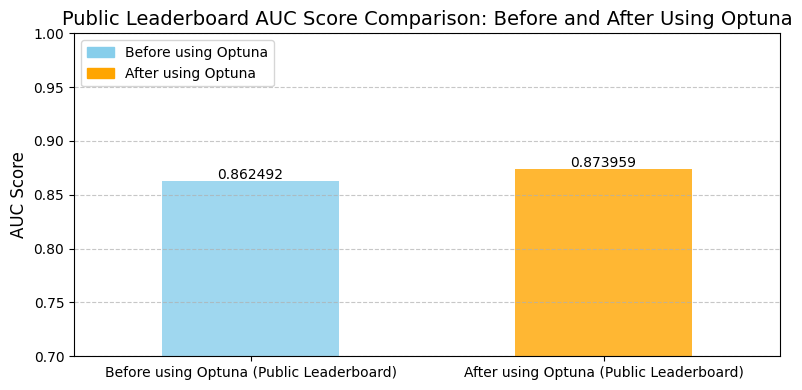

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

# AUC values
auc_scores = [0.862492, 0.873959]

# Labels for the x-axis
labels = ["Before using Optuna (Public Leaderboard)", "After using Optuna (Public Leaderboard)"]

# Bar width and positions
x = np.arange(len(labels))
bar_width = 0.5

# Create the bar plot
plt.figure(figsize=(8, 4))
bars = plt.bar(x, auc_scores, color=['skyblue', 'orange'], width=bar_width, alpha=0.8)

# Add labels, title
plt.xticks(x, labels, ha='center', fontsize=10)
plt.ylabel('AUC Score', fontsize=12)
plt.title('Public Leaderboard AUC Score Comparison: Before and After Using Optuna', fontsize=14)

# Add custom legend
before_patch = mpatches.Patch(color='skyblue', label='Before using Optuna')
after_patch = mpatches.Patch(color='orange', label='After using Optuna')
plt.legend(handles=[before_patch, after_patch], loc='upper left', fontsize=10)

# Annotate each bar with its value
for bar, value in zip(bars, auc_scores):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.002, f"{value:.6f}", 
             ha='center', fontsize=10)

# Add grid lines and set y-axis limit
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ylim(0.70, 1.00)  # Set y-axis range

# Manually adjust x-axis limits to reduce middle gap
plt.xlim(-0.5, 1.5)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


>>> Conditional Preprocessing value

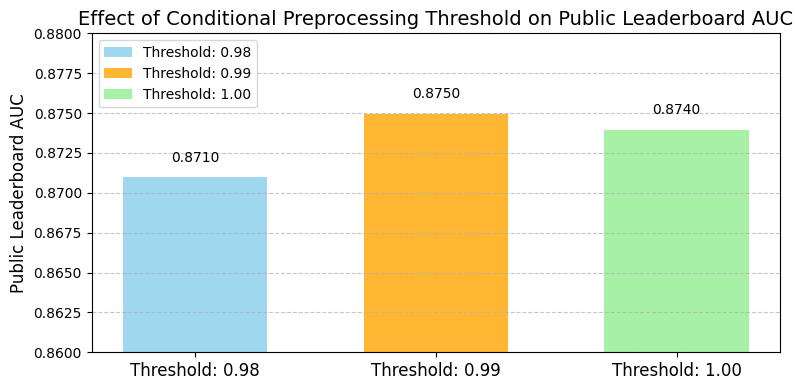

In [44]:
# Data
conditional_preprocessing_values = [0.98, 0.99, 1.00]
public_leaderboard_auc = [0.870963, 0.874964, 0.873959]
colors = ['skyblue', 'orange', 'lightgreen']  # Use three different colors

# Bar width and positions
x = np.arange(len(conditional_preprocessing_values))
bar_width = 0.6

# Create the bar plot
plt.figure(figsize=(8, 4))
bars = plt.bar(x, public_leaderboard_auc, color=colors, width=bar_width, alpha=0.8)

# Add labels, title, and legend
plt.xticks(x, [f"Threshold: {value:.2f}" for value in conditional_preprocessing_values], fontsize=12)
plt.ylabel('Public Leaderboard AUC', fontsize=12)
plt.title('Effect of Conditional Preprocessing Threshold on Public Leaderboard AUC', fontsize=14)
plt.legend(bars, [f"Threshold: {value:.2f}" for value in conditional_preprocessing_values], loc='upper left', fontsize=10)

# Annotate each bar with its value
for bar, value in zip(bars, public_leaderboard_auc):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.001, f"{value:.4f}", 
             ha='center', fontsize=10)

# Add grid lines and set y-axis limit
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ylim(0.86, 0.88)  # Adjust y-axis range for better visibility

# Adjust layout and display the plot
plt.tight_layout()
plt.show()



>>> Optuna number of trials

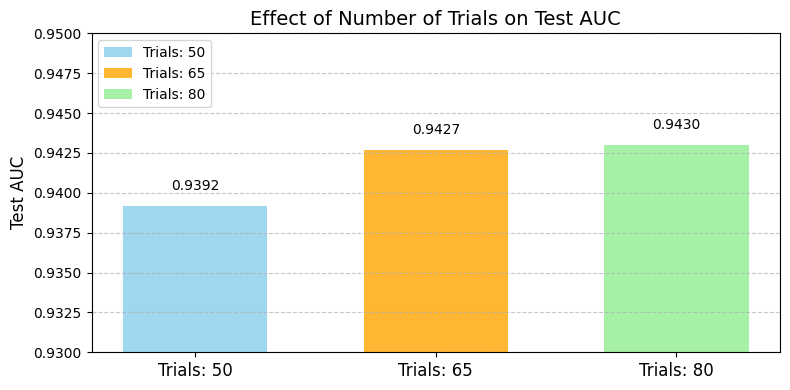

In [47]:
# Data
number_of_trials = [50, 65, 80]
test_auc = [0.9392, 0.9427, 0.9430]  

# Bar width and positions
x = np.arange(len(number_of_trials))
bar_width = 0.6

# Create the bar plot
plt.figure(figsize=(8, 4))
bars = plt.bar(x, test_auc, color=['skyblue', 'orange', 'lightgreen'], width=bar_width, alpha=0.8)

# Add labels, title, and legend
plt.xticks(x, [f"Trials: {trial}" for trial in number_of_trials], fontsize=12)
plt.ylabel('Test AUC', fontsize=12)
plt.title('Effect of Number of Trials on Test AUC', fontsize=14)
plt.legend(bars, [f"Trials: {trial}" for trial in number_of_trials], loc='upper left', fontsize=10)

# Annotate each bar with its value
for bar, value in zip(bars, test_auc):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.001, f"{value:.4f}", 
             ha='center', fontsize=10)

# Add grid lines and set y-axis limit
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ylim(0.93, 0.95)  # Adjust y-axis range for better visibility

# Adjust layout and display the plot
plt.tight_layout()
plt.show()



>>> Manual Parameter Adjustments for Preprocessing-Free Results

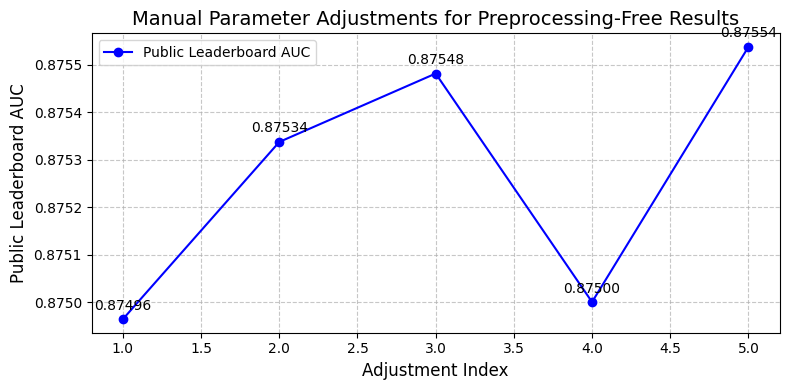

In [14]:
# Data
public_leaderboard_auc = [0.874964, 0.875337, 0.875481, 0.875, 0.875537]
adjustments = range(1, len(public_leaderboard_auc) + 1)  # Numbering the adjustments

# Create the line plot
plt.figure(figsize=(8, 4))
plt.plot(adjustments, public_leaderboard_auc, marker='o', linestyle='-', color='b', label='Public Leaderboard AUC')

# Add labels, title, and legend
plt.xlabel('Adjustment Index', fontsize=12)
plt.ylabel('Public Leaderboard AUC', fontsize=12)
plt.title('Manual Parameter Adjustments for Preprocessing-Free Results', fontsize=14)
plt.legend(fontsize=10)

# Annotate each point with its value
for x, y in zip(adjustments, public_leaderboard_auc):
    plt.text(x, y + 0.00002, f"{y:.5f}", ha='center', fontsize=10)

# Add grid
plt.grid(visible=True, linestyle='--', alpha=0.7)

# Show plot
plt.tight_layout()
plt.show()
